In [2]:
import ipdb
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
import pandas as pd
import matplotlib.pylab as pylab
import cartopy
import cartopy.crs as ccrs
from utils import constants as cnst
from eod import msg
from utils import u_grid, u_interpolate as u_int, u_darrays as uda, u_arrays as ua
import datetime
import matplotlib.colors as mcolors
from cartopy.io.shapereader import Reader
from cartopy.feature import ShapelyFeature
from utils import u_plot as uplot
import salem
import numpy.ma as ma
from scipy import stats, ndimage
import warnings
from scipy.ndimage.measurements import label
import pickle as pkl
import matplotlib.patches as patches


pylab.rcParams['figure.figsize'] = (50., 50.)
%matplotlib inline

In [1]:
cd ..

/home/ck/pythonWorkspace/proj_CEH


In [3]:
fpath = cnst.network_data + 'figs/HUARAZ/'

In [4]:
def readERA(var):

    u200orig = xr.open_dataset('/media/ck/Elements/SouthAmerica/ERA5/hourly/'+var+'_15UTC_1981-2019_peru_big.nc')
    u200orig = uda.flip_lat(u200orig)
    datetimes = pd.to_datetime(u200orig.time.values)
    newtimes = []
    for t in datetimes:
        newtimes.append(t.replace(hour=0))
    u200orig['time'] = ('time', newtimes)
    return u200orig

In [5]:
era = readERA('u200')
era = era.sel(latitude=slice(-25,0), longitude=slice(-81,-65))

In [6]:
era850 = readERA('v850')
era850 = era850.sel(latitude=slice(-25,0), longitude=slice(-81,-65)).load()

In [7]:
topo = xr.open_dataarray(cnst.TOPO_1MIN).sel(lon=slice(-81,-65), lat=slice(-25,0))
topo_on_g = era850.salem.lookup_transform(topo)

In [8]:
tir_on_era = xr.open_mfdataset('/home/ck/DIR/mymachine/GRIDSAT/MCS18_peru/daily_-15ALLkm2_UTC_DAY_onBIGERA/*.nc',
                                combine='nested', concat_dim='time')
tir_doypick = tir_on_era['tir'].sel(time=((tir_on_era['time.year']>=1985)&(tir_on_era['time.year']<=2018))).sel(latitude=slice(-25,0), longitude=slice(-81,-65))
tir_monthly = tir_doypick.resample(time = '1m').mean()

In [9]:
ch_on_era = xr.open_mfdataset('/media/ck/Elements/SouthAmerica/CHIRPS/SA_daily_onERA/CHIRPS_daily_onERA_*.nc').chunk({'time':365})
chirps_doypick = ch_on_era['precip'].sel(time=((ch_on_era['time.year']>=1985)&(ch_on_era['time.year']<=2018))).sel(latitude=slice(-25,0), longitude=slice(-81,-65)).where(topo_on_g>=2000)
chirps_bimod = chirps_doypick#.rolling(time=30, min_periods=3, center=True).mean()#.where((chirps_doypick['time.month']!=8))
chirps_monthly = chirps_doypick.resample(time = '1m').mean()

In [10]:
# regions = {
# 'equatorial' : [(-5,0)],
# 'transition' : [(-8,-5)],
# 'central' : [(-12,-8)],
# 'southern' : [(-18,-15)]}
# h = 2000
fname = '/home/ck/DIR/cornkle/data/HUARAZ/shapes/riosan_sel_one.shp'
sdf = salem.read_shapefile(fname)
sdf = salem.transform_geopandas(sdf, to_crs=salem.wgs84)

In [11]:
regions = {
#'equatorial' : [(-5,0)],
#'transition' : [(-8,-5)],
'central' : [(-12,-8)],
'southern' : [(-18,-15)],
'northern' : [(-8,0)],}
#'RioSanta' : [sdf]}
h = 2000

In [12]:
rdic = pkl.load(open("/home/ck/DIR/cornkle/data/HUARAZ/saves/corr_GRIDSAT-15_start_end_regionMean.p", "rb"))
for r in regions.keys():
    if r == "RioSanta":
        #ipdb.set_trace()
        regions[r].append(rdic['central'][1])
    elif r == "northern":
        regions[r].append(rdic['transition'][1])    
    else:
        regions[r].append(rdic[r][1])

In [13]:
corrdic = pkl.load(open(cnst.network_data + 'data/HUARAZ/saves/corr_GRIDSAT-15_start_end.p', "rb"))

In [14]:
corr_start = corrdic['start_3d']
corr_end = corrdic['end_5d']

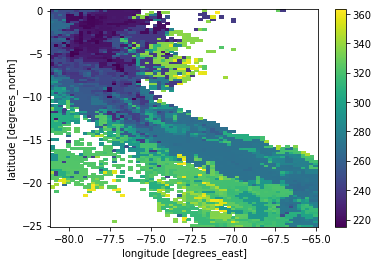

In [15]:
corr_start.plot()

In [16]:
wet_test = xr.open_dataarray('/media/ck/Elements/SouthAmerica/CHIRPS/wet_spells_1mm_3-7days_StartOfSpell.nc').where(topo_on_g>=2000)

In [17]:
dry_test = xr.open_dataarray('/media/ck/Elements/SouthAmerica/CHIRPS/dry_spells_1mm_3-7days_StartOfSpell.nc').where(topo_on_g>=2000)
alls = regions['central']

In [18]:
# wet_test.to_netcdf('/media/ck/Elements/SouthAmerica/CHIRPS/wet_spells_1mm_3-7days_StartOfSpell_2000m.nc')
# dry_test.to_netcdf('/media/ck/Elements/SouthAmerica/CHIRPS/dry_spells_1mm_3-7days_StartOfSpell_2000m.nc')

In [19]:
vvod = xr.open_mfdataset('/media/ck/Elements/SouthAmerica/VOD/onERA/*.nc').sel(latitude=slice(-25,0), longitude=slice(-81,-65)).load()

In [20]:
ndvi = xr.open_dataset('/media/ck/Elements/SouthAmerica/NDVI/onERA/NDVI_all_times.nc').sel(latitude=slice(-25,0), longitude=slice(-81,-65))

In [21]:
ndvi.time

<xarray.DataArray 'time' (time: 254)>
array(['2000-02-01T00:00:00.000000000', '2000-03-01T00:00:00.000000000',
       '2000-04-01T00:00:00.000000000', ..., '2021-01-01T00:00:00.000000000',
       '2021-02-01T00:00:00.000000000', '2021-03-01T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2000-02-01 2000-03-01 ... 2021-03-01
Attributes:
    standard_name:  time
    axis:           T

In [22]:
sm = xr.open_mfdataset('/media/ck/Elements/SouthAmerica/SM_CSI_ESA/onERA/*.nc').sel(latitude=slice(-25,0), longitude=slice(-81,-65)).load()
sm = sm['sm'].where(sm<999)

In [23]:
cutd = dry_test # spell
dry_dat = cutd.where(cutd>0)

cutw = wet_test # spell
wet_dat = cutw.where(cutw>0)

chdat = chirps_doypick
chclim = chdat.groupby('time.dayofyear').mean('time').load().rolling(dayofyear=15, min_periods=1, center=True).mean()#.sel(time=cut['time.year']>=2000)
vod_clim = vvod['vod'].sel(time=((vvod['time.year']>=2000) & (vvod['time.year']<=2018))).groupby('time.dayofyear').mean('time').rolling(dayofyear=15, min_periods=1, center=True).mean()
ndvi_clim = ndvi['precip'].groupby('time.month').mean('time')
vod = vvod['vod'].rolling(time=3, min_periods=1, center=True).mean()
vod_diff = vod_clim.max('dayofyear')-vod_clim.min('dayofyear')

sm_clim = sm.sel(time=((sm['time.year']>=2000) & (sm['time.year']<=2018))).groupby('time.dayofyear').mean('time').rolling(dayofyear=15, min_periods=1, center=True).mean()

/home/ck/miniconda3/lib/python3.7/site-packages/dask/array/numpy_compat.py:41: RuntimeWarning: invalid value encountered in true_divide
  x = np.divide(x1, x2, out)


In [24]:
vod_anoms = []
sm_anoms = []
ch_anoms = []

hh=2000
hh2=5000

for rrs in ['northern', 'central', 'southern']:
    alls = regions[rrs]
    vodc =  vvod['vod'].sel(time=slice('2000-01','2018-12')).groupby('time.dayofyear').mean('time').rolling(dayofyear=15, min_periods=1, center=True).mean()
    smmc = sm['sm'].sel(time=slice('2000-01','2018-12')).groupby('time.dayofyear').mean('time').rolling(dayofyear=15, min_periods=1, center=True).mean()
    chc = chirps_doypick.sel(time=slice('2000-01','2018-12')).load().groupby('time.dayofyear').mean('time').rolling(dayofyear=15, min_periods=1, center=True).mean()

    vod_anom = (vod.sel(time=slice('2000-01','2018-12')).where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])).groupby('time.dayofyear')-vodc.where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])
    sm_anom = (sm['sm'].sel(time=slice('2000-01','2018-12')).where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])).groupby('time.dayofyear')-smmc.where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])
    ch_anom = (chirps_doypick.sel(time=slice('2000-01','2018-12')).where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])).groupby('time.dayofyear')-chc.where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])
    
    vod_anom = vod_anom.where((vod_anom['time.month'] >=12) | (vod_anom['time.month'] <=3))
    sm_anom = sm_anom.where((sm_anom['time.month'] >=12) | (sm_anom['time.month'] <=3))
    ch_anom = ch_anom.where((sm_anom['time.month'] >=12) | (sm_anom['time.month'] <=3))
    
    vod_anoms.append(vod_anom*-1)
    sm_anoms.append(sm_anom)
    ch_anoms.append(ch_anom)

In [25]:
from scipy.stats import gaussian_kde
 

def calc_density(v1,v2):

    xy = np.vstack([v1, v2])

    z = gaussian_kde(xy)(xy)

    return z / (z.max() - z.min())

northern 0.16431597190850916 3.3924162010676283e-14
central 0.5857800361852846 9.289449543084693e-201
southern 0.4448686180651645 1.1718343395257765e-109


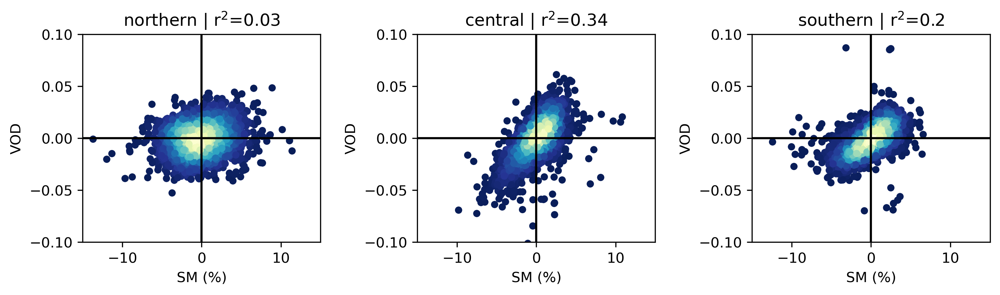

In [26]:
f = plt.figure(figsize=(10,3), dpi=300)

for ids, rrs in enumerate(['northern', 'central', 'southern']):
    
    
#     ax = f.add_subplot(2,3,ids+1)
#     finites = np.isfinite(sm_anoms[ids].values) & np.isfinite(ch_anoms[ids].values)
    
#     #ipdb.set_trace()
    
#     var1 = sm_anoms[ids][finites]
#     var2 = ch_anoms[ids][finites]
    
#     slope, inter, rval, pval, stderr = stats.linregress(var1, var2)
#     print(rrs, rval, pval)
    
#     density = calc_density(var2,var1*-1)
#     plt.scatter( ch_anoms[ids][finites], sm_anoms[ids][finites]*100, c=density, s=17, cmap="YlGnBu_r")
#     plt.xlabel('Precip (mm day$^{-1}$)')
#     plt.ylabel('SM (%)')
#     ax.axhline(0, color='k')
#     ax.axvline(0, color='k')
#     ax.set_xlim(-15,15)
#     ax.set_ylim(-10,10)
#     plt.title(rrs+' | r$^2$='+str(np.round(rval**2,2)))
    
    
    ########################################
    ########################################

    ax = f.add_subplot(1,3,ids+1)
    finites = np.isfinite(sm_anoms[ids].values) & np.isfinite(vod_anoms[ids].values)
    
    #ipdb.set_trace()
    
    var1 = sm_anoms[ids][finites]
    var2 = vod_anoms[ids][finites]
    
    slope, inter, rval, pval, stderr = stats.linregress(var1, var2)
    print(rrs, rval, pval)
    
    density = calc_density(var1,var2*-1)
    plt.scatter(sm_anoms[ids][finites]*100, (vod_anoms)[ids][finites], c=density, s=17, cmap="YlGnBu_r")  # *-1
    plt.ylabel('VOD')
    plt.xlabel('SM (%)')
    ax.axhline(0, color='k')
    ax.axvline(0, color='k')
    ax.set_xlim(-15,15)
    ax.set_ylim(-0.1,0.1)
    plt.title(rrs+' | r$^2$='+str(np.round(rval**2,2)))
    
plt.tight_layout()
#f.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_vod_scatter.jpg')

In [27]:
vod_anom

<xarray.DataArray (time: 6940)>
array([-0.01745924, -0.0132296 , -0.00326242, ...,  0.00607598,
       -0.00193816, -0.00153026])
Coordinates:
  * time       (time) datetime64[ns] 2000-01-01T12:00:00 ... 2018-12-31T12:00:00
    dayofyear  (time) int64 1 2 3 4 5 6 7 8 ... 358 359 360 361 362 363 364 365

/home/ck/miniconda3/lib/python3.7/site-packages/xarray/core/dataarray.py:2979: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs
/home/ck/miniconda3/lib/python3.7/site-packages/xarray/core/dataarray.py:2979: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs
/home/ck/miniconda3/lib/python3.7/site-packages/xarray/core/dataarray.py:2979: FutureWarning: roll_coords will be set to False in the future. Explicitly set roll_coords to silence warning.
  shifts=shifts, roll_coords=roll_coords, **shifts_kwargs


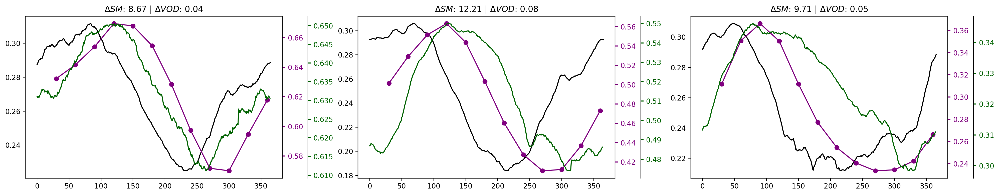

In [28]:
f = plt.figure(figsize=(20,4), dpi=200)
for ids, rr in enumerate(['northern', 'central', 'southern']):
    
    
    
    alls = regions[rr]
    hh = 2500
    hh2 = 4800
    ax = f.add_subplot(1,3,ids+1)
    ax.plot((sm_clim['sm'].where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])), label='SM', color='k')
    ax2 = ax.twinx()
    pl2 = ax2.plot(np.arange(1,13)*30,(ndvi_clim.where((topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])).values, marker='o', label='NDVI', color='purple')

    ax1 = ax.twinx()
    pl1 = ax1.plot((vod_clim.where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).isel(dayofyear=slice(0,365)).mean(['latitude', 'longitude'])).roll(shifts={'dayofyear':-50}).values, color='darkgreen')
    
    
    vodl = (vod_clim.where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).isel(dayofyear=slice(0,365)).mean(['latitude', 'longitude']))
    sml = (sm_clim['sm'].where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude']))
    
    plt.title(r'$\Delta SM$: '+str(np.round((sml.max()-sml.min()).values*100,2)) +' | ' +'$\Delta VOD$: '+str(np.round((vodl.max()-vodl.min()).values,2)))
    
    ax1.spines["right"].set_position(("axes", 1.1))

#     ax3 = ax2.twinx()
#     ax.plot((chclim.where((topo_on_g>hh) & (topo_on_g<hh2)).sel(latitude=slice(alls[0][0], alls[0][1])).isel(dayofyear=slice(0,365)).mean(['latitude', 'longitude'])).values, color='k')
    ax1.yaxis.label.set_color(pl1[0].get_color())
    ax2.yaxis.label.set_color(pl2[0].get_color())



    tkw = dict(size=4, width=1.5)
    ax1.tick_params(axis='y', colors=pl1[0].get_color(), **tkw)
    ax2.tick_params(axis='y', colors=pl2[0].get_color(), **tkw)
plt.tight_layout()

In [29]:
vmonth = vvod['vod'].groupby('time.month').mean('time')
vmonth = vmonth.fillna(0)

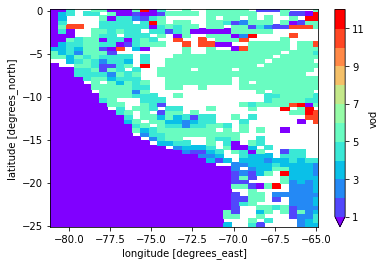

In [30]:
monthmax = vmonth.argmax(dim='month',skipna=True)
monthmax.where((monthmax < 6) | (monthmax > 9)).plot(cmap='rainbow', levels=np.arange(1,13))

In [34]:
vodmask = (monthmax < 6) | (monthmax > 9)

Text(0.5, 1.0, 'Climatological seasonal cycle (2000-2018), Huaraz pixel')

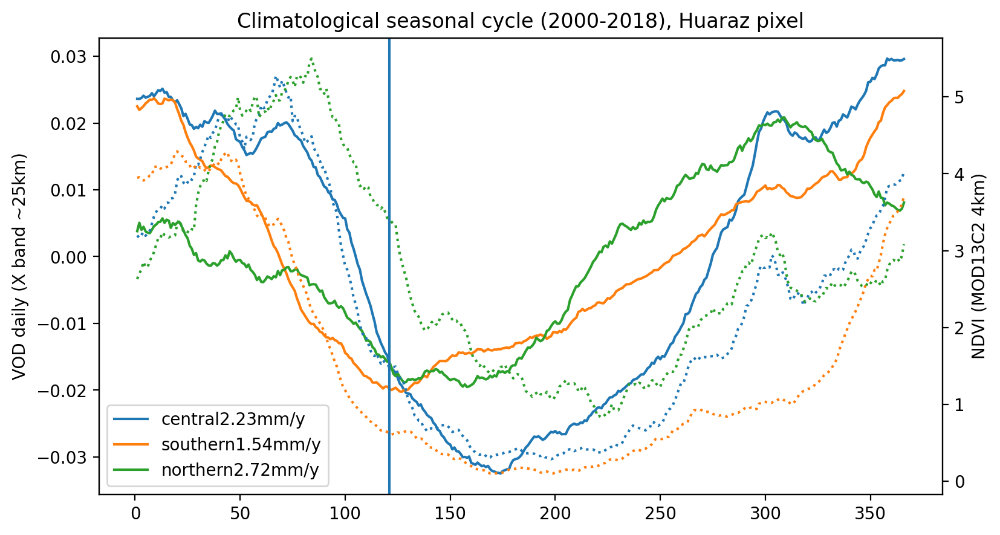

In [35]:
f = plt.figure(figsize=(9,5),dpi=200)
ax = f.add_subplot(111)
ax1 = ax.twinx()
smclim_collect = {}
vodclim_collect = {}
for region in regions:
    alls = regions[region]
    if region == 'RioSanta':
        clims = vod_clim.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).mean(['latitude', 'longitude'])*-1
        nclims = chclim.where(topo_on_g>h).salem.roi(shape=sdf, all_touched=True).mean(['latitude', 'longitude'])
        
    else:        
        clims = vod_clim.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])*-1
        nclims = chclim.sel(latitude=slice(alls[0][0], alls[0][1])).where(topo_on_g>h).mean(['latitude', 'longitude'])
    ax.plot(vod_clim.dayofyear, clims - np.mean(clims), label=region+str(np.round(np.mean(nclims.values),2))+'mm/y')#.sel(latitude=-9.3, longitude=-77.5, method='nearest'))
    ax.set_ylabel('VOD daily (X band ~25km)')
    ax1.plot(sm_clim.dayofyear, nclims, label=region, linestyle='dotted')#.sel(latitude=-9.3, longitude=-77.5, method='nearest'), color='g')

    
# ax1.plot(ndvi_clim.dayofyear, ndvi_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest'), color='k')
# ax.plot(vod_clim.dayofyear, vod_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest')-0.7, color='k')
ax1.set_ylabel('NDVI (MOD13C2 4km)')
ax.legend()
ax.axvline(121)
ax.set_title('Climatological seasonal cycle (2000-2018), Huaraz pixel')

Text(0.5, 1.0, 'Climatological seasonal cycle')

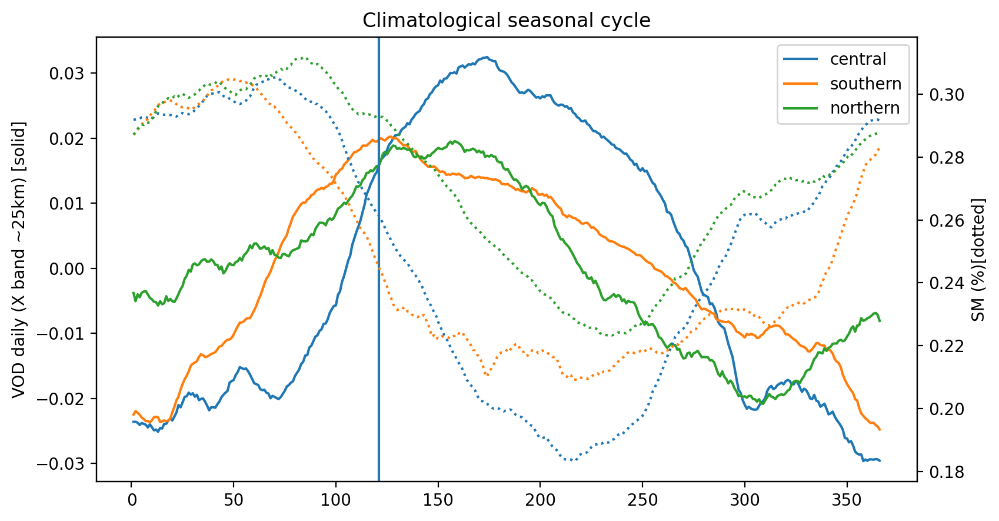

In [36]:
f = plt.figure(figsize=(9,5),dpi=200)
ax = f.add_subplot(111)
ax1 = ax.twinx()
smclim_collect = {}
vodclim_collect = {}
for region in regions:
    alls = regions[region]
    if region == 'RioSanta':
        clims = vod_clim.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).mean(['latitude', 'longitude'])
        nclims = sm_clim['sm'].where(topo_on_g>h).salem.roi(shape=sdf, all_touched=True).mean(['latitude', 'longitude'])
        
    else:        
        clims = vod_clim.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1])).mean(['latitude', 'longitude'])
        nclims = sm_clim['sm'].sel(latitude=slice(alls[0][0], alls[0][1])).where(topo_on_g>h).mean(['latitude', 'longitude'])
    ax.plot(vod_clim.dayofyear, clims - np.nanmean(clims), label=region)#.sel(latitude=-9.3, longitude=-77.5, method='nearest'))
    ax.set_ylabel('VOD daily (X band ~25km) [solid]')
    ax1.plot(sm_clim.dayofyear, nclims, label=region, linestyle='dotted')#.sel(latitude=-9.3, longitude=-77.5, method='nearest'), color='g')
    
#     if region == 'southern':
#         ipdb.set_trace()

    smclim_collect[region] = nclims.max()-nclims.min()
    vodclim_collect[region] = clims.max()-clims.min()
    
    
    
# ax1.plot(ndvi_clim.dayofyear, ndvi_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest'), color='k')
# ax.plot(vod_clim.dayofyear, vod_clim.sel(latitude=-9.5, longitude=-75.5, method='nearest')-0.7, color='k')
ax1.set_ylabel('SM (%)[dotted]')
ax.legend()
ax.axvline(121)
ax.set_title('Climatological seasonal cycle')

In [37]:
smclim_collect

{'central': <xarray.DataArray 'sm' ()>
 array(0.12213312),
 'southern': <xarray.DataArray 'sm' ()>
 array(0.09569757),
 'northern': <xarray.DataArray 'sm' ()>
 array(0.08855459)}

In [38]:
# pkl.dump(smclim_collect, open('/home/ck/DIR/cornkle/data/HUARAZ/saves/climdiff_veg_smcollect.p', 'wb'))

In [39]:
# pkl.dump(vodclim_collect, open('/home/ck/DIR/cornkle/data/HUARAZ/saves/climdiff_veg_vodcollect.p', 'wb'))

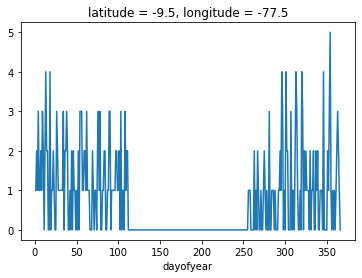

In [40]:
wet_test.where(wet_test==3).groupby('time.dayofyear').count('time').sel(latitude=-9.5, longitude=-77.5, method='nearest').plot()

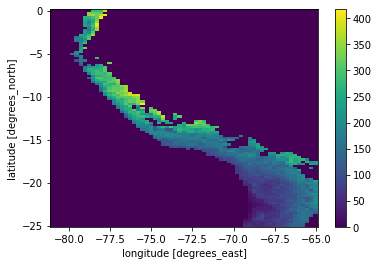

In [41]:
wet_test.where(wet_test==3).count('time').plot()

In [42]:
fname = '/home/ck/DIR/cornkle/data/HUARAZ/shapes/riosan_sel_one.shp'
sdf = salem.read_shapefile(fname)
sdf = salem.transform_geopandas(sdf, to_crs=salem.wgs84)

In [43]:
wet_test

<xarray.DataArray (time: 12418, latitude: 101, longitude: 65)>
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ...,  0., nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ...,  0., nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ...,  0., nan, nan],
        ...,
...
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ...,  0., nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ...,  0., nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]], dtype=float32)
Coordinates:
  * time       (time) datetime64[ns] 1985-01-01 1985-01-02 ... 2018-12-31
  * latitude   (latitude) float32 -25.0 -24.75 -24.5 -24.25 ... -0.5 -0.25 0.0
  * longitude  (longitude) float32 -81.0 -80.75 -80.5 ... -65.5 -65.25 -65.0

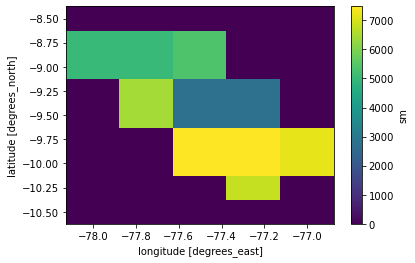

In [44]:
sm['sm'].salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77), time=wet_test.time).count('time').plot()

In [45]:
def get_clim(spell_dat, vod, vod_clim, spell_length, topo, region='central', syear=2000, datatag='vod'):
    
    regions = {
    'equatorial' : [(-5,0)],
    'transition' : [(-8,-5)],
    'central' : [(-12,-8)],
    'southern' : [(-18,-15)],
    'northern' : [(-8,0)]}
    h = 2000

    
    alls = regions[region]

    sp = spell_dat.where((topo>h)).sel(latitude=slice(alls[0][0], alls[0][1]) & ((spell_dat['time.month']>=8) | (spell_dat['time.month']<=12))) #& ((spell_dat['time.month']>=12) | (spell_dat['time.month']<=3)

    vo = vod.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1]))
    vo_clim = vod_clim.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1]))
    
    ns = 30
    
    errlistv = None
    errlistc = None
    isnb = 0
    for ix, x in enumerate(sp.longitude):
        for iy, y in enumerate(sp.latitude):
                print('Doing', x.values, y.values)
                dates = sp.sel(time=sp['time.year']>=syear, latitude=y, longitude=x, method='nearest') # chirps
                
                if np.sum(np.isnan(dates.values)) == dates.shape: # if entire timeseries in nan, go to next pixel
                    print('Allnan, continue')
                    continue
                    
                d3 = dates[(dates==spell_length)]
                
                for dd in d3.time:

                    dd = pd.Timestamp(dd.values)
                    if datatag == 'vod':
                        dtime = dd.replace(hour=12)
                    else:
                        dtime = dd
                        
                    dtime2 = dtime + pd.Timedelta('27 days')
                    dtime1 = dtime - pd.Timedelta('2 days')
                    chdtime1 =  dtime - pd.Timedelta('3 days') # because chirps hour is 00 and vod hour is 12, dtime (at 12) - 1day is missing 12 hours if not day+1 is removed for chirps
                    
                    if datatag =='vod':
                        chdtime1 =  dtime - pd.Timedelta('3 days')
                    else:
                        chdtime1 = dtime1
                        
#                     if dtime2.dayofyear - dtime1.dayofyear < 0:
#                         print('doy error')
#                         continue
                    if dtime1.dayofyear < dtime2.dayofyear:
                        ntime = vo.sel(time=((vo['time.dayofyear']>=dtime1.dayofyear) & (vo['time.dayofyear']<=dtime2.dayofyear))).sel(latitude=y, longitude=x)   
                    else:
                        ntime = vo.sel(time=((vo['time.dayofyear']>=dtime1.dayofyear) | (vo['time.dayofyear']<=dtime2.dayofyear))).sel(latitude=y, longitude=x)

                    #ipdb.set_trace()
                    nclim = vo_clim.sel(dayofyear=slice(dtime1.dayofyear,dtime2.dayofyear)).sel(latitude=y, longitude=x)
                    try:
                        ntime = np.reshape(ntime.values, (-1,ns))
                    except:
                        continue
                    #ipdb.set_trace()
                    if errlistv is not None:
                        errlistv = np.vstack((errlistv,ntime)) 
                    else:
                        errlistv = ntime
                        
                    if errlistc is not None:
                        errlistc = np.vstack((errlistc,nclim.values)) 
                    else:
                        errlistc = nclim.values

                                          
                    print('Doing', isnb)
                    isnb +=1
                               
    return errlistv, errlistc

In [ ]:
rtag = '_8-12m'
pclim_smw, mclim_smw =  get_clim(wet_dat, sm['sm'], sm_clim['sm'], 3, topo_on_g, datatag='sm', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_central_clim_3w'+rtag+'.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat, sm['sm'], sm_clim['sm'], 5, topo_on_g, datatag='sm', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_central_clim_5w'+rtag+'.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat, sm['sm'], sm_clim['sm'], 7, topo_on_g, datatag='sm', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_central_clim_7w'+rtag+'.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(dry_dat, sm['sm'], sm_clim['sm'], 3, topo_on_g, datatag='sm', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_central_clim_3d'+rtag+'.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, sm['sm'], sm_clim['sm'], 5, topo_on_g, datatag='sm', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_central_clim_5d'+rtag+'.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, sm['sm'], sm_clim['sm'], 7, topo_on_g, datatag='sm', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_central_clim_7d'+rtag+'.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(wet_dat, sm['sm'], sm_clim['sm'], 3, topo_on_g, datatag='sm', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_northern_clim_3w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat, sm['sm'], sm_clim['sm'], 5, topo_on_g, datatag='sm', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_northern_clim_5w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat, sm['sm'], sm_clim['sm'], 7, topo_on_g, datatag='sm', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_northern_clim_7w.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(dry_dat, sm['sm'], sm_clim['sm'], 3, topo_on_g, datatag='sm', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_northern_clim_3d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, sm['sm'], sm_clim['sm'], 5, topo_on_g, datatag='sm', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_northern_clim_5d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, sm['sm'], sm_clim['sm'], 7, topo_on_g, datatag='sm', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_northern_clim_7d.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(wet_dat, sm['sm'], sm_clim['sm'], 3, topo_on_g, datatag='sm', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_southern_clim_3w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat, sm['sm'], sm_clim['sm'], 5, topo_on_g, datatag='sm', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_southern_clim_5w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat, sm['sm'], sm_clim['sm'], 7, topo_on_g, datatag='sm', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_southern_clim_7w.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(dry_dat, sm['sm'], sm_clim['sm'], 3, topo_on_g, datatag='sm', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_southern_clim_3d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, sm['sm'], sm_clim['sm'], 5, topo_on_g, datatag='sm', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_southern_clim_5d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, sm['sm'], sm_clim['sm'], 7, topo_on_g, datatag='sm', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_southern_clim_7d.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(wet_dat,  vod, vod_clim, 3, topo_on_g, datatag='vod', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_northern_clim_3w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat,  vod, vod_clim, 5, topo_on_g, datatag='vod', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_northern_clim_5w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat,  vod, vod_clim, 7, topo_on_g, datatag='vod', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_northern_clim_7w.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(dry_dat, vod, vod_clim, 3, topo_on_g, datatag='vod', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_central_clim_3d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, vod, vod_clim, 5, topo_on_g, datatag='vod', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_central_clim_5d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, vod, vod_clim, 7, topo_on_g, datatag='vod', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_central_clim_7d.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(dry_dat, vod, vod_clim, 3, topo_on_g, datatag='vod', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_northern_clim_3d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, vod, vod_clim, 5, topo_on_g, datatag='vod', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_northern_clim_5d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, vod, vod_clim, 7, topo_on_g, datatag='vod', region='northern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_northern_clim_7d.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(wet_dat,  vod, vod_clim, 3, topo_on_g, datatag='vod', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_central_clim_3w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat,  vod, vod_clim, 5, topo_on_g, datatag='vod', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_central_clim_5w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat,  vod, vod_clim, 7, topo_on_g, datatag='vod', region='central', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_central_clim_7w.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(wet_dat,  vod, vod_clim, 3, topo_on_g, datatag='vod', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_southern_clim_3w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat,  vod, vod_clim, 5, topo_on_g, datatag='vod', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_southern_clim_5w.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(wet_dat,  vod, vod_clim, 7, topo_on_g, datatag='vod', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_southern_clim_7w.p', 'wb'))

In [ ]:
pclim_smw, mclim_smw =  get_clim(dry_dat, vod, vod_clim, 3, topo_on_g, datatag='vod', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_southern_clim_3d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, vod, vod_clim, 5, topo_on_g, datatag='vod', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_southern_clim_5d.p', 'wb'))

pclim_smw, mclim_smw =  get_clim(dry_dat, vod, vod_clim, 7, topo_on_g, datatag='vod', region='southern', syear=2005)
pkl.dump((pclim_smw, mclim_smw), open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_southern_clim_7d.p', 'wb'))

In [79]:
rtag = '_8-12mo'

def vod_composite(spell_dat, vod, vod_clim, chirps, spell_length, topo, region='central', syear=2000, datatag='vod'):
    
    regions = {
    'equatorial' : [(-5,0)],
    'transition' : [(-8,-5)],
    'central' : [(-12,-8)],
    'southern' : [(-18,-15)],
    'northern' : [(-8,0)]}
    h = 2000

#     alls = regions[r]
#     doys_s = np.round(alls[1][0])
#     doys_e = np.round(alls[1][1])
    
    
    if region == 'RioSanta':
        fname = '/home/ck/DIR/cornkle/data/HUARAZ/shapes/riosan_sel_one.shp'
        sdf = salem.read_shapefile(fname)
        sdf = salem.transform_geopandas(sdf, to_crs=salem.wgs84)
        sp = spell_dat.where((topo>h) ).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77)) #& ((spell_dat['time.month']>=12) | (spell_dat['time.month']<=3)
        #sp = spell_dat.where((topo>h) & ((spell_dat['time.dayofyear']>=doys_s) | (spell_dat['time.dayofyear']<=doys_e))).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77))
        chirp = chirps.where(topo>h).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77)).load()
        
        vo_clim = vod_clim.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77))
        vo = vod.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77))
        vo_diff = vod_diff.where((vodmask) & (topo_on_g>h)).salem.roi(shape=sdf, all_touched=True).sel(latitude=slice(-10.5,-8.5), longitude= slice(-78,-77))

    else:
    
        alls = regions[region]

        sp = spell_dat.where((topo>h) & ((spell_dat['time.month']>=8) & (spell_dat['time.month']<=12))).sel(latitude=slice(alls[0][0], alls[0][1])) #& ((spell_dat['time.month']>=12) | (spell_dat['time.month']<=3)
        #sp = spell_dat.where((topo>h) & ((spell_dat['time.dayofyear']>=doys_s) | (spell_dat['time.dayofyear']<=doys_e))).sel(latitude=slice(alls[0][0], alls[0][1]))
        chirp = chirps.where(topo>h).sel(latitude=slice(alls[0][0], alls[0][1])).load()

        vo = vod.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1]))
        vo_clim = vod_clim.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1]))
        vo_diff = vod_diff.where((vodmask) & (topo_on_g>h)).sel(latitude=slice(alls[0][0], alls[0][1]))
    
    ns = 30
    
    outdates = []
    
    chllist = np.arange(ns)*0 #0
    chcnt = np.arange(ns)*0

    llist = np.arange(ns)*0 #0
    cnt = np.arange(ns)*0

    llist_clim = np.arange(ns)*0 #0
    cnt_clim = np.arange(ns)*0
    
    llist_diff = np.arange(ns)*0 #0
    cnt_diff = np.arange(ns)*0
    isnb = 0
    #np.nan #
    #lnorm = np.arange(ns)*0
    
    errlistv = None
    errlistc = None
    
    for ix, x in enumerate(sp.longitude):
        for iy, y in enumerate(sp.latitude):
                print('Doing', x.values, y.values)
                dates = sp.sel(time=sp['time.year']>=syear, latitude=y, longitude=x, method='nearest') # chirps
                
                if np.sum(np.isnan(dates.values)) == dates.shape: # if entire timeseries in nan, go to next pixel
                    print('Allnan, continue')
                    continue
                    
                d3 = dates[(dates==spell_length)]
                
                for dd in d3.time:

                    dd = pd.Timestamp(dd.values)
                    if datatag == 'vod':
                        dtime = dd.replace(hour=12)
                    else:
                        dtime = dd
                        
                    dtime2 = dtime + pd.Timedelta('27 days')
                    dtime1 = dtime - pd.Timedelta('2 days')
                    chdtime1 =  dtime - pd.Timedelta('3 days') # because chirps hour is 00 and vod hour is 12, dtime (at 12) - 1day is missing 12 hours if not day+1 is removed for chirps
                    
                    if datatag =='vod':
                        chdtime1 =  dtime - pd.Timedelta('3 days')
                    else:
                        chdtime1 = dtime1
                        
#                     if dtime2.dayofyear - dtime1.dayofyear < 0:
#                         print('doy error')
#                         continue
                    ntime = vo.sel(time=slice(dtime1,dtime2)).sel(latitude=y, longitude=x)
                    chtime = chirp.sel(time=slice(chdtime1,dtime2)).sel(latitude=y, longitude=x)
                    if dtime1.dayofyear < dtime2.dayofyear:
                        nclim = vo_clim.sel(dayofyear=slice(dtime1.dayofyear,dtime2.dayofyear)).sel(latitude=y, longitude=x)
                    elif dtime.is_leap_year:
                        nclim = vo_clim.sel(dayofyear=((vo_clim['dayofyear']>=dtime1.dayofyear) | (vo_clim['dayofyear']<=dtime2.dayofyear))).sel(latitude=y, longitude=x)
                    else:
                        nclim = vo_clim.sel(dayofyear=vo_clim['dayofyear']<=365)
                        nclim = nclim.sel(dayofyear=((nclim['dayofyear']>=dtime1.dayofyear) | (nclim['dayofyear']<=dtime2.dayofyear))).sel(latitude=y, longitude=x)
                        
                    #ntime.values[ntime.values==0] = np.nan
                    #ipdb.set_trace()
#                     if 0 in ntime.values:
#                         print('Is zero, continue')
#                         continue
                    
                    if nclim.shape[0] != ns:
                        nclim = vo_clim.sel(dayofyear=((vo_clim['dayofyear']>=dtime1.dayofyear) | (vo_clim['dayofyear']<=dtime2.dayofyear))).sel(latitude=y, longitude=x)
                
                    if nclim.shape[0] != ns:
                        continue
                
                    ndiff = vo_diff.sel(latitude=y, longitude=x)
                    try:
                        cnt = cnt+np.isfinite(ntime.values).astype(int)
                    except:
                        continue
                        
                    try:
                        cnt_clim = cnt_clim+np.isfinite(nclim.values).astype(int)
                    except:
                        ipdb.set_trace()
                        
                    cnt_diff = cnt_diff+np.isfinite(ndiff.values).astype(int)
                    
                    try:
                        chcnt = chcnt+np.isfinite(chtime.values).astype(int)
                    except:
                        print('time series too short, continue')
                        continue

                    norm = ntime #(ntime - ntime.min()) / ndiff

                    if errlistv is not None:
                        errlistv = np.vstack((errlistv,ntime.values)) 
                    else:
                        errlistv = ntime.values


                    if errlistc is not None:
                        errlistc = np.vstack((errlistc,chtime.values))
                    else:
                        errlistc = chtime.values 

                    ntime = ntime.where(np.isfinite(ntime), other=0).values
                    chtime = chtime.where(np.isfinite(chtime), other=0).values
                    nclim = nclim.where(np.isfinite(nclim), other=0).values
                    ndiff = ndiff.where(np.isfinite(ndiff), other=0).values

                    llist = llist+ntime
                    llist_clim = llist_clim+nclim
                    llist_diff = llist_diff+ndiff
                    chllist = chllist+chtime
                    
                    outdates.append(dd)
#                     except:
#                         ipdb.set_trace()
#                         print('something wrong')
#                         continue
                        
                    #try:

                    #except:
                        #ipdb.set_trace()
                                          
                    print('Doing', isnb)
                    isnb +=1
                               
    return chllist, chcnt, llist, cnt, llist_clim, llist_diff, cnt_clim, cnt_diff, errlistv, errlistc, outdates

In [53]:
ch3sm, chcnt3sm, sm3, smcnt3, smclim3, smdiff3, smclimcnt3, smdiffcnt3, smerrv3, smerrc3, smdates3 = vod_composite(wet_dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='central', syear=1985)
ch5sm, chcnt5sm, sm5, smcnt5, smclim5, smdiff5, smclimcnt5, smdiffcnt5, smerrv5, smerrc5, smdates5 = vod_composite(wet_dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='central', syear=1985)
ch7sm, chcnt7sm, sm7, smcnt7, smclim7, smdiff7, smclimcnt7, smdiffcnt7, smerrv7, smerrc7, smdates7 = vod_composite(wet_dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='central', syear=1985)

Doing -81.0 -12.0
Allnan, continue
Doing -81.0 -11.75
Allnan, continue
Doing -81.0 -11.5
Allnan, continue
Doing -81.0 -11.25
Allnan, continue
Doing -81.0 -11.0
Allnan, continue
Doing -81.0 -10.75
Allnan, continue
Doing -81.0 -10.5
Allnan, continue
Doing -81.0 -10.25
Allnan, continue
Doing -81.0 -10.0
Allnan, continue
Doing -81.0 -9.75
Allnan, continue
Doing -81.0 -9.5
Allnan, continue
Doing -81.0 -9.25
Allnan, continue
Doing -81.0 -9.0
Allnan, continue
Doing -81.0 -8.75
Allnan, continue
Doing -81.0 -8.5
Allnan, continue
Doing -81.0 -8.25
Allnan, continue
Doing -81.0 -8.0
Allnan, continue
Doing -80.75 -12.0
Allnan, continue
Doing -80.75 -11.75
Allnan, continue
Doing -80.75 -11.5
Allnan, continue
Doing -80.75 -11.25
Allnan, continue
Doing -80.75 -11.0
Allnan, continue
Doing -80.75 -10.75
Allnan, continue
Doing -80.75 -10.5
Allnan, continue
Doing -80.75 -10.25
Allnan, continue
Doing -80.75 -10.0
Allnan, continue
Doing -80.75 -9.75
Allnan, continue
Doing -80.75 -9.5
Allnan, continue
Doing 

Doing 194
Doing 195
Doing 196
Doing 197
Doing 198
Doing 199
Doing 200
Doing 201
Doing 202
Doing 203
Doing 204
Doing 205
Doing 206
Doing 207
Doing 208
Doing 209
Doing 210
Doing 211
Doing 212
Doing 213
Doing 214
Doing 215
Doing 216
Doing 217
Doing 218
Doing 219
Doing 220
Doing 221
Doing 222
Doing 223
Doing 224
Doing 225
Doing 226
Doing 227
Doing 228
Doing 229
Doing 230
Doing 231
Doing 232
Doing 233
Doing 234
Doing 235
Doing 236
Doing -78.25 -12.0
Allnan, continue
Doing -78.25 -11.75
Allnan, continue
Doing -78.25 -11.5
Allnan, continue
Doing -78.25 -11.25
Allnan, continue
Doing -78.25 -11.0
Allnan, continue
Doing -78.25 -10.75
Allnan, continue
Doing -78.25 -10.5
Allnan, continue
Doing -78.25 -10.25
Allnan, continue
Doing -78.25 -10.0
Allnan, continue
Doing -78.25 -9.75
Allnan, continue
Doing -78.25 -9.5
Allnan, continue
Doing -78.25 -9.25
Allnan, continue
Doing -78.25 -9.0
Allnan, continue
Doing -78.25 -8.75
Allnan, continue
Doing -78.25 -8.5
Doing 237
Doing 238
Doing 239
Doing 240
Doing 

Doing 922
Doing 923
Doing 924
Doing 925
Doing 926
Doing 927
Doing 928
Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
Doing 936
Doing 937
Doing 938
Doing 939
Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing 945
Doing 946
Doing 947
Doing 948
Doing 949
Doing 950
Doing 951
Doing 952
Doing 953
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
Doing 962
Doing 963
Doing 964
Doing 965
Doing 966
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
Doing 977
Doing 978
Doing 979
Doing 980
Doing 981
Doing 982
Doing 983
Doing 984
Doing 985
Doing -78.0 -8.5
Doing 986
Doing 987
Doing 988
Doing 989
Doing 990
Doing 991
Doing 992
Doing 993
Doing 994
Doing 995
Doing 996
Doing 997
Doing 998
Doing 999
Doing 1000
Doing 1001
Doing 1002
Doing 1003
Doing 1004
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doing 1015
Doing 1016
Doing 1017
Doing

Doing 1665
Doing 1666
Doing 1667
Doing 1668
Doing 1669
Doing 1670
Doing 1671
Doing 1672
Doing 1673
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing 1684
Doing 1685
Doing 1686
Doing 1687
Doing 1688
Doing 1689
Doing 1690
Doing 1691
Doing 1692
Doing 1693
Doing 1694
Doing 1695
Doing 1696
Doing 1697
Doing 1698
Doing 1699
Doing 1700
Doing 1701
Doing 1702
Doing 1703
Doing 1704
Doing 1705
Doing 1706
Doing 1707
Doing 1708
Doing 1709
Doing 1710
Doing 1711
Doing 1712
Doing 1713
Doing 1714
Doing 1715
Doing 1716
Doing -77.75 -9.25
Doing 1717
Doing 1718
Doing 1719
Doing 1720
Doing 1721
Doing 1722
Doing 1723
Doing 1724
Doing 1725
Doing 1726
Doing 1727
Doing 1728
Doing 1729
Doing 1730
Doing 1731
Doing 1732
Doing 1733
Doing 1734
Doing 1735
Doing 1736
Doing 1737
Doing 1738
Doing 1739
Doing 1740
Doing 1741
Doing 1742
Doing 1743
Doing 1744
Doing 1745
Doing 1746
Doing 1747
Doing 1748
Doing 1749
Doing 1750
Doing 1751
Doing 1752
Doing 1753
Do

Doing 2393
Doing 2394
Doing 2395
Doing 2396
Doing 2397
Doing 2398
Doing 2399
Doing 2400
Doing 2401
Doing 2402
Doing 2403
Doing 2404
Doing 2405
Doing 2406
Doing 2407
Doing 2408
Doing 2409
Doing 2410
Doing 2411
Doing 2412
Doing 2413
Doing 2414
Doing 2415
Doing 2416
Doing 2417
Doing 2418
Doing 2419
Doing 2420
Doing 2421
Doing 2422
Doing 2423
Doing 2424
Doing 2425
Doing 2426
Doing 2427
Doing 2428
Doing 2429
Doing 2430
Doing 2431
Doing 2432
Doing 2433
Doing 2434
Doing 2435
Doing 2436
Doing 2437
Doing 2438
Doing 2439
Doing 2440
Doing 2441
Doing 2442
Doing 2443
Doing 2444
Doing 2445
Doing 2446
Doing 2447
Doing 2448
Doing 2449
Doing 2450
Doing 2451
Doing 2452
Doing 2453
Doing 2454
Doing 2455
Doing 2456
Doing 2457
Doing 2458
Doing 2459
Doing 2460
Doing 2461
Doing 2462
Doing 2463
Doing 2464
Doing 2465
Doing 2466
Doing 2467
Doing 2468
Doing 2469
Doing 2470
Doing 2471
Doing 2472
Doing 2473
Doing 2474
Doing 2475
Doing 2476
Doing 2477
Doing 2478
Doing 2479
Doing 2480
Doing 2481
Doing 2482
Doing 2483

Doing 3130
Doing 3131
Doing 3132
Doing 3133
Doing 3134
Doing 3135
Doing 3136
Doing 3137
Doing 3138
Doing 3139
Doing 3140
Doing 3141
Doing 3142
Doing 3143
Doing 3144
Doing 3145
Doing 3146
Doing 3147
Doing 3148
Doing 3149
Doing 3150
Doing 3151
Doing 3152
Doing 3153
Doing 3154
Doing 3155
Doing 3156
Doing 3157
Doing 3158
Doing 3159
Doing 3160
Doing 3161
Doing 3162
Doing 3163
Doing 3164
Doing 3165
Doing 3166
Doing 3167
Doing 3168
Doing 3169
Doing 3170
Doing 3171
Doing 3172
Doing 3173
Doing 3174
Doing 3175
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
Doing 3181
Doing 3182
Doing 3183
Doing 3184
Doing 3185
Doing 3186
Doing 3187
Doing 3188
Doing 3189
Doing 3190
Doing 3191
Doing 3192
Doing 3193
Doing 3194
Doing 3195
Doing 3196
Doing 3197
Doing 3198
Doing 3199
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
Doing 3211
Doing 3212
Doing 3213
Doing 3214
Doing 3215
Doing 3216
Doing 3217
Doing 3218
Doing 3219
Doing 3220

Doing 3885
Doing 3886
Doing 3887
Doing 3888
Doing 3889
Doing 3890
Doing 3891
Doing 3892
Doing 3893
Doing 3894
Doing 3895
Doing 3896
Doing 3897
Doing 3898
Doing 3899
Doing 3900
Doing 3901
Doing 3902
Doing 3903
Doing 3904
Doing 3905
Doing 3906
Doing 3907
Doing 3908
Doing 3909
Doing 3910
Doing 3911
Doing 3912
Doing 3913
Doing 3914
Doing 3915
Doing 3916
Doing 3917
Doing 3918
Doing 3919
Doing 3920
Doing 3921
Doing 3922
Doing 3923
Doing 3924
Doing 3925
Doing 3926
Doing 3927
Doing 3928
Doing 3929
Doing 3930
Doing 3931
Doing 3932
Doing 3933
Doing 3934
Doing 3935
Doing 3936
Doing 3937
Doing 3938
Doing 3939
Doing 3940
Doing 3941
Doing 3942
Doing 3943
Doing 3944
Doing 3945
Doing 3946
Doing 3947
Doing 3948
Doing 3949
Doing 3950
Doing 3951
Doing 3952
Doing 3953
Doing 3954
Doing 3955
Doing 3956
Doing 3957
Doing 3958
Doing 3959
Doing 3960
Doing 3961
Doing 3962
Doing 3963
Doing 3964
Doing 3965
Doing 3966
Doing 3967
Doing 3968
Doing 3969
Doing 3970
Doing 3971
Doing 3972
Doing 3973
Doing 3974
Doing 3975

Doing 4625
Doing 4626
Doing 4627
Doing 4628
Doing 4629
Doing 4630
Doing 4631
Doing 4632
Doing -77.25 -10.0
time series too short, continue
Doing 4633
Doing 4634
Doing 4635
Doing 4636
Doing 4637
Doing 4638
Doing 4639
Doing 4640
Doing 4641
Doing 4642
Doing 4643
Doing 4644
Doing 4645
Doing 4646
Doing 4647
Doing 4648
Doing 4649
Doing 4650
Doing 4651
Doing 4652
Doing 4653
Doing 4654
Doing 4655
Doing 4656
Doing 4657
Doing 4658
Doing 4659
Doing 4660
Doing 4661
Doing 4662
Doing 4663
Doing 4664
Doing 4665
Doing 4666
Doing 4667
Doing 4668
Doing 4669
Doing 4670
Doing 4671
Doing 4672
Doing 4673
Doing 4674
Doing 4675
Doing 4676
Doing 4677
Doing 4678
Doing 4679
Doing 4680
Doing 4681
Doing 4682
Doing 4683
Doing 4684
Doing 4685
Doing 4686
Doing 4687
Doing 4688
Doing 4689
Doing 4690
Doing 4691
Doing 4692
Doing 4693
Doing 4694
Doing 4695
Doing 4696
Doing 4697
Doing 4698
Doing 4699
Doing 4700
Doing 4701
Doing 4702
Doing 4703
Doing 4704
Doing 4705
Doing 4706
Doing 4707
Doing 4708
Doing 4709
Doing 4710
Doi

Doing 5374
Doing 5375
Doing 5376
Doing 5377
Doing 5378
Doing 5379
Doing 5380
Doing 5381
Doing 5382
Doing 5383
Doing 5384
Doing 5385
Doing 5386
Doing 5387
Doing 5388
Doing 5389
Doing 5390
Doing 5391
Doing 5392
Doing 5393
Doing 5394
Doing 5395
Doing 5396
Doing 5397
Doing 5398
Doing 5399
Doing 5400
Doing 5401
Doing 5402
Doing 5403
Doing 5404
Doing 5405
Doing 5406
Doing 5407
Doing 5408
Doing 5409
Doing 5410
Doing 5411
Doing 5412
Doing 5413
Doing 5414
Doing 5415
Doing 5416
Doing 5417
Doing 5418
Doing 5419
Doing 5420
Doing 5421
Doing 5422
Doing 5423
Doing 5424
Doing 5425
Doing 5426
Doing 5427
Doing 5428
Doing 5429
Doing 5430
Doing 5431
Doing 5432
Doing 5433
Doing 5434
Doing 5435
Doing 5436
Doing 5437
Doing 5438
Doing 5439
Doing 5440
Doing 5441
Doing -77.25 -8.75
time series too short, continue
Doing 5442
Doing 5443
Doing 5444
Doing 5445
Doing 5446
Doing 5447
Doing 5448
Doing 5449
Doing 5450
Doing 5451
Doing 5452
Doing 5453
Doing 5454
Doing 5455
Doing 5456
Doing 5457
Doing 5458
Doing 5459
Doi

Doing 6121
Doing 6122
Doing 6123
Doing 6124
Doing 6125
Doing 6126
Doing 6127
Doing 6128
Doing 6129
Doing 6130
Doing 6131
Doing 6132
Doing 6133
Doing 6134
Doing 6135
Doing 6136
Doing 6137
Doing 6138
Doing 6139
Doing 6140
Doing 6141
Doing 6142
Doing 6143
Doing 6144
Doing 6145
Doing 6146
Doing 6147
Doing 6148
Doing 6149
Doing 6150
Doing 6151
Doing 6152
Doing 6153
Doing 6154
Doing 6155
Doing 6156
Doing 6157
Doing 6158
Doing 6159
Doing 6160
Doing 6161
Doing 6162
Doing 6163
Doing 6164
Doing 6165
Doing 6166
Doing 6167
Doing 6168
Doing 6169
Doing 6170
Doing 6171
Doing 6172
Doing 6173
Doing 6174
Doing 6175
Doing 6176
Doing 6177
Doing 6178
Doing 6179
Doing 6180
Doing 6181
Doing 6182
Doing 6183
Doing 6184
Doing 6185
Doing 6186
Doing 6187
Doing 6188
Doing 6189
Doing 6190
Doing 6191
Doing 6192
Doing 6193
Doing 6194
Doing 6195
Doing 6196
Doing 6197
Doing 6198
Doing 6199
Doing 6200
Doing 6201
Doing 6202
Doing 6203
Doing 6204
Doing 6205
Doing 6206
Doing 6207
Doing 6208
Doing 6209
Doing 6210
Doing 6211

Doing 6865
Doing 6866
Doing 6867
Doing 6868
Doing 6869
Doing 6870
Doing 6871
Doing 6872
Doing 6873
Doing 6874
Doing 6875
Doing 6876
Doing 6877
Doing 6878
Doing 6879
Doing 6880
Doing 6881
Doing 6882
Doing 6883
Doing 6884
Doing 6885
Doing 6886
Doing 6887
Doing 6888
Doing 6889
Doing 6890
Doing 6891
Doing 6892
Doing 6893
Doing 6894
Doing 6895
Doing 6896
Doing 6897
Doing 6898
Doing 6899
Doing 6900
Doing 6901
Doing 6902
Doing 6903
Doing 6904
Doing 6905
Doing 6906
Doing 6907
Doing 6908
Doing 6909
Doing 6910
Doing 6911
Doing 6912
Doing 6913
Doing 6914
Doing 6915
Doing 6916
Doing 6917
Doing 6918
Doing 6919
Doing 6920
Doing 6921
Doing 6922
Doing 6923
Doing 6924
Doing 6925
Doing 6926
Doing 6927
Doing 6928
Doing 6929
Doing 6930
Doing 6931
Doing 6932
Doing 6933
Doing 6934
Doing 6935
Doing -77.0 -9.75
time series too short, continue
Doing 6936
Doing 6937
Doing 6938
Doing 6939
Doing 6940
Doing 6941
Doing 6942
Doing 6943
Doing 6944
Doing 6945
Doing 6946
Doing 6947
Doing 6948
Doing 6949
Doing 6950
Doin

Doing 7616
Doing 7617
Doing 7618
Doing 7619
Doing 7620
Doing 7621
Doing 7622
Doing 7623
Doing 7624
Doing 7625
Doing 7626
Doing 7627
Doing 7628
Doing 7629
Doing 7630
Doing 7631
Doing 7632
Doing 7633
Doing 7634
Doing 7635
Doing 7636
Doing 7637
Doing 7638
Doing 7639
Doing 7640
Doing 7641
Doing 7642
Doing 7643
Doing 7644
Doing 7645
Doing 7646
Doing 7647
Doing 7648
Doing 7649
Doing 7650
Doing 7651
Doing 7652
Doing 7653
Doing 7654
Doing 7655
Doing 7656
Doing 7657
Doing -77.0 -8.75
Doing 7658
Doing 7659
Doing 7660
Doing 7661
Doing 7662
Doing 7663
Doing 7664
Doing 7665
Doing 7666
Doing 7667
Doing 7668
Doing 7669
Doing 7670
Doing 7671
Doing 7672
Doing 7673
Doing 7674
Doing 7675
Doing 7676
Doing 7677
Doing 7678
Doing 7679
Doing 7680
Doing 7681
Doing 7682
Doing 7683
Doing 7684
Doing 7685
Doing 7686
Doing 7687
Doing 7688
Doing 7689
Doing 7690
Doing 7691
Doing 7692
Doing 7693
Doing 7694
Doing 7695
Doing 7696
Doing 7697
Doing 7698
Doing 7699
Doing 7700
Doing 7701
Doing 7702
Doing 7703
Doing 7704
Doi

Doing 8371
Doing 8372
Doing 8373
Doing 8374
Doing 8375
Doing 8376
Doing 8377
Doing 8378
Doing 8379
Doing 8380
Doing 8381
Doing 8382
Doing 8383
Doing 8384
Doing 8385
Doing 8386
Doing 8387
Doing 8388
Doing 8389
Doing 8390
Doing 8391
Doing 8392
Doing 8393
Doing 8394
Doing 8395
Doing 8396
Doing 8397
Doing 8398
Doing -76.75 -12.0
Allnan, continue
Doing -76.75 -11.75
Doing 8399
Doing 8400
Doing 8401
Doing 8402
Doing 8403
Doing 8404
Doing 8405
Doing 8406
Doing 8407
Doing 8408
Doing 8409
Doing 8410
Doing 8411
Doing 8412
Doing 8413
Doing 8414
Doing 8415
Doing 8416
Doing 8417
Doing 8418
Doing 8419
Doing 8420
Doing 8421
Doing 8422
Doing 8423
Doing 8424
Doing 8425
Doing 8426
Doing 8427
Doing 8428
Doing 8429
Doing 8430
Doing 8431
Doing 8432
Doing 8433
Doing 8434
Doing 8435
Doing 8436
Doing 8437
Doing 8438
Doing 8439
Doing 8440
Doing 8441
Doing 8442
Doing 8443
Doing 8444
Doing 8445
Doing 8446
Doing 8447
Doing 8448
Doing 8449
Doing 8450
Doing 8451
Doing 8452
Doing 8453
Doing 8454
Doing 8455
Doing 845

Doing 9125
Doing 9126
Doing 9127
Doing 9128
Doing 9129
Doing 9130
Doing 9131
Doing 9132
Doing 9133
Doing 9134
Doing 9135
Doing 9136
Doing 9137
Doing 9138
Doing 9139
Doing 9140
Doing 9141
Doing 9142
Doing 9143
Doing 9144
Doing 9145
Doing 9146
Doing 9147
Doing 9148
Doing 9149
Doing 9150
Doing 9151
Doing 9152
Doing 9153
Doing 9154
Doing 9155
Doing 9156
Doing 9157
Doing 9158
Doing 9159
Doing 9160
Doing 9161
Doing 9162
Doing 9163
Doing 9164
Doing 9165
Doing 9166
Doing 9167
Doing 9168
Doing 9169
Doing 9170
Doing 9171
Doing 9172
Doing 9173
Doing 9174
Doing 9175
Doing 9176
Doing 9177
Doing 9178
Doing 9179
Doing 9180
Doing 9181
Doing 9182
Doing 9183
Doing 9184
Doing 9185
Doing 9186
Doing 9187
Doing 9188
Doing 9189
Doing 9190
Doing 9191
Doing 9192
Doing -76.75 -10.25
time series too short, continue
Doing 9193
Doing 9194
Doing 9195
Doing 9196
Doing 9197
Doing 9198
Doing 9199
Doing 9200
Doing 9201
Doing 9202
Doing 9203
Doing 9204
Doing 9205
Doing 9206
Doing 9207
Doing 9208
Doing 9209
Doing 9210
Do

Doing 9883
Doing 9884
Doing 9885
Doing 9886
Doing 9887
Doing 9888
Doing 9889
Doing 9890
Doing 9891
Doing 9892
Doing 9893
Doing 9894
Doing 9895
Doing 9896
Doing 9897
Doing 9898
Doing 9899
Doing 9900
Doing 9901
Doing 9902
Doing 9903
Doing 9904
Doing 9905
Doing 9906
Doing 9907
Doing 9908
Doing 9909
Doing 9910
Doing 9911
Doing 9912
Doing 9913
Doing 9914
Doing 9915
Doing 9916
Doing 9917
Doing 9918
Doing 9919
Doing 9920
Doing 9921
Doing 9922
Doing 9923
Doing 9924
Doing 9925
Doing 9926
Doing 9927
Doing 9928
Doing 9929
Doing 9930
Doing 9931
Doing 9932
Doing 9933
Doing 9934
Doing 9935
Doing 9936
Doing 9937
Doing 9938
Doing 9939
Doing 9940
Doing 9941
Doing 9942
Doing 9943
Doing 9944
Doing 9945
Doing 9946
Doing 9947
Doing 9948
Doing 9949
Doing 9950
Doing 9951
Doing 9952
Doing 9953
Doing 9954
Doing 9955
Doing 9956
Doing 9957
Doing 9958
Doing 9959
Doing 9960
Doing 9961
Doing 9962
Doing 9963
Doing 9964
Doing 9965
Doing 9966
Doing 9967
Doing 9968
Doing 9969
Doing 9970
Doing 9971
Doing 9972
Doing 9973

Doing 10567
Doing 10568
Doing 10569
Doing 10570
Doing 10571
Doing 10572
Doing 10573
Doing 10574
Doing 10575
Doing -76.5 -11.75
time series too short, continue
Doing 10576
Doing 10577
Doing 10578
Doing 10579
Doing 10580
Doing 10581
Doing 10582
Doing 10583
Doing 10584
Doing 10585
Doing 10586
Doing 10587
Doing 10588
Doing 10589
Doing 10590
Doing 10591
Doing 10592
Doing 10593
Doing 10594
Doing 10595
Doing 10596
Doing 10597
Doing 10598
Doing 10599
Doing 10600
Doing 10601
Doing 10602
Doing 10603
Doing 10604
Doing 10605
Doing 10606
Doing 10607
Doing 10608
Doing 10609
Doing 10610
Doing 10611
Doing 10612
Doing 10613
Doing 10614
Doing 10615
Doing 10616
Doing 10617
Doing 10618
Doing 10619
Doing 10620
Doing 10621
Doing 10622
Doing 10623
Doing 10624
Doing 10625
Doing 10626
Doing 10627
Doing 10628
Doing 10629
Doing 10630
Doing 10631
Doing 10632
Doing 10633
Doing 10634
Doing 10635
Doing 10636
Doing 10637
Doing 10638
Doing 10639
Doing 10640
Doing 10641
Doing 10642
Doing 10643
Doing 10644
Doing 10645
D

Doing 11238
Doing 11239
Doing 11240
Doing 11241
Doing 11242
Doing 11243
Doing 11244
Doing 11245
Doing 11246
Doing 11247
Doing 11248
Doing 11249
Doing 11250
Doing 11251
Doing 11252
Doing 11253
Doing 11254
Doing 11255
Doing 11256
Doing 11257
Doing 11258
Doing 11259
Doing 11260
Doing 11261
Doing 11262
Doing 11263
Doing 11264
Doing 11265
Doing 11266
Doing 11267
Doing 11268
Doing 11269
Doing 11270
Doing 11271
Doing 11272
Doing 11273
Doing 11274
Doing 11275
Doing 11276
Doing 11277
Doing 11278
Doing 11279
Doing 11280
Doing 11281
Doing 11282
Doing 11283
Doing 11284
Doing 11285
Doing -76.5 -10.5
Doing 11286
Doing 11287
Doing 11288
Doing 11289
Doing 11290
Doing 11291
Doing 11292
Doing 11293
Doing 11294
Doing 11295
Doing 11296
Doing 11297
Doing 11298
Doing 11299
Doing 11300
Doing 11301
Doing 11302
Doing 11303
Doing 11304
Doing 11305
Doing 11306
Doing 11307
Doing 11308
Doing 11309
Doing 11310
Doing 11311
Doing 11312
Doing 11313
Doing 11314
Doing 11315
Doing 11316
Doing 11317
Doing 11318
Doing 1131

Doing 11933
Doing 11934
Doing 11935
Doing 11936
Doing 11937
Doing 11938
Doing 11939
Doing 11940
Doing 11941
Doing 11942
Doing 11943
Doing 11944
Doing 11945
Doing 11946
Doing 11947
Doing 11948
Doing 11949
Doing 11950
Doing 11951
Doing 11952
Doing 11953
Doing 11954
Doing 11955
Doing 11956
Doing 11957
Doing 11958
Doing 11959
Doing 11960
Doing 11961
Doing 11962
Doing 11963
Doing 11964
Doing 11965
Doing 11966
Doing 11967
Doing 11968
Doing 11969
Doing 11970
Doing 11971
Doing 11972
Doing 11973
Doing 11974
Doing 11975
Doing 11976
Doing 11977
Doing 11978
Doing 11979
Doing 11980
Doing 11981
Doing 11982
Doing 11983
Doing 11984
Doing 11985
Doing 11986
Doing 11987
Doing 11988
Doing 11989
Doing 11990
Doing 11991
Doing 11992
Doing 11993
Doing -76.5 -9.5
Doing 11994
Doing 11995
Doing 11996
Doing 11997
Doing 11998
Doing 11999
Doing 12000
Doing 12001
Doing 12002
Doing 12003
Doing 12004
Doing 12005
Doing 12006
Doing 12007
Doing 12008
Doing 12009
Doing 12010
Doing 12011
Doing 12012
Doing 12013
Doing 12014

Doing 12617
Doing 12618
Doing 12619
Doing 12620
Doing 12621
Doing 12622
Doing 12623
Doing 12624
Doing 12625
Doing 12626
Doing 12627
Doing 12628
Doing 12629
Doing 12630
Doing 12631
Doing 12632
Doing 12633
Doing 12634
Doing 12635
Doing 12636
Doing 12637
Doing 12638
Doing 12639
Doing 12640
Doing 12641
Doing 12642
Doing 12643
Doing 12644
Doing 12645
Doing 12646
Doing 12647
Doing 12648
Doing 12649
Doing 12650
Doing 12651
Doing 12652
Doing 12653
Doing 12654
Doing 12655
Doing 12656
Doing 12657
Doing 12658
Doing 12659
Doing 12660
Doing 12661
Doing 12662
Doing 12663
Doing 12664
Doing 12665
Doing 12666
Doing 12667
Doing 12668
Doing 12669
Doing 12670
Doing 12671
Doing 12672
Doing 12673
Doing 12674
Doing 12675
Doing 12676
Doing 12677
Doing 12678
Doing 12679
Doing 12680
Doing 12681
Doing 12682
Doing 12683
Doing 12684
Doing 12685
Doing 12686
Doing 12687
Doing 12688
Doing 12689
Doing 12690
Doing 12691
Doing 12692
Doing 12693
Doing 12694
Doing 12695
Doing 12696
Doing 12697
Doing 12698
Doing 12699
Doin

Doing 13274
Doing 13275
Doing 13276
Doing 13277
Doing 13278
Doing 13279
Doing 13280
Doing 13281
Doing 13282
Doing 13283
Doing 13284
Doing 13285
Doing 13286
Doing 13287
Doing 13288
Doing 13289
Doing 13290
Doing 13291
Doing 13292
Doing 13293
Doing 13294
Doing 13295
Doing 13296
Doing 13297
Doing 13298
Doing 13299
Doing 13300
Doing 13301
Doing 13302
Doing 13303
Doing 13304
Doing 13305
Doing 13306
Doing 13307
Doing 13308
Doing 13309
Doing 13310
Doing 13311
Doing 13312
Doing 13313
Doing 13314
Doing 13315
Doing 13316
Doing 13317
Doing 13318
Doing 13319
Doing 13320
Doing 13321
Doing 13322
Doing 13323
Doing 13324
Doing 13325
Doing 13326
Doing 13327
Doing 13328
Doing 13329
Doing 13330
Doing 13331
Doing 13332
Doing 13333
Doing 13334
Doing 13335
Doing 13336
Doing 13337
Doing 13338
Doing 13339
Doing 13340
Doing 13341
Doing 13342
Doing 13343
Doing 13344
Doing 13345
Doing 13346
Doing 13347
Doing 13348
Doing 13349
Doing 13350
Doing 13351
Doing 13352
Doing 13353
Doing 13354
Doing 13355
Doing -76.25 -11

Doing 13960
Doing 13961
Doing 13962
Doing 13963
Doing 13964
Doing 13965
Doing 13966
Doing 13967
Doing 13968
Doing 13969
Doing 13970
Doing 13971
Doing 13972
Doing 13973
Doing 13974
Doing 13975
Doing 13976
Doing 13977
Doing 13978
Doing 13979
Doing 13980
Doing 13981
Doing 13982
Doing 13983
Doing 13984
Doing 13985
Doing 13986
Doing 13987
Doing 13988
Doing 13989
Doing 13990
Doing 13991
Doing 13992
Doing 13993
Doing 13994
Doing 13995
Doing 13996
Doing 13997
Doing 13998
Doing 13999
Doing 14000
Doing 14001
Doing 14002
Doing 14003
Doing 14004
Doing 14005
Doing 14006
Doing 14007
Doing 14008
Doing 14009
Doing 14010
Doing 14011
Doing 14012
Doing 14013
Doing 14014
Doing 14015
Doing 14016
Doing 14017
Doing 14018
Doing 14019
Doing 14020
Doing 14021
Doing 14022
Doing 14023
Doing 14024
Doing 14025
Doing 14026
Doing 14027
Doing 14028
Doing -76.25 -10.0
Doing 14029
Doing 14030
Doing 14031
Doing 14032
Doing 14033
Doing 14034
Doing 14035
Doing 14036
Doing 14037
Doing 14038
Doing 14039
Doing 14040
Doing 140

Doing 14651
Doing 14652
Doing 14653
Doing 14654
Doing 14655
Doing -76.25 -9.25
Allnan, continue
Doing -76.25 -9.0
Allnan, continue
Doing -76.25 -8.75
Allnan, continue
Doing -76.25 -8.5
Allnan, continue
Doing -76.25 -8.25
Allnan, continue
Doing -76.25 -8.0
Allnan, continue
Doing -76.0 -12.0
time series too short, continue
Doing 14656
Doing 14657
Doing 14658
Doing 14659
Doing 14660
Doing 14661
Doing 14662
Doing 14663
Doing 14664
Doing 14665
Doing 14666
Doing 14667
Doing 14668
Doing 14669
Doing 14670
Doing 14671
Doing 14672
Doing 14673
Doing 14674
Doing 14675
Doing 14676
Doing 14677
Doing 14678
Doing 14679
Doing 14680
Doing 14681
Doing 14682
Doing 14683
Doing 14684
Doing 14685
Doing 14686
Doing 14687
Doing 14688
Doing 14689
Doing 14690
Doing 14691
Doing 14692
Doing 14693
Doing 14694
Doing 14695
Doing 14696
Doing 14697
Doing 14698
Doing 14699
Doing 14700
Doing 14701
Doing 14702
Doing 14703
Doing 14704
Doing 14705
Doing 14706
Doing 14707
Doing 14708
Doing 14709
Doing 14710
Doing 14711
Doing

Doing 15311
Doing 15312
Doing 15313
Doing 15314
Doing 15315
Doing 15316
Doing 15317
Doing 15318
Doing 15319
Doing 15320
Doing 15321
Doing 15322
Doing 15323
Doing 15324
Doing 15325
Doing 15326
Doing 15327
Doing 15328
Doing 15329
Doing 15330
Doing 15331
Doing 15332
Doing 15333
Doing 15334
Doing 15335
Doing 15336
Doing 15337
Doing 15338
Doing 15339
Doing 15340
Doing 15341
Doing 15342
Doing 15343
Doing 15344
Doing 15345
Doing 15346
Doing 15347
Doing 15348
Doing 15349
Doing 15350
Doing 15351
Doing 15352
Doing 15353
Doing 15354
Doing 15355
Doing 15356
Doing 15357
Doing 15358
Doing 15359
Doing 15360
Doing 15361
Doing 15362
Doing 15363
Doing 15364
Doing 15365
Doing 15366
Doing 15367
Doing 15368
Doing 15369
Doing 15370
Doing 15371
Doing 15372
Doing 15373
Doing 15374
Doing 15375
Doing 15376
Doing 15377
Doing 15378
Doing 15379
Doing 15380
Doing 15381
Doing 15382
Doing 15383
Doing 15384
Doing 15385
Doing 15386
Doing 15387
Doing 15388
Doing 15389
Doing 15390
Doing 15391
Doing 15392
Doing 15393
Doin

Allnan, continue
Doing -76.0 -8.5
Allnan, continue
Doing -76.0 -8.25
Allnan, continue
Doing -76.0 -8.0
Allnan, continue
Doing -75.75 -12.0
time series too short, continue
Doing 16005
Doing 16006
Doing 16007
Doing 16008
Doing 16009
Doing 16010
Doing 16011
Doing 16012
Doing 16013
Doing 16014
Doing 16015
Doing 16016
Doing 16017
Doing 16018
Doing 16019
Doing 16020
Doing 16021
Doing 16022
Doing 16023
Doing 16024
Doing 16025
Doing 16026
Doing 16027
Doing 16028
Doing 16029
Doing 16030
Doing 16031
Doing 16032
Doing 16033
Doing 16034
Doing 16035
Doing 16036
Doing 16037
Doing 16038
Doing 16039
Doing 16040
Doing 16041
Doing 16042
Doing 16043
Doing 16044
Doing 16045
Doing 16046
Doing 16047
Doing 16048
Doing 16049
Doing 16050
Doing 16051
Doing 16052
Doing 16053
Doing 16054
Doing 16055
Doing 16056
Doing 16057
Doing 16058
Doing 16059
Doing 16060
Doing 16061
Doing 16062
Doing 16063
Doing 16064
Doing 16065
Doing 16066
Doing 16067
Doing 16068
Doing 16069
Doing 16070
Doing 16071
Doing 16072
Doing 16073
D

Doing 16659
Doing 16660
Doing 16661
Doing 16662
Doing 16663
Doing 16664
Doing 16665
Doing 16666
Doing 16667
Doing 16668
Doing 16669
Doing 16670
Doing 16671
Doing 16672
Doing 16673
Doing 16674
Doing 16675
Doing 16676
Doing 16677
Doing 16678
Doing 16679
Doing 16680
Doing 16681
Doing 16682
Doing 16683
Doing -75.75 -10.5
Doing 16684
Doing 16685
Doing 16686
Doing 16687
Doing 16688
Doing 16689
Doing 16690
Doing 16691
Doing 16692
Doing 16693
Doing 16694
Doing 16695
Doing 16696
Doing 16697
Doing 16698
Doing 16699
Doing 16700
Doing 16701
Doing 16702
Doing 16703
Doing 16704
Doing 16705
Doing 16706
Doing 16707
Doing 16708
Doing 16709
Doing 16710
Doing 16711
Doing 16712
Doing 16713
Doing 16714
Doing 16715
Doing 16716
Doing 16717
Doing 16718
Doing 16719
Doing 16720
Doing 16721
Doing 16722
Doing 16723
Doing 16724
Doing 16725
Doing 16726
Doing 16727
Doing 16728
Doing 16729
Doing 16730
Doing 16731
Doing 16732
Doing 16733
Doing 16734
Doing 16735
Doing 16736
Doing 16737
Doing 16738
Doing 16739
Doing 167

Doing 17345
Doing 17346
Doing 17347
Doing 17348
Doing 17349
Doing 17350
Doing 17351
Doing 17352
Doing 17353
Doing 17354
Doing 17355
Doing 17356
Doing 17357
Doing 17358
Doing 17359
Doing 17360
Doing 17361
Doing 17362
Doing 17363
Doing 17364
Doing 17365
Doing 17366
Doing 17367
Doing 17368
Doing 17369
Doing 17370
Doing 17371
Doing 17372
Doing 17373
Doing 17374
Doing 17375
Doing 17376
Doing 17377
Doing 17378
Doing 17379
Doing 17380
Doing 17381
Doing 17382
Doing 17383
Doing 17384
Doing 17385
Doing 17386
Doing 17387
Doing 17388
Doing 17389
Doing 17390
Doing 17391
Doing 17392
Doing 17393
Doing 17394
Doing 17395
Doing 17396
Doing 17397
Doing 17398
Doing 17399
Doing 17400
Doing 17401
Doing 17402
Doing 17403
Doing 17404
Doing 17405
Doing 17406
Doing 17407
Doing 17408
Doing 17409
Doing 17410
Doing 17411
Doing 17412
Doing 17413
Doing 17414
Doing 17415
Doing 17416
Doing 17417
Doing 17418
Doing 17419
Doing 17420
Doing 17421
Doing 17422
Doing 17423
Doing 17424
Doing 17425
Doing 17426
Doing 17427
Doin

Doing 18013
Doing 18014
Doing 18015
Doing 18016
Doing 18017
Doing 18018
Doing 18019
Doing 18020
Doing 18021
Doing 18022
Doing 18023
Doing 18024
Doing 18025
Doing 18026
Doing 18027
Doing 18028
Doing 18029
Doing 18030
Doing 18031
Doing 18032
Doing 18033
Doing 18034
Doing 18035
Doing 18036
Doing 18037
Doing 18038
Doing 18039
Doing 18040
Doing 18041
Doing 18042
Doing 18043
Doing 18044
Doing 18045
Doing 18046
Doing 18047
Doing 18048
Doing 18049
Doing 18050
Doing 18051
Doing 18052
Doing 18053
Doing 18054
Doing 18055
Doing 18056
Doing 18057
Doing 18058
Doing 18059
Doing 18060
Doing 18061
Doing 18062
Doing 18063
Doing 18064
Doing 18065
Doing 18066
Doing 18067
Doing 18068
Doing 18069
Doing 18070
Doing 18071
Doing 18072
Doing 18073
Doing 18074
Doing 18075
Doing 18076
Doing 18077
Doing 18078
Doing 18079
Doing 18080
Doing 18081
Doing 18082
Doing 18083
Doing 18084
Doing 18085
Doing 18086
Doing 18087
Doing 18088
Doing 18089
Doing 18090
Doing 18091
Doing 18092
Doing 18093
Doing 18094
Doing 18095
Doin

Doing 18615
Doing 18616
Doing 18617
Doing 18618
Doing 18619
Doing 18620
Doing 18621
Doing 18622
Doing 18623
Doing 18624
Doing 18625
Doing 18626
Doing 18627
Doing 18628
Doing 18629
Doing 18630
Doing 18631
Doing 18632
Doing 18633
Doing 18634
Doing 18635
Doing 18636
Doing 18637
Doing 18638
Doing 18639
Doing 18640
Doing 18641
Doing 18642
Doing 18643
Doing 18644
Doing 18645
Doing 18646
Doing 18647
Doing 18648
Doing 18649
Doing 18650
Doing 18651
Doing 18652
Doing 18653
Doing 18654
Doing 18655
Doing 18656
Doing 18657
Doing 18658
Doing 18659
Doing 18660
Doing 18661
Doing 18662
Doing 18663
Doing 18664
Doing 18665
Doing 18666
Doing 18667
Doing 18668
Doing 18669
Doing 18670
Doing 18671
Doing 18672
Doing 18673
Doing 18674
Doing 18675
Doing 18676
Doing 18677
Doing 18678
Doing 18679
Doing 18680
Doing 18681
Doing 18682
Doing 18683
Doing 18684
Doing 18685
Doing 18686
Doing 18687
Doing 18688
Doing 18689
Doing 18690
Doing 18691
Doing 18692
Doing 18693
Doing 18694
Doing 18695
Doing 18696
Doing 18697
Doin

Doing 19274
Doing 19275
Doing 19276
Doing 19277
Doing 19278
Doing 19279
Doing 19280
Doing 19281
Doing 19282
Doing 19283
Doing 19284
Doing 19285
Doing 19286
Doing 19287
Doing 19288
Doing 19289
Doing 19290
Doing 19291
Doing 19292
Doing 19293
Doing 19294
Doing 19295
Doing 19296
Doing 19297
Doing 19298
Doing 19299
Doing 19300
Doing 19301
Doing 19302
Doing 19303
Doing 19304
Doing 19305
Doing 19306
Doing 19307
Doing 19308
Doing 19309
Doing 19310
Doing 19311
Doing 19312
Doing 19313
Doing 19314
Doing 19315
Doing 19316
Doing 19317
Doing 19318
Doing 19319
Doing 19320
Doing 19321
Doing 19322
Doing 19323
Doing 19324
Doing 19325
Doing 19326
Doing 19327
Doing 19328
Doing 19329
Doing 19330
Doing 19331
Doing 19332
Doing 19333
Doing 19334
Doing 19335
Doing 19336
Doing 19337
Doing 19338
Doing 19339
Doing 19340
Doing 19341
Doing 19342
Doing 19343
Doing 19344
Doing 19345
Doing 19346
Doing 19347
Doing 19348
Doing 19349
Doing 19350
Doing 19351
Doing 19352
Doing 19353
Doing 19354
Doing 19355
Doing 19356
Doin

Doing 19919
Doing 19920
Doing 19921
Doing 19922
Doing 19923
Doing 19924
Doing 19925
Doing 19926
Doing 19927
Doing 19928
Doing 19929
Doing 19930
Doing 19931
Doing 19932
Doing 19933
Doing 19934
Doing 19935
Doing 19936
Doing 19937
Doing 19938
Doing 19939
Doing 19940
Doing 19941
Doing 19942
Doing 19943
Doing 19944
Doing 19945
Doing 19946
Doing 19947
Doing 19948
Doing 19949
Doing 19950
Doing 19951
Doing 19952
Doing 19953
Doing 19954
Doing 19955
Doing 19956
Doing 19957
Doing 19958
Doing 19959
Doing 19960
Doing 19961
Doing 19962
Doing 19963
Doing 19964
Doing 19965
Doing 19966
Doing -74.5 -11.5
Allnan, continue
Doing -74.5 -11.25
Allnan, continue
Doing -74.5 -11.0
Allnan, continue
Doing -74.5 -10.75
Allnan, continue
Doing -74.5 -10.5
Allnan, continue
Doing -74.5 -10.25
Allnan, continue
Doing -74.5 -10.0
Allnan, continue
Doing -74.5 -9.75
Allnan, continue
Doing -74.5 -9.5
Allnan, continue
Doing -74.5 -9.25
Allnan, continue
Doing -74.5 -9.0
Allnan, continue
Doing -74.5 -8.75
Allnan, continue
Doi

Allnan, continue
Doing -71.75 -11.0
Allnan, continue
Doing -71.75 -10.75
Allnan, continue
Doing -71.75 -10.5
Allnan, continue
Doing -71.75 -10.25
Allnan, continue
Doing -71.75 -10.0
Allnan, continue
Doing -71.75 -9.75
Allnan, continue
Doing -71.75 -9.5
Allnan, continue
Doing -71.75 -9.25
Allnan, continue
Doing -71.75 -9.0
Allnan, continue
Doing -71.75 -8.75
Allnan, continue
Doing -71.75 -8.5
Allnan, continue
Doing -71.75 -8.25
Allnan, continue
Doing -71.75 -8.0
Allnan, continue
Doing -71.5 -12.0
Allnan, continue
Doing -71.5 -11.75
Allnan, continue
Doing -71.5 -11.5
Allnan, continue
Doing -71.5 -11.25
Allnan, continue
Doing -71.5 -11.0
Allnan, continue
Doing -71.5 -10.75
Allnan, continue
Doing -71.5 -10.5
Allnan, continue
Doing -71.5 -10.25
Allnan, continue
Doing -71.5 -10.0
Allnan, continue
Doing -71.5 -9.75
Allnan, continue
Doing -71.5 -9.5
Allnan, continue
Doing -71.5 -9.25
Allnan, continue
Doing -71.5 -9.0
Allnan, continue
Doing -71.5 -8.75
Allnan, continue
Doing -71.5 -8.5
Allnan, 

Allnan, continue
Doing -67.75 -11.0
Allnan, continue
Doing -67.75 -10.75
Allnan, continue
Doing -67.75 -10.5
Allnan, continue
Doing -67.75 -10.25
Allnan, continue
Doing -67.75 -10.0
Allnan, continue
Doing -67.75 -9.75
Allnan, continue
Doing -67.75 -9.5
Allnan, continue
Doing -67.75 -9.25
Allnan, continue
Doing -67.75 -9.0
Allnan, continue
Doing -67.75 -8.75
Allnan, continue
Doing -67.75 -8.5
Allnan, continue
Doing -67.75 -8.25
Allnan, continue
Doing -67.75 -8.0
Allnan, continue
Doing -67.5 -12.0
Allnan, continue
Doing -67.5 -11.75
Allnan, continue
Doing -67.5 -11.5
Allnan, continue
Doing -67.5 -11.25
Allnan, continue
Doing -67.5 -11.0
Allnan, continue
Doing -67.5 -10.75
Allnan, continue
Doing -67.5 -10.5
Allnan, continue
Doing -67.5 -10.25
Allnan, continue
Doing -67.5 -10.0
Allnan, continue
Doing -67.5 -9.75
Allnan, continue
Doing -67.5 -9.5
Allnan, continue
Doing -67.5 -9.25
Allnan, continue
Doing -67.5 -9.0
Allnan, continue
Doing -67.5 -8.75
Allnan, continue
Doing -67.5 -8.5
Allnan, 

Allnan, continue
Doing -80.25 -11.75
Allnan, continue
Doing -80.25 -11.5
Allnan, continue
Doing -80.25 -11.25
Allnan, continue
Doing -80.25 -11.0
Allnan, continue
Doing -80.25 -10.75
Allnan, continue
Doing -80.25 -10.5
Allnan, continue
Doing -80.25 -10.25
Allnan, continue
Doing -80.25 -10.0
Allnan, continue
Doing -80.25 -9.75
Allnan, continue
Doing -80.25 -9.5
Allnan, continue
Doing -80.25 -9.25
Allnan, continue
Doing -80.25 -9.0
Allnan, continue
Doing -80.25 -8.75
Allnan, continue
Doing -80.25 -8.5
Allnan, continue
Doing -80.25 -8.25
Allnan, continue
Doing -80.25 -8.0
Allnan, continue
Doing -80.0 -12.0
Allnan, continue
Doing -80.0 -11.75
Allnan, continue
Doing -80.0 -11.5
Allnan, continue
Doing -80.0 -11.25
Allnan, continue
Doing -80.0 -11.0
Allnan, continue
Doing -80.0 -10.75
Allnan, continue
Doing -80.0 -10.5
Allnan, continue
Doing -80.0 -10.25
Allnan, continue
Doing -80.0 -10.0
Allnan, continue
Doing -80.0 -9.75
Allnan, continue
Doing -80.0 -9.5
Allnan, continue
Doing -80.0 -9.25
A

Doing 276
Doing 277
Doing 278
Doing 279
Doing 280
Doing 281
Doing 282
Doing 283
Doing 284
Doing 285
Doing 286
Doing 287
Doing 288
Doing 289
Doing 290
Doing 291
Doing 292
Doing 293
Doing 294
Doing 295
Doing 296
Doing 297
Doing 298
Doing 299
Doing 300
Doing 301
Doing 302
Doing 303
Doing 304
Doing 305
Doing 306
Doing 307
Doing 308
Doing 309
Doing 310
Doing 311
Doing 312
Doing 313
Doing 314
Doing 315
Doing 316
Doing -78.0 -8.75
Doing 317
Doing 318
Doing 319
Doing 320
Doing 321
Doing 322
Doing 323
Doing 324
Doing 325
Doing 326
Doing 327
Doing 328
Doing 329
Doing 330
Doing 331
Doing 332
Doing 333
Doing 334
Doing 335
Doing 336
Doing 337
Doing 338
Doing 339
Doing 340
Doing 341
Doing 342
Doing 343
Doing 344
Doing 345
Doing 346
Doing 347
Doing 348
Doing 349
Doing 350
Doing 351
Doing 352
Doing 353
Doing 354
Doing 355
Doing 356
Doing 357
Doing 358
Doing 359
Doing 360
Doing 361
Doing -78.0 -8.5
Doing 362
Doing 363
Doing 364
Doing 365
Doing 366
Doing 367
Doing 368
Doing 369
Doing 370
Doing 371
Doing

Doing 1047
Doing 1048
Doing 1049
Doing 1050
Doing 1051
Doing 1052
Doing 1053
Doing 1054
Doing 1055
Doing 1056
Doing 1057
Doing 1058
Doing 1059
Doing 1060
Doing 1061
Doing 1062
Doing 1063
Doing 1064
Doing 1065
Doing 1066
Doing 1067
Doing 1068
Doing 1069
Doing 1070
Doing 1071
Doing 1072
Doing 1073
Doing 1074
Doing 1075
Doing 1076
Doing -77.5 -10.0
Doing 1077
Doing 1078
Doing 1079
Doing 1080
Doing 1081
Doing 1082
Doing 1083
Doing 1084
Doing 1085
Doing 1086
Doing 1087
Doing 1088
Doing 1089
Doing 1090
Doing 1091
Doing 1092
Doing 1093
Doing 1094
Doing 1095
Doing 1096
Doing 1097
Doing 1098
Doing 1099
Doing 1100
Doing 1101
Doing 1102
Doing 1103
Doing 1104
Doing 1105
Doing 1106
Doing 1107
Doing 1108
Doing 1109
Doing 1110
Doing 1111
Doing 1112
Doing 1113
Doing 1114
Doing 1115
Doing 1116
Doing 1117
Doing 1118
Doing 1119
Doing 1120
Doing 1121
Doing 1122
Doing 1123
Doing 1124
Doing 1125
Doing 1126
Doing 1127
Doing 1128
Doing 1129
Doing 1130
Doing 1131
Doing 1132
Doing 1133
Doing 1134
Doing 1135
Doi

Doing 1786
Doing 1787
Doing 1788
Doing 1789
Doing 1790
Doing 1791
Doing 1792
Doing 1793
Doing 1794
Doing 1795
Doing 1796
Doing 1797
Doing 1798
Doing 1799
Doing 1800
Doing 1801
Doing 1802
Doing 1803
Doing -77.25 -10.25
Doing 1804
Doing 1805
Doing 1806
Doing 1807
Doing 1808
Doing 1809
Doing 1810
Doing 1811
Doing 1812
Doing 1813
Doing 1814
Doing 1815
Doing 1816
Doing 1817
Doing 1818
Doing 1819
Doing 1820
Doing 1821
Doing 1822
Doing 1823
Doing 1824
Doing 1825
Doing 1826
Doing 1827
Doing 1828
Doing 1829
Doing 1830
Doing 1831
Doing 1832
Doing 1833
Doing 1834
Doing 1835
Doing 1836
Doing 1837
Doing 1838
Doing 1839
Doing 1840
Doing 1841
Doing 1842
Doing 1843
Doing 1844
Doing 1845
Doing 1846
Doing 1847
Doing 1848
Doing 1849
Doing 1850
Doing 1851
Doing 1852
Doing 1853
Doing 1854
Doing 1855
Doing 1856
Doing 1857
Doing 1858
Doing 1859
Doing 1860
Doing 1861
Doing 1862
Doing 1863
Doing 1864
Doing 1865
Doing 1866
Doing 1867
Doing 1868
Doing 1869
Doing 1870
Doing 1871
Doing 1872
Doing 1873
Doing 1874
D

Doing 2520
Doing 2521
Doing 2522
Doing 2523
Doing 2524
Doing 2525
Doing 2526
Doing 2527
Doing 2528
Doing 2529
Doing 2530
Doing 2531
Doing 2532
Doing 2533
Doing 2534
Doing 2535
Doing 2536
Doing 2537
Doing 2538
Doing 2539
Doing 2540
Doing 2541
Doing 2542
Doing 2543
Doing 2544
Doing 2545
Doing 2546
Doing 2547
Doing 2548
Doing 2549
Doing 2550
Doing 2551
Doing 2552
Doing 2553
Doing 2554
Doing 2555
Doing -77.0 -10.75
Doing 2556
Doing 2557
Doing 2558
Doing 2559
Doing 2560
Doing 2561
Doing 2562
Doing 2563
Doing 2564
Doing 2565
Doing 2566
Doing 2567
Doing 2568
Doing 2569
Doing 2570
Doing 2571
Doing 2572
Doing 2573
Doing 2574
Doing 2575
Doing 2576
Doing 2577
Doing 2578
Doing 2579
Doing 2580
Doing 2581
Doing 2582
Doing 2583
Doing 2584
Doing 2585
Doing 2586
Doing 2587
Doing 2588
Doing 2589
Doing 2590
Doing 2591
Doing 2592
Doing 2593
Doing 2594
Doing 2595
Doing 2596
Doing 2597
Doing 2598
Doing 2599
Doing 2600
Doing 2601
Doing 2602
Doing 2603
Doing 2604
Doing 2605
Doing 2606
Doing 2607
Doing 2608
Do

Doing 3257
Doing 3258
Doing 3259
Doing 3260
Doing 3261
Doing 3262
Doing 3263
Doing 3264
Doing 3265
Doing 3266
Doing 3267
Doing 3268
Doing 3269
Doing 3270
Doing 3271
Doing 3272
Doing 3273
Doing 3274
Doing 3275
Doing 3276
Doing 3277
Doing 3278
Doing 3279
Doing 3280
Doing 3281
Doing 3282
Doing 3283
Doing 3284
Doing 3285
Doing 3286
Doing 3287
Doing 3288
Doing 3289
Doing 3290
Doing 3291
Doing 3292
Doing 3293
Doing 3294
Doing 3295
Doing 3296
Doing 3297
Doing 3298
Doing 3299
Doing 3300
Doing 3301
Doing 3302
Doing 3303
Doing 3304
Doing 3305
Doing 3306
Doing 3307
Doing 3308
Doing 3309
Doing 3310
Doing -76.75 -12.0
Allnan, continue
Doing -76.75 -11.75
Doing 3311
Doing 3312
Doing 3313
Doing 3314
Doing 3315
Doing 3316
Doing 3317
Doing 3318
Doing 3319
Doing 3320
Doing 3321
Doing 3322
Doing 3323
Doing 3324
Doing 3325
Doing 3326
Doing 3327
Doing 3328
Doing 3329
Doing 3330
Doing 3331
Doing 3332
Doing 3333
Doing 3334
Doing 3335
Doing 3336
Doing 3337
Doing 3338
Doing 3339
Doing 3340
Doing 3341
Doing 334

Doing 4001
Doing 4002
Doing 4003
Doing 4004
Doing 4005
Doing 4006
Doing 4007
Doing 4008
Doing 4009
Doing 4010
Doing 4011
Doing 4012
Doing 4013
Doing 4014
Doing 4015
Doing 4016
Doing 4017
Doing 4018
Doing 4019
Doing 4020
Doing 4021
Doing 4022
Doing 4023
Doing 4024
Doing 4025
Doing 4026
Doing 4027
Doing 4028
Doing 4029
Doing 4030
Doing 4031
Doing 4032
Doing 4033
Doing 4034
Doing 4035
Doing 4036
Doing 4037
Doing 4038
Doing 4039
Doing 4040
Doing 4041
Doing 4042
Doing 4043
Doing 4044
Doing 4045
Doing -76.75 -8.75
Doing 4046
Doing 4047
Doing 4048
Doing 4049
Doing 4050
Doing 4051
Doing 4052
Doing 4053
Doing 4054
Doing 4055
Doing 4056
Doing 4057
Doing 4058
Doing 4059
Doing 4060
Doing 4061
Doing 4062
Doing 4063
Doing 4064
Doing 4065
Doing 4066
Doing 4067
Doing 4068
Doing 4069
Doing 4070
Doing 4071
Doing 4072
Doing 4073
Doing 4074
Doing 4075
Doing 4076
Doing 4077
Doing 4078
Doing 4079
Doing 4080
Doing 4081
Doing 4082
Doing 4083
Doing 4084
Doing 4085
Doing 4086
Doing 4087
Doing 4088
Doing 4089
Do

Doing 4733
Doing 4734
Doing 4735
Doing 4736
Doing 4737
Doing 4738
Doing 4739
Doing 4740
Doing 4741
Doing 4742
Doing 4743
Doing 4744
Doing 4745
Doing 4746
Doing 4747
Doing 4748
Doing 4749
Doing 4750
Doing 4751
Doing 4752
Doing 4753
Doing 4754
Doing 4755
Doing 4756
Doing 4757
Doing 4758
Doing 4759
Doing 4760
Doing 4761
Doing 4762
Doing 4763
Doing 4764
Doing 4765
Doing 4766
Doing 4767
Doing 4768
Doing 4769
Doing 4770
Doing 4771
Doing 4772
Doing 4773
Doing 4774
Doing 4775
Doing 4776
Doing 4777
Doing 4778
Doing 4779
Doing 4780
Doing 4781
Doing 4782
Doing 4783
Doing 4784
Doing 4785
Doing 4786
Doing 4787
Doing 4788
Doing 4789
Doing 4790
Doing 4791
Doing 4792
Doing 4793
Doing -76.5 -9.5
Doing 4794
Doing 4795
Doing 4796
Doing 4797
Doing 4798
Doing 4799
Doing 4800
Doing 4801
Doing 4802
Doing 4803
Doing 4804
Doing 4805
Doing 4806
Doing 4807
Doing 4808
Doing 4809
Doing 4810
Doing 4811
Doing 4812
Doing 4813
Doing 4814
Doing 4815
Doing 4816
Doing 4817
Doing 4818
Doing 4819
Doing 4820
Doing 4821
Doin

Doing 5470
Doing 5471
Doing 5472
Doing 5473
Doing 5474
Doing 5475
Doing 5476
Doing 5477
Doing 5478
Doing 5479
Doing 5480
Doing 5481
Doing 5482
Doing 5483
Doing 5484
Doing 5485
Doing 5486
Doing 5487
Doing 5488
Doing 5489
Doing 5490
Doing 5491
Doing 5492
Doing 5493
Doing 5494
Doing 5495
Doing 5496
Doing 5497
Doing 5498
Doing 5499
Doing 5500
Doing 5501
Doing 5502
Doing 5503
Doing 5504
Doing 5505
Doing 5506
Doing 5507
Doing 5508
Doing 5509
Doing 5510
Doing 5511
Doing 5512
Doing 5513
Doing 5514
Doing 5515
Doing 5516
Doing 5517
Doing 5518
Doing 5519
Doing 5520
Doing 5521
Doing 5522
Doing 5523
Doing 5524
Doing 5525
Doing 5526
Doing 5527
Doing 5528
Doing 5529
Doing -76.25 -10.5
Doing 5530
Doing 5531
Doing 5532
Doing 5533
Doing 5534
Doing 5535
Doing 5536
Doing 5537
Doing 5538
Doing 5539
Doing 5540
Doing 5541
Doing 5542
Doing 5543
Doing 5544
Doing 5545
Doing 5546
Doing 5547
Doing 5548
Doing 5549
Doing 5550
Doing 5551
Doing 5552
Doing 5553
Doing 5554
Doing 5555
Doing 5556
Doing 5557
Doing 5558
Do

Doing 6181
Doing 6182
Doing 6183
Doing 6184
Doing 6185
Doing 6186
Doing 6187
Doing 6188
Doing 6189
Doing 6190
Doing 6191
Doing 6192
Doing 6193
Doing 6194
Doing 6195
Doing 6196
Doing 6197
Doing 6198
Doing 6199
Doing 6200
Doing 6201
Doing 6202
Doing 6203
Doing 6204
Doing 6205
Doing 6206
Doing 6207
Doing -76.0 -10.25
Doing 6208
Doing 6209
Doing 6210
Doing 6211
Doing 6212
Doing 6213
Doing 6214
Doing 6215
Doing 6216
Doing 6217
Doing 6218
Doing 6219
Doing 6220
Doing 6221
Doing 6222
Doing 6223
Doing 6224
Doing 6225
Doing 6226
Doing 6227
Doing 6228
Doing 6229
Doing 6230
Doing 6231
Doing 6232
Doing 6233
Doing 6234
Doing 6235
Doing 6236
Doing 6237
Doing 6238
Doing 6239
Doing 6240
Doing 6241
Doing 6242
Doing 6243
Doing 6244
Doing 6245
Doing 6246
Doing 6247
Doing 6248
Doing 6249
Doing 6250
Doing 6251
Doing 6252
Doing 6253
Doing 6254
Doing 6255
Doing 6256
Doing 6257
Doing 6258
Doing 6259
Doing 6260
Doing 6261
Doing 6262
Doing 6263
Doing 6264
Doing 6265
Doing 6266
Doing 6267
Doing 6268
Doing 6269
Do

Doing 6907
Doing 6908
Doing 6909
Doing 6910
Doing 6911
Doing 6912
Doing 6913
Doing 6914
Doing 6915
Doing 6916
Doing 6917
Doing 6918
Doing 6919
Doing 6920
Doing 6921
Doing 6922
Doing 6923
Doing 6924
Doing 6925
Doing 6926
Doing 6927
Doing 6928
Doing 6929
Doing 6930
Doing 6931
Doing 6932
Doing 6933
Doing 6934
Doing 6935
Doing 6936
Doing 6937
Doing 6938
Doing 6939
Doing -75.75 -9.75
Doing 6940
Doing 6941
Doing 6942
Doing 6943
Doing 6944
Doing 6945
Doing 6946
Doing 6947
Doing 6948
Doing 6949
Doing 6950
Doing 6951
Doing 6952
Doing 6953
Doing 6954
Doing 6955
Doing 6956
Doing 6957
Doing 6958
Doing 6959
Doing 6960
Doing 6961
Doing 6962
Doing 6963
Doing 6964
Doing 6965
Doing 6966
Doing 6967
Doing 6968
Doing 6969
Doing 6970
Doing 6971
Doing 6972
Doing 6973
Doing 6974
Doing 6975
Doing 6976
Doing 6977
Doing 6978
Doing 6979
Doing 6980
Doing 6981
Doing 6982
Doing 6983
Doing 6984
Doing 6985
Doing 6986
Doing 6987
Doing 6988
Doing 6989
Doing 6990
Doing 6991
Doing 6992
Doing 6993
Doing 6994
Doing 6995
Do

Doing 7528
Doing 7529
Doing 7530
Doing 7531
Doing 7532
Doing 7533
Doing 7534
Doing 7535
Doing 7536
Doing 7537
Doing 7538
Doing 7539
Doing 7540
Doing 7541
Doing 7542
Doing 7543
Doing 7544
Doing 7545
Doing 7546
Doing 7547
Doing 7548
Doing 7549
Doing 7550
Doing 7551
Doing 7552
Doing 7553
Doing 7554
Doing 7555
Doing 7556
Doing 7557
Doing 7558
Doing 7559
Doing 7560
Doing 7561
Doing 7562
Doing 7563
Doing 7564
Doing 7565
Doing 7566
Doing 7567
Doing 7568
Doing 7569
Doing 7570
Doing 7571
Doing 7572
Doing 7573
Doing 7574
Doing 7575
Doing 7576
Doing 7577
Doing 7578
Doing 7579
Doing 7580
Doing 7581
Doing 7582
Doing 7583
Doing 7584
Doing 7585
Doing 7586
Doing 7587
Doing 7588
Doing 7589
Doing 7590
Doing 7591
Doing 7592
Doing 7593
Doing 7594
Doing 7595
Doing -75.0 -11.25
Doing 7596
Doing 7597
Doing 7598
Doing 7599
Doing 7600
Doing 7601
Doing 7602
Doing 7603
Doing 7604
Doing 7605
Doing 7606
Doing 7607
Doing 7608
Doing 7609
Doing 7610
Doing 7611
Doing 7612
Doing 7613
Doing 7614
Doing 7615
Doing 7616
Do

Doing 8032
Doing 8033
Doing 8034
Doing 8035
Doing 8036
Doing 8037
Doing 8038
Doing 8039
Doing 8040
Doing 8041
Doing 8042
Doing 8043
Doing 8044
Doing 8045
Doing 8046
Doing 8047
Doing 8048
Doing 8049
Doing 8050
Doing 8051
Doing 8052
Doing 8053
Doing 8054
Doing 8055
Doing 8056
Doing 8057
Doing 8058
Doing 8059
Doing 8060
Doing 8061
Doing 8062
Doing 8063
Doing 8064
Doing 8065
Doing 8066
Doing 8067
Doing 8068
Doing 8069
Doing 8070
Doing 8071
Doing 8072
Doing 8073
Doing 8074
Doing 8075
Doing 8076
Doing 8077
Doing 8078
Doing 8079
Doing 8080
Doing 8081
Doing 8082
Doing 8083
Doing 8084
Doing 8085
Doing 8086
Doing 8087
Doing 8088
Doing -73.5 -11.75
Allnan, continue
Doing -73.5 -11.5
Allnan, continue
Doing -73.5 -11.25
Allnan, continue
Doing -73.5 -11.0
Allnan, continue
Doing -73.5 -10.75
Allnan, continue
Doing -73.5 -10.5
Allnan, continue
Doing -73.5 -10.25
Allnan, continue
Doing -73.5 -10.0
Allnan, continue
Doing -73.5 -9.75
Allnan, continue
Doing -73.5 -9.5
Allnan, continue
Doing -73.5 -9.25
Al

Allnan, continue
Doing -69.75 -10.0
Allnan, continue
Doing -69.75 -9.75
Allnan, continue
Doing -69.75 -9.5
Allnan, continue
Doing -69.75 -9.25
Allnan, continue
Doing -69.75 -9.0
Allnan, continue
Doing -69.75 -8.75
Allnan, continue
Doing -69.75 -8.5
Allnan, continue
Doing -69.75 -8.25
Allnan, continue
Doing -69.75 -8.0
Allnan, continue
Doing -69.5 -12.0
Allnan, continue
Doing -69.5 -11.75
Allnan, continue
Doing -69.5 -11.5
Allnan, continue
Doing -69.5 -11.25
Allnan, continue
Doing -69.5 -11.0
Allnan, continue
Doing -69.5 -10.75
Allnan, continue
Doing -69.5 -10.5
Allnan, continue
Doing -69.5 -10.25
Allnan, continue
Doing -69.5 -10.0
Allnan, continue
Doing -69.5 -9.75
Allnan, continue
Doing -69.5 -9.5
Allnan, continue
Doing -69.5 -9.25
Allnan, continue
Doing -69.5 -9.0
Allnan, continue
Doing -69.5 -8.75
Allnan, continue
Doing -69.5 -8.5
Allnan, continue
Doing -69.5 -8.25
Allnan, continue
Doing -69.5 -8.0
Allnan, continue
Doing -69.25 -12.0
Allnan, continue
Doing -69.25 -11.75
Allnan, cont

Allnan, continue
Doing -66.0 -11.5
Allnan, continue
Doing -66.0 -11.25
Allnan, continue
Doing -66.0 -11.0
Allnan, continue
Doing -66.0 -10.75
Allnan, continue
Doing -66.0 -10.5
Allnan, continue
Doing -66.0 -10.25
Allnan, continue
Doing -66.0 -10.0
Allnan, continue
Doing -66.0 -9.75
Allnan, continue
Doing -66.0 -9.5
Allnan, continue
Doing -66.0 -9.25
Allnan, continue
Doing -66.0 -9.0
Allnan, continue
Doing -66.0 -8.75
Allnan, continue
Doing -66.0 -8.5
Allnan, continue
Doing -66.0 -8.25
Allnan, continue
Doing -66.0 -8.0
Allnan, continue
Doing -65.75 -12.0
Allnan, continue
Doing -65.75 -11.75
Allnan, continue
Doing -65.75 -11.5
Allnan, continue
Doing -65.75 -11.25
Allnan, continue
Doing -65.75 -11.0
Allnan, continue
Doing -65.75 -10.75
Allnan, continue
Doing -65.75 -10.5
Allnan, continue
Doing -65.75 -10.25
Allnan, continue
Doing -65.75 -10.0
Allnan, continue
Doing -65.75 -9.75
Allnan, continue
Doing -65.75 -9.5
Allnan, continue
Doing -65.75 -9.25
Allnan, continue
Doing -65.75 -9.0
Allnan

Doing 1
Doing 2
Doing 3
Doing 4
Doing 5
Doing 6
Doing 7
Doing 8
Doing 9
Doing 10
Doing 11
Doing 12
Doing 13
Doing 14
Doing -78.5 -8.0
Doing 15
Doing 16
Doing 17
Doing 18
Doing 19
Doing 20
Doing 21
Doing 22
Doing 23
Doing 24
Doing 25
Doing 26
Doing 27
Doing 28
Doing 29
Doing 30
Doing 31
Doing 32
Doing 33
Doing 34
Doing 35
Doing -78.25 -12.0
Allnan, continue
Doing -78.25 -11.75
Allnan, continue
Doing -78.25 -11.5
Allnan, continue
Doing -78.25 -11.25
Allnan, continue
Doing -78.25 -11.0
Allnan, continue
Doing -78.25 -10.75
Allnan, continue
Doing -78.25 -10.5
Allnan, continue
Doing -78.25 -10.25
Allnan, continue
Doing -78.25 -10.0
Allnan, continue
Doing -78.25 -9.75
Allnan, continue
Doing -78.25 -9.5
Allnan, continue
Doing -78.25 -9.25
Allnan, continue
Doing -78.25 -9.0
Allnan, continue
Doing -78.25 -8.75
Allnan, continue
Doing -78.25 -8.5
Doing 36
Doing 37
Doing 38
Doing 39
Doing 40
Doing 41
Doing 42
Doing 43
Doing 44
Doing 45
Doing -78.25 -8.25
Doing 46
Doing 47
Doing 48
Doing 49
Doing 50

Doing 646
Doing -77.5 -8.25
Doing 647
Doing 648
Doing 649
Doing 650
Doing 651
Doing 652
Doing 653
Doing 654
Doing 655
Doing 656
Doing 657
Doing 658
Doing 659
Doing 660
Doing 661
Doing 662
Doing 663
Doing 664
Doing 665
Doing 666
Doing 667
Doing 668
Doing 669
Doing 670
Doing 671
Doing -77.5 -8.0
Doing 672
Doing 673
Doing 674
Doing 675
Doing 676
Doing 677
Doing 678
Doing 679
Doing 680
Doing 681
Doing 682
Doing 683
Doing 684
Doing 685
Doing 686
Doing 687
Doing 688
Doing 689
Doing -77.25 -12.0
Allnan, continue
Doing -77.25 -11.75
Allnan, continue
Doing -77.25 -11.5
Allnan, continue
Doing -77.25 -11.25
Allnan, continue
Doing -77.25 -11.0
Allnan, continue
Doing -77.25 -10.75
Doing 690
Doing 691
Doing 692
Doing 693
Doing 694
Doing 695
Doing 696
Doing 697
Doing 698
Doing 699
Doing 700
Doing 701
Doing 702
Doing 703
Doing 704
Doing 705
Doing 706
Doing 707
Doing 708
Doing 709
Doing 710
Doing 711
Doing -77.25 -10.5
Doing 712
Doing 713
Doing 714
Doing 715
Doing 716
Doing 717
Doing 718
Doing 719
Doin

Doing 1359
Doing 1360
Doing 1361
Doing 1362
Doing 1363
Doing 1364
Doing 1365
Doing 1366
Doing 1367
Doing 1368
Doing 1369
Doing 1370
Doing 1371
Doing 1372
Doing 1373
Doing 1374
Doing 1375
Doing 1376
Doing 1377
Doing 1378
Doing 1379
Doing 1380
Doing 1381
Doing 1382
Doing 1383
Doing -77.0 -8.5
Doing 1384
Doing 1385
Doing 1386
Doing 1387
Doing 1388
Doing 1389
Doing 1390
Doing 1391
Doing 1392
Doing 1393
Doing 1394
Doing 1395
Doing 1396
Doing 1397
Doing 1398
Doing 1399
Doing 1400
Doing 1401
Doing 1402
Doing 1403
Doing 1404
Doing 1405
Doing 1406
Doing 1407
Doing 1408
Doing 1409
Doing 1410
Doing 1411
Doing 1412
Doing 1413
Doing 1414
Doing 1415
Doing -77.0 -8.25
Doing 1416
Doing 1417
Doing 1418
Doing 1419
Doing 1420
Doing 1421
Doing 1422
Doing 1423
Doing 1424
Doing 1425
Doing 1426
Doing 1427
Doing 1428
Doing 1429
Doing 1430
Doing 1431
Doing 1432
Doing 1433
Doing 1434
Doing 1435
Doing 1436
Doing 1437
Doing 1438
Doing 1439
Doing 1440
Doing 1441
Doing 1442
Doing 1443
Doing 1444
Doing 1445
Doing 14

Doing 2073
Doing 2074
Doing 2075
Doing 2076
Doing 2077
Doing 2078
Doing 2079
Doing 2080
Doing 2081
Doing 2082
Doing 2083
Doing 2084
Doing -76.5 -10.5
Doing 2085
Doing 2086
Doing 2087
Doing 2088
Doing 2089
Doing 2090
Doing 2091
Doing 2092
Doing 2093
Doing 2094
Doing 2095
Doing 2096
Doing 2097
Doing 2098
Doing 2099
Doing 2100
Doing 2101
Doing 2102
Doing 2103
Doing 2104
Doing 2105
Doing 2106
Doing 2107
Doing 2108
Doing 2109
Doing 2110
Doing -76.5 -10.25
Doing 2111
Doing 2112
Doing 2113
Doing 2114
Doing 2115
Doing 2116
Doing 2117
Doing 2118
Doing 2119
Doing 2120
Doing 2121
Doing 2122
Doing 2123
Doing 2124
Doing 2125
Doing 2126
Doing 2127
Doing 2128
Doing 2129
Doing 2130
Doing 2131
Doing 2132
Doing 2133
Doing 2134
Doing 2135
Doing 2136
Doing 2137
Doing 2138
Doing -76.5 -10.0
Doing 2139
Doing 2140
Doing 2141
Doing 2142
Doing 2143
Doing 2144
Doing 2145
Doing 2146
Doing 2147
Doing 2148
Doing 2149
Doing 2150
Doing 2151
Doing 2152
Doing 2153
Doing 2154
Doing 2155
Doing 2156
Doing 2157
Doing 2158

Doing 2756
Doing 2757
Doing 2758
Doing 2759
Doing 2760
Doing 2761
Doing 2762
Doing -76.0 -11.5
Doing 2763
Doing 2764
Doing 2765
Doing 2766
Doing 2767
Doing 2768
Doing 2769
Doing 2770
Doing 2771
Doing 2772
Doing 2773
Doing 2774
Doing 2775
Doing 2776
Doing 2777
Doing 2778
Doing 2779
Doing 2780
Doing 2781
Doing 2782
Doing 2783
Doing 2784
Doing 2785
Doing -76.0 -11.25
Allnan, continue
Doing -76.0 -11.0
Allnan, continue
Doing -76.0 -10.75
Doing 2786
Doing 2787
Doing 2788
Doing 2789
Doing 2790
Doing 2791
Doing 2792
Doing 2793
Doing 2794
Doing 2795
Doing 2796
Doing 2797
Doing 2798
Doing 2799
Doing 2800
Doing 2801
Doing 2802
Doing -76.0 -10.5
Doing 2803
Doing 2804
Doing 2805
Doing 2806
Doing 2807
Doing 2808
Doing 2809
Doing 2810
Doing 2811
Doing 2812
Doing 2813
Doing 2814
Doing 2815
Doing 2816
Doing 2817
Doing 2818
Doing 2819
Doing 2820
Doing 2821
Doing 2822
Doing 2823
Doing 2824
Doing 2825
Doing 2826
Doing 2827
Doing 2828
Doing 2829
Doing -76.0 -10.25
time series too short, continue
Doing 283

Allnan, continue
Doing -75.25 -9.25
Allnan, continue
Doing -75.25 -9.0
Allnan, continue
Doing -75.25 -8.75
Allnan, continue
Doing -75.25 -8.5
Allnan, continue
Doing -75.25 -8.25
Allnan, continue
Doing -75.25 -8.0
Allnan, continue
Doing -75.0 -12.0
Doing 3343
Doing 3344
Doing 3345
Doing 3346
Doing 3347
Doing 3348
Doing 3349
Doing 3350
Doing 3351
Doing 3352
Doing 3353
Doing -75.0 -11.75
Doing 3354
Doing 3355
Doing 3356
Doing 3357
Doing 3358
Doing 3359
Doing 3360
Doing 3361
Doing 3362
Doing 3363
Doing 3364
Doing 3365
Doing 3366
Doing 3367
Doing 3368
Doing 3369
Doing 3370
Doing 3371
Doing 3372
Doing 3373
Doing 3374
Doing 3375
Doing -75.0 -11.5
time series too short, continue
Doing 3376
Doing 3377
Doing 3378
Doing 3379
Doing 3380
Doing 3381
Doing 3382
Doing 3383
Doing 3384
Doing 3385
Doing 3386
Doing 3387
Doing 3388
Doing 3389
Doing 3390
Doing 3391
Doing 3392
Doing 3393
Doing 3394
Doing 3395
Doing 3396
Doing 3397
Doing 3398
Doing 3399
Doing 3400
Doing 3401
Doing 3402
Doing 3403
Doing 3404
D

Allnan, continue
Doing -72.75 -10.75
Allnan, continue
Doing -72.75 -10.5
Allnan, continue
Doing -72.75 -10.25
Allnan, continue
Doing -72.75 -10.0
Allnan, continue
Doing -72.75 -9.75
Allnan, continue
Doing -72.75 -9.5
Allnan, continue
Doing -72.75 -9.25
Allnan, continue
Doing -72.75 -9.0
Allnan, continue
Doing -72.75 -8.75
Allnan, continue
Doing -72.75 -8.5
Allnan, continue
Doing -72.75 -8.25
Allnan, continue
Doing -72.75 -8.0
Allnan, continue
Doing -72.5 -12.0
Allnan, continue
Doing -72.5 -11.75
Allnan, continue
Doing -72.5 -11.5
Allnan, continue
Doing -72.5 -11.25
Allnan, continue
Doing -72.5 -11.0
Allnan, continue
Doing -72.5 -10.75
Allnan, continue
Doing -72.5 -10.5
Allnan, continue
Doing -72.5 -10.25
Allnan, continue
Doing -72.5 -10.0
Allnan, continue
Doing -72.5 -9.75
Allnan, continue
Doing -72.5 -9.5
Allnan, continue
Doing -72.5 -9.25
Allnan, continue
Doing -72.5 -9.0
Allnan, continue
Doing -72.5 -8.75
Allnan, continue
Doing -72.5 -8.5
Allnan, continue
Doing -72.5 -8.25
Allnan, c

Allnan, continue
Doing -69.0 -8.0
Allnan, continue
Doing -68.75 -12.0
Allnan, continue
Doing -68.75 -11.75
Allnan, continue
Doing -68.75 -11.5
Allnan, continue
Doing -68.75 -11.25
Allnan, continue
Doing -68.75 -11.0
Allnan, continue
Doing -68.75 -10.75
Allnan, continue
Doing -68.75 -10.5
Allnan, continue
Doing -68.75 -10.25
Allnan, continue
Doing -68.75 -10.0
Allnan, continue
Doing -68.75 -9.75
Allnan, continue
Doing -68.75 -9.5
Allnan, continue
Doing -68.75 -9.25
Allnan, continue
Doing -68.75 -9.0
Allnan, continue
Doing -68.75 -8.75
Allnan, continue
Doing -68.75 -8.5
Allnan, continue
Doing -68.75 -8.25
Allnan, continue
Doing -68.75 -8.0
Allnan, continue
Doing -68.5 -12.0
Allnan, continue
Doing -68.5 -11.75
Allnan, continue
Doing -68.5 -11.5
Allnan, continue
Doing -68.5 -11.25
Allnan, continue
Doing -68.5 -11.0
Allnan, continue
Doing -68.5 -10.75
Allnan, continue
Doing -68.5 -10.5
Allnan, continue
Doing -68.5 -10.25
Allnan, continue
Doing -68.5 -10.0
Allnan, continue
Doing -68.5 -9.75


Allnan, continue
Doing -65.25 -11.25
Allnan, continue
Doing -65.25 -11.0
Allnan, continue
Doing -65.25 -10.75
Allnan, continue
Doing -65.25 -10.5
Allnan, continue
Doing -65.25 -10.25
Allnan, continue
Doing -65.25 -10.0
Allnan, continue
Doing -65.25 -9.75
Allnan, continue
Doing -65.25 -9.5
Allnan, continue
Doing -65.25 -9.25
Allnan, continue
Doing -65.25 -9.0
Allnan, continue
Doing -65.25 -8.75
Allnan, continue
Doing -65.25 -8.5
Allnan, continue
Doing -65.25 -8.25
Allnan, continue
Doing -65.25 -8.0
Allnan, continue
Doing -65.0 -12.0
Allnan, continue
Doing -65.0 -11.75
Allnan, continue
Doing -65.0 -11.5
Allnan, continue
Doing -65.0 -11.25
Allnan, continue
Doing -65.0 -11.0
Allnan, continue
Doing -65.0 -10.75
Allnan, continue
Doing -65.0 -10.5
Allnan, continue
Doing -65.0 -10.25
Allnan, continue
Doing -65.0 -10.0
Allnan, continue
Doing -65.0 -9.75
Allnan, continue
Doing -65.0 -9.5
Allnan, continue
Doing -65.0 -9.25
Allnan, continue
Doing -65.0 -9.0
Allnan, continue
Doing -65.0 -8.75
Allna

In [54]:
ch3sm_d, chcnt3sm_d, sm3_d, smcnt3_d, smclim3_d, smdiff3_d, smclimcnt3_d, smdiffcnt3_d, smerrv3_d, smerrc3_d, smdates3_d = vod_composite(dry_dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='central', syear=1985)
ch5sm_d, chcnt5sm_d, sm5_d, smcnt5_d, smclim5_d, smdiff5_d, smclimcnt5_d, smdiffcnt5_d, smerrv5_d, smerrc5_d, smdates5_d = vod_composite(dry_dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='central', syear=1985)
ch7sm_d, chcnt7sm_d, sm7_d, smcnt7_d, smclim7_d, smdiff7_d, smclimcnt7_d, smdiffcnt7_d, smerrv7_d, smerrc7_d, smdates7_d = vod_composite(dry_dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='central', syear=1985)

Doing -81.0 -12.0
Allnan, continue
Doing -81.0 -11.75
Allnan, continue
Doing -81.0 -11.5
Allnan, continue
Doing -81.0 -11.25
Allnan, continue
Doing -81.0 -11.0
Allnan, continue
Doing -81.0 -10.75
Allnan, continue
Doing -81.0 -10.5
Allnan, continue
Doing -81.0 -10.25
Allnan, continue
Doing -81.0 -10.0
Allnan, continue
Doing -81.0 -9.75
Allnan, continue
Doing -81.0 -9.5
Allnan, continue
Doing -81.0 -9.25
Allnan, continue
Doing -81.0 -9.0
Allnan, continue
Doing -81.0 -8.75
Allnan, continue
Doing -81.0 -8.5
Allnan, continue
Doing -81.0 -8.25
Allnan, continue
Doing -81.0 -8.0
Allnan, continue
Doing -80.75 -12.0
Allnan, continue
Doing -80.75 -11.75
Allnan, continue
Doing -80.75 -11.5
Allnan, continue
Doing -80.75 -11.25
Allnan, continue
Doing -80.75 -11.0
Allnan, continue
Doing -80.75 -10.75
Allnan, continue
Doing -80.75 -10.5
Allnan, continue
Doing -80.75 -10.25
Allnan, continue
Doing -80.75 -10.0
Allnan, continue
Doing -80.75 -9.75
Allnan, continue
Doing -80.75 -9.5
Allnan, continue
Doing 

Doing 206
Doing 207
Doing 208
Doing 209
Doing 210
Doing 211
Doing 212
Doing 213
Doing 214
Doing 215
Doing 216
Doing 217
Doing 218
Doing 219
Doing 220
Doing 221
Doing 222
Doing 223
Doing 224
Doing 225
Doing 226
Doing 227
Doing 228
Doing 229
Doing 230
Doing 231
Doing 232
Doing 233
Doing 234
Doing 235
Doing 236
Doing 237
Doing 238
Doing 239
Doing 240
Doing 241
Doing 242
Doing 243
Doing 244
Doing 245
Doing 246
Doing 247
Doing 248
Doing 249
Doing 250
Doing 251
Doing 252
Doing 253
Doing 254
Doing 255
Doing 256
Doing 257
Doing 258
Doing 259
Doing 260
Doing 261
Doing 262
Doing 263
Doing 264
Doing 265
Doing 266
Doing 267
Doing 268
Doing 269
Doing 270
Doing 271
Doing 272
Doing 273
Doing 274
Doing 275
Doing 276
Doing 277
Doing 278
Doing 279
Doing 280
Doing 281
Doing 282
Doing 283
Doing 284
Doing 285
Doing 286
Doing 287
Doing 288
Doing -78.25 -12.0
Allnan, continue
Doing -78.25 -11.75
Allnan, continue
Doing -78.25 -11.5
Allnan, continue
Doing -78.25 -11.25
Allnan, continue
Doing -78.25 -11.0
Allna

Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
Doing 936
Doing 937
Doing 938
Doing 939
Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing 945
Doing 946
Doing 947
Doing 948
Doing 949
Doing 950
Doing 951
Doing 952
Doing 953
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
Doing 962
Doing 963
Doing 964
Doing 965
Doing 966
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
Doing 977
Doing 978
Doing 979
Doing 980
Doing 981
Doing 982
Doing 983
Doing 984
Doing 985
Doing 986
Doing 987
Doing 988
Doing 989
Doing 990
Doing 991
Doing 992
Doing 993
Doing 994
Doing 995
Doing 996
Doing 997
Doing 998
Doing 999
Doing 1000
Doing 1001
Doing 1002
Doing 1003
Doing 1004
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doing 1015
Doing 1016
Doing 1017
Doing 1018
Doing 1019
Doing 1020
Doing 1021
Doing 1022
Doing 1023
Doing 1024
Doing 1025
Doin

Doing 1686
Doing 1687
Doing 1688
Doing 1689
Doing 1690
Doing 1691
Doing 1692
Doing 1693
Doing 1694
Doing 1695
Doing 1696
Doing 1697
Doing 1698
Doing 1699
Doing 1700
Doing 1701
Doing 1702
Doing 1703
Doing 1704
Doing 1705
Doing 1706
Doing 1707
Doing 1708
Doing 1709
Doing 1710
Doing 1711
Doing 1712
Doing 1713
Doing 1714
Doing 1715
Doing 1716
Doing 1717
Doing 1718
Doing 1719
Doing 1720
Doing 1721
Doing 1722
Doing 1723
Doing 1724
Doing 1725
Doing 1726
Doing 1727
Doing 1728
Doing -77.75 -12.0
Allnan, continue
Doing -77.75 -11.75
Allnan, continue
Doing -77.75 -11.5
Allnan, continue
Doing -77.75 -11.25
Allnan, continue
Doing -77.75 -11.0
Allnan, continue
Doing -77.75 -10.75
Allnan, continue
Doing -77.75 -10.5
Allnan, continue
Doing -77.75 -10.25
Allnan, continue
Doing -77.75 -10.0
Allnan, continue
Doing -77.75 -9.75
Doing 1729
Doing 1730
Doing 1731
Doing 1732
Doing 1733
Doing 1734
Doing 1735
Doing 1736
Doing 1737
Doing 1738
Doing 1739
Doing 1740
Doing 1741
Doing 1742
Doing 1743
Doing 1744
Doin

Doing 2415
Doing 2416
Doing 2417
Doing 2418
Doing 2419
Doing 2420
Doing 2421
Doing 2422
Doing 2423
Doing 2424
Doing 2425
Doing 2426
Doing 2427
Doing 2428
Doing 2429
Doing 2430
Doing 2431
Doing 2432
Doing 2433
Doing 2434
Doing 2435
Doing 2436
Doing 2437
Doing 2438
Doing 2439
Doing 2440
Doing 2441
Doing 2442
Doing 2443
Doing 2444
Doing 2445
Doing 2446
Doing 2447
Doing 2448
Doing 2449
Doing 2450
Doing 2451
Doing 2452
Doing 2453
Doing 2454
Doing 2455
Doing 2456
Doing 2457
Doing 2458
Doing 2459
Doing 2460
Doing 2461
Doing 2462
Doing 2463
Doing 2464
Doing 2465
Doing 2466
Doing 2467
Doing 2468
Doing 2469
Doing 2470
Doing 2471
Doing 2472
Doing 2473
Doing 2474
Doing 2475
Doing 2476
Doing 2477
Doing -77.75 -8.5
Doing 2478
Doing 2479
Doing 2480
Doing 2481
Doing 2482
Doing 2483
Doing 2484
Doing 2485
Doing 2486
Doing 2487
Doing 2488
Doing 2489
Doing 2490
Doing 2491
Doing 2492
Doing 2493
Doing 2494
Doing 2495
Doing 2496
Doing 2497
Doing 2498
Doing 2499
Doing 2500
Doing 2501
Doing 2502
Doing 2503
Doi

Doing 3157
Doing 3158
Doing 3159
Doing 3160
Doing 3161
Doing 3162
Doing 3163
Doing 3164
Doing 3165
Doing 3166
Doing 3167
Doing 3168
Doing 3169
Doing 3170
Doing 3171
Doing 3172
Doing 3173
Doing 3174
Doing 3175
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
Doing 3181
Doing 3182
Doing 3183
Doing 3184
Doing 3185
Doing 3186
Doing 3187
Doing 3188
Doing 3189
Doing 3190
Doing 3191
Doing 3192
Doing 3193
Doing 3194
Doing 3195
Doing 3196
Doing 3197
Doing 3198
Doing 3199
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
Doing 3211
Doing 3212
Doing 3213
Doing 3214
Doing 3215
Doing 3216
Doing 3217
Doing 3218
Doing 3219
Doing 3220
Doing 3221
Doing 3222
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing 3227
Doing 3228
Doing 3229
Doing 3230
Doing 3231
Doing 3232
Doing 3233
Doing 3234
Doing 3235
Doing 3236
Doing 3237
Doing 3238
Doing 3239
Doing 3240
Doing 3241
Doing 3242
Doing 3243
Doing 3244
Doing 3245
Doing 3246
Doing 3247

Doing 3903
Doing 3904
Doing 3905
Doing 3906
Doing 3907
Doing 3908
Doing 3909
Doing 3910
Doing 3911
Doing 3912
Doing 3913
Doing 3914
Doing 3915
Doing 3916
Doing 3917
Doing 3918
Doing 3919
Doing 3920
Doing 3921
Doing 3922
Doing 3923
Doing 3924
Doing 3925
Doing 3926
Doing 3927
Doing 3928
Doing 3929
Doing 3930
Doing 3931
Doing 3932
Doing 3933
Doing 3934
Doing 3935
Doing 3936
Doing 3937
Doing 3938
Doing 3939
Doing 3940
Doing 3941
Doing 3942
Doing 3943
Doing 3944
Doing 3945
Doing 3946
Doing 3947
Doing 3948
Doing 3949
Doing 3950
Doing 3951
Doing 3952
Doing 3953
Doing 3954
Doing -77.5 -8.5
Doing 3955
Doing 3956
Doing 3957
Doing 3958
Doing 3959
Doing 3960
Doing 3961
Doing 3962
Doing 3963
Doing 3964
Doing 3965
Doing 3966
Doing 3967
Doing 3968
Doing 3969
Doing 3970
Doing 3971
Doing 3972
Doing 3973
Doing 3974
Doing 3975
Doing 3976
Doing 3977
Doing 3978
Doing 3979
Doing 3980
Doing 3981
Doing 3982
Doing 3983
Doing 3984
Doing 3985
Doing 3986
Doing 3987
Doing 3988
Doing 3989
Doing 3990
Doing 3991
Doin

Doing 4636
Doing 4637
Doing 4638
Doing 4639
Doing 4640
Doing 4641
Doing 4642
Doing 4643
Doing 4644
Doing 4645
Doing 4646
Doing 4647
Doing 4648
Doing 4649
Doing 4650
Doing 4651
Doing 4652
Doing 4653
Doing 4654
Doing 4655
Doing 4656
Doing 4657
Doing 4658
Doing 4659
Doing 4660
Doing 4661
Doing 4662
Doing 4663
Doing 4664
Doing 4665
Doing 4666
Doing 4667
Doing 4668
Doing 4669
Doing 4670
Doing 4671
Doing 4672
Doing 4673
Doing 4674
Doing 4675
Doing 4676
Doing 4677
Doing 4678
Doing 4679
Doing 4680
Doing 4681
Doing 4682
Doing 4683
Doing 4684
Doing 4685
Doing 4686
Doing 4687
Doing 4688
Doing 4689
Doing 4690
Doing 4691
Doing 4692
Doing 4693
Doing 4694
Doing 4695
Doing 4696
Doing 4697
Doing 4698
Doing 4699
Doing 4700
Doing 4701
Doing 4702
Doing 4703
Doing 4704
Doing 4705
Doing 4706
Doing 4707
Doing 4708
Doing 4709
Doing 4710
Doing 4711
Doing 4712
Doing 4713
Doing 4714
Doing 4715
Doing 4716
Doing 4717
Doing 4718
Doing 4719
Doing 4720
Doing 4721
Doing 4722
Doing 4723
Doing 4724
Doing 4725
Doing 4726

Doing 5386
Doing 5387
Doing 5388
Doing 5389
Doing 5390
Doing 5391
Doing 5392
Doing 5393
Doing 5394
Doing 5395
Doing 5396
Doing 5397
Doing 5398
Doing 5399
Doing 5400
Doing 5401
Doing 5402
Doing 5403
Doing 5404
Doing 5405
Doing 5406
Doing 5407
Doing 5408
Doing 5409
Doing 5410
Doing 5411
Doing 5412
Doing 5413
Doing 5414
Doing 5415
Doing 5416
Doing 5417
Doing 5418
Doing 5419
Doing 5420
Doing 5421
Doing 5422
Doing 5423
Doing 5424
Doing 5425
Doing 5426
Doing 5427
Doing 5428
Doing 5429
Doing 5430
Doing 5431
Doing 5432
Doing 5433
Doing 5434
Doing 5435
Doing 5436
Doing 5437
Doing 5438
Doing 5439
Doing 5440
Doing 5441
Doing 5442
Doing 5443
Doing 5444
Doing 5445
Doing 5446
Doing 5447
Doing 5448
Doing 5449
Doing 5450
Doing 5451
Doing 5452
Doing 5453
Doing 5454
Doing 5455
Doing 5456
Doing 5457
Doing 5458
Doing 5459
Doing 5460
Doing 5461
Doing 5462
Doing 5463
Doing 5464
Doing 5465
Doing 5466
Doing 5467
Doing 5468
Doing 5469
Doing 5470
Doing 5471
Doing 5472
Doing 5473
Doing 5474
Doing 5475
Doing 5476

Doing 6141
Doing 6142
Doing 6143
Doing 6144
Doing 6145
Doing 6146
Doing 6147
Doing 6148
Doing 6149
Doing 6150
Doing 6151
Doing 6152
Doing 6153
Doing 6154
Doing 6155
Doing 6156
Doing 6157
Doing 6158
Doing 6159
Doing 6160
Doing 6161
Doing 6162
Doing 6163
Doing 6164
Doing 6165
Doing 6166
Doing 6167
Doing 6168
Doing 6169
Doing 6170
Doing 6171
Doing 6172
Doing 6173
Doing 6174
Doing 6175
Doing 6176
Doing 6177
Doing 6178
Doing 6179
Doing 6180
Doing 6181
Doing 6182
Doing 6183
Doing 6184
Doing 6185
Doing 6186
Doing 6187
Doing 6188
Doing 6189
Doing 6190
Doing 6191
Doing 6192
Doing 6193
Doing 6194
Doing 6195
Doing 6196
Doing 6197
Doing 6198
Doing 6199
Doing 6200
Doing 6201
Doing 6202
Doing 6203
Doing 6204
Doing 6205
Doing 6206
Doing 6207
Doing 6208
Doing 6209
Doing 6210
Doing 6211
Doing 6212
Doing 6213
Doing 6214
Doing 6215
Doing 6216
Doing 6217
Doing 6218
Doing 6219
Doing 6220
Doing 6221
Doing 6222
Doing 6223
Doing 6224
Doing 6225
Doing 6226
Doing 6227
Doing 6228
Doing 6229
Doing 6230
Doing 6231

Doing 6875
Doing 6876
Doing 6877
Doing 6878
Doing 6879
Doing 6880
Doing 6881
Doing 6882
Doing 6883
Doing 6884
Doing 6885
Doing 6886
Doing 6887
Doing 6888
Doing 6889
Doing 6890
Doing 6891
Doing 6892
Doing 6893
Doing 6894
Doing 6895
Doing 6896
Doing 6897
Doing 6898
Doing 6899
Doing 6900
Doing 6901
Doing 6902
Doing 6903
Doing 6904
Doing 6905
Doing 6906
Doing 6907
Doing 6908
Doing 6909
Doing 6910
Doing 6911
Doing 6912
Doing 6913
Doing 6914
Doing 6915
Doing 6916
Doing 6917
Doing 6918
Doing 6919
Doing 6920
Doing 6921
Doing 6922
Doing 6923
Doing 6924
Doing 6925
Doing 6926
Doing 6927
Doing 6928
Doing 6929
Doing 6930
Doing 6931
Doing 6932
Doing 6933
Doing 6934
Doing 6935
Doing 6936
Doing 6937
Doing 6938
Doing 6939
Doing 6940
Doing 6941
Doing 6942
Doing 6943
Doing 6944
Doing 6945
Doing 6946
Doing 6947
Doing 6948
Doing 6949
Doing 6950
Doing 6951
Doing 6952
Doing 6953
Doing 6954
Doing 6955
Doing 6956
Doing 6957
Doing 6958
Doing 6959
Doing 6960
Doing 6961
Doing 6962
Doing 6963
Doing 6964
Doing 6965

Doing 7616
Doing 7617
Doing 7618
Doing 7619
Doing 7620
Doing 7621
Doing 7622
Doing 7623
Doing 7624
Doing 7625
Doing 7626
Doing 7627
Doing 7628
Doing 7629
Doing 7630
Doing 7631
Doing 7632
Doing 7633
Doing 7634
Doing 7635
Doing 7636
Doing 7637
Doing 7638
Doing 7639
Doing 7640
Doing 7641
Doing 7642
Doing 7643
Doing 7644
Doing 7645
Doing 7646
Doing 7647
Doing 7648
Doing 7649
Doing 7650
Doing 7651
Doing 7652
Doing 7653
Doing 7654
Doing 7655
Doing 7656
Doing 7657
Doing 7658
Doing 7659
Doing 7660
Doing 7661
Doing 7662
Doing 7663
Doing 7664
Doing 7665
Doing 7666
Doing 7667
Doing 7668
Doing 7669
Doing 7670
Doing 7671
Doing 7672
Doing 7673
Doing 7674
Doing 7675
Doing 7676
Doing 7677
Doing 7678
Doing 7679
Doing 7680
Doing 7681
Doing 7682
Doing 7683
Doing 7684
Doing 7685
Doing -77.0 -8.75
time series too short, continue
Doing 7686
Doing 7687
Doing 7688
Doing 7689
Doing 7690
Doing 7691
Doing 7692
Doing 7693
Doing 7694
Doing 7695
Doing 7696
Doing 7697
Doing 7698
Doing 7699
Doing 7700
Doing 7701
Doin

Doing 8352
Doing 8353
Doing 8354
Doing 8355
Doing 8356
Doing 8357
Doing 8358
Doing 8359
Doing 8360
Doing 8361
Doing 8362
Doing 8363
Doing 8364
Doing 8365
Doing 8366
Doing 8367
Doing 8368
Doing 8369
Doing 8370
Doing 8371
Doing 8372
Doing 8373
Doing 8374
Doing 8375
Doing 8376
Doing 8377
Doing 8378
Doing 8379
Doing 8380
Doing 8381
Doing 8382
Doing 8383
Doing 8384
Doing 8385
Doing 8386
Doing 8387
Doing 8388
Doing 8389
Doing 8390
Doing 8391
Doing 8392
Doing 8393
Doing 8394
Doing 8395
Doing -76.75 -12.0
Allnan, continue
Doing -76.75 -11.75
time series too short, continue
Doing 8396
Doing 8397
Doing 8398
Doing 8399
Doing 8400
Doing 8401
Doing 8402
Doing 8403
Doing 8404
Doing 8405
Doing 8406
Doing 8407
Doing 8408
Doing 8409
Doing 8410
Doing 8411
Doing 8412
Doing 8413
Doing 8414
Doing 8415
Doing 8416
Doing 8417
Doing 8418
Doing 8419
Doing 8420
Doing 8421
Doing 8422
Doing 8423
Doing 8424
Doing 8425
Doing 8426
Doing 8427
Doing 8428
Doing 8429
Doing 8430
Doing 8431
Doing 8432
Doing 8433
Doing 8434

Doing 9081
Doing 9082
Doing 9083
Doing 9084
Doing 9085
Doing 9086
Doing 9087
Doing 9088
Doing 9089
Doing 9090
Doing 9091
Doing 9092
Doing 9093
Doing 9094
Doing 9095
Doing 9096
Doing 9097
Doing 9098
Doing 9099
Doing 9100
Doing 9101
Doing 9102
Doing 9103
Doing 9104
Doing 9105
Doing 9106
Doing 9107
Doing 9108
Doing 9109
Doing 9110
Doing 9111
Doing 9112
Doing 9113
Doing 9114
Doing 9115
Doing 9116
Doing 9117
Doing 9118
Doing 9119
Doing 9120
Doing 9121
Doing 9122
Doing 9123
Doing 9124
Doing 9125
Doing 9126
Doing 9127
Doing 9128
Doing 9129
Doing 9130
Doing 9131
Doing 9132
Doing 9133
Doing 9134
Doing 9135
Doing 9136
Doing 9137
Doing 9138
Doing 9139
Doing 9140
Doing 9141
Doing 9142
Doing 9143
Doing 9144
Doing 9145
Doing 9146
Doing 9147
Doing 9148
Doing 9149
Doing 9150
Doing 9151
Doing 9152
Doing 9153
Doing 9154
Doing 9155
Doing 9156
Doing 9157
Doing 9158
Doing 9159
Doing 9160
Doing 9161
Doing 9162
Doing 9163
Doing 9164
Doing 9165
Doing 9166
Doing 9167
Doing 9168
Doing 9169
Doing -76.75 -10.0
Do

Doing 9836
Doing 9837
Doing 9838
Doing 9839
Doing 9840
Doing 9841
Doing 9842
Doing 9843
Doing 9844
Doing 9845
Doing 9846
Doing -76.75 -9.0
time series too short, continue
Doing 9847
Doing 9848
Doing 9849
Doing 9850
Doing 9851
Doing 9852
Doing 9853
Doing 9854
Doing 9855
Doing 9856
Doing 9857
Doing 9858
Doing 9859
Doing 9860
Doing 9861
Doing 9862
Doing 9863
Doing 9864
Doing 9865
Doing 9866
Doing 9867
Doing 9868
Doing 9869
Doing 9870
Doing 9871
Doing 9872
Doing 9873
Doing 9874
Doing 9875
Doing 9876
Doing 9877
Doing 9878
Doing 9879
Doing 9880
Doing 9881
Doing 9882
Doing 9883
Doing 9884
Doing 9885
Doing 9886
Doing 9887
Doing 9888
Doing 9889
Doing 9890
Doing 9891
Doing 9892
Doing 9893
Doing 9894
Doing 9895
Doing 9896
Doing 9897
Doing 9898
Doing 9899
Doing 9900
Doing 9901
Doing 9902
Doing 9903
Doing 9904
Doing 9905
Doing 9906
Doing 9907
Doing 9908
Doing 9909
Doing 9910
Doing 9911
Doing 9912
Doing 9913
Doing 9914
Doing 9915
Doing 9916
Doing 9917
Doing 9918
Doing 9919
Doing 9920
Doing 9921
Doin

Doing 10522
Doing 10523
Doing -76.5 -11.25
Doing 10524
Doing 10525
Doing 10526
Doing 10527
Doing 10528
Doing 10529
Doing 10530
Doing 10531
Doing 10532
Doing 10533
Doing 10534
Doing 10535
Doing 10536
Doing 10537
Doing 10538
Doing 10539
Doing 10540
Doing 10541
Doing 10542
Doing 10543
Doing 10544
Doing 10545
Doing 10546
Doing 10547
Doing 10548
Doing 10549
Doing 10550
Doing 10551
Doing 10552
Doing 10553
Doing 10554
Doing 10555
Doing 10556
Doing 10557
Doing 10558
Doing 10559
Doing 10560
Doing 10561
Doing 10562
Doing 10563
Doing 10564
Doing 10565
Doing 10566
Doing 10567
Doing 10568
Doing 10569
Doing 10570
Doing 10571
Doing 10572
Doing 10573
Doing 10574
Doing 10575
Doing 10576
Doing 10577
Doing 10578
Doing 10579
Doing 10580
Doing 10581
Doing 10582
Doing 10583
Doing 10584
Doing 10585
Doing 10586
Doing 10587
Doing 10588
Doing 10589
Doing 10590
Doing 10591
Doing 10592
Doing 10593
Doing 10594
Doing 10595
Doing 10596
Doing 10597
Doing 10598
Doing 10599
Doing 10600
Doing 10601
Doing 10602
Doing 106

Doing 11207
Doing 11208
Doing 11209
Doing 11210
Doing 11211
Doing 11212
Doing 11213
Doing 11214
Doing 11215
Doing 11216
Doing 11217
Doing 11218
Doing 11219
Doing 11220
Doing 11221
Doing 11222
Doing 11223
Doing 11224
Doing 11225
Doing 11226
Doing 11227
Doing 11228
Doing 11229
Doing 11230
Doing 11231
Doing 11232
Doing 11233
Doing 11234
Doing 11235
Doing 11236
Doing 11237
Doing 11238
Doing 11239
Doing 11240
Doing 11241
Doing 11242
Doing 11243
Doing 11244
Doing 11245
Doing 11246
Doing 11247
Doing 11248
Doing 11249
Doing 11250
Doing 11251
Doing 11252
Doing 11253
Doing 11254
Doing 11255
Doing 11256
Doing 11257
Doing 11258
Doing 11259
Doing 11260
Doing 11261
Doing 11262
Doing 11263
Doing 11264
Doing 11265
Doing 11266
Doing 11267
Doing 11268
Doing 11269
Doing 11270
Doing 11271
Doing 11272
Doing 11273
Doing 11274
Doing 11275
Doing 11276
Doing 11277
Doing 11278
Doing 11279
Doing 11280
Doing 11281
Doing 11282
Doing 11283
Doing 11284
Doing 11285
Doing 11286
Doing 11287
Doing 11288
Doing 11289
Doin

Doing 11895
Doing 11896
Doing 11897
Doing 11898
Doing 11899
Doing 11900
Doing 11901
Doing 11902
Doing 11903
Doing 11904
Doing 11905
Doing 11906
Doing 11907
Doing 11908
Doing 11909
Doing 11910
Doing 11911
Doing 11912
Doing 11913
Doing 11914
Doing 11915
Doing 11916
Doing 11917
Doing 11918
Doing 11919
Doing 11920
Doing 11921
Doing 11922
Doing 11923
Doing 11924
Doing 11925
Doing 11926
Doing 11927
Doing 11928
Doing 11929
Doing 11930
Doing 11931
Doing 11932
Doing 11933
Doing 11934
Doing 11935
Doing 11936
Doing 11937
Doing 11938
Doing 11939
Doing 11940
Doing 11941
Doing 11942
Doing 11943
Doing 11944
Doing 11945
Doing 11946
Doing 11947
Doing 11948
Doing -76.5 -8.75
Doing 11949
Doing 11950
Doing 11951
Doing 11952
Doing 11953
Doing 11954
Doing 11955
Doing 11956
Doing 11957
Doing 11958
Doing 11959
Doing 11960
Doing 11961
Doing 11962
Doing 11963
Doing 11964
Doing 11965
Doing 11966
Doing 11967
Doing 11968
Doing 11969
Doing 11970
Doing 11971
Doing 11972
Doing 11973
Doing 11974
Doing 11975
Doing 1197

Doing 12585
Doing 12586
Doing 12587
Doing 12588
Doing 12589
Doing 12590
Doing 12591
Doing 12592
Doing 12593
Doing 12594
Doing 12595
Doing 12596
Doing 12597
Doing 12598
Doing 12599
Doing 12600
Doing 12601
Doing 12602
Doing 12603
Doing 12604
Doing 12605
Doing 12606
Doing 12607
Doing 12608
Doing 12609
Doing 12610
Doing 12611
Doing 12612
Doing 12613
Doing 12614
Doing 12615
Doing 12616
Doing 12617
Doing 12618
Doing 12619
Doing 12620
Doing 12621
Doing 12622
Doing 12623
Doing 12624
Doing 12625
Doing 12626
Doing 12627
Doing 12628
Doing 12629
Doing 12630
Doing 12631
Doing 12632
Doing 12633
Doing 12634
Doing 12635
Doing 12636
Doing 12637
Doing 12638
Doing 12639
Doing 12640
Doing 12641
Doing 12642
Doing 12643
Doing 12644
Doing 12645
Doing 12646
Doing 12647
Doing 12648
Doing 12649
Doing 12650
Doing 12651
Doing 12652
Doing 12653
Doing 12654
Doing 12655
Doing 12656
Doing 12657
Doing 12658
Doing 12659
Doing 12660
Doing 12661
Doing 12662
Doing 12663
Doing 12664
Doing 12665
Doing 12666
Doing 12667
Doin

Doing 13270
Doing 13271
Doing 13272
Doing 13273
Doing 13274
Doing 13275
Doing 13276
Doing 13277
Doing 13278
Doing 13279
Doing 13280
Doing 13281
Doing 13282
Doing 13283
Doing 13284
Doing 13285
Doing 13286
Doing 13287
Doing 13288
Doing 13289
Doing 13290
Doing 13291
Doing 13292
Doing 13293
Doing 13294
Doing 13295
Doing 13296
Doing 13297
Doing 13298
Doing 13299
Doing 13300
Doing 13301
Doing 13302
Doing 13303
Doing 13304
Doing 13305
Doing 13306
Doing 13307
Doing 13308
Doing 13309
Doing 13310
Doing 13311
Doing 13312
Doing 13313
Doing 13314
Doing 13315
Doing 13316
Doing 13317
Doing 13318
Doing 13319
Doing 13320
Doing 13321
Doing 13322
Doing 13323
Doing 13324
Doing 13325
Doing 13326
Doing 13327
Doing 13328
Doing 13329
Doing 13330
Doing 13331
Doing 13332
Doing 13333
Doing 13334
Doing 13335
Doing 13336
Doing 13337
Doing 13338
Doing 13339
Doing 13340
Doing 13341
Doing 13342
Doing 13343
Doing 13344
Doing 13345
Doing 13346
Doing 13347
Doing 13348
Doing 13349
Doing 13350
Doing 13351
Doing 13352
Doin

Doing 13935
Doing 13936
Doing 13937
Doing 13938
Doing 13939
Doing 13940
Doing 13941
Doing 13942
Doing 13943
Doing 13944
Doing 13945
Doing 13946
Doing 13947
Doing 13948
Doing 13949
Doing 13950
Doing 13951
Doing 13952
Doing 13953
Doing 13954
Doing 13955
Doing 13956
Doing 13957
Doing 13958
Doing 13959
Doing 13960
Doing 13961
Doing 13962
Doing 13963
Doing 13964
Doing 13965
Doing 13966
Doing 13967
Doing 13968
Doing 13969
Doing 13970
Doing 13971
Doing 13972
Doing 13973
Doing 13974
Doing 13975
Doing 13976
Doing 13977
Doing 13978
Doing 13979
Doing 13980
Doing 13981
Doing 13982
Doing 13983
Doing 13984
Doing 13985
Doing 13986
Doing 13987
Doing 13988
Doing 13989
Doing 13990
Doing 13991
Doing 13992
Doing 13993
Doing 13994
Doing 13995
Doing 13996
Doing 13997
Doing 13998
Doing 13999
Doing 14000
Doing 14001
Doing 14002
Doing 14003
Doing 14004
Doing 14005
Doing 14006
Doing 14007
Doing 14008
Doing 14009
Doing 14010
Doing 14011
Doing 14012
Doing 14013
Doing 14014
Doing 14015
Doing 14016
Doing 14017
Doin

Doing 14590
Doing 14591
Doing 14592
Doing 14593
Doing 14594
Doing 14595
Doing 14596
Doing 14597
Doing 14598
Doing 14599
Doing 14600
Doing 14601
Doing 14602
Doing 14603
Doing 14604
Doing 14605
Doing 14606
Doing 14607
Doing 14608
Doing 14609
Doing 14610
Doing 14611
Doing 14612
Doing 14613
Doing 14614
Doing 14615
Doing 14616
Doing 14617
Doing 14618
Doing 14619
Doing 14620
Doing 14621
Doing 14622
Doing 14623
Doing 14624
Doing 14625
Doing 14626
Doing 14627
Doing 14628
Doing 14629
Doing 14630
Doing 14631
Doing 14632
Doing 14633
Doing 14634
Doing 14635
Doing 14636
Doing 14637
Doing 14638
Doing 14639
Doing 14640
Doing 14641
Doing 14642
Doing 14643
Doing 14644
Doing 14645
Doing 14646
Doing 14647
Doing 14648
Doing 14649
Doing 14650
Doing 14651
Doing 14652
Doing 14653
Doing 14654
Doing 14655
Doing 14656
Doing 14657
Doing 14658
Doing 14659
Doing 14660
Doing 14661
Doing 14662
Doing 14663
Doing 14664
Doing 14665
Doing 14666
Doing 14667
Doing 14668
Doing 14669
Doing 14670
Doing 14671
Doing 14672
Doin

Doing 15277
Doing 15278
Doing 15279
Doing 15280
Doing 15281
Doing 15282
Doing 15283
Doing 15284
Doing 15285
Doing 15286
Doing 15287
Doing 15288
Doing 15289
Doing 15290
Doing 15291
Doing 15292
Doing 15293
Doing 15294
Doing 15295
Doing 15296
Doing 15297
Doing 15298
Doing 15299
Doing 15300
Doing 15301
Doing 15302
Doing 15303
Doing 15304
Doing 15305
Doing 15306
Doing 15307
Doing 15308
Doing 15309
Doing 15310
Doing 15311
Doing 15312
Doing 15313
Doing 15314
Doing 15315
Doing 15316
Doing 15317
Doing 15318
Doing 15319
Doing 15320
Doing 15321
Doing 15322
Doing 15323
Doing 15324
Doing 15325
Doing 15326
Doing 15327
Doing 15328
Doing 15329
Doing 15330
Doing 15331
Doing 15332
Doing 15333
Doing 15334
Doing 15335
Doing 15336
Doing 15337
Doing 15338
Doing 15339
Doing 15340
Doing 15341
Doing 15342
Doing 15343
Doing 15344
Doing 15345
Doing 15346
Doing 15347
Doing 15348
Doing 15349
Doing 15350
Doing 15351
Doing 15352
Doing 15353
Doing -75.75 -10.0
Doing 15354
Doing 15355
Doing 15356
Doing 15357
Doing 153

Doing 15949
Doing 15950
Doing 15951
Doing 15952
Doing 15953
Doing 15954
Doing 15955
Doing 15956
Doing 15957
Doing 15958
Doing 15959
Doing 15960
Doing 15961
Doing 15962
Doing 15963
Doing 15964
Doing 15965
Doing 15966
Doing 15967
Doing 15968
Doing 15969
Doing 15970
Doing 15971
Doing 15972
Doing 15973
Doing 15974
Doing 15975
Doing 15976
Doing 15977
Doing 15978
Doing 15979
Doing 15980
Doing 15981
Doing 15982
Doing 15983
Doing 15984
Doing 15985
Doing 15986
Doing 15987
Doing 15988
Doing 15989
Doing 15990
Doing 15991
Doing 15992
Doing 15993
Doing 15994
Doing 15995
Doing 15996
Doing 15997
Doing 15998
Doing 15999
Doing 16000
Doing 16001
Doing 16002
Doing 16003
Doing 16004
Doing 16005
Doing 16006
Doing 16007
Doing 16008
Doing 16009
Doing 16010
Doing 16011
Doing 16012
Doing 16013
Doing 16014
Doing 16015
Doing 16016
Doing 16017
Doing 16018
Doing 16019
Doing 16020
Doing 16021
Doing 16022
Doing 16023
Doing 16024
Doing 16025
Doing 16026
Doing 16027
Doing 16028
Doing 16029
Doing 16030
Doing 16031
Doin

Doing 16555
Doing 16556
Doing 16557
Doing 16558
Doing 16559
Doing 16560
Doing 16561
Doing 16562
Doing 16563
Doing 16564
Doing 16565
Doing 16566
Doing 16567
Doing 16568
Doing 16569
Doing 16570
Doing 16571
Doing 16572
Doing 16573
Doing 16574
Doing 16575
Doing 16576
Doing 16577
Doing 16578
Doing 16579
Doing 16580
Doing 16581
Doing 16582
Doing 16583
Doing 16584
Doing 16585
Doing 16586
Doing 16587
Doing 16588
Doing 16589
Doing 16590
Doing 16591
Doing 16592
Doing 16593
Doing 16594
Doing 16595
Doing 16596
Doing 16597
Doing 16598
Doing 16599
Doing 16600
Doing 16601
Doing 16602
Doing 16603
Doing 16604
Doing 16605
Doing 16606
Doing 16607
Doing 16608
Doing 16609
Doing 16610
Doing 16611
Doing -75.0 -11.0
Allnan, continue
Doing -75.0 -10.75
Allnan, continue
Doing -75.0 -10.5
Allnan, continue
Doing -75.0 -10.25
Allnan, continue
Doing -75.0 -10.0
Allnan, continue
Doing -75.0 -9.75
Allnan, continue
Doing -75.0 -9.5
Allnan, continue
Doing -75.0 -9.25
Allnan, continue
Doing -75.0 -9.0
Allnan, continue
D

Allnan, continue
Doing -74.25 -10.0
Allnan, continue
Doing -74.25 -9.75
Allnan, continue
Doing -74.25 -9.5
Allnan, continue
Doing -74.25 -9.25
Allnan, continue
Doing -74.25 -9.0
Allnan, continue
Doing -74.25 -8.75
Allnan, continue
Doing -74.25 -8.5
Allnan, continue
Doing -74.25 -8.25
Allnan, continue
Doing -74.25 -8.0
Allnan, continue
Doing -74.0 -12.0
Allnan, continue
Doing -74.0 -11.75
Allnan, continue
Doing -74.0 -11.5
Allnan, continue
Doing -74.0 -11.25
Allnan, continue
Doing -74.0 -11.0
Allnan, continue
Doing -74.0 -10.75
Allnan, continue
Doing -74.0 -10.5
Allnan, continue
Doing -74.0 -10.25
Allnan, continue
Doing -74.0 -10.0
Allnan, continue
Doing -74.0 -9.75
Allnan, continue
Doing -74.0 -9.5
Allnan, continue
Doing -74.0 -9.25
Allnan, continue
Doing -74.0 -9.0
Allnan, continue
Doing -74.0 -8.75
Allnan, continue
Doing -74.0 -8.5
Allnan, continue
Doing -74.0 -8.25
Allnan, continue
Doing -74.0 -8.0
Allnan, continue
Doing -73.75 -12.0
Allnan, continue
Doing -73.75 -11.75
Allnan, cont

Allnan, continue
Doing -70.75 -8.75
Allnan, continue
Doing -70.75 -8.5
Allnan, continue
Doing -70.75 -8.25
Allnan, continue
Doing -70.75 -8.0
Allnan, continue
Doing -70.5 -12.0
Allnan, continue
Doing -70.5 -11.75
Allnan, continue
Doing -70.5 -11.5
Allnan, continue
Doing -70.5 -11.25
Allnan, continue
Doing -70.5 -11.0
Allnan, continue
Doing -70.5 -10.75
Allnan, continue
Doing -70.5 -10.5
Allnan, continue
Doing -70.5 -10.25
Allnan, continue
Doing -70.5 -10.0
Allnan, continue
Doing -70.5 -9.75
Allnan, continue
Doing -70.5 -9.5
Allnan, continue
Doing -70.5 -9.25
Allnan, continue
Doing -70.5 -9.0
Allnan, continue
Doing -70.5 -8.75
Allnan, continue
Doing -70.5 -8.5
Allnan, continue
Doing -70.5 -8.25
Allnan, continue
Doing -70.5 -8.0
Allnan, continue
Doing -70.25 -12.0
Allnan, continue
Doing -70.25 -11.75
Allnan, continue
Doing -70.25 -11.5
Allnan, continue
Doing -70.25 -11.25
Allnan, continue
Doing -70.25 -11.0
Allnan, continue
Doing -70.25 -10.75
Allnan, continue
Doing -70.25 -10.5
Allnan, 

Allnan, continue
Doing -66.75 -10.75
Allnan, continue
Doing -66.75 -10.5
Allnan, continue
Doing -66.75 -10.25
Allnan, continue
Doing -66.75 -10.0
Allnan, continue
Doing -66.75 -9.75
Allnan, continue
Doing -66.75 -9.5
Allnan, continue
Doing -66.75 -9.25
Allnan, continue
Doing -66.75 -9.0
Allnan, continue
Doing -66.75 -8.75
Allnan, continue
Doing -66.75 -8.5
Allnan, continue
Doing -66.75 -8.25
Allnan, continue
Doing -66.75 -8.0
Allnan, continue
Doing -66.5 -12.0
Allnan, continue
Doing -66.5 -11.75
Allnan, continue
Doing -66.5 -11.5
Allnan, continue
Doing -66.5 -11.25
Allnan, continue
Doing -66.5 -11.0
Allnan, continue
Doing -66.5 -10.75
Allnan, continue
Doing -66.5 -10.5
Allnan, continue
Doing -66.5 -10.25
Allnan, continue
Doing -66.5 -10.0
Allnan, continue
Doing -66.5 -9.75
Allnan, continue
Doing -66.5 -9.5
Allnan, continue
Doing -66.5 -9.25
Allnan, continue
Doing -66.5 -9.0
Allnan, continue
Doing -66.5 -8.75
Allnan, continue
Doing -66.5 -8.5
Allnan, continue
Doing -66.5 -8.25
Allnan, c

Allnan, continue
Doing -79.25 -11.0
Allnan, continue
Doing -79.25 -10.75
Allnan, continue
Doing -79.25 -10.5
Allnan, continue
Doing -79.25 -10.25
Allnan, continue
Doing -79.25 -10.0
Allnan, continue
Doing -79.25 -9.75
Allnan, continue
Doing -79.25 -9.5
Allnan, continue
Doing -79.25 -9.25
Allnan, continue
Doing -79.25 -9.0
Allnan, continue
Doing -79.25 -8.75
Allnan, continue
Doing -79.25 -8.5
Allnan, continue
Doing -79.25 -8.25
Allnan, continue
Doing -79.25 -8.0
Allnan, continue
Doing -79.0 -12.0
Allnan, continue
Doing -79.0 -11.75
Allnan, continue
Doing -79.0 -11.5
Allnan, continue
Doing -79.0 -11.25
Allnan, continue
Doing -79.0 -11.0
Allnan, continue
Doing -79.0 -10.75
Allnan, continue
Doing -79.0 -10.5
Allnan, continue
Doing -79.0 -10.25
Allnan, continue
Doing -79.0 -10.0
Allnan, continue
Doing -79.0 -9.75
Allnan, continue
Doing -79.0 -9.5
Allnan, continue
Doing -79.0 -9.25
Allnan, continue
Doing -79.0 -9.0
Allnan, continue
Doing -79.0 -8.75
Allnan, continue
Doing -79.0 -8.5
Allnan, 

Doing 514
Doing 515
Doing 516
Doing 517
Doing 518
Doing 519
Doing 520
Doing 521
Doing 522
Doing 523
Doing 524
Doing 525
Doing 526
Doing 527
Doing 528
Doing 529
Doing 530
Doing 531
Doing 532
Doing 533
Doing 534
Doing 535
Doing 536
Doing 537
Doing 538
Doing 539
Doing 540
Doing 541
Doing 542
Doing 543
Doing 544
Doing 545
Doing 546
Doing 547
Doing 548
Doing 549
Doing 550
Doing 551
Doing 552
Doing 553
Doing 554
Doing 555
Doing 556
Doing 557
Doing 558
Doing 559
Doing 560
Doing 561
Doing 562
Doing 563
Doing 564
Doing 565
Doing 566
Doing 567
Doing 568
Doing 569
Doing 570
Doing 571
Doing 572
Doing 573
Doing 574
Doing 575
Doing 576
Doing 577
Doing 578
Doing -78.0 -8.5
Doing 579
Doing 580
Doing 581
Doing 582
Doing 583
Doing 584
Doing 585
Doing 586
Doing 587
Doing 588
Doing 589
Doing 590
Doing 591
Doing 592
Doing 593
Doing 594
Doing 595
Doing 596
Doing 597
Doing 598
Doing 599
Doing 600
Doing 601
Doing 602
Doing 603
Doing 604
Doing 605
Doing 606
Doing 607
Doing 608
Doing 609
Doing 610
Doing 611
Doi

Doing 1269
Doing 1270
Doing 1271
Doing 1272
Doing 1273
Doing 1274
Doing 1275
Doing 1276
Doing 1277
Doing 1278
Doing 1279
Doing 1280
Doing 1281
Doing 1282
Doing 1283
Doing 1284
Doing 1285
Doing 1286
Doing 1287
Doing 1288
Doing 1289
Doing 1290
Doing 1291
Doing -77.5 -12.0
Allnan, continue
Doing -77.5 -11.75
Allnan, continue
Doing -77.5 -11.5
Allnan, continue
Doing -77.5 -11.25
Allnan, continue
Doing -77.5 -11.0
Allnan, continue
Doing -77.5 -10.75
Allnan, continue
Doing -77.5 -10.5
Allnan, continue
Doing -77.5 -10.25
Doing 1292
Doing 1293
Doing 1294
Doing 1295
Doing 1296
Doing 1297
Doing 1298
Doing 1299
Doing 1300
Doing 1301
Doing 1302
Doing 1303
Doing 1304
Doing 1305
Doing 1306
Doing 1307
Doing 1308
Doing 1309
Doing 1310
Doing 1311
Doing 1312
Doing 1313
Doing 1314
Doing 1315
Doing 1316
Doing 1317
Doing 1318
Doing 1319
Doing 1320
Doing 1321
Doing 1322
Doing 1323
Doing 1324
Doing 1325
Doing 1326
Doing 1327
Doing 1328
Doing 1329
Doing 1330
Doing 1331
Doing 1332
Doing 1333
Doing 1334
Doing 1

Doing 1964
Doing 1965
Doing 1966
Doing 1967
Doing 1968
Doing 1969
Doing 1970
Doing 1971
Doing 1972
Doing 1973
Doing 1974
Doing 1975
Doing 1976
Doing 1977
Doing 1978
Doing 1979
Doing 1980
Doing 1981
Doing 1982
Doing 1983
Doing 1984
Doing 1985
Doing 1986
Doing 1987
Doing 1988
Doing 1989
Doing 1990
Doing 1991
Doing 1992
Doing 1993
Doing 1994
Doing 1995
Doing 1996
Doing 1997
Doing 1998
Doing 1999
Doing 2000
Doing 2001
Doing 2002
Doing 2003
Doing -77.25 -10.0
Doing 2004
Doing 2005
Doing 2006
Doing 2007
Doing 2008
Doing 2009
Doing 2010
Doing 2011
Doing 2012
Doing 2013
Doing 2014
Doing 2015
Doing 2016
Doing 2017
Doing 2018
Doing 2019
Doing 2020
Doing 2021
Doing 2022
Doing 2023
Doing 2024
Doing 2025
Doing 2026
Doing 2027
Doing 2028
Doing 2029
Doing 2030
Doing 2031
Doing 2032
Doing 2033
Doing 2034
Doing 2035
Doing 2036
Doing 2037
Doing 2038
Doing 2039
Doing 2040
Doing 2041
Doing 2042
Doing 2043
Doing 2044
Doing 2045
Doing 2046
Doing 2047
Doing 2048
Doing 2049
Doing 2050
Doing 2051
Doing 2052
Do

Doing 2701
Doing 2702
Doing 2703
Doing 2704
Doing 2705
Doing 2706
Doing 2707
Doing 2708
Doing 2709
Doing 2710
Doing 2711
Doing 2712
Doing 2713
Doing 2714
Doing 2715
Doing 2716
Doing 2717
Doing 2718
Doing 2719
Doing 2720
Doing 2721
Doing 2722
Doing 2723
Doing 2724
Doing 2725
Doing 2726
Doing 2727
Doing 2728
Doing 2729
Doing 2730
Doing 2731
Doing 2732
Doing 2733
Doing 2734
Doing 2735
Doing 2736
Doing 2737
Doing 2738
Doing 2739
Doing 2740
Doing 2741
Doing -77.0 -10.5
Doing 2742
Doing 2743
Doing 2744
Doing 2745
Doing 2746
Doing 2747
Doing 2748
Doing 2749
Doing 2750
Doing 2751
Doing 2752
Doing 2753
Doing 2754
Doing 2755
Doing 2756
Doing 2757
Doing 2758
Doing 2759
Doing 2760
Doing 2761
Doing 2762
Doing 2763
Doing 2764
Doing 2765
Doing 2766
Doing 2767
Doing 2768
Doing 2769
Doing 2770
Doing 2771
Doing 2772
Doing 2773
Doing 2774
Doing 2775
Doing 2776
Doing 2777
Doing 2778
Doing -77.0 -10.25
Doing 2779
Doing 2780
Doing 2781
Doing 2782
Doing 2783
Doing 2784
Doing 2785
Doing 2786
Doing 2787
Doing 

Doing 3424
Doing 3425
Doing 3426
Doing 3427
Doing 3428
Doing 3429
Doing 3430
Doing 3431
Doing 3432
Doing 3433
Doing 3434
Doing 3435
Doing 3436
Doing 3437
Doing 3438
Doing 3439
Doing 3440
Doing 3441
Doing 3442
Doing 3443
Doing 3444
Doing 3445
Doing 3446
Doing 3447
Doing 3448
Doing 3449
Doing 3450
Doing 3451
Doing 3452
Doing 3453
Doing 3454
Doing 3455
Doing 3456
Doing 3457
Doing 3458
Doing 3459
Doing 3460
Doing 3461
Doing 3462
Doing 3463
Doing 3464
Doing 3465
Doing 3466
Doing 3467
Doing 3468
Doing 3469
Doing 3470
Doing 3471
Doing 3472
Doing 3473
Doing 3474
Doing 3475
Doing 3476
Doing 3477
Doing 3478
Doing 3479
Doing 3480
Doing 3481
Doing 3482
Doing 3483
Doing 3484
Doing 3485
Doing 3486
Doing 3487
Doing 3488
Doing 3489
Doing 3490
Doing -76.75 -11.5
Doing 3491
Doing 3492
Doing 3493
Doing 3494
Doing 3495
Doing 3496
Doing 3497
Doing 3498
Doing 3499
Doing 3500
Doing 3501
Doing 3502
Doing 3503
Doing 3504
Doing 3505
Doing 3506
Doing 3507
Doing 3508
Doing 3509
Doing 3510
Doing 3511
Doing 3512
Do

Doing 4155
Doing 4156
Doing 4157
Doing 4158
Doing 4159
Doing 4160
Doing 4161
Doing 4162
Doing 4163
Doing 4164
Doing 4165
Doing 4166
Doing 4167
Doing 4168
Doing 4169
Doing -76.5 -11.75
Doing 4170
Doing 4171
Doing 4172
Doing 4173
Doing 4174
Doing 4175
Doing 4176
Doing 4177
Doing 4178
Doing 4179
Doing 4180
Doing 4181
Doing 4182
Doing 4183
Doing 4184
Doing 4185
Doing 4186
Doing 4187
Doing 4188
Doing 4189
Doing 4190
Doing 4191
Doing 4192
Doing 4193
Doing 4194
Doing 4195
Doing 4196
Doing 4197
Doing 4198
Doing 4199
Doing 4200
Doing 4201
Doing 4202
Doing 4203
Doing 4204
Doing 4205
Doing 4206
Doing 4207
Doing 4208
Doing 4209
Doing 4210
Doing 4211
Doing 4212
Doing -76.5 -11.5
Doing 4213
Doing 4214
Doing 4215
Doing 4216
Doing 4217
Doing 4218
Doing 4219
Doing 4220
Doing 4221
Doing 4222
Doing 4223
Doing 4224
Doing 4225
Doing 4226
Doing 4227
Doing 4228
Doing 4229
Doing 4230
Doing 4231
Doing 4232
Doing 4233
Doing 4234
Doing 4235
Doing 4236
Doing 4237
Doing 4238
Doing 4239
Doing 4240
Doing 4241
Doing 

Doing 4880
Doing 4881
Doing 4882
Doing 4883
Doing 4884
Doing 4885
Doing 4886
Doing 4887
Doing 4888
Doing 4889
Doing 4890
Doing 4891
Doing 4892
Doing 4893
Doing 4894
Doing 4895
Doing 4896
Doing 4897
Doing 4898
Doing 4899
Doing 4900
Doing 4901
Doing -76.25 -11.5
Doing 4902
Doing 4903
Doing 4904
Doing 4905
Doing 4906
Doing 4907
Doing 4908
Doing 4909
Doing 4910
Doing 4911
Doing 4912
Doing 4913
Doing 4914
Doing 4915
Doing 4916
Doing 4917
Doing 4918
Doing 4919
Doing 4920
Doing 4921
Doing 4922
Doing 4923
Doing 4924
Doing 4925
Doing 4926
Doing 4927
Doing 4928
Doing 4929
Doing 4930
Doing 4931
Doing 4932
Doing 4933
Doing 4934
Doing 4935
Doing 4936
Doing 4937
Doing 4938
Doing 4939
Doing 4940
Doing 4941
Doing 4942
Doing -76.25 -11.25
Doing 4943
Doing 4944
Doing 4945
Doing 4946
Doing 4947
Doing 4948
Doing 4949
Doing 4950
Doing 4951
Doing 4952
Doing 4953
Doing 4954
Doing 4955
Doing 4956
Doing 4957
Doing 4958
Doing 4959
Doing 4960
Doing 4961
Doing 4962
Doing 4963
Doing 4964
Doing 4965
Doing 4966
Doin

Doing 5583
Doing 5584
Doing 5585
Doing 5586
Doing 5587
Doing 5588
Doing 5589
Doing 5590
Doing 5591
Doing 5592
Doing 5593
Doing 5594
Doing -76.0 -9.5
Allnan, continue
Doing -76.0 -9.25
Allnan, continue
Doing -76.0 -9.0
Allnan, continue
Doing -76.0 -8.75
Allnan, continue
Doing -76.0 -8.5
Allnan, continue
Doing -76.0 -8.25
Allnan, continue
Doing -76.0 -8.0
Allnan, continue
Doing -75.75 -12.0
Doing 5595
Doing 5596
Doing 5597
Doing 5598
Doing 5599
Doing 5600
Doing 5601
Doing 5602
Doing 5603
Doing 5604
Doing 5605
Doing 5606
Doing 5607
Doing 5608
Doing 5609
Doing 5610
Doing 5611
Doing 5612
Doing 5613
Doing 5614
Doing 5615
Doing 5616
Doing 5617
Doing 5618
Doing 5619
Doing 5620
Doing 5621
Doing -75.75 -11.75
Doing 5622
Doing 5623
Doing 5624
Doing 5625
Doing 5626
Doing 5627
Doing 5628
Doing 5629
Doing 5630
Doing 5631
Doing 5632
Doing 5633
Doing 5634
Doing 5635
Doing 5636
Doing 5637
Doing 5638
Doing 5639
Doing 5640
Doing 5641
Doing 5642
Doing 5643
Doing 5644
Doing 5645
Doing 5646
Doing 5647
Doing

Doing 6186
Doing 6187
Doing 6188
Doing 6189
Doing 6190
Doing 6191
Doing 6192
Doing 6193
Doing 6194
Doing 6195
Doing 6196
Doing -75.0 -11.0
Allnan, continue
Doing -75.0 -10.75
Allnan, continue
Doing -75.0 -10.5
Allnan, continue
Doing -75.0 -10.25
Allnan, continue
Doing -75.0 -10.0
Allnan, continue
Doing -75.0 -9.75
Allnan, continue
Doing -75.0 -9.5
Allnan, continue
Doing -75.0 -9.25
Allnan, continue
Doing -75.0 -9.0
Allnan, continue
Doing -75.0 -8.75
Allnan, continue
Doing -75.0 -8.5
Allnan, continue
Doing -75.0 -8.25
Allnan, continue
Doing -75.0 -8.0
Allnan, continue
Doing -74.75 -12.0
Doing 6197
Doing 6198
Doing 6199
Doing 6200
Doing 6201
Doing 6202
Doing 6203
Doing 6204
Doing 6205
Doing 6206
Doing 6207
Doing 6208
Doing 6209
Doing 6210
Doing 6211
Doing 6212
Doing 6213
Doing -74.75 -11.75
Doing 6214
Doing 6215
Doing 6216
Doing 6217
Doing 6218
Doing 6219
Doing 6220
Doing 6221
Doing 6222
Doing 6223
Doing 6224
Doing 6225
Doing 6226
Doing 6227
Doing 6228
Doing 6229
Doing 6230
Doing 6231
Do

Allnan, continue
Doing -71.75 -10.5
Allnan, continue
Doing -71.75 -10.25
Allnan, continue
Doing -71.75 -10.0
Allnan, continue
Doing -71.75 -9.75
Allnan, continue
Doing -71.75 -9.5
Allnan, continue
Doing -71.75 -9.25
Allnan, continue
Doing -71.75 -9.0
Allnan, continue
Doing -71.75 -8.75
Allnan, continue
Doing -71.75 -8.5
Allnan, continue
Doing -71.75 -8.25
Allnan, continue
Doing -71.75 -8.0
Allnan, continue
Doing -71.5 -12.0
Allnan, continue
Doing -71.5 -11.75
Allnan, continue
Doing -71.5 -11.5
Allnan, continue
Doing -71.5 -11.25
Allnan, continue
Doing -71.5 -11.0
Allnan, continue
Doing -71.5 -10.75
Allnan, continue
Doing -71.5 -10.5
Allnan, continue
Doing -71.5 -10.25
Allnan, continue
Doing -71.5 -10.0
Allnan, continue
Doing -71.5 -9.75
Allnan, continue
Doing -71.5 -9.5
Allnan, continue
Doing -71.5 -9.25
Allnan, continue
Doing -71.5 -9.0
Allnan, continue
Doing -71.5 -8.75
Allnan, continue
Doing -71.5 -8.5
Allnan, continue
Doing -71.5 -8.25
Allnan, continue
Doing -71.5 -8.0
Allnan, cont

Allnan, continue
Doing -67.75 -9.5
Allnan, continue
Doing -67.75 -9.25
Allnan, continue
Doing -67.75 -9.0
Allnan, continue
Doing -67.75 -8.75
Allnan, continue
Doing -67.75 -8.5
Allnan, continue
Doing -67.75 -8.25
Allnan, continue
Doing -67.75 -8.0
Allnan, continue
Doing -67.5 -12.0
Allnan, continue
Doing -67.5 -11.75
Allnan, continue
Doing -67.5 -11.5
Allnan, continue
Doing -67.5 -11.25
Allnan, continue
Doing -67.5 -11.0
Allnan, continue
Doing -67.5 -10.75
Allnan, continue
Doing -67.5 -10.5
Allnan, continue
Doing -67.5 -10.25
Allnan, continue
Doing -67.5 -10.0
Allnan, continue
Doing -67.5 -9.75
Allnan, continue
Doing -67.5 -9.5
Allnan, continue
Doing -67.5 -9.25
Allnan, continue
Doing -67.5 -9.0
Allnan, continue
Doing -67.5 -8.75
Allnan, continue
Doing -67.5 -8.5
Allnan, continue
Doing -67.5 -8.25
Allnan, continue
Doing -67.5 -8.0
Allnan, continue
Doing -67.25 -12.0
Allnan, continue
Doing -67.25 -11.75
Allnan, continue
Doing -67.25 -11.5
Allnan, continue
Doing -67.25 -11.25
Allnan, con

Allnan, continue
Doing -80.5 -8.0
Allnan, continue
Doing -80.25 -12.0
Allnan, continue
Doing -80.25 -11.75
Allnan, continue
Doing -80.25 -11.5
Allnan, continue
Doing -80.25 -11.25
Allnan, continue
Doing -80.25 -11.0
Allnan, continue
Doing -80.25 -10.75
Allnan, continue
Doing -80.25 -10.5
Allnan, continue
Doing -80.25 -10.25
Allnan, continue
Doing -80.25 -10.0
Allnan, continue
Doing -80.25 -9.75
Allnan, continue
Doing -80.25 -9.5
Allnan, continue
Doing -80.25 -9.25
Allnan, continue
Doing -80.25 -9.0
Allnan, continue
Doing -80.25 -8.75
Allnan, continue
Doing -80.25 -8.5
Allnan, continue
Doing -80.25 -8.25
Allnan, continue
Doing -80.25 -8.0
Allnan, continue
Doing -80.0 -12.0
Allnan, continue
Doing -80.0 -11.75
Allnan, continue
Doing -80.0 -11.5
Allnan, continue
Doing -80.0 -11.25
Allnan, continue
Doing -80.0 -11.0
Allnan, continue
Doing -80.0 -10.75
Allnan, continue
Doing -80.0 -10.5
Allnan, continue
Doing -80.0 -10.25
Allnan, continue
Doing -80.0 -10.0
Allnan, continue
Doing -80.0 -9.75


Doing 265
Doing 266
Doing 267
Doing 268
Doing 269
Doing 270
Doing 271
Doing 272
Doing 273
Doing 274
Doing 275
Doing 276
Doing 277
Doing 278
Doing 279
Doing 280
Doing 281
Doing 282
Doing 283
Doing 284
Doing 285
Doing 286
Doing 287
Doing 288
Doing 289
Doing 290
Doing 291
Doing 292
Doing 293
Doing 294
Doing 295
Doing 296
Doing 297
Doing -78.0 -8.75
Doing 298
Doing 299
Doing 300
Doing 301
Doing 302
Doing 303
Doing 304
Doing 305
Doing 306
Doing 307
Doing 308
Doing 309
Doing 310
Doing 311
Doing 312
Doing 313
Doing 314
Doing 315
Doing 316
Doing 317
Doing 318
Doing 319
Doing 320
Doing 321
Doing 322
Doing 323
Doing 324
Doing 325
Doing 326
Doing 327
Doing 328
Doing 329
Doing 330
Doing 331
Doing 332
Doing 333
Doing 334
Doing 335
Doing 336
Doing 337
Doing 338
Doing 339
Doing 340
Doing -78.0 -8.5
Doing 341
Doing 342
Doing 343
Doing 344
Doing 345
Doing 346
Doing 347
Doing 348
Doing 349
Doing 350
Doing 351
Doing 352
Doing 353
Doing 354
Doing 355
Doing 356
Doing 357
Doing 358
Doing 359
Doing 360
Doing

Doing 997
Doing 998
Doing -77.5 -8.0
Doing 999
Doing 1000
Doing 1001
Doing 1002
Doing 1003
Doing 1004
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doing 1015
Doing 1016
Doing 1017
Doing 1018
Doing 1019
Doing 1020
Doing 1021
Doing 1022
Doing 1023
Doing 1024
Doing 1025
Doing 1026
Doing 1027
Doing 1028
Doing 1029
Doing 1030
Doing 1031
Doing 1032
Doing 1033
Doing 1034
Doing 1035
Doing 1036
Doing 1037
Doing 1038
Doing 1039
Doing 1040
Doing 1041
Doing 1042
Doing 1043
Doing -77.25 -12.0
Allnan, continue
Doing -77.25 -11.75
Allnan, continue
Doing -77.25 -11.5
Allnan, continue
Doing -77.25 -11.25
Allnan, continue
Doing -77.25 -11.0
Allnan, continue
Doing -77.25 -10.75
Doing 1044
Doing 1045
Doing 1046
Doing 1047
Doing 1048
Doing 1049
Doing 1050
Doing 1051
Doing 1052
Doing 1053
Doing 1054
Doing 1055
Doing 1056
Doing 1057
Doing 1058
Doing 1059
Doing 1060
Doing 1061
Doing 1062
Doing 1063
Doing 1064
Doing 1065
Doing 1066
Doing 1067
Doi

Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing 1684
Doing 1685
Doing 1686
Doing 1687
Doing 1688
Doing 1689
Doing 1690
Doing 1691
Doing 1692
Doing 1693
Doing 1694
Doing 1695
Doing 1696
Doing 1697
Doing 1698
Doing 1699
Doing 1700
Doing 1701
Doing 1702
Doing 1703
Doing 1704
Doing -77.0 -8.0
Doing 1705
Doing 1706
Doing 1707
Doing 1708
Doing 1709
Doing 1710
Doing 1711
Doing 1712
Doing 1713
Doing 1714
Doing 1715
Doing 1716
Doing 1717
Doing 1718
Doing 1719
Doing 1720
Doing 1721
Doing 1722
Doing 1723
Doing 1724
Doing 1725
Doing 1726
Doing 1727
Doing 1728
Doing 1729
Doing 1730
Doing 1731
Doing 1732
Doing 1733
Doing 1734
Doing 1735
Doing 1736
Doing 1737
Doing 1738
Doing 1739
Doing 1740
Doing 1741
Doing -76.75 -12.0
Allnan, continue
Doing -76.75 -11.75
Doing 1742
Doing 1743
Doing 1744
Doing 1745
Doing 1746
Doing 1747
Doing 1748
Doing 1749
Doing 1750
Doing 1751
Doing 1752
Doing 1753
Doing 1754
Doing 1755
Doing 1756
Doing 1757
Doing 1758
Doing 1759
Doing 1760
Doing 1761
Doi

Doing 2378
Doing 2379
Doing 2380
Doing 2381
Doing 2382
Doing -76.25 -11.75
Doing 2383
Doing 2384
Doing 2385
Doing 2386
Doing 2387
Doing 2388
Doing 2389
Doing 2390
Doing 2391
Doing 2392
Doing 2393
Doing 2394
Doing 2395
Doing 2396
Doing 2397
Doing 2398
Doing 2399
Doing 2400
Doing 2401
Doing 2402
Doing 2403
Doing 2404
Doing 2405
Doing -76.25 -11.5
Doing 2406
Doing 2407
Doing 2408
Doing 2409
Doing 2410
Doing 2411
Doing 2412
Doing 2413
Doing 2414
Doing 2415
Doing 2416
Doing 2417
Doing 2418
Doing 2419
Doing 2420
Doing 2421
Doing -76.25 -11.25
Doing 2422
Doing 2423
Doing 2424
Doing 2425
Doing 2426
Doing 2427
Doing 2428
Doing 2429
Doing 2430
Doing 2431
Doing 2432
Doing 2433
Doing 2434
Doing 2435
Doing 2436
Doing -76.25 -11.0
Doing 2437
Doing 2438
Doing 2439
Doing 2440
Doing 2441
Doing 2442
Doing 2443
Doing 2444
Doing 2445
Doing 2446
Doing 2447
Doing 2448
Doing 2449
Doing 2450
Doing -76.25 -10.75
Doing 2451
Doing 2452
Doing 2453
Doing 2454
Doing 2455
Doing 2456
Doing 2457
Doing 2458
Doing 2459


Doing 2958
Doing 2959
Doing 2960
Doing 2961
Doing 2962
Doing 2963
Doing 2964
Doing 2965
Doing 2966
Doing 2967
Doing 2968
Doing 2969
Doing 2970
Doing 2971
Doing 2972
Doing 2973
Doing -75.0 -11.25
Doing 2974
Doing 2975
Doing 2976
Doing 2977
Doing 2978
Doing 2979
Doing 2980
Doing 2981
Doing 2982
Doing 2983
Doing 2984
Doing -75.0 -11.0
Allnan, continue
Doing -75.0 -10.75
Allnan, continue
Doing -75.0 -10.5
Allnan, continue
Doing -75.0 -10.25
Allnan, continue
Doing -75.0 -10.0
Allnan, continue
Doing -75.0 -9.75
Allnan, continue
Doing -75.0 -9.5
Allnan, continue
Doing -75.0 -9.25
Allnan, continue
Doing -75.0 -9.0
Allnan, continue
Doing -75.0 -8.75
Allnan, continue
Doing -75.0 -8.5
Allnan, continue
Doing -75.0 -8.25
Allnan, continue
Doing -75.0 -8.0
Allnan, continue
Doing -74.75 -12.0
Doing 2985
Doing 2986
Doing 2987
Doing 2988
Doing -74.75 -11.75
Doing 2989
Doing 2990
Doing 2991
Doing 2992
Doing 2993
Doing 2994
Doing 2995
Doing 2996
Doing 2997
Doing 2998
Doing 2999
Doing 3000
Doing 3001
Doing

Allnan, continue
Doing -71.75 -9.5
Allnan, continue
Doing -71.75 -9.25
Allnan, continue
Doing -71.75 -9.0
Allnan, continue
Doing -71.75 -8.75
Allnan, continue
Doing -71.75 -8.5
Allnan, continue
Doing -71.75 -8.25
Allnan, continue
Doing -71.75 -8.0
Allnan, continue
Doing -71.5 -12.0
Allnan, continue
Doing -71.5 -11.75
Allnan, continue
Doing -71.5 -11.5
Allnan, continue
Doing -71.5 -11.25
Allnan, continue
Doing -71.5 -11.0
Allnan, continue
Doing -71.5 -10.75
Allnan, continue
Doing -71.5 -10.5
Allnan, continue
Doing -71.5 -10.25
Allnan, continue
Doing -71.5 -10.0
Allnan, continue
Doing -71.5 -9.75
Allnan, continue
Doing -71.5 -9.5
Allnan, continue
Doing -71.5 -9.25
Allnan, continue
Doing -71.5 -9.0
Allnan, continue
Doing -71.5 -8.75
Allnan, continue
Doing -71.5 -8.5
Allnan, continue
Doing -71.5 -8.25
Allnan, continue
Doing -71.5 -8.0
Allnan, continue
Doing -71.25 -12.0
Allnan, continue
Doing -71.25 -11.75
Allnan, continue
Doing -71.25 -11.5
Allnan, continue
Doing -71.25 -11.25
Allnan, con

Allnan, continue
Doing -68.25 -10.75
Allnan, continue
Doing -68.25 -10.5
Allnan, continue
Doing -68.25 -10.25
Allnan, continue
Doing -68.25 -10.0
Allnan, continue
Doing -68.25 -9.75
Allnan, continue
Doing -68.25 -9.5
Allnan, continue
Doing -68.25 -9.25
Allnan, continue
Doing -68.25 -9.0
Allnan, continue
Doing -68.25 -8.75
Allnan, continue
Doing -68.25 -8.5
Allnan, continue
Doing -68.25 -8.25
Allnan, continue
Doing -68.25 -8.0
Allnan, continue
Doing -68.0 -12.0
Allnan, continue
Doing -68.0 -11.75
Allnan, continue
Doing -68.0 -11.5
Allnan, continue
Doing -68.0 -11.25
Allnan, continue
Doing -68.0 -11.0
Allnan, continue
Doing -68.0 -10.75
Allnan, continue
Doing -68.0 -10.5
Allnan, continue
Doing -68.0 -10.25
Allnan, continue
Doing -68.0 -10.0
Allnan, continue
Doing -68.0 -9.75
Allnan, continue
Doing -68.0 -9.5
Allnan, continue
Doing -68.0 -9.25
Allnan, continue
Doing -68.0 -9.0
Allnan, continue
Doing -68.0 -8.75
Allnan, continue
Doing -68.0 -8.5
Allnan, continue
Doing -68.0 -8.25
Allnan, c

In [55]:
ch3sm_eq, chcnt3sm_eq, sm3_eq, smcnt3_eq, smclim3_eq, smdiff3_eq, smclimcnt3_eq, smdiffcnt3_eq, smerrv3_eq, smerrc3_eq, smdates3_eq = vod_composite(wet_dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='northern', syear=1985)
ch5sm_eq, chcnt5sm_eq, sm5_eq, smcnt5_eq, smclim5_eq, smdiff5_eq, smclimcnt5_eq, smdiffcnt5_eq, smerrv5_eq, smerrc5_eq, smdates5_eq = vod_composite(wet_dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='northern', syear=1985)
ch7sm_eq, chcnt7sm_eq, sm7_eq, smcnt7_eq, smclim7_eq, smdiff7_eq, smclimcnt7_eq, smdiffcnt7_eq, smerrv7_eq, smerrc7_eq, smdates7_eq = vod_composite(wet_dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='northern', syear=1985)

Doing -81.0 -8.0
Allnan, continue
Doing -81.0 -7.75
Allnan, continue
Doing -81.0 -7.5
Allnan, continue
Doing -81.0 -7.25
Allnan, continue
Doing -81.0 -7.0
Allnan, continue
Doing -81.0 -6.75
Allnan, continue
Doing -81.0 -6.5
Allnan, continue
Doing -81.0 -6.25
Allnan, continue
Doing -81.0 -6.0
Allnan, continue
Doing -81.0 -5.75
Allnan, continue
Doing -81.0 -5.5
Allnan, continue
Doing -81.0 -5.25
Allnan, continue
Doing -81.0 -5.0
Allnan, continue
Doing -81.0 -4.75
Allnan, continue
Doing -81.0 -4.5
Allnan, continue
Doing -81.0 -4.25
Allnan, continue
Doing -81.0 -4.0
Allnan, continue
Doing -81.0 -3.75
Allnan, continue
Doing -81.0 -3.5
Allnan, continue
Doing -81.0 -3.25
Allnan, continue
Doing -81.0 -3.0
Allnan, continue
Doing -81.0 -2.75
Allnan, continue
Doing -81.0 -2.5
Allnan, continue
Doing -81.0 -2.25
Allnan, continue
Doing -81.0 -2.0
Allnan, continue
Doing -81.0 -1.75
Allnan, continue
Doing -81.0 -1.5
Allnan, continue
Doing -81.0 -1.25
Allnan, continue
Doing -81.0 -1.0
Allnan, continue


Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing 142
Doing 143
Doing 144
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159
Doing 160
Doing 161
Doing 162
Doing 163
Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
Doing 169
Doing 170
Doing 171
Doing 172
Doing 173
Doing 174
Doing 175
Doing 176
Doing 177
Doing 178
Doing 179
Doing 180
Doing 181
Doing 182
Doing 183
Doing 184
Doing 185
Doing 186
Doing 187
Doing 188
Doing 189
Doing 190
Doing 191
Doing 192
Doing 193
Doing 194
Doing -79.5 -5.5
Allnan, continue
Doing -79.5 -5.25
Doing 195
Doing 196
Doing 197
Doing 198
Doing 199
Doing 200
Doing 201
Doing 202
Doing 203
Doing 204
Doing 205
Doing 206
Doing 207
Doing 208
Doing 209
Doing 210
Doing 211
Doing 212
Doing 213
Doing 214
Doing 215
Doing 216
Doing 217
Doing 218
Doing 219
Doing 220
Doing 221
Doing 22

Doing 920
Doing 921
Doing 922
Doing 923
Doing 924
Doing 925
Doing 926
Doing 927
Doing 928
Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
Doing 936
Doing 937
Doing 938
Doing 939
Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing 945
Doing 946
Doing 947
Doing 948
Doing 949
Doing 950
Doing 951
Doing 952
Doing 953
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
Doing 962
Doing 963
Doing -79.5 -2.75
Allnan, continue
Doing -79.5 -2.5
Allnan, continue
Doing -79.5 -2.25
Allnan, continue
Doing -79.5 -2.0
Allnan, continue
Doing -79.5 -1.75
Allnan, continue
Doing -79.5 -1.5
Allnan, continue
Doing -79.5 -1.25
Allnan, continue
Doing -79.5 -1.0
Allnan, continue
Doing -79.5 -0.75
Allnan, continue
Doing -79.5 -0.5
Allnan, continue
Doing -79.5 -0.25
Allnan, continue
Doing -79.5 0.0
Allnan, continue
Doing -79.25 -8.0
Allnan, continue
Doing -79.25 -7.75
Allnan, continue
Doing -79.25 -7.5
Allnan, continue
Doing -79.25 -7.25
Allnan, continue
Doing

Doing 1605
Doing 1606
Doing 1607
Doing 1608
Doing 1609
Doing 1610
Doing 1611
Doing 1612
Doing 1613
Doing 1614
Doing 1615
Doing 1616
Doing 1617
Doing 1618
Doing 1619
Doing 1620
Doing 1621
Doing 1622
Doing 1623
Doing 1624
Doing 1625
Doing 1626
Doing 1627
Doing 1628
Doing 1629
Doing 1630
Doing 1631
Doing 1632
Doing 1633
Doing 1634
Doing 1635
Doing 1636
Doing 1637
Doing 1638
Doing 1639
Doing 1640
Doing 1641
Doing 1642
Doing 1643
Doing 1644
Doing 1645
Doing 1646
Doing 1647
Doing 1648
Doing 1649
Doing 1650
Doing 1651
Doing 1652
Doing 1653
Doing 1654
Doing 1655
Doing 1656
Doing 1657
Doing 1658
Doing 1659
Doing 1660
Doing 1661
Doing 1662
Doing 1663
Doing 1664
Doing 1665
Doing 1666
Doing 1667
Doing 1668
Doing 1669
Doing 1670
Doing 1671
Doing 1672
Doing 1673
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing -79.25 -4.25
Doing 1684
Doing 1685
Doing 1686
Doing 1687
Doing 1688
Doing 1689
Doing 1690
Doing 1691
Doing 1692
Doing 1693
Do

Doing 2355
Doing 2356
Doing 2357
Doing 2358
Doing 2359
Doing 2360
Doing 2361
Doing 2362
Doing 2363
Doing 2364
Doing 2365
Doing 2366
Doing 2367
Doing 2368
Doing 2369
Doing 2370
Doing 2371
Doing 2372
Doing 2373
Doing 2374
Doing 2375
Doing 2376
Doing 2377
Doing 2378
Doing 2379
Doing 2380
Doing 2381
Doing 2382
Doing 2383
Doing 2384
Doing 2385
Doing 2386
Doing 2387
Doing 2388
Doing 2389
Doing 2390
Doing 2391
Doing 2392
Doing 2393
Doing 2394
Doing 2395
Doing 2396
Doing 2397
Doing 2398
Doing 2399
Doing 2400
Doing 2401
Doing 2402
Doing 2403
Doing 2404
Doing 2405
Doing 2406
Doing 2407
Doing 2408
Doing 2409
Doing 2410
Doing 2411
Doing 2412
Doing 2413
Doing 2414
Doing 2415
Doing 2416
Doing 2417
Doing 2418
Doing 2419
Doing 2420
Doing 2421
Doing 2422
Doing 2423
Doing 2424
Doing 2425
Doing 2426
Doing 2427
Doing 2428
Doing 2429
Doing 2430
Doing -79.25 -2.75
Doing 2431
Doing 2432
Doing 2433
Doing 2434
Doing 2435
Doing 2436
Doing 2437
Doing 2438
Doing 2439
Doing 2440
Doing 2441
Doing 2442
Doing 2443
Do

Doing 3060
Doing 3061
Doing 3062
Doing 3063
Doing 3064
Doing 3065
Doing 3066
Doing 3067
Doing 3068
Doing 3069
Doing 3070
Doing 3071
Doing 3072
Doing 3073
Doing 3074
Doing 3075
Doing 3076
Doing 3077
Doing 3078
Doing 3079
Doing 3080
Doing 3081
Doing 3082
Doing 3083
Doing 3084
Doing 3085
Doing 3086
Doing 3087
Doing 3088
Doing 3089
Doing 3090
Doing 3091
Doing 3092
Doing 3093
Doing 3094
Doing 3095
Doing 3096
Doing 3097
Doing 3098
Doing 3099
Doing 3100
Doing 3101
Doing 3102
Doing 3103
Doing 3104
Doing 3105
Doing 3106
Doing 3107
Doing 3108
Doing 3109
Doing 3110
Doing 3111
Doing 3112
Doing 3113
Doing 3114
Doing 3115
Doing 3116
Doing 3117
Doing 3118
Doing 3119
Doing 3120
Doing 3121
Doing 3122
Doing 3123
Doing 3124
Doing 3125
Doing 3126
Doing 3127
Doing 3128
Doing 3129
Doing 3130
Doing 3131
Doing 3132
Doing 3133
Doing 3134
Doing 3135
Doing 3136
Doing 3137
Doing 3138
Doing 3139
Doing 3140
Doing 3141
Doing 3142
Doing 3143
Doing 3144
Doing 3145
Doing 3146
Doing 3147
Doing 3148
Doing 3149
Doing 3150

Doing 3795
Doing 3796
Doing 3797
Doing 3798
Doing 3799
Doing 3800
Doing 3801
Doing 3802
Doing 3803
Doing 3804
Doing 3805
Doing 3806
Doing 3807
Doing 3808
Doing 3809
Doing 3810
Doing 3811
Doing 3812
Doing 3813
Doing 3814
Doing 3815
Doing 3816
Doing 3817
Doing 3818
Doing 3819
Doing 3820
Doing 3821
Doing 3822
Doing 3823
Doing 3824
Doing 3825
Doing 3826
Doing 3827
Doing 3828
Doing 3829
Doing 3830
Doing 3831
Doing 3832
Doing 3833
Doing 3834
Doing 3835
Doing 3836
Doing 3837
Doing 3838
Doing 3839
Doing 3840
Doing 3841
Doing 3842
Doing 3843
Doing 3844
Doing 3845
Doing 3846
Doing 3847
Doing 3848
Doing 3849
Doing 3850
Doing 3851
Doing 3852
Doing 3853
Doing 3854
Doing 3855
Doing 3856
Doing 3857
Doing 3858
Doing 3859
Doing 3860
Doing 3861
Doing 3862
Doing 3863
Doing 3864
Doing 3865
Doing 3866
Doing 3867
Doing 3868
Doing 3869
Doing 3870
Doing 3871
Doing 3872
Doing 3873
Doing 3874
Doing 3875
Doing 3876
Doing 3877
Doing 3878
Doing 3879
Doing 3880
Doing 3881
Doing 3882
Doing 3883
Doing 3884
Doing 3885

Doing 4534
Doing 4535
Doing 4536
Doing 4537
Doing 4538
Doing 4539
Doing 4540
Doing 4541
Doing 4542
Doing 4543
Doing 4544
Doing 4545
Doing 4546
Doing 4547
Doing 4548
Doing 4549
Doing 4550
Doing 4551
Doing 4552
Doing 4553
Doing 4554
Doing 4555
Doing 4556
Doing 4557
Doing 4558
Doing 4559
Doing 4560
Doing 4561
Doing 4562
Doing 4563
Doing 4564
Doing 4565
Doing 4566
Doing 4567
Doing 4568
Doing 4569
Doing 4570
Doing 4571
Doing 4572
Doing 4573
Doing 4574
Doing 4575
Doing 4576
Doing 4577
Doing 4578
Doing 4579
Doing 4580
Doing 4581
Doing 4582
Doing 4583
Doing 4584
Doing 4585
Doing 4586
Doing 4587
Doing 4588
Doing 4589
Doing 4590
Doing 4591
Doing 4592
Doing 4593
Doing 4594
Doing 4595
Doing 4596
Doing 4597
Doing 4598
Doing 4599
Doing 4600
Doing 4601
Doing 4602
Doing 4603
Doing 4604
Doing 4605
Doing 4606
Doing 4607
Doing 4608
Doing 4609
Doing 4610
Doing 4611
Doing 4612
Doing 4613
Doing 4614
Doing 4615
Doing 4616
Doing 4617
Doing 4618
Doing 4619
Doing 4620
Doing 4621
Doing 4622
Doing 4623
Doing 4624

Doing 5266
Doing 5267
Doing 5268
Doing 5269
Doing 5270
Doing 5271
Doing 5272
Doing 5273
Doing 5274
Doing 5275
Doing 5276
Doing 5277
Doing 5278
Doing 5279
Doing 5280
Doing 5281
Doing 5282
Doing 5283
Doing 5284
Doing 5285
Doing 5286
Doing 5287
Doing 5288
Doing 5289
Doing 5290
Doing 5291
Doing 5292
Doing 5293
Doing 5294
Doing 5295
Doing 5296
Doing 5297
Doing 5298
Doing 5299
Doing 5300
Doing 5301
Doing 5302
Doing 5303
Doing 5304
Doing 5305
Doing 5306
Doing 5307
Doing 5308
Doing 5309
Doing 5310
Doing 5311
Doing 5312
Doing 5313
Doing 5314
Doing 5315
Doing 5316
Doing 5317
Doing 5318
Doing 5319
Doing 5320
Doing 5321
Doing 5322
Doing 5323
Doing 5324
Doing 5325
Doing 5326
Doing 5327
Doing 5328
Doing 5329
Doing 5330
Doing 5331
Doing 5332
Doing 5333
Doing 5334
Doing 5335
Doing 5336
Doing 5337
Doing 5338
Doing 5339
Doing 5340
Doing 5341
Doing 5342
Doing 5343
Doing 5344
Doing 5345
Doing -78.75 -6.75
Doing 5346
Doing 5347
Doing 5348
Doing 5349
Doing 5350
Doing 5351
Doing 5352
Doing 5353
Doing 5354
Do

Doing 5987
Doing 5988
Doing 5989
Doing 5990
Doing 5991
Doing 5992
Doing 5993
Doing 5994
Doing 5995
Doing 5996
Doing 5997
Doing 5998
Doing 5999
Doing 6000
Doing 6001
Doing 6002
Doing 6003
Doing 6004
Doing 6005
Doing 6006
Doing 6007
Doing 6008
Doing 6009
Doing 6010
Doing 6011
Doing 6012
Doing 6013
Doing 6014
Doing 6015
Doing 6016
Doing 6017
Doing 6018
Doing 6019
Doing 6020
Doing 6021
Doing 6022
Doing -78.75 -2.75
Doing 6023
Doing 6024
Doing 6025
Doing 6026
Doing 6027
Doing 6028
Doing 6029
Doing 6030
Doing 6031
Doing 6032
Doing 6033
Doing 6034
Doing 6035
Doing 6036
Doing 6037
Doing 6038
Doing 6039
Doing 6040
Doing 6041
Doing 6042
Doing 6043
Doing 6044
Doing 6045
Doing 6046
Doing 6047
Doing 6048
Doing 6049
Doing 6050
Doing 6051
Doing 6052
Doing 6053
Doing 6054
Doing 6055
Doing 6056
Doing 6057
Doing 6058
Doing 6059
Doing 6060
Doing 6061
Doing 6062
Doing 6063
Doing 6064
Doing 6065
Doing 6066
Doing 6067
Doing 6068
Doing 6069
Doing 6070
Doing 6071
Doing 6072
Doing 6073
Doing 6074
Doing 6075
Do

Doing 6734
Doing 6735
Doing 6736
Doing 6737
Doing 6738
Doing 6739
Doing 6740
Doing 6741
Doing 6742
Doing 6743
Doing 6744
Doing 6745
Doing 6746
Doing 6747
Doing 6748
Doing 6749
Doing 6750
Doing 6751
Doing 6752
Doing 6753
Doing 6754
Doing 6755
Doing 6756
Doing 6757
Doing 6758
Doing 6759
Doing 6760
Doing 6761
Doing 6762
Doing 6763
Doing 6764
Doing 6765
Doing 6766
Doing 6767
Doing 6768
Doing 6769
Doing 6770
Doing 6771
Doing 6772
Doing 6773
Doing 6774
Doing 6775
Doing 6776
Doing 6777
Doing 6778
Doing 6779
Doing 6780
Doing 6781
Doing 6782
Doing 6783
Doing 6784
Doing 6785
Doing 6786
Doing 6787
Doing 6788
Doing 6789
Doing 6790
Doing 6791
Doing 6792
Doing 6793
Doing 6794
Doing 6795
Doing 6796
Doing 6797
Doing 6798
Doing 6799
Doing 6800
Doing 6801
Doing 6802
Doing 6803
Doing 6804
Doing 6805
Doing 6806
Doing 6807
Doing 6808
Doing 6809
Doing 6810
Doing 6811
Doing 6812
Doing 6813
Doing 6814
Doing 6815
Doing 6816
Doing 6817
Doing 6818
Doing 6819
Doing 6820
Doing 6821
Doing 6822
Doing 6823
Doing 6824

Doing 7487
Doing 7488
Doing 7489
Doing 7490
Doing 7491
Doing 7492
Doing 7493
Doing 7494
Doing 7495
Doing 7496
Doing 7497
Doing 7498
Doing 7499
Doing 7500
Doing 7501
Doing 7502
Doing 7503
Doing 7504
Doing 7505
Doing 7506
Doing 7507
Doing 7508
Doing 7509
Doing 7510
Doing 7511
Doing 7512
Doing 7513
Doing 7514
Doing 7515
Doing 7516
Doing 7517
Doing 7518
Doing 7519
Doing 7520
Doing 7521
Doing 7522
Doing 7523
Doing 7524
Doing 7525
Doing 7526
Doing 7527
Doing 7528
Doing 7529
Doing 7530
Doing 7531
Doing 7532
Doing 7533
Doing 7534
Doing 7535
Doing 7536
Doing 7537
Doing 7538
Doing 7539
Doing 7540
Doing 7541
Doing 7542
Doing 7543
Doing 7544
Doing 7545
Doing 7546
Doing 7547
Doing 7548
Doing 7549
Doing 7550
Doing 7551
Doing 7552
Doing 7553
Doing 7554
Doing 7555
Doing 7556
Doing 7557
Doing 7558
Doing 7559
Doing 7560
Doing 7561
Doing 7562
Doing 7563
Doing 7564
Doing 7565
Doing 7566
Doing 7567
Doing 7568
Doing 7569
Doing 7570
Doing 7571
Doing 7572
Doing 7573
Doing 7574
Doing 7575
Doing 7576
Doing 7577

Doing 8242
Doing 8243
Doing 8244
Doing 8245
Doing 8246
Doing 8247
Doing 8248
Doing 8249
Doing 8250
Doing 8251
Doing 8252
Doing 8253
Doing 8254
Doing 8255
Doing 8256
Doing 8257
Doing 8258
Doing 8259
Doing 8260
Doing 8261
Doing 8262
Doing 8263
Doing 8264
Doing 8265
Doing 8266
Doing 8267
Doing 8268
Doing 8269
Doing 8270
Doing 8271
Doing 8272
Doing 8273
Doing 8274
Doing 8275
Doing 8276
Doing 8277
Doing 8278
Doing 8279
Doing 8280
Doing 8281
Doing 8282
Doing 8283
Doing 8284
Doing 8285
Doing 8286
Doing 8287
Doing 8288
Doing 8289
Doing 8290
Doing 8291
Doing 8292
Doing 8293
Doing 8294
Doing 8295
Doing 8296
Doing 8297
Doing 8298
Doing 8299
Doing 8300
Doing 8301
Doing 8302
Doing 8303
Doing 8304
Doing 8305
Doing 8306
Doing 8307
Doing 8308
Doing 8309
Doing 8310
Doing 8311
Doing 8312
Doing 8313
Doing 8314
Doing 8315
Doing 8316
Doing 8317
Doing 8318
Doing 8319
Doing 8320
Doing 8321
Doing 8322
Doing 8323
Doing 8324
Doing 8325
Doing 8326
Doing 8327
Doing 8328
Doing 8329
Doing 8330
Doing 8331
Doing 8332

Doing 8938
Doing 8939
Doing 8940
Doing 8941
Doing 8942
Doing 8943
Doing 8944
Doing 8945
Doing 8946
Doing 8947
Doing 8948
Doing 8949
Doing 8950
Doing -78.5 -2.0
Doing 8951
Doing 8952
Doing 8953
Doing 8954
Doing 8955
Doing 8956
Doing 8957
Doing 8958
Doing 8959
Doing 8960
Doing 8961
Doing 8962
Doing 8963
Doing 8964
Doing 8965
Doing 8966
Doing 8967
Doing 8968
Doing 8969
Doing 8970
Doing 8971
Doing 8972
Doing 8973
Doing 8974
Doing 8975
Doing 8976
Doing 8977
Doing 8978
Doing 8979
Doing 8980
Doing 8981
Doing 8982
Doing 8983
Doing 8984
Doing 8985
Doing 8986
Doing 8987
Doing 8988
Doing 8989
Doing 8990
Doing 8991
Doing 8992
Doing 8993
Doing 8994
Doing 8995
Doing 8996
Doing 8997
Doing 8998
Doing 8999
Doing 9000
Doing 9001
Doing 9002
Doing 9003
Doing 9004
Doing 9005
Doing 9006
Doing 9007
Doing 9008
Doing 9009
Doing 9010
Doing 9011
Doing 9012
Doing 9013
Doing 9014
Doing 9015
Doing 9016
Doing 9017
Doing 9018
Doing 9019
Doing 9020
Doing 9021
Doing 9022
Doing 9023
Doing 9024
Doing 9025
Doing 9026
Doin

Doing 9691
Doing 9692
Doing 9693
Doing 9694
Doing 9695
Doing 9696
Doing 9697
Doing 9698
Doing 9699
Doing 9700
Doing 9701
Doing 9702
Doing 9703
Doing 9704
Doing 9705
Doing 9706
Doing 9707
Doing 9708
Doing 9709
Doing 9710
Doing 9711
Doing 9712
Doing 9713
Doing 9714
Doing 9715
Doing 9716
Doing 9717
Doing 9718
Doing 9719
Doing 9720
Doing 9721
Doing 9722
Doing 9723
Doing 9724
Doing 9725
Doing 9726
Doing 9727
Doing 9728
Doing 9729
Doing 9730
Doing 9731
Doing 9732
Doing 9733
Doing 9734
Doing 9735
Doing 9736
Doing 9737
Doing 9738
Doing 9739
Doing 9740
Doing 9741
Doing 9742
Doing 9743
Doing 9744
Doing 9745
Doing 9746
Doing 9747
Doing 9748
Doing 9749
Doing 9750
Doing 9751
Doing 9752
Doing 9753
Doing 9754
Doing 9755
Doing 9756
Doing 9757
Doing 9758
Doing 9759
Doing 9760
Doing 9761
Doing 9762
Doing 9763
Doing 9764
Doing 9765
Doing 9766
Doing 9767
Doing 9768
Doing 9769
Doing -78.5 -0.5
Doing 9770
Doing 9771
Doing 9772
Doing 9773
Doing 9774
Doing 9775
Doing 9776
Doing 9777
Doing 9778
Doing 9779
Doin

Doing 10415
Doing 10416
Doing 10417
Doing 10418
Doing 10419
Doing 10420
Doing 10421
Doing 10422
Doing 10423
Doing 10424
Doing 10425
Doing 10426
Doing 10427
Doing 10428
Doing 10429
Doing 10430
Doing 10431
Doing 10432
Doing 10433
Doing 10434
Doing 10435
Doing 10436
Doing 10437
Doing 10438
Doing 10439
Doing 10440
Doing 10441
Doing 10442
Doing 10443
Doing 10444
Doing 10445
Doing 10446
Doing 10447
Doing 10448
Doing 10449
Doing 10450
Doing 10451
Doing 10452
Doing 10453
Doing 10454
Doing 10455
Doing 10456
Doing 10457
Doing 10458
Doing 10459
Doing 10460
Doing 10461
Doing 10462
Doing 10463
Doing 10464
Doing 10465
Doing 10466
Doing 10467
Doing 10468
Doing 10469
Doing 10470
Doing 10471
Doing 10472
Doing 10473
Doing 10474
Doing 10475
Doing 10476
Doing 10477
Doing 10478
Doing 10479
Doing 10480
Doing 10481
Doing 10482
Doing 10483
Doing 10484
Doing 10485
Doing 10486
Doing 10487
Doing 10488
Doing 10489
Doing 10490
Doing 10491
Doing 10492
Doing 10493
Doing 10494
Doing 10495
Doing 10496
Doing 10497
Doin

Doing 11101
Doing 11102
Doing 11103
Doing 11104
Doing 11105
Doing 11106
Doing 11107
Doing 11108
Doing 11109
Doing 11110
Doing 11111
Doing 11112
Doing 11113
Doing 11114
Doing 11115
Doing 11116
Doing 11117
Doing 11118
Doing 11119
Doing 11120
Doing 11121
Doing 11122
Doing 11123
Doing 11124
Doing 11125
Doing 11126
Doing 11127
Doing 11128
Doing 11129
Doing 11130
Doing 11131
Doing 11132
Doing 11133
Doing 11134
Doing 11135
Doing 11136
Doing 11137
Doing 11138
Doing 11139
Doing 11140
Doing 11141
Doing 11142
Doing 11143
Doing 11144
Doing 11145
Doing 11146
Doing 11147
Doing 11148
Doing 11149
Doing 11150
Doing 11151
Doing 11152
Doing 11153
Doing 11154
Doing 11155
Doing 11156
Doing 11157
Doing 11158
Doing 11159
Doing 11160
Doing 11161
Doing 11162
Doing 11163
Doing 11164
Doing 11165
Doing 11166
Doing 11167
Doing 11168
Doing 11169
Doing 11170
Doing 11171
Doing 11172
Doing 11173
Doing 11174
Doing 11175
Doing 11176
Doing 11177
Doing 11178
Doing 11179
Doing 11180
Doing 11181
Doing 11182
Doing 11183
Doin

Doing 11753
Doing 11754
Doing 11755
Doing 11756
Doing 11757
Doing 11758
Doing 11759
Doing 11760
Doing 11761
Doing 11762
Doing 11763
Doing 11764
Doing 11765
Doing 11766
Doing 11767
Doing 11768
Doing 11769
Doing 11770
Doing 11771
Doing 11772
Doing 11773
Doing 11774
Doing 11775
Doing 11776
Doing 11777
Doing 11778
Doing 11779
Doing 11780
Doing 11781
Doing 11782
Doing 11783
Doing 11784
Doing 11785
Doing 11786
Doing 11787
Doing 11788
Doing 11789
Doing 11790
Doing 11791
Doing 11792
Doing 11793
Doing 11794
Doing 11795
Doing 11796
Doing 11797
Doing 11798
Doing 11799
Doing 11800
Doing 11801
Doing 11802
Doing 11803
Doing 11804
Doing 11805
Doing 11806
Doing 11807
Doing 11808
Doing 11809
Doing 11810
Doing 11811
Doing 11812
Doing 11813
Doing 11814
Doing 11815
Doing 11816
Doing 11817
Doing 11818
Doing 11819
Doing 11820
Doing 11821
Doing 11822
Doing 11823
Doing 11824
Doing 11825
Doing 11826
Doing 11827
Doing 11828
Doing 11829
Doing 11830
Doing 11831
Doing 11832
Doing 11833
Doing 11834
Doing 11835
Doin

Doing 12454
Doing 12455
Doing 12456
Doing 12457
Doing 12458
Doing 12459
Doing 12460
Doing 12461
Doing 12462
Doing 12463
Doing 12464
Doing 12465
Doing 12466
Doing 12467
Doing 12468
Doing 12469
Doing 12470
Doing 12471
Doing 12472
Doing 12473
Doing 12474
Doing 12475
Doing 12476
Doing 12477
Doing 12478
Doing 12479
Doing 12480
Doing 12481
Doing 12482
Doing 12483
Doing 12484
Doing 12485
Doing 12486
Doing 12487
Doing 12488
Doing 12489
Doing 12490
Doing 12491
Doing 12492
Doing 12493
Doing 12494
Doing 12495
Doing 12496
Doing 12497
Doing 12498
Doing 12499
Doing 12500
Doing 12501
Doing 12502
Doing 12503
Doing 12504
Doing 12505
Doing 12506
Doing 12507
Doing 12508
Doing 12509
Doing 12510
Doing 12511
Doing 12512
Doing 12513
Doing 12514
Doing 12515
Doing 12516
Doing 12517
Doing 12518
Doing 12519
Doing 12520
Doing 12521
Doing 12522
Doing 12523
Doing 12524
Doing 12525
Doing 12526
Doing 12527
Doing 12528
Doing 12529
Doing 12530
Doing 12531
Doing 12532
Doing 12533
Doing 12534
Doing 12535
Doing 12536
Doin

Doing 13138
Doing 13139
Doing 13140
Doing 13141
Doing 13142
Doing 13143
Doing 13144
Doing 13145
Doing 13146
Doing 13147
Doing 13148
Doing 13149
Doing 13150
Doing 13151
Doing 13152
Doing 13153
Doing 13154
Doing 13155
Doing 13156
Doing 13157
Doing 13158
Doing 13159
Doing 13160
Doing 13161
Doing 13162
Doing 13163
Doing 13164
Doing 13165
Doing 13166
Doing 13167
Doing 13168
Doing 13169
Doing 13170
Doing 13171
Doing 13172
Doing -78.0 -8.0
Doing 13173
Doing 13174
Doing 13175
Doing 13176
Doing 13177
Doing 13178
Doing 13179
Doing 13180
Doing 13181
Doing 13182
Doing 13183
Doing 13184
Doing 13185
Doing 13186
Doing 13187
Doing 13188
Doing 13189
Doing 13190
Doing 13191
Doing 13192
Doing 13193
Doing 13194
Doing 13195
Doing 13196
Doing 13197
Doing 13198
Doing 13199
Doing 13200
Doing 13201
Doing 13202
Doing 13203
Doing 13204
Doing 13205
Doing 13206
Doing 13207
Doing 13208
Doing 13209
Doing 13210
Doing 13211
Doing 13212
Doing 13213
Doing 13214
Doing 13215
Doing 13216
Doing 13217
Doing 13218
Doing 13219

Doing 13817
Doing 13818
Doing 13819
Doing 13820
Doing 13821
Doing 13822
Doing 13823
Doing 13824
Doing 13825
Doing 13826
Doing 13827
Doing 13828
Doing 13829
Doing 13830
Doing 13831
Doing 13832
Doing 13833
Doing 13834
Doing 13835
Doing 13836
Doing 13837
Doing 13838
Doing 13839
Doing 13840
Doing 13841
Doing 13842
Doing 13843
Doing 13844
Doing 13845
Doing 13846
Doing 13847
Doing 13848
Doing 13849
Doing 13850
Doing -78.0 -7.0
Doing 13851
Doing 13852
Doing 13853
Doing 13854
Doing 13855
Doing 13856
Doing 13857
Doing 13858
Doing 13859
Doing 13860
Doing 13861
Doing 13862
Doing 13863
Doing 13864
Doing 13865
Doing 13866
Doing 13867
Doing 13868
Doing 13869
Doing 13870
Doing 13871
Doing 13872
Doing 13873
Doing 13874
Doing 13875
Doing 13876
Doing 13877
Doing 13878
Doing 13879
Doing 13880
Doing 13881
Doing 13882
Doing 13883
Doing 13884
Doing 13885
Doing 13886
Doing 13887
Doing 13888
Doing 13889
Doing 13890
Doing 13891
Doing 13892
Doing 13893
Doing 13894
Doing 13895
Doing 13896
Doing 13897
Doing 13898

Doing 14434
Doing 14435
Doing 14436
Doing 14437
Doing 14438
Doing 14439
Doing 14440
Doing 14441
Doing 14442
Doing 14443
Doing 14444
Doing 14445
Doing 14446
Doing 14447
Doing 14448
Doing 14449
Doing 14450
Doing 14451
Doing 14452
Doing 14453
Doing 14454
Doing 14455
Doing 14456
Doing 14457
Doing 14458
Doing 14459
Doing 14460
Doing 14461
Doing 14462
Doing 14463
Doing 14464
Doing 14465
Doing 14466
Doing 14467
Doing 14468
Doing 14469
Doing 14470
Doing 14471
Doing 14472
Doing 14473
Doing 14474
Doing 14475
Doing 14476
Doing 14477
Doing 14478
Doing 14479
Doing 14480
Doing 14481
Doing 14482
Doing 14483
Doing 14484
Doing 14485
Doing 14486
Doing 14487
Doing 14488
Doing 14489
Doing 14490
Doing 14491
Doing 14492
Doing 14493
Doing 14494
Doing 14495
Doing 14496
Doing 14497
Doing 14498
Doing 14499
Doing 14500
Doing 14501
Doing 14502
Doing 14503
Doing 14504
Doing 14505
Doing 14506
Doing 14507
Doing 14508
Doing 14509
Doing 14510
Doing 14511
Doing 14512
Doing 14513
Doing 14514
Doing 14515
Doing 14516
Doin

Doing 15115
Doing 15116
Doing 15117
Doing 15118
Doing 15119
Doing 15120
Doing 15121
Doing 15122
Doing 15123
Doing 15124
Doing 15125
Doing 15126
Doing 15127
Doing 15128
Doing 15129
Doing 15130
Doing 15131
Doing 15132
Doing 15133
Doing 15134
Doing 15135
Doing 15136
Doing 15137
Doing 15138
Doing 15139
Doing 15140
Doing 15141
Doing 15142
Doing 15143
Doing 15144
Doing 15145
Doing 15146
Doing 15147
Doing 15148
Doing 15149
Doing 15150
Doing 15151
Doing 15152
Doing 15153
Doing 15154
Doing 15155
Doing 15156
Doing 15157
Doing 15158
Doing 15159
Doing 15160
Doing 15161
Doing 15162
Doing 15163
Doing 15164
Doing 15165
Doing 15166
Doing 15167
Doing 15168
Doing 15169
Doing 15170
Doing 15171
Doing 15172
Doing 15173
Doing 15174
Doing 15175
Doing 15176
Doing 15177
Doing 15178
Doing 15179
Doing 15180
Doing 15181
Doing 15182
Doing 15183
Doing 15184
Doing 15185
Doing 15186
Doing 15187
Doing 15188
Doing 15189
Doing 15190
Doing 15191
Doing 15192
Doing 15193
Doing -77.75 -7.75
Doing 15194
Doing 15195
Doing 151

Doing 15796
Doing 15797
Doing 15798
Doing 15799
Doing 15800
Doing 15801
Doing 15802
Doing 15803
Doing 15804
Doing 15805
Doing 15806
Doing 15807
Doing 15808
Doing 15809
Doing 15810
Doing 15811
Doing 15812
Doing 15813
Doing 15814
Doing 15815
Doing 15816
Doing 15817
Doing 15818
Doing 15819
Doing 15820
Doing 15821
Doing 15822
Doing 15823
Doing 15824
Doing 15825
Doing 15826
Doing 15827
Doing 15828
Doing 15829
Doing 15830
Doing 15831
Doing 15832
Doing 15833
Doing 15834
Doing 15835
Doing 15836
Doing 15837
Doing 15838
Doing 15839
Doing 15840
Doing 15841
Doing 15842
Doing 15843
Doing 15844
Doing 15845
Doing 15846
Doing 15847
Doing 15848
Doing 15849
Doing 15850
Doing 15851
Doing 15852
Doing 15853
Doing 15854
Doing 15855
Doing 15856
Doing 15857
Doing 15858
Doing 15859
Doing 15860
Doing 15861
Doing 15862
Doing 15863
Doing 15864
Doing 15865
Doing 15866
Doing 15867
Doing 15868
Doing 15869
Doing 15870
Doing 15871
Doing 15872
Doing 15873
Doing 15874
Doing 15875
Doing 15876
Doing 15877
Doing 15878
Doin

Doing 16426
Doing 16427
Doing 16428
Doing 16429
Doing 16430
Doing 16431
Doing 16432
Doing 16433
Doing 16434
Doing 16435
Doing 16436
Doing 16437
Doing 16438
Doing 16439
Doing 16440
Doing 16441
Doing 16442
Doing 16443
Doing 16444
Doing 16445
Doing 16446
Doing 16447
Doing 16448
Doing 16449
Doing 16450
Doing 16451
Doing 16452
Doing 16453
Doing 16454
Doing 16455
Doing 16456
Doing 16457
Doing 16458
Doing 16459
Doing 16460
Doing 16461
Doing 16462
Doing 16463
Doing 16464
Doing 16465
Doing 16466
Doing 16467
Doing 16468
Doing 16469
Doing 16470
Doing 16471
Doing 16472
Doing 16473
Doing 16474
Doing 16475
Doing 16476
Doing 16477
Doing 16478
Doing 16479
Doing 16480
Doing 16481
Doing 16482
Doing 16483
Doing 16484
Doing 16485
Doing 16486
Doing 16487
Doing 16488
Doing 16489
Doing 16490
Doing 16491
Doing 16492
Doing 16493
Doing 16494
Doing 16495
Doing 16496
Doing 16497
Doing 16498
Doing 16499
Doing 16500
Doing 16501
Doing 16502
Doing 16503
Doing 16504
Doing 16505
Doing 16506
Doing 16507
Doing 16508
Doin

Doing 17110
Doing 17111
Doing 17112
Doing 17113
Doing 17114
Doing 17115
Doing 17116
Doing 17117
Doing 17118
Doing 17119
Doing 17120
Doing 17121
Doing 17122
Doing 17123
Doing 17124
Doing 17125
Doing 17126
Doing 17127
Doing 17128
Doing 17129
Doing 17130
Doing 17131
Doing 17132
Doing 17133
Doing 17134
Doing 17135
Doing 17136
Doing 17137
Doing 17138
Doing 17139
Doing 17140
Doing 17141
Doing 17142
Doing 17143
Doing 17144
Doing 17145
Doing 17146
Doing 17147
Doing 17148
Doing 17149
Doing 17150
Doing 17151
Doing 17152
Doing 17153
Doing 17154
Doing 17155
Doing 17156
Doing 17157
Doing 17158
Doing 17159
Doing 17160
Doing 17161
Doing 17162
Doing 17163
Doing 17164
Doing 17165
Doing 17166
Doing 17167
Doing 17168
Doing 17169
Doing 17170
Doing 17171
Doing 17172
Doing 17173
Doing 17174
Doing 17175
Doing 17176
Doing 17177
Doing 17178
Doing 17179
Doing 17180
Doing 17181
Doing 17182
Doing 17183
Doing 17184
Doing 17185
Doing 17186
Doing 17187
Doing 17188
Doing 17189
Doing 17190
Doing 17191
Doing 17192
Doin

Doing 17710
Doing 17711
Doing 17712
Doing 17713
Doing 17714
Doing 17715
Doing 17716
Doing 17717
Doing 17718
Doing 17719
Doing 17720
Doing 17721
Doing 17722
Doing 17723
Doing 17724
Doing 17725
Doing 17726
Doing 17727
Doing 17728
Doing 17729
Doing 17730
Doing 17731
Doing 17732
Doing 17733
Doing 17734
Doing 17735
Doing 17736
Doing 17737
Doing 17738
Doing 17739
Doing 17740
Doing 17741
Doing 17742
Doing 17743
Doing 17744
Doing 17745
Doing 17746
Doing 17747
Doing 17748
Doing 17749
Doing 17750
Doing 17751
Doing 17752
Doing 17753
Doing 17754
Doing 17755
Doing 17756
Doing 17757
Doing 17758
Doing 17759
Doing 17760
Doing 17761
Doing 17762
Doing 17763
Doing 17764
Doing 17765
Doing 17766
Doing 17767
Doing 17768
Doing 17769
Doing 17770
Doing 17771
Doing 17772
Doing 17773
Doing 17774
Doing 17775
Doing 17776
Doing 17777
Doing 17778
Doing 17779
Doing 17780
Doing 17781
Doing 17782
Doing -77.25 -7.5
Allnan, continue
Doing -77.25 -7.25
Allnan, continue
Doing -77.25 -7.0
Allnan, continue
Doing -77.25 -6.75

Allnan, continue
Doing -76.0 -7.5
Allnan, continue
Doing -76.0 -7.25
Allnan, continue
Doing -76.0 -7.0
Allnan, continue
Doing -76.0 -6.75
Allnan, continue
Doing -76.0 -6.5
Allnan, continue
Doing -76.0 -6.25
Allnan, continue
Doing -76.0 -6.0
Allnan, continue
Doing -76.0 -5.75
Allnan, continue
Doing -76.0 -5.5
Allnan, continue
Doing -76.0 -5.25
Allnan, continue
Doing -76.0 -5.0
Allnan, continue
Doing -76.0 -4.75
Allnan, continue
Doing -76.0 -4.5
Allnan, continue
Doing -76.0 -4.25
Allnan, continue
Doing -76.0 -4.0
Allnan, continue
Doing -76.0 -3.75
Allnan, continue
Doing -76.0 -3.5
Allnan, continue
Doing -76.0 -3.25
Allnan, continue
Doing -76.0 -3.0
Allnan, continue
Doing -76.0 -2.75
Allnan, continue
Doing -76.0 -2.5
Allnan, continue
Doing -76.0 -2.25
Allnan, continue
Doing -76.0 -2.0
Allnan, continue
Doing -76.0 -1.75
Allnan, continue
Doing -76.0 -1.5
Allnan, continue
Doing -76.0 -1.25
Allnan, continue
Doing -76.0 -1.0
Allnan, continue
Doing -76.0 -0.75
Allnan, continue
Doing -76.0 -0.5


Allnan, continue
Doing -74.0 -2.75
Allnan, continue
Doing -74.0 -2.5
Allnan, continue
Doing -74.0 -2.25
Allnan, continue
Doing -74.0 -2.0
Allnan, continue
Doing -74.0 -1.75
Allnan, continue
Doing -74.0 -1.5
Allnan, continue
Doing -74.0 -1.25
Allnan, continue
Doing -74.0 -1.0
Allnan, continue
Doing -74.0 -0.75
Allnan, continue
Doing -74.0 -0.5
Allnan, continue
Doing -74.0 -0.25
Allnan, continue
Doing -74.0 0.0
Allnan, continue
Doing -73.75 -8.0
Allnan, continue
Doing -73.75 -7.75
Allnan, continue
Doing -73.75 -7.5
Allnan, continue
Doing -73.75 -7.25
Allnan, continue
Doing -73.75 -7.0
Allnan, continue
Doing -73.75 -6.75
Allnan, continue
Doing -73.75 -6.5
Allnan, continue
Doing -73.75 -6.25
Allnan, continue
Doing -73.75 -6.0
Allnan, continue
Doing -73.75 -5.75
Allnan, continue
Doing -73.75 -5.5
Allnan, continue
Doing -73.75 -5.25
Allnan, continue
Doing -73.75 -5.0
Allnan, continue
Doing -73.75 -4.75
Allnan, continue
Doing -73.75 -4.5
Allnan, continue
Doing -73.75 -4.25
Allnan, continue
Do

Doing -71.75 -6.5
Allnan, continue
Doing -71.75 -6.25
Allnan, continue
Doing -71.75 -6.0
Allnan, continue
Doing -71.75 -5.75
Allnan, continue
Doing -71.75 -5.5
Allnan, continue
Doing -71.75 -5.25
Allnan, continue
Doing -71.75 -5.0
Allnan, continue
Doing -71.75 -4.75
Allnan, continue
Doing -71.75 -4.5
Allnan, continue
Doing -71.75 -4.25
Allnan, continue
Doing -71.75 -4.0
Allnan, continue
Doing -71.75 -3.75
Allnan, continue
Doing -71.75 -3.5
Allnan, continue
Doing -71.75 -3.25
Allnan, continue
Doing -71.75 -3.0
Allnan, continue
Doing -71.75 -2.75
Allnan, continue
Doing -71.75 -2.5
Allnan, continue
Doing -71.75 -2.25
Allnan, continue
Doing -71.75 -2.0
Allnan, continue
Doing -71.75 -1.75
Allnan, continue
Doing -71.75 -1.5
Allnan, continue
Doing -71.75 -1.25
Allnan, continue
Doing -71.75 -1.0
Allnan, continue
Doing -71.75 -0.75
Allnan, continue
Doing -71.75 -0.5
Allnan, continue
Doing -71.75 -0.25
Allnan, continue
Doing -71.75 0.0
Allnan, continue
Doing -71.5 -8.0
Allnan, continue
Doing -71

Allnan, continue
Doing -70.0 -1.0
Allnan, continue
Doing -70.0 -0.75
Allnan, continue
Doing -70.0 -0.5
Allnan, continue
Doing -70.0 -0.25
Allnan, continue
Doing -70.0 0.0
Allnan, continue
Doing -69.75 -8.0
Allnan, continue
Doing -69.75 -7.75
Allnan, continue
Doing -69.75 -7.5
Allnan, continue
Doing -69.75 -7.25
Allnan, continue
Doing -69.75 -7.0
Allnan, continue
Doing -69.75 -6.75
Allnan, continue
Doing -69.75 -6.5
Allnan, continue
Doing -69.75 -6.25
Allnan, continue
Doing -69.75 -6.0
Allnan, continue
Doing -69.75 -5.75
Allnan, continue
Doing -69.75 -5.5
Allnan, continue
Doing -69.75 -5.25
Allnan, continue
Doing -69.75 -5.0
Allnan, continue
Doing -69.75 -4.75
Allnan, continue
Doing -69.75 -4.5
Allnan, continue
Doing -69.75 -4.25
Allnan, continue
Doing -69.75 -4.0
Allnan, continue
Doing -69.75 -3.75
Allnan, continue
Doing -69.75 -3.5
Allnan, continue
Doing -69.75 -3.25
Allnan, continue
Doing -69.75 -3.0
Allnan, continue
Doing -69.75 -2.75
Allnan, continue
Doing -69.75 -2.5
Allnan, conti

Allnan, continue
Doing -68.0 -7.75
Allnan, continue
Doing -68.0 -7.5
Allnan, continue
Doing -68.0 -7.25
Allnan, continue
Doing -68.0 -7.0
Allnan, continue
Doing -68.0 -6.75
Allnan, continue
Doing -68.0 -6.5
Allnan, continue
Doing -68.0 -6.25
Allnan, continue
Doing -68.0 -6.0
Allnan, continue
Doing -68.0 -5.75
Allnan, continue
Doing -68.0 -5.5
Allnan, continue
Doing -68.0 -5.25
Allnan, continue
Doing -68.0 -5.0
Allnan, continue
Doing -68.0 -4.75
Allnan, continue
Doing -68.0 -4.5
Allnan, continue
Doing -68.0 -4.25
Allnan, continue
Doing -68.0 -4.0
Allnan, continue
Doing -68.0 -3.75
Allnan, continue
Doing -68.0 -3.5
Allnan, continue
Doing -68.0 -3.25
Allnan, continue
Doing -68.0 -3.0
Allnan, continue
Doing -68.0 -2.75
Allnan, continue
Doing -68.0 -2.5
Allnan, continue
Doing -68.0 -2.25
Allnan, continue
Doing -68.0 -2.0
Allnan, continue
Doing -68.0 -1.75
Allnan, continue
Doing -68.0 -1.5
Allnan, continue
Doing -68.0 -1.25
Allnan, continue
Doing -68.0 -1.0
Allnan, continue
Doing -68.0 -0.75

Allnan, continue
Doing -66.0 -6.25
Allnan, continue
Doing -66.0 -6.0
Allnan, continue
Doing -66.0 -5.75
Allnan, continue
Doing -66.0 -5.5
Allnan, continue
Doing -66.0 -5.25
Allnan, continue
Doing -66.0 -5.0
Allnan, continue
Doing -66.0 -4.75
Allnan, continue
Doing -66.0 -4.5
Allnan, continue
Doing -66.0 -4.25
Allnan, continue
Doing -66.0 -4.0
Allnan, continue
Doing -66.0 -3.75
Allnan, continue
Doing -66.0 -3.5
Allnan, continue
Doing -66.0 -3.25
Allnan, continue
Doing -66.0 -3.0
Allnan, continue
Doing -66.0 -2.75
Allnan, continue
Doing -66.0 -2.5
Allnan, continue
Doing -66.0 -2.25
Allnan, continue
Doing -66.0 -2.0
Allnan, continue
Doing -66.0 -1.75
Allnan, continue
Doing -66.0 -1.5
Allnan, continue
Doing -66.0 -1.25
Allnan, continue
Doing -66.0 -1.0
Allnan, continue
Doing -66.0 -0.75
Allnan, continue
Doing -66.0 -0.5
Allnan, continue
Doing -66.0 -0.25
Allnan, continue
Doing -66.0 0.0
Allnan, continue
Doing -65.75 -8.0
Allnan, continue
Doing -65.75 -7.75
Allnan, continue
Doing -65.75 -7.

Allnan, continue
Doing -80.5 -0.5
Allnan, continue
Doing -80.5 -0.25
Allnan, continue
Doing -80.5 0.0
Allnan, continue
Doing -80.25 -8.0
Allnan, continue
Doing -80.25 -7.75
Allnan, continue
Doing -80.25 -7.5
Allnan, continue
Doing -80.25 -7.25
Allnan, continue
Doing -80.25 -7.0
Allnan, continue
Doing -80.25 -6.75
Allnan, continue
Doing -80.25 -6.5
Allnan, continue
Doing -80.25 -6.25
Allnan, continue
Doing -80.25 -6.0
Allnan, continue
Doing -80.25 -5.75
Allnan, continue
Doing -80.25 -5.5
Allnan, continue
Doing -80.25 -5.25
Allnan, continue
Doing -80.25 -5.0
Allnan, continue
Doing -80.25 -4.75
Allnan, continue
Doing -80.25 -4.5
Allnan, continue
Doing -80.25 -4.25
Allnan, continue
Doing -80.25 -4.0
Allnan, continue
Doing -80.25 -3.75
Allnan, continue
Doing -80.25 -3.5
Allnan, continue
Doing -80.25 -3.25
Allnan, continue
Doing -80.25 -3.0
Allnan, continue
Doing -80.25 -2.75
Allnan, continue
Doing -80.25 -2.5
Allnan, continue
Doing -80.25 -2.25
Allnan, continue
Doing -80.25 -2.0
Allnan, con

Doing 358
Doing 359
Doing -79.25 -5.5
Doing 360
Doing 361
Doing 362
Doing 363
Doing 364
Doing 365
Doing 366
Doing 367
Doing 368
Doing 369
Doing 370
Doing 371
Doing 372
Doing 373
Doing 374
Doing 375
Doing 376
Doing 377
Doing 378
Doing -79.25 -5.25
Doing 379
Doing 380
Doing 381
Doing 382
Doing 383
Doing 384
Doing 385
Doing 386
Doing 387
Doing 388
Doing 389
Doing 390
Doing 391
Doing 392
Doing 393
Doing 394
Doing 395
Doing 396
Doing 397
Doing 398
Doing 399
Doing 400
Doing 401
Doing 402
Doing 403
Doing 404
Doing 405
Doing 406
Doing -79.25 -5.0
Allnan, continue
Doing -79.25 -4.75
Doing 407
Doing 408
Doing 409
Doing 410
Doing 411
Doing 412
Doing 413
Doing 414
Doing 415
Doing 416
Doing 417
Doing 418
Doing 419
Doing 420
Doing 421
Doing 422
Doing 423
Doing 424
Doing 425
Doing 426
Doing 427
Doing 428
Doing 429
Doing 430
Doing 431
Doing 432
Doing 433
Doing 434
Doing 435
Doing 436
Doing 437
Doing 438
Doing 439
Doing 440
Doing 441
Doing 442
Doing 443
Doing 444
Doing 445
Doing -79.25 -4.5
Doing 446
D

Doing 1071
Doing 1072
Doing 1073
Doing 1074
Doing 1075
Doing 1076
Doing 1077
Doing 1078
Doing 1079
Doing 1080
Doing 1081
Doing 1082
Doing 1083
Doing 1084
Doing 1085
Doing 1086
Doing 1087
Doing 1088
Doing 1089
Doing 1090
Doing 1091
Doing 1092
Doing 1093
Doing 1094
Doing 1095
Doing 1096
Doing 1097
Doing 1098
Doing 1099
Doing 1100
Doing 1101
Doing 1102
Doing 1103
Doing 1104
Doing 1105
Doing 1106
Doing 1107
Doing 1108
Doing 1109
Doing 1110
Doing 1111
Doing -79.0 -2.5
Doing 1112
Doing 1113
Doing 1114
Doing 1115
Doing 1116
Doing 1117
Doing 1118
Doing 1119
Doing 1120
Doing 1121
Doing 1122
Doing 1123
Doing 1124
Doing 1125
Doing 1126
Doing 1127
Doing 1128
Doing 1129
Doing 1130
Doing 1131
Doing 1132
Doing 1133
Doing 1134
Doing 1135
Doing 1136
Doing 1137
Doing 1138
Doing 1139
Doing 1140
Doing 1141
Doing -79.0 -2.25
Doing 1142
Doing 1143
Doing 1144
Doing 1145
Doing 1146
Doing 1147
Doing 1148
Doing 1149
Doing 1150
Doing 1151
Doing 1152
Doing 1153
Doing 1154
Doing 1155
Doing 1156
Doing 1157
Doing 11

Doing 1754
Doing 1755
Doing 1756
Doing 1757
Doing 1758
Doing 1759
Doing 1760
Doing 1761
Doing -78.75 -3.0
Doing 1762
Doing 1763
Doing 1764
Doing 1765
Doing 1766
Doing 1767
Doing 1768
Doing 1769
Doing 1770
Doing 1771
Doing 1772
Doing 1773
Doing 1774
Doing 1775
Doing 1776
Doing 1777
Doing 1778
Doing 1779
Doing 1780
Doing 1781
Doing 1782
Doing 1783
Doing 1784
Doing 1785
Doing 1786
Doing 1787
Doing 1788
Doing 1789
Doing 1790
Doing 1791
Doing 1792
Doing 1793
Doing -78.75 -2.75
Doing 1794
Doing 1795
Doing 1796
Doing 1797
Doing 1798
Doing 1799
Doing 1800
Doing 1801
Doing 1802
Doing 1803
Doing 1804
Doing 1805
Doing 1806
Doing 1807
Doing 1808
Doing 1809
Doing 1810
Doing 1811
Doing 1812
Doing 1813
Doing 1814
Doing 1815
Doing 1816
Doing 1817
Doing 1818
Doing 1819
Doing 1820
Doing 1821
Doing 1822
Doing 1823
Doing 1824
Doing -78.75 -2.5
Doing 1825
Doing 1826
Doing 1827
Doing 1828
Doing 1829
Doing 1830
Doing 1831
Doing 1832
Doing 1833
Doing 1834
Doing 1835
Doing 1836
Doing 1837
Doing 1838
Doing 1839

Doing 2489
Doing 2490
Doing 2491
Doing 2492
Doing -78.5 -6.75
Doing 2493
Doing 2494
Doing 2495
Doing 2496
Doing 2497
Doing 2498
Doing 2499
Doing 2500
Doing 2501
Doing 2502
Doing 2503
Doing 2504
Doing 2505
Doing 2506
Doing 2507
Doing 2508
Doing 2509
Doing 2510
Doing 2511
Doing 2512
Doing 2513
Doing 2514
Doing 2515
Doing 2516
Doing 2517
Doing 2518
Doing 2519
Doing 2520
Doing 2521
Doing 2522
Doing 2523
Doing 2524
Doing 2525
Doing 2526
Doing 2527
Doing 2528
Doing 2529
Doing 2530
Doing 2531
Doing 2532
Doing 2533
Doing 2534
Doing 2535
Doing 2536
Doing 2537
Doing 2538
Doing 2539
Doing 2540
Doing 2541
Doing 2542
Doing 2543
Doing -78.5 -6.5
Doing 2544
Doing 2545
Doing 2546
Doing 2547
Doing 2548
Doing 2549
Doing 2550
Doing 2551
Doing 2552
Doing 2553
Doing 2554
Doing 2555
Doing 2556
Doing 2557
Doing 2558
Doing 2559
Doing 2560
Doing 2561
Doing 2562
Doing 2563
Doing 2564
Doing 2565
Doing 2566
Doing 2567
Doing 2568
Doing 2569
Doing 2570
Doing 2571
Doing 2572
Doing 2573
Doing 2574
Doing 2575
Doing 25

Doing 3171
Doing 3172
Doing 3173
Doing 3174
Doing 3175
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
Doing -78.25 -7.75
Doing 3181
Doing 3182
Doing 3183
Doing 3184
Doing 3185
Doing 3186
Doing 3187
Doing 3188
Doing 3189
Doing 3190
Doing 3191
Doing 3192
Doing 3193
Doing 3194
Doing 3195
Doing 3196
Doing 3197
Doing 3198
Doing 3199
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
Doing 3211
Doing 3212
Doing 3213
Doing 3214
Doing 3215
Doing 3216
Doing 3217
Doing 3218
Doing 3219
Doing 3220
Doing 3221
Doing 3222
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing 3227
Doing 3228
Doing 3229
Doing 3230
Doing 3231
Doing 3232
Doing -78.25 -7.5
Doing 3233
Doing 3234
Doing 3235
Doing 3236
Doing 3237
Doing 3238
Doing 3239
Doing 3240
Doing 3241
Doing 3242
Doing 3243
Doing 3244
Doing 3245
Doing 3246
Doing 3247
Doing 3248
Doing 3249
Doing 3250
Doing 3251
Doing 3252
Doing 3253
Doing 3254
Doing 3255
Doing 3256
Doing 3257
Doing 

Doing 3868
Doing 3869
Doing 3870
Doing 3871
Doing 3872
Doing 3873
Doing 3874
Doing 3875
Doing 3876
Doing 3877
Doing 3878
Doing 3879
Doing 3880
Doing 3881
Doing 3882
Doing 3883
Doing 3884
Doing -78.25 -0.75
Doing 3885
Doing 3886
Doing 3887
Doing 3888
Doing 3889
Doing 3890
Doing 3891
Doing 3892
Doing 3893
Doing 3894
Doing 3895
Doing 3896
Doing 3897
Doing 3898
Doing 3899
Doing 3900
Doing 3901
Doing 3902
Doing 3903
Doing 3904
Doing 3905
Doing 3906
Doing 3907
Doing 3908
Doing 3909
Doing 3910
Doing 3911
Doing 3912
Doing 3913
Doing 3914
Doing 3915
Doing 3916
Doing 3917
Doing 3918
Doing 3919
Doing 3920
Doing 3921
Doing 3922
Doing 3923
Doing 3924
Doing 3925
Doing 3926
Doing 3927
Doing 3928
Doing 3929
Doing 3930
Doing 3931
Doing 3932
Doing 3933
Doing 3934
Doing -78.25 -0.5
Doing 3935
Doing 3936
Doing 3937
Doing 3938
Doing 3939
Doing 3940
Doing 3941
Doing 3942
Doing 3943
Doing 3944
Doing 3945
Doing 3946
Doing 3947
Doing 3948
Doing 3949
Doing 3950
Doing 3951
Doing 3952
Doing 3953
Doing 3954
Doing 

Doing 4545
Doing 4546
Doing 4547
Doing 4548
Doing 4549
Doing 4550
Doing 4551
Doing 4552
Doing 4553
Doing 4554
Doing 4555
Doing 4556
Doing 4557
Doing 4558
Doing 4559
Doing 4560
Doing 4561
Doing 4562
Doing 4563
Doing 4564
Doing -78.0 -0.5
Doing 4565
Doing 4566
Doing 4567
Doing 4568
Doing 4569
Doing 4570
Doing 4571
Doing 4572
Doing 4573
Doing 4574
Doing 4575
Doing 4576
Doing 4577
Doing 4578
Doing 4579
Doing 4580
Doing 4581
Doing 4582
Doing 4583
Doing 4584
Doing 4585
Doing 4586
Doing 4587
Doing 4588
Doing 4589
Doing 4590
Doing 4591
Doing 4592
Doing 4593
Doing 4594
Doing 4595
Doing 4596
Doing 4597
Doing 4598
Doing 4599
Doing 4600
Doing 4601
Doing 4602
Doing 4603
Doing 4604
Doing 4605
Doing 4606
Doing 4607
Doing 4608
Doing 4609
Doing 4610
Doing 4611
Doing -78.0 -0.25
Doing 4612
Doing 4613
Doing 4614
Doing 4615
Doing 4616
Doing 4617
Doing 4618
Doing 4619
Doing 4620
Doing 4621
Doing 4622
Doing 4623
Doing 4624
Doing 4625
Doing 4626
Doing 4627
Doing 4628
Doing 4629
Doing 4630
Doing 4631
Doing 46

Doing 5214
Doing 5215
Doing 5216
Doing 5217
Doing 5218
Doing 5219
Doing 5220
Doing 5221
Doing 5222
Doing 5223
Doing -77.5 -7.75
Doing 5224
Doing 5225
Doing 5226
Doing 5227
Doing 5228
Doing 5229
Doing 5230
Doing 5231
Doing 5232
Doing 5233
Doing 5234
Doing 5235
Doing 5236
Doing 5237
Doing 5238
Doing 5239
Doing 5240
Doing 5241
Doing 5242
Doing 5243
Doing 5244
Doing 5245
Doing 5246
Doing 5247
Doing 5248
Doing 5249
Doing 5250
Doing 5251
Doing 5252
Doing 5253
Doing 5254
Doing 5255
Doing 5256
Doing 5257
Doing 5258
Doing 5259
Doing 5260
Doing 5261
Doing 5262
Doing 5263
Doing 5264
Doing 5265
Doing 5266
Doing 5267
Doing 5268
Doing 5269
Doing 5270
Doing 5271
Doing 5272
Doing 5273
Doing 5274
Doing 5275
Doing 5276
Doing 5277
Doing -77.5 -7.5
Doing 5278
Doing 5279
Doing 5280
Doing 5281
Doing 5282
Doing 5283
Doing 5284
Doing 5285
Doing 5286
Doing 5287
Doing 5288
Doing 5289
Doing 5290
Doing 5291
Doing 5292
Doing 5293
Doing 5294
Doing 5295
Doing 5296
Doing 5297
Doing 5298
Doing 5299
Doing 5300
Doing 53

Allnan, continue
Doing -76.75 -2.5
Allnan, continue
Doing -76.75 -2.25
Allnan, continue
Doing -76.75 -2.0
Allnan, continue
Doing -76.75 -1.75
Allnan, continue
Doing -76.75 -1.5
Allnan, continue
Doing -76.75 -1.25
Allnan, continue
Doing -76.75 -1.0
Allnan, continue
Doing -76.75 -0.75
Allnan, continue
Doing -76.75 -0.5
Allnan, continue
Doing -76.75 -0.25
Allnan, continue
Doing -76.75 0.0
Allnan, continue
Doing -76.5 -8.0
Allnan, continue
Doing -76.5 -7.75
Allnan, continue
Doing -76.5 -7.5
Allnan, continue
Doing -76.5 -7.25
Allnan, continue
Doing -76.5 -7.0
Allnan, continue
Doing -76.5 -6.75
Allnan, continue
Doing -76.5 -6.5
Allnan, continue
Doing -76.5 -6.25
Allnan, continue
Doing -76.5 -6.0
Allnan, continue
Doing -76.5 -5.75
Allnan, continue
Doing -76.5 -5.5
Allnan, continue
Doing -76.5 -5.25
Allnan, continue
Doing -76.5 -5.0
Allnan, continue
Doing -76.5 -4.75
Allnan, continue
Doing -76.5 -4.5
Allnan, continue
Doing -76.5 -4.25
Allnan, continue
Doing -76.5 -4.0
Allnan, continue
Doing -7

Allnan, continue
Doing -75.0 -0.25
Allnan, continue
Doing -75.0 0.0
Allnan, continue
Doing -74.75 -8.0
Allnan, continue
Doing -74.75 -7.75
Allnan, continue
Doing -74.75 -7.5
Allnan, continue
Doing -74.75 -7.25
Allnan, continue
Doing -74.75 -7.0
Allnan, continue
Doing -74.75 -6.75
Allnan, continue
Doing -74.75 -6.5
Allnan, continue
Doing -74.75 -6.25
Allnan, continue
Doing -74.75 -6.0
Allnan, continue
Doing -74.75 -5.75
Allnan, continue
Doing -74.75 -5.5
Allnan, continue
Doing -74.75 -5.25
Allnan, continue
Doing -74.75 -5.0
Allnan, continue
Doing -74.75 -4.75
Allnan, continue
Doing -74.75 -4.5
Allnan, continue
Doing -74.75 -4.25
Allnan, continue
Doing -74.75 -4.0
Allnan, continue
Doing -74.75 -3.75
Allnan, continue
Doing -74.75 -3.5
Allnan, continue
Doing -74.75 -3.25
Allnan, continue
Doing -74.75 -3.0
Allnan, continue
Doing -74.75 -2.75
Allnan, continue
Doing -74.75 -2.5
Allnan, continue
Doing -74.75 -2.25
Allnan, continue
Doing -74.75 -2.0
Allnan, continue
Doing -74.75 -1.75
Allnan, c

Allnan, continue
Doing -73.0 -7.5
Allnan, continue
Doing -73.0 -7.25
Allnan, continue
Doing -73.0 -7.0
Allnan, continue
Doing -73.0 -6.75
Allnan, continue
Doing -73.0 -6.5
Allnan, continue
Doing -73.0 -6.25
Allnan, continue
Doing -73.0 -6.0
Allnan, continue
Doing -73.0 -5.75
Allnan, continue
Doing -73.0 -5.5
Allnan, continue
Doing -73.0 -5.25
Allnan, continue
Doing -73.0 -5.0
Allnan, continue
Doing -73.0 -4.75
Allnan, continue
Doing -73.0 -4.5
Allnan, continue
Doing -73.0 -4.25
Allnan, continue
Doing -73.0 -4.0
Allnan, continue
Doing -73.0 -3.75
Allnan, continue
Doing -73.0 -3.5
Allnan, continue
Doing -73.0 -3.25
Allnan, continue
Doing -73.0 -3.0
Allnan, continue
Doing -73.0 -2.75
Allnan, continue
Doing -73.0 -2.5
Allnan, continue
Doing -73.0 -2.25
Allnan, continue
Doing -73.0 -2.0
Allnan, continue
Doing -73.0 -1.75
Allnan, continue
Doing -73.0 -1.5
Allnan, continue
Doing -73.0 -1.25
Allnan, continue
Doing -73.0 -1.0
Allnan, continue
Doing -73.0 -0.75
Allnan, continue
Doing -73.0 -0.5


Allnan, continue
Doing -71.0 -7.0
Allnan, continue
Doing -71.0 -6.75
Allnan, continue
Doing -71.0 -6.5
Allnan, continue
Doing -71.0 -6.25
Allnan, continue
Doing -71.0 -6.0
Allnan, continue
Doing -71.0 -5.75
Allnan, continue
Doing -71.0 -5.5
Allnan, continue
Doing -71.0 -5.25
Allnan, continue
Doing -71.0 -5.0
Allnan, continue
Doing -71.0 -4.75
Allnan, continue
Doing -71.0 -4.5
Allnan, continue
Doing -71.0 -4.25
Allnan, continue
Doing -71.0 -4.0
Allnan, continue
Doing -71.0 -3.75
Allnan, continue
Doing -71.0 -3.5
Allnan, continue
Doing -71.0 -3.25
Allnan, continue
Doing -71.0 -3.0
Allnan, continue
Doing -71.0 -2.75
Allnan, continue
Doing -71.0 -2.5
Allnan, continue
Doing -71.0 -2.25
Allnan, continue
Doing -71.0 -2.0
Allnan, continue
Doing -71.0 -1.75
Allnan, continue
Doing -71.0 -1.5
Allnan, continue
Doing -71.0 -1.25
Allnan, continue
Doing -71.0 -1.0
Allnan, continue
Doing -71.0 -0.75
Allnan, continue
Doing -71.0 -0.5
Allnan, continue
Doing -71.0 -0.25
Allnan, continue
Doing -71.0 0.0
A

Allnan, continue
Doing -69.25 0.0
Allnan, continue
Doing -69.0 -8.0
Allnan, continue
Doing -69.0 -7.75
Allnan, continue
Doing -69.0 -7.5
Allnan, continue
Doing -69.0 -7.25
Allnan, continue
Doing -69.0 -7.0
Allnan, continue
Doing -69.0 -6.75
Allnan, continue
Doing -69.0 -6.5
Allnan, continue
Doing -69.0 -6.25
Allnan, continue
Doing -69.0 -6.0
Allnan, continue
Doing -69.0 -5.75
Allnan, continue
Doing -69.0 -5.5
Allnan, continue
Doing -69.0 -5.25
Allnan, continue
Doing -69.0 -5.0
Allnan, continue
Doing -69.0 -4.75
Allnan, continue
Doing -69.0 -4.5
Allnan, continue
Doing -69.0 -4.25
Allnan, continue
Doing -69.0 -4.0
Allnan, continue
Doing -69.0 -3.75
Allnan, continue
Doing -69.0 -3.5
Allnan, continue
Doing -69.0 -3.25
Allnan, continue
Doing -69.0 -3.0
Allnan, continue
Doing -69.0 -2.75
Allnan, continue
Doing -69.0 -2.5
Allnan, continue
Doing -69.0 -2.25
Allnan, continue
Doing -69.0 -2.0
Allnan, continue
Doing -69.0 -1.75
Allnan, continue
Doing -69.0 -1.5
Allnan, continue
Doing -69.0 -1.25


Allnan, continue
Doing -67.25 -0.5
Allnan, continue
Doing -67.25 -0.25
Allnan, continue
Doing -67.25 0.0
Allnan, continue
Doing -67.0 -8.0
Allnan, continue
Doing -67.0 -7.75
Allnan, continue
Doing -67.0 -7.5
Allnan, continue
Doing -67.0 -7.25
Allnan, continue
Doing -67.0 -7.0
Allnan, continue
Doing -67.0 -6.75
Allnan, continue
Doing -67.0 -6.5
Allnan, continue
Doing -67.0 -6.25
Allnan, continue
Doing -67.0 -6.0
Allnan, continue
Doing -67.0 -5.75
Allnan, continue
Doing -67.0 -5.5
Allnan, continue
Doing -67.0 -5.25
Allnan, continue
Doing -67.0 -5.0
Allnan, continue
Doing -67.0 -4.75
Allnan, continue
Doing -67.0 -4.5
Allnan, continue
Doing -67.0 -4.25
Allnan, continue
Doing -67.0 -4.0
Allnan, continue
Doing -67.0 -3.75
Allnan, continue
Doing -67.0 -3.5
Allnan, continue
Doing -67.0 -3.25
Allnan, continue
Doing -67.0 -3.0
Allnan, continue
Doing -67.0 -2.75
Allnan, continue
Doing -67.0 -2.5
Allnan, continue
Doing -67.0 -2.25
Allnan, continue
Doing -67.0 -2.0
Allnan, continue
Doing -67.0 -1.7

Allnan, continue
Doing -65.25 -2.75
Allnan, continue
Doing -65.25 -2.5
Allnan, continue
Doing -65.25 -2.25
Allnan, continue
Doing -65.25 -2.0
Allnan, continue
Doing -65.25 -1.75
Allnan, continue
Doing -65.25 -1.5
Allnan, continue
Doing -65.25 -1.25
Allnan, continue
Doing -65.25 -1.0
Allnan, continue
Doing -65.25 -0.75
Allnan, continue
Doing -65.25 -0.5
Allnan, continue
Doing -65.25 -0.25
Allnan, continue
Doing -65.25 0.0
Allnan, continue
Doing -65.0 -8.0
Allnan, continue
Doing -65.0 -7.75
Allnan, continue
Doing -65.0 -7.5
Allnan, continue
Doing -65.0 -7.25
Allnan, continue
Doing -65.0 -7.0
Allnan, continue
Doing -65.0 -6.75
Allnan, continue
Doing -65.0 -6.5
Allnan, continue
Doing -65.0 -6.25
Allnan, continue
Doing -65.0 -6.0
Allnan, continue
Doing -65.0 -5.75
Allnan, continue
Doing -65.0 -5.5
Allnan, continue
Doing -65.0 -5.25
Allnan, continue
Doing -65.0 -5.0
Allnan, continue
Doing -65.0 -4.75
Allnan, continue
Doing -65.0 -4.5
Allnan, continue
Doing -65.0 -4.25
Allnan, continue
Doing 

Doing 21
Doing 22
Doing 23
Doing 24
Doing 25
Doing 26
Doing 27
Doing 28
Doing 29
Doing 30
Doing 31
Doing -79.5 -5.0
Doing 32
Doing 33
Doing 34
Doing 35
Doing 36
Doing 37
Doing 38
Doing 39
Doing 40
Doing 41
Doing -79.5 -4.75
Doing 42
Doing 43
Doing 44
Doing 45
Doing 46
Doing 47
Doing 48
Doing 49
Doing 50
Doing 51
Doing 52
Doing 53
Doing 54
Doing 55
Doing 56
Doing 57
Doing -79.5 -4.5
Allnan, continue
Doing -79.5 -4.25
Allnan, continue
Doing -79.5 -4.0
Allnan, continue
Doing -79.5 -3.75
Allnan, continue
Doing -79.5 -3.5
Doing 58
Doing 59
Doing 60
Doing 61
Doing 62
Doing 63
Doing 64
Doing 65
Doing 66
Doing 67
Doing 68
Doing 69
Doing 70
Doing 71
Doing 72
Doing 73
Doing 74
Doing 75
Doing 76
Doing -79.5 -3.25
Doing 77
Doing 78
Doing 79
Doing 80
Doing 81
Doing 82
Doing 83
Doing 84
Doing 85
Doing 86
Doing 87
Doing 88
Doing -79.5 -3.0
Doing 89
Doing 90
Doing 91
Doing 92
Doing 93
Doing 94
Doing 95
Doing 96
Doing 97
Doing 98
Doing 99
Doing 100
Doing 101
Doing 102
Doing 103
Doing 104
Doing 105
Doin

Doing 606
Doing 607
Doing 608
Doing 609
Doing 610
Doing 611
Doing 612
Doing 613
Doing 614
Doing 615
Doing 616
Doing 617
Doing 618
Doing 619
Doing 620
Doing 621
Doing -78.75 -6.5
Doing 622
Doing 623
Doing 624
Doing 625
Doing 626
Doing 627
Doing 628
Doing 629
Doing 630
Doing 631
Doing -78.75 -6.25
Doing 632
Doing 633
Doing 634
Doing 635
Doing 636
Doing -78.75 -6.0
Allnan, continue
Doing -78.75 -5.75
Allnan, continue
Doing -78.75 -5.5
Allnan, continue
Doing -78.75 -5.25
Allnan, continue
Doing -78.75 -5.0
Allnan, continue
Doing -78.75 -4.75
Allnan, continue
Doing -78.75 -4.5
Allnan, continue
Doing -78.75 -4.25
Allnan, continue
Doing -78.75 -4.0
Allnan, continue
Doing -78.75 -3.75
Allnan, continue
Doing -78.75 -3.5
Allnan, continue
Doing -78.75 -3.25
Doing 637
Doing 638
Doing 639
Doing 640
Doing 641
Doing 642
Doing 643
Doing 644
Doing 645
Doing 646
Doing 647
Doing 648
Doing 649
Doing 650
Doing -78.75 -3.0
Doing 651
Doing 652
Doing 653
Doing 654
Doing 655
Doing 656
Doing 657
Doing 658
Doing 

Doing 1247
Doing 1248
Doing 1249
Doing 1250
Doing 1251
Doing 1252
Doing 1253
Doing 1254
Doing 1255
Doing 1256
Doing 1257
Doing 1258
Doing 1259
Doing 1260
Doing 1261
Doing 1262
Doing -78.25 -7.75
Doing 1263
Doing 1264
Doing 1265
Doing 1266
Doing 1267
Doing 1268
Doing 1269
Doing 1270
Doing 1271
Doing 1272
Doing 1273
Doing 1274
Doing 1275
Doing 1276
Doing 1277
Doing 1278
Doing 1279
Doing 1280
Doing 1281
Doing 1282
Doing 1283
Doing 1284
Doing 1285
Doing 1286
Doing 1287
Doing 1288
Doing 1289
Doing 1290
Doing 1291
Doing 1292
Doing 1293
Doing 1294
Doing 1295
Doing -78.25 -7.5
Doing 1296
Doing 1297
Doing 1298
Doing 1299
Doing 1300
Doing 1301
Doing 1302
Doing 1303
Doing 1304
Doing 1305
Doing 1306
Doing 1307
Doing 1308
Doing 1309
Doing 1310
Doing 1311
Doing 1312
Doing 1313
Doing 1314
Doing 1315
Doing -78.25 -7.25
Doing 1316
Doing 1317
Doing 1318
Doing 1319
Doing 1320
Doing 1321
Doing 1322
Doing 1323
Doing 1324
Doing 1325
Doing 1326
Doing 1327
Doing 1328
Doing 1329
Doing 1330
Doing 1331
Doing 133

Doing 1847
Doing 1848
Doing 1849
Doing -78.0 -0.5
Doing 1850
Doing 1851
Doing 1852
Doing 1853
Doing 1854
Doing 1855
Doing 1856
Doing 1857
Doing 1858
Doing 1859
Doing 1860
Doing 1861
Doing 1862
Doing 1863
Doing 1864
Doing 1865
Doing 1866
Doing 1867
Doing 1868
Doing -78.0 -0.25
Doing 1869
Doing 1870
Doing 1871
Doing 1872
Doing 1873
Doing 1874
Doing 1875
Doing 1876
Doing 1877
Doing 1878
Doing 1879
Doing 1880
Doing 1881
Doing 1882
Doing 1883
Doing 1884
Doing 1885
Doing 1886
Doing 1887
Doing 1888
Doing -78.0 0.0
Doing 1889
Doing 1890
Doing 1891
Doing 1892
Doing 1893
Doing 1894
Doing 1895
Doing 1896
Doing 1897
Doing 1898
Doing 1899
Doing 1900
Doing 1901
Doing -77.75 -8.0
Doing 1902
Doing 1903
Doing 1904
Doing 1905
Doing 1906
Doing 1907
Doing 1908
Doing 1909
Doing 1910
Doing 1911
Doing 1912
Doing 1913
Doing 1914
Doing 1915
Doing 1916
Doing 1917
Doing 1918
Doing 1919
Doing 1920
Doing 1921
Doing 1922
Doing -77.75 -7.75
Doing 1923
Doing 1924
Doing 1925
Doing 1926
Doing 1927
Doing 1928
Doing 1929

Doing 2303
Doing 2304
Doing 2305
Doing 2306
Doing 2307
Doing 2308
Doing 2309
Doing 2310
Doing 2311
Doing 2312
Doing 2313
Doing 2314
Doing 2315
Doing 2316
Doing 2317
Doing 2318
Doing 2319
Doing 2320
Doing 2321
Doing 2322
Doing 2323
Doing 2324
Doing 2325
Doing 2326
Doing 2327
Doing 2328
Doing 2329
Doing 2330
Doing 2331
Doing 2332
Doing 2333
Doing -77.0 -7.75
Allnan, continue
Doing -77.0 -7.5
Allnan, continue
Doing -77.0 -7.25
Allnan, continue
Doing -77.0 -7.0
Allnan, continue
Doing -77.0 -6.75
Allnan, continue
Doing -77.0 -6.5
Allnan, continue
Doing -77.0 -6.25
Allnan, continue
Doing -77.0 -6.0
Allnan, continue
Doing -77.0 -5.75
Allnan, continue
Doing -77.0 -5.5
Allnan, continue
Doing -77.0 -5.25
Allnan, continue
Doing -77.0 -5.0
Allnan, continue
Doing -77.0 -4.75
Allnan, continue
Doing -77.0 -4.5
Allnan, continue
Doing -77.0 -4.25
Allnan, continue
Doing -77.0 -4.0
Allnan, continue
Doing -77.0 -3.75
Allnan, continue
Doing -77.0 -3.5
Allnan, continue
Doing -77.0 -3.25
Allnan, continue
Doi

Allnan, continue
Doing -75.5 -0.25
Allnan, continue
Doing -75.5 0.0
Allnan, continue
Doing -75.25 -8.0
Allnan, continue
Doing -75.25 -7.75
Allnan, continue
Doing -75.25 -7.5
Allnan, continue
Doing -75.25 -7.25
Allnan, continue
Doing -75.25 -7.0
Allnan, continue
Doing -75.25 -6.75
Allnan, continue
Doing -75.25 -6.5
Allnan, continue
Doing -75.25 -6.25
Allnan, continue
Doing -75.25 -6.0
Allnan, continue
Doing -75.25 -5.75
Allnan, continue
Doing -75.25 -5.5
Allnan, continue
Doing -75.25 -5.25
Allnan, continue
Doing -75.25 -5.0
Allnan, continue
Doing -75.25 -4.75
Allnan, continue
Doing -75.25 -4.5
Allnan, continue
Doing -75.25 -4.25
Allnan, continue
Doing -75.25 -4.0
Allnan, continue
Doing -75.25 -3.75
Allnan, continue
Doing -75.25 -3.5
Allnan, continue
Doing -75.25 -3.25
Allnan, continue
Doing -75.25 -3.0
Allnan, continue
Doing -75.25 -2.75
Allnan, continue
Doing -75.25 -2.5
Allnan, continue
Doing -75.25 -2.25
Allnan, continue
Doing -75.25 -2.0
Allnan, continue
Doing -75.25 -1.75
Allnan, c

Allnan, continue
Doing -73.5 0.0
Allnan, continue
Doing -73.25 -8.0
Allnan, continue
Doing -73.25 -7.75
Allnan, continue
Doing -73.25 -7.5
Allnan, continue
Doing -73.25 -7.25
Allnan, continue
Doing -73.25 -7.0
Allnan, continue
Doing -73.25 -6.75
Allnan, continue
Doing -73.25 -6.5
Allnan, continue
Doing -73.25 -6.25
Allnan, continue
Doing -73.25 -6.0
Allnan, continue
Doing -73.25 -5.75
Allnan, continue
Doing -73.25 -5.5
Allnan, continue
Doing -73.25 -5.25
Allnan, continue
Doing -73.25 -5.0
Allnan, continue
Doing -73.25 -4.75
Allnan, continue
Doing -73.25 -4.5
Allnan, continue
Doing -73.25 -4.25
Allnan, continue
Doing -73.25 -4.0
Allnan, continue
Doing -73.25 -3.75
Allnan, continue
Doing -73.25 -3.5
Allnan, continue
Doing -73.25 -3.25
Allnan, continue
Doing -73.25 -3.0
Allnan, continue
Doing -73.25 -2.75
Allnan, continue
Doing -73.25 -2.5
Allnan, continue
Doing -73.25 -2.25
Allnan, continue
Doing -73.25 -2.0
Allnan, continue
Doing -73.25 -1.75
Allnan, continue
Doing -73.25 -1.5
Allnan, c

Allnan, continue
Doing -71.5 -6.5
Allnan, continue
Doing -71.5 -6.25
Allnan, continue
Doing -71.5 -6.0
Allnan, continue
Doing -71.5 -5.75
Allnan, continue
Doing -71.5 -5.5
Allnan, continue
Doing -71.5 -5.25
Allnan, continue
Doing -71.5 -5.0
Allnan, continue
Doing -71.5 -4.75
Allnan, continue
Doing -71.5 -4.5
Allnan, continue
Doing -71.5 -4.25
Allnan, continue
Doing -71.5 -4.0
Allnan, continue
Doing -71.5 -3.75
Allnan, continue
Doing -71.5 -3.5
Allnan, continue
Doing -71.5 -3.25
Allnan, continue
Doing -71.5 -3.0
Allnan, continue
Doing -71.5 -2.75
Allnan, continue
Doing -71.5 -2.5
Allnan, continue
Doing -71.5 -2.25
Allnan, continue
Doing -71.5 -2.0
Allnan, continue
Doing -71.5 -1.75
Allnan, continue
Doing -71.5 -1.5
Allnan, continue
Doing -71.5 -1.25
Allnan, continue
Doing -71.5 -1.0
Allnan, continue
Doing -71.5 -0.75
Allnan, continue
Doing -71.5 -0.5
Allnan, continue
Doing -71.5 -0.25
Allnan, continue
Doing -71.5 0.0
Allnan, continue
Doing -71.25 -8.0
Allnan, continue
Doing -71.25 -7.75

Allnan, continue
Doing -69.5 -5.25
Allnan, continue
Doing -69.5 -5.0
Allnan, continue
Doing -69.5 -4.75
Allnan, continue
Doing -69.5 -4.5
Allnan, continue
Doing -69.5 -4.25
Allnan, continue
Doing -69.5 -4.0
Allnan, continue
Doing -69.5 -3.75
Allnan, continue
Doing -69.5 -3.5
Allnan, continue
Doing -69.5 -3.25
Allnan, continue
Doing -69.5 -3.0
Allnan, continue
Doing -69.5 -2.75
Allnan, continue
Doing -69.5 -2.5
Allnan, continue
Doing -69.5 -2.25
Allnan, continue
Doing -69.5 -2.0
Allnan, continue
Doing -69.5 -1.75
Allnan, continue
Doing -69.5 -1.5
Allnan, continue
Doing -69.5 -1.25
Allnan, continue
Doing -69.5 -1.0
Allnan, continue
Doing -69.5 -0.75
Allnan, continue
Doing -69.5 -0.5
Allnan, continue
Doing -69.5 -0.25
Allnan, continue
Doing -69.5 0.0
Allnan, continue
Doing -69.25 -8.0
Allnan, continue
Doing -69.25 -7.75
Allnan, continue
Doing -69.25 -7.5
Allnan, continue
Doing -69.25 -7.25
Allnan, continue
Doing -69.25 -7.0
Allnan, continue
Doing -69.25 -6.75
Allnan, continue
Doing -69.25

Allnan, continue
Doing -67.75 -3.75
Allnan, continue
Doing -67.75 -3.5
Allnan, continue
Doing -67.75 -3.25
Allnan, continue
Doing -67.75 -3.0
Allnan, continue
Doing -67.75 -2.75
Allnan, continue
Doing -67.75 -2.5
Allnan, continue
Doing -67.75 -2.25
Allnan, continue
Doing -67.75 -2.0
Allnan, continue
Doing -67.75 -1.75
Allnan, continue
Doing -67.75 -1.5
Allnan, continue
Doing -67.75 -1.25
Allnan, continue
Doing -67.75 -1.0
Allnan, continue
Doing -67.75 -0.75
Allnan, continue
Doing -67.75 -0.5
Allnan, continue
Doing -67.75 -0.25
Allnan, continue
Doing -67.75 0.0
Allnan, continue
Doing -67.5 -8.0
Allnan, continue
Doing -67.5 -7.75
Allnan, continue
Doing -67.5 -7.5
Allnan, continue
Doing -67.5 -7.25
Allnan, continue
Doing -67.5 -7.0
Allnan, continue
Doing -67.5 -6.75
Allnan, continue
Doing -67.5 -6.5
Allnan, continue
Doing -67.5 -6.25
Allnan, continue
Doing -67.5 -6.0
Allnan, continue
Doing -67.5 -5.75
Allnan, continue
Doing -67.5 -5.5
Allnan, continue
Doing -67.5 -5.25
Allnan, continue
Do

Allnan, continue
Doing -65.75 -3.0
Allnan, continue
Doing -65.75 -2.75
Allnan, continue
Doing -65.75 -2.5
Allnan, continue
Doing -65.75 -2.25
Allnan, continue
Doing -65.75 -2.0
Allnan, continue
Doing -65.75 -1.75
Allnan, continue
Doing -65.75 -1.5
Allnan, continue
Doing -65.75 -1.25
Allnan, continue
Doing -65.75 -1.0
Allnan, continue
Doing -65.75 -0.75
Allnan, continue
Doing -65.75 -0.5
Allnan, continue
Doing -65.75 -0.25
Allnan, continue
Doing -65.75 0.0
Allnan, continue
Doing -65.5 -8.0
Allnan, continue
Doing -65.5 -7.75
Allnan, continue
Doing -65.5 -7.5
Allnan, continue
Doing -65.5 -7.25
Allnan, continue
Doing -65.5 -7.0
Allnan, continue
Doing -65.5 -6.75
Allnan, continue
Doing -65.5 -6.5
Allnan, continue
Doing -65.5 -6.25
Allnan, continue
Doing -65.5 -6.0
Allnan, continue
Doing -65.5 -5.75
Allnan, continue
Doing -65.5 -5.5
Allnan, continue
Doing -65.5 -5.25
Allnan, continue
Doing -65.5 -5.0
Allnan, continue
Doing -65.5 -4.75
Allnan, continue
Doing -65.5 -4.5
Allnan, continue
Doing 

In [56]:
ch3sm_eqd, chcnt3sm_eqd, sm3_eqd, smcnt3_eqd, smclim3_eqd, smdiff3_eqd, smclimcnt3_eqd, smdiffcnt3_eqd, smerrv3_eqd, smerrc3_eqd, smdates3_eqd = vod_composite(dry_dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='northern', syear=1985)
ch5sm_eqd, chcnt5sm_eqd, sm5_eqd, smcnt5_eqd, smclim5_eqd, smdiff5_eqd, smclimcnt5_eqd, smdiffcnt5_eqd, smerrv5_eqd, smerrc5_eqd, smdates5_eqd = vod_composite(dry_dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='northern', syear=1985)
ch7sm_eqd, chcnt7sm_eqd, sm7_eqd, smcnt7_eqd, smclim7_eqd, smdiff7_eqd, smclimcnt7_eqd, smdiffcnt7_eqd, smerrv7_eqd, smerrc7_eqd, smdates7_eqd = vod_composite(dry_dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='northern', syear=1985)

Doing -81.0 -8.0
Allnan, continue
Doing -81.0 -7.75
Allnan, continue
Doing -81.0 -7.5
Allnan, continue
Doing -81.0 -7.25
Allnan, continue
Doing -81.0 -7.0
Allnan, continue
Doing -81.0 -6.75
Allnan, continue
Doing -81.0 -6.5
Allnan, continue
Doing -81.0 -6.25
Allnan, continue
Doing -81.0 -6.0
Allnan, continue
Doing -81.0 -5.75
Allnan, continue
Doing -81.0 -5.5
Allnan, continue
Doing -81.0 -5.25
Allnan, continue
Doing -81.0 -5.0
Allnan, continue
Doing -81.0 -4.75
Allnan, continue
Doing -81.0 -4.5
Allnan, continue
Doing -81.0 -4.25
Allnan, continue
Doing -81.0 -4.0
Allnan, continue
Doing -81.0 -3.75
Allnan, continue
Doing -81.0 -3.5
Allnan, continue
Doing -81.0 -3.25
Allnan, continue
Doing -81.0 -3.0
Allnan, continue
Doing -81.0 -2.75
Allnan, continue
Doing -81.0 -2.5
Allnan, continue
Doing -81.0 -2.25
Allnan, continue
Doing -81.0 -2.0
Allnan, continue
Doing -81.0 -1.75
Allnan, continue
Doing -81.0 -1.5
Allnan, continue
Doing -81.0 -1.25
Allnan, continue
Doing -81.0 -1.0
Allnan, continue


Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159
Doing 160
Doing 161
Doing 162
Doing 163
Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
Doing 169
Doing 170
Doing 171
Doing 172
Doing 173
Doing 174
Doing 175
Doing 176
Doing 177
Doing 178
Doing 179
Doing 180
Doing 181
Doing 182
Doing 183
Doing 184
Doing 185
Doing 186
Doing 187
Doing 188
Doing 189
Doing 190
Doing 191
Doing 192
Doing 193
Doing 194
Doing 195
Doing 196
Doing 197
Doing 198
Doing 199
Doing 200
Doing 201
Doing 202
Doing 203
Doing 204
Doing 205
Doing 206
Doing 207
Doing 208
Doing 209
Doing 210
Doing 211
Doing 212
Doing 213
Doing 214
Doing 215
Doing 216
Doing 217
Doing 218
Doing 219
Doing 220
Doing 221
Doing 222
Doing 223
Doing 224
Doing 225
Doing 226
Doing 227
Doing 228
Doing 229
Doing 230
Doing 231
Doing 232
Doing 233
Doing 234
Doing 235
Doing 236
Doing 237
Doing 238
Doing 239
Doing 240
Doing 241
Doing 242
Doing 243
Doing 244
Doing 245
Doing 246
Doing 247
Doing 248
Doing 249
Doing 250
Doing 251
Doing 252


Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing 945
Doing 946
Doing 947
Doing 948
Doing 949
Doing 950
Doing 951
Doing 952
Doing 953
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
Doing 962
Doing 963
Doing 964
Doing 965
Doing 966
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
Doing 977
Doing 978
Doing 979
Doing 980
Doing 981
Doing 982
Doing 983
Doing 984
Doing 985
Doing 986
Doing 987
Doing 988
Doing 989
Doing 990
Doing 991
Doing 992
Doing 993
Doing 994
Doing 995
Doing 996
Doing 997
Doing 998
Doing 999
Doing 1000
Doing 1001
Doing 1002
Doing 1003
Doing 1004
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doing 1015
Doing 1016
Doing 1017
Doing 1018
Doing 1019
Doing 1020
Doing 1021
Doing 1022
Doing 1023
Doing 1024
Doing 1025
Doing 1026
Doing 1027
Doing 1028
Doing 1029
Doing 1030
Doing 1031
Doing 1032
Doing 1033
Doing 1034
Doing 1035
Doin

Doing 1614
Doing 1615
Doing 1616
Doing 1617
Doing 1618
Doing 1619
Doing 1620
Doing 1621
Doing 1622
Doing 1623
Doing 1624
Doing 1625
Doing 1626
Doing 1627
Doing 1628
Doing 1629
Doing 1630
Doing 1631
Doing 1632
Doing 1633
Doing 1634
Doing 1635
Doing 1636
Doing 1637
Doing 1638
Doing 1639
Doing 1640
Doing 1641
Doing 1642
Doing 1643
Doing 1644
Doing 1645
Doing 1646
Doing 1647
Doing 1648
Doing 1649
Doing 1650
Doing 1651
Doing 1652
Doing 1653
Doing 1654
Doing -79.25 -5.5
time series too short, continue
Doing 1655
Doing 1656
Doing 1657
Doing 1658
Doing 1659
Doing 1660
Doing 1661
Doing 1662
Doing 1663
Doing 1664
Doing 1665
Doing 1666
Doing 1667
Doing 1668
Doing 1669
Doing 1670
Doing 1671
Doing 1672
Doing 1673
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing 1684
Doing 1685
Doing 1686
Doing 1687
Doing 1688
Doing 1689
Doing 1690
Doing 1691
Doing 1692
Doing 1693
Doing 1694
Doing 1695
Doing 1696
Doing 1697
Doing 1698
Doing 1699
Doin

Doing 2349
Doing 2350
Doing 2351
Doing 2352
Doing 2353
Doing 2354
Doing 2355
Doing 2356
Doing 2357
Doing 2358
Doing 2359
Doing 2360
Doing 2361
Doing 2362
Doing 2363
Doing 2364
Doing 2365
Doing 2366
Doing 2367
Doing 2368
Doing 2369
Doing 2370
Doing 2371
Doing 2372
Doing 2373
Doing 2374
Doing 2375
Doing 2376
Doing 2377
Doing 2378
Doing 2379
Doing 2380
Doing 2381
Doing 2382
Doing 2383
Doing 2384
Doing 2385
Doing 2386
Doing 2387
Doing 2388
Doing 2389
Doing 2390
Doing 2391
Doing 2392
Doing 2393
Doing 2394
Doing 2395
Doing 2396
Doing 2397
Doing 2398
Doing 2399
Doing 2400
Doing 2401
Doing 2402
Doing 2403
Doing 2404
Doing 2405
Doing 2406
Doing 2407
Doing 2408
Doing 2409
Doing 2410
Doing 2411
Doing 2412
Doing 2413
Doing 2414
Doing 2415
Doing 2416
Doing 2417
Doing 2418
Doing 2419
Doing 2420
Doing 2421
Doing 2422
Doing 2423
Doing 2424
Doing 2425
Doing 2426
Doing 2427
Doing 2428
Doing 2429
Doing 2430
Doing 2431
Doing 2432
Doing 2433
Doing 2434
Doing 2435
Doing 2436
Doing 2437
Doing 2438
Doing 2439

Doing 3080
Doing 3081
Doing 3082
Doing 3083
Doing 3084
Doing 3085
Doing 3086
Doing 3087
Doing 3088
Doing 3089
Doing 3090
Doing 3091
Doing 3092
Doing 3093
Doing 3094
Doing 3095
Doing 3096
Doing 3097
Doing 3098
Doing 3099
Doing 3100
Doing 3101
Doing 3102
Doing 3103
Doing 3104
Doing 3105
Doing 3106
Doing 3107
Doing 3108
Doing 3109
Doing 3110
Doing 3111
Doing 3112
Doing 3113
Doing 3114
Doing 3115
Doing 3116
Doing 3117
Doing 3118
Doing 3119
Doing 3120
Doing 3121
Doing 3122
Doing 3123
Doing 3124
Doing 3125
Doing 3126
Doing 3127
Doing 3128
Doing 3129
Doing 3130
Doing 3131
Doing 3132
Doing 3133
Doing 3134
Doing 3135
Doing 3136
Doing 3137
Doing 3138
Doing 3139
Doing 3140
Doing 3141
Doing 3142
Doing 3143
Doing 3144
Doing 3145
Doing 3146
Doing 3147
Doing 3148
Doing 3149
Doing 3150
Doing 3151
Doing 3152
Doing 3153
Doing 3154
Doing 3155
Doing 3156
Doing -79.25 -3.0
time series too short, continue
Doing 3157
Doing 3158
Doing 3159
Doing 3160
Doing 3161
Doing 3162
Doing 3163
Doing 3164
Doing 3165
Doin

Doing 3767
Doing 3768
Doing 3769
Doing 3770
Doing 3771
Doing 3772
Doing 3773
Doing 3774
Doing 3775
Doing 3776
Doing 3777
Doing 3778
Doing 3779
Doing 3780
Doing 3781
Doing 3782
Doing 3783
Doing 3784
Doing 3785
Doing 3786
Doing 3787
Doing 3788
Doing 3789
Doing 3790
Doing 3791
Doing 3792
Doing 3793
Doing 3794
Doing 3795
Doing 3796
Doing 3797
Doing 3798
Doing 3799
Doing 3800
Doing 3801
Doing 3802
Doing 3803
Doing 3804
Doing 3805
Doing 3806
Doing 3807
Doing 3808
Doing 3809
Doing 3810
Doing 3811
Doing 3812
Doing 3813
Doing 3814
Doing 3815
Doing 3816
Doing 3817
Doing 3818
Doing 3819
Doing 3820
Doing 3821
Doing 3822
Doing 3823
Doing 3824
Doing 3825
Doing 3826
Doing 3827
Doing 3828
Doing 3829
Doing 3830
Doing 3831
Doing 3832
Doing 3833
Doing 3834
Doing 3835
Doing 3836
Doing 3837
Doing 3838
Doing 3839
Doing 3840
Doing 3841
Doing 3842
Doing 3843
Doing 3844
Doing 3845
Doing 3846
Doing 3847
Doing 3848
Doing 3849
Doing 3850
Doing 3851
Doing 3852
Doing 3853
Doing 3854
Doing 3855
Doing 3856
Doing 3857

Doing 4484
Doing 4485
Doing 4486
Doing 4487
Doing 4488
Doing 4489
Doing 4490
Doing 4491
Doing 4492
Doing 4493
Doing 4494
Doing 4495
Doing 4496
Doing 4497
Doing 4498
Doing 4499
Doing 4500
Doing 4501
Doing 4502
Doing 4503
Doing 4504
Doing 4505
Doing 4506
Doing 4507
Doing 4508
Doing 4509
Doing 4510
Doing 4511
Doing 4512
Doing 4513
Doing 4514
Doing 4515
Doing 4516
Doing 4517
Doing 4518
Doing 4519
Doing 4520
Doing 4521
Doing 4522
Doing 4523
Doing 4524
Doing 4525
Doing 4526
Doing 4527
Doing 4528
Doing 4529
Doing 4530
Doing 4531
Doing 4532
Doing 4533
Doing 4534
Doing 4535
Doing 4536
Doing 4537
Doing 4538
Doing 4539
Doing 4540
Doing 4541
Doing 4542
Doing 4543
Doing 4544
Doing 4545
Doing 4546
Doing 4547
Doing 4548
Doing 4549
Doing 4550
Doing 4551
Doing 4552
Doing 4553
Doing 4554
Doing 4555
Doing 4556
Doing 4557
Doing 4558
Doing 4559
Doing 4560
Doing 4561
Doing 4562
Doing 4563
Doing 4564
Doing 4565
Doing 4566
Doing 4567
Doing 4568
Doing 4569
Doing 4570
Doing 4571
Doing 4572
Doing 4573
Doing 4574

Doing 5222
Doing 5223
Doing 5224
Doing 5225
Doing 5226
Doing 5227
Doing 5228
Doing 5229
Doing 5230
Doing 5231
Doing 5232
Doing 5233
Doing 5234
Doing 5235
Doing 5236
Doing 5237
Doing 5238
Doing 5239
Doing 5240
Doing 5241
Doing 5242
Doing 5243
Doing 5244
Doing 5245
Doing 5246
Doing 5247
Doing 5248
Doing 5249
Doing 5250
Doing 5251
Doing 5252
Doing 5253
Doing 5254
Doing 5255
Doing 5256
Doing 5257
Doing 5258
Doing 5259
Doing 5260
Doing 5261
Doing 5262
Doing 5263
Doing 5264
Doing 5265
Doing 5266
Doing 5267
Doing 5268
Doing 5269
Doing 5270
Doing 5271
Doing 5272
Doing 5273
Doing 5274
Doing 5275
Doing 5276
Doing 5277
Doing 5278
Doing 5279
Doing 5280
Doing 5281
Doing 5282
Doing 5283
Doing 5284
Doing 5285
Doing 5286
Doing 5287
Doing 5288
Doing 5289
Doing 5290
Doing 5291
Doing 5292
Doing 5293
Doing 5294
Doing 5295
Doing 5296
Doing 5297
Doing 5298
Doing 5299
Doing 5300
Doing 5301
Doing 5302
Doing 5303
Doing 5304
Doing 5305
Doing 5306
Doing 5307
Doing 5308
Doing 5309
Doing 5310
Doing 5311
Doing 5312

Doing 5954
Doing 5955
Doing 5956
Doing 5957
Doing 5958
Doing 5959
Doing 5960
Doing 5961
Doing 5962
Doing 5963
Doing 5964
Doing 5965
Doing 5966
Doing 5967
Doing 5968
Doing 5969
Doing 5970
Doing 5971
Doing 5972
Doing 5973
Doing 5974
Doing 5975
Doing 5976
Doing 5977
Doing 5978
Doing 5979
Doing 5980
Doing 5981
Doing 5982
Doing 5983
Doing 5984
Doing 5985
Doing 5986
Doing 5987
Doing 5988
Doing 5989
Doing 5990
Doing 5991
Doing 5992
Doing 5993
Doing 5994
Doing 5995
Doing 5996
Doing 5997
Doing 5998
Doing 5999
Doing 6000
Doing 6001
Doing 6002
Doing 6003
Doing 6004
Doing 6005
Doing 6006
Doing 6007
Doing 6008
Doing 6009
Doing 6010
Doing 6011
Doing 6012
Doing 6013
Doing 6014
Doing 6015
Doing 6016
Doing 6017
Doing 6018
Doing 6019
Doing 6020
Doing 6021
Doing 6022
Doing 6023
Doing 6024
Doing 6025
Doing 6026
Doing 6027
Doing 6028
Doing 6029
Doing 6030
Doing 6031
Doing 6032
Doing 6033
Doing 6034
Doing 6035
Doing 6036
Doing 6037
Doing 6038
Doing 6039
Doing 6040
Doing 6041
Doing 6042
Doing 6043
Doing 6044

Doing 6689
Doing 6690
Doing 6691
Doing 6692
Doing 6693
Doing 6694
Doing 6695
Doing 6696
Doing 6697
Doing 6698
Doing 6699
Doing 6700
Doing 6701
Doing 6702
Doing 6703
Doing 6704
Doing 6705
Doing 6706
Doing 6707
Doing 6708
Doing 6709
Doing 6710
Doing 6711
Doing 6712
Doing 6713
Doing 6714
Doing 6715
Doing 6716
Doing 6717
Doing 6718
Doing 6719
Doing 6720
Doing 6721
Doing 6722
Doing 6723
Doing 6724
Doing 6725
Doing 6726
Doing 6727
Doing 6728
Doing 6729
Doing 6730
Doing 6731
Doing 6732
Doing 6733
Doing 6734
Doing 6735
Doing 6736
Doing 6737
Doing 6738
Doing 6739
Doing 6740
Doing 6741
Doing 6742
Doing 6743
Doing 6744
Doing 6745
Doing 6746
Doing 6747
Doing 6748
Doing 6749
Doing 6750
Doing 6751
Doing 6752
Doing 6753
Doing 6754
Doing 6755
Doing 6756
Doing 6757
Doing 6758
Doing 6759
Doing 6760
Doing 6761
Doing 6762
Doing 6763
Doing 6764
Doing 6765
Doing 6766
Doing 6767
Doing 6768
Doing 6769
Doing 6770
Doing 6771
Doing 6772
Doing 6773
Doing 6774
Doing 6775
Doing 6776
Doing 6777
Doing 6778
Doing 6779

Doing 7397
Doing 7398
Doing 7399
Doing 7400
Doing 7401
Doing 7402
Doing 7403
Doing 7404
Doing 7405
Doing 7406
Doing 7407
Doing 7408
Doing 7409
Doing 7410
Doing 7411
Doing 7412
Doing 7413
Doing 7414
Doing 7415
Doing 7416
Doing 7417
Doing 7418
Doing 7419
Doing 7420
Doing 7421
Doing 7422
Doing 7423
Doing 7424
Doing 7425
Doing 7426
Doing 7427
Doing 7428
Doing 7429
Doing 7430
Doing 7431
Doing 7432
Doing 7433
Doing 7434
Doing 7435
Doing 7436
Doing 7437
Doing 7438
Doing 7439
Doing 7440
Doing 7441
Doing 7442
Doing 7443
Doing 7444
Doing 7445
Doing 7446
Doing 7447
Doing 7448
Doing 7449
Doing 7450
Doing 7451
Doing 7452
Doing 7453
Doing 7454
Doing 7455
Doing 7456
Doing 7457
Doing 7458
Doing 7459
Doing 7460
Doing 7461
Doing 7462
Doing 7463
Doing 7464
Doing 7465
Doing 7466
Doing 7467
Doing 7468
Doing 7469
Doing 7470
Doing 7471
Doing 7472
Doing 7473
Doing 7474
Doing 7475
Doing 7476
Doing 7477
Doing 7478
Doing 7479
Doing 7480
Doing 7481
Doing 7482
Doing 7483
Doing 7484
Doing 7485
Doing 7486
Doing 7487

Doing 8134
Doing 8135
Doing 8136
Doing 8137
Doing 8138
Doing 8139
Doing 8140
Doing 8141
Doing 8142
Doing 8143
Doing 8144
Doing 8145
Doing 8146
Doing 8147
Doing 8148
Doing 8149
Doing 8150
Doing 8151
Doing 8152
Doing 8153
Doing 8154
Doing 8155
Doing 8156
Doing 8157
Doing 8158
Doing 8159
Doing 8160
Doing 8161
Doing 8162
Doing 8163
Doing 8164
Doing 8165
Doing 8166
Doing 8167
Doing 8168
Doing 8169
Doing 8170
Doing 8171
Doing 8172
Doing 8173
Doing 8174
Doing 8175
Doing 8176
Doing 8177
Doing 8178
Doing 8179
Doing 8180
Doing 8181
Doing 8182
Doing 8183
Doing 8184
Doing 8185
Doing 8186
Doing 8187
Doing 8188
Doing 8189
Doing 8190
Doing 8191
Doing 8192
Doing 8193
Doing 8194
Doing 8195
Doing 8196
Doing 8197
Doing 8198
Doing 8199
Doing 8200
Doing 8201
Doing 8202
Doing 8203
Doing 8204
Doing 8205
Doing 8206
Doing 8207
Doing 8208
Doing 8209
Doing 8210
Doing 8211
Doing 8212
Doing 8213
Doing 8214
Doing 8215
Doing 8216
Doing 8217
Doing 8218
Doing 8219
Doing 8220
Doing 8221
Doing 8222
Doing 8223
Doing 8224

Doing 8869
Doing 8870
Doing 8871
Doing 8872
Doing 8873
Doing 8874
Doing 8875
Doing 8876
Doing 8877
Doing 8878
Doing 8879
Doing 8880
Doing 8881
Doing 8882
Doing 8883
Doing 8884
Doing 8885
Doing 8886
Doing 8887
Doing 8888
Doing 8889
Doing 8890
Doing 8891
Doing 8892
Doing 8893
Doing 8894
Doing 8895
Doing 8896
Doing 8897
Doing 8898
Doing 8899
Doing 8900
Doing 8901
Doing 8902
Doing 8903
Doing 8904
Doing 8905
Doing 8906
Doing 8907
Doing 8908
Doing 8909
Doing 8910
Doing 8911
Doing 8912
Doing 8913
Doing 8914
Doing 8915
Doing 8916
Doing 8917
Doing 8918
Doing 8919
Doing 8920
Doing 8921
Doing 8922
Doing 8923
Doing 8924
Doing 8925
Doing 8926
Doing 8927
Doing 8928
Doing 8929
Doing 8930
Doing 8931
Doing 8932
Doing 8933
Doing 8934
Doing 8935
Doing 8936
Doing 8937
Doing 8938
Doing 8939
Doing 8940
Doing 8941
Doing 8942
Doing 8943
Doing 8944
Doing 8945
Doing 8946
Doing 8947
Doing 8948
Doing 8949
Doing 8950
Doing 8951
Doing 8952
Doing 8953
Doing 8954
Doing 8955
Doing 8956
Doing 8957
Doing 8958
Doing 8959

Doing 9606
Doing 9607
Doing 9608
Doing 9609
Doing 9610
Doing 9611
Doing 9612
Doing 9613
Doing 9614
Doing 9615
Doing 9616
Doing 9617
Doing 9618
Doing 9619
Doing 9620
Doing 9621
Doing 9622
Doing 9623
Doing 9624
Doing -78.75 0.0
Allnan, continue
Doing -78.5 -8.0
Doing 9625
Doing 9626
Doing 9627
Doing 9628
Doing 9629
Doing 9630
Doing 9631
Doing 9632
Doing 9633
Doing 9634
Doing 9635
Doing 9636
Doing 9637
Doing 9638
Doing 9639
Doing 9640
Doing 9641
Doing 9642
Doing 9643
Doing 9644
Doing 9645
Doing 9646
Doing 9647
Doing 9648
Doing 9649
Doing 9650
Doing 9651
Doing 9652
Doing 9653
Doing 9654
Doing 9655
Doing 9656
Doing 9657
Doing 9658
Doing 9659
Doing 9660
Doing 9661
Doing 9662
Doing 9663
Doing 9664
Doing 9665
Doing 9666
Doing 9667
Doing 9668
Doing 9669
Doing 9670
Doing 9671
Doing 9672
Doing 9673
Doing 9674
Doing 9675
Doing 9676
Doing 9677
Doing 9678
Doing 9679
Doing 9680
Doing 9681
Doing 9682
Doing 9683
Doing 9684
Doing 9685
Doing 9686
Doing 9687
Doing 9688
Doing 9689
Doing 9690
Doing 9691
Doi

Doing 10304
Doing 10305
Doing 10306
Doing 10307
Doing 10308
Doing 10309
Doing 10310
Doing 10311
Doing 10312
Doing 10313
Doing 10314
Doing 10315
Doing 10316
Doing 10317
Doing 10318
Doing 10319
Doing 10320
Doing 10321
Doing 10322
Doing 10323
Doing 10324
Doing 10325
Doing 10326
Doing 10327
Doing 10328
Doing 10329
Doing 10330
Doing 10331
Doing 10332
Doing 10333
Doing 10334
Doing 10335
Doing 10336
Doing 10337
Doing 10338
Doing 10339
Doing 10340
Doing 10341
Doing 10342
Doing 10343
Doing 10344
Doing 10345
Doing 10346
Doing 10347
Doing 10348
Doing 10349
Doing 10350
Doing 10351
Doing 10352
Doing 10353
Doing 10354
Doing 10355
Doing 10356
Doing 10357
Doing 10358
Doing 10359
Doing 10360
Doing 10361
Doing 10362
Doing 10363
Doing 10364
Doing 10365
Doing 10366
Doing 10367
Doing 10368
Doing 10369
Doing 10370
Doing 10371
Doing 10372
Doing 10373
Doing 10374
Doing 10375
Doing 10376
Doing 10377
Doing 10378
Doing 10379
Doing 10380
Doing 10381
Doing 10382
Doing 10383
Doing 10384
Doing 10385
Doing 10386
Doin

Doing 10945
Doing 10946
Doing 10947
Doing 10948
Doing 10949
Doing 10950
Doing 10951
Doing 10952
Doing 10953
Doing 10954
Doing 10955
Doing 10956
Doing 10957
Doing 10958
Doing 10959
Doing 10960
Doing 10961
Doing 10962
Doing 10963
Doing 10964
Doing 10965
Doing 10966
Doing 10967
Doing 10968
Doing 10969
Doing 10970
Doing 10971
Doing 10972
Doing 10973
Doing 10974
Doing 10975
Doing 10976
Doing 10977
Doing 10978
Doing 10979
Doing 10980
Doing 10981
Doing 10982
Doing 10983
Doing 10984
Doing 10985
Doing 10986
Doing 10987
Doing 10988
Doing 10989
Doing 10990
Doing 10991
Doing 10992
Doing 10993
Doing 10994
Doing 10995
Doing 10996
Doing 10997
Doing 10998
Doing 10999
Doing 11000
Doing -78.5 -2.5
time series too short, continue
Doing 11001
Doing 11002
Doing 11003
Doing 11004
Doing 11005
Doing 11006
Doing 11007
Doing 11008
Doing 11009
Doing 11010
Doing 11011
Doing 11012
Doing 11013
Doing 11014
Doing 11015
Doing 11016
Doing 11017
Doing 11018
Doing 11019
Doing 11020
Doing 11021
Doing 11022
Doing 11023
Doi

Doing 11617
Doing 11618
Doing 11619
Doing 11620
Doing 11621
Doing 11622
Doing 11623
Doing 11624
Doing 11625
Doing 11626
Doing 11627
Doing 11628
Doing 11629
Doing 11630
Doing 11631
Doing 11632
Doing 11633
Doing 11634
Doing 11635
Doing 11636
Doing 11637
Doing 11638
Doing 11639
Doing 11640
Doing 11641
Doing 11642
Doing 11643
Doing 11644
Doing 11645
Doing 11646
Doing 11647
Doing 11648
Doing 11649
Doing 11650
Doing 11651
Doing 11652
Doing 11653
Doing 11654
Doing 11655
Doing 11656
Doing 11657
Doing 11658
Doing 11659
Doing 11660
Doing 11661
Doing 11662
Doing 11663
Doing 11664
Doing 11665
Doing 11666
Doing 11667
Doing 11668
Doing 11669
Doing 11670
Doing 11671
Doing 11672
Doing 11673
Doing 11674
Doing 11675
Doing 11676
Doing 11677
Doing 11678
Doing 11679
Doing 11680
Doing 11681
Doing 11682
Doing 11683
Doing 11684
Doing 11685
Doing 11686
Doing 11687
Doing 11688
Doing 11689
Doing 11690
Doing 11691
Doing 11692
Doing 11693
Doing 11694
Doing 11695
Doing 11696
Doing 11697
Doing 11698
Doing 11699
Doin

Doing 12303
Doing 12304
Doing 12305
Doing 12306
Doing 12307
Doing 12308
Doing 12309
Doing 12310
Doing 12311
Doing 12312
Doing 12313
Doing 12314
Doing 12315
Doing 12316
Doing 12317
Doing 12318
Doing 12319
Doing 12320
Doing 12321
Doing 12322
Doing 12323
Doing 12324
Doing 12325
Doing 12326
Doing 12327
Doing 12328
Doing 12329
Doing 12330
Doing 12331
Doing 12332
Doing 12333
Doing 12334
Doing 12335
Doing 12336
Doing 12337
Doing 12338
Doing 12339
Doing 12340
Doing 12341
Doing 12342
Doing 12343
Doing 12344
Doing 12345
Doing 12346
Doing 12347
Doing 12348
Doing 12349
Doing 12350
Doing 12351
Doing 12352
Doing 12353
Doing 12354
Doing 12355
Doing 12356
Doing 12357
Doing 12358
Doing 12359
Doing 12360
Doing 12361
Doing 12362
Doing 12363
Doing 12364
Doing 12365
Doing 12366
Doing 12367
Doing 12368
Doing 12369
Doing 12370
Doing 12371
Doing 12372
Doing 12373
Doing 12374
Doing 12375
Doing 12376
Doing 12377
Doing 12378
Doing 12379
Doing 12380
Doing 12381
Doing 12382
Doing 12383
Doing 12384
Doing 12385
Doin

Doing 12994
Doing 12995
Doing 12996
Doing 12997
Doing -78.25 -8.0
Doing 12998
Doing 12999
Doing 13000
Doing 13001
Doing 13002
Doing 13003
Doing 13004
Doing 13005
Doing 13006
Doing 13007
Doing 13008
Doing 13009
Doing 13010
Doing 13011
Doing 13012
Doing 13013
Doing 13014
Doing 13015
Doing 13016
Doing 13017
Doing 13018
Doing 13019
Doing 13020
Doing 13021
Doing 13022
Doing 13023
Doing 13024
Doing 13025
Doing 13026
Doing 13027
Doing 13028
Doing 13029
Doing 13030
Doing 13031
Doing 13032
Doing 13033
Doing 13034
Doing 13035
Doing 13036
Doing 13037
Doing 13038
Doing 13039
Doing 13040
Doing 13041
Doing 13042
Doing 13043
Doing 13044
Doing 13045
Doing 13046
Doing 13047
Doing 13048
Doing 13049
Doing 13050
Doing 13051
Doing 13052
Doing 13053
Doing 13054
Doing 13055
Doing 13056
Doing 13057
Doing 13058
Doing 13059
Doing 13060
Doing 13061
Doing 13062
Doing 13063
Doing 13064
Doing 13065
Doing 13066
Doing 13067
Doing 13068
Doing 13069
Doing 13070
Doing 13071
Doing 13072
Doing 13073
Doing 13074
Doing 1307

Doing 13684
Doing 13685
Doing 13686
Doing 13687
Doing 13688
Doing 13689
Doing 13690
Doing -78.25 -7.0
time series too short, continue
Doing 13691
Doing 13692
Doing 13693
Doing 13694
Doing 13695
Doing 13696
Doing 13697
Doing 13698
Doing 13699
Doing 13700
Doing 13701
Doing 13702
Doing 13703
Doing 13704
Doing 13705
Doing 13706
Doing 13707
Doing 13708
Doing 13709
Doing 13710
Doing 13711
Doing 13712
Doing 13713
Doing 13714
Doing 13715
Doing 13716
Doing 13717
Doing 13718
Doing 13719
Doing 13720
Doing 13721
Doing 13722
Doing 13723
Doing 13724
Doing 13725
Doing 13726
Doing 13727
Doing 13728
Doing 13729
Doing 13730
Doing 13731
Doing 13732
Doing 13733
Doing 13734
Doing 13735
Doing 13736
Doing 13737
Doing 13738
Doing 13739
Doing 13740
Doing 13741
Doing 13742
Doing 13743
Doing 13744
Doing 13745
Doing 13746
Doing 13747
Doing 13748
Doing 13749
Doing 13750
Doing 13751
Doing 13752
Doing 13753
Doing 13754
Doing 13755
Doing 13756
Doing 13757
Doing 13758
Doing 13759
Doing 13760
Doing 13761
Doing 13762
Do

Doing 14361
Doing 14362
Doing 14363
Doing 14364
Doing 14365
Doing 14366
Doing 14367
Doing 14368
Doing 14369
Doing 14370
Doing 14371
Doing 14372
Doing 14373
Doing 14374
Doing 14375
Doing 14376
Doing 14377
Doing 14378
Doing 14379
Doing 14380
Doing 14381
Doing 14382
Doing 14383
Doing 14384
Doing 14385
Doing 14386
Doing 14387
Doing 14388
Doing 14389
Doing 14390
Doing 14391
Doing 14392
Doing 14393
Doing 14394
Doing 14395
Doing 14396
Doing 14397
Doing 14398
Doing 14399
Doing 14400
Doing 14401
Doing 14402
Doing 14403
Doing 14404
Doing 14405
Doing 14406
Doing 14407
Doing 14408
Doing 14409
Doing 14410
Doing 14411
Doing 14412
Doing 14413
Doing 14414
Doing 14415
Doing 14416
Doing 14417
Doing 14418
Doing 14419
Doing 14420
Doing 14421
Doing 14422
Doing 14423
Doing 14424
Doing 14425
Doing 14426
Doing 14427
Doing 14428
Doing 14429
Doing 14430
Doing 14431
Doing 14432
Doing 14433
Doing 14434
Doing 14435
Doing 14436
Doing 14437
Doing 14438
Doing 14439
Doing 14440
Doing 14441
Doing 14442
Doing 14443
Doin

Doing 14998
Doing 14999
Doing 15000
Doing 15001
Doing 15002
Doing 15003
Doing 15004
Doing 15005
Doing 15006
Doing 15007
Doing 15008
Doing 15009
Doing 15010
Doing 15011
Doing 15012
Doing 15013
Doing 15014
Doing 15015
Doing 15016
Doing 15017
Doing 15018
Doing 15019
Doing 15020
Doing 15021
Doing 15022
Doing 15023
Doing 15024
Doing 15025
Doing 15026
Doing 15027
Doing 15028
Doing 15029
Doing 15030
Doing 15031
Doing 15032
Doing 15033
Doing 15034
Doing 15035
Doing 15036
Doing 15037
Doing 15038
Doing 15039
Doing 15040
Doing -78.25 -1.75
time series too short, continue
Doing 15041
Doing 15042
Doing 15043
Doing 15044
Doing 15045
Doing 15046
Doing 15047
Doing 15048
Doing 15049
Doing 15050
Doing 15051
Doing 15052
Doing 15053
Doing 15054
Doing 15055
Doing 15056
Doing 15057
Doing 15058
Doing 15059
Doing 15060
Doing 15061
Doing 15062
Doing 15063
Doing 15064
Doing 15065
Doing 15066
Doing 15067
Doing 15068
Doing 15069
Doing 15070
Doing 15071
Doing 15072
Doing 15073
Doing 15074
Doing 15075
Doing 15076
D

Doing 15676
Doing 15677
Doing 15678
Doing 15679
Doing 15680
Doing 15681
Doing 15682
Doing 15683
Doing 15684
Doing 15685
Doing 15686
Doing 15687
Doing 15688
Doing 15689
Doing 15690
Doing 15691
Doing 15692
Doing 15693
Doing 15694
Doing 15695
Doing 15696
Doing 15697
Doing 15698
Doing 15699
Doing 15700
Doing 15701
Doing 15702
Doing 15703
Doing 15704
Doing 15705
Doing 15706
Doing 15707
Doing 15708
Doing 15709
Doing 15710
Doing 15711
Doing 15712
Doing 15713
Doing 15714
Doing 15715
Doing 15716
Doing 15717
Doing 15718
Doing 15719
Doing 15720
Doing 15721
Doing 15722
Doing 15723
Doing 15724
Doing 15725
Doing 15726
Doing 15727
Doing 15728
Doing 15729
Doing 15730
Doing 15731
Doing 15732
Doing 15733
Doing 15734
Doing 15735
Doing 15736
Doing 15737
Doing 15738
Doing 15739
Doing 15740
Doing 15741
Doing 15742
Doing 15743
Doing 15744
Doing 15745
Doing 15746
Doing 15747
Doing 15748
Doing 15749
Doing 15750
Doing -78.25 -0.75
time series too short, continue
Doing 15751
Doing 15752
Doing 15753
Doing 15754
D

Doing 16372
Doing 16373
Doing 16374
Doing 16375
Doing 16376
Doing 16377
Doing 16378
Doing 16379
Doing 16380
Doing 16381
Doing 16382
Doing 16383
Doing 16384
Doing 16385
Doing 16386
Doing 16387
Doing 16388
Doing 16389
Doing 16390
Doing 16391
Doing 16392
Doing 16393
Doing 16394
Doing 16395
Doing 16396
Doing 16397
Doing 16398
Doing 16399
Doing 16400
Doing 16401
Doing 16402
Doing 16403
Doing 16404
Doing 16405
Doing 16406
Doing 16407
Doing 16408
Doing 16409
Doing 16410
Doing 16411
Doing 16412
Doing 16413
Doing 16414
Doing 16415
Doing 16416
Doing 16417
Doing 16418
Doing 16419
Doing 16420
Doing 16421
Doing 16422
Doing 16423
Doing 16424
Doing 16425
Doing 16426
Doing 16427
Doing 16428
Doing 16429
Doing 16430
Doing 16431
Doing 16432
Doing 16433
Doing 16434
Doing 16435
Doing 16436
Doing 16437
Doing 16438
Doing 16439
Doing 16440
Doing 16441
Doing 16442
Doing 16443
Doing 16444
Doing 16445
Doing 16446
Doing 16447
Doing 16448
Doing 16449
Doing 16450
Doing 16451
Doing 16452
Doing 16453
Doing 16454
Doin

Doing 17058
Doing 17059
Doing 17060
Doing 17061
Doing 17062
Doing 17063
Doing 17064
Doing 17065
Doing 17066
Doing 17067
Doing 17068
Doing 17069
Doing 17070
Doing 17071
Doing 17072
Doing 17073
Doing 17074
Doing 17075
Doing 17076
Doing 17077
Doing 17078
Doing 17079
Doing 17080
Doing 17081
Doing 17082
Doing 17083
Doing 17084
Doing 17085
Doing 17086
Doing 17087
Doing 17088
Doing 17089
Doing 17090
Doing 17091
Doing 17092
Doing 17093
Doing 17094
Doing 17095
Doing 17096
Doing 17097
Doing 17098
Doing 17099
Doing 17100
Doing 17101
Doing 17102
Doing 17103
Doing 17104
Doing 17105
Doing 17106
Doing 17107
Doing 17108
Doing 17109
Doing 17110
Doing 17111
Doing 17112
Doing 17113
Doing 17114
Doing 17115
Doing 17116
Doing 17117
Doing 17118
Doing 17119
Doing 17120
Doing 17121
Doing 17122
Doing 17123
Doing 17124
Doing 17125
Doing 17126
Doing 17127
Doing 17128
Doing 17129
Doing 17130
Doing 17131
Doing 17132
Doing 17133
Doing 17134
Doing 17135
Doing 17136
Doing 17137
Doing 17138
Doing 17139
Doing 17140
Doin

Doing 17741
Doing 17742
Doing 17743
Doing 17744
Doing 17745
Doing 17746
Doing 17747
Doing 17748
Doing 17749
Doing 17750
Doing 17751
Doing 17752
Doing 17753
Doing 17754
Doing 17755
Doing 17756
Doing 17757
Doing 17758
Doing 17759
Doing 17760
Doing 17761
Doing 17762
Doing 17763
Doing 17764
Doing 17765
Doing 17766
Doing 17767
Doing 17768
Doing 17769
Doing 17770
Doing 17771
Doing 17772
Doing 17773
Doing 17774
Doing 17775
Doing 17776
Doing 17777
Doing 17778
Doing 17779
Doing 17780
Doing 17781
Doing 17782
Doing 17783
Doing 17784
Doing 17785
Doing 17786
Doing 17787
Doing 17788
Doing 17789
Doing 17790
Doing 17791
Doing 17792
Doing 17793
Doing 17794
Doing 17795
Doing 17796
Doing 17797
Doing 17798
Doing 17799
Doing 17800
Doing 17801
Doing 17802
Doing 17803
Doing 17804
Doing 17805
Doing 17806
Doing 17807
Doing 17808
Doing 17809
Doing 17810
Doing 17811
Doing 17812
Doing 17813
Doing 17814
Doing 17815
Doing 17816
Doing 17817
Doing 17818
Doing 17819
Doing 17820
Doing 17821
Doing 17822
Doing 17823
Doin

Doing 18370
Doing 18371
Doing 18372
Doing 18373
Doing 18374
Doing 18375
Doing 18376
Doing 18377
Doing 18378
Doing 18379
Doing 18380
Doing 18381
Doing 18382
Doing 18383
Doing 18384
Doing 18385
Doing 18386
Doing 18387
Doing 18388
Doing 18389
Doing 18390
Doing 18391
Doing 18392
Doing 18393
Doing 18394
Doing 18395
Doing 18396
Doing 18397
Doing 18398
Doing 18399
Doing 18400
Doing 18401
Doing 18402
Doing 18403
Doing 18404
Doing 18405
Doing 18406
Doing 18407
Doing 18408
Doing 18409
Doing 18410
Doing 18411
Doing 18412
Doing 18413
Doing 18414
Doing 18415
Doing 18416
Doing 18417
Doing 18418
Doing 18419
Doing 18420
Doing 18421
Doing 18422
Doing 18423
Doing 18424
Doing 18425
Doing 18426
Doing 18427
Doing 18428
Doing 18429
Doing 18430
Doing 18431
Doing 18432
Doing 18433
Doing 18434
Doing 18435
Doing 18436
Doing 18437
Doing 18438
Doing 18439
Doing 18440
Doing 18441
Doing 18442
Doing 18443
Doing 18444
Doing 18445
Doing 18446
Doing 18447
Doing 18448
Doing 18449
Doing 18450
Doing 18451
Doing 18452
Doin

Doing 19058
Doing 19059
Doing 19060
Doing 19061
Doing 19062
Doing 19063
Doing 19064
Doing 19065
Doing 19066
Doing 19067
Doing 19068
Doing 19069
Doing 19070
Doing 19071
Doing 19072
Doing 19073
Doing 19074
Doing 19075
Doing 19076
Doing 19077
Doing 19078
Doing 19079
Doing 19080
Doing 19081
Doing 19082
Doing 19083
Doing 19084
Doing 19085
Doing 19086
Doing 19087
Doing 19088
Doing 19089
Doing 19090
Doing 19091
Doing 19092
Doing 19093
Doing 19094
Doing 19095
Doing 19096
Doing 19097
Doing 19098
Doing 19099
Doing 19100
Doing 19101
Doing 19102
Doing 19103
Doing 19104
Doing 19105
Doing 19106
Doing 19107
Doing 19108
Doing 19109
Doing 19110
Doing 19111
Doing 19112
Doing 19113
Doing 19114
Doing 19115
Doing 19116
Doing 19117
Doing 19118
Doing 19119
Doing 19120
Doing 19121
Doing 19122
Doing 19123
Doing 19124
Doing 19125
Doing 19126
Doing 19127
Doing 19128
Doing 19129
Doing 19130
Doing 19131
Doing 19132
Doing 19133
Doing 19134
Doing 19135
Doing 19136
Doing 19137
Doing 19138
Doing 19139
Doing 19140
Doin

Doing 19759
Doing 19760
Doing 19761
Doing 19762
Doing 19763
Doing 19764
Doing 19765
Doing 19766
Doing 19767
Doing 19768
Doing 19769
Doing 19770
Doing 19771
Doing 19772
Doing 19773
Doing 19774
Doing 19775
Doing 19776
Doing 19777
Doing 19778
Doing 19779
Doing 19780
Doing 19781
Doing 19782
Doing 19783
Doing 19784
Doing 19785
Doing 19786
Doing 19787
Doing 19788
Doing 19789
Doing 19790
Doing 19791
Doing 19792
Doing 19793
Doing 19794
Doing 19795
Doing 19796
Doing 19797
Doing 19798
Doing 19799
Doing 19800
Doing 19801
Doing 19802
Doing 19803
Doing 19804
Doing 19805
Doing 19806
Doing 19807
Doing 19808
Doing 19809
Doing 19810
Doing 19811
Doing 19812
Doing 19813
Doing 19814
Doing 19815
Doing 19816
Doing 19817
Doing 19818
Doing 19819
Doing 19820
Doing 19821
Doing 19822
Doing 19823
Doing 19824
Doing 19825
Doing 19826
Doing 19827
Doing 19828
Doing 19829
Doing 19830
Doing 19831
Doing 19832
Doing 19833
Doing 19834
Doing 19835
Doing 19836
Doing 19837
Doing 19838
Doing 19839
Doing 19840
Doing 19841
Doin

Doing 20376
Doing 20377
Doing 20378
Doing 20379
Doing 20380
Doing 20381
Doing 20382
Doing 20383
Doing 20384
Doing 20385
Doing 20386
Doing 20387
Doing 20388
Doing 20389
Doing 20390
Doing 20391
Doing 20392
Doing 20393
Doing 20394
Doing 20395
Doing 20396
Doing 20397
Doing 20398
Doing 20399
Doing 20400
Doing 20401
Doing 20402
Doing 20403
Doing 20404
Doing 20405
Doing 20406
Doing 20407
Doing 20408
Doing 20409
Doing 20410
Doing 20411
Doing 20412
Doing 20413
Doing 20414
Doing 20415
Doing 20416
Doing 20417
Doing 20418
Doing 20419
Doing -77.5 -7.75
Doing 20420
Doing 20421
Doing 20422
Doing 20423
Doing 20424
Doing 20425
Doing 20426
Doing 20427
Doing 20428
Doing 20429
Doing 20430
Doing 20431
Doing 20432
Doing 20433
Doing 20434
Doing 20435
Doing 20436
Doing 20437
Doing 20438
Doing 20439
Doing 20440
Doing 20441
Doing 20442
Doing 20443
Doing 20444
Doing 20445
Doing 20446
Doing 20447
Doing 20448
Doing 20449
Doing 20450
Doing 20451
Doing 20452
Doing 20453
Doing 20454
Doing 20455
Doing 20456
Doing 2045

Doing 21044
Doing 21045
Doing 21046
Doing 21047
Doing 21048
Doing 21049
Doing 21050
Doing 21051
Doing 21052
Doing 21053
Doing 21054
Doing 21055
Doing 21056
Doing 21057
Doing 21058
Doing 21059
Doing 21060
Doing 21061
Doing 21062
Doing 21063
Doing 21064
Doing 21065
Doing 21066
Doing 21067
Doing 21068
Doing 21069
Doing 21070
Doing 21071
Doing 21072
Doing 21073
Doing 21074
Doing 21075
Doing 21076
Doing 21077
Doing 21078
Doing 21079
Doing 21080
Doing 21081
Doing 21082
Doing 21083
Doing 21084
Doing 21085
Doing 21086
Doing 21087
Doing 21088
Doing 21089
Doing 21090
Doing 21091
Doing 21092
Doing 21093
Doing 21094
Doing 21095
Doing 21096
Doing 21097
Doing 21098
Doing 21099
Doing 21100
Doing 21101
Doing 21102
Doing 21103
Doing 21104
Doing 21105
Doing 21106
Doing 21107
Doing 21108
Doing 21109
Doing 21110
Doing 21111
Doing 21112
Doing 21113
Doing 21114
Doing 21115
Doing 21116
Doing 21117
Doing 21118
Doing 21119
Doing 21120
Doing 21121
Doing 21122
Doing 21123
Doing 21124
Doing 21125
Doing 21126
Doin

Doing 21576
Doing 21577
Doing 21578
Doing 21579
Doing 21580
Doing 21581
Doing 21582
Doing 21583
Doing 21584
Doing 21585
Doing 21586
Doing 21587
Doing 21588
Doing 21589
Doing 21590
Doing 21591
Doing 21592
Doing 21593
Doing 21594
Doing 21595
Doing 21596
Doing 21597
Doing 21598
Doing 21599
Doing 21600
Doing 21601
Doing 21602
Doing 21603
Doing 21604
Doing 21605
Doing 21606
Doing 21607
Doing 21608
Doing 21609
Doing 21610
Doing 21611
Doing 21612
Doing 21613
Doing 21614
Doing 21615
Doing 21616
Doing 21617
Doing 21618
Doing 21619
Doing 21620
Doing 21621
Doing 21622
Doing 21623
Doing 21624
Doing 21625
Doing 21626
Doing 21627
Doing 21628
Doing 21629
Doing 21630
Doing 21631
Doing 21632
Doing 21633
Doing 21634
Doing 21635
Doing 21636
Doing 21637
Doing 21638
Doing 21639
Doing 21640
Doing 21641
Doing 21642
Doing 21643
Doing 21644
Doing 21645
Doing 21646
Doing 21647
Doing 21648
Doing 21649
Doing 21650
Doing 21651
Doing 21652
Doing 21653
Doing 21654
Doing 21655
Doing 21656
Doing 21657
Doing 21658
Doin

Allnan, continue
Doing -75.25 -4.25
Allnan, continue
Doing -75.25 -4.0
Allnan, continue
Doing -75.25 -3.75
Allnan, continue
Doing -75.25 -3.5
Allnan, continue
Doing -75.25 -3.25
Allnan, continue
Doing -75.25 -3.0
Allnan, continue
Doing -75.25 -2.75
Allnan, continue
Doing -75.25 -2.5
Allnan, continue
Doing -75.25 -2.25
Allnan, continue
Doing -75.25 -2.0
Allnan, continue
Doing -75.25 -1.75
Allnan, continue
Doing -75.25 -1.5
Allnan, continue
Doing -75.25 -1.25
Allnan, continue
Doing -75.25 -1.0
Allnan, continue
Doing -75.25 -0.75
Allnan, continue
Doing -75.25 -0.5
Allnan, continue
Doing -75.25 -0.25
Allnan, continue
Doing -75.25 0.0
Allnan, continue
Doing -75.0 -8.0
Allnan, continue
Doing -75.0 -7.75
Allnan, continue
Doing -75.0 -7.5
Allnan, continue
Doing -75.0 -7.25
Allnan, continue
Doing -75.0 -7.0
Allnan, continue
Doing -75.0 -6.75
Allnan, continue
Doing -75.0 -6.5
Allnan, continue
Doing -75.0 -6.25
Allnan, continue
Doing -75.0 -6.0
Allnan, continue
Doing -75.0 -5.75
Allnan, continue


Allnan, continue
Doing -73.25 0.0
Allnan, continue
Doing -73.0 -8.0
Allnan, continue
Doing -73.0 -7.75
Allnan, continue
Doing -73.0 -7.5
Allnan, continue
Doing -73.0 -7.25
Allnan, continue
Doing -73.0 -7.0
Allnan, continue
Doing -73.0 -6.75
Allnan, continue
Doing -73.0 -6.5
Allnan, continue
Doing -73.0 -6.25
Allnan, continue
Doing -73.0 -6.0
Allnan, continue
Doing -73.0 -5.75
Allnan, continue
Doing -73.0 -5.5
Allnan, continue
Doing -73.0 -5.25
Allnan, continue
Doing -73.0 -5.0
Allnan, continue
Doing -73.0 -4.75
Allnan, continue
Doing -73.0 -4.5
Allnan, continue
Doing -73.0 -4.25
Allnan, continue
Doing -73.0 -4.0
Allnan, continue
Doing -73.0 -3.75
Allnan, continue
Doing -73.0 -3.5
Allnan, continue
Doing -73.0 -3.25
Allnan, continue
Doing -73.0 -3.0
Allnan, continue
Doing -73.0 -2.75
Allnan, continue
Doing -73.0 -2.5
Allnan, continue
Doing -73.0 -2.25
Allnan, continue
Doing -73.0 -2.0
Allnan, continue
Doing -73.0 -1.75
Allnan, continue
Doing -73.0 -1.5
Allnan, continue
Doing -73.0 -1.25


Allnan, continue
Doing -71.25 -1.75
Allnan, continue
Doing -71.25 -1.5
Allnan, continue
Doing -71.25 -1.25
Allnan, continue
Doing -71.25 -1.0
Allnan, continue
Doing -71.25 -0.75
Allnan, continue
Doing -71.25 -0.5
Allnan, continue
Doing -71.25 -0.25
Allnan, continue
Doing -71.25 0.0
Allnan, continue
Doing -71.0 -8.0
Allnan, continue
Doing -71.0 -7.75
Allnan, continue
Doing -71.0 -7.5
Allnan, continue
Doing -71.0 -7.25
Allnan, continue
Doing -71.0 -7.0
Allnan, continue
Doing -71.0 -6.75
Allnan, continue
Doing -71.0 -6.5
Allnan, continue
Doing -71.0 -6.25
Allnan, continue
Doing -71.0 -6.0
Allnan, continue
Doing -71.0 -5.75
Allnan, continue
Doing -71.0 -5.5
Allnan, continue
Doing -71.0 -5.25
Allnan, continue
Doing -71.0 -5.0
Allnan, continue
Doing -71.0 -4.75
Allnan, continue
Doing -71.0 -4.5
Allnan, continue
Doing -71.0 -4.25
Allnan, continue
Doing -71.0 -4.0
Allnan, continue
Doing -71.0 -3.75
Allnan, continue
Doing -71.0 -3.5
Allnan, continue
Doing -71.0 -3.25
Allnan, continue
Doing -71.

Allnan, continue
Doing -69.25 -3.0
Allnan, continue
Doing -69.25 -2.75
Allnan, continue
Doing -69.25 -2.5
Allnan, continue
Doing -69.25 -2.25
Allnan, continue
Doing -69.25 -2.0
Allnan, continue
Doing -69.25 -1.75
Allnan, continue
Doing -69.25 -1.5
Allnan, continue
Doing -69.25 -1.25
Allnan, continue
Doing -69.25 -1.0
Allnan, continue
Doing -69.25 -0.75
Allnan, continue
Doing -69.25 -0.5
Allnan, continue
Doing -69.25 -0.25
Allnan, continue
Doing -69.25 0.0
Allnan, continue
Doing -69.0 -8.0
Allnan, continue
Doing -69.0 -7.75
Allnan, continue
Doing -69.0 -7.5
Allnan, continue
Doing -69.0 -7.25
Allnan, continue
Doing -69.0 -7.0
Allnan, continue
Doing -69.0 -6.75
Allnan, continue
Doing -69.0 -6.5
Allnan, continue
Doing -69.0 -6.25
Allnan, continue
Doing -69.0 -6.0
Allnan, continue
Doing -69.0 -5.75
Allnan, continue
Doing -69.0 -5.5
Allnan, continue
Doing -69.0 -5.25
Allnan, continue
Doing -69.0 -5.0
Allnan, continue
Doing -69.0 -4.75
Allnan, continue
Doing -69.0 -4.5
Allnan, continue
Doing 

Allnan, continue
Doing -67.25 -7.5
Allnan, continue
Doing -67.25 -7.25
Allnan, continue
Doing -67.25 -7.0
Allnan, continue
Doing -67.25 -6.75
Allnan, continue
Doing -67.25 -6.5
Allnan, continue
Doing -67.25 -6.25
Allnan, continue
Doing -67.25 -6.0
Allnan, continue
Doing -67.25 -5.75
Allnan, continue
Doing -67.25 -5.5
Allnan, continue
Doing -67.25 -5.25
Allnan, continue
Doing -67.25 -5.0
Allnan, continue
Doing -67.25 -4.75
Allnan, continue
Doing -67.25 -4.5
Allnan, continue
Doing -67.25 -4.25
Allnan, continue
Doing -67.25 -4.0
Allnan, continue
Doing -67.25 -3.75
Allnan, continue
Doing -67.25 -3.5
Allnan, continue
Doing -67.25 -3.25
Allnan, continue
Doing -67.25 -3.0
Allnan, continue
Doing -67.25 -2.75
Allnan, continue
Doing -67.25 -2.5
Allnan, continue
Doing -67.25 -2.25
Allnan, continue
Doing -67.25 -2.0
Allnan, continue
Doing -67.25 -1.75
Allnan, continue
Doing -67.25 -1.5
Allnan, continue
Doing -67.25 -1.25
Allnan, continue
Doing -67.25 -1.0
Allnan, continue
Doing -67.25 -0.75
Allnan

Allnan, continue
Doing -65.5 -5.75
Allnan, continue
Doing -65.5 -5.5
Allnan, continue
Doing -65.5 -5.25
Allnan, continue
Doing -65.5 -5.0
Allnan, continue
Doing -65.5 -4.75
Allnan, continue
Doing -65.5 -4.5
Allnan, continue
Doing -65.5 -4.25
Allnan, continue
Doing -65.5 -4.0
Allnan, continue
Doing -65.5 -3.75
Allnan, continue
Doing -65.5 -3.5
Allnan, continue
Doing -65.5 -3.25
Allnan, continue
Doing -65.5 -3.0
Allnan, continue
Doing -65.5 -2.75
Allnan, continue
Doing -65.5 -2.5
Allnan, continue
Doing -65.5 -2.25
Allnan, continue
Doing -65.5 -2.0
Allnan, continue
Doing -65.5 -1.75
Allnan, continue
Doing -65.5 -1.5
Allnan, continue
Doing -65.5 -1.25
Allnan, continue
Doing -65.5 -1.0
Allnan, continue
Doing -65.5 -0.75
Allnan, continue
Doing -65.5 -0.5
Allnan, continue
Doing -65.5 -0.25
Allnan, continue
Doing -65.5 0.0
Allnan, continue
Doing -65.25 -8.0
Allnan, continue
Doing -65.25 -7.75
Allnan, continue
Doing -65.25 -7.5
Allnan, continue
Doing -65.25 -7.25
Allnan, continue
Doing -65.25 -

Doing 5
Doing 6
Doing 7
Doing 8
Doing 9
Doing 10
Doing 11
Doing 12
Doing 13
Doing 14
Doing 15
Doing 16
Doing 17
Doing 18
Doing 19
Doing 20
Doing 21
Doing 22
Doing 23
Doing 24
Doing 25
Doing 26
Doing 27
Doing 28
Doing 29
Doing 30
Doing 31
Doing 32
Doing 33
Doing 34
Doing 35
Doing 36
Doing 37
Doing 38
Doing 39
Doing 40
Doing 41
Doing 42
Doing 43
Doing 44
Doing 45
Doing 46
Doing 47
Doing 48
Doing 49
Doing 50
Doing 51
Doing 52
Doing 53
Doing 54
Doing 55
Doing 56
Doing 57
Doing 58
Doing 59
Doing 60
Doing 61
Doing 62
Doing 63
Doing 64
Doing 65
Doing 66
Doing 67
Doing 68
Doing 69
Doing 70
Doing 71
Doing 72
Doing 73
Doing 74
Doing 75
Doing -79.75 -4.75
Allnan, continue
Doing -79.75 -4.5
Allnan, continue
Doing -79.75 -4.25
Allnan, continue
Doing -79.75 -4.0
Allnan, continue
Doing -79.75 -3.75
Allnan, continue
Doing -79.75 -3.5
Allnan, continue
Doing -79.75 -3.25
Allnan, continue
Doing -79.75 -3.0
Allnan, continue
Doing -79.75 -2.75
Allnan, continue
Doing -79.75 -2.5
Allnan, continue
Doing -79.7

Doing 696
Doing 697
Doing 698
Doing 699
Doing 700
Doing 701
Doing 702
Doing 703
Doing 704
Doing 705
Doing 706
Doing 707
Doing 708
Doing 709
Doing 710
Doing 711
Doing 712
Doing 713
Doing 714
Doing 715
Doing 716
Doing 717
Doing 718
Doing 719
Doing 720
Doing 721
Doing 722
Doing 723
Doing 724
Doing 725
Doing 726
Doing 727
Doing 728
Doing 729
Doing 730
Doing 731
Doing 732
Doing 733
Doing 734
Doing 735
Doing 736
Doing 737
Doing 738
Doing 739
Doing 740
Doing 741
Doing 742
Doing 743
Doing 744
Doing 745
Doing 746
Doing 747
Doing 748
Doing 749
Doing 750
Doing 751
Doing 752
Doing 753
Doing 754
Doing 755
Doing 756
Doing 757
Doing 758
Doing 759
Doing 760
Doing 761
Doing 762
Doing 763
Doing 764
Doing 765
Doing 766
Doing 767
Doing 768
Doing 769
Doing 770
Doing 771
Doing 772
Doing 773
Doing 774
Doing 775
Doing 776
Doing 777
Doing 778
Doing 779
Doing 780
Doing 781
Doing 782
Doing 783
Doing 784
Doing 785
Doing 786
Doing 787
Doing -79.25 -6.0
Doing 788
Doing 789
Doing 790
Doing 791
Doing 792
Doing 793
Do

Doing 1472
Doing 1473
Doing 1474
Doing 1475
Doing 1476
Doing 1477
Doing 1478
Doing 1479
Doing 1480
Doing 1481
Doing 1482
Doing 1483
Doing 1484
Doing 1485
Doing 1486
Doing 1487
Doing 1488
Doing 1489
Doing 1490
Doing 1491
Doing -79.25 -4.0
Doing 1492
Doing 1493
Doing 1494
Doing 1495
Doing 1496
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing 1502
Doing 1503
Doing 1504
Doing 1505
Doing 1506
Doing 1507
Doing 1508
Doing 1509
Doing 1510
Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
Doing 1533
Doing 1534
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
Doing 1543
Doing 1544
Doing 1545
Doing 1546
Doing 1547
Doing 1548
Doing 1549
Doing 1550
Doing 1551
Doing 1552
Doing 1553
Doing 1554
Doing 1555
Doing 1556
Doing 1557
Doing 1558
Doing 1559
Doing 1560
Doi

Doing 2176
Doing 2177
Doing 2178
Doing 2179
Doing 2180
Doing 2181
Doing 2182
Doing 2183
Doing 2184
Doing 2185
Doing 2186
Doing 2187
Doing 2188
Doing 2189
Doing 2190
Doing 2191
Doing 2192
Doing 2193
Doing 2194
Doing 2195
Doing 2196
Doing 2197
Doing 2198
Doing 2199
Doing 2200
Doing 2201
Doing 2202
Doing 2203
Doing 2204
Doing 2205
Doing 2206
Doing 2207
Doing 2208
Doing 2209
Doing 2210
Doing 2211
Doing 2212
Doing 2213
Doing 2214
Doing 2215
Doing 2216
Doing 2217
Doing 2218
Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
Doing 2224
Doing 2225
Doing 2226
Doing 2227
Doing 2228
Doing 2229
Doing 2230
Doing 2231
Doing 2232
Doing 2233
Doing 2234
Doing -79.0 -6.5
Doing 2235
Doing 2236
Doing 2237
Doing 2238
Doing 2239
Doing 2240
Doing 2241
Doing 2242
Doing 2243
Doing 2244
Doing 2245
Doing 2246
Doing 2247
Doing 2248
Doing 2249
Doing 2250
Doing 2251
Doing 2252
Doing 2253
Doing 2254
Doing 2255
Doing 2256
Doing 2257
Doing 2258
Doing 2259
Doing 2260
Doing 2261
Doing 2262
Doing 2263
Doing 2264
Doin

Doing 2899
Doing 2900
Doing 2901
Doing -79.0 -2.75
Doing 2902
Doing 2903
Doing 2904
Doing 2905
Doing 2906
Doing 2907
Doing 2908
Doing 2909
Doing 2910
Doing 2911
Doing 2912
Doing 2913
Doing 2914
Doing 2915
Doing 2916
Doing 2917
Doing 2918
Doing 2919
Doing 2920
Doing 2921
Doing 2922
Doing 2923
Doing 2924
Doing 2925
Doing 2926
Doing 2927
Doing 2928
Doing 2929
Doing 2930
Doing 2931
Doing 2932
Doing 2933
Doing 2934
Doing 2935
Doing 2936
Doing 2937
Doing 2938
Doing 2939
Doing 2940
Doing 2941
Doing 2942
Doing 2943
Doing 2944
Doing 2945
Doing 2946
Doing 2947
Doing 2948
Doing 2949
Doing 2950
Doing 2951
Doing 2952
Doing 2953
Doing 2954
Doing 2955
Doing 2956
Doing 2957
Doing 2958
Doing 2959
Doing 2960
Doing 2961
Doing 2962
Doing 2963
Doing 2964
Doing 2965
Doing 2966
Doing 2967
Doing 2968
Doing 2969
Doing 2970
Doing 2971
Doing 2972
Doing 2973
Doing 2974
Doing 2975
Doing 2976
Doing 2977
Doing -79.0 -2.5
Doing 2978
Doing 2979
Doing 2980
Doing 2981
Doing 2982
Doing 2983
Doing 2984
Doing 2985
Doing 29

Doing 3624
Doing 3625
Doing 3626
Doing 3627
Doing 3628
Doing -78.75 -7.5
Allnan, continue
Doing -78.75 -7.25
Doing 3629
Doing 3630
Doing 3631
Doing 3632
Doing 3633
Doing 3634
Doing 3635
Doing 3636
Doing 3637
Doing 3638
Doing 3639
Doing 3640
Doing 3641
Doing 3642
Doing 3643
Doing 3644
Doing 3645
Doing 3646
Doing 3647
Doing 3648
Doing 3649
Doing 3650
Doing 3651
Doing 3652
Doing 3653
Doing 3654
Doing 3655
Doing 3656
Doing 3657
Doing 3658
Doing 3659
Doing 3660
Doing 3661
Doing 3662
Doing 3663
Doing 3664
Doing 3665
Doing 3666
Doing 3667
Doing 3668
Doing 3669
Doing 3670
Doing 3671
Doing 3672
Doing 3673
Doing 3674
Doing 3675
Doing 3676
Doing 3677
Doing 3678
Doing 3679
Doing 3680
Doing 3681
Doing 3682
Doing 3683
Doing 3684
Doing 3685
Doing 3686
Doing 3687
Doing 3688
Doing 3689
Doing 3690
Doing 3691
Doing 3692
Doing 3693
Doing 3694
Doing 3695
Doing 3696
Doing 3697
Doing 3698
Doing 3699
Doing 3700
Doing 3701
Doing 3702
Doing 3703
Doing 3704
Doing 3705
Doing 3706
Doing 3707
Doing 3708
Doing 3709


Doing 4330
Doing 4331
Doing 4332
Doing 4333
Doing 4334
Doing 4335
Doing 4336
Doing 4337
Doing 4338
Doing 4339
Doing 4340
Doing 4341
Doing 4342
Doing 4343
Doing 4344
Doing 4345
Doing 4346
Doing 4347
Doing 4348
Doing 4349
Doing 4350
Doing 4351
Doing 4352
Doing 4353
Doing 4354
Doing 4355
Doing 4356
Doing 4357
Doing 4358
Doing 4359
Doing 4360
Doing 4361
Doing 4362
Doing 4363
Doing 4364
Doing 4365
Doing 4366
Doing 4367
Doing 4368
Doing 4369
Doing 4370
Doing 4371
Doing 4372
Doing 4373
Doing 4374
Doing 4375
Doing 4376
Doing 4377
Doing 4378
Doing -78.75 -2.5
Doing 4379
Doing 4380
Doing 4381
Doing 4382
Doing 4383
Doing 4384
Doing 4385
Doing 4386
Doing 4387
Doing 4388
Doing 4389
Doing 4390
Doing 4391
Doing 4392
Doing 4393
Doing 4394
Doing 4395
Doing 4396
Doing 4397
Doing 4398
Doing 4399
Doing 4400
Doing 4401
Doing 4402
Doing 4403
Doing 4404
Doing 4405
Doing 4406
Doing 4407
Doing 4408
Doing 4409
Doing 4410
Doing 4411
Doing 4412
Doing 4413
Doing 4414
Doing 4415
Doing 4416
Doing 4417
Doing 4418
Doi

Doing 5078
Doing 5079
Doing 5080
Doing 5081
Doing 5082
Doing 5083
Doing 5084
Doing 5085
Doing 5086
Doing 5087
Doing 5088
Doing 5089
Doing 5090
Doing 5091
Doing 5092
Doing 5093
Doing 5094
Doing 5095
Doing 5096
Doing 5097
Doing 5098
Doing 5099
Doing 5100
Doing 5101
Doing 5102
Doing 5103
Doing 5104
Doing 5105
Doing 5106
Doing 5107
Doing 5108
Doing 5109
Doing 5110
Doing 5111
Doing 5112
Doing 5113
Doing 5114
Doing 5115
Doing -78.75 -0.25
Doing 5116
Doing 5117
Doing 5118
Doing 5119
Doing 5120
Doing 5121
Doing 5122
Doing 5123
Doing 5124
Doing 5125
Doing 5126
Doing 5127
Doing 5128
Doing 5129
Doing 5130
Doing 5131
Doing 5132
Doing 5133
Doing 5134
Doing 5135
Doing 5136
Doing 5137
Doing 5138
Doing 5139
Doing 5140
Doing 5141
Doing 5142
Doing 5143
Doing 5144
Doing 5145
Doing 5146
Doing 5147
Doing 5148
Doing 5149
Doing 5150
Doing 5151
Doing 5152
Doing 5153
Doing 5154
Doing 5155
Doing 5156
Doing 5157
Doing 5158
Doing 5159
Doing 5160
Doing 5161
Doing 5162
Doing 5163
Doing 5164
Doing 5165
Doing 5166
Do

Doing 5818
Doing 5819
Doing 5820
Doing 5821
Doing 5822
Doing 5823
Doing 5824
Doing 5825
Doing 5826
Doing 5827
Doing 5828
Doing 5829
Doing 5830
Doing 5831
Doing 5832
Doing 5833
Doing 5834
Doing 5835
Doing 5836
Doing 5837
Doing 5838
Doing 5839
Doing 5840
Doing 5841
Doing 5842
Doing 5843
Doing 5844
Doing 5845
Doing 5846
Doing 5847
Doing 5848
Doing 5849
Doing 5850
Doing 5851
Doing 5852
Doing 5853
Doing 5854
Doing 5855
Doing 5856
Doing 5857
Doing 5858
Doing 5859
Doing 5860
Doing 5861
Doing 5862
Doing 5863
Doing 5864
Doing 5865
Doing 5866
Doing 5867
Doing 5868
Doing 5869
Doing 5870
Doing 5871
Doing 5872
Doing 5873
Doing 5874
Doing 5875
Doing 5876
Doing 5877
Doing 5878
Doing 5879
Doing 5880
Doing 5881
Doing 5882
Doing 5883
Doing 5884
Doing 5885
Doing 5886
Doing 5887
Doing 5888
Doing 5889
Doing 5890
Doing -78.5 -2.5
Doing 5891
Doing 5892
Doing 5893
Doing 5894
Doing 5895
Doing 5896
Doing 5897
Doing 5898
Doing 5899
Doing 5900
Doing 5901
Doing 5902
Doing 5903
Doing 5904
Doing 5905
Doing 5906
Doin

Doing 6568
Doing 6569
Doing 6570
Doing 6571
Doing 6572
Doing 6573
Doing 6574
Doing 6575
Doing 6576
Doing 6577
Doing 6578
Doing 6579
Doing 6580
Doing 6581
Doing 6582
Doing 6583
Doing -78.5 -0.5
Doing 6584
Doing 6585
Doing 6586
Doing 6587
Doing 6588
Doing 6589
Doing 6590
Doing 6591
Doing 6592
Doing 6593
Doing 6594
Doing 6595
Doing 6596
Doing 6597
Doing 6598
Doing 6599
Doing 6600
Doing 6601
Doing 6602
Doing 6603
Doing 6604
Doing 6605
Doing 6606
Doing 6607
Doing 6608
Doing 6609
Doing 6610
Doing 6611
Doing 6612
Doing 6613
Doing 6614
Doing 6615
Doing 6616
Doing 6617
Doing 6618
Doing 6619
Doing 6620
Doing 6621
Doing 6622
Doing 6623
Doing 6624
Doing 6625
Doing 6626
Doing 6627
Doing 6628
Doing 6629
Doing 6630
Doing 6631
Doing 6632
Doing 6633
Doing 6634
Doing 6635
Doing 6636
Doing 6637
Doing 6638
Doing 6639
Doing 6640
Doing 6641
Doing 6642
Doing 6643
Doing 6644
Doing 6645
Doing 6646
Doing 6647
Doing 6648
Doing 6649
Doing 6650
Doing 6651
Doing 6652
Doing 6653
Doing 6654
Doing 6655
Doing 6656
Doin

Doing 7302
Doing 7303
Doing 7304
Doing 7305
Doing 7306
Doing 7307
Doing 7308
Doing 7309
Doing 7310
Doing 7311
Doing 7312
Doing 7313
Doing 7314
Doing 7315
Doing 7316
Doing 7317
Doing 7318
Doing 7319
Doing 7320
Doing 7321
Doing 7322
Doing 7323
Doing 7324
Doing 7325
Doing 7326
Doing 7327
Doing 7328
Doing 7329
Doing 7330
Doing 7331
Doing 7332
Doing 7333
Doing 7334
Doing 7335
Doing 7336
Doing 7337
Doing 7338
Doing 7339
Doing 7340
Doing 7341
Doing 7342
Doing 7343
Doing 7344
Doing 7345
Doing 7346
Doing 7347
Doing 7348
Doing 7349
Doing 7350
Doing 7351
Doing 7352
Doing 7353
Doing 7354
Doing 7355
Doing 7356
Doing 7357
Doing 7358
Doing 7359
Doing 7360
Doing 7361
Doing -78.25 -6.25
Doing 7362
Doing 7363
Doing 7364
Doing 7365
Doing 7366
Doing 7367
Doing 7368
Doing 7369
Doing 7370
Doing 7371
Doing 7372
Doing 7373
Doing 7374
Doing 7375
Doing 7376
Doing 7377
Doing 7378
Doing 7379
Doing 7380
Doing 7381
Doing 7382
Doing 7383
Doing 7384
Doing 7385
Doing 7386
Doing 7387
Doing 7388
Doing 7389
Doing 7390
Do

Doing 7999
Doing 8000
Doing 8001
Doing 8002
Doing 8003
Doing 8004
Doing 8005
Doing 8006
Doing 8007
Doing 8008
Doing 8009
Doing 8010
Doing 8011
Doing 8012
Doing 8013
Doing 8014
Doing 8015
Doing 8016
Doing 8017
Doing 8018
Doing 8019
Doing 8020
Doing 8021
Doing 8022
Doing 8023
Doing 8024
Doing 8025
Doing 8026
Doing 8027
Doing 8028
Doing 8029
Doing 8030
Doing 8031
Doing 8032
Doing 8033
Doing 8034
Doing 8035
Doing 8036
Doing 8037
Doing 8038
Doing 8039
Doing 8040
Doing 8041
Doing 8042
Doing 8043
Doing 8044
Doing 8045
Doing 8046
Doing 8047
Doing 8048
Doing 8049
Doing 8050
Doing 8051
Doing 8052
Doing 8053
Doing 8054
Doing 8055
Doing -78.25 -0.75
Doing 8056
Doing 8057
Doing 8058
Doing 8059
Doing 8060
Doing 8061
Doing 8062
Doing 8063
Doing 8064
Doing 8065
Doing 8066
Doing 8067
Doing 8068
Doing 8069
Doing 8070
Doing 8071
Doing 8072
Doing 8073
Doing 8074
Doing 8075
Doing 8076
Doing 8077
Doing 8078
Doing 8079
Doing 8080
Doing 8081
Doing 8082
Doing 8083
Doing 8084
Doing 8085
Doing 8086
Doing 8087
Do

Doing 8734
Doing 8735
Doing 8736
Doing 8737
Doing 8738
Doing 8739
Doing 8740
Doing 8741
Doing 8742
Doing 8743
Doing 8744
Doing 8745
Doing 8746
Doing 8747
Doing 8748
Doing 8749
Doing 8750
Doing 8751
Doing 8752
Doing 8753
Doing 8754
Doing 8755
Doing 8756
Doing 8757
Doing 8758
Doing 8759
Doing -78.0 -6.75
time series too short, continue
Doing 8760
Doing 8761
Doing 8762
Doing 8763
Doing 8764
Doing 8765
Doing 8766
Doing 8767
Doing 8768
Doing 8769
Doing 8770
Doing 8771
Doing 8772
Doing 8773
Doing 8774
Doing 8775
Doing 8776
Doing 8777
Doing 8778
Doing 8779
Doing 8780
Doing 8781
Doing 8782
Doing 8783
Doing 8784
Doing 8785
Doing 8786
Doing 8787
Doing 8788
Doing 8789
Doing 8790
Doing 8791
Doing 8792
Doing 8793
Doing 8794
Doing 8795
Doing 8796
Doing 8797
Doing 8798
Doing 8799
Doing 8800
Doing 8801
Doing 8802
Doing 8803
Doing 8804
Doing 8805
Doing 8806
Doing 8807
Doing 8808
Doing 8809
Doing 8810
Doing 8811
Doing 8812
Doing 8813
Doing 8814
Doing 8815
Doing 8816
Doing 8817
Doing 8818
Doing 8819
Doin

Doing 9418
Doing 9419
Doing 9420
Doing 9421
Doing 9422
Doing 9423
Doing 9424
Doing 9425
Doing 9426
Doing 9427
Doing 9428
Doing 9429
Doing 9430
Doing 9431
Doing 9432
Doing 9433
Doing 9434
Doing 9435
Doing 9436
Doing 9437
Doing 9438
Doing 9439
Doing 9440
Doing 9441
Doing 9442
Doing 9443
Doing 9444
Doing 9445
Doing 9446
Doing 9447
Doing 9448
Doing 9449
Doing 9450
Doing 9451
Doing 9452
Doing 9453
Doing 9454
Doing 9455
Doing 9456
Doing 9457
Doing 9458
Doing 9459
Doing 9460
Doing 9461
Doing 9462
Doing 9463
Doing 9464
Doing 9465
Doing 9466
Doing 9467
Doing 9468
Doing -77.75 -7.75
Doing 9469
Doing 9470
Doing 9471
Doing 9472
Doing 9473
Doing 9474
Doing 9475
Doing 9476
Doing 9477
Doing 9478
Doing 9479
Doing 9480
Doing 9481
Doing 9482
Doing 9483
Doing 9484
Doing 9485
Doing 9486
Doing 9487
Doing 9488
Doing 9489
Doing 9490
Doing 9491
Doing 9492
Doing 9493
Doing 9494
Doing 9495
Doing 9496
Doing 9497
Doing 9498
Doing 9499
Doing 9500
Doing 9501
Doing 9502
Doing 9503
Doing 9504
Doing 9505
Doing 9506
Do

Doing 10084
Doing 10085
Doing 10086
Doing 10087
Doing 10088
Doing 10089
Doing 10090
Doing 10091
Doing 10092
Doing 10093
Doing 10094
Doing 10095
Doing 10096
Doing 10097
Doing 10098
Doing 10099
Doing 10100
Doing 10101
Doing 10102
Doing 10103
Doing 10104
Doing 10105
Doing 10106
Doing 10107
Doing 10108
Doing 10109
Doing 10110
Doing 10111
Doing -77.5 -7.75
Doing 10112
Doing 10113
Doing 10114
Doing 10115
Doing 10116
Doing 10117
Doing 10118
Doing 10119
Doing 10120
Doing 10121
Doing 10122
Doing 10123
Doing 10124
Doing 10125
Doing 10126
Doing 10127
Doing 10128
Doing 10129
Doing 10130
Doing 10131
Doing 10132
Doing 10133
Doing 10134
Doing 10135
Doing 10136
Doing 10137
Doing 10138
Doing 10139
Doing 10140
Doing 10141
Doing 10142
Doing 10143
Doing 10144
Doing 10145
Doing 10146
Doing 10147
Doing 10148
Doing 10149
Doing 10150
Doing 10151
Doing 10152
Doing 10153
Doing 10154
Doing 10155
Doing 10156
Doing 10157
Doing 10158
Doing 10159
Doing 10160
Doing 10161
Doing 10162
Doing 10163
Doing 10164
Doing 1016

Doing 10587
Doing 10588
Doing 10589
Doing 10590
Doing -77.0 -7.75
Allnan, continue
Doing -77.0 -7.5
Allnan, continue
Doing -77.0 -7.25
Allnan, continue
Doing -77.0 -7.0
Allnan, continue
Doing -77.0 -6.75
Allnan, continue
Doing -77.0 -6.5
Allnan, continue
Doing -77.0 -6.25
Allnan, continue
Doing -77.0 -6.0
Allnan, continue
Doing -77.0 -5.75
Allnan, continue
Doing -77.0 -5.5
Allnan, continue
Doing -77.0 -5.25
Allnan, continue
Doing -77.0 -5.0
Allnan, continue
Doing -77.0 -4.75
Allnan, continue
Doing -77.0 -4.5
Allnan, continue
Doing -77.0 -4.25
Allnan, continue
Doing -77.0 -4.0
Allnan, continue
Doing -77.0 -3.75
Allnan, continue
Doing -77.0 -3.5
Allnan, continue
Doing -77.0 -3.25
Allnan, continue
Doing -77.0 -3.0
Allnan, continue
Doing -77.0 -2.75
Allnan, continue
Doing -77.0 -2.5
Allnan, continue
Doing -77.0 -2.25
Allnan, continue
Doing -77.0 -2.0
Allnan, continue
Doing -77.0 -1.75
Allnan, continue
Doing -77.0 -1.5
Allnan, continue
Doing -77.0 -1.25
Allnan, continue
Doing -77.0 -1.0
All

Allnan, continue
Doing -75.25 -6.25
Allnan, continue
Doing -75.25 -6.0
Allnan, continue
Doing -75.25 -5.75
Allnan, continue
Doing -75.25 -5.5
Allnan, continue
Doing -75.25 -5.25
Allnan, continue
Doing -75.25 -5.0
Allnan, continue
Doing -75.25 -4.75
Allnan, continue
Doing -75.25 -4.5
Allnan, continue
Doing -75.25 -4.25
Allnan, continue
Doing -75.25 -4.0
Allnan, continue
Doing -75.25 -3.75
Allnan, continue
Doing -75.25 -3.5
Allnan, continue
Doing -75.25 -3.25
Allnan, continue
Doing -75.25 -3.0
Allnan, continue
Doing -75.25 -2.75
Allnan, continue
Doing -75.25 -2.5
Allnan, continue
Doing -75.25 -2.25
Allnan, continue
Doing -75.25 -2.0
Allnan, continue
Doing -75.25 -1.75
Allnan, continue
Doing -75.25 -1.5
Allnan, continue
Doing -75.25 -1.25
Allnan, continue
Doing -75.25 -1.0
Allnan, continue
Doing -75.25 -0.75
Allnan, continue
Doing -75.25 -0.5
Allnan, continue
Doing -75.25 -0.25
Allnan, continue
Doing -75.25 0.0
Allnan, continue
Doing -75.0 -8.0
Allnan, continue
Doing -75.0 -7.75
Allnan, c

Allnan, continue
Doing -73.25 -2.0
Allnan, continue
Doing -73.25 -1.75
Allnan, continue
Doing -73.25 -1.5
Allnan, continue
Doing -73.25 -1.25
Allnan, continue
Doing -73.25 -1.0
Allnan, continue
Doing -73.25 -0.75
Allnan, continue
Doing -73.25 -0.5
Allnan, continue
Doing -73.25 -0.25
Allnan, continue
Doing -73.25 0.0
Allnan, continue
Doing -73.0 -8.0
Allnan, continue
Doing -73.0 -7.75
Allnan, continue
Doing -73.0 -7.5
Allnan, continue
Doing -73.0 -7.25
Allnan, continue
Doing -73.0 -7.0
Allnan, continue
Doing -73.0 -6.75
Allnan, continue
Doing -73.0 -6.5
Allnan, continue
Doing -73.0 -6.25
Allnan, continue
Doing -73.0 -6.0
Allnan, continue
Doing -73.0 -5.75
Allnan, continue
Doing -73.0 -5.5
Allnan, continue
Doing -73.0 -5.25
Allnan, continue
Doing -73.0 -5.0
Allnan, continue
Doing -73.0 -4.75
Allnan, continue
Doing -73.0 -4.5
Allnan, continue
Doing -73.0 -4.25
Allnan, continue
Doing -73.0 -4.0
Allnan, continue
Doing -73.0 -3.75
Allnan, continue
Doing -73.0 -3.5
Allnan, continue
Doing -73.

Allnan, continue
Doing -71.25 -0.75
Allnan, continue
Doing -71.25 -0.5
Allnan, continue
Doing -71.25 -0.25
Allnan, continue
Doing -71.25 0.0
Allnan, continue
Doing -71.0 -8.0
Allnan, continue
Doing -71.0 -7.75
Allnan, continue
Doing -71.0 -7.5
Allnan, continue
Doing -71.0 -7.25
Allnan, continue
Doing -71.0 -7.0
Allnan, continue
Doing -71.0 -6.75
Allnan, continue
Doing -71.0 -6.5
Allnan, continue
Doing -71.0 -6.25
Allnan, continue
Doing -71.0 -6.0
Allnan, continue
Doing -71.0 -5.75
Allnan, continue
Doing -71.0 -5.5
Allnan, continue
Doing -71.0 -5.25
Allnan, continue
Doing -71.0 -5.0
Allnan, continue
Doing -71.0 -4.75
Allnan, continue
Doing -71.0 -4.5
Allnan, continue
Doing -71.0 -4.25
Allnan, continue
Doing -71.0 -4.0
Allnan, continue
Doing -71.0 -3.75
Allnan, continue
Doing -71.0 -3.5
Allnan, continue
Doing -71.0 -3.25
Allnan, continue
Doing -71.0 -3.0
Allnan, continue
Doing -71.0 -2.75
Allnan, continue
Doing -71.0 -2.5
Allnan, continue
Doing -71.0 -2.25
Allnan, continue
Doing -71.0 -2

Allnan, continue
Doing -69.0 -7.0
Allnan, continue
Doing -69.0 -6.75
Allnan, continue
Doing -69.0 -6.5
Allnan, continue
Doing -69.0 -6.25
Allnan, continue
Doing -69.0 -6.0
Allnan, continue
Doing -69.0 -5.75
Allnan, continue
Doing -69.0 -5.5
Allnan, continue
Doing -69.0 -5.25
Allnan, continue
Doing -69.0 -5.0
Allnan, continue
Doing -69.0 -4.75
Allnan, continue
Doing -69.0 -4.5
Allnan, continue
Doing -69.0 -4.25
Allnan, continue
Doing -69.0 -4.0
Allnan, continue
Doing -69.0 -3.75
Allnan, continue
Doing -69.0 -3.5
Allnan, continue
Doing -69.0 -3.25
Allnan, continue
Doing -69.0 -3.0
Allnan, continue
Doing -69.0 -2.75
Allnan, continue
Doing -69.0 -2.5
Allnan, continue
Doing -69.0 -2.25
Allnan, continue
Doing -69.0 -2.0
Allnan, continue
Doing -69.0 -1.75
Allnan, continue
Doing -69.0 -1.5
Allnan, continue
Doing -69.0 -1.25
Allnan, continue
Doing -69.0 -1.0
Allnan, continue
Doing -69.0 -0.75
Allnan, continue
Doing -69.0 -0.5
Allnan, continue
Doing -69.0 -0.25
Allnan, continue
Doing -69.0 0.0
A

Allnan, continue
Doing -67.0 -4.75
Allnan, continue
Doing -67.0 -4.5
Allnan, continue
Doing -67.0 -4.25
Allnan, continue
Doing -67.0 -4.0
Allnan, continue
Doing -67.0 -3.75
Allnan, continue
Doing -67.0 -3.5
Allnan, continue
Doing -67.0 -3.25
Allnan, continue
Doing -67.0 -3.0
Allnan, continue
Doing -67.0 -2.75
Allnan, continue
Doing -67.0 -2.5
Allnan, continue
Doing -67.0 -2.25
Allnan, continue
Doing -67.0 -2.0
Allnan, continue
Doing -67.0 -1.75
Allnan, continue
Doing -67.0 -1.5
Allnan, continue
Doing -67.0 -1.25
Allnan, continue
Doing -67.0 -1.0
Allnan, continue
Doing -67.0 -0.75
Allnan, continue
Doing -67.0 -0.5
Allnan, continue
Doing -67.0 -0.25
Allnan, continue
Doing -67.0 0.0
Allnan, continue
Doing -66.75 -8.0
Allnan, continue
Doing -66.75 -7.75
Allnan, continue
Doing -66.75 -7.5
Allnan, continue
Doing -66.75 -7.25
Allnan, continue
Doing -66.75 -7.0
Allnan, continue
Doing -66.75 -6.75
Allnan, continue
Doing -66.75 -6.5
Allnan, continue
Doing -66.75 -6.25
Allnan, continue
Doing -66.

Allnan, continue
Doing -65.0 -8.0
Allnan, continue
Doing -65.0 -7.75
Allnan, continue
Doing -65.0 -7.5
Allnan, continue
Doing -65.0 -7.25
Allnan, continue
Doing -65.0 -7.0
Allnan, continue
Doing -65.0 -6.75
Allnan, continue
Doing -65.0 -6.5
Allnan, continue
Doing -65.0 -6.25
Allnan, continue
Doing -65.0 -6.0
Allnan, continue
Doing -65.0 -5.75
Allnan, continue
Doing -65.0 -5.5
Allnan, continue
Doing -65.0 -5.25
Allnan, continue
Doing -65.0 -5.0
Allnan, continue
Doing -65.0 -4.75
Allnan, continue
Doing -65.0 -4.5
Allnan, continue
Doing -65.0 -4.25
Allnan, continue
Doing -65.0 -4.0
Allnan, continue
Doing -65.0 -3.75
Allnan, continue
Doing -65.0 -3.5
Allnan, continue
Doing -65.0 -3.25
Allnan, continue
Doing -65.0 -3.0
Allnan, continue
Doing -65.0 -2.75
Allnan, continue
Doing -65.0 -2.5
Allnan, continue
Doing -65.0 -2.25
Allnan, continue
Doing -65.0 -2.0
Allnan, continue
Doing -65.0 -1.75
Allnan, continue
Doing -65.0 -1.5
Allnan, continue
Doing -65.0 -1.25
Allnan, continue
Doing -65.0 -1.0


Allnan, continue
Doing -79.5 -6.0
Allnan, continue
Doing -79.5 -5.75
Doing 52
Doing 53
Doing 54
Doing 55
Doing 56
Doing 57
Doing 58
Doing 59
Doing 60
Doing 61
Doing 62
Doing 63
Doing 64
Doing 65
Doing 66
Doing 67
Doing 68
Doing 69
Doing 70
Doing 71
Doing 72
Doing 73
Doing 74
Doing 75
Doing 76
Doing 77
Doing 78
Doing 79
Doing 80
Doing 81
Doing 82
Doing 83
Doing 84
Doing 85
Doing 86
Doing 87
Doing 88
Doing 89
Doing 90
Doing 91
Doing 92
Doing 93
Doing 94
Doing -79.5 -5.5
Allnan, continue
Doing -79.5 -5.25
Doing 95
Doing 96
Doing 97
Doing 98
Doing 99
Doing 100
Doing 101
Doing 102
Doing 103
Doing 104
Doing 105
Doing 106
Doing 107
Doing 108
Doing 109
Doing 110
Doing 111
Doing 112
Doing 113
Doing 114
Doing 115
Doing 116
Doing 117
Doing 118
Doing 119
Doing 120
Doing 121
Doing 122
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing -79.5 -5.0
Doing 142


Doing 764
Doing 765
Doing 766
Doing 767
Doing 768
Doing 769
Doing 770
Doing 771
Doing 772
Doing 773
Doing 774
Doing 775
Doing 776
Doing 777
Doing 778
Doing 779
Doing 780
Doing 781
Doing -79.25 -4.5
Doing 782
Doing 783
Doing 784
Doing 785
Doing 786
Doing 787
Doing 788
Doing 789
Doing 790
Doing 791
Doing 792
Doing 793
Doing 794
Doing 795
Doing 796
Doing 797
Doing 798
Doing 799
Doing 800
Doing 801
Doing 802
Doing 803
Doing 804
Doing 805
Doing 806
Doing 807
Doing 808
Doing 809
Doing 810
Doing 811
Doing 812
Doing 813
Doing 814
Doing 815
Doing 816
Doing 817
Doing 818
Doing 819
Doing 820
Doing 821
Doing 822
Doing 823
Doing -79.25 -4.25
Doing 824
Doing 825
Doing 826
Doing 827
Doing 828
Doing 829
Doing 830
Doing 831
Doing 832
Doing 833
Doing 834
Doing 835
Doing 836
Doing 837
Doing 838
Doing 839
Doing 840
Doing 841
Doing 842
Doing 843
Doing 844
Doing 845
Doing 846
Doing 847
Doing 848
Doing 849
Doing 850
Doing 851
Doing 852
Doing 853
Doing 854
Doing 855
Doing 856
Doing 857
Doing 858
Doing 859
Doi

Doing 1471
Doing 1472
Doing 1473
Doing 1474
Doing 1475
Doing 1476
Doing 1477
Doing 1478
Doing 1479
Doing 1480
Doing 1481
Doing 1482
Doing 1483
Doing 1484
Doing 1485
Doing 1486
Doing 1487
Doing 1488
Doing 1489
Doing 1490
Doing 1491
Doing 1492
Doing 1493
Doing 1494
Doing 1495
Doing 1496
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing -79.0 -5.5
Allnan, continue
Doing -79.0 -5.25
Allnan, continue
Doing -79.0 -5.0
Allnan, continue
Doing -79.0 -4.75
Allnan, continue
Doing -79.0 -4.5
Allnan, continue
Doing -79.0 -4.25
Doing 1502
Doing 1503
Doing 1504
Doing 1505
Doing 1506
Doing 1507
Doing 1508
Doing 1509
Doing 1510
Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
Doing 1533
Doing 1534
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
Doing 1543
Doing 1

Doing 2164
Doing 2165
Doing 2166
Doing 2167
Doing 2168
Doing 2169
Doing 2170
Doing 2171
Doing 2172
Doing 2173
Doing 2174
Doing 2175
Doing 2176
Doing 2177
Doing -78.75 -7.5
Allnan, continue
Doing -78.75 -7.25
Doing 2178
Doing 2179
Doing 2180
Doing 2181
Doing 2182
Doing 2183
Doing 2184
Doing 2185
Doing 2186
Doing 2187
Doing 2188
Doing 2189
Doing 2190
Doing 2191
Doing 2192
Doing 2193
Doing 2194
Doing 2195
Doing 2196
Doing 2197
Doing 2198
Doing 2199
Doing 2200
Doing 2201
Doing 2202
Doing 2203
Doing 2204
Doing 2205
Doing 2206
Doing 2207
Doing 2208
Doing 2209
Doing 2210
Doing 2211
Doing 2212
Doing 2213
Doing 2214
Doing 2215
Doing 2216
Doing 2217
Doing 2218
Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
Doing 2224
Doing 2225
Doing 2226
Doing 2227
Doing 2228
Doing 2229
Doing 2230
Doing 2231
Doing 2232
Doing 2233
Doing 2234
Doing 2235
Doing 2236
Doing 2237
Doing 2238
Doing 2239
Doing -78.75 -7.0
Doing 2240
Doing 2241
Doing 2242
Doing 2243
Doing 2244
Doing 2245
Doing 2246
Doing 2247
Doin

Doing 2870
Doing 2871
Doing 2872
Doing 2873
Doing 2874
Doing 2875
Doing 2876
Doing 2877
Doing 2878
Doing 2879
Doing 2880
Doing 2881
Doing 2882
Doing 2883
Doing 2884
Doing 2885
Doing 2886
Doing 2887
Doing 2888
Doing 2889
Doing 2890
Doing 2891
Doing 2892
Doing 2893
Doing 2894
Doing 2895
Doing 2896
Doing 2897
Doing 2898
Doing 2899
Doing 2900
Doing 2901
Doing 2902
Doing 2903
Doing 2904
Doing 2905
Doing 2906
Doing 2907
Doing 2908
Doing 2909
Doing 2910
Doing 2911
Doing 2912
Doing 2913
Doing 2914
Doing -78.75 -1.25
Doing 2915
Doing 2916
Doing 2917
Doing 2918
Doing 2919
Doing 2920
Doing 2921
Doing 2922
Doing 2923
Doing 2924
Doing 2925
Doing 2926
Doing 2927
Doing 2928
Doing 2929
Doing 2930
Doing 2931
Doing 2932
Doing 2933
Doing 2934
Doing 2935
Doing 2936
Doing 2937
Doing 2938
Doing 2939
Doing 2940
Doing 2941
Doing 2942
Doing 2943
Doing 2944
Doing 2945
Doing 2946
Doing 2947
Doing 2948
Doing 2949
Doing 2950
Doing 2951
Doing 2952
Doing 2953
Doing 2954
Doing 2955
Doing 2956
Doing 2957
Doing 2958
Do

Doing 3547
Doing 3548
Doing 3549
Doing 3550
Doing 3551
Doing 3552
Doing 3553
Doing 3554
Doing 3555
Doing 3556
Doing 3557
Doing 3558
Doing 3559
Doing 3560
Doing 3561
Doing 3562
Doing 3563
Doing 3564
Doing 3565
Doing 3566
Doing 3567
Doing 3568
Doing 3569
Doing 3570
Doing 3571
Doing 3572
Doing 3573
Doing 3574
Doing 3575
Doing 3576
Doing 3577
Doing 3578
Doing 3579
Doing 3580
Doing 3581
Doing 3582
Doing 3583
Doing 3584
Doing 3585
Doing 3586
Doing 3587
Doing 3588
Doing 3589
Doing 3590
Doing 3591
Doing 3592
Doing 3593
Doing 3594
Doing 3595
Doing 3596
Doing 3597
Doing -78.5 -2.25
time series too short, continue
Doing 3598
Doing 3599
Doing 3600
Doing 3601
Doing 3602
Doing 3603
Doing 3604
Doing 3605
Doing 3606
Doing 3607
Doing 3608
Doing 3609
Doing 3610
Doing 3611
Doing 3612
Doing 3613
Doing 3614
Doing 3615
Doing 3616
Doing 3617
Doing 3618
Doing 3619
Doing 3620
Doing 3621
Doing 3622
Doing 3623
Doing 3624
Doing 3625
Doing 3626
Doing 3627
Doing 3628
Doing 3629
Doing 3630
Doing 3631
Doing 3632
Doin

Doing 4264
Doing 4265
Doing 4266
Doing 4267
Doing 4268
Doing 4269
Doing 4270
Doing 4271
Doing 4272
Doing 4273
Doing 4274
Doing 4275
Doing 4276
Doing 4277
Doing 4278
Doing 4279
Doing 4280
Doing 4281
Doing 4282
Doing 4283
Doing 4284
Doing 4285
Doing 4286
Doing 4287
Doing 4288
Doing 4289
Doing 4290
Doing 4291
Doing 4292
Doing 4293
Doing 4294
Doing 4295
Doing 4296
Doing 4297
Doing 4298
Doing 4299
Doing 4300
Doing 4301
Doing 4302
Doing 4303
Doing 4304
Doing 4305
Doing 4306
Doing 4307
Doing 4308
Doing 4309
Doing 4310
Doing 4311
Doing 4312
Doing 4313
Doing 4314
Doing 4315
Doing 4316
Doing 4317
Doing -78.25 -6.75
Doing 4318
Doing 4319
Doing 4320
Doing 4321
Doing 4322
Doing 4323
Doing 4324
Doing 4325
Doing 4326
Doing 4327
Doing 4328
Doing 4329
Doing 4330
Doing 4331
Doing 4332
Doing 4333
Doing 4334
Doing 4335
Doing 4336
Doing 4337
Doing 4338
Doing 4339
Doing 4340
Doing 4341
Doing 4342
Doing 4343
Doing 4344
Doing 4345
Doing 4346
Doing 4347
Doing 4348
Doing 4349
Doing 4350
Doing 4351
Doing 4352
Do

Doing 4942
Doing 4943
Doing 4944
Doing 4945
Doing 4946
Doing 4947
Doing 4948
Doing 4949
Doing 4950
Doing 4951
Doing 4952
Doing -78.25 0.0
Doing 4953
Doing 4954
Doing 4955
Doing 4956
Doing 4957
Doing 4958
Doing 4959
Doing 4960
Doing 4961
Doing 4962
Doing 4963
Doing 4964
Doing 4965
Doing 4966
Doing 4967
Doing 4968
Doing 4969
Doing 4970
Doing 4971
Doing 4972
Doing 4973
Doing 4974
Doing 4975
Doing 4976
Doing 4977
Doing 4978
Doing 4979
Doing 4980
Doing 4981
Doing 4982
Doing 4983
Doing 4984
Doing 4985
Doing 4986
Doing 4987
Doing 4988
Doing 4989
Doing 4990
Doing 4991
Doing 4992
Doing 4993
Doing 4994
Doing 4995
Doing 4996
Doing 4997
Doing 4998
Doing 4999
Doing 5000
Doing 5001
Doing 5002
Doing 5003
Doing 5004
Doing 5005
Doing 5006
Doing 5007
Doing -78.0 -8.0
Doing 5008
Doing 5009
Doing 5010
Doing 5011
Doing 5012
Doing 5013
Doing 5014
Doing 5015
Doing 5016
Doing 5017
Doing 5018
Doing 5019
Doing 5020
Doing 5021
Doing 5022
Doing 5023
Doing 5024
Doing 5025
Doing 5026
Doing 5027
Doing 5028
Doing 502

Doing 5600
Doing 5601
Doing 5602
Doing 5603
Doing 5604
Doing 5605
Doing 5606
Doing 5607
Doing 5608
Doing 5609
Doing 5610
Doing 5611
Doing 5612
Doing 5613
Doing 5614
Doing 5615
Doing 5616
Doing 5617
Doing 5618
Doing 5619
Doing 5620
Doing 5621
Doing 5622
Doing 5623
Doing 5624
Doing 5625
Doing 5626
Doing 5627
Doing 5628
Doing 5629
Doing -77.75 -7.75
Doing 5630
Doing 5631
Doing 5632
Doing 5633
Doing 5634
Doing 5635
Doing 5636
Doing 5637
Doing 5638
Doing 5639
Doing 5640
Doing 5641
Doing 5642
Doing 5643
Doing 5644
Doing 5645
Doing 5646
Doing 5647
Doing 5648
Doing 5649
Doing 5650
Doing 5651
Doing 5652
Doing 5653
Doing 5654
Doing 5655
Doing 5656
Doing 5657
Doing 5658
Doing 5659
Doing 5660
Doing 5661
Doing 5662
Doing 5663
Doing 5664
Doing 5665
Doing 5666
Doing 5667
Doing 5668
Doing 5669
Doing 5670
Doing 5671
Doing 5672
Doing -77.75 -7.5
Doing 5673
Doing 5674
Doing 5675
Doing 5676
Doing 5677
Doing 5678
Doing 5679
Doing 5680
Doing 5681
Doing 5682
Doing 5683
Doing 5684
Doing 5685
Doing 5686
Doing 

Doing 6206
Doing 6207
Doing 6208
Doing 6209
Doing 6210
Doing 6211
Doing 6212
Doing 6213
Doing 6214
Doing 6215
Doing 6216
Doing 6217
Doing 6218
Doing 6219
Doing 6220
Doing 6221
Doing 6222
Doing 6223
Doing -77.25 -7.75
Doing 6224
Doing 6225
Doing 6226
Doing 6227
Doing 6228
Doing 6229
Doing 6230
Doing 6231
Doing 6232
Doing 6233
Doing 6234
Doing 6235
Doing 6236
Doing 6237
Doing 6238
Doing 6239
Doing 6240
Doing 6241
Doing 6242
Doing 6243
Doing 6244
Doing 6245
Doing 6246
Doing 6247
Doing 6248
Doing 6249
Doing 6250
Doing 6251
Doing 6252
Doing 6253
Doing 6254
Doing 6255
Doing 6256
Doing 6257
Doing 6258
Doing 6259
Doing 6260
Doing 6261
Doing 6262
Doing 6263
Doing 6264
Doing -77.25 -7.5
Allnan, continue
Doing -77.25 -7.25
Allnan, continue
Doing -77.25 -7.0
Allnan, continue
Doing -77.25 -6.75
Allnan, continue
Doing -77.25 -6.5
Allnan, continue
Doing -77.25 -6.25
Allnan, continue
Doing -77.25 -6.0
Allnan, continue
Doing -77.25 -5.75
Allnan, continue
Doing -77.25 -5.5
Allnan, continue
Doing -77.25 

Allnan, continue
Doing -75.75 0.0
Allnan, continue
Doing -75.5 -8.0
Allnan, continue
Doing -75.5 -7.75
Allnan, continue
Doing -75.5 -7.5
Allnan, continue
Doing -75.5 -7.25
Allnan, continue
Doing -75.5 -7.0
Allnan, continue
Doing -75.5 -6.75
Allnan, continue
Doing -75.5 -6.5
Allnan, continue
Doing -75.5 -6.25
Allnan, continue
Doing -75.5 -6.0
Allnan, continue
Doing -75.5 -5.75
Allnan, continue
Doing -75.5 -5.5
Allnan, continue
Doing -75.5 -5.25
Allnan, continue
Doing -75.5 -5.0
Allnan, continue
Doing -75.5 -4.75
Allnan, continue
Doing -75.5 -4.5
Allnan, continue
Doing -75.5 -4.25
Allnan, continue
Doing -75.5 -4.0
Allnan, continue
Doing -75.5 -3.75
Allnan, continue
Doing -75.5 -3.5
Allnan, continue
Doing -75.5 -3.25
Allnan, continue
Doing -75.5 -3.0
Allnan, continue
Doing -75.5 -2.75
Allnan, continue
Doing -75.5 -2.5
Allnan, continue
Doing -75.5 -2.25
Allnan, continue
Doing -75.5 -2.0
Allnan, continue
Doing -75.5 -1.75
Allnan, continue
Doing -75.5 -1.5
Allnan, continue
Doing -75.5 -1.25


Allnan, continue
Doing -73.75 -4.5
Allnan, continue
Doing -73.75 -4.25
Allnan, continue
Doing -73.75 -4.0
Allnan, continue
Doing -73.75 -3.75
Allnan, continue
Doing -73.75 -3.5
Allnan, continue
Doing -73.75 -3.25
Allnan, continue
Doing -73.75 -3.0
Allnan, continue
Doing -73.75 -2.75
Allnan, continue
Doing -73.75 -2.5
Allnan, continue
Doing -73.75 -2.25
Allnan, continue
Doing -73.75 -2.0
Allnan, continue
Doing -73.75 -1.75
Allnan, continue
Doing -73.75 -1.5
Allnan, continue
Doing -73.75 -1.25
Allnan, continue
Doing -73.75 -1.0
Allnan, continue
Doing -73.75 -0.75
Allnan, continue
Doing -73.75 -0.5
Allnan, continue
Doing -73.75 -0.25
Allnan, continue
Doing -73.75 0.0
Allnan, continue
Doing -73.5 -8.0
Allnan, continue
Doing -73.5 -7.75
Allnan, continue
Doing -73.5 -7.5
Allnan, continue
Doing -73.5 -7.25
Allnan, continue
Doing -73.5 -7.0
Allnan, continue
Doing -73.5 -6.75
Allnan, continue
Doing -73.5 -6.5
Allnan, continue
Doing -73.5 -6.25
Allnan, continue
Doing -73.5 -6.0
Allnan, continue


Allnan, continue
Doing -71.75 -3.75
Allnan, continue
Doing -71.75 -3.5
Allnan, continue
Doing -71.75 -3.25
Allnan, continue
Doing -71.75 -3.0
Allnan, continue
Doing -71.75 -2.75
Allnan, continue
Doing -71.75 -2.5
Allnan, continue
Doing -71.75 -2.25
Allnan, continue
Doing -71.75 -2.0
Allnan, continue
Doing -71.75 -1.75
Allnan, continue
Doing -71.75 -1.5
Allnan, continue
Doing -71.75 -1.25
Allnan, continue
Doing -71.75 -1.0
Allnan, continue
Doing -71.75 -0.75
Allnan, continue
Doing -71.75 -0.5
Allnan, continue
Doing -71.75 -0.25
Allnan, continue
Doing -71.75 0.0
Allnan, continue
Doing -71.5 -8.0
Allnan, continue
Doing -71.5 -7.75
Allnan, continue
Doing -71.5 -7.5
Allnan, continue
Doing -71.5 -7.25
Allnan, continue
Doing -71.5 -7.0
Allnan, continue
Doing -71.5 -6.75
Allnan, continue
Doing -71.5 -6.5
Allnan, continue
Doing -71.5 -6.25
Allnan, continue
Doing -71.5 -6.0
Allnan, continue
Doing -71.5 -5.75
Allnan, continue
Doing -71.5 -5.5
Allnan, continue
Doing -71.5 -5.25
Allnan, continue
Do

Allnan, continue
Doing -69.75 -1.75
Allnan, continue
Doing -69.75 -1.5
Allnan, continue
Doing -69.75 -1.25
Allnan, continue
Doing -69.75 -1.0
Allnan, continue
Doing -69.75 -0.75
Allnan, continue
Doing -69.75 -0.5
Allnan, continue
Doing -69.75 -0.25
Allnan, continue
Doing -69.75 0.0
Allnan, continue
Doing -69.5 -8.0
Allnan, continue
Doing -69.5 -7.75
Allnan, continue
Doing -69.5 -7.5
Allnan, continue
Doing -69.5 -7.25
Allnan, continue
Doing -69.5 -7.0
Allnan, continue
Doing -69.5 -6.75
Allnan, continue
Doing -69.5 -6.5
Allnan, continue
Doing -69.5 -6.25
Allnan, continue
Doing -69.5 -6.0
Allnan, continue
Doing -69.5 -5.75
Allnan, continue
Doing -69.5 -5.5
Allnan, continue
Doing -69.5 -5.25
Allnan, continue
Doing -69.5 -5.0
Allnan, continue
Doing -69.5 -4.75
Allnan, continue
Doing -69.5 -4.5
Allnan, continue
Doing -69.5 -4.25
Allnan, continue
Doing -69.5 -4.0
Allnan, continue
Doing -69.5 -3.75
Allnan, continue
Doing -69.5 -3.5
Allnan, continue
Doing -69.5 -3.25
Allnan, continue
Doing -69.

Allnan, continue
Doing -67.5 -8.0
Allnan, continue
Doing -67.5 -7.75
Allnan, continue
Doing -67.5 -7.5
Allnan, continue
Doing -67.5 -7.25
Allnan, continue
Doing -67.5 -7.0
Allnan, continue
Doing -67.5 -6.75
Allnan, continue
Doing -67.5 -6.5
Allnan, continue
Doing -67.5 -6.25
Allnan, continue
Doing -67.5 -6.0
Allnan, continue
Doing -67.5 -5.75
Allnan, continue
Doing -67.5 -5.5
Allnan, continue
Doing -67.5 -5.25
Allnan, continue
Doing -67.5 -5.0
Allnan, continue
Doing -67.5 -4.75
Allnan, continue
Doing -67.5 -4.5
Allnan, continue
Doing -67.5 -4.25
Allnan, continue
Doing -67.5 -4.0
Allnan, continue
Doing -67.5 -3.75
Allnan, continue
Doing -67.5 -3.5
Allnan, continue
Doing -67.5 -3.25
Allnan, continue
Doing -67.5 -3.0
Allnan, continue
Doing -67.5 -2.75
Allnan, continue
Doing -67.5 -2.5
Allnan, continue
Doing -67.5 -2.25
Allnan, continue
Doing -67.5 -2.0
Allnan, continue
Doing -67.5 -1.75
Allnan, continue
Doing -67.5 -1.5
Allnan, continue
Doing -67.5 -1.25
Allnan, continue
Doing -67.5 -1.0


Allnan, continue
Doing -65.5 -7.0
Allnan, continue
Doing -65.5 -6.75
Allnan, continue
Doing -65.5 -6.5
Allnan, continue
Doing -65.5 -6.25
Allnan, continue
Doing -65.5 -6.0
Allnan, continue
Doing -65.5 -5.75
Allnan, continue
Doing -65.5 -5.5
Allnan, continue
Doing -65.5 -5.25
Allnan, continue
Doing -65.5 -5.0
Allnan, continue
Doing -65.5 -4.75
Allnan, continue
Doing -65.5 -4.5
Allnan, continue
Doing -65.5 -4.25
Allnan, continue
Doing -65.5 -4.0
Allnan, continue
Doing -65.5 -3.75
Allnan, continue
Doing -65.5 -3.5
Allnan, continue
Doing -65.5 -3.25
Allnan, continue
Doing -65.5 -3.0
Allnan, continue
Doing -65.5 -2.75
Allnan, continue
Doing -65.5 -2.5
Allnan, continue
Doing -65.5 -2.25
Allnan, continue
Doing -65.5 -2.0
Allnan, continue
Doing -65.5 -1.75
Allnan, continue
Doing -65.5 -1.5
Allnan, continue
Doing -65.5 -1.25
Allnan, continue
Doing -65.5 -1.0
Allnan, continue
Doing -65.5 -0.75
Allnan, continue
Doing -65.5 -0.5
Allnan, continue
Doing -65.5 -0.25
Allnan, continue
Doing -65.5 0.0
A

In [57]:
ch3sm_so, chcnt3sm_so, sm3_so, smcnt3_so, smclim3_so, smdiff3_so, smclimcnt3_so, smdiffcnt3_so, smerrv3_so, smerrc3_so, smdates3_so = vod_composite(wet_dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='southern', syear=1985)
ch5sm_so, chcnt5sm_so, sm5_so, smcnt5_so, smclim5_so, smdiff5_so, smclimcnt5_so, smdiffcnt5_so, smerrv5_so, smerrc5_so, smdates5_so = vod_composite(wet_dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='southern', syear=1985)
ch7sm_so, chcnt7sm_so, sm7_so, smcnt7_so, smclim7_so, smdiff7_so, smclimcnt7_so, smdiffcnt7_so, smerrv7_so, smerrc7_so, smdates7_so = vod_composite(wet_dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='southern', syear=1985)

Doing -81.0 -18.0
Allnan, continue
Doing -81.0 -17.75
Allnan, continue
Doing -81.0 -17.5
Allnan, continue
Doing -81.0 -17.25
Allnan, continue
Doing -81.0 -17.0
Allnan, continue
Doing -81.0 -16.75
Allnan, continue
Doing -81.0 -16.5
Allnan, continue
Doing -81.0 -16.25
Allnan, continue
Doing -81.0 -16.0
Allnan, continue
Doing -81.0 -15.75
Allnan, continue
Doing -81.0 -15.5
Allnan, continue
Doing -81.0 -15.25
Allnan, continue
Doing -81.0 -15.0
Allnan, continue
Doing -80.75 -18.0
Allnan, continue
Doing -80.75 -17.75
Allnan, continue
Doing -80.75 -17.5
Allnan, continue
Doing -80.75 -17.25
Allnan, continue
Doing -80.75 -17.0
Allnan, continue
Doing -80.75 -16.75
Allnan, continue
Doing -80.75 -16.5
Allnan, continue
Doing -80.75 -16.25
Allnan, continue
Doing -80.75 -16.0
Allnan, continue
Doing -80.75 -15.75
Allnan, continue
Doing -80.75 -15.5
Allnan, continue
Doing -80.75 -15.25
Allnan, continue
Doing -80.75 -15.0
Allnan, continue
Doing -80.5 -18.0
Allnan, continue
Doing -80.5 -17.75
Allnan, con

Allnan, continue
Doing -76.0 -16.5
Allnan, continue
Doing -76.0 -16.25
Allnan, continue
Doing -76.0 -16.0
Allnan, continue
Doing -76.0 -15.75
Allnan, continue
Doing -76.0 -15.5
Allnan, continue
Doing -76.0 -15.25
Allnan, continue
Doing -76.0 -15.0
Allnan, continue
Doing -75.75 -18.0
Allnan, continue
Doing -75.75 -17.75
Allnan, continue
Doing -75.75 -17.5
Allnan, continue
Doing -75.75 -17.25
Allnan, continue
Doing -75.75 -17.0
Allnan, continue
Doing -75.75 -16.75
Allnan, continue
Doing -75.75 -16.5
Allnan, continue
Doing -75.75 -16.25
Allnan, continue
Doing -75.75 -16.0
Allnan, continue
Doing -75.75 -15.75
Allnan, continue
Doing -75.75 -15.5
Allnan, continue
Doing -75.75 -15.25
Allnan, continue
Doing -75.75 -15.0
Allnan, continue
Doing -75.5 -18.0
Allnan, continue
Doing -75.5 -17.75
Allnan, continue
Doing -75.5 -17.5
Allnan, continue
Doing -75.5 -17.25
Allnan, continue
Doing -75.5 -17.0
Allnan, continue
Doing -75.5 -16.75
Allnan, continue
Doing -75.5 -16.5
Allnan, continue
Doing -75.5 -

Doing 448
Doing 449
Doing 450
Doing 451
Doing 452
Doing 453
Doing 454
Doing 455
Doing 456
Doing 457
Doing 458
Doing 459
Doing 460
Doing 461
Doing 462
Doing 463
Doing 464
Doing 465
Doing 466
Doing 467
Doing 468
Doing 469
Doing 470
Doing 471
Doing 472
Doing 473
Doing 474
Doing 475
Doing 476
Doing 477
Doing 478
Doing 479
Doing 480
Doing 481
Doing 482
Doing 483
Doing 484
Doing 485
Doing 486
Doing 487
Doing 488
Doing 489
Doing 490
Doing 491
Doing 492
Doing 493
Doing 494
Doing 495
Doing 496
Doing 497
Doing 498
Doing 499
Doing 500
Doing 501
Doing 502
Doing 503
Doing 504
Doing 505
Doing 506
Doing 507
Doing 508
Doing 509
Doing 510
Doing 511
Doing 512
Doing 513
Doing 514
Doing 515
Doing -74.0 -15.0
Doing 516
Doing 517
Doing 518
Doing 519
Doing 520
Doing 521
Doing 522
Doing 523
Doing 524
Doing 525
Doing 526
Doing 527
Doing 528
Doing 529
Doing 530
Doing 531
Doing 532
Doing 533
Doing 534
Doing 535
Doing 536
Doing 537
Doing 538
Doing 539
Doing 540
Doing 541
Doing 542
Doing 543
Doing 544
Doing 545
Do

Doing 1179
Doing 1180
Doing 1181
Doing 1182
Doing 1183
Doing 1184
Doing 1185
Doing 1186
Doing 1187
Doing 1188
Doing 1189
Doing 1190
Doing 1191
Doing 1192
Doing 1193
Doing 1194
Doing 1195
Doing 1196
Doing 1197
Doing 1198
Doing 1199
Doing 1200
Doing 1201
Doing 1202
Doing 1203
Doing 1204
Doing 1205
Doing 1206
Doing 1207
Doing 1208
Doing 1209
Doing 1210
Doing 1211
Doing 1212
Doing -73.5 -15.0
Doing 1213
Doing 1214
Doing 1215
Doing 1216
Doing 1217
Doing 1218
Doing 1219
Doing 1220
Doing 1221
Doing 1222
Doing 1223
Doing 1224
Doing 1225
Doing 1226
Doing 1227
Doing 1228
Doing 1229
Doing 1230
Doing 1231
Doing 1232
Doing 1233
Doing 1234
Doing 1235
Doing 1236
Doing 1237
Doing 1238
Doing 1239
Doing 1240
Doing 1241
Doing 1242
Doing 1243
Doing 1244
Doing 1245
Doing 1246
Doing 1247
Doing 1248
Doing 1249
Doing 1250
Doing 1251
Doing 1252
Doing 1253
Doing 1254
Doing 1255
Doing 1256
Doing 1257
Doing 1258
Doing 1259
Doing 1260
Doing 1261
Doing 1262
Doing 1263
Doing 1264
Doing 1265
Doing 1266
Doing 1267
Doi

Doing 1871
Doing 1872
Doing 1873
Doing 1874
Doing 1875
Doing 1876
Doing 1877
Doing 1878
Doing 1879
Doing 1880
Doing 1881
Doing 1882
Doing 1883
Doing 1884
Doing 1885
Doing 1886
Doing 1887
Doing 1888
Doing 1889
Doing 1890
Doing 1891
Doing 1892
Doing 1893
Doing 1894
Doing 1895
Doing 1896
Doing 1897
Doing 1898
Doing 1899
Doing 1900
Doing 1901
Doing 1902
Doing 1903
Doing 1904
Doing 1905
Doing 1906
Doing 1907
Doing 1908
Doing 1909
Doing 1910
Doing 1911
Doing 1912
Doing 1913
Doing 1914
Doing 1915
Doing 1916
Doing 1917
Doing 1918
Doing 1919
Doing 1920
Doing 1921
Doing 1922
Doing 1923
Doing 1924
Doing 1925
Doing 1926
Doing 1927
Doing 1928
Doing 1929
Doing 1930
Doing 1931
Doing 1932
Doing 1933
Doing 1934
Doing 1935
Doing 1936
Doing 1937
Doing 1938
Doing 1939
Doing 1940
Doing 1941
Doing 1942
Doing 1943
Doing 1944
Doing -73.0 -15.0
Doing 1945
Doing 1946
Doing 1947
Doing 1948
Doing 1949
Doing 1950
Doing 1951
Doing 1952
Doing 1953
Doing 1954
Doing 1955
Doing 1956
Doing 1957
Doing 1958
Doing 1959
Doi

Doing 2551
Doing 2552
Doing 2553
Doing 2554
Doing 2555
Doing 2556
Doing 2557
Doing 2558
Doing 2559
Doing 2560
Doing 2561
Doing 2562
Doing 2563
Doing 2564
Doing 2565
Doing 2566
Doing 2567
Doing 2568
Doing 2569
Doing 2570
Doing 2571
Doing 2572
Doing 2573
Doing 2574
Doing 2575
Doing 2576
Doing 2577
Doing 2578
Doing 2579
Doing 2580
Doing 2581
Doing 2582
Doing 2583
Doing 2584
Doing 2585
Doing 2586
Doing 2587
Doing 2588
Doing 2589
Doing 2590
Doing 2591
Doing 2592
Doing 2593
Doing 2594
Doing 2595
Doing 2596
Doing 2597
Doing 2598
Doing 2599
Doing 2600
Doing 2601
Doing 2602
Doing 2603
Doing 2604
Doing 2605
Doing 2606
Doing 2607
Doing 2608
Doing 2609
Doing 2610
Doing 2611
Doing 2612
Doing 2613
Doing 2614
Doing 2615
Doing 2616
Doing 2617
Doing 2618
Doing 2619
Doing 2620
Doing 2621
Doing 2622
Doing 2623
Doing 2624
Doing 2625
Doing 2626
Doing 2627
Doing 2628
Doing 2629
Doing 2630
Doing 2631
Doing 2632
Doing 2633
Doing 2634
Doing 2635
Doing 2636
Doing 2637
Doing 2638
Doing 2639
Doing 2640
Doing 2641

Doing 3234
Doing 3235
Doing 3236
Doing 3237
Doing 3238
Doing 3239
Doing 3240
Doing 3241
Doing 3242
Doing 3243
Doing 3244
Doing 3245
Doing 3246
Doing 3247
Doing 3248
Doing 3249
Doing 3250
Doing 3251
Doing 3252
Doing 3253
Doing 3254
Doing 3255
Doing 3256
Doing 3257
Doing 3258
Doing 3259
Doing 3260
Doing 3261
Doing 3262
Doing 3263
Doing 3264
Doing 3265
Doing 3266
Doing 3267
Doing 3268
Doing 3269
Doing 3270
Doing 3271
Doing 3272
Doing 3273
Doing 3274
Doing 3275
Doing 3276
Doing 3277
Doing 3278
Doing 3279
Doing 3280
Doing 3281
Doing 3282
Doing 3283
Doing 3284
Doing 3285
Doing 3286
Doing 3287
Doing 3288
Doing 3289
Doing -72.0 -15.75
Doing 3290
Doing 3291
Doing 3292
Doing 3293
Doing 3294
Doing 3295
Doing 3296
Doing 3297
Doing 3298
Doing 3299
Doing 3300
Doing 3301
Doing 3302
Doing 3303
Doing 3304
Doing 3305
Doing 3306
Doing 3307
Doing 3308
Doing 3309
Doing 3310
Doing 3311
Doing 3312
Doing 3313
Doing 3314
Doing 3315
Doing 3316
Doing 3317
Doing 3318
Doing 3319
Doing 3320
Doing 3321
Doing 3322
Do

Doing 3958
Doing 3959
Doing 3960
Doing 3961
Doing 3962
Doing 3963
Doing 3964
Doing 3965
Doing 3966
Doing 3967
Doing 3968
Doing 3969
Doing 3970
Doing 3971
Doing 3972
Doing 3973
Doing 3974
Doing 3975
Doing 3976
Doing 3977
Doing 3978
Doing 3979
Doing 3980
Doing 3981
Doing 3982
Doing 3983
Doing 3984
Doing 3985
Doing 3986
Doing 3987
Doing 3988
Doing 3989
Doing 3990
Doing 3991
Doing 3992
Doing 3993
Doing 3994
Doing 3995
Doing 3996
Doing 3997
Doing 3998
Doing 3999
Doing 4000
Doing 4001
Doing 4002
Doing 4003
Doing 4004
Doing 4005
Doing 4006
Doing 4007
Doing 4008
Doing 4009
Doing 4010
Doing 4011
Doing 4012
Doing 4013
Doing 4014
Doing 4015
Doing 4016
Doing 4017
Doing 4018
Doing 4019
Doing 4020
Doing 4021
Doing 4022
Doing 4023
Doing 4024
Doing 4025
Doing 4026
Doing 4027
Doing 4028
Doing 4029
Doing 4030
Doing 4031
Doing 4032
Doing 4033
Doing 4034
Doing 4035
Doing 4036
Doing 4037
Doing -71.75 -15.0
Doing 4038
Doing 4039
Doing 4040
Doing 4041
Doing 4042
Doing 4043
Doing 4044
Doing 4045
Doing 4046
Do

Doing 4678
Doing 4679
Doing 4680
Doing 4681
Doing 4682
Doing 4683
Doing 4684
Doing 4685
Doing 4686
Doing 4687
Doing 4688
Doing 4689
Doing 4690
Doing 4691
Doing 4692
Doing 4693
Doing 4694
Doing 4695
Doing 4696
Doing 4697
Doing 4698
Doing 4699
Doing 4700
Doing 4701
Doing 4702
Doing 4703
Doing 4704
Doing 4705
Doing 4706
Doing 4707
Doing 4708
Doing 4709
Doing 4710
Doing 4711
Doing 4712
Doing 4713
Doing 4714
Doing 4715
Doing 4716
Doing 4717
Doing 4718
Doing 4719
Doing 4720
Doing 4721
Doing 4722
Doing 4723
Doing 4724
Doing 4725
Doing 4726
Doing 4727
Doing 4728
Doing 4729
Doing 4730
Doing 4731
Doing 4732
Doing 4733
Doing 4734
Doing 4735
Doing 4736
Doing 4737
Doing 4738
Doing 4739
Doing 4740
Doing 4741
Doing 4742
Doing 4743
Doing 4744
Doing 4745
Doing 4746
Doing -71.25 -18.0
Allnan, continue
Doing -71.25 -17.75
Allnan, continue
Doing -71.25 -17.5
Allnan, continue
Doing -71.25 -17.25
Allnan, continue
Doing -71.25 -17.0
Allnan, continue
Doing -71.25 -16.75
Doing 4747
Doing 4748
Doing 4749
Doing 

Doing 5388
Doing 5389
Doing 5390
Doing 5391
Doing 5392
Doing 5393
Doing 5394
Doing 5395
Doing 5396
Doing 5397
Doing 5398
Doing 5399
Doing 5400
Doing 5401
Doing 5402
Doing 5403
Doing 5404
Doing 5405
Doing 5406
Doing 5407
Doing 5408
Doing 5409
Doing 5410
Doing 5411
Doing 5412
Doing 5413
Doing 5414
Doing 5415
Doing 5416
Doing 5417
Doing 5418
Doing 5419
Doing 5420
Doing -71.0 -18.0
Allnan, continue
Doing -71.0 -17.75
Allnan, continue
Doing -71.0 -17.5
Allnan, continue
Doing -71.0 -17.25
Allnan, continue
Doing -71.0 -17.0
Doing 5421
Doing 5422
Doing 5423
Doing 5424
Doing 5425
Doing 5426
Doing 5427
Doing 5428
Doing 5429
Doing 5430
Doing 5431
Doing 5432
Doing 5433
Doing 5434
Doing 5435
Doing 5436
Doing 5437
Doing 5438
Doing 5439
Doing 5440
Doing 5441
Doing 5442
Doing 5443
Doing 5444
Doing 5445
Doing 5446
Doing 5447
Doing 5448
Doing 5449
Doing 5450
Doing 5451
Doing 5452
Doing 5453
Doing 5454
Doing 5455
Doing 5456
Doing 5457
Doing 5458
Doing 5459
Doing 5460
Doing 5461
Doing 5462
Doing 5463
Doin

Doing 6114
Doing 6115
Doing 6116
Doing 6117
Doing 6118
Doing 6119
Doing 6120
Doing 6121
Doing 6122
Doing 6123
Doing 6124
Doing 6125
Doing 6126
Doing 6127
Doing 6128
Doing 6129
Doing 6130
Doing 6131
Doing 6132
Doing 6133
Doing 6134
Doing 6135
Doing 6136
Doing 6137
Doing 6138
Doing 6139
Doing 6140
Doing 6141
Doing 6142
Doing 6143
Doing 6144
Doing 6145
Doing 6146
Doing 6147
Doing 6148
Doing 6149
Doing 6150
Doing 6151
Doing 6152
Doing 6153
Doing 6154
Doing 6155
Doing 6156
Doing 6157
Doing 6158
Doing 6159
Doing 6160
Doing 6161
Doing 6162
Doing 6163
Doing 6164
Doing 6165
Doing 6166
Doing 6167
Doing 6168
Doing 6169
Doing 6170
Doing 6171
Doing 6172
Doing 6173
Doing 6174
Doing 6175
Doing 6176
Doing 6177
Doing -70.75 -18.0
Allnan, continue
Doing -70.75 -17.75
Allnan, continue
Doing -70.75 -17.5
Allnan, continue
Doing -70.75 -17.25
Doing 6178
Doing 6179
Doing 6180
Doing 6181
Doing 6182
Doing 6183
Doing 6184
Doing 6185
Doing 6186
Doing 6187
Doing 6188
Doing 6189
Doing 6190
Doing 6191
Doing 6192
Do

Doing 6841
Doing 6842
Doing 6843
Doing 6844
Doing 6845
Doing 6846
Doing 6847
Doing 6848
Doing 6849
Doing 6850
Doing 6851
Doing 6852
Doing 6853
Doing 6854
Doing 6855
Doing 6856
Doing 6857
Doing 6858
Doing 6859
Doing 6860
Doing 6861
Doing 6862
Doing 6863
Doing 6864
Doing 6865
Doing 6866
Doing 6867
Doing 6868
Doing 6869
Doing 6870
Doing 6871
Doing 6872
Doing 6873
Doing 6874
Doing 6875
Doing 6876
Doing 6877
Doing 6878
Doing 6879
Doing 6880
Doing 6881
Doing 6882
Doing 6883
Doing 6884
Doing 6885
Doing 6886
Doing 6887
Doing 6888
Doing 6889
Doing 6890
Doing 6891
Doing 6892
Doing 6893
Doing 6894
Doing 6895
Doing 6896
Doing 6897
Doing 6898
Doing 6899
Doing 6900
Doing 6901
Doing 6902
Doing 6903
Doing 6904
Doing 6905
Doing 6906
Doing 6907
Doing 6908
Doing 6909
Doing 6910
Doing 6911
Doing 6912
Doing 6913
Doing 6914
Doing 6915
Doing 6916
Doing 6917
Doing 6918
Doing 6919
Doing 6920
Doing 6921
Doing -70.75 -15.0
Doing 6922
Doing 6923
Doing 6924
Doing 6925
Doing 6926
Doing 6927
Doing 6928
Doing 6929
Do

Doing 7581
Doing 7582
Doing 7583
Doing 7584
Doing 7585
Doing 7586
Doing 7587
Doing 7588
Doing 7589
Doing 7590
Doing 7591
Doing 7592
Doing 7593
Doing 7594
Doing 7595
Doing 7596
Doing 7597
Doing 7598
Doing 7599
Doing 7600
Doing 7601
Doing 7602
Doing 7603
Doing 7604
Doing 7605
Doing 7606
Doing 7607
Doing 7608
Doing 7609
Doing 7610
Doing 7611
Doing 7612
Doing 7613
Doing 7614
Doing 7615
Doing 7616
Doing 7617
Doing 7618
Doing 7619
Doing 7620
Doing 7621
Doing 7622
Doing 7623
Doing 7624
Doing 7625
Doing 7626
Doing 7627
Doing 7628
Doing 7629
Doing 7630
Doing 7631
Doing 7632
Doing 7633
Doing 7634
Doing 7635
Doing 7636
Doing 7637
Doing 7638
Doing 7639
Doing 7640
Doing 7641
Doing 7642
Doing 7643
Doing 7644
Doing 7645
Doing 7646
Doing 7647
Doing 7648
Doing 7649
Doing 7650
Doing 7651
Doing 7652
Doing 7653
Doing 7654
Doing 7655
Doing 7656
Doing 7657
Doing 7658
Doing 7659
Doing 7660
Doing 7661
Doing 7662
Doing 7663
Doing 7664
Doing 7665
Doing 7666
Doing 7667
Doing 7668
Doing 7669
Doing 7670
Doing 7671

Doing 8311
Doing 8312
Doing 8313
Doing 8314
Doing 8315
Doing 8316
Doing 8317
Doing 8318
Doing 8319
Doing 8320
Doing 8321
Doing 8322
Doing 8323
Doing 8324
Doing 8325
Doing 8326
Doing 8327
Doing 8328
Doing 8329
Doing 8330
Doing 8331
Doing 8332
Doing 8333
Doing 8334
Doing 8335
Doing 8336
Doing 8337
Doing 8338
Doing 8339
Doing 8340
Doing 8341
Doing 8342
Doing 8343
Doing 8344
Doing 8345
Doing 8346
Doing 8347
Doing 8348
Doing 8349
Doing 8350
Doing 8351
Doing 8352
Doing 8353
Doing 8354
Doing 8355
Doing 8356
Doing 8357
Doing 8358
Doing 8359
Doing 8360
Doing 8361
Doing 8362
Doing 8363
Doing 8364
Doing 8365
Doing 8366
Doing 8367
Doing -70.25 -16.0
Doing 8368
Doing 8369
Doing 8370
Doing 8371
Doing 8372
Doing 8373
Doing 8374
Doing 8375
Doing 8376
Doing 8377
Doing 8378
Doing 8379
Doing 8380
Doing 8381
Doing 8382
Doing 8383
Doing 8384
Doing 8385
Doing 8386
Doing 8387
Doing 8388
Doing 8389
Doing 8390
Doing 8391
Doing 8392
Doing 8393
Doing 8394
Doing 8395
Doing 8396
Doing 8397
Doing 8398
Doing 8399
Do

Doing 9033
Doing 9034
Doing 9035
Doing 9036
Doing 9037
Doing 9038
Doing 9039
Doing 9040
Doing 9041
Doing 9042
Doing 9043
Doing 9044
Doing 9045
Doing 9046
Doing 9047
Doing 9048
Doing 9049
Doing 9050
Doing 9051
Doing 9052
Doing 9053
Doing 9054
Doing 9055
Doing 9056
Doing 9057
Doing 9058
Doing 9059
Doing 9060
Doing 9061
Doing 9062
Doing 9063
Doing 9064
Doing 9065
Doing 9066
Doing 9067
Doing 9068
Doing 9069
Doing 9070
Doing 9071
Doing 9072
Doing 9073
Doing 9074
Doing 9075
Doing 9076
Doing 9077
Doing 9078
Doing -70.0 -16.25
Doing 9079
Doing 9080
Doing 9081
Doing 9082
Doing 9083
Doing 9084
Doing 9085
Doing 9086
Doing 9087
Doing 9088
Doing 9089
Doing 9090
Doing 9091
Doing 9092
Doing 9093
Doing 9094
Doing 9095
Doing 9096
Doing 9097
Doing 9098
Doing 9099
Doing 9100
Doing 9101
Doing 9102
Doing 9103
Doing 9104
Doing 9105
Doing 9106
Doing 9107
Doing 9108
Doing 9109
Doing 9110
Doing 9111
Doing 9112
Doing 9113
Doing 9114
Doing 9115
Doing 9116
Doing 9117
Doing 9118
Doing 9119
Doing 9120
Doing 9121
Do

Doing 9749
Doing 9750
Doing 9751
Doing 9752
Doing 9753
Doing 9754
Doing 9755
Doing 9756
Doing 9757
Doing 9758
Doing 9759
Doing 9760
Doing 9761
Doing 9762
Doing 9763
Doing 9764
Doing 9765
Doing 9766
Doing 9767
Doing 9768
Doing 9769
Doing 9770
Doing 9771
Doing 9772
Doing 9773
Doing 9774
Doing 9775
Doing 9776
Doing 9777
Doing 9778
Doing 9779
Doing 9780
Doing 9781
Doing 9782
Doing -69.75 -16.5
Doing 9783
Doing 9784
Doing 9785
Doing 9786
Doing 9787
Doing 9788
Doing 9789
Doing 9790
Doing 9791
Doing 9792
Doing 9793
Doing 9794
Doing 9795
Doing 9796
Doing 9797
Doing 9798
Doing 9799
Doing 9800
Doing 9801
Doing 9802
Doing 9803
Doing 9804
Doing 9805
Doing 9806
Doing 9807
Doing 9808
Doing 9809
Doing 9810
Doing 9811
Doing 9812
Doing 9813
Doing 9814
Doing 9815
Doing 9816
Doing 9817
Doing 9818
Doing 9819
Doing 9820
Doing 9821
Doing 9822
Doing 9823
Doing 9824
Doing 9825
Doing 9826
Doing 9827
Doing 9828
Doing 9829
Doing 9830
Doing 9831
Doing 9832
Doing 9833
Doing 9834
Doing 9835
Doing 9836
Doing 9837
Do

Doing 10432
Doing 10433
Doing 10434
Doing 10435
Doing 10436
Doing 10437
Doing 10438
Doing 10439
Doing 10440
Doing 10441
Doing 10442
Doing 10443
Doing 10444
Doing 10445
Doing 10446
Doing 10447
Doing -69.5 -16.5
Doing 10448
Doing 10449
Doing 10450
Doing 10451
Doing 10452
Doing 10453
Doing 10454
Doing 10455
Doing 10456
Doing 10457
Doing 10458
Doing 10459
Doing 10460
Doing 10461
Doing 10462
Doing 10463
Doing 10464
Doing 10465
Doing 10466
Doing 10467
Doing 10468
Doing 10469
Doing 10470
Doing 10471
Doing 10472
Doing 10473
Doing 10474
Doing 10475
Doing 10476
Doing 10477
Doing 10478
Doing 10479
Doing 10480
Doing 10481
Doing 10482
Doing 10483
Doing 10484
Doing 10485
Doing 10486
Doing 10487
Doing 10488
Doing 10489
Doing 10490
Doing 10491
Doing 10492
Doing 10493
Doing 10494
Doing 10495
Doing -69.5 -16.25
Doing 10496
Doing 10497
Doing 10498
Doing 10499
Doing 10500
Doing 10501
Doing 10502
Doing 10503
Doing 10504
Doing 10505
Doing 10506
Doing 10507
Doing 10508
Doing 10509
Doing 10510
Doing 10511
Doi

Doing 11107
Doing 11108
Doing 11109
Doing 11110
Doing 11111
Doing 11112
Doing 11113
Doing 11114
Doing 11115
Doing 11116
Doing 11117
Doing 11118
Doing 11119
Doing 11120
Doing 11121
Doing 11122
Doing 11123
Doing 11124
Doing 11125
Doing 11126
Doing 11127
Doing 11128
Doing 11129
Doing 11130
Doing 11131
Doing 11132
Doing 11133
Doing 11134
Doing 11135
Doing 11136
Doing 11137
Doing -69.25 -16.5
Doing 11138
Doing 11139
Doing 11140
Doing 11141
Doing 11142
Doing 11143
Doing 11144
Doing 11145
Doing 11146
Doing 11147
Doing 11148
Doing 11149
Doing 11150
Doing 11151
Doing 11152
Doing 11153
Doing 11154
Doing 11155
Doing 11156
Doing 11157
Doing 11158
Doing 11159
Doing 11160
Doing 11161
Doing 11162
Doing 11163
Doing 11164
Doing 11165
Doing 11166
Doing 11167
Doing 11168
Doing 11169
Doing 11170
Doing 11171
Doing 11172
Doing 11173
Doing 11174
Doing 11175
Doing 11176
Doing 11177
Doing 11178
Doing 11179
Doing 11180
Doing 11181
Doing 11182
Doing 11183
Doing 11184
Doing 11185
Doing 11186
Doing 11187
Doing 111

Doing 11769
Doing 11770
Doing 11771
Doing 11772
Doing 11773
Doing 11774
Doing 11775
Doing 11776
Doing 11777
Doing 11778
Doing 11779
Doing 11780
Doing 11781
Doing 11782
Doing 11783
Doing 11784
Doing 11785
Doing 11786
Doing 11787
Doing 11788
Doing 11789
Doing 11790
Doing 11791
Doing 11792
Doing 11793
Doing 11794
Doing 11795
Doing 11796
Doing 11797
Doing 11798
Doing 11799
Doing 11800
Doing 11801
Doing 11802
Doing 11803
Doing 11804
Doing 11805
Doing 11806
Doing 11807
Doing 11808
Doing 11809
Doing 11810
Doing 11811
Doing 11812
Doing 11813
Doing 11814
Doing 11815
Doing 11816
Doing 11817
Doing 11818
Doing 11819
Doing 11820
Doing 11821
Doing 11822
Doing 11823
Doing 11824
Doing 11825
Doing 11826
Doing 11827
Doing 11828
Doing 11829
Doing 11830
Doing 11831
Doing 11832
Doing -69.0 -16.75
Doing 11833
Doing 11834
Doing 11835
Doing 11836
Doing 11837
Doing 11838
Doing 11839
Doing 11840
Doing 11841
Doing 11842
Doing 11843
Doing 11844
Doing 11845
Doing 11846
Doing 11847
Doing 11848
Doing 11849
Doing 118

Doing 12446
Doing 12447
Doing 12448
Doing 12449
Doing 12450
Doing 12451
Doing 12452
Doing 12453
Doing 12454
Doing 12455
Doing 12456
Doing 12457
Doing 12458
Doing 12459
Doing 12460
Doing 12461
Doing 12462
Doing 12463
Doing 12464
Doing 12465
Doing 12466
Doing 12467
Doing 12468
Doing 12469
Doing 12470
Doing 12471
Doing 12472
Doing 12473
Doing 12474
Doing 12475
Doing 12476
Doing 12477
Doing 12478
Doing 12479
Doing 12480
Doing 12481
Doing 12482
Doing 12483
Doing 12484
Doing 12485
Doing 12486
Doing 12487
Doing 12488
Doing 12489
Doing 12490
Doing 12491
Doing 12492
Doing 12493
Doing 12494
Doing 12495
Doing 12496
Doing 12497
Doing 12498
Doing 12499
Doing 12500
Doing 12501
Doing 12502
Doing 12503
Doing 12504
Doing 12505
Doing 12506
Doing 12507
Doing 12508
Doing 12509
Doing 12510
Doing 12511
Doing 12512
Doing 12513
Doing 12514
Doing 12515
Doing 12516
Doing -68.75 -18.0
Doing 12517
Doing 12518
Doing 12519
Doing 12520
Doing 12521
Doing 12522
Doing 12523
Doing 12524
Doing 12525
Doing 12526
Doing 125

Doing 13120
Doing 13121
Doing 13122
Doing 13123
Doing 13124
Doing 13125
Doing 13126
Doing 13127
Doing 13128
Doing 13129
Doing 13130
Doing 13131
Doing 13132
Doing 13133
Doing 13134
Doing 13135
Doing 13136
Doing 13137
Doing 13138
Doing 13139
Doing 13140
Doing 13141
Doing 13142
Doing 13143
Doing 13144
Doing 13145
Doing 13146
Doing 13147
Doing 13148
Doing 13149
Doing 13150
Doing 13151
Doing 13152
Doing 13153
Doing 13154
Doing 13155
Doing 13156
Doing 13157
Doing 13158
Doing 13159
Doing 13160
Doing 13161
Doing 13162
Doing 13163
Doing -68.75 -16.0
Doing 13164
Doing 13165
Doing 13166
Doing 13167
Doing 13168
Doing 13169
Doing 13170
Doing 13171
Doing 13172
Doing 13173
Doing 13174
Doing 13175
Doing 13176
Doing 13177
Doing 13178
Doing 13179
Doing 13180
Doing 13181
Doing 13182
Doing 13183
Doing 13184
Doing 13185
Doing 13186
Doing 13187
Doing 13188
Doing 13189
Doing 13190
Doing 13191
Doing 13192
Doing 13193
Doing 13194
Doing 13195
Doing 13196
Doing 13197
Doing 13198
Doing 13199
Doing 13200
Doing 132

Doing 13793
Doing 13794
Doing 13795
Doing 13796
Doing 13797
Doing 13798
Doing 13799
Doing 13800
Doing 13801
Doing 13802
Doing 13803
Doing 13804
Doing 13805
Doing 13806
Doing 13807
Doing 13808
Doing 13809
Doing 13810
Doing 13811
Doing 13812
Doing 13813
Doing 13814
Doing 13815
Doing 13816
Doing 13817
Doing 13818
Doing 13819
Doing 13820
Doing 13821
Doing 13822
Doing 13823
Doing -68.5 -17.0
Doing 13824
Doing 13825
Doing 13826
Doing 13827
Doing 13828
Doing 13829
Doing 13830
Doing 13831
Doing 13832
Doing 13833
Doing 13834
Doing 13835
Doing 13836
Doing 13837
Doing 13838
Doing 13839
Doing 13840
Doing 13841
Doing 13842
Doing 13843
Doing 13844
Doing 13845
Doing 13846
Doing 13847
Doing 13848
Doing 13849
Doing 13850
Doing 13851
Doing 13852
Doing 13853
Doing 13854
Doing 13855
Doing 13856
Doing 13857
Doing 13858
Doing 13859
Doing 13860
Doing 13861
Doing 13862
Doing 13863
Doing 13864
Doing 13865
Doing 13866
Doing 13867
Doing 13868
Doing 13869
Doing 13870
Doing 13871
Doing 13872
Doing 13873
Doing 1387

Doing 14471
Doing 14472
Doing 14473
Doing 14474
Doing 14475
Doing 14476
Doing 14477
Doing 14478
Doing 14479
Doing 14480
Doing 14481
Doing 14482
Doing 14483
Doing 14484
Doing 14485
Doing 14486
Doing 14487
Doing 14488
Doing 14489
Doing 14490
Doing 14491
Doing 14492
Doing 14493
Doing 14494
Doing 14495
Doing 14496
Doing 14497
Doing 14498
Doing 14499
Doing 14500
Doing 14501
Doing 14502
Doing 14503
Doing 14504
Doing 14505
Doing 14506
Doing 14507
Doing 14508
Doing 14509
Doing 14510
Doing 14511
Doing 14512
Doing 14513
Doing 14514
Doing 14515
Doing 14516
Doing 14517
Doing -68.25 -17.5
Doing 14518
Doing 14519
Doing 14520
Doing 14521
Doing 14522
Doing 14523
Doing 14524
Doing 14525
Doing 14526
Doing 14527
Doing 14528
Doing 14529
Doing 14530
Doing 14531
Doing 14532
Doing 14533
Doing 14534
Doing 14535
Doing 14536
Doing 14537
Doing 14538
Doing 14539
Doing 14540
Doing 14541
Doing 14542
Doing 14543
Doing 14544
Doing 14545
Doing 14546
Doing 14547
Doing 14548
Doing 14549
Doing 14550
Doing 14551
Doing 145

Doing 15141
Doing 15142
Doing 15143
Doing 15144
Doing 15145
Doing 15146
Doing 15147
Doing 15148
Doing 15149
Doing 15150
Doing 15151
Doing 15152
Doing 15153
Doing 15154
Doing 15155
Doing 15156
Doing 15157
Doing 15158
Doing 15159
Doing 15160
Doing 15161
Doing 15162
Doing 15163
Doing 15164
Doing 15165
Doing 15166
Doing 15167
Doing 15168
Doing 15169
Doing 15170
Doing 15171
Doing 15172
Doing 15173
Doing 15174
Doing 15175
Doing 15176
Doing 15177
Doing 15178
Doing 15179
Doing 15180
Doing 15181
Doing 15182
Doing 15183
Doing 15184
Doing 15185
Doing 15186
Doing 15187
Doing 15188
Doing 15189
Doing 15190
Doing 15191
Doing 15192
Doing 15193
Doing 15194
Doing 15195
Doing 15196
Doing 15197
Doing 15198
Doing 15199
Doing -68.0 -17.25
Doing 15200
Doing 15201
Doing 15202
Doing 15203
Doing 15204
Doing 15205
Doing 15206
Doing 15207
Doing 15208
Doing 15209
Doing 15210
Doing 15211
Doing 15212
Doing 15213
Doing 15214
Doing 15215
Doing 15216
Doing 15217
Doing 15218
Doing 15219
Doing 15220
Doing 15221
Doing 152

Doing 15800
Doing 15801
Doing 15802
Doing 15803
Doing 15804
Doing 15805
Doing 15806
Doing 15807
Doing 15808
Doing 15809
Doing 15810
Doing 15811
Doing 15812
Doing 15813
Doing 15814
Doing 15815
Doing 15816
Doing 15817
Doing 15818
Doing 15819
Doing 15820
Doing 15821
Doing 15822
Doing 15823
Doing 15824
Doing 15825
Doing 15826
Doing 15827
Doing 15828
Doing 15829
Doing 15830
Doing 15831
Doing 15832
Doing 15833
Doing 15834
Doing 15835
Doing 15836
Doing -67.75 -16.75
Doing 15837
Doing 15838
Doing 15839
Doing 15840
Doing 15841
Doing 15842
Doing 15843
Doing 15844
Doing 15845
Doing 15846
Doing 15847
Doing 15848
Doing 15849
Doing 15850
Doing 15851
Doing 15852
Doing 15853
Doing 15854
Doing 15855
Doing 15856
Doing 15857
Doing 15858
Doing 15859
Doing 15860
Doing 15861
Doing 15862
Doing 15863
Doing 15864
Doing 15865
Doing 15866
Doing 15867
Doing 15868
Doing 15869
Doing 15870
Doing 15871
Doing 15872
Doing 15873
Doing 15874
Doing 15875
Doing 15876
Doing 15877
Doing 15878
Doing 15879
Doing 15880
Doing 15

Doing 16473
Doing 16474
Doing 16475
Doing 16476
Doing 16477
Doing 16478
Doing 16479
Doing 16480
Doing 16481
Doing 16482
Doing 16483
Doing 16484
Doing 16485
Doing 16486
Doing 16487
Doing 16488
Doing 16489
Doing 16490
Doing 16491
Doing 16492
Doing 16493
Doing 16494
Doing 16495
Doing 16496
Doing 16497
Doing 16498
Doing 16499
Doing 16500
Doing 16501
Doing 16502
Doing 16503
Doing 16504
Doing 16505
Doing 16506
Doing 16507
Doing 16508
Doing 16509
Doing 16510
Doing 16511
Doing 16512
Doing 16513
Doing 16514
Doing 16515
Doing 16516
Doing 16517
Doing 16518
Doing 16519
Doing 16520
Doing 16521
Doing 16522
Doing 16523
Doing 16524
Doing 16525
Doing 16526
Doing -67.5 -16.5
Doing 16527
Doing 16528
Doing 16529
Doing 16530
Doing 16531
Doing 16532
Doing 16533
Doing 16534
Doing 16535
Doing 16536
Doing 16537
Doing 16538
Doing 16539
Doing 16540
Doing 16541
Doing 16542
Doing 16543
Doing 16544
Doing 16545
Doing 16546
Doing 16547
Doing 16548
Doing 16549
Doing 16550
Doing 16551
Doing 16552
Doing 16553
Doing 1655

Doing 17142
Doing 17143
Doing 17144
Doing 17145
Doing 17146
Doing 17147
Doing 17148
Doing 17149
Doing 17150
Doing 17151
Doing 17152
Doing 17153
Doing 17154
Doing 17155
Doing 17156
Doing 17157
Doing 17158
Doing 17159
Doing 17160
Doing 17161
Doing 17162
Doing 17163
Doing 17164
Doing 17165
Doing 17166
Doing 17167
Doing 17168
Doing 17169
Doing 17170
Doing 17171
Doing 17172
Doing 17173
Doing 17174
Doing 17175
Doing 17176
Doing 17177
Doing 17178
Doing 17179
Doing 17180
Doing 17181
Doing 17182
Doing 17183
Doing 17184
Doing 17185
Doing 17186
Doing 17187
Doing 17188
Doing 17189
Doing 17190
Doing 17191
Doing 17192
Doing 17193
Doing 17194
Doing 17195
Doing 17196
Doing 17197
Doing 17198
Doing 17199
Doing 17200
Doing 17201
Doing 17202
Doing 17203
Doing 17204
Doing 17205
Doing 17206
Doing 17207
Doing 17208
Doing 17209
Doing 17210
Doing 17211
Doing 17212
Doing 17213
Doing 17214
Doing 17215
Doing 17216
Doing 17217
Doing 17218
Doing 17219
Doing 17220
Doing 17221
Doing 17222
Doing 17223
Doing 17224
Doin

Doing 17815
Doing 17816
Doing 17817
Doing 17818
Doing -67.0 -16.5
Doing 17819
Doing 17820
Doing 17821
Doing 17822
Doing 17823
Doing 17824
Doing 17825
Doing 17826
Doing 17827
Doing 17828
Doing 17829
Doing 17830
Doing 17831
Doing 17832
Doing 17833
Doing 17834
Doing 17835
Doing 17836
Doing 17837
Doing 17838
Doing 17839
Doing 17840
Doing 17841
Doing 17842
Doing 17843
Doing 17844
Doing 17845
Doing 17846
Doing 17847
Doing 17848
Doing 17849
Doing 17850
Doing 17851
Doing 17852
Doing 17853
Doing 17854
Doing 17855
Doing 17856
Doing 17857
Doing 17858
Doing 17859
Doing 17860
Doing 17861
Doing 17862
Doing 17863
Doing 17864
Doing 17865
Doing 17866
Doing 17867
Doing 17868
Doing 17869
Doing 17870
Doing 17871
Doing 17872
Doing 17873
Doing 17874
Doing 17875
Doing 17876
Doing 17877
Doing 17878
Doing 17879
Doing 17880
Doing 17881
Doing 17882
Doing 17883
Doing 17884
Doing 17885
Doing 17886
Doing 17887
Doing 17888
Doing 17889
Doing 17890
Doing 17891
Doing 17892
Doing 17893
Doing 17894
Doing 17895
Doing 1789

Doing 18479
Doing 18480
Doing 18481
Doing 18482
Doing 18483
Doing 18484
Doing 18485
Doing 18486
Doing 18487
Doing 18488
Doing 18489
Doing 18490
Doing 18491
Doing 18492
Doing 18493
Doing 18494
Doing 18495
Doing 18496
Doing 18497
Doing 18498
Doing 18499
Doing 18500
Doing 18501
Doing 18502
Doing 18503
Doing 18504
Doing 18505
Doing 18506
Doing 18507
Doing 18508
Doing 18509
Doing 18510
Doing 18511
Doing 18512
Doing 18513
Doing 18514
Doing 18515
Doing 18516
Doing 18517
Doing 18518
Doing 18519
Doing 18520
Doing 18521
Doing 18522
Doing 18523
Doing 18524
Doing 18525
Doing 18526
Doing 18527
Doing 18528
Doing 18529
Doing 18530
Doing 18531
Doing 18532
Doing 18533
Doing 18534
Doing 18535
Doing 18536
Doing 18537
Doing 18538
Doing 18539
Doing 18540
Doing 18541
Doing 18542
Doing 18543
Doing 18544
Doing 18545
Doing 18546
Doing 18547
Doing 18548
Doing 18549
Doing 18550
Doing 18551
Doing 18552
Doing 18553
Doing 18554
Doing 18555
Doing 18556
Doing 18557
Doing 18558
Doing 18559
Doing 18560
Doing 18561
Doin

Doing 19154
Doing 19155
Doing 19156
Doing 19157
Doing 19158
Doing 19159
Doing 19160
Doing 19161
Doing 19162
Doing 19163
Doing 19164
Doing 19165
Doing 19166
Doing 19167
Doing 19168
Doing 19169
Doing 19170
Doing 19171
Doing 19172
Doing 19173
Doing 19174
Doing 19175
Doing 19176
Doing 19177
Doing 19178
Doing 19179
Doing 19180
Doing 19181
Doing 19182
Doing 19183
Doing 19184
Doing 19185
Doing 19186
Doing 19187
Doing 19188
Doing 19189
Doing 19190
Doing 19191
Doing 19192
Doing 19193
Doing 19194
Doing 19195
Doing 19196
Doing 19197
Doing 19198
Doing 19199
Doing 19200
Doing 19201
Doing 19202
Doing 19203
Doing 19204
Doing 19205
Doing 19206
Doing 19207
Doing 19208
Doing 19209
Doing 19210
Doing 19211
Doing 19212
Doing 19213
Doing 19214
Doing 19215
Doing 19216
Doing 19217
Doing 19218
Doing 19219
Doing 19220
Doing 19221
Doing 19222
Doing 19223
Doing 19224
Doing 19225
Doing 19226
Doing 19227
Doing 19228
Doing 19229
Doing 19230
Doing 19231
Doing 19232
Doing 19233
Doing 19234
Doing 19235
Doing 19236
Doin

Doing 19819
Doing 19820
Doing 19821
Doing 19822
Doing 19823
Doing 19824
Doing 19825
Doing 19826
Doing 19827
Doing 19828
Doing 19829
Doing 19830
Doing 19831
Doing 19832
Doing 19833
Doing 19834
Doing 19835
Doing 19836
Doing 19837
Doing 19838
Doing 19839
Doing 19840
Doing 19841
Doing 19842
Doing 19843
Doing 19844
Doing 19845
Doing 19846
Doing 19847
Doing 19848
Doing 19849
Doing 19850
Doing 19851
Doing 19852
Doing 19853
Doing 19854
Doing 19855
Doing 19856
Doing 19857
Doing 19858
Doing 19859
Doing 19860
Doing 19861
Doing 19862
Doing 19863
Doing 19864
Doing 19865
Doing 19866
Doing 19867
Doing 19868
Doing 19869
Doing 19870
Doing -66.25 -17.5
Doing 19871
Doing 19872
Doing 19873
Doing 19874
Doing 19875
Doing 19876
Doing 19877
Doing 19878
Doing 19879
Doing 19880
Doing 19881
Doing 19882
Doing 19883
Doing 19884
Doing 19885
Doing 19886
Doing 19887
Doing 19888
Doing 19889
Doing 19890
Doing 19891
Doing 19892
Doing 19893
Doing 19894
Doing 19895
Doing 19896
Doing 19897
Doing 19898
Doing 19899
Doing 199

Doing 20471
Doing 20472
Doing 20473
Doing 20474
Doing 20475
Doing 20476
Doing 20477
Doing 20478
Doing 20479
Doing 20480
Doing 20481
Doing 20482
Doing 20483
Doing 20484
Doing 20485
Doing 20486
Doing 20487
Doing 20488
Doing 20489
Doing 20490
Doing 20491
Doing 20492
Doing 20493
Doing 20494
Doing -66.0 -17.5
Doing 20495
Doing 20496
Doing 20497
Doing 20498
Doing 20499
Doing 20500
Doing 20501
Doing 20502
Doing 20503
Doing 20504
Doing 20505
Doing 20506
Doing 20507
Doing 20508
Doing 20509
Doing 20510
Doing 20511
Doing 20512
Doing 20513
Doing 20514
Doing 20515
Doing 20516
Doing 20517
Doing 20518
Doing 20519
Doing 20520
Doing 20521
Doing 20522
Doing 20523
Doing 20524
Doing 20525
Doing 20526
Doing 20527
Doing 20528
Doing 20529
Doing 20530
Doing 20531
Doing 20532
Doing 20533
Doing 20534
Doing 20535
Doing 20536
Doing 20537
Doing 20538
Doing 20539
Doing 20540
Doing 20541
Doing 20542
Doing 20543
Doing 20544
Doing 20545
Doing 20546
Doing 20547
Doing 20548
Doing 20549
Doing 20550
Doing 20551
Doing 2055

Doing 21136
Doing 21137
Doing 21138
Doing 21139
Doing 21140
Doing 21141
Doing 21142
Doing 21143
Doing 21144
Doing 21145
Doing 21146
Doing 21147
Doing 21148
Doing 21149
Doing -65.75 -17.0
Allnan, continue
Doing -65.75 -16.75
Allnan, continue
Doing -65.75 -16.5
Allnan, continue
Doing -65.75 -16.25
Allnan, continue
Doing -65.75 -16.0
Allnan, continue
Doing -65.75 -15.75
Allnan, continue
Doing -65.75 -15.5
Allnan, continue
Doing -65.75 -15.25
Allnan, continue
Doing -65.75 -15.0
Allnan, continue
Doing -65.5 -18.0
Allnan, continue
Doing -65.5 -17.75
Allnan, continue
Doing -65.5 -17.5
Doing 21150
Doing 21151
Doing 21152
Doing 21153
Doing 21154
Doing 21155
Doing 21156
Doing 21157
Doing 21158
Doing 21159
Doing 21160
Doing 21161
Doing 21162
Doing 21163
Doing 21164
Doing 21165
Doing 21166
Doing 21167
Doing 21168
Doing 21169
Doing 21170
Doing 21171
Doing 21172
Doing 21173
Doing 21174
Doing 21175
Doing 21176
Doing 21177
Doing 21178
Doing 21179
Doing 21180
Doing 21181
Doing 21182
Doing 21183
Doing 2

Doing 21716
Doing 21717
Doing 21718
Doing 21719
Doing 21720
Doing 21721
Doing 21722
Doing 21723
Doing 21724
Doing 21725
Doing 21726
Doing 21727
Doing 21728
Doing 21729
Doing 21730
Doing 21731
Doing 21732
Doing 21733
Doing 21734
Doing 21735
Doing 21736
Doing 21737
Doing 21738
Doing 21739
Doing 21740
Doing 21741
Doing 21742
Doing 21743
Doing 21744
Doing 21745
Doing 21746
Doing 21747
Doing 21748
Doing 21749
Doing 21750
Doing 21751
Doing 21752
Doing 21753
Doing 21754
Doing 21755
Doing 21756
Doing 21757
Doing 21758
Doing 21759
Doing 21760
Doing 21761
Doing 21762
Doing 21763
Doing 21764
Doing 21765
Doing 21766
Doing 21767
Doing 21768
Doing 21769
Doing 21770
Doing 21771
Doing 21772
Doing 21773
Doing 21774
Doing 21775
Doing 21776
Doing 21777
Doing 21778
Doing 21779
Doing 21780
Doing 21781
Doing 21782
Doing 21783
Doing 21784
Doing 21785
Doing 21786
Doing 21787
Doing 21788
Doing 21789
Doing 21790
Doing 21791
Doing 21792
Doing 21793
Doing 21794
Doing 21795
Doing 21796
Doing 21797
Doing 21798
Doin

Allnan, continue
Doing -77.5 -17.75
Allnan, continue
Doing -77.5 -17.5
Allnan, continue
Doing -77.5 -17.25
Allnan, continue
Doing -77.5 -17.0
Allnan, continue
Doing -77.5 -16.75
Allnan, continue
Doing -77.5 -16.5
Allnan, continue
Doing -77.5 -16.25
Allnan, continue
Doing -77.5 -16.0
Allnan, continue
Doing -77.5 -15.75
Allnan, continue
Doing -77.5 -15.5
Allnan, continue
Doing -77.5 -15.25
Allnan, continue
Doing -77.5 -15.0
Allnan, continue
Doing -77.25 -18.0
Allnan, continue
Doing -77.25 -17.75
Allnan, continue
Doing -77.25 -17.5
Allnan, continue
Doing -77.25 -17.25
Allnan, continue
Doing -77.25 -17.0
Allnan, continue
Doing -77.25 -16.75
Allnan, continue
Doing -77.25 -16.5
Allnan, continue
Doing -77.25 -16.25
Allnan, continue
Doing -77.25 -16.0
Allnan, continue
Doing -77.25 -15.75
Allnan, continue
Doing -77.25 -15.5
Allnan, continue
Doing -77.25 -15.25
Allnan, continue
Doing -77.25 -15.0
Allnan, continue
Doing -77.0 -18.0
Allnan, continue
Doing -77.0 -17.75
Allnan, continue
Doing -77.0 

Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
Doing 169
Doing 170
Doing 171
Doing 172
Doing 173
Doing 174
Doing 175
Doing 176
Doing 177
Doing 178
Doing 179
Doing 180
Doing 181
Doing 182
Doing 183
Doing 184
Doing 185
Doing 186
Doing 187
Doing 188
Doing 189
Doing 190
Doing 191
Doing 192
Doing 193
Doing -74.0 -15.25
Doing 194
Doing 195
Doing 196
Doing 197
Doing 198
Doing 199
Doing 200
Doing 201
Doing 202
Doing 203
Doing 204
Doing 205
Doing 206
Doing 207
Doing 208
Doing 209
Doing 210
Doing 211
Doing 212
Doing 213
Doing 214
Doing 215
Doing 216
Doing 217
Doing 218
Doing 219
Doing 220
Doing 221
Doing 222
Doing 223
Doing 224
Doing 225
Doing 226
Doing 227
Doing 228
Doing 229
Doing 230
Doing 231
Doing 232
Doing 233
Doing 234
Doing 235
Doing 236
Doing 237
Doing 238
Doing 239
Doing 240
Doing 241
Doing 242
Doing 243
Doing 244
Doing 245
Doing 246
Doing 247
Doing 248
Doing -74.0 -15.0
Doing 249
Doing 250
Doing 251
Doing 252
Doing 253
Doing 254
Doing 255
Doing 256
Doing 257
Doing 258
Doing 259
Doi

Doing 824
Doing 825
Doing 826
Doing 827
Doing 828
Doing 829
Doing 830
Doing 831
Doing 832
Doing -73.0 -15.5
Doing 833
Doing 834
Doing 835
Doing 836
Doing 837
Doing 838
Doing 839
Doing 840
Doing 841
Doing 842
Doing 843
Doing 844
Doing 845
Doing 846
Doing 847
Doing 848
Doing 849
Doing 850
Doing 851
Doing 852
Doing 853
Doing 854
Doing 855
Doing 856
Doing 857
Doing 858
Doing 859
Doing 860
Doing 861
Doing 862
Doing 863
Doing 864
Doing 865
Doing 866
Doing 867
Doing 868
Doing 869
Doing 870
Doing 871
Doing 872
Doing 873
Doing 874
Doing 875
Doing 876
Doing 877
Doing 878
Doing 879
Doing 880
Doing 881
Doing -73.0 -15.25
Doing 882
Doing 883
Doing 884
Doing 885
Doing 886
Doing 887
Doing 888
Doing 889
Doing 890
Doing 891
Doing 892
Doing 893
Doing 894
Doing 895
Doing 896
Doing 897
Doing 898
Doing 899
Doing 900
Doing 901
Doing 902
Doing 903
Doing 904
Doing 905
Doing 906
Doing 907
Doing 908
Doing 909
Doing 910
Doing 911
Doing 912
Doing 913
Doing 914
Doing 915
Doing 916
Doing 917
Doing 918
Doing 919
Doi

Doing 1494
Doing 1495
Doing 1496
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing 1502
Doing 1503
Doing 1504
Doing 1505
Doing 1506
Doing 1507
Doing 1508
Doing 1509
Doing 1510
Doing -72.25 -15.25
time series too short, continue
Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
Doing 1533
Doing 1534
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
Doing 1543
Doing 1544
Doing 1545
Doing 1546
Doing 1547
Doing 1548
Doing 1549
Doing 1550
Doing 1551
Doing 1552
Doing 1553
Doing 1554
Doing 1555
Doing 1556
Doing 1557
Doing 1558
Doing 1559
Doing 1560
Doing 1561
Doing 1562
Doing 1563
Doing 1564
Doing -72.25 -15.0
time series too short, continue
Doing 1565
Doing 1566
Doing 1567
Doing 1568
Doing 1569
Doing 1570
Doing 1571
Doing 1572
Doing 1573
Doing 1574
Doing 

Doing 2150
Doing 2151
Doing 2152
Doing 2153
Doing -71.5 -16.5
Doing 2154
Doing 2155
Doing 2156
Doing 2157
Doing 2158
Doing 2159
Doing 2160
Doing 2161
Doing 2162
Doing 2163
Doing 2164
Doing 2165
Doing 2166
Doing 2167
Doing 2168
Doing 2169
Doing 2170
Doing 2171
Doing 2172
Doing 2173
Doing 2174
Doing 2175
Doing 2176
Doing 2177
Doing 2178
Doing 2179
Doing 2180
Doing 2181
Doing 2182
Doing 2183
Doing 2184
Doing 2185
Doing 2186
Doing 2187
Doing 2188
Doing 2189
Doing 2190
Doing 2191
Doing 2192
Doing 2193
Doing -71.5 -16.25
Doing 2194
Doing 2195
Doing 2196
Doing 2197
Doing 2198
Doing 2199
Doing 2200
Doing 2201
Doing 2202
Doing 2203
Doing 2204
Doing 2205
Doing 2206
Doing 2207
Doing 2208
Doing 2209
Doing 2210
Doing 2211
Doing 2212
Doing 2213
Doing 2214
Doing 2215
Doing 2216
Doing 2217
Doing 2218
Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
Doing 2224
Doing 2225
Doing 2226
Doing 2227
Doing 2228
Doing 2229
Doing 2230
Doing 2231
Doing 2232
Doing 2233
Doing 2234
Doing -71.5 -16.0
Doing 2235

Doing 2838
Doing 2839
Doing 2840
Doing 2841
Doing 2842
Doing 2843
Doing 2844
Doing 2845
Doing 2846
Doing 2847
Doing -71.0 -16.5
Doing 2848
Doing 2849
Doing 2850
Doing 2851
Doing 2852
Doing 2853
Doing 2854
Doing 2855
Doing 2856
Doing 2857
Doing 2858
Doing 2859
Doing 2860
Doing 2861
Doing 2862
Doing 2863
Doing 2864
Doing 2865
Doing 2866
Doing 2867
Doing 2868
Doing 2869
Doing 2870
Doing 2871
Doing 2872
Doing 2873
Doing 2874
Doing 2875
Doing 2876
Doing 2877
Doing 2878
Doing 2879
Doing 2880
Doing 2881
Doing 2882
Doing 2883
Doing 2884
Doing 2885
Doing 2886
Doing 2887
Doing 2888
Doing 2889
Doing 2890
Doing -71.0 -16.25
Doing 2891
Doing 2892
Doing 2893
Doing 2894
Doing 2895
Doing 2896
Doing 2897
Doing 2898
Doing 2899
Doing 2900
Doing 2901
Doing 2902
Doing 2903
Doing 2904
Doing 2905
Doing 2906
Doing 2907
Doing 2908
Doing 2909
Doing 2910
Doing 2911
Doing 2912
Doing 2913
Doing 2914
Doing 2915
Doing 2916
Doing 2917
Doing 2918
Doing 2919
Doing 2920
Doing 2921
Doing 2922
Doing 2923
Doing 2924
Doing 

Doing 3563
Doing 3564
Doing 3565
Doing 3566
Doing 3567
Doing 3568
Doing 3569
Doing 3570
Doing 3571
Doing 3572
Doing 3573
Doing -70.75 -15.0
Doing 3574
Doing 3575
Doing 3576
Doing 3577
Doing 3578
Doing 3579
Doing 3580
Doing 3581
Doing 3582
Doing 3583
Doing 3584
Doing 3585
Doing 3586
Doing 3587
Doing 3588
Doing 3589
Doing 3590
Doing 3591
Doing 3592
Doing 3593
Doing 3594
Doing 3595
Doing 3596
Doing 3597
Doing 3598
Doing 3599
Doing 3600
Doing 3601
Doing 3602
Doing 3603
Doing 3604
Doing 3605
Doing 3606
Doing 3607
Doing 3608
Doing 3609
Doing 3610
Doing 3611
Doing 3612
Doing 3613
Doing 3614
Doing 3615
Doing 3616
Doing 3617
Doing 3618
Doing 3619
Doing 3620
Doing 3621
Doing 3622
Doing 3623
Doing 3624
Doing 3625
Doing 3626
Doing 3627
Doing -70.5 -18.0
Allnan, continue
Doing -70.5 -17.75
Allnan, continue
Doing -70.5 -17.5
Allnan, continue
Doing -70.5 -17.25
Doing 3628
Doing 3629
Doing 3630
Doing 3631
Doing 3632
Doing 3633
Doing 3634
Doing 3635
Doing 3636
Doing 3637
Doing 3638
Doing 3639
Doing 364

Doing 4265
Doing 4266
Doing 4267
Doing 4268
Doing 4269
Doing 4270
Doing 4271
Doing 4272
Doing 4273
Doing 4274
Doing 4275
Doing 4276
Doing 4277
Doing 4278
Doing 4279
Doing 4280
Doing 4281
Doing 4282
Doing 4283
Doing 4284
Doing 4285
Doing 4286
Doing 4287
Doing 4288
Doing 4289
Doing 4290
Doing 4291
Doing -70.25 -16.25
Doing 4292
Doing 4293
Doing 4294
Doing 4295
Doing 4296
Doing 4297
Doing 4298
Doing 4299
Doing 4300
Doing 4301
Doing 4302
Doing 4303
Doing 4304
Doing 4305
Doing 4306
Doing 4307
Doing 4308
Doing 4309
Doing 4310
Doing 4311
Doing 4312
Doing 4313
Doing 4314
Doing 4315
Doing 4316
Doing 4317
Doing 4318
Doing 4319
Doing 4320
Doing 4321
Doing 4322
Doing 4323
Doing 4324
Doing 4325
Doing 4326
Doing 4327
Doing 4328
Doing 4329
Doing 4330
Doing 4331
Doing 4332
Doing 4333
Doing 4334
Doing 4335
Doing 4336
Doing 4337
Doing 4338
Doing 4339
Doing 4340
Doing 4341
Doing 4342
Doing 4343
Doing -70.25 -16.0
Doing 4344
Doing 4345
Doing 4346
Doing 4347
Doing 4348
Doing 4349
Doing 4350
Doing 4351
Doin

Doing 4985
Doing 4986
Doing 4987
Doing 4988
Doing 4989
Doing 4990
Doing 4991
Doing 4992
Doing 4993
Doing 4994
Doing 4995
Doing -69.75 -17.25
Doing 4996
Doing 4997
Doing 4998
Doing 4999
Doing 5000
Doing 5001
Doing 5002
Doing 5003
Doing 5004
Doing 5005
Doing 5006
Doing 5007
Doing 5008
Doing 5009
Doing 5010
Doing 5011
Doing 5012
Doing 5013
Doing 5014
Doing 5015
Doing 5016
Doing 5017
Doing 5018
Doing 5019
Doing 5020
Doing 5021
Doing 5022
Doing 5023
Doing 5024
Doing 5025
Doing 5026
Doing 5027
Doing 5028
Doing -69.75 -17.0
Doing 5029
Doing 5030
Doing 5031
Doing 5032
Doing 5033
Doing 5034
Doing 5035
Doing 5036
Doing 5037
Doing 5038
Doing 5039
Doing 5040
Doing 5041
Doing 5042
Doing 5043
Doing 5044
Doing 5045
Doing 5046
Doing 5047
Doing 5048
Doing 5049
Doing 5050
Doing 5051
Doing 5052
Doing 5053
Doing 5054
Doing 5055
Doing 5056
Doing 5057
Doing 5058
Doing 5059
Doing 5060
Doing 5061
Doing 5062
Doing 5063
Doing 5064
Doing 5065
Doing 5066
Doing 5067
Doing 5068
Doing 5069
Doing 5070
Doing 5071
Doin

Doing 5679
Doing 5680
Doing 5681
Doing 5682
Doing 5683
Doing 5684
Doing 5685
Doing 5686
Doing 5687
Doing 5688
Doing 5689
Doing 5690
Doing 5691
Doing 5692
Doing 5693
Doing 5694
Doing 5695
Doing 5696
Doing 5697
Doing 5698
Doing 5699
Doing 5700
Doing 5701
Doing -69.25 -17.25
Doing 5702
Doing 5703
Doing 5704
Doing 5705
Doing 5706
Doing 5707
Doing 5708
Doing 5709
Doing 5710
Doing 5711
Doing 5712
Doing 5713
Doing 5714
Doing 5715
Doing 5716
Doing 5717
Doing 5718
Doing 5719
Doing 5720
Doing 5721
Doing 5722
Doing 5723
Doing 5724
Doing 5725
Doing 5726
Doing 5727
Doing 5728
Doing 5729
Doing 5730
Doing 5731
Doing 5732
Doing 5733
Doing 5734
Doing 5735
Doing 5736
Doing 5737
Doing -69.25 -17.0
Doing 5738
Doing 5739
Doing 5740
Doing 5741
Doing 5742
Doing 5743
Doing 5744
Doing 5745
Doing 5746
Doing 5747
Doing 5748
Doing 5749
Doing 5750
Doing 5751
Doing 5752
Doing 5753
Doing 5754
Doing 5755
Doing 5756
Doing 5757
Doing 5758
Doing 5759
Doing 5760
Doing 5761
Doing 5762
Doing 5763
Doing 5764
Doing 5765
Doin

Doing 6407
Doing 6408
Doing 6409
Doing 6410
Doing 6411
Doing 6412
Doing 6413
Doing 6414
Doing 6415
Doing -69.0 -15.25
Doing 6416
Doing 6417
Doing 6418
Doing 6419
Doing 6420
Doing 6421
Doing 6422
Doing 6423
Doing 6424
Doing 6425
Doing 6426
Doing 6427
Doing 6428
Doing 6429
Doing 6430
Doing 6431
Doing 6432
Doing 6433
Doing 6434
Doing 6435
Doing 6436
Doing 6437
Doing 6438
Doing 6439
Doing 6440
Doing 6441
Doing 6442
Doing 6443
Doing 6444
Doing 6445
Doing 6446
Doing 6447
Doing 6448
Doing -69.0 -15.0
Doing 6449
Doing 6450
Doing 6451
Doing 6452
Doing 6453
Doing 6454
Doing 6455
Doing 6456
Doing 6457
Doing 6458
Doing 6459
Doing 6460
Doing 6461
Doing 6462
Doing 6463
Doing 6464
Doing 6465
Doing 6466
Doing 6467
Doing 6468
Doing 6469
Doing 6470
Doing 6471
Doing 6472
Doing 6473
Doing 6474
Doing 6475
Doing 6476
Doing 6477
Doing -68.75 -18.0
Doing 6478
Doing 6479
Doing 6480
Doing 6481
Doing 6482
Doing 6483
Doing 6484
Doing 6485
Doing 6486
Doing 6487
Doing 6488
Doing 6489
Doing 6490
Doing 6491
Doing 649

Doing 7135
Doing 7136
Doing 7137
Doing 7138
Doing 7139
Doing 7140
Doing 7141
Doing 7142
Doing 7143
Doing 7144
Doing 7145
Doing 7146
Doing 7147
Doing 7148
Doing -68.5 -16.75
Doing 7149
Doing 7150
Doing 7151
Doing 7152
Doing 7153
Doing 7154
Doing 7155
Doing 7156
Doing 7157
Doing 7158
Doing 7159
Doing 7160
Doing 7161
Doing 7162
Doing 7163
Doing 7164
Doing 7165
Doing 7166
Doing 7167
Doing 7168
Doing 7169
Doing 7170
Doing 7171
Doing 7172
Doing 7173
Doing 7174
Doing 7175
Doing 7176
Doing -68.5 -16.5
Doing 7177
Doing 7178
Doing 7179
Doing 7180
Doing 7181
Doing 7182
Doing 7183
Doing 7184
Doing 7185
Doing 7186
Doing 7187
Doing 7188
Doing 7189
Doing 7190
Doing 7191
Doing 7192
Doing 7193
Doing 7194
Doing 7195
Doing 7196
Doing 7197
Doing 7198
Doing 7199
Doing 7200
Doing 7201
Doing 7202
Doing 7203
Doing 7204
Doing 7205
Doing 7206
Doing 7207
Doing 7208
Doing -68.5 -16.25
Doing 7209
Doing 7210
Doing 7211
Doing 7212
Doing 7213
Doing 7214
Doing 7215
Doing 7216
Doing 7217
Doing 7218
Doing 7219
Doing 722

Doing 7831
Doing 7832
Doing 7833
Doing 7834
Doing 7835
Doing 7836
Doing 7837
Doing 7838
Doing 7839
Doing 7840
Doing 7841
Doing 7842
Doing 7843
Doing 7844
Doing 7845
Doing 7846
Doing 7847
Doing 7848
Doing 7849
Doing 7850
Doing 7851
Doing 7852
Doing 7853
Doing 7854
Doing -68.0 -16.75
Allnan, continue
Doing -68.0 -16.5
Allnan, continue
Doing -68.0 -16.25
Allnan, continue
Doing -68.0 -16.0
Doing 7855
Doing 7856
Doing 7857
Doing 7858
Doing 7859
Doing 7860
Doing 7861
Doing 7862
Doing 7863
Doing 7864
Doing 7865
Doing 7866
Doing 7867
Doing 7868
Doing 7869
Doing 7870
Doing 7871
Doing 7872
Doing 7873
Doing 7874
Doing 7875
Doing 7876
Doing 7877
Doing 7878
Doing 7879
Doing 7880
Doing 7881
Doing 7882
Doing 7883
Doing 7884
Doing 7885
Doing 7886
Doing 7887
Doing 7888
Doing 7889
Doing 7890
Doing 7891
Doing -68.0 -15.75
Allnan, continue
Doing -68.0 -15.5
Allnan, continue
Doing -68.0 -15.25
Allnan, continue
Doing -68.0 -15.0
Allnan, continue
Doing -67.75 -18.0
Doing 7892
Doing 7893
Doing 7894
Doing 7895

Doing 8493
Doing 8494
Doing 8495
Doing 8496
Doing 8497
Doing 8498
Doing 8499
Doing 8500
Doing 8501
Doing 8502
Doing 8503
Doing 8504
Doing 8505
Doing 8506
Doing 8507
Doing 8508
Doing 8509
Doing 8510
Doing 8511
Doing 8512
Doing 8513
Doing 8514
Doing 8515
Doing 8516
Doing -67.25 -17.25
Doing 8517
Doing 8518
Doing 8519
Doing 8520
Doing 8521
Doing 8522
Doing 8523
Doing 8524
Doing 8525
Doing 8526
Doing 8527
Doing 8528
Doing 8529
Doing 8530
Doing 8531
Doing 8532
Doing 8533
Doing 8534
Doing 8535
Doing 8536
Doing 8537
Doing 8538
Doing 8539
Doing 8540
Doing 8541
Doing 8542
Doing 8543
Doing 8544
Doing 8545
Doing 8546
Doing 8547
Doing 8548
Doing 8549
Doing 8550
Doing 8551
Doing 8552
Doing 8553
Doing 8554
Doing -67.25 -17.0
Doing 8555
Doing 8556
Doing 8557
Doing 8558
Doing 8559
Doing 8560
Doing 8561
Doing 8562
Doing 8563
Doing 8564
Doing 8565
Doing 8566
Doing 8567
Doing 8568
Doing 8569
Doing 8570
Doing 8571
Doing 8572
Doing 8573
Doing 8574
Doing 8575
Doing 8576
Doing 8577
Doing 8578
Doing 8579
Doin

Doing 9165
Doing 9166
Doing 9167
Doing 9168
Doing 9169
Doing 9170
Doing 9171
Doing 9172
Doing 9173
Doing 9174
Doing 9175
Doing 9176
Doing 9177
Doing 9178
Doing 9179
Doing 9180
Doing 9181
Doing 9182
Doing 9183
Doing 9184
Doing 9185
Doing 9186
Doing 9187
Doing 9188
Doing 9189
Doing 9190
Doing 9191
Doing 9192
Doing 9193
Doing 9194
Doing 9195
Doing 9196
Doing 9197
Doing 9198
Doing 9199
Doing 9200
Doing 9201
Doing 9202
Doing 9203
Doing 9204
Doing 9205
Doing 9206
Doing 9207
Doing 9208
Doing 9209
Doing 9210
Doing 9211
Doing 9212
Doing 9213
Doing 9214
Doing 9215
Doing -66.75 -16.25
Allnan, continue
Doing -66.75 -16.0
Allnan, continue
Doing -66.75 -15.75
Allnan, continue
Doing -66.75 -15.5
Allnan, continue
Doing -66.75 -15.25
Allnan, continue
Doing -66.75 -15.0
Allnan, continue
Doing -66.5 -18.0
Doing 9216
Doing 9217
Doing 9218
Doing 9219
Doing 9220
Doing 9221
Doing 9222
Doing 9223
Doing 9224
Doing 9225
Doing 9226
Doing 9227
Doing 9228
Doing 9229
Doing 9230
Doing 9231
Doing 9232
Doing 9233
Doin

Doing 9869
Doing 9870
Doing 9871
Doing 9872
Doing 9873
Doing -66.25 -16.5
Allnan, continue
Doing -66.25 -16.25
Allnan, continue
Doing -66.25 -16.0
Allnan, continue
Doing -66.25 -15.75
Allnan, continue
Doing -66.25 -15.5
Allnan, continue
Doing -66.25 -15.25
Allnan, continue
Doing -66.25 -15.0
Allnan, continue
Doing -66.0 -18.0
Allnan, continue
Doing -66.0 -17.75
Doing 9874
Doing 9875
Doing 9876
Doing 9877
Doing 9878
Doing 9879
Doing 9880
Doing 9881
Doing 9882
Doing 9883
Doing 9884
Doing 9885
Doing 9886
Doing 9887
Doing 9888
Doing 9889
Doing 9890
Doing 9891
Doing 9892
Doing 9893
Doing 9894
Doing 9895
Doing 9896
Doing 9897
Doing 9898
Doing 9899
Doing 9900
Doing 9901
Doing 9902
Doing 9903
Doing 9904
Doing 9905
Doing -66.0 -17.5
Doing 9906
Doing 9907
Doing 9908
Doing 9909
Doing 9910
Doing 9911
Doing 9912
Doing 9913
Doing 9914
Doing 9915
Doing 9916
Doing 9917
Doing 9918
Doing 9919
Doing 9920
Doing 9921
Doing 9922
Doing 9923
Doing 9924
Doing 9925
Doing 9926
Doing 9927
Doing 9928
Doing 9929
Do

Doing 10410
Doing 10411
Doing 10412
Doing 10413
Doing 10414
Doing 10415
Doing 10416
Doing 10417
Doing 10418
Doing 10419
Doing 10420
Doing 10421
Doing 10422
Doing 10423
Doing 10424
Doing 10425
Doing 10426
Doing 10427
Doing 10428
Doing 10429
Doing 10430
Doing 10431
Doing 10432
Doing 10433
Doing 10434
Doing 10435
Doing 10436
Doing 10437
Doing 10438
Doing 10439
Doing 10440
Doing -65.0 -17.5
Doing 10441
Doing 10442
Doing 10443
Doing 10444
Doing 10445
Doing 10446
Doing 10447
Doing 10448
Doing 10449
Doing 10450
Doing 10451
Doing 10452
Doing 10453
Doing 10454
Doing 10455
Doing 10456
Doing 10457
Doing 10458
Doing 10459
Doing 10460
Doing 10461
Doing 10462
Doing 10463
Doing 10464
Doing 10465
Doing 10466
Doing 10467
Doing 10468
Doing 10469
Doing 10470
Doing 10471
Doing 10472
Doing 10473
Doing 10474
Doing 10475
Doing 10476
Doing 10477
Doing 10478
Doing 10479
Doing 10480
Doing 10481
Doing 10482
Doing 10483
Doing 10484
Doing 10485
Doing 10486
Doing 10487
Doing 10488
Doing 10489
Doing 10490
Doing 1049

Allnan, continue
Doing -77.0 -15.25
Allnan, continue
Doing -77.0 -15.0
Allnan, continue
Doing -76.75 -18.0
Allnan, continue
Doing -76.75 -17.75
Allnan, continue
Doing -76.75 -17.5
Allnan, continue
Doing -76.75 -17.25
Allnan, continue
Doing -76.75 -17.0
Allnan, continue
Doing -76.75 -16.75
Allnan, continue
Doing -76.75 -16.5
Allnan, continue
Doing -76.75 -16.25
Allnan, continue
Doing -76.75 -16.0
Allnan, continue
Doing -76.75 -15.75
Allnan, continue
Doing -76.75 -15.5
Allnan, continue
Doing -76.75 -15.25
Allnan, continue
Doing -76.75 -15.0
Allnan, continue
Doing -76.5 -18.0
Allnan, continue
Doing -76.5 -17.75
Allnan, continue
Doing -76.5 -17.5
Allnan, continue
Doing -76.5 -17.25
Allnan, continue
Doing -76.5 -17.0
Allnan, continue
Doing -76.5 -16.75
Allnan, continue
Doing -76.5 -16.5
Allnan, continue
Doing -76.5 -16.25
Allnan, continue
Doing -76.5 -16.0
Allnan, continue
Doing -76.5 -15.75
Allnan, continue
Doing -76.5 -15.5
Allnan, continue
Doing -76.5 -15.25
Allnan, continue
Doing -76.5 

Doing 234
Doing 235
Doing 236
Doing 237
Doing 238
Doing 239
Doing 240
Doing 241
Doing 242
Doing 243
Doing 244
Doing 245
Doing 246
Doing 247
Doing 248
Doing 249
Doing 250
Doing 251
Doing 252
Doing 253
Doing 254
Doing 255
Doing 256
Doing -73.5 -18.0
Allnan, continue
Doing -73.5 -17.75
Allnan, continue
Doing -73.5 -17.5
Allnan, continue
Doing -73.5 -17.25
Allnan, continue
Doing -73.5 -17.0
Allnan, continue
Doing -73.5 -16.75
Allnan, continue
Doing -73.5 -16.5
Allnan, continue
Doing -73.5 -16.25
Allnan, continue
Doing -73.5 -16.0
Allnan, continue
Doing -73.5 -15.75
Doing 257
Doing 258
Doing 259
Doing 260
Doing 261
Doing 262
Doing 263
Doing 264
Doing 265
Doing 266
Doing 267
Doing -73.5 -15.5
Doing 268
Doing 269
Doing 270
Doing 271
Doing 272
Doing 273
Doing 274
Doing 275
Doing 276
Doing 277
Doing 278
Doing 279
Doing 280
Doing 281
Doing 282
Doing 283
Doing 284
Doing 285
Doing 286
Doing 287
Doing 288
Doing 289
Doing 290
Doing 291
Doing -73.5 -15.25
Doing 292
Doing 293
Doing 294
Doing 295
Doing

Doing 883
Doing 884
Doing -72.25 -15.75
Doing 885
Doing 886
Doing 887
Doing 888
Doing 889
Doing 890
Doing 891
Doing 892
Doing 893
Doing 894
Doing 895
Doing 896
Doing 897
Doing 898
Doing 899
Doing 900
Doing 901
Doing 902
Doing 903
Doing 904
Doing 905
Doing 906
Doing 907
Doing 908
Doing 909
Doing 910
Doing 911
Doing 912
Doing 913
Doing 914
Doing 915
Doing -72.25 -15.5
Doing 916
Doing 917
Doing 918
Doing 919
Doing 920
Doing 921
Doing 922
Doing 923
Doing 924
Doing 925
Doing 926
Doing 927
Doing 928
Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
Doing 936
Doing 937
Doing 938
Doing 939
Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing 945
Doing 946
Doing 947
Doing 948
Doing 949
Doing 950
Doing 951
Doing 952
Doing 953
Doing -72.25 -15.25
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
Doing 962
Doing 963
Doing 964
Doing 965
Doing 966
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
D

Doing 1554
Doing 1555
Doing 1556
Doing 1557
Doing 1558
Doing 1559
Doing -71.5 -15.0
Doing 1560
Doing 1561
Doing 1562
Doing 1563
Doing 1564
Doing 1565
Doing 1566
Doing 1567
Doing 1568
Doing 1569
Doing 1570
Doing 1571
Doing 1572
Doing 1573
Doing 1574
Doing 1575
Doing 1576
Doing 1577
Doing 1578
Doing 1579
Doing 1580
Doing 1581
Doing 1582
Doing 1583
Doing 1584
Doing 1585
Doing 1586
Doing 1587
Doing 1588
Doing 1589
Doing 1590
Doing 1591
Doing 1592
Doing 1593
Doing -71.25 -18.0
Allnan, continue
Doing -71.25 -17.75
Allnan, continue
Doing -71.25 -17.5
Allnan, continue
Doing -71.25 -17.25
Allnan, continue
Doing -71.25 -17.0
Allnan, continue
Doing -71.25 -16.75
Doing 1594
Doing 1595
Doing 1596
Doing 1597
Doing 1598
Doing 1599
Doing 1600
Doing 1601
Doing 1602
Doing 1603
Doing 1604
Doing 1605
Doing 1606
Doing 1607
Doing -71.25 -16.5
Doing 1608
Doing 1609
Doing 1610
Doing 1611
Doing 1612
Doing 1613
Doing 1614
Doing 1615
Doing 1616
Doing 1617
Doing 1618
Doing 1619
Doing 1620
Doing 1621
Doing 1622
Do

Doing 2237
Doing 2238
Doing 2239
Doing 2240
Doing 2241
Doing 2242
Doing 2243
Doing 2244
Doing 2245
Doing 2246
Doing 2247
Doing -70.75 -15.5
Doing 2248
Doing 2249
Doing 2250
Doing 2251
Doing 2252
Doing 2253
Doing 2254
Doing 2255
Doing 2256
Doing 2257
Doing 2258
Doing 2259
Doing 2260
Doing 2261
Doing 2262
Doing 2263
Doing 2264
Doing 2265
Doing 2266
Doing 2267
Doing 2268
Doing 2269
Doing 2270
Doing 2271
Doing 2272
Doing 2273
Doing 2274
Doing 2275
Doing 2276
Doing 2277
Doing 2278
Doing 2279
Doing 2280
Doing 2281
Doing 2282
Doing 2283
Doing 2284
Doing 2285
Doing 2286
Doing -70.75 -15.25
Doing 2287
Doing 2288
Doing 2289
Doing 2290
Doing 2291
Doing 2292
Doing 2293
Doing 2294
Doing 2295
Doing 2296
Doing 2297
Doing 2298
Doing 2299
Doing 2300
Doing 2301
Doing 2302
Doing 2303
Doing 2304
Doing 2305
Doing 2306
Doing 2307
Doing 2308
Doing 2309
Doing 2310
Doing 2311
Doing -70.75 -15.0
Doing 2312
Doing 2313
Doing 2314
Doing 2315
Doing 2316
Doing 2317
Doing 2318
Doing 2319
Doing 2320
Doing 2321
Doing 2

Doing 2936
Doing 2937
Doing 2938
Doing 2939
Doing 2940
Doing 2941
Doing -70.0 -17.25
Doing 2942
Doing 2943
Doing 2944
Doing 2945
Doing 2946
Doing 2947
Doing 2948
Doing 2949
Doing 2950
Doing 2951
Doing 2952
Doing 2953
Doing 2954
Doing 2955
Doing 2956
Doing 2957
Doing 2958
Doing 2959
Doing 2960
Doing 2961
Doing -70.0 -17.0
time series too short, continue
Doing 2962
Doing 2963
Doing 2964
Doing 2965
Doing 2966
Doing 2967
Doing 2968
Doing 2969
Doing 2970
Doing 2971
Doing 2972
Doing 2973
Doing 2974
Doing 2975
Doing 2976
Doing 2977
Doing 2978
Doing 2979
Doing 2980
Doing 2981
Doing 2982
Doing 2983
Doing 2984
Doing 2985
Doing 2986
Doing 2987
Doing 2988
Doing -70.0 -16.75
Doing 2989
Doing 2990
Doing 2991
Doing 2992
Doing 2993
Doing 2994
Doing 2995
Doing 2996
Doing 2997
Doing 2998
Doing 2999
Doing 3000
Doing 3001
Doing 3002
Doing 3003
Doing 3004
Doing 3005
Doing 3006
Doing 3007
Doing 3008
Doing -70.0 -16.5
Doing 3009
Doing 3010
Doing 3011
Doing 3012
Doing 3013
Doing 3014
Doing 3015
Doing 3016
Doi

Doing 3580
Doing 3581
Doing 3582
Doing 3583
Doing 3584
Doing 3585
Doing 3586
Doing 3587
Doing 3588
Doing 3589
Doing 3590
Doing 3591
Doing 3592
Doing 3593
Doing 3594
Doing 3595
Doing 3596
Doing 3597
Doing 3598
Doing 3599
Doing 3600
Doing 3601
Doing 3602
Doing -69.25 -17.5
time series too short, continue
Doing 3603
Doing 3604
Doing 3605
Doing 3606
Doing 3607
Doing 3608
Doing 3609
Doing 3610
Doing 3611
Doing 3612
Doing 3613
Doing 3614
Doing 3615
Doing 3616
Doing 3617
Doing 3618
Doing 3619
Doing 3620
Doing 3621
Doing 3622
Doing 3623
Doing 3624
Doing 3625
Doing 3626
Doing 3627
Doing 3628
Doing 3629
Doing 3630
Doing 3631
Doing 3632
Doing 3633
Doing -69.25 -17.25
Doing 3634
Doing 3635
Doing 3636
Doing 3637
Doing 3638
Doing 3639
Doing 3640
Doing 3641
Doing 3642
Doing 3643
Doing 3644
Doing 3645
Doing 3646
Doing 3647
Doing 3648
Doing 3649
Doing 3650
Doing 3651
Doing 3652
Doing 3653
Doing 3654
Doing 3655
Doing 3656
Doing 3657
Doing 3658
Doing 3659
Doing 3660
Doing 3661
Doing 3662
Doing -69.25 -17

Doing 4284
Doing 4285
Doing 4286
Doing -68.75 -16.0
time series too short, continue
Doing 4287
Doing 4288
Doing 4289
Doing 4290
Doing 4291
Doing 4292
Doing 4293
Doing 4294
Doing 4295
Doing 4296
Doing 4297
Doing 4298
Doing 4299
Doing 4300
Doing 4301
Doing 4302
Doing 4303
Doing 4304
Doing 4305
Doing 4306
Doing 4307
Doing 4308
Doing 4309
Doing -68.75 -15.75
Doing 4310
Doing 4311
Doing 4312
Doing 4313
Doing 4314
Doing 4315
Doing 4316
Doing 4317
Doing 4318
Doing 4319
Doing 4320
Doing 4321
Doing 4322
Doing 4323
Doing 4324
Doing 4325
Doing -68.75 -15.5
Doing 4326
Doing 4327
Doing 4328
Doing 4329
Doing 4330
Doing 4331
Doing 4332
Doing 4333
Doing 4334
Doing 4335
Doing 4336
Doing -68.75 -15.25
Doing 4337
Doing 4338
Doing 4339
Doing 4340
Doing 4341
Doing 4342
Doing 4343
Doing 4344
Doing 4345
Doing 4346
Doing 4347
Doing 4348
Doing 4349
Doing -68.75 -15.0
Doing 4350
Doing 4351
Doing 4352
Doing 4353
Doing 4354
Doing 4355
Doing 4356
Doing 4357
Doing 4358
Doing 4359
Doing 4360
Doing 4361
Doing 4362
Do

Doing 4936
Doing -67.75 -17.25
Doing 4937
Doing 4938
Doing 4939
Doing 4940
Doing 4941
Doing 4942
Doing 4943
Doing 4944
Doing 4945
Doing 4946
Doing 4947
Doing 4948
Doing -67.75 -17.0
Doing 4949
Doing 4950
Doing 4951
Doing 4952
Doing 4953
Doing 4954
Doing 4955
Doing -67.75 -16.75
time series too short, continue
Doing 4956
Doing 4957
Doing 4958
Doing 4959
Doing 4960
Doing 4961
Doing 4962
Doing 4963
Doing 4964
Doing 4965
Doing 4966
Doing -67.75 -16.5
time series too short, continue
Doing 4967
Doing 4968
Doing 4969
Doing 4970
Doing 4971
Doing 4972
Doing 4973
Doing 4974
Doing 4975
Doing 4976
Doing 4977
Doing 4978
Doing 4979
Doing 4980
Doing 4981
Doing -67.75 -16.25
Allnan, continue
Doing -67.75 -16.0
Allnan, continue
Doing -67.75 -15.75
Allnan, continue
Doing -67.75 -15.5
Allnan, continue
Doing -67.75 -15.25
Allnan, continue
Doing -67.75 -15.0
Allnan, continue
Doing -67.5 -18.0
time series too short, continue
Doing 4982
Doing 4983
Doing 4984
Doing 4985
Doing 4986
Doing 4987
Doing 4988
Doing 

Doing 5487
Doing 5488
Doing 5489
Doing 5490
Doing 5491
Doing 5492
Doing 5493
Doing 5494
Doing 5495
Doing 5496
Doing 5497
Doing 5498
Doing 5499
Doing 5500
Doing 5501
Doing 5502
Doing 5503
Doing 5504
Doing -66.5 -17.0
time series too short, continue
Doing 5505
Doing 5506
Doing 5507
Doing 5508
Doing 5509
Doing 5510
Doing 5511
Doing 5512
Doing 5513
Doing 5514
Doing 5515
Doing 5516
Doing 5517
Doing 5518
Doing 5519
Doing 5520
Doing 5521
Doing 5522
Doing 5523
Doing 5524
Doing 5525
Doing 5526
Doing 5527
Doing -66.5 -16.75
time series too short, continue
Doing 5528
Doing 5529
Doing 5530
Doing 5531
Doing 5532
Doing 5533
Doing 5534
Doing 5535
Doing 5536
Doing 5537
Doing 5538
Doing 5539
Doing 5540
Doing 5541
Doing 5542
Doing 5543
Doing 5544
Doing 5545
Doing 5546
Doing 5547
Doing 5548
Doing 5549
Doing 5550
Doing 5551
Doing 5552
Doing -66.5 -16.5
time series too short, continue
Doing 5553
Doing 5554
Doing 5555
Doing 5556
Doing 5557
Doing 5558
Doing 5559
Doing 5560
Doing 5561
Doing 5562
Doing 5563
Do

Doing 5995
Doing 5996
Doing 5997
Doing 5998
Doing 5999
Doing 6000
Doing 6001
Doing 6002
Doing 6003
Doing -65.0 -17.25
Allnan, continue
Doing -65.0 -17.0
Allnan, continue
Doing -65.0 -16.75
Allnan, continue
Doing -65.0 -16.5
Allnan, continue
Doing -65.0 -16.25
Allnan, continue
Doing -65.0 -16.0
Allnan, continue
Doing -65.0 -15.75
Allnan, continue
Doing -65.0 -15.5
Allnan, continue
Doing -65.0 -15.25
Allnan, continue
Doing -65.0 -15.0
Allnan, continue


In [58]:
ch3sm_sod, chcnt3sm_sod, sm3_sod, smcnt3_sod, smclim3_sod, smdiff3_sod, smclimcnt3_sod, smdiffcnt3_sod, smerrv3_sod, smerrc3_sod, smdates3_sod = vod_composite(dry_dat, sm['sm'], sm_clim['sm'], chdat, 3, topo_on_g, datatag='sm', region='southern', syear=1985)
ch5sm_sod, chcnt5sm_sod, sm5_sod, smcnt5_sod, smclim5_sod, smdiff5_sod, smclimcnt5_sod, smdiffcnt5_sod, smerrv5_sod, smerrc5_sod, smdates5_sod = vod_composite(dry_dat, sm['sm'], sm_clim['sm'], chdat, 5, topo_on_g, datatag='sm', region='southern', syear=1985)
ch7sm_sod, chcnt7sm_sod, sm7_sod, smcnt7_sod, smclim7_sod, smdiff7_sod, smclimcnt7_sod, smdiffcnt7_sod, smerrv7_sod, smerrc7_sod, smdates7_sod = vod_composite(dry_dat, sm['sm'], sm_clim['sm'], chdat, 7, topo_on_g, datatag='sm', region='southern', syear=1985)

Doing -81.0 -18.0
Allnan, continue
Doing -81.0 -17.75
Allnan, continue
Doing -81.0 -17.5
Allnan, continue
Doing -81.0 -17.25
Allnan, continue
Doing -81.0 -17.0
Allnan, continue
Doing -81.0 -16.75
Allnan, continue
Doing -81.0 -16.5
Allnan, continue
Doing -81.0 -16.25
Allnan, continue
Doing -81.0 -16.0
Allnan, continue
Doing -81.0 -15.75
Allnan, continue
Doing -81.0 -15.5
Allnan, continue
Doing -81.0 -15.25
Allnan, continue
Doing -81.0 -15.0
Allnan, continue
Doing -80.75 -18.0
Allnan, continue
Doing -80.75 -17.75
Allnan, continue
Doing -80.75 -17.5
Allnan, continue
Doing -80.75 -17.25
Allnan, continue
Doing -80.75 -17.0
Allnan, continue
Doing -80.75 -16.75
Allnan, continue
Doing -80.75 -16.5
Allnan, continue
Doing -80.75 -16.25
Allnan, continue
Doing -80.75 -16.0
Allnan, continue
Doing -80.75 -15.75
Allnan, continue
Doing -80.75 -15.5
Allnan, continue
Doing -80.75 -15.25
Allnan, continue
Doing -80.75 -15.0
Allnan, continue
Doing -80.5 -18.0
Allnan, continue
Doing -80.5 -17.75
Allnan, con

Allnan, continue
Doing -76.5 -16.5
Allnan, continue
Doing -76.5 -16.25
Allnan, continue
Doing -76.5 -16.0
Allnan, continue
Doing -76.5 -15.75
Allnan, continue
Doing -76.5 -15.5
Allnan, continue
Doing -76.5 -15.25
Allnan, continue
Doing -76.5 -15.0
Allnan, continue
Doing -76.25 -18.0
Allnan, continue
Doing -76.25 -17.75
Allnan, continue
Doing -76.25 -17.5
Allnan, continue
Doing -76.25 -17.25
Allnan, continue
Doing -76.25 -17.0
Allnan, continue
Doing -76.25 -16.75
Allnan, continue
Doing -76.25 -16.5
Allnan, continue
Doing -76.25 -16.25
Allnan, continue
Doing -76.25 -16.0
Allnan, continue
Doing -76.25 -15.75
Allnan, continue
Doing -76.25 -15.5
Allnan, continue
Doing -76.25 -15.25
Allnan, continue
Doing -76.25 -15.0
Allnan, continue
Doing -76.0 -18.0
Allnan, continue
Doing -76.0 -17.75
Allnan, continue
Doing -76.0 -17.5
Allnan, continue
Doing -76.0 -17.25
Allnan, continue
Doing -76.0 -17.0
Allnan, continue
Doing -76.0 -16.75
Allnan, continue
Doing -76.0 -16.5
Allnan, continue
Doing -76.0 -

Doing 387
Doing 388
Doing 389
Doing 390
Doing 391
Doing 392
Doing 393
Doing 394
Doing 395
Doing 396
Doing 397
Doing 398
Doing 399
Doing 400
Doing 401
Doing 402
Doing 403
Doing 404
Doing 405
Doing 406
Doing 407
Doing 408
Doing 409
Doing 410
Doing 411
Doing 412
Doing 413
Doing 414
Doing 415
Doing 416
Doing 417
Doing 418
Doing 419
Doing 420
Doing 421
Doing 422
Doing 423
Doing 424
Doing 425
Doing 426
Doing 427
Doing 428
Doing 429
Doing 430
Doing 431
Doing 432
Doing 433
Doing 434
Doing 435
Doing 436
Doing 437
Doing 438
Doing 439
Doing 440
Doing 441
Doing 442
Doing 443
Doing 444
Doing 445
Doing 446
Doing 447
Doing 448
Doing 449
Doing 450
Doing 451
Doing 452
Doing 453
Doing 454
Doing 455
Doing 456
Doing 457
Doing 458
Doing 459
Doing 460
Doing 461
Doing 462
Doing 463
Doing 464
Doing 465
Doing 466
Doing 467
Doing 468
Doing 469
Doing 470
Doing 471
Doing 472
Doing -74.0 -15.25
Doing 473
Doing 474
Doing 475
Doing 476
Doing 477
Doing 478
Doing 479
Doing 480
Doing 481
Doing 482
Doing 483
Doing 484
D

Doing 1122
Doing 1123
Doing 1124
Doing 1125
Doing 1126
Doing 1127
Doing 1128
Doing 1129
Doing 1130
Doing 1131
Doing 1132
Doing 1133
Doing 1134
Doing 1135
Doing 1136
Doing 1137
Doing 1138
Doing 1139
Doing 1140
Doing 1141
Doing 1142
Doing 1143
Doing 1144
Doing 1145
Doing 1146
Doing 1147
Doing 1148
Doing 1149
Doing 1150
Doing 1151
Doing 1152
Doing 1153
Doing 1154
Doing 1155
Doing 1156
Doing 1157
Doing 1158
Doing 1159
Doing 1160
Doing 1161
Doing 1162
Doing 1163
Doing 1164
Doing 1165
Doing 1166
Doing 1167
Doing 1168
Doing 1169
Doing 1170
Doing 1171
Doing 1172
Doing 1173
Doing 1174
Doing 1175
Doing 1176
Doing 1177
Doing 1178
Doing 1179
Doing 1180
Doing 1181
Doing 1182
Doing 1183
Doing 1184
Doing 1185
Doing 1186
Doing 1187
Doing 1188
Doing 1189
Doing 1190
Doing 1191
Doing 1192
Doing 1193
Doing 1194
Doing 1195
Doing 1196
Doing 1197
Doing 1198
Doing 1199
Doing 1200
Doing 1201
Doing 1202
Doing 1203
Doing 1204
Doing 1205
Doing 1206
Doing 1207
Doing 1208
Doing 1209
Doing 1210
Doing 1211
Doing 1212

Doing 1805
Doing 1806
Doing 1807
Doing 1808
Doing 1809
Doing 1810
Doing 1811
Doing 1812
Doing 1813
Doing 1814
Doing 1815
Doing 1816
Doing 1817
Doing 1818
Doing 1819
Doing 1820
Doing 1821
Doing 1822
Doing 1823
Doing 1824
Doing 1825
Doing 1826
Doing 1827
Doing 1828
Doing 1829
Doing 1830
Doing 1831
Doing 1832
Doing 1833
Doing 1834
Doing 1835
Doing 1836
Doing 1837
Doing 1838
Doing 1839
Doing 1840
Doing 1841
Doing 1842
Doing 1843
Doing 1844
Doing 1845
Doing 1846
Doing 1847
Doing 1848
Doing 1849
Doing 1850
Doing 1851
Doing 1852
Doing -73.0 -15.5
time series too short, continue
Doing 1853
Doing 1854
Doing 1855
Doing 1856
Doing 1857
Doing 1858
Doing 1859
Doing 1860
Doing 1861
Doing 1862
Doing 1863
Doing 1864
Doing 1865
Doing 1866
Doing 1867
Doing 1868
Doing 1869
Doing 1870
Doing 1871
Doing 1872
Doing 1873
Doing 1874
Doing 1875
Doing 1876
Doing 1877
Doing 1878
Doing 1879
Doing 1880
Doing 1881
Doing 1882
Doing 1883
Doing 1884
Doing 1885
Doing 1886
Doing 1887
Doing 1888
Doing 1889
Doing 1890
Doin

Doing 2523
Doing 2524
Doing 2525
Doing 2526
Doing 2527
Doing 2528
Doing 2529
Doing 2530
Doing 2531
Doing 2532
Doing 2533
Doing 2534
Doing 2535
Doing 2536
Doing 2537
Doing 2538
Doing 2539
Doing 2540
Doing -72.75 -15.0
Doing 2541
Doing 2542
Doing 2543
Doing 2544
Doing 2545
Doing 2546
Doing 2547
Doing 2548
Doing 2549
Doing 2550
Doing 2551
Doing 2552
Doing 2553
Doing 2554
Doing 2555
Doing 2556
Doing 2557
Doing 2558
Doing 2559
Doing 2560
Doing 2561
Doing 2562
Doing 2563
Doing 2564
Doing 2565
Doing 2566
Doing 2567
Doing 2568
Doing 2569
Doing 2570
Doing 2571
Doing 2572
Doing 2573
Doing 2574
Doing 2575
Doing 2576
Doing 2577
Doing 2578
Doing 2579
Doing 2580
Doing 2581
Doing 2582
Doing 2583
Doing 2584
Doing 2585
Doing 2586
Doing 2587
Doing 2588
Doing 2589
Doing 2590
Doing 2591
Doing 2592
Doing 2593
Doing 2594
Doing 2595
Doing 2596
Doing 2597
Doing 2598
Doing 2599
Doing 2600
Doing 2601
Doing 2602
Doing 2603
Doing 2604
Doing 2605
Doing 2606
Doing 2607
Doing 2608
Doing 2609
Doing 2610
Doing 2611
Do

Doing 3197
Doing 3198
Doing 3199
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
Doing 3211
Doing 3212
Doing 3213
Doing 3214
Doing 3215
Doing 3216
Doing 3217
Doing 3218
Doing 3219
Doing 3220
Doing 3221
Doing 3222
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing 3227
Doing 3228
Doing 3229
Doing 3230
Doing 3231
Doing 3232
Doing 3233
Doing 3234
Doing 3235
Doing 3236
Doing 3237
Doing 3238
Doing 3239
Doing 3240
Doing 3241
Doing 3242
Doing -72.25 -15.25
Doing 3243
Doing 3244
Doing 3245
Doing 3246
Doing 3247
Doing 3248
Doing 3249
Doing 3250
Doing 3251
Doing 3252
Doing 3253
Doing 3254
Doing 3255
Doing 3256
Doing 3257
Doing 3258
Doing 3259
Doing 3260
Doing 3261
Doing 3262
Doing 3263
Doing 3264
Doing 3265
Doing 3266
Doing 3267
Doing 3268
Doing 3269
Doing 3270
Doing 3271
Doing 3272
Doing 3273
Doing 3274
Doing 3275
Doing 3276
Doing 3277
Doing 3278
Doing 3279
Doing 3280
Doing 3281
Doing 3282
Doing 3283
Doing 3284
Doing 3285
D

Doing 3900
Doing 3901
Doing 3902
Doing 3903
Doing 3904
Doing 3905
Doing 3906
Doing 3907
Doing 3908
Doing 3909
Doing 3910
Doing 3911
Doing 3912
Doing 3913
Doing 3914
Doing 3915
Doing 3916
Doing 3917
Doing 3918
Doing 3919
Doing 3920
Doing 3921
Doing 3922
Doing 3923
Doing 3924
Doing 3925
Doing 3926
Doing 3927
Doing 3928
Doing 3929
Doing 3930
Doing 3931
Doing 3932
Doing 3933
Doing 3934
Doing 3935
Doing 3936
Doing 3937
Doing 3938
Doing 3939
Doing 3940
Doing 3941
Doing 3942
Doing 3943
Doing 3944
Doing 3945
Doing 3946
Doing 3947
Doing 3948
Doing 3949
Doing 3950
Doing -71.75 -16.0
Doing 3951
Doing 3952
Doing 3953
Doing 3954
Doing 3955
Doing 3956
Doing 3957
Doing 3958
Doing 3959
Doing 3960
Doing 3961
Doing 3962
Doing 3963
Doing 3964
Doing 3965
Doing 3966
Doing 3967
Doing 3968
Doing 3969
Doing 3970
Doing 3971
Doing 3972
Doing 3973
Doing 3974
Doing 3975
Doing 3976
Doing 3977
Doing 3978
Doing 3979
Doing 3980
Doing 3981
Doing 3982
Doing 3983
Doing 3984
Doing 3985
Doing 3986
Doing 3987
Doing 3988
Do

Doing 4623
Doing 4624
Doing 4625
Doing 4626
Doing 4627
Doing 4628
Doing 4629
Doing 4630
Doing 4631
Doing 4632
Doing 4633
Doing 4634
Doing 4635
Doing 4636
Doing 4637
Doing 4638
Doing 4639
Doing 4640
Doing 4641
Doing 4642
Doing 4643
Doing 4644
Doing 4645
Doing 4646
Doing 4647
Doing 4648
Doing 4649
Doing 4650
Doing 4651
Doing 4652
Doing 4653
Doing 4654
Doing 4655
Doing 4656
Doing 4657
Doing 4658
Doing 4659
Doing 4660
Doing 4661
Doing 4662
Doing 4663
Doing 4664
Doing 4665
Doing 4666
Doing 4667
Doing 4668
Doing 4669
Doing 4670
Doing 4671
Doing 4672
Doing 4673
Doing 4674
Doing 4675
Doing 4676
Doing 4677
Doing 4678
Doing 4679
Doing 4680
Doing 4681
Doing 4682
Doing 4683
Doing -71.5 -15.75
Doing 4684
Doing 4685
Doing 4686
Doing 4687
Doing 4688
Doing 4689
Doing 4690
Doing 4691
Doing 4692
Doing 4693
Doing 4694
Doing 4695
Doing 4696
Doing 4697
Doing 4698
Doing 4699
Doing 4700
Doing 4701
Doing 4702
Doing 4703
Doing 4704
Doing 4705
Doing 4706
Doing 4707
Doing 4708
Doing 4709
Doing 4710
Doing 4711
Do

Doing 5342
Doing 5343
Doing 5344
Doing 5345
Doing 5346
Doing 5347
Doing 5348
Doing -71.25 -15.75
Doing 5349
Doing 5350
Doing 5351
Doing 5352
Doing 5353
Doing 5354
Doing 5355
Doing 5356
Doing 5357
Doing 5358
Doing 5359
Doing 5360
Doing 5361
Doing 5362
Doing 5363
Doing 5364
Doing 5365
Doing 5366
Doing 5367
Doing 5368
Doing 5369
Doing 5370
Doing 5371
Doing 5372
Doing 5373
Doing 5374
Doing 5375
Doing 5376
Doing 5377
Doing 5378
Doing 5379
Doing 5380
Doing 5381
Doing 5382
Doing 5383
Doing 5384
Doing 5385
Doing 5386
Doing 5387
Doing 5388
Doing 5389
Doing 5390
Doing 5391
Doing 5392
Doing 5393
Doing 5394
Doing 5395
Doing 5396
Doing 5397
Doing 5398
Doing 5399
Doing 5400
Doing 5401
Doing 5402
Doing 5403
Doing 5404
Doing 5405
Doing 5406
Doing 5407
Doing 5408
Doing 5409
Doing 5410
Doing 5411
Doing 5412
Doing 5413
Doing 5414
Doing 5415
Doing 5416
Doing 5417
Doing 5418
Doing 5419
Doing 5420
Doing 5421
Doing 5422
Doing 5423
Doing 5424
Doing 5425
Doing 5426
Doing 5427
Doing 5428
Doing 5429
Doing 5430
D

Doing 6061
Doing 6062
Doing 6063
Doing 6064
Doing 6065
Doing 6066
Doing 6067
Doing 6068
Doing 6069
Doing 6070
Doing 6071
Doing 6072
Doing 6073
Doing 6074
Doing 6075
Doing 6076
Doing 6077
Doing 6078
Doing 6079
Doing 6080
Doing 6081
Doing 6082
Doing 6083
Doing 6084
Doing 6085
Doing 6086
Doing 6087
Doing 6088
Doing 6089
Doing 6090
Doing 6091
Doing 6092
Doing 6093
Doing 6094
Doing 6095
Doing 6096
Doing 6097
Doing 6098
Doing 6099
Doing 6100
Doing 6101
Doing 6102
Doing 6103
Doing 6104
Doing 6105
Doing 6106
Doing 6107
Doing -71.0 -15.75
Doing 6108
Doing 6109
Doing 6110
Doing 6111
Doing 6112
Doing 6113
Doing 6114
Doing 6115
Doing 6116
Doing 6117
Doing 6118
Doing 6119
Doing 6120
Doing 6121
Doing 6122
Doing 6123
Doing 6124
Doing 6125
Doing 6126
Doing 6127
Doing 6128
Doing 6129
Doing 6130
Doing 6131
Doing 6132
Doing 6133
Doing 6134
Doing 6135
Doing 6136
Doing 6137
Doing 6138
Doing 6139
Doing 6140
Doing 6141
Doing 6142
Doing 6143
Doing 6144
Doing 6145
Doing 6146
Doing 6147
Doing 6148
Doing 6149
Do

Doing 6783
Doing 6784
Doing 6785
Doing 6786
Doing 6787
Doing 6788
Doing 6789
Doing 6790
Doing 6791
Doing 6792
Doing 6793
Doing 6794
Doing 6795
Doing 6796
Doing 6797
Doing 6798
Doing 6799
Doing 6800
Doing 6801
Doing 6802
Doing 6803
Doing 6804
Doing 6805
Doing 6806
Doing 6807
Doing 6808
Doing 6809
Doing 6810
Doing 6811
Doing 6812
Doing 6813
Doing 6814
Doing 6815
Doing 6816
Doing 6817
Doing -70.75 -16.0
Doing 6818
Doing 6819
Doing 6820
Doing 6821
Doing 6822
Doing 6823
Doing 6824
Doing 6825
Doing 6826
Doing 6827
Doing 6828
Doing 6829
Doing 6830
Doing 6831
Doing 6832
Doing 6833
Doing 6834
Doing 6835
Doing 6836
Doing 6837
Doing 6838
Doing 6839
Doing 6840
Doing 6841
Doing 6842
Doing 6843
Doing 6844
Doing 6845
Doing 6846
Doing 6847
Doing 6848
Doing 6849
Doing 6850
Doing 6851
Doing 6852
Doing 6853
Doing 6854
Doing 6855
Doing 6856
Doing 6857
Doing 6858
Doing 6859
Doing 6860
Doing 6861
Doing 6862
Doing 6863
Doing 6864
Doing 6865
Doing 6866
Doing 6867
Doing 6868
Doing 6869
Doing 6870
Doing 6871
Do

Doing 7515
Doing 7516
Doing 7517
Doing 7518
Doing 7519
Doing 7520
Doing 7521
Doing 7522
Doing 7523
Doing 7524
Doing 7525
Doing 7526
Doing 7527
Doing 7528
Doing 7529
Doing 7530
Doing 7531
Doing 7532
Doing 7533
Doing 7534
Doing 7535
Doing 7536
Doing 7537
Doing 7538
Doing 7539
Doing 7540
Doing 7541
Doing 7542
Doing 7543
Doing 7544
Doing 7545
Doing 7546
Doing 7547
Doing 7548
Doing 7549
Doing 7550
Doing 7551
Doing 7552
Doing 7553
Doing 7554
Doing 7555
Doing 7556
Doing 7557
Doing 7558
Doing 7559
Doing 7560
Doing 7561
Doing 7562
Doing 7563
Doing 7564
Doing 7565
Doing 7566
Doing 7567
Doing 7568
Doing 7569
Doing 7570
Doing 7571
Doing 7572
Doing 7573
Doing 7574
Doing 7575
Doing 7576
Doing 7577
Doing 7578
Doing 7579
Doing 7580
Doing 7581
Doing -70.5 -16.25
Doing 7582
Doing 7583
Doing 7584
Doing 7585
Doing 7586
Doing 7587
Doing 7588
Doing 7589
Doing 7590
Doing 7591
Doing 7592
Doing 7593
Doing 7594
Doing 7595
Doing 7596
Doing 7597
Doing 7598
Doing 7599
Doing 7600
Doing 7601
Doing 7602
Doing 7603
Do

Doing 8242
Doing 8243
Doing 8244
Doing 8245
Doing 8246
Doing 8247
Doing 8248
Doing 8249
Doing 8250
Doing 8251
Doing 8252
Doing 8253
Doing 8254
Doing 8255
Doing 8256
Doing 8257
Doing 8258
Doing 8259
Doing 8260
Doing 8261
Doing 8262
Doing 8263
Doing 8264
Doing 8265
Doing 8266
Doing 8267
Doing 8268
Doing 8269
Doing 8270
Doing 8271
Doing 8272
Doing 8273
Doing 8274
Doing 8275
Doing 8276
Doing 8277
Doing 8278
Doing 8279
Doing 8280
Doing 8281
Doing 8282
Doing 8283
Doing 8284
Doing 8285
Doing 8286
Doing 8287
Doing 8288
Doing 8289
Doing 8290
Doing 8291
Doing 8292
Doing 8293
Doing 8294
Doing 8295
Doing 8296
Doing 8297
Doing 8298
Doing 8299
Doing 8300
Doing 8301
Doing 8302
Doing 8303
Doing 8304
Doing 8305
Doing 8306
Doing 8307
Doing 8308
Doing 8309
Doing 8310
Doing 8311
Doing 8312
Doing 8313
Doing 8314
Doing 8315
Doing 8316
Doing 8317
Doing 8318
Doing 8319
Doing 8320
Doing 8321
Doing 8322
Doing -70.25 -16.75
Doing 8323
Doing 8324
Doing 8325
Doing 8326
Doing 8327
Doing 8328
Doing 8329
Doing 8330
D

Doing 8977
Doing 8978
Doing 8979
Doing 8980
Doing 8981
Doing 8982
Doing 8983
Doing 8984
Doing 8985
Doing 8986
Doing 8987
Doing 8988
Doing 8989
Doing 8990
Doing 8991
Doing 8992
Doing 8993
Doing 8994
Doing 8995
Doing 8996
Doing 8997
Doing 8998
Doing 8999
Doing 9000
Doing 9001
Doing 9002
Doing 9003
Doing 9004
Doing 9005
Doing 9006
Doing 9007
Doing 9008
Doing 9009
Doing -70.0 -17.0
Doing 9010
Doing 9011
Doing 9012
Doing 9013
Doing 9014
Doing 9015
Doing 9016
Doing 9017
Doing 9018
Doing 9019
Doing 9020
Doing 9021
Doing 9022
Doing 9023
Doing 9024
Doing 9025
Doing 9026
Doing 9027
Doing 9028
Doing 9029
Doing 9030
Doing 9031
Doing 9032
Doing 9033
Doing 9034
Doing 9035
Doing 9036
Doing 9037
Doing 9038
Doing 9039
Doing 9040
Doing 9041
Doing 9042
Doing 9043
Doing 9044
Doing 9045
Doing 9046
Doing 9047
Doing 9048
Doing 9049
Doing 9050
Doing 9051
Doing 9052
Doing 9053
Doing 9054
Doing 9055
Doing 9056
Doing 9057
Doing 9058
Doing 9059
Doing 9060
Doing 9061
Doing 9062
Doing 9063
Doing 9064
Doing 9065
Doi

Doing 9716
Doing 9717
Doing 9718
Doing 9719
Doing 9720
Doing 9721
Doing 9722
Doing 9723
Doing 9724
Doing 9725
Doing 9726
Doing 9727
Doing 9728
Doing 9729
Doing 9730
Doing 9731
Doing 9732
Doing 9733
Doing 9734
Doing 9735
Doing 9736
Doing 9737
Doing 9738
Doing 9739
Doing 9740
Doing 9741
Doing 9742
Doing 9743
Doing 9744
Doing 9745
Doing 9746
Doing 9747
Doing 9748
Doing 9749
Doing 9750
Doing 9751
Doing 9752
Doing 9753
Doing -69.75 -17.0
Doing 9754
Doing 9755
Doing 9756
Doing 9757
Doing 9758
Doing 9759
Doing 9760
Doing 9761
Doing 9762
Doing 9763
Doing 9764
Doing 9765
Doing 9766
Doing 9767
Doing 9768
Doing 9769
Doing 9770
Doing 9771
Doing 9772
Doing 9773
Doing 9774
Doing 9775
Doing 9776
Doing 9777
Doing 9778
Doing 9779
Doing 9780
Doing 9781
Doing 9782
Doing 9783
Doing 9784
Doing 9785
Doing 9786
Doing 9787
Doing 9788
Doing 9789
Doing 9790
Doing 9791
Doing 9792
Doing 9793
Doing 9794
Doing 9795
Doing 9796
Doing 9797
Doing 9798
Doing 9799
Doing 9800
Doing 9801
Doing 9802
Doing 9803
Doing 9804
Do

Doing 10415
Doing 10416
Doing 10417
Doing 10418
Doing 10419
Doing 10420
Doing 10421
Doing 10422
Doing 10423
Doing 10424
Doing 10425
Doing 10426
Doing 10427
Doing 10428
Doing 10429
Doing 10430
Doing 10431
Doing 10432
Doing 10433
Doing 10434
Doing 10435
Doing 10436
Doing 10437
Doing 10438
Doing 10439
Doing -69.5 -16.5
Doing 10440
Doing 10441
Doing 10442
Doing 10443
Doing 10444
Doing 10445
Doing 10446
Doing 10447
Doing 10448
Doing 10449
Doing 10450
Doing 10451
Doing 10452
Doing 10453
Doing 10454
Doing 10455
Doing 10456
Doing 10457
Doing 10458
Doing 10459
Doing 10460
Doing 10461
Doing 10462
Doing 10463
Doing 10464
Doing 10465
Doing 10466
Doing 10467
Doing 10468
Doing 10469
Doing 10470
Doing -69.5 -16.25
Doing 10471
Doing 10472
Doing 10473
Doing 10474
Doing 10475
Doing 10476
Doing 10477
Doing 10478
Doing 10479
Doing 10480
Doing 10481
Doing 10482
Doing 10483
Doing 10484
Doing 10485
Doing 10486
Doing 10487
Doing 10488
Doing 10489
Doing 10490
Doing 10491
Doing 10492
Doing 10493
Doing 10494
Doi

Doing 11081
Doing 11082
Doing 11083
Doing 11084
Doing 11085
Doing 11086
Doing 11087
Doing 11088
Doing 11089
Doing 11090
Doing 11091
Doing 11092
Doing 11093
Doing 11094
Doing 11095
Doing 11096
Doing 11097
Doing 11098
Doing 11099
Doing 11100
Doing 11101
Doing 11102
Doing 11103
Doing 11104
Doing 11105
Doing 11106
Doing 11107
Doing -69.25 -15.75
Doing 11108
Doing 11109
Doing 11110
Doing 11111
Doing 11112
Doing 11113
Doing 11114
Doing 11115
Doing 11116
Doing 11117
Doing 11118
Doing 11119
Doing 11120
Doing 11121
Doing 11122
Doing 11123
Doing 11124
Doing 11125
Doing 11126
Doing 11127
Doing 11128
Doing 11129
Doing 11130
Doing 11131
Doing 11132
Doing 11133
Doing 11134
Doing 11135
Doing 11136
Doing 11137
Doing 11138
Doing 11139
Doing 11140
Doing 11141
Doing 11142
Doing 11143
Doing 11144
Doing 11145
Doing 11146
Doing 11147
Doing 11148
Doing 11149
Doing 11150
Doing 11151
Doing 11152
Doing 11153
Doing 11154
Doing 11155
Doing 11156
Doing 11157
Doing 11158
Doing 11159
Doing 11160
Doing 11161
Doing 11

Doing 11758
Doing 11759
Doing 11760
Doing 11761
Doing 11762
Doing 11763
Doing 11764
Doing 11765
Doing 11766
Doing 11767
Doing 11768
Doing 11769
Doing 11770
Doing 11771
Doing 11772
Doing 11773
Doing 11774
Doing -69.0 -15.75
Doing 11775
Doing 11776
Doing 11777
Doing 11778
Doing 11779
Doing 11780
Doing 11781
Doing 11782
Doing 11783
Doing 11784
Doing 11785
Doing 11786
Doing 11787
Doing 11788
Doing 11789
Doing 11790
Doing 11791
Doing 11792
Doing 11793
Doing 11794
Doing 11795
Doing 11796
Doing 11797
Doing 11798
Doing 11799
Doing 11800
Doing 11801
Doing 11802
Doing 11803
Doing 11804
Doing 11805
Doing 11806
Doing 11807
Doing 11808
Doing 11809
Doing 11810
Doing 11811
Doing 11812
Doing 11813
Doing 11814
Doing 11815
Doing 11816
Doing 11817
Doing 11818
Doing 11819
Doing 11820
Doing 11821
Doing 11822
Doing 11823
Doing 11824
Doing 11825
Doing 11826
Doing 11827
Doing 11828
Doing 11829
Doing 11830
Doing 11831
Doing 11832
Doing 11833
Doing 11834
Doing -69.0 -15.5
Doing 11835
Doing 11836
Doing 11837
Doi

Doing 12437
Doing 12438
Doing 12439
Doing 12440
Doing 12441
Doing 12442
Doing 12443
Doing -68.75 -16.25
Doing 12444
Doing 12445
Doing 12446
Doing 12447
Doing 12448
Doing 12449
Doing 12450
Doing 12451
Doing 12452
Doing 12453
Doing 12454
Doing 12455
Doing 12456
Doing 12457
Doing 12458
Doing 12459
Doing 12460
Doing 12461
Doing 12462
Doing 12463
Doing 12464
Doing 12465
Doing 12466
Doing 12467
Doing 12468
Doing 12469
Doing 12470
Doing 12471
Doing 12472
Doing 12473
Doing 12474
Doing 12475
Doing 12476
Doing 12477
Doing 12478
Doing 12479
Doing 12480
Doing 12481
Doing 12482
Doing 12483
Doing 12484
Doing 12485
Doing 12486
Doing 12487
Doing 12488
Doing 12489
Doing 12490
Doing 12491
Doing 12492
Doing 12493
Doing 12494
Doing 12495
Doing 12496
Doing 12497
Doing -68.75 -16.0
Doing 12498
Doing 12499
Doing 12500
Doing 12501
Doing 12502
Doing 12503
Doing 12504
Doing 12505
Doing 12506
Doing 12507
Doing 12508
Doing 12509
Doing 12510
Doing 12511
Doing 12512
Doing 12513
Doing 12514
Doing 12515
Doing 12516
D

Doing 13119
Doing 13120
Doing 13121
Doing 13122
Doing 13123
Doing 13124
Doing 13125
Doing 13126
Doing 13127
Doing 13128
Doing 13129
Doing 13130
Doing 13131
Doing 13132
Doing 13133
Doing 13134
Doing 13135
Doing 13136
Doing 13137
Doing 13138
Doing 13139
Doing 13140
Doing 13141
Doing 13142
Doing 13143
Doing 13144
Doing 13145
Doing 13146
Doing 13147
Doing 13148
Doing 13149
Doing 13150
Doing 13151
Doing 13152
Doing 13153
Doing 13154
Doing 13155
Doing -68.5 -16.25
Doing 13156
Doing 13157
Doing 13158
Doing 13159
Doing 13160
Doing 13161
Doing 13162
Doing 13163
Doing 13164
Doing 13165
Doing 13166
Doing 13167
Doing 13168
Doing 13169
Doing 13170
Doing 13171
Doing 13172
Doing 13173
Doing 13174
Doing 13175
Doing 13176
Doing 13177
Doing 13178
Doing 13179
Doing 13180
Doing 13181
Doing 13182
Doing 13183
Doing 13184
Doing 13185
Doing 13186
Doing 13187
Doing 13188
Doing 13189
Doing 13190
Doing 13191
Doing 13192
Doing 13193
Doing 13194
Doing 13195
Doing 13196
Doing 13197
Doing 13198
Doing 13199
Doing 132

Doing 13795
Doing 13796
Doing 13797
Doing 13798
Doing 13799
Doing 13800
Doing 13801
Doing 13802
Doing 13803
Doing 13804
Doing 13805
Doing 13806
Doing 13807
Doing 13808
Doing 13809
Doing 13810
Doing 13811
Doing 13812
Doing 13813
Doing 13814
Doing 13815
Doing 13816
Doing 13817
Doing 13818
Doing 13819
Doing 13820
Doing 13821
Doing 13822
Doing 13823
Doing 13824
Doing 13825
Doing 13826
Doing -68.25 -15.75
Doing 13827
Doing 13828
Doing 13829
Doing 13830
Doing 13831
Doing 13832
Doing 13833
Doing 13834
Doing 13835
Doing 13836
Doing 13837
Doing 13838
Doing 13839
Doing 13840
Doing 13841
Doing 13842
Doing 13843
Doing 13844
Doing 13845
Doing 13846
Doing 13847
Doing 13848
Doing 13849
Doing 13850
Doing 13851
Doing 13852
Doing 13853
Doing 13854
Doing 13855
Doing 13856
Doing 13857
Doing 13858
Doing 13859
Doing 13860
Doing 13861
Doing 13862
Doing 13863
Doing 13864
Doing 13865
Doing 13866
Doing 13867
Doing 13868
Doing 13869
Doing 13870
Doing 13871
Doing 13872
Doing 13873
Doing 13874
Doing 13875
Doing 13

Doing 14453
Doing 14454
Doing 14455
Doing 14456
Doing 14457
Doing 14458
Doing 14459
Doing 14460
Doing 14461
Doing 14462
Doing 14463
Doing 14464
Doing 14465
Doing 14466
Doing 14467
Doing 14468
Doing 14469
Doing 14470
Doing 14471
Doing 14472
Doing 14473
Doing 14474
Doing 14475
Doing 14476
Doing 14477
Doing 14478
Doing 14479
Doing 14480
Doing 14481
Doing 14482
Doing 14483
Doing 14484
Doing 14485
Doing 14486
Doing 14487
Doing 14488
Doing 14489
Doing 14490
Doing 14491
Doing 14492
Doing 14493
Doing 14494
Doing 14495
Doing 14496
Doing 14497
Doing 14498
Doing 14499
Doing 14500
Doing 14501
Doing 14502
Doing 14503
Doing 14504
Doing 14505
Doing 14506
Doing 14507
Doing 14508
Doing 14509
Doing 14510
Doing -67.75 -17.25
Doing 14511
Doing 14512
Doing 14513
Doing 14514
Doing 14515
Doing 14516
Doing 14517
Doing 14518
Doing 14519
Doing 14520
Doing 14521
Doing 14522
Doing 14523
Doing 14524
Doing 14525
Doing 14526
Doing 14527
Doing 14528
Doing 14529
Doing 14530
Doing 14531
Doing 14532
Doing 14533
Doing 14

Doing 15116
Doing 15117
Doing 15118
Doing 15119
Doing 15120
Doing 15121
Doing 15122
Doing 15123
Doing 15124
Doing 15125
Doing 15126
Doing 15127
Doing 15128
Doing 15129
Doing 15130
Doing 15131
Doing 15132
Doing 15133
Doing 15134
Doing 15135
Doing 15136
Doing 15137
Doing 15138
Doing 15139
Doing 15140
Doing 15141
Doing 15142
Doing 15143
Doing 15144
Doing 15145
Doing 15146
Doing 15147
Doing 15148
Doing 15149
Doing 15150
Doing 15151
Doing -67.5 -16.75
Doing 15152
Doing 15153
Doing 15154
Doing 15155
Doing 15156
Doing 15157
Doing 15158
Doing 15159
Doing 15160
Doing 15161
Doing 15162
Doing 15163
Doing 15164
Doing 15165
Doing 15166
Doing 15167
Doing 15168
Doing 15169
Doing 15170
Doing 15171
Doing 15172
Doing 15173
Doing 15174
Doing 15175
Doing 15176
Doing 15177
Doing 15178
Doing 15179
Doing 15180
Doing 15181
Doing 15182
Doing 15183
Doing 15184
Doing 15185
Doing 15186
Doing 15187
Doing 15188
Doing 15189
Doing 15190
Doing 15191
Doing 15192
Doing 15193
Doing 15194
Doing 15195
Doing 15196
Doing 151

Doing 15783
Doing 15784
Doing 15785
Doing 15786
Doing 15787
Doing 15788
Doing 15789
Doing 15790
Doing 15791
Doing 15792
Doing 15793
Doing 15794
Doing 15795
Doing 15796
Doing 15797
Doing 15798
Doing 15799
Doing 15800
Doing 15801
Doing 15802
Doing 15803
Doing 15804
Doing 15805
Doing 15806
Doing 15807
Doing 15808
Doing 15809
Doing 15810
Doing 15811
Doing 15812
Doing 15813
Doing 15814
Doing 15815
Doing 15816
Doing 15817
Doing 15818
Doing 15819
Doing 15820
Doing 15821
Doing 15822
Doing 15823
Doing 15824
Doing 15825
Doing 15826
Doing 15827
Doing 15828
Doing 15829
Doing 15830
Doing 15831
Doing 15832
Doing 15833
Doing 15834
Doing 15835
Doing 15836
Doing 15837
Doing 15838
Doing 15839
Doing 15840
Doing 15841
Doing 15842
Doing 15843
Doing 15844
Doing 15845
Doing 15846
Doing 15847
Doing 15848
Doing 15849
Doing 15850
Doing 15851
Doing 15852
Doing 15853
Doing 15854
Doing 15855
Doing 15856
Doing 15857
Doing 15858
Doing 15859
Doing 15860
Doing 15861
Doing 15862
Doing 15863
Doing -67.25 -16.5
Allnan, c

Doing 16440
Doing 16441
Doing 16442
Doing 16443
Doing 16444
Doing 16445
Doing 16446
Doing 16447
Doing 16448
Doing 16449
Doing 16450
Doing 16451
Doing 16452
Doing 16453
Doing 16454
Doing 16455
Doing 16456
Doing 16457
Doing 16458
Doing 16459
Doing 16460
Doing 16461
Doing 16462
Doing 16463
Doing 16464
Doing 16465
Doing 16466
Doing 16467
Doing 16468
Doing 16469
Doing 16470
Doing 16471
Doing 16472
Doing 16473
Doing 16474
Doing 16475
Doing -67.0 -16.25
Allnan, continue
Doing -67.0 -16.0
Allnan, continue
Doing -67.0 -15.75
Allnan, continue
Doing -67.0 -15.5
Allnan, continue
Doing -67.0 -15.25
Allnan, continue
Doing -67.0 -15.0
Allnan, continue
Doing -66.75 -18.0
Doing 16476
Doing 16477
Doing 16478
Doing 16479
Doing 16480
Doing 16481
Doing 16482
Doing 16483
Doing 16484
Doing 16485
Doing 16486
Doing 16487
Doing 16488
Doing 16489
Doing 16490
Doing 16491
Doing 16492
Doing 16493
Doing 16494
Doing 16495
Doing 16496
Doing 16497
Doing 16498
Doing 16499
Doing 16500
Doing 16501
Doing 16502
Doing 16503


Doing 17110
Doing 17111
Doing 17112
Doing 17113
Doing 17114
Doing 17115
Doing 17116
Doing -66.75 -16.25
Allnan, continue
Doing -66.75 -16.0
Allnan, continue
Doing -66.75 -15.75
Allnan, continue
Doing -66.75 -15.5
Allnan, continue
Doing -66.75 -15.25
Allnan, continue
Doing -66.75 -15.0
Allnan, continue
Doing -66.5 -18.0
Doing 17117
Doing 17118
Doing 17119
Doing 17120
Doing 17121
Doing 17122
Doing 17123
Doing 17124
Doing 17125
Doing 17126
Doing 17127
Doing 17128
Doing 17129
Doing 17130
Doing 17131
Doing 17132
Doing 17133
Doing 17134
Doing 17135
Doing 17136
Doing 17137
Doing 17138
Doing 17139
Doing 17140
Doing 17141
Doing 17142
Doing 17143
Doing 17144
Doing 17145
Doing 17146
Doing 17147
Doing 17148
Doing 17149
Doing 17150
Doing 17151
Doing 17152
Doing 17153
Doing 17154
Doing 17155
Doing 17156
Doing 17157
Doing 17158
Doing 17159
Doing 17160
Doing 17161
Doing 17162
Doing 17163
Doing 17164
Doing 17165
Doing 17166
Doing 17167
Doing 17168
Doing 17169
Doing 17170
Doing 17171
Doing 17172
Doing 1

Doing 17790
Doing 17791
Doing 17792
Doing 17793
Doing 17794
Doing 17795
Doing 17796
Doing 17797
Doing 17798
Doing 17799
Doing 17800
Doing 17801
Doing 17802
Doing 17803
Doing 17804
Doing 17805
Doing 17806
Doing 17807
Doing 17808
Doing 17809
Doing 17810
Doing 17811
Doing 17812
Doing 17813
Doing 17814
Doing 17815
Doing 17816
Doing 17817
Doing 17818
Doing 17819
Doing 17820
Doing 17821
Doing 17822
Doing 17823
Doing 17824
Doing 17825
Doing 17826
Doing 17827
Doing 17828
Doing 17829
Doing 17830
Doing 17831
Doing 17832
Doing 17833
Doing 17834
Doing 17835
Doing 17836
Doing 17837
Doing 17838
Doing 17839
Doing 17840
Doing 17841
Doing 17842
Doing 17843
Doing 17844
Doing 17845
Doing 17846
Doing 17847
Doing 17848
Doing 17849
Doing 17850
Doing 17851
Doing 17852
Doing 17853
Doing 17854
Doing 17855
Doing 17856
Doing 17857
Doing 17858
Doing 17859
Doing 17860
Doing 17861
Doing 17862
Doing 17863
Doing 17864
Doing 17865
Doing 17866
Doing 17867
Doing 17868
Doing 17869
Doing 17870
Doing 17871
Doing 17872
Doin

Doing 18470
Doing 18471
Doing 18472
Doing 18473
Doing 18474
Doing 18475
Doing 18476
Doing 18477
Doing 18478
Doing 18479
Doing 18480
Doing 18481
Doing 18482
Doing 18483
Doing 18484
Doing 18485
Doing 18486
Doing 18487
Doing 18488
Doing 18489
Doing 18490
Doing 18491
Doing 18492
Doing 18493
Doing 18494
Doing 18495
Doing 18496
Doing 18497
Doing 18498
Doing 18499
Doing 18500
Doing 18501
Doing 18502
Doing 18503
Doing 18504
Doing 18505
Doing 18506
Doing 18507
Doing 18508
Doing 18509
Doing 18510
Doing 18511
Doing 18512
Doing 18513
Doing 18514
Doing 18515
Doing 18516
Doing 18517
Doing 18518
Doing 18519
Doing 18520
Doing 18521
Doing 18522
Doing -66.25 -16.75
Doing 18523
Doing 18524
Doing 18525
Doing 18526
Doing 18527
Doing 18528
Doing 18529
Doing 18530
Doing 18531
Doing 18532
Doing 18533
Doing 18534
Doing 18535
Doing 18536
Doing 18537
Doing 18538
Doing 18539
Doing 18540
Doing 18541
Doing 18542
Doing 18543
Doing 18544
Doing 18545
Doing 18546
Doing 18547
Doing 18548
Doing 18549
Doing 18550
Doing 18

Doing 19103
Doing 19104
Doing 19105
Doing 19106
Doing 19107
Doing 19108
Doing 19109
Doing 19110
Doing 19111
Doing 19112
Doing 19113
Doing 19114
Doing 19115
Doing 19116
Doing 19117
Doing 19118
Doing 19119
Doing 19120
Doing 19121
Doing 19122
Doing 19123
Doing 19124
Doing 19125
Doing 19126
Doing -65.75 -17.5
Allnan, continue
Doing -65.75 -17.25
Doing 19127
Doing 19128
Doing 19129
Doing 19130
Doing 19131
Doing 19132
Doing 19133
Doing 19134
Doing 19135
Doing 19136
Doing 19137
Doing 19138
Doing 19139
Doing 19140
Doing 19141
Doing 19142
Doing 19143
Doing 19144
Doing 19145
Doing 19146
Doing 19147
Doing 19148
Doing 19149
Doing 19150
Doing 19151
Doing 19152
Doing 19153
Doing 19154
Doing 19155
Doing 19156
Doing 19157
Doing 19158
Doing 19159
Doing 19160
Doing 19161
Doing 19162
Doing 19163
Doing 19164
Doing 19165
Doing 19166
Doing 19167
Doing 19168
Doing 19169
Doing 19170
Doing 19171
Doing 19172
Doing 19173
Doing 19174
Doing 19175
Doing 19176
Doing 19177
Doing 19178
Doing 19179
Doing 19180
Doing 19

Allnan, continue
Doing -65.25 -15.0
Allnan, continue
Doing -65.0 -18.0
Allnan, continue
Doing -65.0 -17.75
Doing 19704
Doing 19705
Doing 19706
Doing 19707
Doing 19708
Doing 19709
Doing 19710
Doing 19711
Doing 19712
Doing 19713
Doing 19714
Doing 19715
Doing 19716
Doing 19717
Doing 19718
Doing 19719
Doing 19720
Doing 19721
Doing 19722
Doing 19723
Doing 19724
Doing 19725
Doing 19726
Doing 19727
Doing 19728
Doing 19729
Doing 19730
Doing 19731
Doing 19732
Doing 19733
Doing 19734
Doing 19735
Doing 19736
Doing 19737
Doing 19738
Doing 19739
Doing 19740
Doing 19741
Doing 19742
Doing 19743
Doing 19744
Doing 19745
Doing 19746
Doing 19747
Doing 19748
Doing 19749
Doing 19750
Doing 19751
Doing 19752
Doing 19753
Doing 19754
Doing 19755
Doing 19756
Doing 19757
Doing 19758
Doing 19759
Doing 19760
Doing 19761
Doing 19762
Doing 19763
Doing 19764
Doing 19765
Doing 19766
Doing 19767
Doing 19768
Doing 19769
Doing 19770
Doing 19771
Doing 19772
Doing 19773
Doing 19774
Doing 19775
Doing 19776
Doing 19777
Doing

Allnan, continue
Doing -78.25 -16.25
Allnan, continue
Doing -78.25 -16.0
Allnan, continue
Doing -78.25 -15.75
Allnan, continue
Doing -78.25 -15.5
Allnan, continue
Doing -78.25 -15.25
Allnan, continue
Doing -78.25 -15.0
Allnan, continue
Doing -78.0 -18.0
Allnan, continue
Doing -78.0 -17.75
Allnan, continue
Doing -78.0 -17.5
Allnan, continue
Doing -78.0 -17.25
Allnan, continue
Doing -78.0 -17.0
Allnan, continue
Doing -78.0 -16.75
Allnan, continue
Doing -78.0 -16.5
Allnan, continue
Doing -78.0 -16.25
Allnan, continue
Doing -78.0 -16.0
Allnan, continue
Doing -78.0 -15.75
Allnan, continue
Doing -78.0 -15.5
Allnan, continue
Doing -78.0 -15.25
Allnan, continue
Doing -78.0 -15.0
Allnan, continue
Doing -77.75 -18.0
Allnan, continue
Doing -77.75 -17.75
Allnan, continue
Doing -77.75 -17.5
Allnan, continue
Doing -77.75 -17.25
Allnan, continue
Doing -77.75 -17.0
Allnan, continue
Doing -77.75 -16.75
Allnan, continue
Doing -77.75 -16.5
Allnan, continue
Doing -77.75 -16.25
Allnan, continue
Doing -77.7

Doing 80
Doing 81
Doing 82
Doing 83
Doing 84
Doing 85
Doing 86
Doing 87
Doing 88
Doing 89
Doing 90
Doing 91
Doing 92
Doing 93
Doing 94
Doing 95
Doing 96
Doing 97
Doing 98
Doing 99
Doing 100
Doing 101
Doing 102
Doing 103
Doing 104
Doing 105
Doing 106
Doing 107
Doing -74.25 -15.25
Doing 108
Doing 109
Doing 110
Doing 111
Doing 112
Doing 113
Doing 114
Doing 115
Doing 116
Doing 117
Doing 118
Doing 119
Doing 120
Doing 121
Doing 122
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing 142
Doing 143
Doing 144
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159
Doing 160
Doing 161
Doing 162
Doing 163
Doing 164
Doing 165
Doing -74.25 -15.0
Doing 166
Doing 167
Doing 168
Doing 169
Doing 170
Doing 171
Doing 172
Doing 173
Doing 174
Doing 175
Doing 176
Doing 177
D

Doing 751
Doing 752
Doing 753
Doing 754
Doing 755
Doing 756
Doing 757
Doing 758
Doing 759
Doing 760
Doing 761
Doing 762
Doing 763
Doing 764
Doing 765
Doing 766
Doing 767
Doing 768
Doing 769
Doing 770
Doing 771
Doing 772
Doing 773
Doing 774
Doing 775
Doing 776
Doing 777
Doing 778
Doing 779
Doing 780
Doing 781
Doing 782
Doing 783
Doing 784
Doing 785
Doing 786
Doing 787
Doing 788
Doing 789
Doing 790
Doing 791
Doing -73.25 -15.25
Doing 792
Doing 793
Doing 794
Doing 795
Doing 796
Doing 797
Doing 798
Doing 799
Doing 800
Doing 801
Doing 802
Doing 803
Doing 804
Doing 805
Doing 806
Doing 807
Doing 808
Doing 809
Doing 810
Doing 811
Doing 812
Doing 813
Doing 814
Doing 815
Doing 816
Doing 817
Doing 818
Doing 819
Doing 820
Doing 821
Doing 822
Doing 823
Doing 824
Doing 825
Doing 826
Doing 827
Doing 828
Doing 829
Doing 830
Doing 831
Doing -73.25 -15.0
Doing 832
Doing 833
Doing 834
Doing 835
Doing 836
Doing 837
Doing 838
Doing 839
Doing 840
Doing 841
Doing 842
Doing 843
Doing 844
Doing 845
Doing 846
D

Doing 1428
Doing 1429
Doing 1430
Doing 1431
Doing 1432
Doing 1433
Doing 1434
Doing 1435
Doing 1436
Doing 1437
Doing 1438
Doing 1439
Doing 1440
Doing 1441
Doing 1442
Doing 1443
Doing 1444
Doing 1445
Doing 1446
Doing 1447
Doing 1448
Doing 1449
Doing 1450
Doing 1451
Doing 1452
Doing 1453
Doing 1454
Doing 1455
Doing 1456
Doing 1457
Doing 1458
Doing -72.25 -15.75
Doing 1459
Doing 1460
Doing 1461
Doing 1462
Doing 1463
Doing 1464
Doing 1465
Doing 1466
Doing 1467
Doing 1468
Doing 1469
Doing 1470
Doing 1471
Doing 1472
Doing 1473
Doing 1474
Doing 1475
Doing 1476
Doing 1477
Doing 1478
Doing 1479
Doing 1480
Doing 1481
Doing 1482
Doing 1483
Doing 1484
Doing 1485
Doing 1486
Doing 1487
Doing 1488
Doing 1489
Doing 1490
Doing 1491
Doing 1492
Doing 1493
Doing 1494
Doing 1495
Doing 1496
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing 1502
Doing -72.25 -15.5
Doing 1503
Doing 1504
Doing 1505
Doing 1506
Doing 1507
Doing 1508
Doing 1509
Doing 1510
Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doin

Doing 2094
Doing 2095
Doing 2096
Doing 2097
Doing 2098
Doing 2099
Doing 2100
Doing 2101
Doing 2102
Doing 2103
Doing 2104
Doing 2105
Doing 2106
Doing 2107
Doing 2108
Doing 2109
Doing 2110
Doing 2111
Doing 2112
Doing 2113
Doing 2114
Doing 2115
Doing 2116
Doing 2117
Doing 2118
Doing 2119
Doing 2120
Doing 2121
Doing 2122
Doing 2123
Doing -71.5 -16.25
Doing 2124
Doing 2125
Doing 2126
Doing 2127
Doing 2128
Doing 2129
Doing 2130
Doing 2131
Doing 2132
Doing 2133
Doing 2134
Doing 2135
Doing 2136
Doing 2137
Doing 2138
Doing 2139
Doing 2140
Doing 2141
Doing 2142
Doing 2143
Doing 2144
Doing 2145
Doing 2146
Doing 2147
Doing 2148
Doing 2149
Doing 2150
Doing 2151
Doing 2152
Doing 2153
Doing 2154
Doing 2155
Doing 2156
Doing 2157
Doing 2158
Doing 2159
Doing 2160
Doing 2161
Doing 2162
Doing 2163
Doing 2164
Doing 2165
Doing -71.5 -16.0
Doing 2166
Doing 2167
Doing 2168
Doing 2169
Doing 2170
Doing 2171
Doing 2172
Doing 2173
Doing 2174
Doing 2175
Doing 2176
Doing 2177
Doing 2178
Doing 2179
Doing 2180
Doing 

Doing 2792
Doing 2793
Doing 2794
Doing 2795
Doing 2796
Doing 2797
Doing 2798
Doing 2799
Doing 2800
Doing 2801
Doing 2802
Doing 2803
Doing 2804
Doing -71.0 -15.5
Doing 2805
Doing 2806
Doing 2807
Doing 2808
Doing 2809
Doing 2810
Doing 2811
Doing 2812
Doing 2813
Doing 2814
Doing 2815
Doing 2816
Doing 2817
Doing 2818
Doing 2819
Doing 2820
Doing 2821
Doing 2822
Doing 2823
Doing 2824
Doing 2825
Doing 2826
Doing 2827
Doing 2828
Doing 2829
Doing 2830
Doing 2831
Doing 2832
Doing 2833
Doing 2834
Doing 2835
Doing 2836
Doing 2837
Doing 2838
Doing 2839
Doing 2840
Doing 2841
Doing 2842
Doing 2843
Doing 2844
Doing -71.0 -15.25
Doing 2845
Doing 2846
Doing 2847
Doing 2848
Doing 2849
Doing 2850
Doing 2851
Doing 2852
Doing 2853
Doing 2854
Doing 2855
Doing 2856
Doing 2857
Doing 2858
Doing 2859
Doing 2860
Doing 2861
Doing 2862
Doing 2863
Doing 2864
Doing 2865
Doing 2866
Doing 2867
Doing -71.0 -15.0
Doing 2868
Doing 2869
Doing 2870
Doing 2871
Doing 2872
Doing 2873
Doing 2874
Doing 2875
Doing 2876
Doing 2877

Doing 3488
Doing 3489
Doing 3490
Doing 3491
Doing 3492
Doing 3493
Doing 3494
Doing 3495
Doing 3496
Doing 3497
Doing 3498
Doing 3499
Doing 3500
Doing 3501
Doing 3502
Doing 3503
Doing 3504
Doing 3505
Doing 3506
Doing 3507
Doing 3508
Doing 3509
Doing 3510
Doing 3511
Doing 3512
Doing 3513
Doing 3514
Doing 3515
Doing 3516
Doing 3517
Doing 3518
Doing 3519
Doing 3520
Doing 3521
Doing 3522
Doing 3523
Doing 3524
Doing 3525
Doing 3526
Doing -70.5 -16.0
Doing 3527
Doing 3528
Doing 3529
Doing 3530
Doing 3531
Doing 3532
Doing 3533
Doing 3534
Doing 3535
Doing 3536
Doing 3537
Doing 3538
Doing 3539
Doing 3540
Doing 3541
Doing 3542
Doing 3543
Doing 3544
Doing 3545
Doing 3546
Doing 3547
Doing 3548
Doing 3549
Doing 3550
Doing 3551
Doing 3552
Doing 3553
Doing 3554
Doing 3555
Doing 3556
Doing 3557
Doing 3558
Doing 3559
Doing 3560
Doing 3561
Doing 3562
Doing 3563
Doing 3564
Doing 3565
Doing 3566
Doing 3567
Doing 3568
Doing 3569
Doing 3570
Doing 3571
Doing 3572
Doing 3573
Doing 3574
Doing 3575
Doing -70.5 -1

Doing 4189
Doing 4190
Doing 4191
Doing 4192
Doing 4193
Doing 4194
Doing 4195
Doing 4196
Doing 4197
Doing 4198
Doing 4199
Doing 4200
Doing 4201
Doing 4202
Doing 4203
Doing 4204
Doing 4205
Doing 4206
Doing 4207
Doing 4208
Doing 4209
Doing 4210
Doing 4211
Doing 4212
Doing 4213
Doing 4214
Doing 4215
Doing 4216
Doing 4217
Doing 4218
Doing 4219
Doing 4220
Doing 4221
Doing 4222
Doing -70.0 -16.75
Doing 4223
Doing 4224
Doing 4225
Doing 4226
Doing 4227
Doing 4228
Doing 4229
Doing 4230
Doing 4231
Doing 4232
Doing 4233
Doing 4234
Doing 4235
Doing 4236
Doing 4237
Doing 4238
Doing 4239
Doing 4240
Doing 4241
Doing 4242
Doing 4243
Doing 4244
Doing 4245
Doing 4246
Doing 4247
Doing 4248
Doing 4249
Doing 4250
Doing 4251
Doing 4252
Doing 4253
Doing 4254
Doing 4255
Doing 4256
Doing -70.0 -16.5
Doing 4257
Doing 4258
Doing 4259
Doing 4260
Doing 4261
Doing 4262
Doing 4263
Doing 4264
Doing 4265
Doing 4266
Doing 4267
Doing 4268
Doing 4269
Doing 4270
Doing 4271
Doing 4272
Doing 4273
Doing 4274
Doing 4275
Doing 

Doing 4895
Doing -69.5 -16.5
Doing 4896
Doing 4897
Doing 4898
Doing 4899
Doing 4900
Doing 4901
Doing 4902
Doing 4903
Doing 4904
Doing 4905
Doing -69.5 -16.25
Doing 4906
Doing 4907
Doing 4908
Doing 4909
Doing 4910
Doing 4911
Doing 4912
Doing 4913
Doing 4914
Doing 4915
Doing 4916
Doing 4917
Doing -69.5 -16.0
Doing 4918
Doing 4919
Doing 4920
Doing 4921
Doing 4922
Doing 4923
Doing 4924
Doing 4925
Doing 4926
Doing 4927
Doing 4928
Doing 4929
Doing 4930
Doing 4931
Doing 4932
Doing 4933
Doing -69.5 -15.75
Doing 4934
Doing 4935
Doing 4936
Doing 4937
Doing 4938
Doing 4939
Doing 4940
Doing 4941
Doing 4942
Doing 4943
Doing 4944
Doing 4945
Doing 4946
Doing 4947
Doing 4948
Doing 4949
Doing 4950
Doing 4951
Doing 4952
Doing 4953
Doing 4954
Doing 4955
Doing 4956
Doing -69.5 -15.5
Allnan, continue
Doing -69.5 -15.25
Allnan, continue
Doing -69.5 -15.0
Allnan, continue
Doing -69.25 -18.0
Doing 4957
Doing 4958
Doing 4959
Doing 4960
Doing 4961
Doing 4962
Doing 4963
Doing 4964
Doing 4965
Doing 4966
Doing 496

Doing 5572
Doing 5573
Doing 5574
Doing 5575
Doing 5576
Doing 5577
Doing 5578
Doing 5579
Doing 5580
Doing 5581
Doing 5582
Doing 5583
Doing 5584
Doing 5585
Doing 5586
Doing 5587
Doing 5588
Doing 5589
Doing 5590
Doing 5591
Doing 5592
Doing 5593
Doing 5594
Doing 5595
Doing 5596
Doing 5597
Doing 5598
Doing 5599
Doing 5600
Doing 5601
Doing 5602
Doing 5603
Doing 5604
Doing 5605
Doing 5606
Doing 5607
Doing 5608
Doing 5609
Doing 5610
Doing 5611
Doing -68.75 -17.5
Doing 5612
Doing 5613
Doing 5614
Doing 5615
Doing 5616
Doing 5617
Doing 5618
Doing 5619
Doing 5620
Doing 5621
Doing 5622
Doing 5623
Doing 5624
Doing 5625
Doing 5626
Doing 5627
Doing 5628
Doing 5629
Doing 5630
Doing 5631
Doing 5632
Doing 5633
Doing 5634
Doing 5635
Doing 5636
Doing 5637
Doing -68.75 -17.25
Doing 5638
Doing 5639
Doing 5640
Doing 5641
Doing 5642
Doing 5643
Doing 5644
Doing 5645
Doing 5646
Doing 5647
Doing 5648
Doing 5649
Doing 5650
Doing 5651
Doing 5652
Doing 5653
Doing 5654
Doing 5655
Doing 5656
Doing 5657
Doing 5658
Doin

Doing 6237
Doing 6238
Doing 6239
Doing 6240
Doing 6241
Doing 6242
Doing 6243
Doing 6244
Doing 6245
Doing 6246
Doing 6247
Doing 6248
Doing 6249
Doing 6250
Doing 6251
Doing 6252
Doing 6253
Doing 6254
Doing 6255
Doing 6256
Doing 6257
Doing 6258
Doing 6259
Doing 6260
Doing 6261
Doing 6262
Doing -67.75 -17.75
Doing 6263
Doing 6264
Doing 6265
Doing 6266
Doing 6267
Doing 6268
Doing 6269
Doing 6270
Doing 6271
Doing 6272
Doing 6273
Doing 6274
Doing 6275
Doing 6276
Doing -67.75 -17.5
Doing 6277
Doing 6278
Doing 6279
Doing 6280
Doing 6281
Doing 6282
Doing 6283
Doing 6284
Doing 6285
Doing 6286
Doing 6287
Doing 6288
Doing 6289
Doing 6290
Doing 6291
Doing 6292
Doing 6293
Doing 6294
Doing 6295
Doing 6296
Doing 6297
Doing 6298
Doing 6299
Doing 6300
Doing 6301
Doing -67.75 -17.25
Doing 6302
Doing 6303
Doing 6304
Doing 6305
Doing 6306
Doing 6307
Doing 6308
Doing 6309
Doing 6310
Doing 6311
Doing 6312
Doing 6313
Doing 6314
Doing 6315
Doing 6316
Doing -67.75 -17.0
Doing 6317
Doing 6318
Doing 6319
Doing 632

Doing 6894
Doing 6895
Doing 6896
Doing 6897
Doing 6898
Doing 6899
Doing 6900
Doing 6901
Doing 6902
Doing 6903
Doing 6904
Doing 6905
Doing 6906
Doing 6907
Doing 6908
Doing 6909
Doing -67.0 -16.25
Allnan, continue
Doing -67.0 -16.0
Allnan, continue
Doing -67.0 -15.75
Allnan, continue
Doing -67.0 -15.5
Allnan, continue
Doing -67.0 -15.25
Allnan, continue
Doing -67.0 -15.0
Allnan, continue
Doing -66.75 -18.0
Doing 6910
Doing 6911
Doing 6912
Doing 6913
Doing 6914
Doing 6915
Doing 6916
Doing 6917
Doing 6918
Doing 6919
Doing 6920
Doing 6921
Doing 6922
Doing 6923
Doing 6924
Doing 6925
Doing 6926
Doing 6927
Doing 6928
Doing 6929
Doing 6930
Doing -66.75 -17.75
Doing 6931
Doing 6932
Doing 6933
Doing 6934
Doing 6935
Doing 6936
Doing 6937
Doing 6938
Doing 6939
Doing 6940
Doing 6941
Doing 6942
Doing 6943
Doing 6944
Doing 6945
Doing 6946
Doing 6947
Doing 6948
Doing 6949
Doing 6950
Doing 6951
Doing 6952
Doing 6953
Doing 6954
Doing 6955
Doing 6956
Doing 6957
Doing 6958
Doing -66.75 -17.5
Doing 6959
Doi

Doing 7560
Doing 7561
Doing 7562
Doing 7563
Doing 7564
Doing 7565
Doing 7566
Doing 7567
Doing 7568
Doing 7569
Doing 7570
Doing 7571
Doing 7572
Doing 7573
Doing 7574
Doing 7575
Doing 7576
Doing 7577
Doing 7578
Doing 7579
Doing 7580
Doing 7581
Doing 7582
Doing 7583
Doing 7584
Doing 7585
Doing 7586
Doing 7587
Doing 7588
Doing 7589
Doing 7590
Doing 7591
Doing 7592
Doing 7593
Doing 7594
Doing 7595
Doing 7596
Doing 7597
Doing 7598
Doing 7599
Doing 7600
Doing 7601
Doing -66.25 -16.75
Doing 7602
Doing 7603
Doing 7604
Doing 7605
Doing 7606
Doing 7607
Doing 7608
Doing 7609
Doing 7610
Doing 7611
Doing 7612
Doing 7613
Doing 7614
Doing 7615
Doing 7616
Doing 7617
Doing 7618
Doing 7619
Doing 7620
Doing 7621
Doing 7622
Doing 7623
Doing 7624
Doing 7625
Doing 7626
Doing 7627
Doing 7628
Doing 7629
Doing 7630
Doing 7631
Doing 7632
Doing 7633
Doing 7634
Doing 7635
Doing 7636
Doing 7637
Doing 7638
Doing -66.25 -16.5
Allnan, continue
Doing -66.25 -16.25
Allnan, continue
Doing -66.25 -16.0
Allnan, continue
Do

Doing -81.0 -18.0
Allnan, continue
Doing -81.0 -17.75
Allnan, continue
Doing -81.0 -17.5
Allnan, continue
Doing -81.0 -17.25
Allnan, continue
Doing -81.0 -17.0
Allnan, continue
Doing -81.0 -16.75
Allnan, continue
Doing -81.0 -16.5
Allnan, continue
Doing -81.0 -16.25
Allnan, continue
Doing -81.0 -16.0
Allnan, continue
Doing -81.0 -15.75
Allnan, continue
Doing -81.0 -15.5
Allnan, continue
Doing -81.0 -15.25
Allnan, continue
Doing -81.0 -15.0
Allnan, continue
Doing -80.75 -18.0
Allnan, continue
Doing -80.75 -17.75
Allnan, continue
Doing -80.75 -17.5
Allnan, continue
Doing -80.75 -17.25
Allnan, continue
Doing -80.75 -17.0
Allnan, continue
Doing -80.75 -16.75
Allnan, continue
Doing -80.75 -16.5
Allnan, continue
Doing -80.75 -16.25
Allnan, continue
Doing -80.75 -16.0
Allnan, continue
Doing -80.75 -15.75
Allnan, continue
Doing -80.75 -15.5
Allnan, continue
Doing -80.75 -15.25
Allnan, continue
Doing -80.75 -15.0
Allnan, continue
Doing -80.5 -18.0
Allnan, continue
Doing -80.5 -17.75
Allnan, con

Allnan, continue
Doing -76.25 -16.5
Allnan, continue
Doing -76.25 -16.25
Allnan, continue
Doing -76.25 -16.0
Allnan, continue
Doing -76.25 -15.75
Allnan, continue
Doing -76.25 -15.5
Allnan, continue
Doing -76.25 -15.25
Allnan, continue
Doing -76.25 -15.0
Allnan, continue
Doing -76.0 -18.0
Allnan, continue
Doing -76.0 -17.75
Allnan, continue
Doing -76.0 -17.5
Allnan, continue
Doing -76.0 -17.25
Allnan, continue
Doing -76.0 -17.0
Allnan, continue
Doing -76.0 -16.75
Allnan, continue
Doing -76.0 -16.5
Allnan, continue
Doing -76.0 -16.25
Allnan, continue
Doing -76.0 -16.0
Allnan, continue
Doing -76.0 -15.75
Allnan, continue
Doing -76.0 -15.5
Allnan, continue
Doing -76.0 -15.25
Allnan, continue
Doing -76.0 -15.0
Allnan, continue
Doing -75.75 -18.0
Allnan, continue
Doing -75.75 -17.75
Allnan, continue
Doing -75.75 -17.5
Allnan, continue
Doing -75.75 -17.25
Allnan, continue
Doing -75.75 -17.0
Allnan, continue
Doing -75.75 -16.75
Allnan, continue
Doing -75.75 -16.5
Allnan, continue
Doing -75.75

Doing 356
Doing 357
Doing 358
Doing 359
Doing 360
Doing 361
Doing 362
Doing 363
Doing 364
Doing 365
Doing 366
Doing 367
Doing 368
Doing 369
Doing 370
Doing 371
Doing 372
Doing 373
Doing 374
Doing 375
Doing 376
Doing 377
Doing -73.5 -15.25
Doing 378
Doing 379
Doing 380
Doing 381
Doing 382
Doing 383
Doing 384
Doing 385
Doing 386
Doing 387
Doing 388
Doing 389
Doing 390
Doing 391
Doing 392
Doing 393
Doing 394
Doing 395
Doing 396
Doing 397
Doing 398
Doing 399
Doing 400
Doing -73.5 -15.0
Doing 401
Doing 402
Doing 403
Doing 404
Doing 405
Doing 406
Doing 407
Doing 408
Doing 409
Doing 410
Doing 411
Doing 412
Doing 413
Doing 414
Doing 415
Doing 416
Doing 417
Doing 418
Doing 419
Doing 420
Doing -73.25 -18.0
Allnan, continue
Doing -73.25 -17.75
Allnan, continue
Doing -73.25 -17.5
Allnan, continue
Doing -73.25 -17.25
Allnan, continue
Doing -73.25 -17.0
Allnan, continue
Doing -73.25 -16.75
Allnan, continue
Doing -73.25 -16.5
Allnan, continue
Doing -73.25 -16.25
Allnan, continue
Doing -73.25 -16.0
Al

Doing 948
Doing 949
Doing 950
Doing 951
Doing 952
Doing 953
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
Doing 962
Doing 963
Doing 964
Doing 965
Doing 966
Doing -72.0 -15.75
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
Doing 977
Doing 978
Doing 979
Doing 980
Doing 981
Doing 982
Doing 983
Doing 984
Doing 985
Doing 986
Doing 987
Doing 988
Doing 989
Doing 990
Doing 991
Doing 992
Doing 993
Doing 994
Doing 995
Doing -72.0 -15.5
Doing 996
Doing 997
Doing 998
Doing 999
Doing 1000
Doing 1001
Doing 1002
Doing 1003
Doing 1004
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doing 1015
Doing 1016
Doing 1017
Doing 1018
Doing 1019
Doing 1020
Doing 1021
Doing 1022
Doing 1023
Doing -72.0 -15.25
Doing 1024
Doing 1025
Doing 1026
Doing 1027
Doing 1028
Doing 1029
Doing 1030
Doing 1031
Doing 1032
Doing 1033
Doing 1034
Doing 1035
Doing 1036
Doing 1037
Doing 

Doing 1608
Doing 1609
Doing 1610
Doing -71.0 -16.5
Doing 1611
Doing 1612
Doing 1613
Doing 1614
Doing 1615
Doing 1616
Doing 1617
Doing 1618
Doing 1619
Doing 1620
Doing 1621
Doing 1622
Doing 1623
Doing 1624
Doing 1625
Doing 1626
Doing 1627
Doing 1628
Doing 1629
Doing 1630
Doing 1631
Doing -71.0 -16.25
Doing 1632
Doing 1633
Doing 1634
Doing 1635
Doing 1636
Doing 1637
Doing 1638
Doing 1639
Doing 1640
Doing 1641
Doing 1642
Doing 1643
Doing 1644
Doing 1645
Doing 1646
Doing 1647
Doing -71.0 -16.0
Doing 1648
Doing 1649
Doing 1650
Doing 1651
Doing 1652
Doing 1653
Doing 1654
Doing 1655
Doing 1656
Doing 1657
Doing 1658
Doing 1659
Doing 1660
Doing 1661
Doing 1662
Doing 1663
Doing 1664
Doing 1665
Doing 1666
Doing 1667
Doing 1668
Doing 1669
Doing 1670
Doing 1671
Doing -71.0 -15.75
Doing 1672
Doing 1673
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing 1684
Doing 1685
Doing 1686
Doing 1687
Doing 1688
Doing 1689
Doing 1690
Doing 1691
Do

Doing 2259
Doing 2260
Doing 2261
Doing 2262
Doing 2263
Doing 2264
Doing 2265
Doing 2266
Doing 2267
Doing 2268
Doing 2269
Doing 2270
Doing 2271
Doing 2272
Doing 2273
Doing 2274
Doing 2275
Doing 2276
Doing 2277
Doing 2278
Doing 2279
Doing -70.0 -18.0
Allnan, continue
Doing -70.0 -17.75
Doing 2280
Doing 2281
Doing 2282
Doing 2283
Doing 2284
Doing 2285
Doing 2286
Doing 2287
Doing 2288
Doing 2289
Doing 2290
Doing 2291
Doing 2292
Doing 2293
Doing 2294
Doing 2295
Doing 2296
Doing 2297
Doing 2298
Doing 2299
Doing 2300
Doing 2301
Doing 2302
Doing 2303
Doing 2304
Doing 2305
Doing 2306
Doing 2307
Doing 2308
Doing 2309
Doing 2310
Doing 2311
Doing 2312
Doing 2313
Doing 2314
Doing 2315
Doing -70.0 -17.5
Doing 2316
Doing 2317
Doing 2318
Doing 2319
Doing 2320
Doing 2321
Doing 2322
Doing 2323
Doing 2324
Doing 2325
Doing 2326
Doing 2327
Doing 2328
Doing 2329
Doing 2330
Doing 2331
Doing 2332
Doing 2333
Doing 2334
Doing 2335
Doing 2336
Doing 2337
Doing 2338
Doing 2339
Doing 2340
Doing 2341
Doing 2342
Doin

Doing 2896
Doing 2897
Doing 2898
Doing 2899
Doing 2900
Doing 2901
Doing 2902
Doing -69.0 -16.25
Doing 2903
Doing 2904
Doing 2905
Doing -69.0 -16.0
Doing 2906
Doing 2907
Doing 2908
Doing 2909
Doing 2910
Doing 2911
Doing -69.0 -15.75
Doing 2912
Doing 2913
Doing 2914
Doing 2915
Doing 2916
Doing 2917
Doing -69.0 -15.5
Doing 2918
Doing 2919
Doing 2920
Doing -69.0 -15.25
Doing 2921
Doing 2922
Doing -69.0 -15.0
Doing 2923
Doing 2924
Doing -68.75 -18.0
Doing 2925
Doing 2926
Doing 2927
Doing 2928
Doing 2929
Doing 2930
Doing 2931
Doing 2932
Doing 2933
Doing 2934
Doing 2935
Doing 2936
Doing 2937
Doing 2938
Doing 2939
Doing 2940
Doing 2941
Doing 2942
Doing 2943
Doing 2944
Doing -68.75 -17.75
Doing 2945
Doing 2946
Doing 2947
Doing 2948
Doing 2949
Doing 2950
Doing 2951
Doing 2952
Doing 2953
Doing 2954
Doing 2955
Doing 2956
Doing 2957
Doing 2958
Doing 2959
Doing 2960
Doing 2961
Doing 2962
Doing 2963
Doing 2964
Doing 2965
Doing -68.75 -17.5
Doing 2966
Doing 2967
Doing 2968
Doing 2969
Doing 2970
Doing 

Doing 3417
Doing 3418
Doing 3419
Doing 3420
Doing 3421
Doing 3422
Doing 3423
Doing 3424
Doing 3425
Doing 3426
Doing 3427
Doing -67.0 -16.5
Doing 3428
Doing 3429
Doing 3430
Doing 3431
Doing 3432
Doing 3433
Doing 3434
Doing 3435
Doing 3436
Doing 3437
Doing 3438
Doing 3439
Doing 3440
Doing 3441
Doing 3442
Doing 3443
Doing 3444
Doing 3445
Doing 3446
Doing -67.0 -16.25
Allnan, continue
Doing -67.0 -16.0
Allnan, continue
Doing -67.0 -15.75
Allnan, continue
Doing -67.0 -15.5
Allnan, continue
Doing -67.0 -15.25
Allnan, continue
Doing -67.0 -15.0
Allnan, continue
Doing -66.75 -18.0
Doing 3447
Doing 3448
Doing 3449
Doing 3450
Doing 3451
Doing 3452
Doing 3453
Doing 3454
Doing 3455
Doing -66.75 -17.75
Doing 3456
Doing 3457
Doing 3458
Doing 3459
Doing 3460
Doing 3461
Doing 3462
Doing -66.75 -17.5
Doing 3463
Doing 3464
Doing 3465
Doing 3466
Doing 3467
Doing 3468
Doing 3469
Doing 3470
Doing 3471
Doing -66.75 -17.25
Doing 3472
Doing 3473
Doing 3474
Doing -66.75 -17.0
Doing 3475
Doing 3476
Doing 3477
D

Allnan, continue
Doing -65.0 -16.5
Allnan, continue
Doing -65.0 -16.25
Allnan, continue
Doing -65.0 -16.0
Allnan, continue
Doing -65.0 -15.75
Allnan, continue
Doing -65.0 -15.5
Allnan, continue
Doing -65.0 -15.25
Allnan, continue
Doing -65.0 -15.0
Allnan, continue


In [59]:
sm_dic_central = {'wet3' : (ch3sm, chcnt3sm, sm3, smcnt3, smclim3, smdiff3, smclimcnt3, smdiffcnt3, smerrv3, smerrc3, smdates3),
          'wet5' : (ch5sm, chcnt5sm, sm5, smcnt5, smclim5, smdiff5, smclimcnt5, smdiffcnt5, smerrv5, smerrc5, smdates5),
          'wet7' : (ch7sm, chcnt7sm, sm7, smcnt7, smclim7, smdiff7, smclimcnt7, smdiffcnt7, smerrv7, smerrc7, smdates7),
          'dry3' : (ch3sm_d, chcnt3sm_d, sm3_d, smcnt3_d, smclim3_d, smdiff3_d, smclimcnt3_d, smdiffcnt3_d, smerrv3_d, smerrc3_d, smdates3_d),
          'dry5' : (ch5sm_d, chcnt5sm_d, sm5_d, smcnt5_d, smclim5_d, smdiff5_d, smclimcnt5_d, smdiffcnt5_d, smerrv5_d, smerrc5_d, smdates5_d),
          'dry7' : (ch7sm_d, chcnt7sm_d, sm7_d, smcnt7_d, smclim7_d, smdiff7_d, smclimcnt7_d, smdiffcnt7_d, smerrv7_d, smerrc7_d, smdates7_d),
           }

In [60]:
pkl.dump(sm_dic_central, open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_central_v3'+rtag+'.p', 'wb'))

In [61]:
sm_dic_northern = {'wet3' : (ch3sm_eq, chcnt3sm_eq, sm3_eq, smcnt3_eq, smclim3_eq, smdiff3_eq, smclimcnt3_eq, smdiffcnt3_eq, smerrv3_eq, smerrc3_eq, smdates3_eq),
          'wet5' : (ch5sm_eq, chcnt5sm_eq, sm5_eq, smcnt5_eq, smclim5_eq, smdiff5_eq, smclimcnt5_eq, smdiffcnt5_eq, smerrv5_eq, smerrc5_eq, smdates5_eq),
          'wet7' : (ch7sm_eq, chcnt7sm_eq, sm7_eq, smcnt7_eq, smclim7_eq, smdiff7_eq, smclimcnt7_eq, smdiffcnt7_eq, smerrv7_eq, smerrc7_eq, smdates7_eq),
          'dry3' : (ch3sm_eqd, chcnt3sm_eqd, sm3_eqd, smcnt3_eqd, smclim3_eqd, smdiff3_eqd, smclimcnt3_eqd, smdiffcnt3_eqd, smerrv3_eqd, smerrc3_eqd, smdates3_eqd),
          'dry5' : (ch5sm_eqd, chcnt5sm_eqd, sm5_eqd, smcnt5_eqd, smclim5_eqd, smdiff5_eqd, smclimcnt5_eqd, smdiffcnt5_eqd, smerrv5_eqd, smerrc5_eqd, smdates5_eqd),
          'dry7' : (ch7sm_eqd, chcnt7sm_eqd, sm7_eqd, smcnt7_eqd, smclim7_eqd, smdiff7_eqd, smclimcnt7_eqd, smdiffcnt7_eqd, smerrv7_eqd, smerrc7_eqd, smdates7_eqd),
           }

In [62]:
pkl.dump(sm_dic_northern, open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_northern_v3'+rtag+'.p', 'wb'))

In [63]:
sm_dic_southern = {'wet3' : (ch3sm_so, chcnt3sm_so, sm3_so, smcnt3_so, smclim3_so, smdiff3_so, smclimcnt3_so, smdiffcnt3_so, smerrv3_so, smerrc3_so, smdates3_so),
          'wet5' : (ch5sm_so, chcnt5sm_so, sm5_so, smcnt5_so, smclim5_so, smdiff5_so, smclimcnt5_so, smdiffcnt5_so, smerrv5_so, smerrc5_so, smdates5_so),
          'wet7' : (ch7sm_so, chcnt7sm_so, sm7_so, smcnt7_so, smclim7_so, smdiff7_so, smclimcnt7_so, smdiffcnt7_so, smerrv7_so, smerrc7_so, smdates7_so),
          'dry3' : (ch3sm_sod, chcnt3sm_sod, sm3_sod, smcnt3_sod, smclim3_sod, smdiff3_sod, smclimcnt3_sod, smdiffcnt3_sod, smerrv3_sod, smerrc3_sod, smdates3_sod),
          'dry5' : (ch5sm_sod, chcnt5sm_sod, sm5_sod, smcnt5_sod, smclim5_sod, smdiff5_sod, smclimcnt5_sod, smdiffcnt5_sod, smerrv5_sod, smerrc5_sod, smdates5_sod),
          'dry7' : (ch7sm_sod, chcnt7sm_sod, sm7_sod, smcnt7_sod, smclim7_sod, smdiff7_sod, smclimcnt7_sod, smdiffcnt7_sod, smerrv7_sod, smerrc7_sod, smdates7_sod),
           }

In [64]:
pkl.dump(sm_dic_southern, open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_sm_southern_v3'+rtag+'.p', 'wb'))

In [64]:
smclim3eq = smclim3_eq/smclimcnt3_eq
smclim5eq = smclim5_eq/smclimcnt5_eq
smclim7eq = smclim7_eq/smclimcnt7_eq

In [65]:
smclim3so = smclim3_so/smclimcnt3_so
smclim5so = smclim5_so/smclimcnt5_so
smclim7so = smclim7_so/smclimcnt7_so

In [66]:
smclim3ce = smclim3/smclimcnt3
smclim5ce = smclim5/smclimcnt5
smclim7ce = smclim7/smclimcnt7

In [67]:
def moving_average(x, w):
    return np.convolve(x, np.ones(w), 'valid') / w

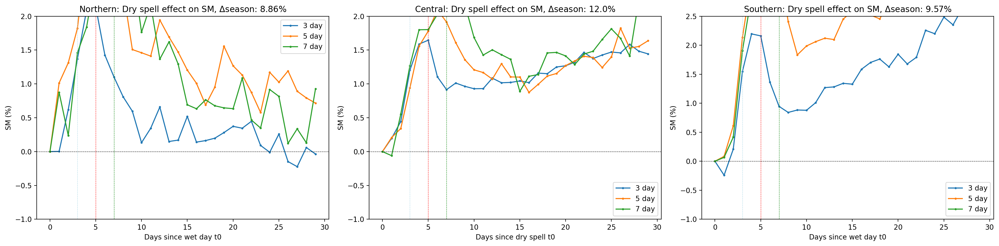

In [68]:
f = plt.figure(figsize=(20,5), dpi=200)

mv=1

ax = f.add_subplot(131)
plt.plot((moving_average(np.nanmean(smerrv3_eq,axis=0)-smclim3eq,mv)-moving_average(np.nanmean(smerrv3_eq,axis=0)-smclim3eq, mv)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5_eq,axis=0)-smclim5eq,mv)-moving_average(np.nanmean(smerrv5_eq,axis=0)-smclim5eq, mv)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7_eq,axis=0)-smclim7eq,mv)-moving_average(np.nanmean(smerrv7_eq,axis=0)-smclim7eq, mv)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Northern: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['northern'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
ax.set_ylim(-1,2)
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_northern_testv2.jpg')

ax = f.add_subplot(132)
plt.plot((np.nanmean(smerrv3,axis=0)-np.nanmean(smerrv3,axis=0)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrv5,axis=0)-np.nanmean(smerrv5,axis=0)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrv7,axis=0)-np.nanmean(smerrv7,axis=0)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Central: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['central'].values,2)*100)+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since dry spell t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
ax.set_ylim(-1,2)
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_central_testv2.jpg')

ax = f.add_subplot(133)
plt.plot((moving_average(np.nanmean(smerrv3_so,axis=0),mv)-moving_average(np.nanmean(smerrv3_so,axis=0), mv)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5_so,axis=0),mv)-moving_average(np.nanmean(smerrv5_so,axis=0), mv)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7_so,axis=0),mv)-moving_average(np.nanmean(smerrv7_so,axis=0), mv)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Southern: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['southern'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
ax.set_ylim(-1,2.5)

plt.tight_layout()

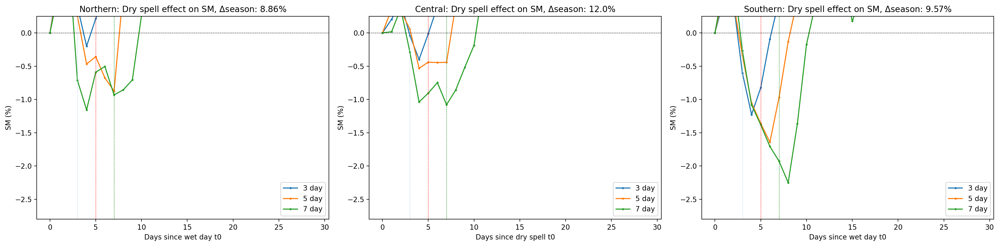

In [69]:
f = plt.figure(figsize=(20,5), dpi=200)

mv=1

ax = f.add_subplot(131)
plt.plot((moving_average(np.nanmean(smerrv3_eqd,axis=0),mv)-moving_average(np.nanmean(smerrv3_eqd,axis=0), mv)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5_eqd,axis=0),mv)-moving_average(np.nanmean(smerrv5_eqd,axis=0), mv)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7_eqd,axis=0),mv)-moving_average(np.nanmean(smerrv7_eqd,axis=0), mv)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Northern: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['northern'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
ax.set_ylim(-2.8,0.25)
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_northern_testv2.jpg')

ax = f.add_subplot(132)
plt.plot((np.nanmean(smerrv3_d,axis=0)-np.nanmean(smerrv3_d,axis=0)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrv5_d,axis=0)-np.nanmean(smerrv5_d,axis=0)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((np.nanmean(smerrv7_d,axis=0)-np.nanmean(smerrv7_d,axis=0)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Central: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['central'].values,2)*100)+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since dry spell t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
ax.set_ylim(-2.8,0.25)
#plt.savefig('/home/ck/DIR/cornkle/figs/HUARAZ/paper/sm_central_testv2.jpg')

ax = f.add_subplot(133)
plt.plot((moving_average(np.nanmean(smerrv3_sod,axis=0),mv)-moving_average(np.nanmean(smerrv3_sod,axis=0), mv)[0])*100, label='3 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv5_sod,axis=0),mv)-moving_average(np.nanmean(smerrv5_sod,axis=0), mv)[0])*100, label='5 day', marker='o', markersize=2)
plt.plot((moving_average(np.nanmean(smerrv7_sod,axis=0),mv)-moving_average(np.nanmean(smerrv7_sod,axis=0), mv)[0])*100, label='7 day', marker='o', markersize=2)
plt.legend()
plt.title('Southern: Dry spell effect on SM, $\Delta$season: '+str(np.round(smclim_collect['southern'].values*100,2))+"%")
plt.ylabel('SM (%)')
plt.xlabel('Days since wet day t0')
ax.axvline(3, linestyle='dashed', linewidth=0.5, color='lightblue')
ax.axvline(5, linestyle='dashed', linewidth=0.5, color='red')
ax.axvline(7, linestyle='dashed', linewidth=0.5, color='green')
ax.axhline(0, linestyle='dashed', linewidth=0.5, color='k')
ax.set_ylim(-2.8,0.25)

plt.tight_layout()

In [80]:
ch3, chcnt3, vod3, vodcnt3, vodclim3, voddiff3, vodclimcnt3, voddiffcnt3, errv3, errc3, vodates3 = vod_composite(wet_dat, vod, vod_clim, chdat, 3, topo_on_g, datatag='vod', region='central', syear=2000)
ch5, chcnt5, vod5, vodcnt5, vodclim5, voddiff5, vodclimcnt5, voddiffcnt5, errv5, errc5, vodates5 = vod_composite(wet_dat, vod, vod_clim, chdat, 5, topo_on_g, datatag='vod', region='central', syear=2000)
ch7, chcnt7, vod7, vodcnt7, vodclim7, voddiff7, vodclimcnt7, voddiffcnt7, errv7, errc7, vodates7 = vod_composite(wet_dat, vod, vod_clim, chdat, 7, topo_on_g, datatag='vod', region='central', syear=2000)

Doing -81.0 -12.0
Allnan, continue
Doing -81.0 -11.75
Allnan, continue
Doing -81.0 -11.5
Allnan, continue
Doing -81.0 -11.25
Allnan, continue
Doing -81.0 -11.0
Allnan, continue
Doing -81.0 -10.75
Allnan, continue
Doing -81.0 -10.5
Allnan, continue
Doing -81.0 -10.25
Allnan, continue
Doing -81.0 -10.0
Allnan, continue
Doing -81.0 -9.75
Allnan, continue
Doing -81.0 -9.5
Allnan, continue
Doing -81.0 -9.25
Allnan, continue
Doing -81.0 -9.0
Allnan, continue
Doing -81.0 -8.75
Allnan, continue
Doing -81.0 -8.5
Allnan, continue
Doing -81.0 -8.25
Allnan, continue
Doing -81.0 -8.0
Allnan, continue
Doing -80.75 -12.0
Allnan, continue
Doing -80.75 -11.75
Allnan, continue
Doing -80.75 -11.5
Allnan, continue
Doing -80.75 -11.25
Allnan, continue
Doing -80.75 -11.0
Allnan, continue
Doing -80.75 -10.75
Allnan, continue
Doing -80.75 -10.5
Allnan, continue
Doing -80.75 -10.25
Allnan, continue
Doing -80.75 -10.0
Allnan, continue
Doing -80.75 -9.75
Allnan, continue
Doing -80.75 -9.5
Allnan, continue
Doing 

Doing 141
Doing 142
Doing 143
Doing 144
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing 153
Doing 154
Doing 155
Doing 156
Doing -78.25 -8.0
Doing 157
Doing 158
Doing 159
Doing 160
Doing 161
Doing 162
Doing 163
Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
Doing 169
Doing 170
Doing 171
Doing 172
Doing 173
Doing 174
Doing 175
Doing 176
Doing 177
Doing 178
Doing 179
Doing 180
Doing 181
Doing 182
Doing 183
Doing 184
Doing 185
Doing 186
Doing 187
Doing 188
Doing 189
Doing 190
Doing 191
Doing 192
Doing 193
Doing 194
Doing 195
Doing 196
Doing 197
Doing 198
Doing 199
Doing 200
Doing 201
Doing 202
Doing 203
Doing 204
Doing 205
Doing 206
Doing 207
Doing 208
Doing 209
Doing 210
Doing 211
Doing 212
Doing 213
Doing 214
Doing 215
Doing 216
Doing 217
Doing 218
Doing 219
Doing -78.0 -12.0
Allnan, continue
Doing -78.0 -11.75
Allnan, continue
Doing -78.0 -11.5
Allnan, continue
Doing -78.0 -11.25
Allnan, continue
Doing -78.0 -11.0
Allnan, continue
Doing -78.0 -10

Doing 874
Doing 875
Doing 876
Doing 877
Doing 878
Doing 879
Doing 880
Doing 881
Doing 882
Doing 883
Doing 884
Doing 885
Doing 886
Doing 887
Doing 888
Doing 889
Doing 890
Doing 891
Doing 892
Doing 893
Doing 894
Doing 895
Doing 896
Doing 897
Doing 898
Doing 899
Doing 900
Doing 901
Doing -77.5 -12.0
Allnan, continue
Doing -77.5 -11.75
Allnan, continue
Doing -77.5 -11.5
Allnan, continue
Doing -77.5 -11.25
Allnan, continue
Doing -77.5 -11.0
Allnan, continue
Doing -77.5 -10.75
Allnan, continue
Doing -77.5 -10.5
Allnan, continue
Doing -77.5 -10.25
Doing 902
Doing 903
Doing 904
Doing 905
Doing 906
Doing 907
Doing 908
Doing 909
Doing 910
Doing 911
Doing 912
Doing 913
Doing 914
Doing 915
Doing 916
Doing 917
Doing 918
Doing 919
Doing 920
Doing 921
Doing 922
Doing 923
Doing 924
Doing 925
Doing 926
Doing 927
Doing 928
Doing -77.5 -10.0
Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
Doing 936
Doing 937
Doing 938
Doing 939
Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing

Doing 1597
Doing 1598
Doing 1599
Doing 1600
Doing 1601
Doing 1602
Doing 1603
Doing 1604
Doing 1605
Doing 1606
Doing -77.25 -10.25
Doing 1607
Doing 1608
Doing 1609
Doing 1610
Doing 1611
Doing 1612
Doing 1613
Doing 1614
Doing 1615
Doing 1616
Doing 1617
Doing 1618
Doing 1619
Doing 1620
Doing 1621
Doing 1622
Doing 1623
Doing 1624
Doing 1625
Doing 1626
Doing 1627
Doing 1628
Doing 1629
Doing 1630
Doing 1631
Doing 1632
Doing 1633
Doing 1634
Doing 1635
Doing 1636
Doing 1637
Doing 1638
Doing 1639
Doing 1640
Doing 1641
Doing 1642
Doing 1643
Doing 1644
Doing 1645
Doing 1646
Doing 1647
Doing 1648
Doing 1649
Doing 1650
Doing 1651
Doing 1652
Doing 1653
Doing 1654
Doing 1655
Doing 1656
Doing 1657
Doing 1658
Doing 1659
Doing 1660
Doing 1661
Doing 1662
Doing 1663
Doing 1664
Doing 1665
Doing 1666
Doing 1667
Doing 1668
Doing 1669
Doing -77.25 -10.0
Doing 1670
Doing 1671
Doing 1672
Doing 1673
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doin

Doing 2342
Doing 2343
Doing 2344
Doing 2345
Doing 2346
Doing 2347
Doing 2348
Doing 2349
Doing 2350
Doing 2351
Doing 2352
Doing 2353
Doing 2354
Doing 2355
Doing 2356
Doing 2357
Doing 2358
Doing 2359
Doing 2360
Doing 2361
Doing 2362
Doing 2363
Doing 2364
Doing -77.0 -11.0
Doing 2365
Doing 2366
Doing 2367
Doing 2368
Doing 2369
Doing 2370
Doing 2371
Doing 2372
Doing 2373
Doing 2374
Doing 2375
Doing 2376
Doing 2377
Doing 2378
Doing 2379
Doing 2380
Doing 2381
Doing 2382
Doing 2383
Doing 2384
Doing 2385
Doing 2386
Doing 2387
Doing 2388
Doing 2389
Doing 2390
Doing 2391
Doing 2392
Doing 2393
Doing 2394
Doing 2395
Doing 2396
Doing 2397
Doing 2398
Doing 2399
Doing 2400
Doing 2401
Doing 2402
Doing 2403
Doing 2404
Doing 2405
Doing 2406
Doing 2407
Doing -77.0 -10.75
Doing 2408
Doing 2409
Doing 2410
Doing 2411
Doing 2412
Doing 2413
Doing 2414
Doing 2415
Doing 2416
Doing 2417
Doing 2418
Doing 2419
Doing 2420
Doing 2421
Doing 2422
Doing 2423
Doing 2424
Doing 2425
Doing 2426
Doing 2427
Doing 2428
Doing 

Doing 3085
Doing 3086
Doing 3087
Doing 3088
Doing 3089
Doing 3090
Doing 3091
Doing 3092
Doing 3093
Doing 3094
Doing 3095
Doing 3096
Doing 3097
Doing 3098
Doing 3099
Doing 3100
Doing 3101
Doing 3102
Doing 3103
Doing 3104
Doing 3105
Doing 3106
Doing 3107
Doing 3108
Doing 3109
Doing 3110
Doing 3111
Doing 3112
Doing 3113
Doing 3114
Doing 3115
Doing 3116
Doing 3117
Doing 3118
Doing 3119
Doing 3120
Doing 3121
Doing 3122
Doing 3123
Doing 3124
Doing 3125
Doing 3126
Doing 3127
Doing 3128
Doing 3129
Doing 3130
Doing 3131
Doing 3132
Doing 3133
Doing 3134
Doing 3135
Doing 3136
Doing 3137
Doing 3138
Doing 3139
Doing 3140
Doing 3141
Doing 3142
Doing 3143
Doing 3144
Doing 3145
Doing 3146
Doing -77.0 -8.25
Doing 3147
Doing 3148
Doing 3149
Doing 3150
Doing 3151
Doing 3152
Doing 3153
Doing 3154
Doing 3155
Doing 3156
Doing 3157
Doing 3158
Doing 3159
Doing 3160
Doing 3161
Doing 3162
Doing 3163
Doing 3164
Doing 3165
Doing 3166
Doing 3167
Doing 3168
Doing 3169
Doing 3170
Doing 3171
Doing 3172
Doing 3173
Doi

Doing 3816
Doing 3817
Doing 3818
Doing 3819
Doing 3820
Doing 3821
Doing 3822
Doing 3823
Doing 3824
Doing 3825
Doing 3826
Doing 3827
Doing 3828
Doing 3829
Doing 3830
Doing 3831
Doing 3832
Doing 3833
Doing 3834
Doing 3835
Doing 3836
Doing 3837
Doing 3838
Doing 3839
Doing 3840
Doing 3841
Doing 3842
Doing 3843
Doing 3844
Doing 3845
Doing 3846
Doing 3847
Doing 3848
Doing 3849
Doing 3850
Doing 3851
Doing 3852
Doing 3853
Doing 3854
Doing 3855
Doing 3856
Doing 3857
Doing 3858
Doing 3859
Doing 3860
Doing 3861
Doing 3862
Doing 3863
Doing 3864
Doing 3865
Doing 3866
Doing 3867
Doing 3868
Doing 3869
Doing 3870
Doing 3871
Doing 3872
Doing 3873
Doing 3874
Doing 3875
Doing 3876
Doing 3877
Doing 3878
Doing 3879
Doing 3880
Doing 3881
Doing 3882
Doing 3883
Doing 3884
Doing 3885
Doing 3886
Doing 3887
Doing 3888
Doing 3889
Doing 3890
Doing 3891
Doing 3892
Doing 3893
Doing 3894
Doing 3895
Doing 3896
Doing 3897
Doing 3898
Doing 3899
Doing 3900
Doing 3901
Doing 3902
Doing 3903
Doing 3904
Doing 3905
Doing 3906

Doing 4559
Doing 4560
Doing 4561
Doing 4562
Doing 4563
Doing 4564
Doing 4565
Doing 4566
Doing 4567
Doing 4568
Doing 4569
Doing 4570
Doing 4571
Doing 4572
Doing 4573
Doing 4574
Doing 4575
Doing 4576
Doing 4577
Doing 4578
Doing 4579
Doing 4580
Doing 4581
Doing 4582
Doing 4583
Doing 4584
Doing 4585
Doing 4586
Doing 4587
Doing 4588
Doing 4589
Doing 4590
Doing 4591
Doing 4592
Doing 4593
Doing 4594
Doing 4595
Doing 4596
Doing 4597
Doing 4598
Doing 4599
Doing 4600
Doing 4601
Doing 4602
Doing 4603
Doing 4604
Doing 4605
Doing 4606
Doing 4607
Doing 4608
Doing 4609
Doing 4610
Doing 4611
Doing 4612
Doing 4613
Doing 4614
Doing 4615
Doing 4616
Doing 4617
Doing 4618
Doing 4619
Doing 4620
Doing 4621
Doing 4622
Doing 4623
Doing 4624
Doing 4625
Doing 4626
Doing 4627
Doing 4628
Doing 4629
Doing 4630
Doing 4631
Doing 4632
Doing 4633
Doing 4634
Doing -76.5 -10.25
Doing 4635
Doing 4636
Doing 4637
Doing 4638
Doing 4639
Doing 4640
Doing 4641
Doing 4642
Doing 4643
Doing 4644
Doing 4645
Doing 4646
Doing 4647
Do

Doing 5296
Doing 5297
Doing 5298
Doing 5299
Doing 5300
Doing -76.25 -11.75
Doing 5301
Doing 5302
Doing 5303
Doing 5304
Doing 5305
Doing 5306
Doing 5307
Doing 5308
Doing 5309
Doing 5310
Doing 5311
Doing 5312
Doing 5313
Doing 5314
Doing 5315
Doing 5316
Doing 5317
Doing 5318
Doing 5319
Doing 5320
Doing 5321
Doing 5322
Doing 5323
Doing 5324
Doing 5325
Doing 5326
Doing 5327
Doing 5328
Doing 5329
Doing 5330
Doing 5331
Doing 5332
Doing 5333
Doing 5334
Doing 5335
Doing 5336
Doing 5337
Doing 5338
Doing 5339
Doing 5340
Doing 5341
Doing 5342
Doing 5343
Doing 5344
Doing 5345
Doing 5346
Doing 5347
Doing 5348
Doing 5349
Doing 5350
Doing 5351
Doing 5352
Doing 5353
Doing 5354
Doing 5355
Doing 5356
Doing 5357
Doing 5358
Doing 5359
Doing 5360
Doing 5361
Doing 5362
Doing 5363
Doing 5364
Doing 5365
Doing 5366
Doing 5367
Doing 5368
Doing 5369
Doing 5370
Doing 5371
Doing 5372
Doing 5373
Doing 5374
Doing 5375
Doing 5376
Doing 5377
Doing 5378
Doing 5379
Doing 5380
Doing 5381
Doing 5382
Doing 5383
Doing 5384
D

Doing 6044
Doing 6045
Doing 6046
Doing 6047
Doing 6048
Doing 6049
Doing 6050
Doing 6051
Doing 6052
Doing 6053
Doing 6054
Doing 6055
Doing 6056
Doing 6057
Doing 6058
Doing 6059
Doing 6060
Doing 6061
Doing 6062
Doing 6063
Doing 6064
Doing 6065
Doing 6066
Doing 6067
Doing 6068
Doing 6069
Doing 6070
Doing 6071
Doing 6072
Doing 6073
Doing 6074
Doing 6075
Doing 6076
Doing 6077
Doing 6078
Doing 6079
Doing 6080
Doing 6081
Doing 6082
Doing 6083
Doing 6084
Doing 6085
Doing 6086
Doing 6087
Doing 6088
Doing 6089
Doing 6090
Doing 6091
Doing 6092
Doing 6093
Doing 6094
Doing 6095
Doing 6096
Doing -76.25 -9.25
Allnan, continue
Doing -76.25 -9.0
Allnan, continue
Doing -76.25 -8.75
Allnan, continue
Doing -76.25 -8.5
Allnan, continue
Doing -76.25 -8.25
Allnan, continue
Doing -76.25 -8.0
Allnan, continue
Doing -76.0 -12.0
Doing 6097
Doing 6098
Doing 6099
Doing 6100
Doing 6101
Doing 6102
Doing 6103
Doing 6104
Doing 6105
Doing 6106
Doing 6107
Doing 6108
Doing 6109
Doing 6110
Doing 6111
Doing 6112
Doing 6113

Doing 6749
Doing 6750
Doing 6751
Doing 6752
Doing 6753
Doing 6754
Doing 6755
Doing 6756
Doing 6757
Doing 6758
Doing 6759
Doing 6760
Doing 6761
Doing 6762
Doing 6763
Doing 6764
Doing 6765
Doing 6766
Doing 6767
Doing 6768
Doing 6769
Doing 6770
Doing 6771
Doing 6772
Doing 6773
Doing 6774
Doing 6775
Doing 6776
Doing 6777
Doing 6778
Doing 6779
Doing 6780
Doing 6781
Doing 6782
Doing 6783
Doing 6784
Doing 6785
Doing 6786
Doing 6787
Doing 6788
Doing 6789
Doing 6790
Doing 6791
Doing 6792
Doing 6793
Doing 6794
Doing 6795
Doing 6796
Doing 6797
Doing 6798
Doing 6799
Doing 6800
Doing 6801
Doing 6802
Doing 6803
Doing 6804
Doing 6805
Doing 6806
Doing 6807
Doing 6808
Doing -75.75 -11.75
Doing 6809
Doing 6810
Doing 6811
Doing 6812
Doing 6813
Doing 6814
Doing 6815
Doing 6816
Doing 6817
Doing 6818
Doing 6819
Doing 6820
Doing 6821
Doing 6822
Doing 6823
Doing 6824
Doing 6825
Doing 6826
Doing 6827
Doing 6828
Doing 6829
Doing 6830
Doing 6831
Doing 6832
Doing 6833
Doing 6834
Doing 6835
Doing 6836
Doing 6837
D

Doing 7501
Doing 7502
Doing 7503
Doing 7504
Doing 7505
Doing 7506
Doing -75.75 -9.5
Allnan, continue
Doing -75.75 -9.25
Allnan, continue
Doing -75.75 -9.0
Allnan, continue
Doing -75.75 -8.75
Allnan, continue
Doing -75.75 -8.5
Allnan, continue
Doing -75.75 -8.25
Allnan, continue
Doing -75.75 -8.0
Allnan, continue
Doing -75.5 -12.0
Doing 7507
Doing 7508
Doing 7509
Doing 7510
Doing 7511
Doing 7512
Doing 7513
Doing 7514
Doing 7515
Doing 7516
Doing 7517
Doing 7518
Doing 7519
Doing 7520
Doing 7521
Doing 7522
Doing 7523
Doing 7524
Doing 7525
Doing 7526
Doing 7527
Doing 7528
Doing 7529
Doing 7530
Doing 7531
Doing 7532
Doing 7533
Doing 7534
Doing 7535
Doing 7536
Doing 7537
Doing 7538
Doing 7539
Doing 7540
Doing 7541
Doing 7542
Doing 7543
Doing 7544
Doing 7545
Doing 7546
Doing 7547
Doing 7548
Doing 7549
Doing 7550
Doing 7551
Doing 7552
Doing 7553
Doing 7554
Doing 7555
Doing 7556
Doing 7557
Doing 7558
Doing 7559
Doing 7560
Doing 7561
Doing 7562
Doing 7563
Doing 7564
Doing 7565
Doing 7566
Doing 75

Doing 8145
Doing 8146
Doing 8147
Doing 8148
Doing 8149
Doing 8150
Doing 8151
Doing 8152
Doing 8153
Doing 8154
Doing 8155
Doing 8156
Doing 8157
Doing 8158
Doing -75.0 -11.75
Doing 8159
Doing 8160
Doing 8161
Doing 8162
Doing 8163
Doing 8164
Doing 8165
Doing 8166
Doing 8167
Doing 8168
Doing 8169
Doing 8170
Doing 8171
Doing 8172
Doing 8173
Doing 8174
Doing 8175
Doing 8176
Doing 8177
Doing 8178
Doing 8179
Doing 8180
Doing 8181
Doing 8182
Doing 8183
Doing 8184
Doing 8185
Doing 8186
Doing 8187
Doing 8188
Doing 8189
Doing 8190
Doing 8191
Doing 8192
Doing 8193
Doing 8194
Doing 8195
Doing 8196
Doing 8197
Doing 8198
Doing 8199
Doing 8200
Doing 8201
Doing 8202
Doing 8203
Doing 8204
Doing 8205
Doing 8206
Doing 8207
Doing 8208
Doing 8209
Doing 8210
Doing 8211
Doing 8212
Doing 8213
Doing 8214
Doing 8215
Doing 8216
Doing 8217
Doing 8218
Doing 8219
Doing 8220
Doing 8221
Doing 8222
Doing 8223
Doing 8224
Doing 8225
Doing 8226
Doing 8227
Doing -75.0 -11.5
Doing 8228
Doing 8229
Doing 8230
Doing 8231
Doing 

Doing 8811
Doing 8812
Doing 8813
Doing 8814
Doing 8815
Doing 8816
Doing 8817
Doing 8818
Doing 8819
Doing 8820
Doing 8821
Doing 8822
Doing 8823
Doing 8824
Doing 8825
Doing 8826
Doing 8827
Doing 8828
Doing 8829
Doing 8830
Doing 8831
Doing 8832
Doing -74.5 -11.5
Allnan, continue
Doing -74.5 -11.25
Allnan, continue
Doing -74.5 -11.0
Allnan, continue
Doing -74.5 -10.75
Allnan, continue
Doing -74.5 -10.5
Allnan, continue
Doing -74.5 -10.25
Allnan, continue
Doing -74.5 -10.0
Allnan, continue
Doing -74.5 -9.75
Allnan, continue
Doing -74.5 -9.5
Allnan, continue
Doing -74.5 -9.25
Allnan, continue
Doing -74.5 -9.0
Allnan, continue
Doing -74.5 -8.75
Allnan, continue
Doing -74.5 -8.5
Allnan, continue
Doing -74.5 -8.25
Allnan, continue
Doing -74.5 -8.0
Allnan, continue
Doing -74.25 -12.0
Allnan, continue
Doing -74.25 -11.75
Allnan, continue
Doing -74.25 -11.5
Allnan, continue
Doing -74.25 -11.25
Allnan, continue
Doing -74.25 -11.0
Allnan, continue
Doing -74.25 -10.75
Allnan, continue
Doing -74.25 -1

Allnan, continue
Doing -71.25 -10.5
Allnan, continue
Doing -71.25 -10.25
Allnan, continue
Doing -71.25 -10.0
Allnan, continue
Doing -71.25 -9.75
Allnan, continue
Doing -71.25 -9.5
Allnan, continue
Doing -71.25 -9.25
Allnan, continue
Doing -71.25 -9.0
Allnan, continue
Doing -71.25 -8.75
Allnan, continue
Doing -71.25 -8.5
Allnan, continue
Doing -71.25 -8.25
Allnan, continue
Doing -71.25 -8.0
Allnan, continue
Doing -71.0 -12.0
Allnan, continue
Doing -71.0 -11.75
Allnan, continue
Doing -71.0 -11.5
Allnan, continue
Doing -71.0 -11.25
Allnan, continue
Doing -71.0 -11.0
Allnan, continue
Doing -71.0 -10.75
Allnan, continue
Doing -71.0 -10.5
Allnan, continue
Doing -71.0 -10.25
Allnan, continue
Doing -71.0 -10.0
Allnan, continue
Doing -71.0 -9.75
Allnan, continue
Doing -71.0 -9.5
Allnan, continue
Doing -71.0 -9.25
Allnan, continue
Doing -71.0 -9.0
Allnan, continue
Doing -71.0 -8.75
Allnan, continue
Doing -71.0 -8.5
Allnan, continue
Doing -71.0 -8.25
Allnan, continue
Doing -71.0 -8.0
Allnan, cont

Allnan, continue
Doing -67.5 -8.75
Allnan, continue
Doing -67.5 -8.5
Allnan, continue
Doing -67.5 -8.25
Allnan, continue
Doing -67.5 -8.0
Allnan, continue
Doing -67.25 -12.0
Allnan, continue
Doing -67.25 -11.75
Allnan, continue
Doing -67.25 -11.5
Allnan, continue
Doing -67.25 -11.25
Allnan, continue
Doing -67.25 -11.0
Allnan, continue
Doing -67.25 -10.75
Allnan, continue
Doing -67.25 -10.5
Allnan, continue
Doing -67.25 -10.25
Allnan, continue
Doing -67.25 -10.0
Allnan, continue
Doing -67.25 -9.75
Allnan, continue
Doing -67.25 -9.5
Allnan, continue
Doing -67.25 -9.25
Allnan, continue
Doing -67.25 -9.0
Allnan, continue
Doing -67.25 -8.75
Allnan, continue
Doing -67.25 -8.5
Allnan, continue
Doing -67.25 -8.25
Allnan, continue
Doing -67.25 -8.0
Allnan, continue
Doing -67.0 -12.0
Allnan, continue
Doing -67.0 -11.75
Allnan, continue
Doing -67.0 -11.5
Allnan, continue
Doing -67.0 -11.25
Allnan, continue
Doing -67.0 -11.0
Allnan, continue
Doing -67.0 -10.75
Allnan, continue
Doing -67.0 -10.5
Al

Allnan, continue
Doing -80.25 -10.5
Allnan, continue
Doing -80.25 -10.25
Allnan, continue
Doing -80.25 -10.0
Allnan, continue
Doing -80.25 -9.75
Allnan, continue
Doing -80.25 -9.5
Allnan, continue
Doing -80.25 -9.25
Allnan, continue
Doing -80.25 -9.0
Allnan, continue
Doing -80.25 -8.75
Allnan, continue
Doing -80.25 -8.5
Allnan, continue
Doing -80.25 -8.25
Allnan, continue
Doing -80.25 -8.0
Allnan, continue
Doing -80.0 -12.0
Allnan, continue
Doing -80.0 -11.75
Allnan, continue
Doing -80.0 -11.5
Allnan, continue
Doing -80.0 -11.25
Allnan, continue
Doing -80.0 -11.0
Allnan, continue
Doing -80.0 -10.75
Allnan, continue
Doing -80.0 -10.5
Allnan, continue
Doing -80.0 -10.25
Allnan, continue
Doing -80.0 -10.0
Allnan, continue
Doing -80.0 -9.75
Allnan, continue
Doing -80.0 -9.5
Allnan, continue
Doing -80.0 -9.25
Allnan, continue
Doing -80.0 -9.0
Allnan, continue
Doing -80.0 -8.75
Allnan, continue
Doing -80.0 -8.5
Allnan, continue
Doing -80.0 -8.25
Allnan, continue
Doing -80.0 -8.0
Allnan, cont

Doing 223
Doing 224
Doing 225
Doing 226
Doing 227
Doing 228
Doing 229
Doing 230
Doing 231
Doing 232
Doing -77.5 -12.0
Allnan, continue
Doing -77.5 -11.75
Allnan, continue
Doing -77.5 -11.5
Allnan, continue
Doing -77.5 -11.25
Allnan, continue
Doing -77.5 -11.0
Allnan, continue
Doing -77.5 -10.75
Allnan, continue
Doing -77.5 -10.5
Allnan, continue
Doing -77.5 -10.25
Doing 233
Doing 234
Doing 235
Doing 236
Doing 237
Doing -77.5 -10.0
Doing 238
Doing 239
Doing 240
Doing 241
Doing 242
Doing 243
Doing 244
Doing 245
Doing 246
Doing 247
Doing 248
Doing 249
Doing 250
Doing -77.5 -9.75
Doing 251
Doing 252
Doing 253
Doing 254
Doing 255
Doing 256
Doing 257
Doing 258
Doing 259
Doing 260
Doing 261
Doing 262
Doing 263
Doing 264
Doing 265
Doing 266
Doing 267
Doing 268
Doing 269
Doing 270
Doing 271
Doing 272
Doing 273
Doing 274
Doing -77.5 -9.5
Doing 275
Doing 276
Doing 277
Doing 278
Doing 279
Doing 280
Doing 281
Doing 282
Doing 283
Doing 284
Doing 285
Doing 286
Doing 287
Doing 288
Doing 289
Doing 290


Doing 944
Doing 945
Doing 946
Doing 947
Doing 948
Doing 949
Doing 950
Doing 951
Doing 952
Doing 953
Doing 954
Doing 955
Doing -77.0 -8.0
Doing 956
Doing 957
Doing 958
Doing 959
Doing 960
Doing 961
Doing 962
Doing 963
Doing 964
Doing 965
Doing 966
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
Doing 977
Doing 978
Doing 979
Doing 980
Doing 981
Doing 982
Doing 983
Doing 984
Doing 985
Doing -76.75 -12.0
Allnan, continue
Doing -76.75 -11.75
Doing 986
Doing 987
Doing -76.75 -11.5
Doing 988
Doing 989
Doing 990
Doing 991
Doing 992
Doing 993
Doing 994
Doing 995
Doing 996
Doing 997
Doing 998
Doing 999
Doing 1000
Doing 1001
Doing 1002
Doing 1003
Doing -76.75 -11.25
Doing 1004
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doing 1015
Doing 1016
Doing 1017
Doing 1018
Doing 1019
Doing 1020
Doing 1021
Doing 1022
Doing -76.75 -11.0
Doing 1023
Doing 1024
Doing 1025
Doing 1026
Doing 1027
D

Doing 1643
Doing 1644
Doing 1645
Doing 1646
Doing 1647
Doing 1648
Doing 1649
Doing 1650
Doing 1651
Doing 1652
Doing 1653
Doing 1654
Doing 1655
Doing 1656
Doing 1657
Doing 1658
Doing 1659
Doing 1660
Doing 1661
Doing 1662
Doing 1663
Doing 1664
Doing 1665
Doing 1666
Doing 1667
Doing 1668
Doing 1669
Doing 1670
Doing 1671
Doing 1672
Doing 1673
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing 1684
Doing 1685
Doing 1686
Doing 1687
Doing -76.5 -8.5
Allnan, continue
Doing -76.5 -8.25
Allnan, continue
Doing -76.5 -8.0
Allnan, continue
Doing -76.25 -12.0
Doing 1688
Doing 1689
Doing 1690
Doing 1691
Doing 1692
Doing 1693
Doing 1694
Doing 1695
Doing 1696
Doing 1697
Doing 1698
Doing 1699
Doing 1700
Doing 1701
Doing 1702
Doing 1703
Doing 1704
Doing 1705
Doing 1706
Doing 1707
Doing 1708
Doing 1709
Doing -76.25 -11.75
Doing 1710
Doing 1711
Doing 1712
Doing 1713
Doing 1714
Doing 1715
Doing 1716
Doing 1717
Doing 1718
Doing 1719
Doing 1720


Doing 2288
Doing 2289
Doing 2290
Doing 2291
Doing 2292
Doing 2293
Doing 2294
Doing 2295
Doing 2296
Doing 2297
Doing 2298
Doing 2299
Doing 2300
Doing 2301
Doing 2302
Doing 2303
Doing 2304
Doing 2305
Doing 2306
Doing 2307
Doing 2308
Doing 2309
Doing 2310
Doing 2311
Doing 2312
Doing -75.75 -10.0
Doing 2313
Doing 2314
Doing 2315
Doing 2316
Doing 2317
Doing 2318
Doing 2319
Doing 2320
Doing 2321
Doing 2322
Doing 2323
Doing 2324
Doing 2325
Doing 2326
Doing 2327
Doing 2328
Doing 2329
Doing 2330
Doing 2331
Doing 2332
Doing 2333
Doing 2334
Doing 2335
Doing -75.75 -9.75
Doing 2336
Doing 2337
Doing 2338
Doing 2339
Doing 2340
Doing 2341
Doing 2342
Doing 2343
Doing 2344
Doing 2345
Doing 2346
Doing 2347
Doing 2348
Doing 2349
Doing 2350
Doing 2351
Doing 2352
Doing 2353
Doing 2354
Doing 2355
Doing 2356
Doing 2357
Doing 2358
Doing 2359
Doing 2360
Doing 2361
Doing 2362
Doing 2363
Doing 2364
Doing 2365
Doing 2366
Doing 2367
Doing 2368
Doing -75.75 -9.5
Allnan, continue
Doing -75.75 -9.25
Allnan, continue


Doing -74.5 -9.0
Allnan, continue
Doing -74.5 -8.75
Allnan, continue
Doing -74.5 -8.5
Allnan, continue
Doing -74.5 -8.25
Allnan, continue
Doing -74.5 -8.0
Allnan, continue
Doing -74.25 -12.0
Allnan, continue
Doing -74.25 -11.75
Allnan, continue
Doing -74.25 -11.5
Allnan, continue
Doing -74.25 -11.25
Allnan, continue
Doing -74.25 -11.0
Allnan, continue
Doing -74.25 -10.75
Allnan, continue
Doing -74.25 -10.5
Allnan, continue
Doing -74.25 -10.25
Allnan, continue
Doing -74.25 -10.0
Allnan, continue
Doing -74.25 -9.75
Allnan, continue
Doing -74.25 -9.5
Allnan, continue
Doing -74.25 -9.25
Allnan, continue
Doing -74.25 -9.0
Allnan, continue
Doing -74.25 -8.75
Allnan, continue
Doing -74.25 -8.5
Allnan, continue
Doing -74.25 -8.25
Allnan, continue
Doing -74.25 -8.0
Allnan, continue
Doing -74.0 -12.0
Allnan, continue
Doing -74.0 -11.75
Allnan, continue
Doing -74.0 -11.5
Allnan, continue
Doing -74.0 -11.25
Allnan, continue
Doing -74.0 -11.0
Allnan, continue
Doing -74.0 -10.75
Allnan, continue
Doi

Allnan, continue
Doing -71.0 -9.5
Allnan, continue
Doing -71.0 -9.25
Allnan, continue
Doing -71.0 -9.0
Allnan, continue
Doing -71.0 -8.75
Allnan, continue
Doing -71.0 -8.5
Allnan, continue
Doing -71.0 -8.25
Allnan, continue
Doing -71.0 -8.0
Allnan, continue
Doing -70.75 -12.0
Allnan, continue
Doing -70.75 -11.75
Allnan, continue
Doing -70.75 -11.5
Allnan, continue
Doing -70.75 -11.25
Allnan, continue
Doing -70.75 -11.0
Allnan, continue
Doing -70.75 -10.75
Allnan, continue
Doing -70.75 -10.5
Allnan, continue
Doing -70.75 -10.25
Allnan, continue
Doing -70.75 -10.0
Allnan, continue
Doing -70.75 -9.75
Allnan, continue
Doing -70.75 -9.5
Allnan, continue
Doing -70.75 -9.25
Allnan, continue
Doing -70.75 -9.0
Allnan, continue
Doing -70.75 -8.75
Allnan, continue
Doing -70.75 -8.5
Allnan, continue
Doing -70.75 -8.25
Allnan, continue
Doing -70.75 -8.0
Allnan, continue
Doing -70.5 -12.0
Allnan, continue
Doing -70.5 -11.75
Allnan, continue
Doing -70.5 -11.5
Allnan, continue
Doing -70.5 -11.25
Allna

Allnan, continue
Doing -67.0 -10.75
Allnan, continue
Doing -67.0 -10.5
Allnan, continue
Doing -67.0 -10.25
Allnan, continue
Doing -67.0 -10.0
Allnan, continue
Doing -67.0 -9.75
Allnan, continue
Doing -67.0 -9.5
Allnan, continue
Doing -67.0 -9.25
Allnan, continue
Doing -67.0 -9.0
Allnan, continue
Doing -67.0 -8.75
Allnan, continue
Doing -67.0 -8.5
Allnan, continue
Doing -67.0 -8.25
Allnan, continue
Doing -67.0 -8.0
Allnan, continue
Doing -66.75 -12.0
Allnan, continue
Doing -66.75 -11.75
Allnan, continue
Doing -66.75 -11.5
Allnan, continue
Doing -66.75 -11.25
Allnan, continue
Doing -66.75 -11.0
Allnan, continue
Doing -66.75 -10.75
Allnan, continue
Doing -66.75 -10.5
Allnan, continue
Doing -66.75 -10.25
Allnan, continue
Doing -66.75 -10.0
Allnan, continue
Doing -66.75 -9.75
Allnan, continue
Doing -66.75 -9.5
Allnan, continue
Doing -66.75 -9.25
Allnan, continue
Doing -66.75 -9.0
Allnan, continue
Doing -66.75 -8.75
Allnan, continue
Doing -66.75 -8.5
Allnan, continue
Doing -66.75 -8.25
Allna

Allnan, continue
Doing -79.5 -10.25
Allnan, continue
Doing -79.5 -10.0
Allnan, continue
Doing -79.5 -9.75
Allnan, continue
Doing -79.5 -9.5
Allnan, continue
Doing -79.5 -9.25
Allnan, continue
Doing -79.5 -9.0
Allnan, continue
Doing -79.5 -8.75
Allnan, continue
Doing -79.5 -8.5
Allnan, continue
Doing -79.5 -8.25
Allnan, continue
Doing -79.5 -8.0
Allnan, continue
Doing -79.25 -12.0
Allnan, continue
Doing -79.25 -11.75
Allnan, continue
Doing -79.25 -11.5
Allnan, continue
Doing -79.25 -11.25
Allnan, continue
Doing -79.25 -11.0
Allnan, continue
Doing -79.25 -10.75
Allnan, continue
Doing -79.25 -10.5
Allnan, continue
Doing -79.25 -10.25
Allnan, continue
Doing -79.25 -10.0
Allnan, continue
Doing -79.25 -9.75
Allnan, continue
Doing -79.25 -9.5
Allnan, continue
Doing -79.25 -9.25
Allnan, continue
Doing -79.25 -9.0
Allnan, continue
Doing -79.25 -8.75
Allnan, continue
Doing -79.25 -8.5
Allnan, continue
Doing -79.25 -8.25
Allnan, continue
Doing -79.25 -8.0
Allnan, continue
Doing -79.0 -12.0
Allnan

Doing 300
Doing 301
Doing 302
Doing 303
Doing 304
Doing 305
Doing 306
Doing 307
Doing 308
Doing 309
Doing 310
Doing 311
Doing -77.0 -9.5
Doing 312
Doing 313
Doing 314
Doing 315
Doing 316
Doing 317
Doing 318
Doing 319
Doing 320
Doing -77.0 -9.25
Doing 321
Doing 322
Doing 323
Doing 324
Doing 325
Doing 326
Doing 327
Doing -77.0 -9.0
Doing 328
Doing 329
Doing 330
Doing 331
Doing 332
Doing 333
Doing -77.0 -8.75
Doing 334
Doing 335
Doing 336
Doing 337
Doing -77.0 -8.5
Doing 338
Doing 339
Doing 340
Doing 341
Doing 342
Doing 343
Doing 344
Doing 345
Doing -77.0 -8.25
Doing 346
Doing 347
Doing 348
Doing 349
Doing 350
Doing 351
Doing 352
Doing 353
Doing -77.0 -8.0
Doing 354
Doing 355
Doing 356
Doing 357
Doing 358
Doing 359
Doing 360
Doing 361
Doing 362
Doing 363
Doing -76.75 -12.0
Allnan, continue
Doing -76.75 -11.75
Doing 364
Doing -76.75 -11.5
Doing 365
Doing -76.75 -11.25
Doing 366
Doing 367
Doing 368
Doing 369
Doing 370
Doing 371
Doing 372
Doing -76.75 -11.0
Doing 373
Doing 374
Doing 375
Doin

Doing 926
Doing 927
Doing 928
Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
Doing 936
Doing -75.75 -9.5
Allnan, continue
Doing -75.75 -9.25
Allnan, continue
Doing -75.75 -9.0
Allnan, continue
Doing -75.75 -8.75
Allnan, continue
Doing -75.75 -8.5
Allnan, continue
Doing -75.75 -8.25
Allnan, continue
Doing -75.75 -8.0
Allnan, continue
Doing -75.5 -12.0
Doing 937
Doing 938
Doing 939
Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing 945
Doing 946
Doing 947
Doing 948
Doing 949
Doing 950
Doing 951
Doing -75.5 -11.75
Doing 952
Doing 953
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing -75.5 -11.5
Doing 959
Doing 960
Doing 961
Doing -75.5 -11.25
Doing 962
Doing 963
Doing 964
Doing 965
Doing 966
Doing 967
Doing 968
Doing 969
Doing 970
Doing -75.5 -11.0
Allnan, continue
Doing -75.5 -10.75
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing 976
Doing 977
Doing 978
Doing 979
Doing 980
Doing 981
Doing 982
Doing 983
Doing 984
Doing -75.5 -10.5
Doing 985
Doing 

Allnan, continue
Doing -72.75 -11.25
Allnan, continue
Doing -72.75 -11.0
Allnan, continue
Doing -72.75 -10.75
Allnan, continue
Doing -72.75 -10.5
Allnan, continue
Doing -72.75 -10.25
Allnan, continue
Doing -72.75 -10.0
Allnan, continue
Doing -72.75 -9.75
Allnan, continue
Doing -72.75 -9.5
Allnan, continue
Doing -72.75 -9.25
Allnan, continue
Doing -72.75 -9.0
Allnan, continue
Doing -72.75 -8.75
Allnan, continue
Doing -72.75 -8.5
Allnan, continue
Doing -72.75 -8.25
Allnan, continue
Doing -72.75 -8.0
Allnan, continue
Doing -72.5 -12.0
Allnan, continue
Doing -72.5 -11.75
Allnan, continue
Doing -72.5 -11.5
Allnan, continue
Doing -72.5 -11.25
Allnan, continue
Doing -72.5 -11.0
Allnan, continue
Doing -72.5 -10.75
Allnan, continue
Doing -72.5 -10.5
Allnan, continue
Doing -72.5 -10.25
Allnan, continue
Doing -72.5 -10.0
Allnan, continue
Doing -72.5 -9.75
Allnan, continue
Doing -72.5 -9.5
Allnan, continue
Doing -72.5 -9.25
Allnan, continue
Doing -72.5 -9.0
Allnan, continue
Doing -72.5 -8.75
Allna

Allnan, continue
Doing -69.0 -12.0
Allnan, continue
Doing -69.0 -11.75
Allnan, continue
Doing -69.0 -11.5
Allnan, continue
Doing -69.0 -11.25
Allnan, continue
Doing -69.0 -11.0
Allnan, continue
Doing -69.0 -10.75
Allnan, continue
Doing -69.0 -10.5
Allnan, continue
Doing -69.0 -10.25
Allnan, continue
Doing -69.0 -10.0
Allnan, continue
Doing -69.0 -9.75
Allnan, continue
Doing -69.0 -9.5
Allnan, continue
Doing -69.0 -9.25
Allnan, continue
Doing -69.0 -9.0
Allnan, continue
Doing -69.0 -8.75
Allnan, continue
Doing -69.0 -8.5
Allnan, continue
Doing -69.0 -8.25
Allnan, continue
Doing -69.0 -8.0
Allnan, continue
Doing -68.75 -12.0
Allnan, continue
Doing -68.75 -11.75
Allnan, continue
Doing -68.75 -11.5
Allnan, continue
Doing -68.75 -11.25
Allnan, continue
Doing -68.75 -11.0
Allnan, continue
Doing -68.75 -10.75
Allnan, continue
Doing -68.75 -10.5
Allnan, continue
Doing -68.75 -10.25
Allnan, continue
Doing -68.75 -10.0
Allnan, continue
Doing -68.75 -9.75
Allnan, continue
Doing -68.75 -9.5
Allnan

Allnan, continue
Doing -65.25 -8.25
Allnan, continue
Doing -65.25 -8.0
Allnan, continue
Doing -65.0 -12.0
Allnan, continue
Doing -65.0 -11.75
Allnan, continue
Doing -65.0 -11.5
Allnan, continue
Doing -65.0 -11.25
Allnan, continue
Doing -65.0 -11.0
Allnan, continue
Doing -65.0 -10.75
Allnan, continue
Doing -65.0 -10.5
Allnan, continue
Doing -65.0 -10.25
Allnan, continue
Doing -65.0 -10.0
Allnan, continue
Doing -65.0 -9.75
Allnan, continue
Doing -65.0 -9.5
Allnan, continue
Doing -65.0 -9.25
Allnan, continue
Doing -65.0 -9.0
Allnan, continue
Doing -65.0 -8.75
Allnan, continue
Doing -65.0 -8.5
Allnan, continue
Doing -65.0 -8.25
Allnan, continue
Doing -65.0 -8.0
Allnan, continue


In [81]:
ch3_d, chcnt3_d, vod3_d, vodcnt3_d, vodclim3_d, voddiff3_d, vodclimcnt3_d, voddiffcnt3_d, errv3_d, errc3_d, vodates3_d = vod_composite(dry_dat, vod, vod_clim, chdat, 3, topo_on_g, datatag='vod', region='central', syear=2000)
ch5_d, chcnt5_d, vod5_d, vodcnt5_d, vodclim5_d, voddiff5_d, vodclimcnt5_d, voddiffcnt5_d, errv5_d, errc5_d, vodates5_d = vod_composite(dry_dat, vod, vod_clim, chdat, 5, topo_on_g, datatag='vod', region='central', syear=2000)
ch7_d, chcnt7_d, vod7_d, vodcnt7_d, vodclim7_d, voddiff7_d, vodclimcnt7_d, voddiffcnt7_d, errv7_d, errc7_d, vodates7_d = vod_composite(dry_dat, vod, vod_clim, chdat, 7, topo_on_g, datatag='vod', region='central', syear=2000)

Doing -81.0 -12.0
Allnan, continue
Doing -81.0 -11.75
Allnan, continue
Doing -81.0 -11.5
Allnan, continue
Doing -81.0 -11.25
Allnan, continue
Doing -81.0 -11.0
Allnan, continue
Doing -81.0 -10.75
Allnan, continue
Doing -81.0 -10.5
Allnan, continue
Doing -81.0 -10.25
Allnan, continue
Doing -81.0 -10.0
Allnan, continue
Doing -81.0 -9.75
Allnan, continue
Doing -81.0 -9.5
Allnan, continue
Doing -81.0 -9.25
Allnan, continue
Doing -81.0 -9.0
Allnan, continue
Doing -81.0 -8.75
Allnan, continue
Doing -81.0 -8.5
Allnan, continue
Doing -81.0 -8.25
Allnan, continue
Doing -81.0 -8.0
Allnan, continue
Doing -80.75 -12.0
Allnan, continue
Doing -80.75 -11.75
Allnan, continue
Doing -80.75 -11.5
Allnan, continue
Doing -80.75 -11.25
Allnan, continue
Doing -80.75 -11.0
Allnan, continue
Doing -80.75 -10.75
Allnan, continue
Doing -80.75 -10.5
Allnan, continue
Doing -80.75 -10.25
Allnan, continue
Doing -80.75 -10.0
Allnan, continue
Doing -80.75 -9.75
Allnan, continue
Doing -80.75 -9.5
Allnan, continue
Doing 

Doing 127
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing 142
Doing 143
Doing 144
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing -78.25 -8.25
Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159
Doing 160
Doing 161
Doing 162
Doing 163
Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
Doing 169
Doing 170
Doing 171
Doing 172
Doing 173
Doing 174
Doing 175
Doing 176
Doing 177
Doing 178
Doing 179
Doing 180
Doing 181
Doing 182
Doing 183
Doing 184
Doing 185
Doing 186
Doing 187
Doing 188
Doing 189
Doing 190
Doing 191
Doing 192
Doing 193
Doing 194
Doing 195
Doing 196
Doing 197
Doing 198
Doing 199
Doing 200
Doing 201
Doing 202
Doing 203
Doing 204
Doing 205
Doing 206
Doing 207
Doing 208
Doing 209
Doing 210
Doing 211
Doing 212
Doing 213
Doing 214
Doing 215
Doing 216
Doing 217
Doing -78.25 -8.0
Doing 218
Doing 219
Doing 220
Doing 221
Doing 222
Doi

Doing 862
Doing 863
Doing 864
Doing 865
Doing 866
Doing 867
Doing 868
Doing 869
Doing 870
Doing 871
Doing 872
Doing 873
Doing 874
Doing 875
Doing 876
Doing 877
Doing 878
Doing 879
Doing 880
Doing 881
Doing 882
Doing 883
Doing 884
Doing 885
Doing 886
Doing 887
Doing -77.75 -8.75
Doing 888
Doing 889
Doing 890
Doing 891
Doing 892
Doing 893
Doing 894
Doing 895
Doing 896
Doing 897
Doing 898
Doing 899
Doing 900
Doing 901
Doing 902
Doing 903
Doing 904
Doing 905
Doing 906
Doing 907
Doing 908
Doing 909
Doing 910
Doing 911
Doing 912
Doing 913
Doing 914
Doing 915
Doing 916
Doing 917
Doing 918
Doing 919
Doing 920
Doing 921
Doing 922
Doing 923
Doing 924
Doing 925
Doing 926
Doing 927
Doing 928
Doing 929
Doing 930
Doing 931
Doing 932
Doing 933
Doing 934
Doing 935
Doing 936
Doing 937
Doing 938
Doing 939
Doing 940
Doing 941
Doing 942
Doing 943
Doing 944
Doing 945
Doing 946
Doing 947
Doing 948
Doing 949
Doing 950
Doing 951
Doing 952
Doing 953
Doing 954
Doing 955
Doing 956
Doing 957
Doing 958
Doing 959
D

Doing 1599
Doing 1600
Doing 1601
Doing 1602
Doing 1603
Doing 1604
Doing 1605
Doing 1606
Doing 1607
Doing 1608
Doing 1609
Doing 1610
Doing 1611
Doing 1612
Doing 1613
Doing 1614
Doing -77.5 -8.75
Doing 1615
Doing 1616
Doing 1617
Doing 1618
Doing 1619
Doing 1620
Doing 1621
Doing 1622
Doing 1623
Doing 1624
Doing 1625
Doing 1626
Doing 1627
Doing 1628
Doing 1629
Doing 1630
Doing 1631
Doing 1632
Doing 1633
Doing 1634
Doing 1635
Doing 1636
Doing 1637
Doing 1638
Doing 1639
Doing 1640
Doing 1641
Doing 1642
Doing 1643
Doing 1644
Doing 1645
Doing 1646
Doing 1647
Doing 1648
Doing 1649
Doing 1650
Doing 1651
Doing 1652
Doing 1653
Doing 1654
Doing 1655
Doing 1656
Doing 1657
Doing 1658
Doing 1659
Doing 1660
Doing 1661
Doing 1662
Doing 1663
Doing 1664
Doing 1665
Doing 1666
Doing 1667
Doing 1668
Doing 1669
Doing 1670
Doing 1671
Doing 1672
Doing 1673
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing 1684
Doing 1685
Doing 1686
Doing 1687
Doi

Doing 2310
Doing 2311
Doing 2312
Doing 2313
Doing 2314
Doing 2315
Doing 2316
Doing 2317
Doing 2318
Doing 2319
Doing 2320
Doing 2321
Doing 2322
Doing 2323
Doing 2324
Doing 2325
Doing 2326
Doing 2327
Doing 2328
Doing 2329
Doing 2330
Doing 2331
Doing 2332
Doing 2333
Doing 2334
Doing 2335
Doing 2336
Doing 2337
Doing 2338
Doing 2339
Doing 2340
Doing 2341
Doing 2342
Doing 2343
Doing 2344
Doing 2345
Doing 2346
Doing 2347
Doing 2348
Doing 2349
Doing 2350
Doing 2351
Doing 2352
Doing 2353
Doing 2354
Doing 2355
Doing 2356
Doing 2357
Doing 2358
Doing 2359
Doing 2360
Doing 2361
Doing 2362
Doing 2363
Doing 2364
Doing 2365
Doing 2366
Doing 2367
Doing 2368
Doing 2369
Doing 2370
Doing -77.25 -9.0
Doing 2371
Doing 2372
Doing 2373
Doing 2374
Doing 2375
Doing 2376
Doing 2377
Doing 2378
Doing 2379
Doing 2380
Doing 2381
Doing 2382
Doing 2383
Doing 2384
Doing 2385
Doing 2386
Doing 2387
Doing 2388
Doing 2389
Doing 2390
Doing 2391
Doing 2392
Doing 2393
Doing 2394
Doing 2395
Doing 2396
Doing 2397
Doing 2398
Doi

Doing 3046
Doing 3047
Doing 3048
Doing 3049
Doing 3050
Doing 3051
Doing 3052
Doing 3053
Doing 3054
Doing 3055
Doing 3056
Doing 3057
Doing 3058
Doing 3059
Doing 3060
Doing 3061
Doing 3062
Doing 3063
Doing 3064
Doing 3065
Doing 3066
Doing 3067
Doing 3068
Doing 3069
Doing 3070
Doing 3071
Doing 3072
Doing 3073
Doing 3074
Doing 3075
Doing 3076
Doing 3077
Doing 3078
Doing 3079
Doing 3080
Doing 3081
Doing 3082
Doing 3083
Doing 3084
Doing 3085
Doing 3086
Doing 3087
Doing 3088
Doing 3089
Doing 3090
Doing 3091
Doing 3092
Doing 3093
Doing 3094
Doing 3095
Doing 3096
Doing 3097
Doing 3098
Doing 3099
Doing 3100
Doing 3101
Doing 3102
Doing 3103
Doing 3104
Doing 3105
Doing 3106
Doing 3107
Doing 3108
Doing 3109
Doing 3110
Doing 3111
Doing -77.0 -10.0
Doing 3112
Doing 3113
Doing 3114
Doing 3115
Doing 3116
Doing 3117
Doing 3118
Doing 3119
Doing 3120
Doing 3121
Doing 3122
Doing 3123
Doing 3124
Doing 3125
Doing 3126
Doing 3127
Doing 3128
Doing 3129
Doing 3130
Doing 3131
Doing 3132
Doing 3133
Doing 3134
Doi

Doing 3777
Doing 3778
Doing 3779
Doing 3780
Doing 3781
Doing 3782
Doing 3783
Doing 3784
Doing 3785
Doing 3786
Doing 3787
Doing 3788
Doing 3789
Doing 3790
Doing 3791
Doing 3792
Doing 3793
Doing 3794
Doing 3795
Doing 3796
Doing 3797
Doing 3798
Doing 3799
Doing 3800
Doing 3801
Doing 3802
Doing 3803
Doing 3804
Doing 3805
Doing 3806
Doing 3807
Doing 3808
Doing 3809
Doing 3810
Doing 3811
Doing -76.75 -11.5
Doing 3812
Doing 3813
Doing 3814
Doing 3815
Doing 3816
Doing 3817
Doing 3818
Doing 3819
Doing 3820
Doing 3821
Doing 3822
Doing 3823
Doing 3824
Doing 3825
Doing 3826
Doing 3827
Doing 3828
Doing 3829
Doing 3830
Doing 3831
Doing 3832
Doing 3833
Doing 3834
Doing 3835
Doing 3836
Doing 3837
Doing 3838
Doing 3839
Doing 3840
Doing 3841
Doing 3842
Doing 3843
Doing 3844
Doing 3845
Doing 3846
Doing 3847
Doing 3848
Doing 3849
Doing 3850
Doing 3851
Doing 3852
Doing 3853
Doing 3854
Doing 3855
Doing 3856
Doing 3857
Doing 3858
Doing 3859
Doing -76.75 -11.25
Doing 3860
Doing 3861
Doing 3862
Doing 3863
Doin

Doing 4527
Doing 4528
Doing 4529
Doing 4530
Doing 4531
Doing 4532
Doing 4533
Doing 4534
Doing 4535
Doing 4536
Doing 4537
Doing 4538
Doing 4539
Doing 4540
Doing 4541
Doing 4542
Doing 4543
Doing 4544
Doing 4545
Doing 4546
Doing 4547
Doing 4548
Doing 4549
Doing 4550
Doing 4551
Doing 4552
Doing 4553
Doing 4554
Doing 4555
Doing 4556
Doing 4557
Doing 4558
Doing 4559
Doing 4560
Doing 4561
Doing 4562
Doing 4563
Doing 4564
Doing 4565
Doing 4566
Doing 4567
Doing 4568
Doing 4569
Doing 4570
Doing 4571
Doing 4572
Doing 4573
Doing 4574
Doing 4575
Doing 4576
Doing 4577
Doing 4578
Doing 4579
Doing 4580
Doing 4581
Doing 4582
Doing 4583
Doing 4584
Doing 4585
Doing 4586
Doing 4587
Doing 4588
Doing 4589
Doing 4590
Doing 4591
Doing 4592
Doing 4593
Doing 4594
Doing 4595
Doing 4596
Doing 4597
Doing 4598
Doing 4599
Doing 4600
Doing 4601
Doing -76.75 -8.75
Doing 4602
Doing 4603
Doing 4604
Doing 4605
Doing 4606
Doing 4607
Doing 4608
Doing 4609
Doing 4610
Doing 4611
Doing 4612
Doing 4613
Doing 4614
Doing 4615
Do

Doing 5262
Doing 5263
Doing 5264
Doing 5265
Doing 5266
Doing 5267
Doing 5268
Doing 5269
Doing 5270
Doing 5271
Doing 5272
Doing 5273
Doing 5274
Doing 5275
Doing 5276
Doing 5277
Doing 5278
Doing 5279
Doing 5280
Doing 5281
Doing 5282
Doing 5283
Doing 5284
Doing 5285
Doing 5286
Doing 5287
Doing 5288
Doing 5289
Doing 5290
Doing 5291
Doing 5292
Doing 5293
Doing 5294
Doing 5295
Doing 5296
Doing 5297
Doing 5298
Doing 5299
Doing 5300
Doing 5301
Doing 5302
Doing 5303
Doing 5304
Doing 5305
Doing 5306
Doing 5307
Doing 5308
Doing 5309
Doing 5310
Doing 5311
Doing 5312
Doing 5313
Doing 5314
Doing 5315
Doing 5316
Doing 5317
Doing 5318
Doing 5319
Doing 5320
Doing 5321
Doing 5322
Doing 5323
Doing 5324
Doing 5325
Doing 5326
Doing -76.5 -9.5
Doing 5327
Doing 5328
Doing 5329
Doing 5330
Doing 5331
Doing 5332
Doing 5333
Doing 5334
Doing 5335
Doing 5336
Doing 5337
Doing 5338
Doing 5339
Doing 5340
Doing 5341
Doing 5342
Doing 5343
Doing 5344
Doing 5345
Doing 5346
Doing 5347
Doing 5348
Doing 5349
Doing 5350
Doin

Doing 5999
Doing 6000
Doing 6001
Doing 6002
Doing 6003
Doing 6004
Doing 6005
Doing 6006
Doing 6007
Doing 6008
Doing 6009
Doing 6010
Doing 6011
Doing 6012
Doing 6013
Doing 6014
Doing 6015
Doing 6016
Doing 6017
Doing 6018
Doing 6019
Doing 6020
Doing 6021
Doing -76.25 -10.25
Doing 6022
Doing 6023
Doing 6024
Doing 6025
Doing 6026
Doing 6027
Doing 6028
Doing 6029
Doing 6030
Doing 6031
Doing 6032
Doing 6033
Doing 6034
Doing 6035
Doing 6036
Doing 6037
Doing 6038
Doing 6039
Doing 6040
Doing 6041
Doing 6042
Doing 6043
Doing 6044
Doing 6045
Doing 6046
Doing 6047
Doing 6048
Doing 6049
Doing 6050
Doing 6051
Doing 6052
Doing 6053
Doing 6054
Doing 6055
Doing 6056
Doing 6057
Doing 6058
Doing 6059
Doing 6060
Doing 6061
Doing 6062
Doing 6063
Doing 6064
Doing 6065
Doing 6066
Doing 6067
Doing 6068
Doing 6069
Doing 6070
Doing 6071
Doing 6072
Doing 6073
Doing 6074
Doing 6075
Doing 6076
Doing 6077
Doing 6078
Doing 6079
Doing 6080
Doing 6081
Doing 6082
Doing 6083
Doing 6084
Doing 6085
Doing 6086
Doing 6087
D

Doing 6701
Doing 6702
Doing 6703
Doing 6704
Doing 6705
Doing 6706
Doing 6707
Doing 6708
Doing 6709
Doing 6710
Doing 6711
Doing 6712
Doing 6713
Doing 6714
Doing 6715
Doing 6716
Doing 6717
Doing 6718
Doing 6719
Doing 6720
Doing 6721
Doing 6722
Doing 6723
Doing 6724
Doing 6725
Doing 6726
Doing 6727
Doing 6728
Doing 6729
Doing 6730
Doing -76.0 -10.0
Doing 6731
Doing 6732
Doing 6733
Doing 6734
Doing 6735
Doing 6736
Doing 6737
Doing 6738
Doing 6739
Doing 6740
Doing 6741
Doing 6742
Doing 6743
Doing 6744
Doing 6745
Doing 6746
Doing 6747
Doing 6748
Doing 6749
Doing 6750
Doing 6751
Doing 6752
Doing 6753
Doing 6754
Doing 6755
Doing 6756
Doing 6757
Doing 6758
Doing 6759
Doing 6760
Doing 6761
Doing 6762
Doing 6763
Doing 6764
Doing 6765
Doing 6766
Doing 6767
Doing 6768
Doing 6769
Doing 6770
Doing 6771
Doing 6772
Doing 6773
Doing 6774
Doing 6775
Doing 6776
Doing 6777
Doing 6778
Doing 6779
Doing 6780
Doing 6781
Doing 6782
Doing 6783
Doing 6784
Doing 6785
Doing 6786
Doing 6787
Doing 6788
Doing 6789
Doi

Doing 7407
Doing 7408
Doing 7409
Doing 7410
Doing 7411
Doing 7412
Doing 7413
Doing 7414
Doing 7415
Doing 7416
Doing 7417
Doing 7418
Doing 7419
Doing 7420
Doing 7421
Doing 7422
Doing 7423
Doing 7424
Doing 7425
Doing 7426
Doing 7427
Doing 7428
Doing 7429
Doing 7430
Doing 7431
Doing 7432
Doing 7433
Doing 7434
Doing 7435
Doing 7436
Doing 7437
Doing 7438
Doing 7439
Doing 7440
Doing 7441
Doing 7442
Doing 7443
Doing 7444
Doing 7445
Doing 7446
Doing 7447
Doing 7448
Doing 7449
Doing 7450
Doing 7451
Doing 7452
Doing 7453
Doing 7454
Doing 7455
Doing 7456
Doing 7457
Doing 7458
Doing -75.75 -9.75
Doing 7459
Doing 7460
Doing 7461
Doing 7462
Doing 7463
Doing 7464
Doing 7465
Doing 7466
Doing 7467
Doing 7468
Doing 7469
Doing 7470
Doing 7471
Doing 7472
Doing 7473
Doing 7474
Doing 7475
Doing 7476
Doing 7477
Doing 7478
Doing 7479
Doing 7480
Doing 7481
Doing 7482
Doing 7483
Doing 7484
Doing 7485
Doing 7486
Doing 7487
Doing 7488
Doing 7489
Doing 7490
Doing 7491
Doing 7492
Doing 7493
Doing 7494
Doing 7495
Do

Doing 8058
Doing 8059
Doing 8060
Doing 8061
Doing 8062
Doing 8063
Doing 8064
Doing 8065
Doing 8066
Doing 8067
Doing 8068
Doing 8069
Doing 8070
Doing 8071
Doing 8072
Doing 8073
Doing 8074
Doing 8075
Doing -75.0 -11.75
Doing 8076
Doing 8077
Doing 8078
Doing 8079
Doing 8080
Doing 8081
Doing 8082
Doing 8083
Doing 8084
Doing 8085
Doing 8086
Doing 8087
Doing 8088
Doing 8089
Doing 8090
Doing 8091
Doing 8092
Doing 8093
Doing 8094
Doing 8095
Doing 8096
Doing 8097
Doing 8098
Doing 8099
Doing 8100
Doing 8101
Doing 8102
Doing 8103
Doing 8104
Doing 8105
Doing 8106
Doing 8107
Doing 8108
Doing 8109
Doing 8110
Doing 8111
Doing 8112
Doing 8113
Doing 8114
Doing 8115
Doing 8116
Doing 8117
Doing 8118
Doing 8119
Doing 8120
Doing 8121
Doing 8122
Doing 8123
Doing 8124
Doing 8125
Doing 8126
Doing 8127
Doing 8128
Doing 8129
Doing 8130
Doing 8131
Doing 8132
Doing 8133
Doing 8134
Doing 8135
Doing 8136
Doing 8137
Doing 8138
Doing 8139
Doing 8140
Doing 8141
Doing 8142
Doing 8143
Doing -75.0 -11.5
Doing 8144
Doing 

Doing 8615
Doing 8616
Doing 8617
Doing 8618
Doing 8619
Doing 8620
Doing 8621
Doing 8622
Doing 8623
Doing 8624
Doing 8625
Doing 8626
Doing 8627
Doing 8628
Doing 8629
Doing 8630
Doing 8631
Doing 8632
Doing 8633
Doing 8634
Doing 8635
Doing 8636
Doing 8637
Doing 8638
Doing -73.5 -11.75
Allnan, continue
Doing -73.5 -11.5
Allnan, continue
Doing -73.5 -11.25
Allnan, continue
Doing -73.5 -11.0
Allnan, continue
Doing -73.5 -10.75
Allnan, continue
Doing -73.5 -10.5
Allnan, continue
Doing -73.5 -10.25
Allnan, continue
Doing -73.5 -10.0
Allnan, continue
Doing -73.5 -9.75
Allnan, continue
Doing -73.5 -9.5
Allnan, continue
Doing -73.5 -9.25
Allnan, continue
Doing -73.5 -9.0
Allnan, continue
Doing -73.5 -8.75
Allnan, continue
Doing -73.5 -8.5
Allnan, continue
Doing -73.5 -8.25
Allnan, continue
Doing -73.5 -8.0
Allnan, continue
Doing -73.25 -12.0
Allnan, continue
Doing -73.25 -11.75
Allnan, continue
Doing -73.25 -11.5
Allnan, continue
Doing -73.25 -11.25
Allnan, continue
Doing -73.25 -11.0
Allnan, con

Allnan, continue
Doing -69.5 -12.0
Allnan, continue
Doing -69.5 -11.75
Allnan, continue
Doing -69.5 -11.5
Allnan, continue
Doing -69.5 -11.25
Allnan, continue
Doing -69.5 -11.0
Allnan, continue
Doing -69.5 -10.75
Allnan, continue
Doing -69.5 -10.5
Allnan, continue
Doing -69.5 -10.25
Allnan, continue
Doing -69.5 -10.0
Allnan, continue
Doing -69.5 -9.75
Allnan, continue
Doing -69.5 -9.5
Allnan, continue
Doing -69.5 -9.25
Allnan, continue
Doing -69.5 -9.0
Allnan, continue
Doing -69.5 -8.75
Allnan, continue
Doing -69.5 -8.5
Allnan, continue
Doing -69.5 -8.25
Allnan, continue
Doing -69.5 -8.0
Allnan, continue
Doing -69.25 -12.0
Allnan, continue
Doing -69.25 -11.75
Allnan, continue
Doing -69.25 -11.5
Allnan, continue
Doing -69.25 -11.25
Allnan, continue
Doing -69.25 -11.0
Allnan, continue
Doing -69.25 -10.75
Allnan, continue
Doing -69.25 -10.5
Allnan, continue
Doing -69.25 -10.25
Allnan, continue
Doing -69.25 -10.0
Allnan, continue
Doing -69.25 -9.75
Allnan, continue
Doing -69.25 -9.5
Allnan

Allnan, continue
Doing -65.75 -9.75
Allnan, continue
Doing -65.75 -9.5
Allnan, continue
Doing -65.75 -9.25
Allnan, continue
Doing -65.75 -9.0
Allnan, continue
Doing -65.75 -8.75
Allnan, continue
Doing -65.75 -8.5
Allnan, continue
Doing -65.75 -8.25
Allnan, continue
Doing -65.75 -8.0
Allnan, continue
Doing -65.5 -12.0
Allnan, continue
Doing -65.5 -11.75
Allnan, continue
Doing -65.5 -11.5
Allnan, continue
Doing -65.5 -11.25
Allnan, continue
Doing -65.5 -11.0
Allnan, continue
Doing -65.5 -10.75
Allnan, continue
Doing -65.5 -10.5
Allnan, continue
Doing -65.5 -10.25
Allnan, continue
Doing -65.5 -10.0
Allnan, continue
Doing -65.5 -9.75
Allnan, continue
Doing -65.5 -9.5
Allnan, continue
Doing -65.5 -9.25
Allnan, continue
Doing -65.5 -9.0
Allnan, continue
Doing -65.5 -8.75
Allnan, continue
Doing -65.5 -8.5
Allnan, continue
Doing -65.5 -8.25
Allnan, continue
Doing -65.5 -8.0
Allnan, continue
Doing -65.25 -12.0
Allnan, continue
Doing -65.25 -11.75
Allnan, continue
Doing -65.25 -11.5
Allnan, cont

Doing 19
Doing 20
Doing 21
Doing 22
Doing 23
Doing 24
Doing -78.5 -8.0
Doing 25
Doing 26
Doing 27
Doing 28
Doing 29
Doing 30
Doing 31
Doing 32
Doing 33
Doing 34
Doing 35
Doing 36
Doing 37
Doing 38
Doing 39
Doing 40
Doing 41
Doing 42
Doing 43
Doing 44
Doing 45
Doing 46
Doing 47
Doing 48
Doing 49
Doing 50
Doing 51
Doing 52
Doing 53
Doing 54
Doing 55
Doing 56
Doing 57
Doing 58
Doing 59
Doing 60
Doing 61
Doing 62
Doing -78.25 -12.0
Allnan, continue
Doing -78.25 -11.75
Allnan, continue
Doing -78.25 -11.5
Allnan, continue
Doing -78.25 -11.25
Allnan, continue
Doing -78.25 -11.0
Allnan, continue
Doing -78.25 -10.75
Allnan, continue
Doing -78.25 -10.5
Allnan, continue
Doing -78.25 -10.25
Allnan, continue
Doing -78.25 -10.0
Allnan, continue
Doing -78.25 -9.75
Allnan, continue
Doing -78.25 -9.5
Allnan, continue
Doing -78.25 -9.25
Allnan, continue
Doing -78.25 -9.0
Allnan, continue
Doing -78.25 -8.75
Allnan, continue
Doing -78.25 -8.5
Doing 63
Doing 64
Doing 65
Doing 66
Doing 67
Doing 68
Doing 69


Doing 689
Doing 690
Doing 691
Doing -77.5 -9.75
Doing 692
Doing 693
Doing 694
Doing 695
Doing 696
Doing 697
Doing 698
Doing 699
Doing 700
Doing 701
Doing 702
Doing 703
Doing 704
Doing 705
Doing 706
Doing 707
Doing 708
Doing 709
Doing 710
Doing 711
Doing 712
Doing 713
Doing 714
Doing 715
Doing 716
Doing 717
Doing 718
Doing -77.5 -9.5
Doing 719
Doing 720
Doing 721
Doing 722
Doing 723
Doing 724
Doing 725
Doing 726
Doing 727
Doing 728
Doing 729
Doing 730
Doing 731
Doing 732
Doing 733
Doing 734
Doing 735
Doing 736
Doing 737
Doing 738
Doing 739
Doing 740
Doing 741
Doing 742
Doing 743
Doing 744
Doing 745
Doing 746
Doing 747
Doing 748
Doing 749
Doing 750
Doing 751
Doing 752
Doing 753
Doing 754
Doing -77.5 -9.25
Doing 755
Doing 756
Doing 757
Doing 758
Doing 759
Doing 760
Doing 761
Doing 762
Doing 763
Doing 764
Doing 765
Doing 766
Doing 767
Doing 768
Doing 769
Doing 770
Doing 771
Doing 772
Doing 773
Doing 774
Doing 775
Doing 776
Doing 777
Doing 778
Doing 779
Doing 780
Doing 781
Doing 782
Doing 7

Doing 1417
Doing 1418
Doing 1419
Doing 1420
Doing 1421
Doing 1422
Doing 1423
Doing 1424
Doing 1425
Doing 1426
Doing 1427
Doing 1428
Doing 1429
Doing 1430
Doing 1431
Doing -77.0 -10.5
Doing 1432
Doing 1433
Doing 1434
Doing 1435
Doing 1436
Doing 1437
Doing 1438
Doing 1439
Doing 1440
Doing 1441
Doing 1442
Doing 1443
Doing 1444
Doing 1445
Doing 1446
Doing 1447
Doing 1448
Doing 1449
Doing 1450
Doing 1451
Doing 1452
Doing 1453
Doing 1454
Doing 1455
Doing 1456
Doing 1457
Doing 1458
Doing 1459
Doing 1460
Doing 1461
Doing 1462
Doing 1463
Doing -77.0 -10.25
Doing 1464
Doing 1465
Doing 1466
Doing 1467
Doing 1468
Doing 1469
Doing 1470
Doing 1471
Doing 1472
Doing 1473
Doing 1474
Doing 1475
Doing 1476
Doing 1477
Doing 1478
Doing 1479
Doing 1480
Doing 1481
Doing 1482
Doing 1483
Doing 1484
Doing 1485
Doing 1486
Doing 1487
Doing 1488
Doing 1489
Doing 1490
Doing 1491
Doing 1492
Doing -77.0 -10.0
Doing 1493
Doing 1494
Doing 1495
Doing 1496
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing 1502

Doing 2126
Doing 2127
Doing 2128
Doing 2129
Doing 2130
Doing 2131
Doing 2132
Doing 2133
Doing 2134
Doing 2135
Doing 2136
Doing 2137
Doing 2138
Doing 2139
Doing 2140
Doing 2141
Doing 2142
Doing 2143
Doing 2144
Doing 2145
Doing 2146
Doing 2147
Doing 2148
Doing 2149
Doing 2150
Doing 2151
Doing 2152
Doing 2153
Doing 2154
Doing 2155
Doing 2156
Doing 2157
Doing 2158
Doing -76.5 -11.75
Doing 2159
Doing 2160
Doing 2161
Doing 2162
Doing 2163
Doing 2164
Doing 2165
Doing 2166
Doing 2167
Doing 2168
Doing 2169
Doing 2170
Doing 2171
Doing 2172
Doing 2173
Doing 2174
Doing 2175
Doing 2176
Doing 2177
Doing 2178
Doing 2179
Doing 2180
Doing 2181
Doing 2182
Doing -76.5 -11.5
Doing 2183
Doing 2184
Doing 2185
Doing 2186
Doing 2187
Doing 2188
Doing 2189
Doing 2190
Doing 2191
Doing 2192
Doing 2193
Doing 2194
Doing 2195
Doing 2196
Doing 2197
Doing 2198
Doing 2199
Doing 2200
Doing 2201
Doing 2202
Doing 2203
Doing 2204
Doing 2205
Doing 2206
Doing 2207
Doing 2208
Doing 2209
Doing 2210
Doing 2211
Doing 2212
Doing 

Doing 2830
Doing 2831
Doing 2832
Doing 2833
Doing 2834
Doing 2835
Doing 2836
Doing 2837
Doing 2838
Doing 2839
Doing 2840
Doing 2841
Doing 2842
Doing 2843
Doing 2844
Doing 2845
Doing 2846
Doing 2847
Doing 2848
Doing 2849
Doing -76.0 -11.75
Doing 2850
Doing 2851
Doing 2852
Doing 2853
Doing 2854
Doing 2855
Doing 2856
Doing 2857
Doing 2858
Doing 2859
Doing 2860
Doing 2861
Doing 2862
Doing 2863
Doing 2864
Doing 2865
Doing 2866
Doing 2867
Doing 2868
Doing 2869
Doing 2870
Doing 2871
Doing 2872
Doing 2873
Doing 2874
Doing -76.0 -11.5
Doing 2875
Doing 2876
Doing 2877
Doing 2878
Doing 2879
Doing 2880
Doing 2881
Doing 2882
Doing 2883
Doing 2884
Doing 2885
Doing 2886
Doing 2887
Doing 2888
Doing 2889
Doing 2890
Doing 2891
Doing 2892
Doing 2893
Doing 2894
Doing 2895
Doing 2896
Doing 2897
Doing 2898
Doing -76.0 -11.25
Allnan, continue
Doing -76.0 -11.0
Allnan, continue
Doing -76.0 -10.75
Doing 2899
Doing 2900
Doing 2901
Doing 2902
Doing 2903
Doing 2904
Doing 2905
Doing 2906
Doing 2907
Doing 2908
Doin

Doing 3484
Doing 3485
Doing 3486
Doing 3487
Doing 3488
Doing 3489
Doing 3490
Doing 3491
Doing 3492
Doing 3493
Doing 3494
Doing 3495
Doing 3496
Doing 3497
Doing 3498
Doing 3499
Doing 3500
Doing 3501
Doing -75.5 -10.25
Allnan, continue
Doing -75.5 -10.0
Allnan, continue
Doing -75.5 -9.75
Allnan, continue
Doing -75.5 -9.5
Allnan, continue
Doing -75.5 -9.25
Allnan, continue
Doing -75.5 -9.0
Allnan, continue
Doing -75.5 -8.75
Allnan, continue
Doing -75.5 -8.5
Allnan, continue
Doing -75.5 -8.25
Allnan, continue
Doing -75.5 -8.0
Allnan, continue
Doing -75.25 -12.0
Doing 3502
Doing 3503
Doing 3504
Doing 3505
Doing 3506
Doing 3507
Doing 3508
Doing 3509
Doing -75.25 -11.75
Allnan, continue
Doing -75.25 -11.5
Allnan, continue
Doing -75.25 -11.25
Allnan, continue
Doing -75.25 -11.0
Allnan, continue
Doing -75.25 -10.75
Allnan, continue
Doing -75.25 -10.5
Allnan, continue
Doing -75.25 -10.25
Allnan, continue
Doing -75.25 -10.0
Allnan, continue
Doing -75.25 -9.75
Allnan, continue
Doing -75.25 -9.5
Al

Allnan, continue
Doing -72.25 -8.0
Allnan, continue
Doing -72.0 -12.0
Allnan, continue
Doing -72.0 -11.75
Allnan, continue
Doing -72.0 -11.5
Allnan, continue
Doing -72.0 -11.25
Allnan, continue
Doing -72.0 -11.0
Allnan, continue
Doing -72.0 -10.75
Allnan, continue
Doing -72.0 -10.5
Allnan, continue
Doing -72.0 -10.25
Allnan, continue
Doing -72.0 -10.0
Allnan, continue
Doing -72.0 -9.75
Allnan, continue
Doing -72.0 -9.5
Allnan, continue
Doing -72.0 -9.25
Allnan, continue
Doing -72.0 -9.0
Allnan, continue
Doing -72.0 -8.75
Allnan, continue
Doing -72.0 -8.5
Allnan, continue
Doing -72.0 -8.25
Allnan, continue
Doing -72.0 -8.0
Allnan, continue
Doing -71.75 -12.0
Allnan, continue
Doing -71.75 -11.75
Allnan, continue
Doing -71.75 -11.5
Allnan, continue
Doing -71.75 -11.25
Allnan, continue
Doing -71.75 -11.0
Allnan, continue
Doing -71.75 -10.75
Allnan, continue
Doing -71.75 -10.5
Allnan, continue
Doing -71.75 -10.25
Allnan, continue
Doing -71.75 -10.0
Allnan, continue
Doing -71.75 -9.75
Allnan

Allnan, continue
Doing -68.75 -8.5
Allnan, continue
Doing -68.75 -8.25
Allnan, continue
Doing -68.75 -8.0
Allnan, continue
Doing -68.5 -12.0
Allnan, continue
Doing -68.5 -11.75
Allnan, continue
Doing -68.5 -11.5
Allnan, continue
Doing -68.5 -11.25
Allnan, continue
Doing -68.5 -11.0
Allnan, continue
Doing -68.5 -10.75
Allnan, continue
Doing -68.5 -10.5
Allnan, continue
Doing -68.5 -10.25
Allnan, continue
Doing -68.5 -10.0
Allnan, continue
Doing -68.5 -9.75
Allnan, continue
Doing -68.5 -9.5
Allnan, continue
Doing -68.5 -9.25
Allnan, continue
Doing -68.5 -9.0
Allnan, continue
Doing -68.5 -8.75
Allnan, continue
Doing -68.5 -8.5
Allnan, continue
Doing -68.5 -8.25
Allnan, continue
Doing -68.5 -8.0
Allnan, continue
Doing -68.25 -12.0
Allnan, continue
Doing -68.25 -11.75
Allnan, continue
Doing -68.25 -11.5
Allnan, continue
Doing -68.25 -11.25
Allnan, continue
Doing -68.25 -11.0
Allnan, continue
Doing -68.25 -10.75
Allnan, continue
Doing -68.25 -10.5
Allnan, continue
Doing -68.25 -10.25
Allnan,

Allnan, continue
Doing -65.0 -9.75
Allnan, continue
Doing -65.0 -9.5
Allnan, continue
Doing -65.0 -9.25
Allnan, continue
Doing -65.0 -9.0
Allnan, continue
Doing -65.0 -8.75
Allnan, continue
Doing -65.0 -8.5
Allnan, continue
Doing -65.0 -8.25
Allnan, continue
Doing -65.0 -8.0
Allnan, continue
Doing -81.0 -12.0
Allnan, continue
Doing -81.0 -11.75
Allnan, continue
Doing -81.0 -11.5
Allnan, continue
Doing -81.0 -11.25
Allnan, continue
Doing -81.0 -11.0
Allnan, continue
Doing -81.0 -10.75
Allnan, continue
Doing -81.0 -10.5
Allnan, continue
Doing -81.0 -10.25
Allnan, continue
Doing -81.0 -10.0
Allnan, continue
Doing -81.0 -9.75
Allnan, continue
Doing -81.0 -9.5
Allnan, continue
Doing -81.0 -9.25
Allnan, continue
Doing -81.0 -9.0
Allnan, continue
Doing -81.0 -8.75
Allnan, continue
Doing -81.0 -8.5
Allnan, continue
Doing -81.0 -8.25
Allnan, continue
Doing -81.0 -8.0
Allnan, continue
Doing -80.75 -12.0
Allnan, continue
Doing -80.75 -11.75
Allnan, continue
Doing -80.75 -11.5
Allnan, continue
Doi

Doing 104
Doing 105
Doing 106
Doing -78.0 -12.0
Allnan, continue
Doing -78.0 -11.75
Allnan, continue
Doing -78.0 -11.5
Allnan, continue
Doing -78.0 -11.25
Allnan, continue
Doing -78.0 -11.0
Allnan, continue
Doing -78.0 -10.75
Allnan, continue
Doing -78.0 -10.5
Allnan, continue
Doing -78.0 -10.25
Allnan, continue
Doing -78.0 -10.0
Allnan, continue
Doing -78.0 -9.75
Allnan, continue
Doing -78.0 -9.5
Allnan, continue
Doing -78.0 -9.25
Doing 107
Doing 108
Doing 109
Doing 110
Doing 111
Doing 112
Doing 113
Doing 114
Doing 115
Doing 116
Doing 117
Doing 118
Doing -78.0 -9.0
Doing 119
Doing 120
Doing 121
Doing 122
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing 142
Doing 143
Doing -78.0 -8.75
Doing 144
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159

Doing 772
Doing 773
Doing 774
Doing 775
Doing 776
Doing 777
Doing 778
Doing 779
Doing 780
Doing 781
Doing 782
Doing 783
Doing 784
Doing 785
Doing 786
Doing 787
Doing 788
Doing 789
Doing 790
Doing 791
Doing -77.25 -8.25
Doing 792
Doing 793
Doing 794
Doing 795
Doing 796
Doing 797
Doing 798
Doing 799
Doing 800
Doing 801
Doing 802
Doing 803
Doing 804
Doing 805
Doing 806
Doing 807
Doing 808
Doing 809
Doing 810
Doing 811
Doing 812
Doing 813
Doing 814
Doing 815
Doing 816
Doing 817
Doing 818
Doing 819
Doing -77.25 -8.0
Doing 820
Doing 821
Doing 822
Doing 823
Doing 824
Doing 825
Doing 826
Doing 827
Doing 828
Doing 829
Doing 830
Doing 831
Doing 832
Doing 833
Doing 834
Doing 835
Doing 836
Doing 837
Doing 838
Doing -77.0 -12.0
Allnan, continue
Doing -77.0 -11.75
Allnan, continue
Doing -77.0 -11.5
Allnan, continue
Doing -77.0 -11.25
Doing 839
Doing 840
Doing 841
Doing 842
Doing 843
Doing 844
Doing 845
Doing 846
Doing 847
Doing 848
Doing 849
Doing 850
Doing -77.0 -11.0
Doing 851
Doing 852
Doing 853


Doing 1467
Doing -76.5 -9.25
Doing 1468
Doing 1469
Doing 1470
Doing 1471
Doing 1472
Doing 1473
Doing 1474
Doing 1475
Doing 1476
Doing 1477
Doing 1478
Doing -76.5 -9.0
Doing 1479
Doing 1480
Doing 1481
Doing 1482
Doing 1483
Doing 1484
Doing 1485
Doing 1486
Doing 1487
Doing 1488
Doing 1489
Doing 1490
Doing 1491
Doing 1492
Doing -76.5 -8.75
Doing 1493
Doing 1494
Doing 1495
Doing 1496
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing 1502
Doing 1503
Doing 1504
Doing 1505
Doing 1506
Doing -76.5 -8.5
Allnan, continue
Doing -76.5 -8.25
Allnan, continue
Doing -76.5 -8.0
Allnan, continue
Doing -76.25 -12.0
Doing 1507
Doing 1508
Doing 1509
Doing 1510
Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing -76.25 -11.75
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
Doing 1533
Doing 1534
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Do

Doing 2025
Doing 2026
Doing 2027
Doing 2028
Doing 2029
Doing 2030
Doing 2031
Doing 2032
Doing -75.0 -11.5
Doing 2033
Doing 2034
Doing 2035
Doing 2036
Doing -75.0 -11.25
Doing 2037
Doing 2038
Doing 2039
Doing -75.0 -11.0
Allnan, continue
Doing -75.0 -10.75
Allnan, continue
Doing -75.0 -10.5
Allnan, continue
Doing -75.0 -10.25
Allnan, continue
Doing -75.0 -10.0
Allnan, continue
Doing -75.0 -9.75
Allnan, continue
Doing -75.0 -9.5
Allnan, continue
Doing -75.0 -9.25
Allnan, continue
Doing -75.0 -9.0
Allnan, continue
Doing -75.0 -8.75
Allnan, continue
Doing -75.0 -8.5
Allnan, continue
Doing -75.0 -8.25
Allnan, continue
Doing -75.0 -8.0
Allnan, continue
Doing -74.75 -12.0
Doing 2040
Doing 2041
Doing 2042
Doing 2043
Doing 2044
Doing 2045
Doing 2046
Doing -74.75 -11.75
Doing 2047
Doing 2048
Doing 2049
Doing 2050
Doing 2051
Doing 2052
Doing 2053
Doing -74.75 -11.5
Doing 2054
Doing 2055
Doing 2056
Doing 2057
Doing 2058
Doing 2059
Doing 2060
Doing -74.75 -11.25
Allnan, continue
Doing -74.75 -11.0


Allnan, continue
Doing -71.5 -11.75
Allnan, continue
Doing -71.5 -11.5
Allnan, continue
Doing -71.5 -11.25
Allnan, continue
Doing -71.5 -11.0
Allnan, continue
Doing -71.5 -10.75
Allnan, continue
Doing -71.5 -10.5
Allnan, continue
Doing -71.5 -10.25
Allnan, continue
Doing -71.5 -10.0
Allnan, continue
Doing -71.5 -9.75
Allnan, continue
Doing -71.5 -9.5
Allnan, continue
Doing -71.5 -9.25
Allnan, continue
Doing -71.5 -9.0
Allnan, continue
Doing -71.5 -8.75
Allnan, continue
Doing -71.5 -8.5
Allnan, continue
Doing -71.5 -8.25
Allnan, continue
Doing -71.5 -8.0
Allnan, continue
Doing -71.25 -12.0
Allnan, continue
Doing -71.25 -11.75
Allnan, continue
Doing -71.25 -11.5
Allnan, continue
Doing -71.25 -11.25
Allnan, continue
Doing -71.25 -11.0
Allnan, continue
Doing -71.25 -10.75
Allnan, continue
Doing -71.25 -10.5
Allnan, continue
Doing -71.25 -10.25
Allnan, continue
Doing -71.25 -10.0
Allnan, continue
Doing -71.25 -9.75
Allnan, continue
Doing -71.25 -9.5
Allnan, continue
Doing -71.25 -9.25
Allna

Allnan, continue
Doing -68.0 -11.25
Allnan, continue
Doing -68.0 -11.0
Allnan, continue
Doing -68.0 -10.75
Allnan, continue
Doing -68.0 -10.5
Allnan, continue
Doing -68.0 -10.25
Allnan, continue
Doing -68.0 -10.0
Allnan, continue
Doing -68.0 -9.75
Allnan, continue
Doing -68.0 -9.5
Allnan, continue
Doing -68.0 -9.25
Allnan, continue
Doing -68.0 -9.0
Allnan, continue
Doing -68.0 -8.75
Allnan, continue
Doing -68.0 -8.5
Allnan, continue
Doing -68.0 -8.25
Allnan, continue
Doing -68.0 -8.0
Allnan, continue
Doing -67.75 -12.0
Allnan, continue
Doing -67.75 -11.75
Allnan, continue
Doing -67.75 -11.5
Allnan, continue
Doing -67.75 -11.25
Allnan, continue
Doing -67.75 -11.0
Allnan, continue
Doing -67.75 -10.75
Allnan, continue
Doing -67.75 -10.5
Allnan, continue
Doing -67.75 -10.25
Allnan, continue
Doing -67.75 -10.0
Allnan, continue
Doing -67.75 -9.75
Allnan, continue
Doing -67.75 -9.5
Allnan, continue
Doing -67.75 -9.25
Allnan, continue
Doing -67.75 -9.0
Allnan, continue
Doing -67.75 -8.75
Allna

In [82]:
ch3_eq, chcnt3_eq, vod3_eq, vodcnt3_eq, vodclim3_eq, voddiff3_eq, vodclimcnt3_eq, voddiffcnt3_eq, errv3_eq, errc3_eq, vodates3_eq = vod_composite(wet_dat, vod, vod_clim, chdat, 3, topo_on_g, datatag='vod', region='northern', syear=2000)
ch5_eq, chcnt5_eq, vod5_eq, vodcnt5_eq, vodclim5_eq, voddiff5_eq, vodclimcnt5_eq, voddiffcnt5_eq, errv5_eq, errc5_eq, vodates5_eq = vod_composite(wet_dat, vod, vod_clim, chdat, 5, topo_on_g, datatag='vod', region='northern', syear=2000)
ch7_eq, chcnt7_eq, vod7_eq, vodcnt7_eq, vodclim7_eq, voddiff7_eq, vodclimcnt7_eq, voddiffcnt7_eq, errv7_eq, errc7_eq, vodates7_eq = vod_composite(wet_dat, vod, vod_clim, chdat, 7, topo_on_g, datatag='vod', region='northern', syear=2000)

Doing -81.0 -8.0
Allnan, continue
Doing -81.0 -7.75
Allnan, continue
Doing -81.0 -7.5
Allnan, continue
Doing -81.0 -7.25
Allnan, continue
Doing -81.0 -7.0
Allnan, continue
Doing -81.0 -6.75
Allnan, continue
Doing -81.0 -6.5
Allnan, continue
Doing -81.0 -6.25
Allnan, continue
Doing -81.0 -6.0
Allnan, continue
Doing -81.0 -5.75
Allnan, continue
Doing -81.0 -5.5
Allnan, continue
Doing -81.0 -5.25
Allnan, continue
Doing -81.0 -5.0
Allnan, continue
Doing -81.0 -4.75
Allnan, continue
Doing -81.0 -4.5
Allnan, continue
Doing -81.0 -4.25
Allnan, continue
Doing -81.0 -4.0
Allnan, continue
Doing -81.0 -3.75
Allnan, continue
Doing -81.0 -3.5
Allnan, continue
Doing -81.0 -3.25
Allnan, continue
Doing -81.0 -3.0
Allnan, continue
Doing -81.0 -2.75
Allnan, continue
Doing -81.0 -2.5
Allnan, continue
Doing -81.0 -2.25
Allnan, continue
Doing -81.0 -2.0
Allnan, continue
Doing -81.0 -1.75
Allnan, continue
Doing -81.0 -1.5
Allnan, continue
Doing -81.0 -1.25
Allnan, continue
Doing -81.0 -1.0
Allnan, continue


Doing 120
Doing 121
Doing 122
Doing -79.5 -3.25
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing 142
Doing 143
Doing 144
Doing 145
Doing 146
Doing -79.5 -3.0
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159
Doing 160
Doing 161
Doing 162
Doing 163
Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
Doing 169
Doing -79.5 -2.75
Allnan, continue
Doing -79.5 -2.5
Allnan, continue
Doing -79.5 -2.25
Allnan, continue
Doing -79.5 -2.0
Allnan, continue
Doing -79.5 -1.75
Allnan, continue
Doing -79.5 -1.5
Allnan, continue
Doing -79.5 -1.25
Allnan, continue
Doing -79.5 -1.0
Allnan, continue
Doing -79.5 -0.75
Allnan, continue
Doing -79.5 -0.5
Allnan, continue
Doing -79.5 -0.25
Allnan, continue
Doing -79.5 0.0
Allnan, continue
Doing -79.25 -8.0
Allnan, continue
Doing -79.25 -7.7

Doing 805
Doing 806
Doing 807
Doing 808
Doing 809
Doing 810
Doing 811
Doing 812
Doing 813
Doing 814
Doing 815
Doing 816
Doing 817
Doing 818
Doing 819
Doing 820
Doing -79.0 -6.25
Allnan, continue
Doing -79.0 -6.0
Allnan, continue
Doing -79.0 -5.75
Doing 821
Doing 822
Doing 823
Doing 824
Doing 825
Doing 826
Doing 827
Doing 828
Doing 829
Doing 830
Doing 831
Doing 832
Doing 833
Doing 834
Doing 835
Doing 836
Doing 837
Doing 838
Doing 839
Doing 840
Doing 841
Doing 842
Doing 843
Doing 844
Doing 845
Doing 846
Doing 847
Doing 848
Doing 849
Doing 850
Doing 851
Doing 852
Doing 853
Doing 854
Doing 855
Doing 856
Doing 857
Doing -79.0 -5.5
Allnan, continue
Doing -79.0 -5.25
Allnan, continue
Doing -79.0 -5.0
Allnan, continue
Doing -79.0 -4.75
Allnan, continue
Doing -79.0 -4.5
Allnan, continue
Doing -79.0 -4.25
Doing 858
Doing 859
Doing 860
Doing 861
Doing 862
Doing 863
Doing 864
Doing 865
Doing 866
Doing 867
Doing 868
Doing 869
Doing 870
Doing 871
Doing 872
Doing 873
Doing 874
Doing 875
Doing 876
Doi

Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
Doing 1533
Doing 1534
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
Doing 1543
Doing 1544
Doing 1545
Doing 1546
Doing 1547
Doing 1548
Doing 1549
Doing 1550
Doing 1551
Doing 1552
Doing 1553
Doing 1554
Doing 1555
Doing 1556
Doing 1557
Doing 1558
Doing 1559
Doing 1560
Doing 1561
Doing 1562
Doing 1563
Doing 1564
Doing 1565
Doing 1566
Doing 1567
Doing 1568
Doing 1569
Doing 1570
Doing 1571
Doing 1572
Doing 1573
Doing -78.75 -6.75
Doing 1574
Doing 1575
Doing 1576
Doing 1577
Doing 1578
Doing 1579
Doing 1580
Doing 1581
Doing 1582
Doing 1583
Doing 1584
Doing 1585
Doing 1586
Doing 1587
Doing 1588
Doing 1589
Doing 1590
Doing 1591
Doing 1592
Doing 1593
Doing 1594
Doing 1595
Doing 1596
Doing 1597
Doing 1598
Doing 1599
Do

Doing 2213
Doing 2214
Doing 2215
Doing 2216
Doing 2217
Doing 2218
Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
Doing 2224
Doing 2225
Doing 2226
Doing 2227
Doing 2228
Doing 2229
Doing 2230
Doing 2231
Doing 2232
Doing 2233
Doing 2234
Doing 2235
Doing 2236
Doing 2237
Doing 2238
Doing 2239
Doing 2240
Doing 2241
Doing 2242
Doing 2243
Doing 2244
Doing 2245
Doing 2246
Doing -78.75 -0.5
Doing 2247
Doing 2248
Doing 2249
Doing 2250
Doing 2251
Doing 2252
Doing 2253
Doing 2254
Doing 2255
Doing 2256
Doing 2257
Doing 2258
Doing 2259
Doing 2260
Doing 2261
Doing 2262
Doing 2263
Doing 2264
Doing 2265
Doing 2266
Doing 2267
Doing 2268
Doing 2269
Doing 2270
Doing 2271
Doing 2272
Doing 2273
Doing 2274
Doing 2275
Doing 2276
Doing 2277
Doing 2278
Doing 2279
Doing 2280
Doing 2281
Doing 2282
Doing 2283
Doing 2284
Doing 2285
Doing 2286
Doing 2287
Doing 2288
Doing 2289
Doing 2290
Doing 2291
Doing 2292
Doing 2293
Doing 2294
Doing 2295
Doing 2296
Doing 2297
Doing 2298
Doing 2299
Doing 2300
Doing 2301
Doi

Doing 2909
Doing 2910
Doing 2911
Doing 2912
Doing 2913
Doing 2914
Doing 2915
Doing 2916
Doing 2917
Doing 2918
Doing 2919
Doing 2920
Doing 2921
Doing 2922
Doing 2923
Doing 2924
Doing 2925
Doing -78.5 -2.25
Doing 2926
Doing 2927
Doing 2928
Doing 2929
Doing 2930
Doing 2931
Doing 2932
Doing 2933
Doing 2934
Doing 2935
Doing 2936
Doing 2937
Doing 2938
Doing 2939
Doing 2940
Doing 2941
Doing 2942
Doing 2943
Doing 2944
Doing 2945
Doing 2946
Doing 2947
Doing 2948
Doing 2949
Doing 2950
Doing 2951
Doing 2952
Doing 2953
Doing 2954
Doing 2955
Doing 2956
Doing 2957
Doing 2958
Doing 2959
Doing 2960
Doing 2961
Doing 2962
Doing 2963
Doing 2964
Doing 2965
Doing 2966
Doing 2967
Doing 2968
Doing 2969
Doing 2970
Doing 2971
Doing 2972
Doing 2973
Doing 2974
Doing 2975
Doing 2976
Doing 2977
Doing 2978
Doing 2979
Doing 2980
Doing 2981
Doing 2982
Doing 2983
Doing 2984
Doing 2985
Doing 2986
Doing 2987
Doing -78.5 -2.0
Doing 2988
Doing 2989
Doing 2990
Doing 2991
Doing 2992
Doing 2993
Doing 2994
Doing 2995
Doing 29

Doing 3655
Doing 3656
Doing 3657
Doing 3658
Doing 3659
Doing 3660
Doing 3661
Doing 3662
Doing 3663
Doing 3664
Doing 3665
Doing 3666
Doing 3667
Doing 3668
Doing 3669
Doing 3670
Doing 3671
Doing 3672
Doing 3673
Doing 3674
Doing 3675
Doing 3676
Doing 3677
Doing 3678
Doing 3679
Doing 3680
Doing 3681
Doing 3682
Doing 3683
Doing 3684
Doing 3685
Doing 3686
Doing 3687
Doing 3688
Doing 3689
Doing 3690
Doing 3691
Doing 3692
Doing 3693
Doing 3694
Doing 3695
Doing 3696
Doing 3697
Doing 3698
Doing 3699
Doing 3700
Doing 3701
Doing 3702
Doing 3703
Doing 3704
Doing 3705
Doing 3706
Doing 3707
Doing 3708
Doing 3709
Doing 3710
Doing 3711
Doing 3712
Doing 3713
Doing 3714
Doing 3715
Doing 3716
Doing -78.25 -7.5
Doing 3717
Doing 3718
Doing 3719
Doing 3720
Doing 3721
Doing 3722
Doing 3723
Doing 3724
Doing 3725
Doing 3726
Doing 3727
Doing 3728
Doing 3729
Doing 3730
Doing 3731
Doing 3732
Doing 3733
Doing 3734
Doing 3735
Doing 3736
Doing 3737
Doing 3738
Doing 3739
Doing 3740
Doing 3741
Doing 3742
Doing 3743
Doi

Doing 4340
Doing 4341
Doing 4342
Doing 4343
Doing 4344
Doing 4345
Doing 4346
Doing 4347
Doing 4348
Doing 4349
Doing 4350
Doing 4351
Doing 4352
Doing 4353
Doing 4354
Doing 4355
Doing -78.25 -1.75
Doing 4356
Doing 4357
Doing 4358
Doing 4359
Doing 4360
Doing 4361
Doing 4362
Doing 4363
Doing 4364
Doing 4365
Doing 4366
Doing 4367
Doing 4368
Doing 4369
Doing 4370
Doing 4371
Doing 4372
Doing 4373
Doing 4374
Doing 4375
Doing 4376
Doing 4377
Doing 4378
Doing 4379
Doing 4380
Doing 4381
Doing 4382
Doing 4383
Doing 4384
Doing 4385
Doing 4386
Doing 4387
Doing 4388
Doing 4389
Doing 4390
Doing 4391
Doing 4392
Doing 4393
Doing 4394
Doing 4395
Doing 4396
Doing 4397
Doing 4398
Doing 4399
Doing 4400
Doing 4401
Doing 4402
Doing 4403
Doing 4404
Doing 4405
Doing 4406
Doing 4407
Doing 4408
Doing 4409
Doing 4410
Doing 4411
Doing 4412
Doing 4413
Doing 4414
Doing 4415
Doing 4416
Doing 4417
Doing 4418
Doing 4419
Doing 4420
Doing 4421
Doing 4422
Doing 4423
Doing 4424
Doing 4425
Doing 4426
Doing 4427
Doing 4428
Do

Doing 5090
Doing 5091
Doing 5092
Doing 5093
Doing 5094
Doing 5095
Doing 5096
Doing 5097
Doing 5098
Doing 5099
Doing 5100
Doing 5101
Doing 5102
Doing 5103
Doing 5104
Doing 5105
Doing 5106
Doing 5107
Doing 5108
Doing 5109
Doing 5110
Doing 5111
Doing 5112
Doing 5113
Doing 5114
Doing 5115
Doing 5116
Doing 5117
Doing 5118
Doing 5119
Doing 5120
Doing 5121
Doing 5122
Doing 5123
Doing 5124
Doing 5125
Doing 5126
Doing 5127
Doing 5128
Doing 5129
Doing 5130
Doing 5131
Doing 5132
Doing 5133
Doing 5134
Doing 5135
Doing -78.0 -7.5
Doing 5136
Doing 5137
Doing 5138
Doing 5139
Doing 5140
Doing 5141
Doing 5142
Doing 5143
Doing 5144
Doing 5145
Doing 5146
Doing 5147
Doing 5148
Doing 5149
Doing 5150
Doing 5151
Doing 5152
Doing 5153
Doing 5154
Doing 5155
Doing 5156
Doing 5157
Doing 5158
Doing 5159
Doing 5160
Doing 5161
Doing 5162
Doing 5163
Doing 5164
Doing 5165
Doing 5166
Doing 5167
Doing 5168
Doing 5169
Doing 5170
Doing 5171
Doing 5172
Doing 5173
Doing 5174
Doing 5175
Doing 5176
Doing 5177
Doing 5178
Doin

Doing 5767
Doing 5768
Doing 5769
Doing 5770
Doing 5771
Doing 5772
Doing 5773
Doing 5774
Doing 5775
Doing 5776
Doing 5777
Doing 5778
Doing 5779
Doing 5780
Doing 5781
Doing 5782
Doing 5783
Doing 5784
Doing 5785
Doing 5786
Doing 5787
Doing 5788
Doing 5789
Doing 5790
Doing 5791
Doing 5792
Doing 5793
Doing 5794
Doing 5795
Doing 5796
Doing 5797
Doing 5798
Doing 5799
Doing 5800
Doing 5801
Doing 5802
Doing 5803
Doing 5804
Doing 5805
Doing 5806
Doing 5807
Doing 5808
Doing 5809
Doing 5810
Doing 5811
Doing 5812
Doing 5813
Doing 5814
Doing 5815
Doing 5816
Doing 5817
Doing 5818
Doing 5819
Doing 5820
Doing 5821
Doing 5822
Doing 5823
Doing 5824
Doing 5825
Doing 5826
Doing -77.75 -8.0
Doing 5827
Doing 5828
Doing 5829
Doing 5830
Doing 5831
Doing 5832
Doing 5833
Doing 5834
Doing 5835
Doing 5836
Doing 5837
Doing 5838
Doing 5839
Doing 5840
Doing 5841
Doing 5842
Doing 5843
Doing 5844
Doing 5845
Doing 5846
Doing 5847
Doing 5848
Doing 5849
Doing 5850
Doing 5851
Doing 5852
Doing 5853
Doing 5854
Doing 5855
Doi

Doing 6431
Doing 6432
Doing 6433
Doing 6434
Doing 6435
Doing 6436
Doing 6437
Doing 6438
Doing 6439
Doing 6440
Doing 6441
Doing 6442
Doing 6443
Doing 6444
Doing 6445
Doing 6446
Doing 6447
Doing 6448
Doing 6449
Doing 6450
Doing 6451
Doing 6452
Doing 6453
Doing 6454
Doing 6455
Doing 6456
Doing 6457
Doing -77.5 -8.0
Doing 6458
Doing 6459
Doing 6460
Doing 6461
Doing 6462
Doing 6463
Doing 6464
Doing 6465
Doing 6466
Doing 6467
Doing 6468
Doing 6469
Doing 6470
Doing 6471
Doing 6472
Doing 6473
Doing 6474
Doing 6475
Doing 6476
Doing 6477
Doing 6478
Doing 6479
Doing 6480
Doing 6481
Doing 6482
Doing 6483
Doing 6484
Doing 6485
Doing 6486
Doing 6487
Doing 6488
Doing 6489
Doing 6490
Doing 6491
Doing 6492
Doing 6493
Doing 6494
Doing 6495
Doing 6496
Doing 6497
Doing 6498
Doing 6499
Doing 6500
Doing 6501
Doing 6502
Doing 6503
Doing 6504
Doing 6505
Doing 6506
Doing 6507
Doing 6508
Doing 6509
Doing 6510
Doing 6511
Doing 6512
Doing 6513
Doing 6514
Doing 6515
Doing 6516
Doing 6517
Doing 6518
Doing 6519
Doin

Doing 6988
Doing 6989
Doing 6990
Doing 6991
Doing 6992
Doing 6993
Doing 6994
Doing 6995
Doing 6996
Doing 6997
Doing 6998
Doing 6999
Doing 7000
Doing 7001
Doing 7002
Doing 7003
Doing 7004
Doing 7005
Doing 7006
Doing 7007
Doing 7008
Doing 7009
Doing 7010
Doing 7011
Doing 7012
Doing 7013
Doing 7014
Doing 7015
Doing 7016
Doing 7017
Doing 7018
Doing 7019
Doing 7020
Doing 7021
Doing 7022
Doing 7023
Doing 7024
Doing 7025
Doing 7026
Doing 7027
Doing 7028
Doing 7029
Doing 7030
Doing 7031
Doing 7032
Doing 7033
Doing 7034
Doing 7035
Doing 7036
Doing 7037
Doing 7038
Doing 7039
Doing 7040
Doing 7041
Doing 7042
Doing 7043
Doing 7044
Doing 7045
Doing 7046
Doing 7047
Doing 7048
Doing -77.0 -7.75
Allnan, continue
Doing -77.0 -7.5
Allnan, continue
Doing -77.0 -7.25
Allnan, continue
Doing -77.0 -7.0
Allnan, continue
Doing -77.0 -6.75
Allnan, continue
Doing -77.0 -6.5
Allnan, continue
Doing -77.0 -6.25
Allnan, continue
Doing -77.0 -6.0
Allnan, continue
Doing -77.0 -5.75
Allnan, continue
Doing -77.0 -5.5
A

Allnan, continue
Doing -75.0 -7.5
Allnan, continue
Doing -75.0 -7.25
Allnan, continue
Doing -75.0 -7.0
Allnan, continue
Doing -75.0 -6.75
Allnan, continue
Doing -75.0 -6.5
Allnan, continue
Doing -75.0 -6.25
Allnan, continue
Doing -75.0 -6.0
Allnan, continue
Doing -75.0 -5.75
Allnan, continue
Doing -75.0 -5.5
Allnan, continue
Doing -75.0 -5.25
Allnan, continue
Doing -75.0 -5.0
Allnan, continue
Doing -75.0 -4.75
Allnan, continue
Doing -75.0 -4.5
Allnan, continue
Doing -75.0 -4.25
Allnan, continue
Doing -75.0 -4.0
Allnan, continue
Doing -75.0 -3.75
Allnan, continue
Doing -75.0 -3.5
Allnan, continue
Doing -75.0 -3.25
Allnan, continue
Doing -75.0 -3.0
Allnan, continue
Doing -75.0 -2.75
Allnan, continue
Doing -75.0 -2.5
Allnan, continue
Doing -75.0 -2.25
Allnan, continue
Doing -75.0 -2.0
Allnan, continue
Doing -75.0 -1.75
Allnan, continue
Doing -75.0 -1.5
Allnan, continue
Doing -75.0 -1.25
Allnan, continue
Doing -75.0 -1.0
Allnan, continue
Doing -75.0 -0.75
Allnan, continue
Doing -75.0 -0.5


Allnan, continue
Doing -73.25 -0.5
Allnan, continue
Doing -73.25 -0.25
Allnan, continue
Doing -73.25 0.0
Allnan, continue
Doing -73.0 -8.0
Allnan, continue
Doing -73.0 -7.75
Allnan, continue
Doing -73.0 -7.5
Allnan, continue
Doing -73.0 -7.25
Allnan, continue
Doing -73.0 -7.0
Allnan, continue
Doing -73.0 -6.75
Allnan, continue
Doing -73.0 -6.5
Allnan, continue
Doing -73.0 -6.25
Allnan, continue
Doing -73.0 -6.0
Allnan, continue
Doing -73.0 -5.75
Allnan, continue
Doing -73.0 -5.5
Allnan, continue
Doing -73.0 -5.25
Allnan, continue
Doing -73.0 -5.0
Allnan, continue
Doing -73.0 -4.75
Allnan, continue
Doing -73.0 -4.5
Allnan, continue
Doing -73.0 -4.25
Allnan, continue
Doing -73.0 -4.0
Allnan, continue
Doing -73.0 -3.75
Allnan, continue
Doing -73.0 -3.5
Allnan, continue
Doing -73.0 -3.25
Allnan, continue
Doing -73.0 -3.0
Allnan, continue
Doing -73.0 -2.75
Allnan, continue
Doing -73.0 -2.5
Allnan, continue
Doing -73.0 -2.25
Allnan, continue
Doing -73.0 -2.0
Allnan, continue
Doing -73.0 -1.7

Allnan, continue
Doing -71.25 -2.75
Allnan, continue
Doing -71.25 -2.5
Allnan, continue
Doing -71.25 -2.25
Allnan, continue
Doing -71.25 -2.0
Allnan, continue
Doing -71.25 -1.75
Allnan, continue
Doing -71.25 -1.5
Allnan, continue
Doing -71.25 -1.25
Allnan, continue
Doing -71.25 -1.0
Allnan, continue
Doing -71.25 -0.75
Allnan, continue
Doing -71.25 -0.5
Allnan, continue
Doing -71.25 -0.25
Allnan, continue
Doing -71.25 0.0
Allnan, continue
Doing -71.0 -8.0
Allnan, continue
Doing -71.0 -7.75
Allnan, continue
Doing -71.0 -7.5
Allnan, continue
Doing -71.0 -7.25
Allnan, continue
Doing -71.0 -7.0
Allnan, continue
Doing -71.0 -6.75
Allnan, continue
Doing -71.0 -6.5
Allnan, continue
Doing -71.0 -6.25
Allnan, continue
Doing -71.0 -6.0
Allnan, continue
Doing -71.0 -5.75
Allnan, continue
Doing -71.0 -5.5
Allnan, continue
Doing -71.0 -5.25
Allnan, continue
Doing -71.0 -5.0
Allnan, continue
Doing -71.0 -4.75
Allnan, continue
Doing -71.0 -4.5
Allnan, continue
Doing -71.0 -4.25
Allnan, continue
Doing 

Allnan, continue
Doing -69.5 0.0
Allnan, continue
Doing -69.25 -8.0
Allnan, continue
Doing -69.25 -7.75
Allnan, continue
Doing -69.25 -7.5
Allnan, continue
Doing -69.25 -7.25
Allnan, continue
Doing -69.25 -7.0
Allnan, continue
Doing -69.25 -6.75
Allnan, continue
Doing -69.25 -6.5
Allnan, continue
Doing -69.25 -6.25
Allnan, continue
Doing -69.25 -6.0
Allnan, continue
Doing -69.25 -5.75
Allnan, continue
Doing -69.25 -5.5
Allnan, continue
Doing -69.25 -5.25
Allnan, continue
Doing -69.25 -5.0
Allnan, continue
Doing -69.25 -4.75
Allnan, continue
Doing -69.25 -4.5
Allnan, continue
Doing -69.25 -4.25
Allnan, continue
Doing -69.25 -4.0
Allnan, continue
Doing -69.25 -3.75
Allnan, continue
Doing -69.25 -3.5
Allnan, continue
Doing -69.25 -3.25
Allnan, continue
Doing -69.25 -3.0
Allnan, continue
Doing -69.25 -2.75
Allnan, continue
Doing -69.25 -2.5
Allnan, continue
Doing -69.25 -2.25
Allnan, continue
Doing -69.25 -2.0
Allnan, continue
Doing -69.25 -1.75
Allnan, continue
Doing -69.25 -1.5
Allnan, c

Allnan, continue
Doing -67.5 -3.5
Allnan, continue
Doing -67.5 -3.25
Allnan, continue
Doing -67.5 -3.0
Allnan, continue
Doing -67.5 -2.75
Allnan, continue
Doing -67.5 -2.5
Allnan, continue
Doing -67.5 -2.25
Allnan, continue
Doing -67.5 -2.0
Allnan, continue
Doing -67.5 -1.75
Allnan, continue
Doing -67.5 -1.5
Allnan, continue
Doing -67.5 -1.25
Allnan, continue
Doing -67.5 -1.0
Allnan, continue
Doing -67.5 -0.75
Allnan, continue
Doing -67.5 -0.5
Allnan, continue
Doing -67.5 -0.25
Allnan, continue
Doing -67.5 0.0
Allnan, continue
Doing -67.25 -8.0
Allnan, continue
Doing -67.25 -7.75
Allnan, continue
Doing -67.25 -7.5
Allnan, continue
Doing -67.25 -7.25
Allnan, continue
Doing -67.25 -7.0
Allnan, continue
Doing -67.25 -6.75
Allnan, continue
Doing -67.25 -6.5
Allnan, continue
Doing -67.25 -6.25
Allnan, continue
Doing -67.25 -6.0
Allnan, continue
Doing -67.25 -5.75
Allnan, continue
Doing -67.25 -5.5
Allnan, continue
Doing -67.25 -5.25
Allnan, continue
Doing -67.25 -5.0
Allnan, continue
Doing 

Allnan, continue
Doing -65.5 -4.5
Allnan, continue
Doing -65.5 -4.25
Allnan, continue
Doing -65.5 -4.0
Allnan, continue
Doing -65.5 -3.75
Allnan, continue
Doing -65.5 -3.5
Allnan, continue
Doing -65.5 -3.25
Allnan, continue
Doing -65.5 -3.0
Allnan, continue
Doing -65.5 -2.75
Allnan, continue
Doing -65.5 -2.5
Allnan, continue
Doing -65.5 -2.25
Allnan, continue
Doing -65.5 -2.0
Allnan, continue
Doing -65.5 -1.75
Allnan, continue
Doing -65.5 -1.5
Allnan, continue
Doing -65.5 -1.25
Allnan, continue
Doing -65.5 -1.0
Allnan, continue
Doing -65.5 -0.75
Allnan, continue
Doing -65.5 -0.5
Allnan, continue
Doing -65.5 -0.25
Allnan, continue
Doing -65.5 0.0
Allnan, continue
Doing -65.25 -8.0
Allnan, continue
Doing -65.25 -7.75
Allnan, continue
Doing -65.25 -7.5
Allnan, continue
Doing -65.25 -7.25
Allnan, continue
Doing -65.25 -7.0
Allnan, continue
Doing -65.25 -6.75
Allnan, continue
Doing -65.25 -6.5
Allnan, continue
Doing -65.25 -6.25
Allnan, continue
Doing -65.25 -6.0
Allnan, continue
Doing -65.

Allnan, continue
Doing -79.75 -7.75
Allnan, continue
Doing -79.75 -7.5
Allnan, continue
Doing -79.75 -7.25
Allnan, continue
Doing -79.75 -7.0
Allnan, continue
Doing -79.75 -6.75
Allnan, continue
Doing -79.75 -6.5
Allnan, continue
Doing -79.75 -6.25
Allnan, continue
Doing -79.75 -6.0
Allnan, continue
Doing -79.75 -5.75
Allnan, continue
Doing -79.75 -5.5
Allnan, continue
Doing -79.75 -5.25
Allnan, continue
Doing -79.75 -5.0
Doing 0
Doing 1
Doing -79.75 -4.75
Allnan, continue
Doing -79.75 -4.5
Allnan, continue
Doing -79.75 -4.25
Allnan, continue
Doing -79.75 -4.0
Allnan, continue
Doing -79.75 -3.75
Allnan, continue
Doing -79.75 -3.5
Allnan, continue
Doing -79.75 -3.25
Allnan, continue
Doing -79.75 -3.0
Allnan, continue
Doing -79.75 -2.75
Allnan, continue
Doing -79.75 -2.5
Allnan, continue
Doing -79.75 -2.25
Allnan, continue
Doing -79.75 -2.0
Allnan, continue
Doing -79.75 -1.75
Allnan, continue
Doing -79.75 -1.5
Allnan, continue
Doing -79.75 -1.25
Allnan, continue
Doing -79.75 -1.0
Allnan,

Doing 389
Doing 390
Doing 391
Doing 392
Doing 393
Doing 394
Doing 395
Doing 396
Doing 397
Doing 398
Doing 399
Doing 400
Doing -78.75 -2.5
Doing 401
Doing 402
Doing 403
Doing 404
Doing 405
Doing 406
Doing 407
Doing 408
Doing 409
Doing 410
Doing 411
Doing 412
Doing 413
Doing -78.75 -2.25
Doing 414
Doing 415
Doing 416
Doing 417
Doing 418
Doing -78.75 -2.0
Doing 419
Doing 420
Doing 421
Doing 422
Doing 423
Doing 424
Doing 425
Doing -78.75 -1.75
Doing 426
Doing 427
Doing 428
Doing 429
Doing 430
Doing 431
Doing 432
Doing 433
Doing 434
Doing 435
Doing -78.75 -1.5
Doing 436
Doing 437
Doing 438
Doing 439
Doing 440
Doing 441
Doing 442
Doing 443
Doing 444
Doing 445
Doing -78.75 -1.25
Doing 446
Doing 447
Doing 448
Doing 449
Doing 450
Doing 451
Doing 452
Doing 453
Doing -78.75 -1.0
Doing 454
Doing 455
Doing 456
Doing 457
Doing 458
Doing -78.75 -0.75
Doing 459
Doing 460
Doing 461
Doing 462
Doing 463
Doing 464
Doing 465
Doing 466
Doing -78.75 -0.5
Doing 467
Doing 468
Doing 469
Doing 470
Doing 471
Doin

Doing 1032
Doing 1033
Doing 1034
Doing 1035
Doing 1036
Doing 1037
Doing 1038
Doing 1039
Doing 1040
Doing 1041
Doing 1042
Doing 1043
Doing 1044
Doing 1045
Doing 1046
Doing 1047
Doing 1048
Doing 1049
Doing 1050
Doing 1051
Doing 1052
Doing -78.25 -1.5
Doing 1053
Doing 1054
Doing 1055
Doing 1056
Doing 1057
Doing 1058
Doing 1059
Doing 1060
Doing 1061
Doing 1062
Doing 1063
Doing 1064
Doing 1065
Doing 1066
Doing 1067
Doing 1068
Doing 1069
Doing 1070
Doing 1071
Doing 1072
Doing 1073
Doing 1074
Doing 1075
Doing 1076
Doing 1077
Doing 1078
Doing 1079
Doing 1080
Doing 1081
Doing 1082
Doing 1083
Doing 1084
Doing -78.25 -1.25
Doing 1085
Doing 1086
Doing 1087
Doing 1088
Doing 1089
Doing 1090
Doing 1091
Doing 1092
Doing 1093
Doing 1094
Doing 1095
Doing 1096
Doing 1097
Doing 1098
Doing 1099
Doing 1100
Doing 1101
Doing 1102
Doing 1103
Doing 1104
Doing 1105
Doing 1106
Doing 1107
Doing 1108
Doing 1109
Doing 1110
Doing 1111
Doing 1112
Doing -78.25 -1.0
Doing 1113
Doing 1114
Doing 1115
Doing 1116
Doing 1117

Doing 1618
Doing 1619
Doing 1620
Doing 1621
Doing 1622
Doing 1623
Doing 1624
Doing 1625
Doing 1626
Doing 1627
Doing 1628
Doing 1629
Doing 1630
Doing 1631
Doing 1632
Doing 1633
Doing 1634
Doing 1635
Doing 1636
Doing 1637
Doing 1638
Doing 1639
Doing 1640
Doing 1641
Doing 1642
Doing 1643
Doing 1644
Doing 1645
Doing 1646
Doing 1647
Doing 1648
Doing 1649
Doing 1650
Doing 1651
Doing 1652
Doing 1653
Doing 1654
Doing 1655
Doing 1656
Doing 1657
Doing 1658
Doing -77.75 -0.25
Allnan, continue
Doing -77.75 0.0
Doing 1659
Doing 1660
Doing 1661
Doing 1662
Doing 1663
Doing 1664
Doing 1665
Doing 1666
Doing 1667
Doing 1668
Doing 1669
Doing 1670
Doing 1671
Doing 1672
Doing 1673
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing 1684
Doing 1685
Doing 1686
Doing 1687
Doing -77.5 -8.0
Doing 1688
Doing 1689
Doing 1690
Doing 1691
Doing 1692
Doing 1693
Doing 1694
Doing 1695
Doing 1696
Doing 1697
Doing 1698
Doing 1699
Doing 1700
Doing 1701
Doing 

Allnan, continue
Doing -76.25 0.0
Allnan, continue
Doing -76.0 -8.0
Allnan, continue
Doing -76.0 -7.75
Allnan, continue
Doing -76.0 -7.5
Allnan, continue
Doing -76.0 -7.25
Allnan, continue
Doing -76.0 -7.0
Allnan, continue
Doing -76.0 -6.75
Allnan, continue
Doing -76.0 -6.5
Allnan, continue
Doing -76.0 -6.25
Allnan, continue
Doing -76.0 -6.0
Allnan, continue
Doing -76.0 -5.75
Allnan, continue
Doing -76.0 -5.5
Allnan, continue
Doing -76.0 -5.25
Allnan, continue
Doing -76.0 -5.0
Allnan, continue
Doing -76.0 -4.75
Allnan, continue
Doing -76.0 -4.5
Allnan, continue
Doing -76.0 -4.25
Allnan, continue
Doing -76.0 -4.0
Allnan, continue
Doing -76.0 -3.75
Allnan, continue
Doing -76.0 -3.5
Allnan, continue
Doing -76.0 -3.25
Allnan, continue
Doing -76.0 -3.0
Allnan, continue
Doing -76.0 -2.75
Allnan, continue
Doing -76.0 -2.5
Allnan, continue
Doing -76.0 -2.25
Allnan, continue
Doing -76.0 -2.0
Allnan, continue
Doing -76.0 -1.75
Allnan, continue
Doing -76.0 -1.5
Allnan, continue
Doing -76.0 -1.25


Allnan, continue
Doing -74.25 -4.5
Allnan, continue
Doing -74.25 -4.25
Allnan, continue
Doing -74.25 -4.0
Allnan, continue
Doing -74.25 -3.75
Allnan, continue
Doing -74.25 -3.5
Allnan, continue
Doing -74.25 -3.25
Allnan, continue
Doing -74.25 -3.0
Allnan, continue
Doing -74.25 -2.75
Allnan, continue
Doing -74.25 -2.5
Allnan, continue
Doing -74.25 -2.25
Allnan, continue
Doing -74.25 -2.0
Allnan, continue
Doing -74.25 -1.75
Allnan, continue
Doing -74.25 -1.5
Allnan, continue
Doing -74.25 -1.25
Allnan, continue
Doing -74.25 -1.0
Allnan, continue
Doing -74.25 -0.75
Allnan, continue
Doing -74.25 -0.5
Allnan, continue
Doing -74.25 -0.25
Allnan, continue
Doing -74.25 0.0
Allnan, continue
Doing -74.0 -8.0
Allnan, continue
Doing -74.0 -7.75
Allnan, continue
Doing -74.0 -7.5
Allnan, continue
Doing -74.0 -7.25
Allnan, continue
Doing -74.0 -7.0
Allnan, continue
Doing -74.0 -6.75
Allnan, continue
Doing -74.0 -6.5
Allnan, continue
Doing -74.0 -6.25
Allnan, continue
Doing -74.0 -6.0
Allnan, continue


Allnan, continue
Doing -72.5 -2.5
Allnan, continue
Doing -72.5 -2.25
Allnan, continue
Doing -72.5 -2.0
Allnan, continue
Doing -72.5 -1.75
Allnan, continue
Doing -72.5 -1.5
Allnan, continue
Doing -72.5 -1.25
Allnan, continue
Doing -72.5 -1.0
Allnan, continue
Doing -72.5 -0.75
Allnan, continue
Doing -72.5 -0.5
Allnan, continue
Doing -72.5 -0.25
Allnan, continue
Doing -72.5 0.0
Allnan, continue
Doing -72.25 -8.0
Allnan, continue
Doing -72.25 -7.75
Allnan, continue
Doing -72.25 -7.5
Allnan, continue
Doing -72.25 -7.25
Allnan, continue
Doing -72.25 -7.0
Allnan, continue
Doing -72.25 -6.75
Allnan, continue
Doing -72.25 -6.5
Allnan, continue
Doing -72.25 -6.25
Allnan, continue
Doing -72.25 -6.0
Allnan, continue
Doing -72.25 -5.75
Allnan, continue
Doing -72.25 -5.5
Allnan, continue
Doing -72.25 -5.25
Allnan, continue
Doing -72.25 -5.0
Allnan, continue
Doing -72.25 -4.75
Allnan, continue
Doing -72.25 -4.5
Allnan, continue
Doing -72.25 -4.25
Allnan, continue
Doing -72.25 -4.0
Allnan, continue
Do

Allnan, continue
Doing -70.5 -5.5
Allnan, continue
Doing -70.5 -5.25
Allnan, continue
Doing -70.5 -5.0
Allnan, continue
Doing -70.5 -4.75
Allnan, continue
Doing -70.5 -4.5
Allnan, continue
Doing -70.5 -4.25
Allnan, continue
Doing -70.5 -4.0
Allnan, continue
Doing -70.5 -3.75
Allnan, continue
Doing -70.5 -3.5
Allnan, continue
Doing -70.5 -3.25
Allnan, continue
Doing -70.5 -3.0
Allnan, continue
Doing -70.5 -2.75
Allnan, continue
Doing -70.5 -2.5
Allnan, continue
Doing -70.5 -2.25
Allnan, continue
Doing -70.5 -2.0
Allnan, continue
Doing -70.5 -1.75
Allnan, continue
Doing -70.5 -1.5
Allnan, continue
Doing -70.5 -1.25
Allnan, continue
Doing -70.5 -1.0
Allnan, continue
Doing -70.5 -0.75
Allnan, continue
Doing -70.5 -0.5
Allnan, continue
Doing -70.5 -0.25
Allnan, continue
Doing -70.5 0.0
Allnan, continue
Doing -70.25 -8.0
Allnan, continue
Doing -70.25 -7.75
Allnan, continue
Doing -70.25 -7.5
Allnan, continue
Doing -70.25 -7.25
Allnan, continue
Doing -70.25 -7.0
Allnan, continue
Doing -70.25 -

Allnan, continue
Doing -68.5 -4.75
Allnan, continue
Doing -68.5 -4.5
Allnan, continue
Doing -68.5 -4.25
Allnan, continue
Doing -68.5 -4.0
Allnan, continue
Doing -68.5 -3.75
Allnan, continue
Doing -68.5 -3.5
Allnan, continue
Doing -68.5 -3.25
Allnan, continue
Doing -68.5 -3.0
Allnan, continue
Doing -68.5 -2.75
Allnan, continue
Doing -68.5 -2.5
Allnan, continue
Doing -68.5 -2.25
Allnan, continue
Doing -68.5 -2.0
Allnan, continue
Doing -68.5 -1.75
Allnan, continue
Doing -68.5 -1.5
Allnan, continue
Doing -68.5 -1.25
Allnan, continue
Doing -68.5 -1.0
Allnan, continue
Doing -68.5 -0.75
Allnan, continue
Doing -68.5 -0.5
Allnan, continue
Doing -68.5 -0.25
Allnan, continue
Doing -68.5 0.0
Allnan, continue
Doing -68.25 -8.0
Allnan, continue
Doing -68.25 -7.75
Allnan, continue
Doing -68.25 -7.5
Allnan, continue
Doing -68.25 -7.25
Allnan, continue
Doing -68.25 -7.0
Allnan, continue
Doing -68.25 -6.75
Allnan, continue
Doing -68.25 -6.5
Allnan, continue
Doing -68.25 -6.25
Allnan, continue
Doing -68.

Allnan, continue
Doing -66.5 -5.25
Allnan, continue
Doing -66.5 -5.0
Allnan, continue
Doing -66.5 -4.75
Allnan, continue
Doing -66.5 -4.5
Allnan, continue
Doing -66.5 -4.25
Allnan, continue
Doing -66.5 -4.0
Allnan, continue
Doing -66.5 -3.75
Allnan, continue
Doing -66.5 -3.5
Allnan, continue
Doing -66.5 -3.25
Allnan, continue
Doing -66.5 -3.0
Allnan, continue
Doing -66.5 -2.75
Allnan, continue
Doing -66.5 -2.5
Allnan, continue
Doing -66.5 -2.25
Allnan, continue
Doing -66.5 -2.0
Allnan, continue
Doing -66.5 -1.75
Allnan, continue
Doing -66.5 -1.5
Allnan, continue
Doing -66.5 -1.25
Allnan, continue
Doing -66.5 -1.0
Allnan, continue
Doing -66.5 -0.75
Allnan, continue
Doing -66.5 -0.5
Allnan, continue
Doing -66.5 -0.25
Allnan, continue
Doing -66.5 0.0
Allnan, continue
Doing -66.25 -8.0
Allnan, continue
Doing -66.25 -7.75
Allnan, continue
Doing -66.25 -7.5
Allnan, continue
Doing -66.25 -7.25
Allnan, continue
Doing -66.25 -7.0
Allnan, continue
Doing -66.25 -6.75
Allnan, continue
Doing -66.25

Allnan, continue
Doing -80.75 -3.5
Allnan, continue
Doing -80.75 -3.25
Allnan, continue
Doing -80.75 -3.0
Allnan, continue
Doing -80.75 -2.75
Allnan, continue
Doing -80.75 -2.5
Allnan, continue
Doing -80.75 -2.25
Allnan, continue
Doing -80.75 -2.0
Allnan, continue
Doing -80.75 -1.75
Allnan, continue
Doing -80.75 -1.5
Allnan, continue
Doing -80.75 -1.25
Allnan, continue
Doing -80.75 -1.0
Allnan, continue
Doing -80.75 -0.75
Allnan, continue
Doing -80.75 -0.5
Allnan, continue
Doing -80.75 -0.25
Allnan, continue
Doing -80.75 0.0
Allnan, continue
Doing -80.5 -8.0
Allnan, continue
Doing -80.5 -7.75
Allnan, continue
Doing -80.5 -7.5
Allnan, continue
Doing -80.5 -7.25
Allnan, continue
Doing -80.5 -7.0
Allnan, continue
Doing -80.5 -6.75
Allnan, continue
Doing -80.5 -6.5
Allnan, continue
Doing -80.5 -6.25
Allnan, continue
Doing -80.5 -6.0
Allnan, continue
Doing -80.5 -5.75
Allnan, continue
Doing -80.5 -5.5
Allnan, continue
Doing -80.5 -5.25
Allnan, continue
Doing -80.5 -5.0
Allnan, continue
Doin

Doing 50
Doing -79.0 -0.75
Doing 51
Doing 52
Doing 53
Doing -79.0 -0.5
Allnan, continue
Doing -79.0 -0.25
Allnan, continue
Doing -79.0 0.0
Allnan, continue
Doing -78.75 -8.0
Allnan, continue
Doing -78.75 -7.75
Doing 54
Doing -78.75 -7.5
Allnan, continue
Doing -78.75 -7.25
Doing 55
Doing 56
Doing 57
Doing -78.75 -7.0
Doing 58
Doing 59
Doing -78.75 -6.75
Doing 60
Doing 61
Doing 62
Doing 63
Doing 64
Doing -78.75 -6.5
Doing -78.75 -6.25
Doing 65
Doing 66
Doing 67
Doing 68
Doing -78.75 -6.0
Allnan, continue
Doing -78.75 -5.75
Allnan, continue
Doing -78.75 -5.5
Allnan, continue
Doing -78.75 -5.25
Allnan, continue
Doing -78.75 -5.0
Allnan, continue
Doing -78.75 -4.75
Allnan, continue
Doing -78.75 -4.5
Allnan, continue
Doing -78.75 -4.25
Allnan, continue
Doing -78.75 -4.0
Allnan, continue
Doing -78.75 -3.75
Allnan, continue
Doing -78.75 -3.5
Allnan, continue
Doing -78.75 -3.25
Doing 69
Doing 70
Doing 71
Doing 72
Doing -78.75 -3.0
Doing 73
Doing 74
Doing 75
Doing 76
Doing 77
Doing -78.75 -2.75


Allnan, continue
Doing -77.75 -1.75
Allnan, continue
Doing -77.75 -1.5
Allnan, continue
Doing -77.75 -1.25
Allnan, continue
Doing -77.75 -1.0
Allnan, continue
Doing -77.75 -0.75
Allnan, continue
Doing -77.75 -0.5
Doing 489
Doing 490
Doing 491
Doing 492
Doing 493
Doing 494
Doing 495
Doing 496
Doing 497
Doing 498
Doing 499
Doing 500
Doing 501
Doing 502
Doing -77.75 -0.25
Allnan, continue
Doing -77.75 0.0
Doing 503
Doing 504
Doing 505
Doing 506
Doing 507
Doing 508
Doing 509
Doing 510
Doing 511
Doing -77.5 -8.0
Doing 512
Doing 513
Doing 514
Doing 515
Doing 516
Doing 517
Doing 518
Doing 519
Doing -77.5 -7.75
Doing 520
Doing 521
Doing 522
Doing 523
Doing 524
Doing 525
Doing 526
Doing 527
Doing -77.5 -7.5
Doing 528
Doing 529
Doing 530
Doing 531
Doing 532
Doing 533
Doing 534
Doing 535
Doing 536
Doing 537
Doing 538
Doing 539
Doing 540
Doing -77.5 -7.25
Doing 541
Doing 542
Doing 543
Doing 544
Doing 545
Doing 546
Doing 547
Doing 548
Doing 549
Doing 550
Doing 551
Doing 552
Doing 553
Doing 554
Doin

Allnan, continue
Doing -75.75 -6.25
Allnan, continue
Doing -75.75 -6.0
Allnan, continue
Doing -75.75 -5.75
Allnan, continue
Doing -75.75 -5.5
Allnan, continue
Doing -75.75 -5.25
Allnan, continue
Doing -75.75 -5.0
Allnan, continue
Doing -75.75 -4.75
Allnan, continue
Doing -75.75 -4.5
Allnan, continue
Doing -75.75 -4.25
Allnan, continue
Doing -75.75 -4.0
Allnan, continue
Doing -75.75 -3.75
Allnan, continue
Doing -75.75 -3.5
Allnan, continue
Doing -75.75 -3.25
Allnan, continue
Doing -75.75 -3.0
Allnan, continue
Doing -75.75 -2.75
Allnan, continue
Doing -75.75 -2.5
Allnan, continue
Doing -75.75 -2.25
Allnan, continue
Doing -75.75 -2.0
Allnan, continue
Doing -75.75 -1.75
Allnan, continue
Doing -75.75 -1.5
Allnan, continue
Doing -75.75 -1.25
Allnan, continue
Doing -75.75 -1.0
Allnan, continue
Doing -75.75 -0.75
Allnan, continue
Doing -75.75 -0.5
Allnan, continue
Doing -75.75 -0.25
Allnan, continue
Doing -75.75 0.0
Allnan, continue
Doing -75.5 -8.0
Allnan, continue
Doing -75.5 -7.75
Allnan, c

Allnan, continue
Doing -74.0 -0.75
Allnan, continue
Doing -74.0 -0.5
Allnan, continue
Doing -74.0 -0.25
Allnan, continue
Doing -74.0 0.0
Allnan, continue
Doing -73.75 -8.0
Allnan, continue
Doing -73.75 -7.75
Allnan, continue
Doing -73.75 -7.5
Allnan, continue
Doing -73.75 -7.25
Allnan, continue
Doing -73.75 -7.0
Allnan, continue
Doing -73.75 -6.75
Allnan, continue
Doing -73.75 -6.5
Allnan, continue
Doing -73.75 -6.25
Allnan, continue
Doing -73.75 -6.0
Allnan, continue
Doing -73.75 -5.75
Allnan, continue
Doing -73.75 -5.5
Allnan, continue
Doing -73.75 -5.25
Allnan, continue
Doing -73.75 -5.0
Allnan, continue
Doing -73.75 -4.75
Allnan, continue
Doing -73.75 -4.5
Allnan, continue
Doing -73.75 -4.25
Allnan, continue
Doing -73.75 -4.0
Allnan, continue
Doing -73.75 -3.75
Allnan, continue
Doing -73.75 -3.5
Allnan, continue
Doing -73.75 -3.25
Allnan, continue
Doing -73.75 -3.0
Allnan, continue
Doing -73.75 -2.75
Allnan, continue
Doing -73.75 -2.5
Allnan, continue
Doing -73.75 -2.25
Allnan, con

Allnan, continue
Doing -72.0 -0.75
Allnan, continue
Doing -72.0 -0.5
Allnan, continue
Doing -72.0 -0.25
Allnan, continue
Doing -72.0 0.0
Allnan, continue
Doing -71.75 -8.0
Allnan, continue
Doing -71.75 -7.75
Allnan, continue
Doing -71.75 -7.5
Allnan, continue
Doing -71.75 -7.25
Allnan, continue
Doing -71.75 -7.0
Allnan, continue
Doing -71.75 -6.75
Allnan, continue
Doing -71.75 -6.5
Allnan, continue
Doing -71.75 -6.25
Allnan, continue
Doing -71.75 -6.0
Allnan, continue
Doing -71.75 -5.75
Allnan, continue
Doing -71.75 -5.5
Allnan, continue
Doing -71.75 -5.25
Allnan, continue
Doing -71.75 -5.0
Allnan, continue
Doing -71.75 -4.75
Allnan, continue
Doing -71.75 -4.5
Allnan, continue
Doing -71.75 -4.25
Allnan, continue
Doing -71.75 -4.0
Allnan, continue
Doing -71.75 -3.75
Allnan, continue
Doing -71.75 -3.5
Allnan, continue
Doing -71.75 -3.25
Allnan, continue
Doing -71.75 -3.0
Allnan, continue
Doing -71.75 -2.75
Allnan, continue
Doing -71.75 -2.5
Allnan, continue
Doing -71.75 -2.25
Allnan, con

Allnan, continue
Doing -69.75 -7.75
Allnan, continue
Doing -69.75 -7.5
Allnan, continue
Doing -69.75 -7.25
Allnan, continue
Doing -69.75 -7.0
Allnan, continue
Doing -69.75 -6.75
Allnan, continue
Doing -69.75 -6.5
Allnan, continue
Doing -69.75 -6.25
Allnan, continue
Doing -69.75 -6.0
Allnan, continue
Doing -69.75 -5.75
Allnan, continue
Doing -69.75 -5.5
Allnan, continue
Doing -69.75 -5.25
Allnan, continue
Doing -69.75 -5.0
Allnan, continue
Doing -69.75 -4.75
Allnan, continue
Doing -69.75 -4.5
Allnan, continue
Doing -69.75 -4.25
Allnan, continue
Doing -69.75 -4.0
Allnan, continue
Doing -69.75 -3.75
Allnan, continue
Doing -69.75 -3.5
Allnan, continue
Doing -69.75 -3.25
Allnan, continue
Doing -69.75 -3.0
Allnan, continue
Doing -69.75 -2.75
Allnan, continue
Doing -69.75 -2.5
Allnan, continue
Doing -69.75 -2.25
Allnan, continue
Doing -69.75 -2.0
Allnan, continue
Doing -69.75 -1.75
Allnan, continue
Doing -69.75 -1.5
Allnan, continue
Doing -69.75 -1.25
Allnan, continue
Doing -69.75 -1.0
Allnan

Allnan, continue
Doing -67.75 -6.0
Allnan, continue
Doing -67.75 -5.75
Allnan, continue
Doing -67.75 -5.5
Allnan, continue
Doing -67.75 -5.25
Allnan, continue
Doing -67.75 -5.0
Allnan, continue
Doing -67.75 -4.75
Allnan, continue
Doing -67.75 -4.5
Allnan, continue
Doing -67.75 -4.25
Allnan, continue
Doing -67.75 -4.0
Allnan, continue
Doing -67.75 -3.75
Allnan, continue
Doing -67.75 -3.5
Allnan, continue
Doing -67.75 -3.25
Allnan, continue
Doing -67.75 -3.0
Allnan, continue
Doing -67.75 -2.75
Allnan, continue
Doing -67.75 -2.5
Allnan, continue
Doing -67.75 -2.25
Allnan, continue
Doing -67.75 -2.0
Allnan, continue
Doing -67.75 -1.75
Allnan, continue
Doing -67.75 -1.5
Allnan, continue
Doing -67.75 -1.25
Allnan, continue
Doing -67.75 -1.0
Allnan, continue
Doing -67.75 -0.75
Allnan, continue
Doing -67.75 -0.5
Allnan, continue
Doing -67.75 -0.25
Allnan, continue
Doing -67.75 0.0
Allnan, continue
Doing -67.5 -8.0
Allnan, continue
Doing -67.5 -7.75
Allnan, continue
Doing -67.5 -7.5
Allnan, con

Allnan, continue
Doing -66.0 -3.75
Allnan, continue
Doing -66.0 -3.5
Allnan, continue
Doing -66.0 -3.25
Allnan, continue
Doing -66.0 -3.0
Allnan, continue
Doing -66.0 -2.75
Allnan, continue
Doing -66.0 -2.5
Allnan, continue
Doing -66.0 -2.25
Allnan, continue
Doing -66.0 -2.0
Allnan, continue
Doing -66.0 -1.75
Allnan, continue
Doing -66.0 -1.5
Allnan, continue
Doing -66.0 -1.25
Allnan, continue
Doing -66.0 -1.0
Allnan, continue
Doing -66.0 -0.75
Allnan, continue
Doing -66.0 -0.5
Allnan, continue
Doing -66.0 -0.25
Allnan, continue
Doing -66.0 0.0
Allnan, continue
Doing -65.75 -8.0
Allnan, continue
Doing -65.75 -7.75
Allnan, continue
Doing -65.75 -7.5
Allnan, continue
Doing -65.75 -7.25
Allnan, continue
Doing -65.75 -7.0
Allnan, continue
Doing -65.75 -6.75
Allnan, continue
Doing -65.75 -6.5
Allnan, continue
Doing -65.75 -6.25
Allnan, continue
Doing -65.75 -6.0
Allnan, continue
Doing -65.75 -5.75
Allnan, continue
Doing -65.75 -5.5
Allnan, continue
Doing -65.75 -5.25
Allnan, continue
Doing 

In [83]:
ch3_eqd, chcnt3_eqd, vod3_eqd, vodcnt3_eqd, vodclim3_eqd, voddiff3_eqd, vodclimcnt3_eqd, voddiffcnt3_eqd, errv3_eqd, errc3_eqd, vodates3_eqd = vod_composite(dry_dat, vod, vod_clim, chdat, 3, topo_on_g, datatag='vod', region='northern', syear=2000)
ch5_eqd, chcnt5_eqd, vod5_eqd, vodcnt5_eqd, vodclim5_eqd, voddiff5_eqd, vodclimcnt5_eqd, voddiffcnt5_eqd, errv5_eqd, errc5_eqd, vodates5_eqd = vod_composite(dry_dat, vod, vod_clim, chdat, 5, topo_on_g, datatag='vod', region='northern', syear=2000)
ch7_eqd, chcnt7_eqd, vod7_eqd, vodcnt7_eqd, vodclim7_eqd, voddiff7_eqd, vodclimcnt7_eqd, voddiffcnt7_eqd, errv7_eqd, errc7_eqd, vodates7_eqd = vod_composite(dry_dat, vod, vod_clim, chdat, 7, topo_on_g, datatag='vod', region='northern', syear=2000)

Doing -81.0 -8.0
Allnan, continue
Doing -81.0 -7.75
Allnan, continue
Doing -81.0 -7.5
Allnan, continue
Doing -81.0 -7.25
Allnan, continue
Doing -81.0 -7.0
Allnan, continue
Doing -81.0 -6.75
Allnan, continue
Doing -81.0 -6.5
Allnan, continue
Doing -81.0 -6.25
Allnan, continue
Doing -81.0 -6.0
Allnan, continue
Doing -81.0 -5.75
Allnan, continue
Doing -81.0 -5.5
Allnan, continue
Doing -81.0 -5.25
Allnan, continue
Doing -81.0 -5.0
Allnan, continue
Doing -81.0 -4.75
Allnan, continue
Doing -81.0 -4.5
Allnan, continue
Doing -81.0 -4.25
Allnan, continue
Doing -81.0 -4.0
Allnan, continue
Doing -81.0 -3.75
Allnan, continue
Doing -81.0 -3.5
Allnan, continue
Doing -81.0 -3.25
Allnan, continue
Doing -81.0 -3.0
Allnan, continue
Doing -81.0 -2.75
Allnan, continue
Doing -81.0 -2.5
Allnan, continue
Doing -81.0 -2.25
Allnan, continue
Doing -81.0 -2.0
Allnan, continue
Doing -81.0 -1.75
Allnan, continue
Doing -81.0 -1.5
Allnan, continue
Doing -81.0 -1.25
Allnan, continue
Doing -81.0 -1.0
Allnan, continue


Doing 105
Doing 106
Doing 107
Doing 108
Doing 109
Doing 110
Doing 111
Doing 112
Doing 113
Doing 114
Doing 115
Doing 116
Doing 117
Doing 118
Doing 119
Doing 120
Doing 121
Doing 122
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing 142
Doing 143
Doing 144
Doing -79.5 -5.0
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159
Doing 160
Doing 161
Doing 162
Doing 163
Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
Doing 169
Doing 170
Doing 171
Doing 172
Doing 173
Doing 174
Doing 175
Doing 176
Doing 177
Doing 178
Doing 179
Doing 180
Doing 181
Doing 182
Doing 183
Doing 184
Doing 185
Doing 186
Doing 187
Doing 188
Doing 189
Doing 190
Doing 191
Doing 192
Doing 193
Doing 194
Doing 195
Doing 196
Doing 197
Doing 198
Doing 199
Doing 200
Doing -79.5 -4.75
Doing

Doing 843
Doing 844
Doing 845
Doing 846
Doing 847
Doing 848
Doing 849
Doing 850
Doing 851
Doing 852
Doing -79.25 -4.5
Doing 853
Doing 854
Doing 855
Doing 856
Doing 857
Doing 858
Doing 859
Doing 860
Doing 861
Doing 862
Doing 863
Doing 864
Doing 865
Doing 866
Doing 867
Doing 868
Doing 869
Doing 870
Doing 871
Doing 872
Doing 873
Doing 874
Doing 875
Doing 876
Doing 877
Doing 878
Doing 879
Doing 880
Doing 881
Doing 882
Doing 883
Doing 884
Doing 885
Doing 886
Doing 887
Doing 888
Doing 889
Doing 890
Doing 891
Doing 892
Doing 893
Doing 894
Doing 895
Doing 896
Doing 897
Doing 898
Doing 899
Doing 900
Doing 901
Doing 902
Doing 903
Doing 904
Doing 905
Doing 906
Doing 907
Doing 908
Doing 909
Doing 910
Doing 911
Doing 912
Doing 913
Doing 914
Doing 915
Doing 916
Doing 917
Doing 918
Doing 919
Doing 920
Doing 921
Doing 922
Doing 923
Doing 924
Doing 925
Doing 926
Doing 927
Doing 928
Doing 929
Doing 930
Doing 931
Doing 932
Doing -79.25 -4.25
Doing 933
Doing 934
Doing 935
Doing 936
Doing 937
Doing 938
Doi

Doing -79.0 -6.5
Doing 1544
Doing 1545
Doing 1546
Doing 1547
Doing 1548
Doing 1549
Doing 1550
Doing 1551
Doing 1552
Doing 1553
Doing 1554
Doing 1555
Doing 1556
Doing 1557
Doing 1558
Doing 1559
Doing 1560
Doing 1561
Doing 1562
Doing 1563
Doing 1564
Doing 1565
Doing 1566
Doing 1567
Doing 1568
Doing 1569
Doing 1570
Doing 1571
Doing 1572
Doing 1573
Doing 1574
Doing 1575
Doing 1576
Doing 1577
Doing 1578
Doing 1579
Doing 1580
Doing 1581
Doing 1582
Doing 1583
Doing 1584
Doing 1585
Doing 1586
Doing 1587
Doing 1588
Doing 1589
Doing 1590
Doing 1591
Doing 1592
Doing 1593
Doing 1594
Doing 1595
Doing 1596
Doing 1597
Doing 1598
Doing 1599
Doing 1600
Doing 1601
Doing 1602
Doing 1603
Doing 1604
Doing 1605
Doing 1606
Doing 1607
Doing 1608
Doing 1609
Doing 1610
Doing -79.0 -6.25
Allnan, continue
Doing -79.0 -6.0
Allnan, continue
Doing -79.0 -5.75
Doing 1611
Doing 1612
Doing 1613
Doing 1614
Doing 1615
Doing 1616
Doing 1617
Doing 1618
Doing 1619
Doing 1620
Doing 1621
Doing 1622
Doing 1623
Doing 1624
Doing

Doing 2267
Doing 2268
Doing 2269
Doing 2270
Doing 2271
Doing 2272
Doing 2273
Doing 2274
Doing 2275
Doing 2276
Doing 2277
Doing 2278
Doing 2279
Doing 2280
Doing 2281
Doing -79.0 -2.25
Doing 2282
Doing 2283
Doing 2284
Doing 2285
Doing 2286
Doing 2287
Doing 2288
Doing 2289
Doing 2290
Doing 2291
Doing 2292
Doing 2293
Doing 2294
Doing 2295
Doing 2296
Doing 2297
Doing 2298
Doing 2299
Doing 2300
Doing 2301
Doing 2302
Doing 2303
Doing 2304
Doing 2305
Doing 2306
Doing 2307
Doing 2308
Doing 2309
Doing 2310
Doing 2311
Doing 2312
Doing 2313
Doing 2314
Doing 2315
Doing 2316
Doing 2317
Doing 2318
Doing 2319
Doing 2320
Doing 2321
Doing 2322
Doing 2323
Doing 2324
Doing 2325
Doing 2326
Doing 2327
Doing 2328
Doing 2329
Doing 2330
Doing 2331
Doing 2332
Doing 2333
Doing 2334
Doing 2335
Doing 2336
Doing 2337
Doing 2338
Doing 2339
Doing 2340
Doing 2341
Doing 2342
Doing 2343
Doing 2344
Doing 2345
Doing 2346
Doing -79.0 -2.0
Allnan, continue
Doing -79.0 -1.75
Doing 2347
Doing 2348
Doing 2349
Doing 2350
Doing 

Doing 2977
Doing 2978
Doing 2979
Doing 2980
Doing 2981
Doing 2982
Doing 2983
Doing 2984
Doing 2985
Doing 2986
Doing 2987
Doing 2988
Doing 2989
Doing 2990
Doing 2991
Doing 2992
Doing 2993
Doing 2994
Doing 2995
Doing 2996
Doing 2997
Doing 2998
Doing 2999
Doing 3000
Doing 3001
Doing 3002
Doing 3003
Doing 3004
Doing 3005
Doing 3006
Doing 3007
Doing 3008
Doing 3009
Doing 3010
Doing 3011
Doing 3012
Doing 3013
Doing 3014
Doing 3015
Doing 3016
Doing 3017
Doing 3018
Doing -78.75 -6.25
Doing 3019
Doing 3020
Doing 3021
Doing 3022
Doing 3023
Doing 3024
Doing 3025
Doing 3026
Doing 3027
Doing 3028
Doing 3029
Doing 3030
Doing 3031
Doing 3032
Doing 3033
Doing 3034
Doing 3035
Doing 3036
Doing 3037
Doing 3038
Doing 3039
Doing 3040
Doing 3041
Doing 3042
Doing 3043
Doing 3044
Doing 3045
Doing 3046
Doing 3047
Doing 3048
Doing 3049
Doing 3050
Doing 3051
Doing 3052
Doing 3053
Doing 3054
Doing 3055
Doing 3056
Doing 3057
Doing 3058
Doing 3059
Doing 3060
Doing 3061
Doing 3062
Doing 3063
Doing 3064
Doing 3065
Do

Doing 3697
Doing 3698
Doing 3699
Doing 3700
Doing 3701
Doing 3702
Doing 3703
Doing 3704
Doing 3705
Doing 3706
Doing 3707
Doing 3708
Doing 3709
Doing 3710
Doing 3711
Doing 3712
Doing 3713
Doing 3714
Doing 3715
Doing 3716
Doing 3717
Doing 3718
Doing 3719
Doing 3720
Doing 3721
Doing 3722
Doing 3723
Doing 3724
Doing 3725
Doing 3726
Doing 3727
Doing 3728
Doing 3729
Doing 3730
Doing 3731
Doing 3732
Doing 3733
Doing 3734
Doing 3735
Doing 3736
Doing 3737
Doing 3738
Doing 3739
Doing 3740
Doing -78.75 -1.25
Doing 3741
Doing 3742
Doing 3743
Doing 3744
Doing 3745
Doing 3746
Doing 3747
Doing 3748
Doing 3749
Doing 3750
Doing 3751
Doing 3752
Doing 3753
Doing 3754
Doing 3755
Doing 3756
Doing 3757
Doing 3758
Doing 3759
Doing 3760
Doing 3761
Doing 3762
Doing 3763
Doing 3764
Doing 3765
Doing 3766
Doing 3767
Doing 3768
Doing 3769
Doing 3770
Doing 3771
Doing 3772
Doing 3773
Doing 3774
Doing 3775
Doing 3776
Doing 3777
Doing 3778
Doing 3779
Doing 3780
Doing 3781
Doing 3782
Doing 3783
Doing 3784
Doing 3785
Do

Doing 4443
Doing 4444
Doing 4445
Doing 4446
Doing 4447
Doing 4448
Doing 4449
Doing 4450
Doing 4451
Doing 4452
Doing 4453
Doing 4454
Doing 4455
Doing 4456
Doing 4457
Doing 4458
Doing 4459
Doing 4460
Doing 4461
Doing 4462
Doing -78.5 -6.75
Doing 4463
Doing 4464
Doing 4465
Doing 4466
Doing 4467
Doing 4468
Doing 4469
Doing 4470
Doing 4471
Doing 4472
Doing 4473
Doing 4474
Doing 4475
Doing 4476
Doing 4477
Doing 4478
Doing 4479
Doing 4480
Doing 4481
Doing 4482
Doing 4483
Doing 4484
Doing 4485
Doing 4486
Doing 4487
Doing 4488
Doing 4489
Doing 4490
Doing 4491
Doing 4492
Doing 4493
Doing 4494
Doing 4495
Doing 4496
Doing 4497
Doing 4498
Doing 4499
Doing 4500
Doing 4501
Doing 4502
Doing 4503
Doing 4504
Doing 4505
Doing 4506
Doing 4507
Doing 4508
Doing 4509
Doing 4510
Doing 4511
Doing 4512
Doing 4513
Doing 4514
Doing 4515
Doing 4516
Doing 4517
Doing 4518
Doing 4519
Doing 4520
Doing 4521
Doing 4522
Doing 4523
Doing 4524
Doing 4525
Doing 4526
Doing 4527
Doing 4528
Doing 4529
Doing 4530
Doing 4531
Doi

Doing 5157
Doing 5158
Doing 5159
Doing 5160
Doing 5161
Doing 5162
Doing 5163
Doing 5164
Doing 5165
Doing 5166
Doing 5167
Doing 5168
Doing 5169
Doing 5170
Doing 5171
Doing 5172
Doing -78.5 -1.25
Doing 5173
Doing 5174
Doing 5175
Doing 5176
Doing 5177
Doing 5178
Doing 5179
Doing 5180
Doing 5181
Doing 5182
Doing 5183
Doing 5184
Doing 5185
Doing 5186
Doing 5187
Doing 5188
Doing 5189
Doing 5190
Doing 5191
Doing 5192
Doing 5193
Doing 5194
Doing 5195
Doing 5196
Doing 5197
Doing 5198
Doing 5199
Doing 5200
Doing 5201
Doing 5202
Doing 5203
Doing 5204
Doing 5205
Doing 5206
Doing 5207
Doing 5208
Doing 5209
Doing 5210
Doing 5211
Doing 5212
Doing 5213
Doing 5214
Doing 5215
Doing 5216
Doing 5217
Doing 5218
Doing 5219
Doing 5220
Doing 5221
Doing 5222
Doing 5223
Doing 5224
Doing 5225
Doing 5226
Doing 5227
Doing 5228
Doing 5229
Doing 5230
Doing 5231
Doing 5232
Doing 5233
Doing 5234
Doing 5235
Doing 5236
Doing 5237
Doing 5238
Doing 5239
Doing 5240
Doing 5241
Doing 5242
Doing 5243
Doing 5244
Doing 5245
Doi

Doing 5907
Doing -78.25 -7.25
Doing 5908
Doing 5909
Doing 5910
Doing 5911
Doing 5912
Doing 5913
Doing 5914
Doing 5915
Doing 5916
Doing 5917
Doing 5918
Doing 5919
Doing 5920
Doing 5921
Doing 5922
Doing 5923
Doing 5924
Doing 5925
Doing 5926
Doing 5927
Doing 5928
Doing 5929
Doing 5930
Doing 5931
Doing 5932
Doing 5933
Doing 5934
Doing 5935
Doing 5936
Doing 5937
Doing 5938
Doing 5939
Doing 5940
Doing 5941
Doing 5942
Doing 5943
Doing 5944
Doing 5945
Doing 5946
Doing 5947
Doing 5948
Doing 5949
Doing 5950
Doing 5951
Doing 5952
Doing 5953
Doing 5954
Doing 5955
Doing 5956
Doing 5957
Doing 5958
Doing 5959
Doing 5960
Doing 5961
Doing 5962
Doing 5963
Doing 5964
Doing 5965
Doing 5966
Doing 5967
Doing 5968
Doing 5969
Doing 5970
Doing 5971
Doing 5972
Doing 5973
Doing 5974
Doing 5975
Doing 5976
Doing 5977
Doing 5978
Doing 5979
Doing 5980
Doing 5981
Doing 5982
Doing 5983
Doing 5984
Doing 5985
Doing -78.25 -7.0
Doing 5986
Doing 5987
Doing 5988
Doing 5989
Doing 5990
Doing 5991
Doing 5992
Doing 5993
Doing 

Doing 6614
Doing 6615
Doing 6616
Doing 6617
Doing 6618
Doing 6619
Doing 6620
Doing 6621
Doing 6622
Doing 6623
Doing 6624
Doing 6625
Doing 6626
Doing 6627
Doing 6628
Doing 6629
Doing 6630
Doing 6631
Doing 6632
Doing 6633
Doing 6634
Doing 6635
Doing 6636
Doing 6637
Doing 6638
Doing 6639
Doing 6640
Doing 6641
Doing 6642
Doing 6643
Doing -78.25 -1.75
Doing 6644
Doing 6645
Doing 6646
Doing 6647
Doing 6648
Doing 6649
Doing 6650
Doing 6651
Doing 6652
Doing 6653
Doing 6654
Doing 6655
Doing 6656
Doing 6657
Doing 6658
Doing 6659
Doing 6660
Doing 6661
Doing 6662
Doing 6663
Doing 6664
Doing 6665
Doing 6666
Doing 6667
Doing 6668
Doing 6669
Doing 6670
Doing 6671
Doing 6672
Doing 6673
Doing 6674
Doing 6675
Doing 6676
Doing 6677
Doing 6678
Doing 6679
Doing 6680
Doing 6681
Doing 6682
Doing 6683
Doing 6684
Doing 6685
Doing 6686
Doing 6687
Doing 6688
Doing 6689
Doing 6690
Doing 6691
Doing 6692
Doing 6693
Doing 6694
Doing 6695
Doing 6696
Doing 6697
Doing 6698
Doing 6699
Doing 6700
Doing 6701
Doing 6702
Do

Doing 7346
Doing 7347
Doing 7348
Doing 7349
Doing 7350
Doing 7351
Doing 7352
Doing 7353
Doing 7354
Doing 7355
Doing 7356
Doing 7357
Doing 7358
Doing 7359
Doing 7360
Doing 7361
Doing 7362
Doing 7363
Doing 7364
Doing 7365
Doing 7366
Doing 7367
Doing 7368
Doing 7369
Doing 7370
Doing 7371
Doing 7372
Doing 7373
Doing 7374
Doing 7375
Doing 7376
Doing 7377
Doing 7378
Doing 7379
Doing 7380
Doing 7381
Doing 7382
Doing 7383
Doing 7384
Doing 7385
Doing 7386
Doing 7387
Doing 7388
Doing 7389
Doing 7390
Doing 7391
Doing 7392
Doing 7393
Doing 7394
Doing 7395
Doing 7396
Doing 7397
Doing 7398
Doing 7399
Doing 7400
Doing 7401
Doing 7402
Doing 7403
Doing 7404
Doing 7405
Doing 7406
Doing 7407
Doing 7408
Doing 7409
Doing 7410
Doing 7411
Doing 7412
Doing 7413
Doing 7414
Doing 7415
Doing 7416
Doing 7417
Doing 7418
Doing 7419
Doing -78.0 -7.75
Doing 7420
Doing 7421
Doing 7422
Doing 7423
Doing 7424
Doing 7425
Doing 7426
Doing 7427
Doing 7428
Doing 7429
Doing 7430
Doing 7431
Doing 7432
Doing 7433
Doing 7434
Doi

Doing 8022
Doing 8023
Doing 8024
Doing 8025
Doing 8026
Doing 8027
Doing 8028
Doing 8029
Doing 8030
Doing 8031
Doing 8032
Doing 8033
Doing 8034
Doing 8035
Doing 8036
Doing 8037
Doing 8038
Doing 8039
Doing 8040
Doing 8041
Doing 8042
Doing 8043
Doing 8044
Doing 8045
Doing 8046
Doing 8047
Doing 8048
Doing 8049
Doing 8050
Doing 8051
Doing 8052
Doing 8053
Doing 8054
Doing 8055
Doing 8056
Doing 8057
Doing 8058
Doing 8059
Doing 8060
Doing 8061
Doing 8062
Doing 8063
Doing 8064
Doing 8065
Doing 8066
Doing 8067
Doing 8068
Doing 8069
Doing 8070
Doing 8071
Doing 8072
Doing 8073
Doing 8074
Doing 8075
Doing 8076
Doing 8077
Doing 8078
Doing 8079
Doing 8080
Doing 8081
Doing 8082
Doing 8083
Doing 8084
Doing 8085
Doing 8086
Doing 8087
Doing 8088
Doing 8089
Doing 8090
Doing 8091
Doing 8092
Doing -78.0 -0.5
Doing 8093
Doing 8094
Doing 8095
Doing 8096
Doing 8097
Doing 8098
Doing 8099
Doing 8100
Doing 8101
Doing 8102
Doing 8103
Doing 8104
Doing 8105
Doing 8106
Doing 8107
Doing 8108
Doing 8109
Doing 8110
Doin

Doing 8759
Doing 8760
Doing 8761
Doing 8762
Doing 8763
Doing 8764
Doing 8765
Doing 8766
Doing 8767
Doing 8768
Doing 8769
Doing 8770
Doing 8771
Doing 8772
Doing 8773
Doing 8774
Doing 8775
Doing 8776
Doing 8777
Doing 8778
Doing 8779
Doing 8780
Doing 8781
Doing 8782
Doing 8783
Doing 8784
Doing 8785
Doing 8786
Doing 8787
Doing 8788
Doing 8789
Doing 8790
Doing 8791
Doing 8792
Doing 8793
Doing 8794
Doing 8795
Doing 8796
Doing 8797
Doing 8798
Doing 8799
Doing 8800
Doing -77.75 -6.75
Doing 8801
Doing 8802
Doing 8803
Doing 8804
Doing 8805
Doing 8806
Doing 8807
Doing 8808
Doing 8809
Doing 8810
Doing 8811
Doing 8812
Doing 8813
Doing 8814
Doing 8815
Doing 8816
Doing 8817
Doing 8818
Doing 8819
Doing 8820
Doing 8821
Doing 8822
Doing 8823
Doing 8824
Doing 8825
Doing 8826
Doing 8827
Doing 8828
Doing 8829
Doing 8830
Doing 8831
Doing 8832
Doing 8833
Doing 8834
Doing 8835
Doing 8836
Doing 8837
Doing 8838
Doing 8839
Doing 8840
Doing 8841
Doing 8842
Doing 8843
Doing 8844
Doing 8845
Doing 8846
Doing 8847
Do

Doing 9426
Doing 9427
Doing 9428
Doing 9429
Doing 9430
Doing 9431
Doing 9432
Doing 9433
Doing 9434
Doing 9435
Doing 9436
Doing 9437
Doing 9438
Doing 9439
Doing 9440
Doing 9441
Doing 9442
Doing 9443
Doing 9444
Doing 9445
Doing 9446
Doing 9447
Doing 9448
Doing 9449
Doing 9450
Doing 9451
Doing 9452
Doing 9453
Doing 9454
Doing 9455
Doing -77.5 -7.0
Allnan, continue
Doing -77.5 -6.75
Allnan, continue
Doing -77.5 -6.5
Allnan, continue
Doing -77.5 -6.25
Allnan, continue
Doing -77.5 -6.0
Doing 9456
Doing 9457
Doing 9458
Doing 9459
Doing 9460
Doing 9461
Doing 9462
Doing 9463
Doing 9464
Doing 9465
Doing 9466
Doing 9467
Doing 9468
Doing 9469
Doing 9470
Doing 9471
Doing 9472
Doing 9473
Doing 9474
Doing 9475
Doing 9476
Doing 9477
Doing 9478
Doing 9479
Doing 9480
Doing 9481
Doing 9482
Doing 9483
Doing 9484
Doing 9485
Doing 9486
Doing 9487
Doing 9488
Doing 9489
Doing 9490
Doing 9491
Doing 9492
Doing 9493
Doing 9494
Doing 9495
Doing 9496
Doing 9497
Doing 9498
Doing 9499
Doing 9500
Doing 9501
Doing 950

Allnan, continue
Doing -76.5 -7.5
Allnan, continue
Doing -76.5 -7.25
Allnan, continue
Doing -76.5 -7.0
Allnan, continue
Doing -76.5 -6.75
Allnan, continue
Doing -76.5 -6.5
Allnan, continue
Doing -76.5 -6.25
Allnan, continue
Doing -76.5 -6.0
Allnan, continue
Doing -76.5 -5.75
Allnan, continue
Doing -76.5 -5.5
Allnan, continue
Doing -76.5 -5.25
Allnan, continue
Doing -76.5 -5.0
Allnan, continue
Doing -76.5 -4.75
Allnan, continue
Doing -76.5 -4.5
Allnan, continue
Doing -76.5 -4.25
Allnan, continue
Doing -76.5 -4.0
Allnan, continue
Doing -76.5 -3.75
Allnan, continue
Doing -76.5 -3.5
Allnan, continue
Doing -76.5 -3.25
Allnan, continue
Doing -76.5 -3.0
Allnan, continue
Doing -76.5 -2.75
Allnan, continue
Doing -76.5 -2.5
Allnan, continue
Doing -76.5 -2.25
Allnan, continue
Doing -76.5 -2.0
Allnan, continue
Doing -76.5 -1.75
Allnan, continue
Doing -76.5 -1.5
Allnan, continue
Doing -76.5 -1.25
Allnan, continue
Doing -76.5 -1.0
Allnan, continue
Doing -76.5 -0.75
Allnan, continue
Doing -76.5 -0.5


Allnan, continue
Doing -74.75 -1.0
Allnan, continue
Doing -74.75 -0.75
Allnan, continue
Doing -74.75 -0.5
Allnan, continue
Doing -74.75 -0.25
Allnan, continue
Doing -74.75 0.0
Allnan, continue
Doing -74.5 -8.0
Allnan, continue
Doing -74.5 -7.75
Allnan, continue
Doing -74.5 -7.5
Allnan, continue
Doing -74.5 -7.25
Allnan, continue
Doing -74.5 -7.0
Allnan, continue
Doing -74.5 -6.75
Allnan, continue
Doing -74.5 -6.5
Allnan, continue
Doing -74.5 -6.25
Allnan, continue
Doing -74.5 -6.0
Allnan, continue
Doing -74.5 -5.75
Allnan, continue
Doing -74.5 -5.5
Allnan, continue
Doing -74.5 -5.25
Allnan, continue
Doing -74.5 -5.0
Allnan, continue
Doing -74.5 -4.75
Allnan, continue
Doing -74.5 -4.5
Allnan, continue
Doing -74.5 -4.25
Allnan, continue
Doing -74.5 -4.0
Allnan, continue
Doing -74.5 -3.75
Allnan, continue
Doing -74.5 -3.5
Allnan, continue
Doing -74.5 -3.25
Allnan, continue
Doing -74.5 -3.0
Allnan, continue
Doing -74.5 -2.75
Allnan, continue
Doing -74.5 -2.5
Allnan, continue
Doing -74.5 -2

Allnan, continue
Doing -72.75 -0.75
Allnan, continue
Doing -72.75 -0.5
Allnan, continue
Doing -72.75 -0.25
Allnan, continue
Doing -72.75 0.0
Allnan, continue
Doing -72.5 -8.0
Allnan, continue
Doing -72.5 -7.75
Allnan, continue
Doing -72.5 -7.5
Allnan, continue
Doing -72.5 -7.25
Allnan, continue
Doing -72.5 -7.0
Allnan, continue
Doing -72.5 -6.75
Allnan, continue
Doing -72.5 -6.5
Allnan, continue
Doing -72.5 -6.25
Allnan, continue
Doing -72.5 -6.0
Allnan, continue
Doing -72.5 -5.75
Allnan, continue
Doing -72.5 -5.5
Allnan, continue
Doing -72.5 -5.25
Allnan, continue
Doing -72.5 -5.0
Allnan, continue
Doing -72.5 -4.75
Allnan, continue
Doing -72.5 -4.5
Allnan, continue
Doing -72.5 -4.25
Allnan, continue
Doing -72.5 -4.0
Allnan, continue
Doing -72.5 -3.75
Allnan, continue
Doing -72.5 -3.5
Allnan, continue
Doing -72.5 -3.25
Allnan, continue
Doing -72.5 -3.0
Allnan, continue
Doing -72.5 -2.75
Allnan, continue
Doing -72.5 -2.5
Allnan, continue
Doing -72.5 -2.25
Allnan, continue
Doing -72.5 -2

Allnan, continue
Doing -70.5 -7.0
Allnan, continue
Doing -70.5 -6.75
Allnan, continue
Doing -70.5 -6.5
Allnan, continue
Doing -70.5 -6.25
Allnan, continue
Doing -70.5 -6.0
Allnan, continue
Doing -70.5 -5.75
Allnan, continue
Doing -70.5 -5.5
Allnan, continue
Doing -70.5 -5.25
Allnan, continue
Doing -70.5 -5.0
Allnan, continue
Doing -70.5 -4.75
Allnan, continue
Doing -70.5 -4.5
Allnan, continue
Doing -70.5 -4.25
Allnan, continue
Doing -70.5 -4.0
Allnan, continue
Doing -70.5 -3.75
Allnan, continue
Doing -70.5 -3.5
Allnan, continue
Doing -70.5 -3.25
Allnan, continue
Doing -70.5 -3.0
Allnan, continue
Doing -70.5 -2.75
Allnan, continue
Doing -70.5 -2.5
Allnan, continue
Doing -70.5 -2.25
Allnan, continue
Doing -70.5 -2.0
Allnan, continue
Doing -70.5 -1.75
Allnan, continue
Doing -70.5 -1.5
Allnan, continue
Doing -70.5 -1.25
Allnan, continue
Doing -70.5 -1.0
Allnan, continue
Doing -70.5 -0.75
Allnan, continue
Doing -70.5 -0.5
Allnan, continue
Doing -70.5 -0.25
Allnan, continue
Doing -70.5 0.0
A

Allnan, continue
Doing -68.75 -0.75
Allnan, continue
Doing -68.75 -0.5
Allnan, continue
Doing -68.75 -0.25
Allnan, continue
Doing -68.75 0.0
Allnan, continue
Doing -68.5 -8.0
Allnan, continue
Doing -68.5 -7.75
Allnan, continue
Doing -68.5 -7.5
Allnan, continue
Doing -68.5 -7.25
Allnan, continue
Doing -68.5 -7.0
Allnan, continue
Doing -68.5 -6.75
Allnan, continue
Doing -68.5 -6.5
Allnan, continue
Doing -68.5 -6.25
Allnan, continue
Doing -68.5 -6.0
Allnan, continue
Doing -68.5 -5.75
Allnan, continue
Doing -68.5 -5.5
Allnan, continue
Doing -68.5 -5.25
Allnan, continue
Doing -68.5 -5.0
Allnan, continue
Doing -68.5 -4.75
Allnan, continue
Doing -68.5 -4.5
Allnan, continue
Doing -68.5 -4.25
Allnan, continue
Doing -68.5 -4.0
Allnan, continue
Doing -68.5 -3.75
Allnan, continue
Doing -68.5 -3.5
Allnan, continue
Doing -68.5 -3.25
Allnan, continue
Doing -68.5 -3.0
Allnan, continue
Doing -68.5 -2.75
Allnan, continue
Doing -68.5 -2.5
Allnan, continue
Doing -68.5 -2.25
Allnan, continue
Doing -68.5 -2

Allnan, continue
Doing -66.75 -3.0
Allnan, continue
Doing -66.75 -2.75
Allnan, continue
Doing -66.75 -2.5
Allnan, continue
Doing -66.75 -2.25
Allnan, continue
Doing -66.75 -2.0
Allnan, continue
Doing -66.75 -1.75
Allnan, continue
Doing -66.75 -1.5
Allnan, continue
Doing -66.75 -1.25
Allnan, continue
Doing -66.75 -1.0
Allnan, continue
Doing -66.75 -0.75
Allnan, continue
Doing -66.75 -0.5
Allnan, continue
Doing -66.75 -0.25
Allnan, continue
Doing -66.75 0.0
Allnan, continue
Doing -66.5 -8.0
Allnan, continue
Doing -66.5 -7.75
Allnan, continue
Doing -66.5 -7.5
Allnan, continue
Doing -66.5 -7.25
Allnan, continue
Doing -66.5 -7.0
Allnan, continue
Doing -66.5 -6.75
Allnan, continue
Doing -66.5 -6.5
Allnan, continue
Doing -66.5 -6.25
Allnan, continue
Doing -66.5 -6.0
Allnan, continue
Doing -66.5 -5.75
Allnan, continue
Doing -66.5 -5.5
Allnan, continue
Doing -66.5 -5.25
Allnan, continue
Doing -66.5 -5.0
Allnan, continue
Doing -66.5 -4.75
Allnan, continue
Doing -66.5 -4.5
Allnan, continue
Doing 

Doing -81.0 -8.0
Allnan, continue
Doing -81.0 -7.75
Allnan, continue
Doing -81.0 -7.5
Allnan, continue
Doing -81.0 -7.25
Allnan, continue
Doing -81.0 -7.0
Allnan, continue
Doing -81.0 -6.75
Allnan, continue
Doing -81.0 -6.5
Allnan, continue
Doing -81.0 -6.25
Allnan, continue
Doing -81.0 -6.0
Allnan, continue
Doing -81.0 -5.75
Allnan, continue
Doing -81.0 -5.5
Allnan, continue
Doing -81.0 -5.25
Allnan, continue
Doing -81.0 -5.0
Allnan, continue
Doing -81.0 -4.75
Allnan, continue
Doing -81.0 -4.5
Allnan, continue
Doing -81.0 -4.25
Allnan, continue
Doing -81.0 -4.0
Allnan, continue
Doing -81.0 -3.75
Allnan, continue
Doing -81.0 -3.5
Allnan, continue
Doing -81.0 -3.25
Allnan, continue
Doing -81.0 -3.0
Allnan, continue
Doing -81.0 -2.75
Allnan, continue
Doing -81.0 -2.5
Allnan, continue
Doing -81.0 -2.25
Allnan, continue
Doing -81.0 -2.0
Allnan, continue
Doing -81.0 -1.75
Allnan, continue
Doing -81.0 -1.5
Allnan, continue
Doing -81.0 -1.25
Allnan, continue
Doing -81.0 -1.0
Allnan, continue


Doing 104
Doing 105
Doing 106
Doing 107
Doing 108
Doing 109
Doing 110
Doing -79.5 -5.0
Doing 111
Doing 112
Doing 113
Doing 114
Doing 115
Doing 116
Doing 117
Doing 118
Doing 119
Doing 120
Doing 121
Doing 122
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing 142
Doing 143
Doing 144
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159
Doing 160
Doing -79.5 -4.75
Doing 161
Doing 162
Doing 163
Doing 164
Doing 165
Doing 166
Doing 167
Doing 168
Doing 169
Doing 170
Doing 171
Doing 172
Doing 173
Doing 174
Doing 175
Doing 176
Doing 177
Doing 178
Doing 179
Doing 180
Doing 181
Doing 182
Doing 183
Doing 184
Doing 185
Doing 186
Doing 187
Doing 188
Doing 189
Doing 190
Doing 191
Doing 192
Doing 193
Doing 194
Doing 195
Doing 196
Doing 197
Doing 198
Doing 199
Doing

Doing 808
Doing 809
Doing 810
Doing 811
Doing 812
Doing 813
Doing 814
Doing 815
Doing 816
Doing 817
Doing 818
Doing 819
Doing 820
Doing 821
Doing 822
Doing 823
Doing 824
Doing 825
Doing 826
Doing 827
Doing 828
Doing 829
Doing 830
Doing 831
Doing 832
Doing 833
Doing 834
Doing 835
Doing 836
Doing 837
Doing 838
Doing 839
Doing 840
Doing 841
Doing 842
Doing 843
Doing -79.25 -2.75
Doing 844
Doing 845
Doing 846
Doing 847
Doing 848
Doing 849
Doing 850
Doing 851
Doing 852
Doing 853
Doing 854
Doing 855
Doing 856
Doing 857
Doing 858
Doing 859
Doing 860
Doing 861
Doing 862
Doing 863
Doing 864
Doing 865
Doing 866
Doing 867
Doing 868
Doing 869
Doing 870
Doing 871
Doing 872
Doing 873
Doing 874
Doing 875
Doing 876
Doing 877
Doing 878
Doing 879
Doing 880
Doing 881
Doing 882
Doing 883
Doing 884
Doing 885
Doing 886
Doing 887
Doing 888
Doing 889
Doing 890
Doing 891
Doing 892
Doing 893
Doing 894
Doing 895
Doing 896
Doing 897
Doing -79.25 -2.5
Allnan, continue
Doing -79.25 -2.25
Allnan, continue
Doing -79.

Doing 1493
Doing 1494
Doing 1495
Doing 1496
Doing 1497
Doing 1498
Doing 1499
Doing 1500
Doing 1501
Doing 1502
Doing -79.0 -1.25
Doing 1503
Doing 1504
Doing 1505
Doing 1506
Doing 1507
Doing 1508
Doing 1509
Doing 1510
Doing 1511
Doing 1512
Doing 1513
Doing 1514
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
Doing 1533
Doing 1534
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
Doing 1543
Doing 1544
Doing 1545
Doing 1546
Doing -79.0 -1.0
Doing 1547
Doing 1548
Doing 1549
Doing 1550
Doing 1551
Doing 1552
Doing 1553
Doing 1554
Doing 1555
Doing 1556
Doing 1557
Doing 1558
Doing 1559
Doing 1560
Doing 1561
Doing 1562
Doing 1563
Doing 1564
Doing 1565
Doing 1566
Doing 1567
Doing 1568
Doing 1569
Doing 1570
Doing 1571
Doing 1572
Doing 1573
Doing 1574
Doing 1575
Doing 1576
Doing 1577
Doing 1578
Doing 1579
Doing 15

Doing 2184
Doing 2185
Doing 2186
Doing 2187
Doing 2188
Doing -78.75 -1.5
Doing 2189
Doing 2190
Doing 2191
Doing 2192
Doing 2193
Doing 2194
Doing 2195
Doing 2196
Doing 2197
Doing 2198
Doing 2199
Doing 2200
Doing 2201
Doing 2202
Doing 2203
Doing 2204
Doing 2205
Doing 2206
Doing 2207
Doing 2208
Doing 2209
Doing 2210
Doing 2211
Doing 2212
Doing 2213
Doing 2214
Doing 2215
Doing 2216
Doing 2217
Doing 2218
Doing 2219
Doing 2220
Doing 2221
Doing 2222
Doing 2223
Doing 2224
Doing 2225
Doing 2226
Doing 2227
Doing 2228
Doing -78.75 -1.25
Doing 2229
Doing 2230
Doing 2231
Doing 2232
Doing 2233
Doing 2234
Doing 2235
Doing 2236
Doing 2237
Doing 2238
Doing 2239
Doing 2240
Doing 2241
Doing 2242
Doing 2243
Doing 2244
Doing 2245
Doing 2246
Doing 2247
Doing 2248
Doing 2249
Doing 2250
Doing 2251
Doing 2252
Doing 2253
Doing 2254
Doing 2255
Doing 2256
Doing 2257
Doing 2258
Doing 2259
Doing 2260
Doing 2261
Doing 2262
Doing 2263
Doing 2264
Doing 2265
Doing 2266
Doing 2267
Doing 2268
Doing 2269
Doing 2270
Doing 

Doing 2871
Doing 2872
Doing 2873
Doing -78.5 -1.75
Doing 2874
Doing 2875
Doing 2876
Doing 2877
Doing 2878
Doing 2879
Doing 2880
Doing 2881
Doing 2882
Doing 2883
Doing 2884
Doing 2885
Doing 2886
Doing 2887
Doing 2888
Doing 2889
Doing 2890
Doing 2891
Doing 2892
Doing 2893
Doing 2894
Doing 2895
Doing 2896
Doing 2897
Doing 2898
Doing 2899
Doing 2900
Doing 2901
Doing 2902
Doing 2903
Doing 2904
Doing 2905
Doing 2906
Doing 2907
Doing 2908
Doing 2909
Doing 2910
Doing 2911
Doing 2912
Doing -78.5 -1.5
Doing 2913
Doing 2914
Doing 2915
Doing 2916
Doing 2917
Doing 2918
Doing 2919
Doing 2920
Doing 2921
Doing 2922
Doing 2923
Doing 2924
Doing 2925
Doing 2926
Doing 2927
Doing 2928
Doing 2929
Doing 2930
Doing 2931
Doing 2932
Doing 2933
Doing 2934
Doing 2935
Doing 2936
Doing 2937
Doing 2938
Doing 2939
Doing 2940
Doing 2941
Doing 2942
Doing 2943
Doing 2944
Doing 2945
Doing 2946
Doing 2947
Doing 2948
Doing 2949
Doing 2950
Doing 2951
Doing 2952
Doing 2953
Doing 2954
Doing 2955
Doing 2956
Doing 2957
Doing -7

Doing 3595
Doing 3596
Doing 3597
Doing 3598
Doing 3599
Doing 3600
Doing 3601
Doing 3602
Doing 3603
Doing 3604
Doing 3605
Doing 3606
Doing 3607
Doing 3608
Doing 3609
Doing 3610
Doing 3611
Doing 3612
Doing 3613
Doing 3614
Doing 3615
Doing -78.25 -5.25
Allnan, continue
Doing -78.25 -5.0
Allnan, continue
Doing -78.25 -4.75
Allnan, continue
Doing -78.25 -4.5
Allnan, continue
Doing -78.25 -4.25
Allnan, continue
Doing -78.25 -4.0
Allnan, continue
Doing -78.25 -3.75
Allnan, continue
Doing -78.25 -3.5
Allnan, continue
Doing -78.25 -3.25
Allnan, continue
Doing -78.25 -3.0
Allnan, continue
Doing -78.25 -2.75
Allnan, continue
Doing -78.25 -2.5
Allnan, continue
Doing -78.25 -2.25
Doing 3616
Doing 3617
Doing 3618
Doing 3619
Doing 3620
Doing 3621
Doing 3622
Doing 3623
Doing 3624
Doing 3625
Doing 3626
Doing 3627
Doing 3628
Doing 3629
Doing 3630
Doing 3631
Doing 3632
Doing 3633
Doing 3634
Doing 3635
Doing 3636
Doing 3637
Doing 3638
Doing 3639
Doing 3640
Doing 3641
Doing 3642
Doing 3643
Doing 3644
Doing

Doing 4290
Doing 4291
Doing 4292
Doing 4293
Doing 4294
Doing 4295
Doing 4296
Doing 4297
Doing 4298
Doing -78.0 -6.5
Doing 4299
Doing 4300
Doing 4301
Doing 4302
Doing 4303
Doing 4304
Doing 4305
Doing 4306
Doing 4307
Doing 4308
Doing 4309
Doing 4310
Doing 4311
Doing 4312
Doing 4313
Doing 4314
Doing 4315
Doing 4316
Doing 4317
Doing 4318
Doing 4319
Doing 4320
Doing 4321
Doing 4322
Doing 4323
Doing 4324
Doing 4325
Doing 4326
Doing 4327
Doing 4328
Doing 4329
Doing 4330
Doing 4331
Doing 4332
Doing 4333
Doing 4334
Doing 4335
Doing 4336
Doing 4337
Doing 4338
Doing 4339
Doing 4340
Doing 4341
Doing 4342
Doing 4343
Doing 4344
Doing 4345
Doing 4346
Doing -78.0 -6.25
Doing 4347
Doing 4348
Doing 4349
Doing 4350
Doing 4351
Doing 4352
Doing 4353
Doing 4354
Doing 4355
Doing 4356
Doing 4357
Doing 4358
Doing 4359
Doing 4360
Doing 4361
Doing 4362
Doing 4363
Doing 4364
Doing 4365
Doing 4366
Doing 4367
Doing 4368
Doing 4369
Doing 4370
Doing 4371
Doing 4372
Doing 4373
Doing 4374
Doing 4375
Doing 4376
Doing 43

Doing 4908
Doing 4909
Doing 4910
Doing 4911
Doing 4912
Doing 4913
Doing 4914
Doing 4915
Doing 4916
Doing 4917
Doing 4918
Doing 4919
Doing 4920
Doing 4921
Doing 4922
Doing 4923
Doing 4924
Doing 4925
Doing 4926
Doing 4927
Doing 4928
Doing 4929
Doing 4930
Doing 4931
Doing 4932
Doing 4933
Doing 4934
Doing 4935
Doing 4936
Doing 4937
Doing 4938
Doing 4939
Doing 4940
Doing 4941
Doing 4942
Doing 4943
Doing 4944
Doing 4945
Doing 4946
Doing 4947
Doing 4948
Doing 4949
Doing 4950
Doing 4951
Doing -77.75 -0.25
Allnan, continue
Doing -77.75 0.0
Doing 4952
Doing 4953
Doing 4954
Doing 4955
Doing 4956
Doing 4957
Doing 4958
Doing 4959
Doing 4960
Doing 4961
Doing 4962
Doing 4963
Doing 4964
Doing 4965
Doing 4966
Doing 4967
Doing 4968
Doing 4969
Doing 4970
Doing 4971
Doing 4972
Doing 4973
Doing 4974
Doing 4975
Doing 4976
Doing 4977
Doing 4978
Doing 4979
Doing 4980
Doing 4981
Doing 4982
Doing 4983
Doing 4984
Doing 4985
Doing 4986
Doing 4987
Doing 4988
Doing -77.5 -8.0
Doing 4989
Doing 4990
Doing 4991
Doing 

Allnan, continue
Doing -76.5 -3.5
Allnan, continue
Doing -76.5 -3.25
Allnan, continue
Doing -76.5 -3.0
Allnan, continue
Doing -76.5 -2.75
Allnan, continue
Doing -76.5 -2.5
Allnan, continue
Doing -76.5 -2.25
Allnan, continue
Doing -76.5 -2.0
Allnan, continue
Doing -76.5 -1.75
Allnan, continue
Doing -76.5 -1.5
Allnan, continue
Doing -76.5 -1.25
Allnan, continue
Doing -76.5 -1.0
Allnan, continue
Doing -76.5 -0.75
Allnan, continue
Doing -76.5 -0.5
Allnan, continue
Doing -76.5 -0.25
Allnan, continue
Doing -76.5 0.0
Allnan, continue
Doing -76.25 -8.0
Allnan, continue
Doing -76.25 -7.75
Allnan, continue
Doing -76.25 -7.5
Allnan, continue
Doing -76.25 -7.25
Allnan, continue
Doing -76.25 -7.0
Allnan, continue
Doing -76.25 -6.75
Allnan, continue
Doing -76.25 -6.5
Allnan, continue
Doing -76.25 -6.25
Allnan, continue
Doing -76.25 -6.0
Allnan, continue
Doing -76.25 -5.75
Allnan, continue
Doing -76.25 -5.5
Allnan, continue
Doing -76.25 -5.25
Allnan, continue
Doing -76.25 -5.0
Allnan, continue
Doing 

Allnan, continue
Doing -74.75 -2.25
Allnan, continue
Doing -74.75 -2.0
Allnan, continue
Doing -74.75 -1.75
Allnan, continue
Doing -74.75 -1.5
Allnan, continue
Doing -74.75 -1.25
Allnan, continue
Doing -74.75 -1.0
Allnan, continue
Doing -74.75 -0.75
Allnan, continue
Doing -74.75 -0.5
Allnan, continue
Doing -74.75 -0.25
Allnan, continue
Doing -74.75 0.0
Allnan, continue
Doing -74.5 -8.0
Allnan, continue
Doing -74.5 -7.75
Allnan, continue
Doing -74.5 -7.5
Allnan, continue
Doing -74.5 -7.25
Allnan, continue
Doing -74.5 -7.0
Allnan, continue
Doing -74.5 -6.75
Allnan, continue
Doing -74.5 -6.5
Allnan, continue
Doing -74.5 -6.25
Allnan, continue
Doing -74.5 -6.0
Allnan, continue
Doing -74.5 -5.75
Allnan, continue
Doing -74.5 -5.5
Allnan, continue
Doing -74.5 -5.25
Allnan, continue
Doing -74.5 -5.0
Allnan, continue
Doing -74.5 -4.75
Allnan, continue
Doing -74.5 -4.5
Allnan, continue
Doing -74.5 -4.25
Allnan, continue
Doing -74.5 -4.0
Allnan, continue
Doing -74.5 -3.75
Allnan, continue
Doing -7

Allnan, continue
Doing -72.5 -4.25
Allnan, continue
Doing -72.5 -4.0
Allnan, continue
Doing -72.5 -3.75
Allnan, continue
Doing -72.5 -3.5
Allnan, continue
Doing -72.5 -3.25
Allnan, continue
Doing -72.5 -3.0
Allnan, continue
Doing -72.5 -2.75
Allnan, continue
Doing -72.5 -2.5
Allnan, continue
Doing -72.5 -2.25
Allnan, continue
Doing -72.5 -2.0
Allnan, continue
Doing -72.5 -1.75
Allnan, continue
Doing -72.5 -1.5
Allnan, continue
Doing -72.5 -1.25
Allnan, continue
Doing -72.5 -1.0
Allnan, continue
Doing -72.5 -0.75
Allnan, continue
Doing -72.5 -0.5
Allnan, continue
Doing -72.5 -0.25
Allnan, continue
Doing -72.5 0.0
Allnan, continue
Doing -72.25 -8.0
Allnan, continue
Doing -72.25 -7.75
Allnan, continue
Doing -72.25 -7.5
Allnan, continue
Doing -72.25 -7.25
Allnan, continue
Doing -72.25 -7.0
Allnan, continue
Doing -72.25 -6.75
Allnan, continue
Doing -72.25 -6.5
Allnan, continue
Doing -72.25 -6.25
Allnan, continue
Doing -72.25 -6.0
Allnan, continue
Doing -72.25 -5.75
Allnan, continue
Doing -7

Allnan, continue
Doing -70.5 -7.0
Allnan, continue
Doing -70.5 -6.75
Allnan, continue
Doing -70.5 -6.5
Allnan, continue
Doing -70.5 -6.25
Allnan, continue
Doing -70.5 -6.0
Allnan, continue
Doing -70.5 -5.75
Allnan, continue
Doing -70.5 -5.5
Allnan, continue
Doing -70.5 -5.25
Allnan, continue
Doing -70.5 -5.0
Allnan, continue
Doing -70.5 -4.75
Allnan, continue
Doing -70.5 -4.5
Allnan, continue
Doing -70.5 -4.25
Allnan, continue
Doing -70.5 -4.0
Allnan, continue
Doing -70.5 -3.75
Allnan, continue
Doing -70.5 -3.5
Allnan, continue
Doing -70.5 -3.25
Allnan, continue
Doing -70.5 -3.0
Allnan, continue
Doing -70.5 -2.75
Allnan, continue
Doing -70.5 -2.5
Allnan, continue
Doing -70.5 -2.25
Allnan, continue
Doing -70.5 -2.0
Allnan, continue
Doing -70.5 -1.75
Allnan, continue
Doing -70.5 -1.5
Allnan, continue
Doing -70.5 -1.25
Allnan, continue
Doing -70.5 -1.0
Allnan, continue
Doing -70.5 -0.75
Allnan, continue
Doing -70.5 -0.5
Allnan, continue
Doing -70.5 -0.25
Allnan, continue
Doing -70.5 0.0
A

Allnan, continue
Doing -68.75 -4.5
Allnan, continue
Doing -68.75 -4.25
Allnan, continue
Doing -68.75 -4.0
Allnan, continue
Doing -68.75 -3.75
Allnan, continue
Doing -68.75 -3.5
Allnan, continue
Doing -68.75 -3.25
Allnan, continue
Doing -68.75 -3.0
Allnan, continue
Doing -68.75 -2.75
Allnan, continue
Doing -68.75 -2.5
Allnan, continue
Doing -68.75 -2.25
Allnan, continue
Doing -68.75 -2.0
Allnan, continue
Doing -68.75 -1.75
Allnan, continue
Doing -68.75 -1.5
Allnan, continue
Doing -68.75 -1.25
Allnan, continue
Doing -68.75 -1.0
Allnan, continue
Doing -68.75 -0.75
Allnan, continue
Doing -68.75 -0.5
Allnan, continue
Doing -68.75 -0.25
Allnan, continue
Doing -68.75 0.0
Allnan, continue
Doing -68.5 -8.0
Allnan, continue
Doing -68.5 -7.75
Allnan, continue
Doing -68.5 -7.5
Allnan, continue
Doing -68.5 -7.25
Allnan, continue
Doing -68.5 -7.0
Allnan, continue
Doing -68.5 -6.75
Allnan, continue
Doing -68.5 -6.5
Allnan, continue
Doing -68.5 -6.25
Allnan, continue
Doing -68.5 -6.0
Allnan, continue


Allnan, continue
Doing -66.75 -6.5
Allnan, continue
Doing -66.75 -6.25
Allnan, continue
Doing -66.75 -6.0
Allnan, continue
Doing -66.75 -5.75
Allnan, continue
Doing -66.75 -5.5
Allnan, continue
Doing -66.75 -5.25
Allnan, continue
Doing -66.75 -5.0
Allnan, continue
Doing -66.75 -4.75
Allnan, continue
Doing -66.75 -4.5
Allnan, continue
Doing -66.75 -4.25
Allnan, continue
Doing -66.75 -4.0
Allnan, continue
Doing -66.75 -3.75
Allnan, continue
Doing -66.75 -3.5
Allnan, continue
Doing -66.75 -3.25
Allnan, continue
Doing -66.75 -3.0
Allnan, continue
Doing -66.75 -2.75
Allnan, continue
Doing -66.75 -2.5
Allnan, continue
Doing -66.75 -2.25
Allnan, continue
Doing -66.75 -2.0
Allnan, continue
Doing -66.75 -1.75
Allnan, continue
Doing -66.75 -1.5
Allnan, continue
Doing -66.75 -1.25
Allnan, continue
Doing -66.75 -1.0
Allnan, continue
Doing -66.75 -0.75
Allnan, continue
Doing -66.75 -0.5
Allnan, continue
Doing -66.75 -0.25
Allnan, continue
Doing -66.75 0.0
Allnan, continue
Doing -66.5 -8.0
Allnan, c

Allnan, continue
Doing -65.0 -1.75
Allnan, continue
Doing -65.0 -1.5
Allnan, continue
Doing -65.0 -1.25
Allnan, continue
Doing -65.0 -1.0
Allnan, continue
Doing -65.0 -0.75
Allnan, continue
Doing -65.0 -0.5
Allnan, continue
Doing -65.0 -0.25
Allnan, continue
Doing -65.0 0.0
Allnan, continue
Doing -81.0 -8.0
Allnan, continue
Doing -81.0 -7.75
Allnan, continue
Doing -81.0 -7.5
Allnan, continue
Doing -81.0 -7.25
Allnan, continue
Doing -81.0 -7.0
Allnan, continue
Doing -81.0 -6.75
Allnan, continue
Doing -81.0 -6.5
Allnan, continue
Doing -81.0 -6.25
Allnan, continue
Doing -81.0 -6.0
Allnan, continue
Doing -81.0 -5.75
Allnan, continue
Doing -81.0 -5.5
Allnan, continue
Doing -81.0 -5.25
Allnan, continue
Doing -81.0 -5.0
Allnan, continue
Doing -81.0 -4.75
Allnan, continue
Doing -81.0 -4.5
Allnan, continue
Doing -81.0 -4.25
Allnan, continue
Doing -81.0 -4.0
Allnan, continue
Doing -81.0 -3.75
Allnan, continue
Doing -81.0 -3.5
Allnan, continue
Doing -81.0 -3.25
Allnan, continue
Doing -81.0 -3.0
A

Doing 70
Doing 71
Doing 72
Doing 73
Doing 74
Doing 75
Doing 76
Doing 77
Doing 78
Doing 79
Doing 80
Doing 81
Doing 82
Doing 83
Doing 84
Doing 85
Doing 86
Doing 87
Doing 88
Doing 89
Doing -79.5 -5.0
Doing 90
Doing 91
Doing 92
Doing 93
Doing 94
Doing 95
Doing 96
Doing 97
Doing 98
Doing 99
Doing 100
Doing 101
Doing 102
Doing 103
Doing 104
Doing 105
Doing 106
Doing 107
Doing 108
Doing 109
Doing 110
Doing 111
Doing 112
Doing 113
Doing 114
Doing 115
Doing 116
Doing 117
Doing 118
Doing -79.5 -4.75
Doing 119
Doing 120
Doing 121
Doing 122
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing 142
Doing 143
Doing 144
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing -79.5 -4.5
Allnan, continue
Doing -79.5 -4.25
Allnan, continue
Doing -79.5 -4.0
Allnan, continue
Doing -79.5 -3.75
Allnan, continue
Doing -79.5 -3.5
Doing 152
Doing 153


Doing 731
Doing 732
Doing 733
Doing 734
Doing 735
Doing 736
Doing 737
Doing 738
Doing 739
Doing 740
Doing 741
Doing 742
Doing 743
Doing 744
Doing 745
Doing 746
Doing 747
Doing 748
Doing 749
Doing 750
Doing 751
Doing 752
Doing 753
Doing 754
Doing 755
Doing 756
Doing 757
Doing 758
Doing 759
Doing -79.0 -6.25
Allnan, continue
Doing -79.0 -6.0
Allnan, continue
Doing -79.0 -5.75
Doing 760
Doing 761
Doing 762
Doing 763
Doing 764
Doing 765
Doing 766
Doing 767
Doing 768
Doing 769
Doing 770
Doing 771
Doing 772
Doing 773
Doing 774
Doing 775
Doing 776
Doing 777
Doing 778
Doing 779
Doing 780
Doing 781
Doing 782
Doing 783
Doing 784
Doing 785
Doing 786
Doing 787
Doing 788
Doing 789
Doing 790
Doing 791
Doing 792
Doing 793
Doing 794
Doing 795
Doing 796
Doing 797
Doing 798
Doing 799
Doing 800
Doing 801
Doing -79.0 -5.5
Allnan, continue
Doing -79.0 -5.25
Allnan, continue
Doing -79.0 -5.0
Allnan, continue
Doing -79.0 -4.75
Allnan, continue
Doing -79.0 -4.5
Allnan, continue
Doing -79.0 -4.25
Doing 802
Doi

Doing 1384
Doing 1385
Doing 1386
Doing 1387
Doing 1388
Doing -78.75 -2.5
Doing 1389
Doing 1390
Doing 1391
Doing 1392
Doing 1393
Doing 1394
Doing 1395
Doing 1396
Doing 1397
Doing 1398
Doing 1399
Doing 1400
Doing 1401
Doing 1402
Doing 1403
Doing 1404
Doing 1405
Doing 1406
Doing 1407
Doing 1408
Doing 1409
Doing 1410
Doing 1411
Doing 1412
Doing 1413
Doing 1414
Doing 1415
Doing 1416
Doing 1417
Doing 1418
Doing 1419
Doing 1420
Doing -78.75 -2.25
Doing 1421
Doing 1422
Doing 1423
Doing 1424
Doing 1425
Doing 1426
Doing 1427
Doing 1428
Doing 1429
Doing 1430
Doing 1431
Doing 1432
Doing 1433
Doing 1434
Doing 1435
Doing 1436
Doing 1437
Doing 1438
Doing 1439
Doing 1440
Doing 1441
Doing 1442
Doing 1443
Doing 1444
Doing 1445
Doing -78.75 -2.0
Doing 1446
Doing 1447
Doing 1448
Doing 1449
Doing 1450
Doing 1451
Doing 1452
Doing 1453
Doing 1454
Doing 1455
Doing 1456
Doing 1457
Doing 1458
Doing 1459
Doing 1460
Doing 1461
Doing 1462
Doing 1463
Doing 1464
Doing 1465
Doing 1466
Doing 1467
Doing 1468
Doing 1469

Doing 2045
Doing 2046
Doing 2047
Doing 2048
Doing 2049
Doing 2050
Doing 2051
Doing 2052
Doing 2053
Doing 2054
Doing 2055
Doing 2056
Doing 2057
Doing 2058
Doing -78.5 -1.0
Doing 2059
Doing 2060
Doing 2061
Doing 2062
Doing 2063
Doing 2064
Doing 2065
Doing 2066
Doing 2067
Doing 2068
Doing 2069
Doing 2070
Doing 2071
Doing 2072
Doing 2073
Doing 2074
Doing 2075
Doing 2076
Doing 2077
Doing 2078
Doing 2079
Doing 2080
Doing 2081
Doing 2082
Doing 2083
Doing 2084
Doing -78.5 -0.75
Doing 2085
Doing 2086
Doing 2087
Doing 2088
Doing 2089
Doing 2090
Doing 2091
Doing 2092
Doing 2093
Doing 2094
Doing 2095
Doing 2096
Doing 2097
Doing 2098
Doing 2099
Doing 2100
Doing 2101
Doing 2102
Doing 2103
Doing 2104
Doing 2105
Doing 2106
Doing 2107
Doing -78.5 -0.5
Doing 2108
Doing 2109
Doing 2110
Doing 2111
Doing 2112
Doing 2113
Doing 2114
Doing 2115
Doing 2116
Doing 2117
Doing 2118
Doing 2119
Doing 2120
Doing 2121
Doing 2122
Doing 2123
Doing 2124
Doing 2125
Doing 2126
Doing 2127
Doing 2128
Doing 2129
Doing -78.5 -

Doing 2712
Doing 2713
Doing 2714
Doing 2715
Doing 2716
Doing 2717
Doing 2718
Doing 2719
Doing 2720
Doing 2721
Doing 2722
Doing 2723
Doing 2724
Doing 2725
Doing 2726
Doing 2727
Doing 2728
Doing 2729
Doing -78.0 -7.0
Doing 2730
Doing 2731
Doing 2732
Doing 2733
Doing 2734
Doing 2735
Doing 2736
Doing 2737
Doing 2738
Doing 2739
Doing 2740
Doing 2741
Doing 2742
Doing 2743
Doing 2744
Doing 2745
Doing 2746
Doing 2747
Doing -78.0 -6.75
Doing 2748
Doing 2749
Doing 2750
Doing 2751
Doing 2752
Doing 2753
Doing 2754
Doing 2755
Doing 2756
Doing 2757
Doing 2758
Doing 2759
Doing 2760
Doing 2761
Doing 2762
Doing 2763
Doing 2764
Doing 2765
Doing 2766
Doing 2767
Doing 2768
Doing 2769
Doing 2770
Doing 2771
Doing 2772
Doing 2773
Doing 2774
Doing -78.0 -6.5
Doing 2775
Doing 2776
Doing 2777
Doing 2778
Doing 2779
Doing 2780
Doing 2781
Doing 2782
Doing 2783
Doing 2784
Doing 2785
Doing 2786
Doing 2787
Doing 2788
Doing 2789
Doing 2790
Doing 2791
Doing 2792
Doing 2793
Doing 2794
Doing 2795
Doing 2796
Doing 2797
Do

Allnan, continue
Doing -77.5 -0.75
Allnan, continue
Doing -77.5 -0.5
Allnan, continue
Doing -77.5 -0.25
Allnan, continue
Doing -77.5 0.0
Allnan, continue
Doing -77.25 -8.0
Doing 3215
Doing 3216
Doing 3217
Doing 3218
Doing 3219
Doing 3220
Doing 3221
Doing 3222
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing 3227
Doing 3228
Doing 3229
Doing 3230
Doing 3231
Doing 3232
Doing 3233
Doing -77.25 -7.75
Doing 3234
Doing 3235
Doing 3236
Doing 3237
Doing 3238
Doing 3239
Doing 3240
Doing 3241
Doing 3242
Doing 3243
Doing 3244
Doing 3245
Doing 3246
Doing 3247
Doing 3248
Doing -77.25 -7.5
Allnan, continue
Doing -77.25 -7.25
Allnan, continue
Doing -77.25 -7.0
Allnan, continue
Doing -77.25 -6.75
Allnan, continue
Doing -77.25 -6.5
Allnan, continue
Doing -77.25 -6.25
Allnan, continue
Doing -77.25 -6.0
Allnan, continue
Doing -77.25 -5.75
Allnan, continue
Doing -77.25 -5.5
Allnan, continue
Doing -77.25 -5.25
Allnan, continue
Doing -77.25 -5.0
Allnan, continue
Doing -77.25 -4.75
Allnan, continue
Doing -77

Allnan, continue
Doing -75.5 -4.5
Allnan, continue
Doing -75.5 -4.25
Allnan, continue
Doing -75.5 -4.0
Allnan, continue
Doing -75.5 -3.75
Allnan, continue
Doing -75.5 -3.5
Allnan, continue
Doing -75.5 -3.25
Allnan, continue
Doing -75.5 -3.0
Allnan, continue
Doing -75.5 -2.75
Allnan, continue
Doing -75.5 -2.5
Allnan, continue
Doing -75.5 -2.25
Allnan, continue
Doing -75.5 -2.0
Allnan, continue
Doing -75.5 -1.75
Allnan, continue
Doing -75.5 -1.5
Allnan, continue
Doing -75.5 -1.25
Allnan, continue
Doing -75.5 -1.0
Allnan, continue
Doing -75.5 -0.75
Allnan, continue
Doing -75.5 -0.5
Allnan, continue
Doing -75.5 -0.25
Allnan, continue
Doing -75.5 0.0
Allnan, continue
Doing -75.25 -8.0
Allnan, continue
Doing -75.25 -7.75
Allnan, continue
Doing -75.25 -7.5
Allnan, continue
Doing -75.25 -7.25
Allnan, continue
Doing -75.25 -7.0
Allnan, continue
Doing -75.25 -6.75
Allnan, continue
Doing -75.25 -6.5
Allnan, continue
Doing -75.25 -6.25
Allnan, continue
Doing -75.25 -6.0
Allnan, continue
Doing -75.

Allnan, continue
Doing -73.75 -2.75
Allnan, continue
Doing -73.75 -2.5
Allnan, continue
Doing -73.75 -2.25
Allnan, continue
Doing -73.75 -2.0
Allnan, continue
Doing -73.75 -1.75
Allnan, continue
Doing -73.75 -1.5
Allnan, continue
Doing -73.75 -1.25
Allnan, continue
Doing -73.75 -1.0
Allnan, continue
Doing -73.75 -0.75
Allnan, continue
Doing -73.75 -0.5
Allnan, continue
Doing -73.75 -0.25
Allnan, continue
Doing -73.75 0.0
Allnan, continue
Doing -73.5 -8.0
Allnan, continue
Doing -73.5 -7.75
Allnan, continue
Doing -73.5 -7.5
Allnan, continue
Doing -73.5 -7.25
Allnan, continue
Doing -73.5 -7.0
Allnan, continue
Doing -73.5 -6.75
Allnan, continue
Doing -73.5 -6.5
Allnan, continue
Doing -73.5 -6.25
Allnan, continue
Doing -73.5 -6.0
Allnan, continue
Doing -73.5 -5.75
Allnan, continue
Doing -73.5 -5.5
Allnan, continue
Doing -73.5 -5.25
Allnan, continue
Doing -73.5 -5.0
Allnan, continue
Doing -73.5 -4.75
Allnan, continue
Doing -73.5 -4.5
Allnan, continue
Doing -73.5 -4.25
Allnan, continue
Doing 

Allnan, continue
Doing -72.0 -0.75
Allnan, continue
Doing -72.0 -0.5
Allnan, continue
Doing -72.0 -0.25
Allnan, continue
Doing -72.0 0.0
Allnan, continue
Doing -71.75 -8.0
Allnan, continue
Doing -71.75 -7.75
Allnan, continue
Doing -71.75 -7.5
Allnan, continue
Doing -71.75 -7.25
Allnan, continue
Doing -71.75 -7.0
Allnan, continue
Doing -71.75 -6.75
Allnan, continue
Doing -71.75 -6.5
Allnan, continue
Doing -71.75 -6.25
Allnan, continue
Doing -71.75 -6.0
Allnan, continue
Doing -71.75 -5.75
Allnan, continue
Doing -71.75 -5.5
Allnan, continue
Doing -71.75 -5.25
Allnan, continue
Doing -71.75 -5.0
Allnan, continue
Doing -71.75 -4.75
Allnan, continue
Doing -71.75 -4.5
Allnan, continue
Doing -71.75 -4.25
Allnan, continue
Doing -71.75 -4.0
Allnan, continue
Doing -71.75 -3.75
Allnan, continue
Doing -71.75 -3.5
Allnan, continue
Doing -71.75 -3.25
Allnan, continue
Doing -71.75 -3.0
Allnan, continue
Doing -71.75 -2.75
Allnan, continue
Doing -71.75 -2.5
Allnan, continue
Doing -71.75 -2.25
Allnan, con

Doing -70.0 0.0
Allnan, continue
Doing -69.75 -8.0
Allnan, continue
Doing -69.75 -7.75
Allnan, continue
Doing -69.75 -7.5
Allnan, continue
Doing -69.75 -7.25
Allnan, continue
Doing -69.75 -7.0
Allnan, continue
Doing -69.75 -6.75
Allnan, continue
Doing -69.75 -6.5
Allnan, continue
Doing -69.75 -6.25
Allnan, continue
Doing -69.75 -6.0
Allnan, continue
Doing -69.75 -5.75
Allnan, continue
Doing -69.75 -5.5
Allnan, continue
Doing -69.75 -5.25
Allnan, continue
Doing -69.75 -5.0
Allnan, continue
Doing -69.75 -4.75
Allnan, continue
Doing -69.75 -4.5
Allnan, continue
Doing -69.75 -4.25
Allnan, continue
Doing -69.75 -4.0
Allnan, continue
Doing -69.75 -3.75
Allnan, continue
Doing -69.75 -3.5
Allnan, continue
Doing -69.75 -3.25
Allnan, continue
Doing -69.75 -3.0
Allnan, continue
Doing -69.75 -2.75
Allnan, continue
Doing -69.75 -2.5
Allnan, continue
Doing -69.75 -2.25
Allnan, continue
Doing -69.75 -2.0
Allnan, continue
Doing -69.75 -1.75
Allnan, continue
Doing -69.75 -1.5
Allnan, continue
Doing -69

Allnan, continue
Doing -68.0 -2.25
Allnan, continue
Doing -68.0 -2.0
Allnan, continue
Doing -68.0 -1.75
Allnan, continue
Doing -68.0 -1.5
Allnan, continue
Doing -68.0 -1.25
Allnan, continue
Doing -68.0 -1.0
Allnan, continue
Doing -68.0 -0.75
Allnan, continue
Doing -68.0 -0.5
Allnan, continue
Doing -68.0 -0.25
Allnan, continue
Doing -68.0 0.0
Allnan, continue
Doing -67.75 -8.0
Allnan, continue
Doing -67.75 -7.75
Allnan, continue
Doing -67.75 -7.5
Allnan, continue
Doing -67.75 -7.25
Allnan, continue
Doing -67.75 -7.0
Allnan, continue
Doing -67.75 -6.75
Allnan, continue
Doing -67.75 -6.5
Allnan, continue
Doing -67.75 -6.25
Allnan, continue
Doing -67.75 -6.0
Allnan, continue
Doing -67.75 -5.75
Allnan, continue
Doing -67.75 -5.5
Allnan, continue
Doing -67.75 -5.25
Allnan, continue
Doing -67.75 -5.0
Allnan, continue
Doing -67.75 -4.75
Allnan, continue
Doing -67.75 -4.5
Allnan, continue
Doing -67.75 -4.25
Allnan, continue
Doing -67.75 -4.0
Allnan, continue
Doing -67.75 -3.75
Allnan, continue


Allnan, continue
Doing -66.25 -0.5
Allnan, continue
Doing -66.25 -0.25
Allnan, continue
Doing -66.25 0.0
Allnan, continue
Doing -66.0 -8.0
Allnan, continue
Doing -66.0 -7.75
Allnan, continue
Doing -66.0 -7.5
Allnan, continue
Doing -66.0 -7.25
Allnan, continue
Doing -66.0 -7.0
Allnan, continue
Doing -66.0 -6.75
Allnan, continue
Doing -66.0 -6.5
Allnan, continue
Doing -66.0 -6.25
Allnan, continue
Doing -66.0 -6.0
Allnan, continue
Doing -66.0 -5.75
Allnan, continue
Doing -66.0 -5.5
Allnan, continue
Doing -66.0 -5.25
Allnan, continue
Doing -66.0 -5.0
Allnan, continue
Doing -66.0 -4.75
Allnan, continue
Doing -66.0 -4.5
Allnan, continue
Doing -66.0 -4.25
Allnan, continue
Doing -66.0 -4.0
Allnan, continue
Doing -66.0 -3.75
Allnan, continue
Doing -66.0 -3.5
Allnan, continue
Doing -66.0 -3.25
Allnan, continue
Doing -66.0 -3.0
Allnan, continue
Doing -66.0 -2.75
Allnan, continue
Doing -66.0 -2.5
Allnan, continue
Doing -66.0 -2.25
Allnan, continue
Doing -66.0 -2.0
Allnan, continue
Doing -66.0 -1.7

In [84]:
ch3_so, chcnt3_so, vod3_so, vodcnt3_so, vodclim3_so, voddiff3_so, vodclimcnt3_so, voddiffcnt3_so, errv3_so, errc3_so, vodates3_so = vod_composite(wet_dat, vod, vod_clim, chdat, 3, topo_on_g, datatag='vod', region='southern', syear=2000)
ch5_so, chcnt5_so, vod5_so, vodcnt5_so, vodclim5_so, voddiff5_so, vodclimcnt5_so, voddiffcnt5_so, errv5_so, errc5_so, vodates5_so = vod_composite(wet_dat, vod, vod_clim, chdat, 5, topo_on_g, datatag='vod', region='southern', syear=2000)
ch7_so, chcnt7_so, vod7_so, vodcnt7_so, vodclim7_so, voddiff7_so, vodclimcnt7_so, voddiffcnt7_so, errv7_so, errc7_so, vodates7_so = vod_composite(wet_dat, vod, vod_clim, chdat, 7, topo_on_g, datatag='vod', region='southern', syear=2000)

Doing -81.0 -18.0
Allnan, continue
Doing -81.0 -17.75
Allnan, continue
Doing -81.0 -17.5
Allnan, continue
Doing -81.0 -17.25
Allnan, continue
Doing -81.0 -17.0
Allnan, continue
Doing -81.0 -16.75
Allnan, continue
Doing -81.0 -16.5
Allnan, continue
Doing -81.0 -16.25
Allnan, continue
Doing -81.0 -16.0
Allnan, continue
Doing -81.0 -15.75
Allnan, continue
Doing -81.0 -15.5
Allnan, continue
Doing -81.0 -15.25
Allnan, continue
Doing -81.0 -15.0
Allnan, continue
Doing -80.75 -18.0
Allnan, continue
Doing -80.75 -17.75
Allnan, continue
Doing -80.75 -17.5
Allnan, continue
Doing -80.75 -17.25
Allnan, continue
Doing -80.75 -17.0
Allnan, continue
Doing -80.75 -16.75
Allnan, continue
Doing -80.75 -16.5
Allnan, continue
Doing -80.75 -16.25
Allnan, continue
Doing -80.75 -16.0
Allnan, continue
Doing -80.75 -15.75
Allnan, continue
Doing -80.75 -15.5
Allnan, continue
Doing -80.75 -15.25
Allnan, continue
Doing -80.75 -15.0
Allnan, continue
Doing -80.5 -18.0
Allnan, continue
Doing -80.5 -17.75
Allnan, con

Allnan, continue
Doing -76.0 -17.75
Allnan, continue
Doing -76.0 -17.5
Allnan, continue
Doing -76.0 -17.25
Allnan, continue
Doing -76.0 -17.0
Allnan, continue
Doing -76.0 -16.75
Allnan, continue
Doing -76.0 -16.5
Allnan, continue
Doing -76.0 -16.25
Allnan, continue
Doing -76.0 -16.0
Allnan, continue
Doing -76.0 -15.75
Allnan, continue
Doing -76.0 -15.5
Allnan, continue
Doing -76.0 -15.25
Allnan, continue
Doing -76.0 -15.0
Allnan, continue
Doing -75.75 -18.0
Allnan, continue
Doing -75.75 -17.75
Allnan, continue
Doing -75.75 -17.5
Allnan, continue
Doing -75.75 -17.25
Allnan, continue
Doing -75.75 -17.0
Allnan, continue
Doing -75.75 -16.75
Allnan, continue
Doing -75.75 -16.5
Allnan, continue
Doing -75.75 -16.25
Allnan, continue
Doing -75.75 -16.0
Allnan, continue
Doing -75.75 -15.75
Allnan, continue
Doing -75.75 -15.5
Allnan, continue
Doing -75.75 -15.25
Allnan, continue
Doing -75.75 -15.0
Allnan, continue
Doing -75.5 -18.0
Allnan, continue
Doing -75.5 -17.75
Allnan, continue
Doing -75.5 

Doing 321
Doing 322
Doing 323
Doing 324
Doing 325
Doing 326
Doing 327
Doing 328
Doing 329
Doing 330
Doing 331
Doing -73.25 -15.0
Doing 332
Doing 333
Doing 334
Doing 335
Doing 336
Doing 337
Doing 338
Doing 339
Doing 340
Doing 341
Doing 342
Doing 343
Doing 344
Doing 345
Doing 346
Doing 347
Doing 348
Doing 349
Doing 350
Doing 351
Doing 352
Doing 353
Doing 354
Doing 355
Doing 356
Doing 357
Doing 358
Doing 359
Doing 360
Doing 361
Doing 362
Doing 363
Doing 364
Doing 365
Doing 366
Doing 367
Doing 368
Doing 369
Doing 370
Doing 371
Doing 372
Doing 373
Doing 374
Doing 375
Doing 376
Doing -73.0 -18.0
Allnan, continue
Doing -73.0 -17.75
Allnan, continue
Doing -73.0 -17.5
Allnan, continue
Doing -73.0 -17.25
Allnan, continue
Doing -73.0 -17.0
Allnan, continue
Doing -73.0 -16.75
Allnan, continue
Doing -73.0 -16.5
Allnan, continue
Doing -73.0 -16.25
Allnan, continue
Doing -73.0 -16.0
Allnan, continue
Doing -73.0 -15.75
Doing 377
Doing 378
Doing 379
Doing 380
Doing 381
Doing 382
Doing 383
Doing 384
Doi

Doing 963
Doing 964
Doing 965
Doing 966
Doing 967
Doing 968
Doing 969
Doing 970
Doing 971
Doing 972
Doing 973
Doing 974
Doing 975
Doing -72.0 -15.75
Doing 976
Doing 977
Doing 978
Doing 979
Doing 980
Doing 981
Doing 982
Doing 983
Doing 984
Doing 985
Doing 986
Doing 987
Doing 988
Doing 989
Doing 990
Doing 991
Doing 992
Doing 993
Doing 994
Doing 995
Doing 996
Doing 997
Doing 998
Doing 999
Doing 1000
Doing 1001
Doing -72.0 -15.5
Doing 1002
Doing 1003
Doing 1004
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doing 1015
Doing 1016
Doing 1017
Doing 1018
Doing 1019
Doing 1020
Doing 1021
Doing 1022
Doing 1023
Doing 1024
Doing 1025
Doing 1026
Doing 1027
Doing 1028
Doing 1029
Doing 1030
Doing 1031
Doing -72.0 -15.25
Doing 1032
Doing 1033
Doing 1034
Doing 1035
Doing 1036
Doing 1037
Doing 1038
Doing 1039
Doing 1040
Doing 1041
Doing 1042
Doing 1043
Doing 1044
Doing 1045
Doing 1046
Doing 1047
Doing 1048
Doing 1049
Doing 1050
Doing 1051
Do

Doing 1620
Doing 1621
Doing 1622
Doing 1623
Doing 1624
Doing 1625
Doing 1626
Doing 1627
Doing -71.25 -15.5
Doing 1628
Doing 1629
Doing 1630
Doing 1631
Doing 1632
Doing 1633
Doing 1634
Doing 1635
Doing 1636
Doing 1637
Doing 1638
Doing 1639
Doing 1640
Doing 1641
Doing 1642
Doing 1643
Doing 1644
Doing 1645
Doing 1646
Doing 1647
Doing 1648
Doing 1649
Doing 1650
Doing 1651
Doing 1652
Doing 1653
Doing 1654
Doing 1655
Doing 1656
Doing 1657
Doing 1658
Doing 1659
Doing 1660
Doing 1661
Doing 1662
Doing 1663
Doing 1664
Doing 1665
Doing -71.25 -15.25
Doing 1666
Doing 1667
Doing 1668
Doing 1669
Doing 1670
Doing 1671
Doing 1672
Doing 1673
Doing 1674
Doing 1675
Doing 1676
Doing 1677
Doing 1678
Doing 1679
Doing 1680
Doing 1681
Doing 1682
Doing 1683
Doing 1684
Doing 1685
Doing 1686
Doing 1687
Doing 1688
Doing 1689
Doing 1690
Doing 1691
Doing 1692
Doing 1693
Doing 1694
Doing 1695
Doing 1696
Doing 1697
Doing 1698
Doing 1699
Doing 1700
Doing 1701
Doing 1702
Doing 1703
Doing 1704
Doing 1705
Doing -71.25 -1

Doing 2310
Doing 2311
Doing 2312
Doing 2313
Doing -70.5 -16.75
Doing 2314
Doing 2315
Doing 2316
Doing 2317
Doing 2318
Doing 2319
Doing 2320
Doing 2321
Doing 2322
Doing 2323
Doing 2324
Doing 2325
Doing 2326
Doing 2327
Doing 2328
Doing 2329
Doing 2330
Doing 2331
Doing 2332
Doing 2333
Doing 2334
Doing 2335
Doing 2336
Doing 2337
Doing -70.5 -16.5
Doing 2338
Doing 2339
Doing 2340
Doing 2341
Doing 2342
Doing 2343
Doing 2344
Doing 2345
Doing 2346
Doing 2347
Doing 2348
Doing 2349
Doing 2350
Doing 2351
Doing 2352
Doing 2353
Doing 2354
Doing 2355
Doing 2356
Doing 2357
Doing 2358
Doing 2359
Doing 2360
Doing 2361
Doing 2362
Doing 2363
Doing 2364
Doing 2365
Doing 2366
Doing -70.5 -16.25
Doing 2367
Doing 2368
Doing 2369
Doing 2370
Doing 2371
Doing 2372
Doing 2373
Doing 2374
Doing 2375
Doing 2376
Doing 2377
Doing 2378
Doing 2379
Doing 2380
Doing 2381
Doing 2382
Doing 2383
Doing 2384
Doing 2385
Doing 2386
Doing 2387
Doing 2388
Doing 2389
Doing 2390
Doing 2391
Doing 2392
Doing 2393
Doing 2394
Doing 239

Doing 3009
Doing 3010
Doing 3011
Doing 3012
Doing 3013
Doing 3014
Doing 3015
Doing 3016
Doing 3017
Doing 3018
Doing 3019
Doing 3020
Doing 3021
Doing 3022
Doing 3023
Doing 3024
Doing 3025
Doing 3026
Doing 3027
Doing 3028
Doing 3029
Doing -70.0 -16.0
Doing 3030
Doing 3031
Doing 3032
Doing 3033
Doing 3034
Doing 3035
Doing 3036
Doing 3037
Doing 3038
Doing 3039
Doing 3040
Doing 3041
Doing 3042
Doing 3043
Doing 3044
Doing 3045
Doing 3046
Doing 3047
Doing 3048
Doing 3049
Doing 3050
Doing 3051
Doing 3052
Doing 3053
Doing 3054
Doing 3055
Doing 3056
Doing 3057
Doing 3058
Doing 3059
Doing 3060
Doing 3061
Doing 3062
Doing 3063
Doing 3064
Doing 3065
Doing 3066
Doing 3067
Doing 3068
Doing 3069
Doing 3070
Doing 3071
Doing 3072
Doing 3073
Doing 3074
Doing 3075
Doing 3076
Doing 3077
Doing 3078
Doing 3079
Doing 3080
Doing 3081
Doing 3082
Doing 3083
Doing -70.0 -15.75
Allnan, continue
Doing -70.0 -15.5
Allnan, continue
Doing -70.0 -15.25
Allnan, continue
Doing -70.0 -15.0
Doing 3084
Doing 3085
Doing 3086

Doing 3713
Doing 3714
Doing 3715
Doing 3716
Doing 3717
Doing 3718
Doing 3719
Doing 3720
Doing 3721
Doing 3722
Doing 3723
Doing 3724
Doing 3725
Doing 3726
Doing 3727
Doing 3728
Doing 3729
Doing 3730
Doing 3731
Doing 3732
Doing 3733
Doing -69.5 -15.75
Doing 3734
Doing 3735
Doing 3736
Doing 3737
Doing 3738
Doing 3739
Doing 3740
Doing 3741
Doing 3742
Doing 3743
Doing 3744
Doing 3745
Doing 3746
Doing 3747
Doing 3748
Doing 3749
Doing 3750
Doing 3751
Doing 3752
Doing 3753
Doing 3754
Doing 3755
Doing 3756
Doing 3757
Doing 3758
Doing 3759
Doing 3760
Doing 3761
Doing 3762
Doing 3763
Doing 3764
Doing 3765
Doing 3766
Doing 3767
Doing 3768
Doing 3769
Doing 3770
Doing 3771
Doing -69.5 -15.5
Allnan, continue
Doing -69.5 -15.25
Allnan, continue
Doing -69.5 -15.0
Allnan, continue
Doing -69.25 -18.0
Doing 3772
Doing 3773
Doing 3774
Doing 3775
Doing 3776
Doing 3777
Doing 3778
Doing 3779
Doing 3780
Doing 3781
Doing 3782
Doing 3783
Doing 3784
Doing 3785
Doing 3786
Doing 3787
Doing 3788
Doing 3789
Doing 379

Doing 4419
Doing 4420
Doing 4421
Doing 4422
Doing 4423
Doing 4424
Doing 4425
Doing 4426
Doing 4427
Doing 4428
Doing 4429
Doing 4430
Doing 4431
Doing 4432
Doing 4433
Doing 4434
Doing 4435
Doing 4436
Doing 4437
Doing 4438
Doing 4439
Doing 4440
Doing -69.0 -16.0
Doing 4441
Doing 4442
Doing 4443
Doing 4444
Doing 4445
Doing 4446
Doing 4447
Doing 4448
Doing 4449
Doing 4450
Doing 4451
Doing 4452
Doing 4453
Doing 4454
Doing 4455
Doing 4456
Doing 4457
Doing 4458
Doing 4459
Doing 4460
Doing 4461
Doing 4462
Doing 4463
Doing 4464
Doing 4465
Doing 4466
Doing 4467
Doing 4468
Doing 4469
Doing 4470
Doing 4471
Doing 4472
Doing 4473
Doing 4474
Doing 4475
Doing 4476
Doing 4477
Doing -69.0 -15.75
Doing 4478
Doing 4479
Doing 4480
Doing 4481
Doing 4482
Doing 4483
Doing 4484
Doing 4485
Doing 4486
Doing 4487
Doing 4488
Doing 4489
Doing 4490
Doing 4491
Doing 4492
Doing 4493
Doing 4494
Doing 4495
Doing 4496
Doing 4497
Doing 4498
Doing 4499
Doing 4500
Doing 4501
Doing 4502
Doing 4503
Doing 4504
Doing 4505
Doing 

Doing 5137
Doing 5138
Doing 5139
Doing 5140
Doing 5141
Doing 5142
Doing 5143
Doing 5144
Doing 5145
Doing 5146
Doing 5147
Doing 5148
Doing 5149
Doing 5150
Doing 5151
Doing 5152
Doing 5153
Doing 5154
Doing 5155
Doing 5156
Doing 5157
Doing 5158
Doing 5159
Doing 5160
Doing 5161
Doing 5162
Doing 5163
Doing 5164
Doing 5165
Doing 5166
Doing 5167
Doing 5168
Doing 5169
Doing 5170
Doing 5171
Doing 5172
Doing 5173
Doing 5174
Doing 5175
Doing 5176
Doing 5177
Doing 5178
Doing 5179
Doing 5180
Doing 5181
Doing 5182
Doing 5183
Doing 5184
Doing 5185
Doing 5186
Doing 5187
Doing 5188
Doing 5189
Doing -68.75 -15.25
Doing 5190
Doing 5191
Doing 5192
Doing 5193
Doing 5194
Doing 5195
Doing 5196
Doing 5197
Doing 5198
Doing 5199
Doing 5200
Doing 5201
Doing 5202
Doing 5203
Doing 5204
Doing 5205
Doing 5206
Doing 5207
Doing 5208
Doing 5209
Doing 5210
Doing 5211
Doing 5212
Doing 5213
Doing 5214
Doing 5215
Doing 5216
Doing 5217
Doing 5218
Doing 5219
Doing 5220
Doing 5221
Doing 5222
Doing 5223
Doing 5224
Doing 5225
D

Doing 5872
Doing 5873
Doing 5874
Doing 5875
Doing 5876
Doing 5877
Doing 5878
Doing 5879
Doing 5880
Doing 5881
Doing 5882
Doing 5883
Doing 5884
Doing 5885
Doing 5886
Doing 5887
Doing -68.25 -17.75
Doing 5888
Doing 5889
Doing 5890
Doing 5891
Doing 5892
Doing 5893
Doing 5894
Doing 5895
Doing 5896
Doing 5897
Doing 5898
Doing 5899
Doing 5900
Doing 5901
Doing 5902
Doing 5903
Doing 5904
Doing 5905
Doing 5906
Doing 5907
Doing 5908
Doing -68.25 -17.5
Doing 5909
Doing 5910
Doing 5911
Doing 5912
Doing 5913
Doing 5914
Doing 5915
Doing 5916
Doing 5917
Doing 5918
Doing 5919
Doing 5920
Doing 5921
Doing 5922
Doing 5923
Doing 5924
Doing 5925
Doing 5926
Doing 5927
Doing 5928
Doing 5929
Doing 5930
Doing 5931
Doing 5932
Doing 5933
Doing 5934
Doing 5935
Doing 5936
Doing 5937
Doing 5938
Doing 5939
Doing 5940
Doing 5941
Doing 5942
Doing 5943
Doing 5944
Doing 5945
Doing 5946
Doing 5947
Doing 5948
Doing 5949
Doing 5950
Doing 5951
Doing 5952
Doing 5953
Doing -68.25 -17.25
Doing 5954
Doing 5955
Doing 5956
Doing 

Doing 6559
Doing 6560
Doing 6561
Doing 6562
Doing 6563
Doing 6564
Doing 6565
Doing 6566
Doing 6567
Doing 6568
Doing 6569
Doing 6570
Doing 6571
Doing 6572
Doing 6573
Doing 6574
Doing 6575
Doing 6576
Doing 6577
Doing 6578
Doing 6579
Doing -67.75 -17.5
Doing 6580
Doing 6581
Doing 6582
Doing 6583
Doing 6584
Doing 6585
Doing 6586
Doing 6587
Doing 6588
Doing 6589
Doing 6590
Doing 6591
Doing 6592
Doing 6593
Doing 6594
Doing -67.75 -17.25
Doing 6595
Doing 6596
Doing 6597
Doing 6598
Doing 6599
Doing 6600
Doing 6601
Doing 6602
Doing 6603
Doing 6604
Doing 6605
Doing 6606
Doing 6607
Doing 6608
Doing 6609
Doing 6610
Doing 6611
Doing 6612
Doing 6613
Doing 6614
Doing 6615
Doing 6616
Doing 6617
Doing 6618
Doing 6619
Doing 6620
Doing 6621
Doing 6622
Doing 6623
Doing 6624
Doing 6625
Doing -67.75 -17.0
Doing 6626
Doing 6627
Doing 6628
Doing 6629
Doing 6630
Doing 6631
Doing 6632
Doing 6633
Doing 6634
Doing 6635
Doing 6636
Doing 6637
Doing 6638
Doing 6639
Doing 6640
Doing 6641
Doing 6642
Doing 6643
Doing 6

Doing 7251
Doing 7252
Doing 7253
Doing 7254
Doing 7255
Doing 7256
Doing 7257
Doing 7258
Doing 7259
Doing 7260
Doing 7261
Doing 7262
Doing 7263
Doing 7264
Doing 7265
Doing 7266
Doing 7267
Doing 7268
Doing 7269
Doing 7270
Doing 7271
Doing 7272
Doing 7273
Doing 7274
Doing 7275
Doing 7276
Doing 7277
Doing 7278
Doing 7279
Doing 7280
Doing 7281
Doing 7282
Doing 7283
Doing -67.25 -17.0
Doing 7284
Doing 7285
Doing 7286
Doing 7287
Doing 7288
Doing 7289
Doing 7290
Doing 7291
Doing 7292
Doing 7293
Doing 7294
Doing 7295
Doing 7296
Doing 7297
Doing 7298
Doing 7299
Doing 7300
Doing 7301
Doing 7302
Doing 7303
Doing 7304
Doing 7305
Doing 7306
Doing 7307
Doing 7308
Doing 7309
Doing 7310
Doing 7311
Doing 7312
Doing 7313
Doing 7314
Doing 7315
Doing 7316
Doing 7317
Doing 7318
Doing 7319
Doing 7320
Doing 7321
Doing 7322
Doing 7323
Doing 7324
Doing 7325
Doing 7326
Doing 7327
Doing 7328
Doing 7329
Doing 7330
Doing 7331
Doing 7332
Doing 7333
Doing 7334
Doing 7335
Doing 7336
Doing 7337
Doing 7338
Doing 7339
Do

Doing 7954
Doing 7955
Doing 7956
Doing 7957
Doing 7958
Doing 7959
Doing 7960
Doing 7961
Doing 7962
Doing 7963
Doing 7964
Doing 7965
Doing 7966
Doing 7967
Doing 7968
Doing 7969
Doing 7970
Doing 7971
Doing 7972
Doing 7973
Doing 7974
Doing 7975
Doing 7976
Doing 7977
Doing 7978
Doing 7979
Doing 7980
Doing 7981
Doing 7982
Doing 7983
Doing 7984
Doing 7985
Doing 7986
Doing 7987
Doing 7988
Doing 7989
Doing 7990
Doing 7991
Doing 7992
Doing 7993
Doing 7994
Doing 7995
Doing 7996
Doing 7997
Doing 7998
Doing 7999
Doing 8000
Doing 8001
Doing 8002
Doing 8003
Doing 8004
Doing 8005
Doing 8006
Doing 8007
Doing 8008
Doing -66.75 -16.75
Doing 8009
Doing 8010
Doing 8011
Doing 8012
Doing 8013
Doing 8014
Doing 8015
Doing 8016
Doing 8017
Doing 8018
Doing 8019
Doing 8020
Doing 8021
Doing 8022
Doing 8023
Doing 8024
Doing 8025
Doing 8026
Doing 8027
Doing 8028
Doing 8029
Doing 8030
Doing 8031
Doing 8032
Doing 8033
Doing 8034
Doing 8035
Doing 8036
Doing 8037
Doing 8038
Doing 8039
Doing 8040
Doing 8041
Doing 8042
D

Doing 8646
Doing 8647
Doing 8648
Doing 8649
Doing 8650
Doing 8651
Doing 8652
Doing 8653
Doing 8654
Doing 8655
Doing 8656
Doing 8657
Doing 8658
Doing 8659
Doing 8660
Doing 8661
Doing 8662
Doing 8663
Doing 8664
Doing 8665
Doing 8666
Doing 8667
Doing 8668
Doing 8669
Doing 8670
Doing 8671
Doing 8672
Doing 8673
Doing 8674
Doing 8675
Doing 8676
Doing 8677
Doing 8678
Doing 8679
Doing 8680
Doing 8681
Doing 8682
Doing 8683
Doing 8684
Doing 8685
Doing 8686
Doing 8687
Doing 8688
Doing 8689
Doing 8690
Doing 8691
Doing 8692
Doing 8693
Doing 8694
Doing 8695
Doing -66.25 -17.25
Doing 8696
Doing 8697
Doing 8698
Doing 8699
Doing 8700
Doing 8701
Doing 8702
Doing 8703
Doing 8704
Doing 8705
Doing 8706
Doing 8707
Doing 8708
Doing 8709
Doing 8710
Doing 8711
Doing 8712
Doing 8713
Doing 8714
Doing 8715
Doing 8716
Doing 8717
Doing 8718
Doing 8719
Doing 8720
Doing 8721
Doing 8722
Doing 8723
Doing 8724
Doing 8725
Doing 8726
Doing 8727
Doing 8728
Doing 8729
Doing 8730
Doing 8731
Doing 8732
Doing 8733
Doing 8734
D

Doing 9302
Doing 9303
Doing 9304
Doing 9305
Doing 9306
Doing 9307
Doing 9308
Doing 9309
Doing 9310
Doing 9311
Doing 9312
Doing 9313
Doing 9314
Doing 9315
Doing 9316
Doing 9317
Doing 9318
Doing 9319
Doing 9320
Doing 9321
Doing 9322
Doing 9323
Doing 9324
Doing 9325
Doing 9326
Doing 9327
Doing 9328
Doing 9329
Doing 9330
Doing 9331
Doing 9332
Doing 9333
Doing 9334
Doing 9335
Doing 9336
Doing 9337
Doing 9338
Doing 9339
Doing 9340
Doing 9341
Doing 9342
Doing 9343
Doing 9344
Doing 9345
Doing 9346
Doing 9347
Doing 9348
Doing 9349
Doing 9350
Doing 9351
Doing 9352
Doing 9353
Doing 9354
Doing -65.5 -17.25
Doing 9355
Doing 9356
Doing 9357
Doing 9358
Doing 9359
Doing 9360
Doing 9361
Doing 9362
Doing 9363
Doing 9364
Doing 9365
Doing 9366
Doing 9367
Doing 9368
Doing 9369
Doing 9370
Doing 9371
Doing 9372
Doing 9373
Doing 9374
Doing 9375
Doing 9376
Doing 9377
Doing 9378
Doing 9379
Doing 9380
Doing 9381
Doing 9382
Doing 9383
Doing 9384
Doing 9385
Doing 9386
Doing 9387
Doing 9388
Doing 9389
Doing 9390
Do

Allnan, continue
Doing -78.25 -17.25
Allnan, continue
Doing -78.25 -17.0
Allnan, continue
Doing -78.25 -16.75
Allnan, continue
Doing -78.25 -16.5
Allnan, continue
Doing -78.25 -16.25
Allnan, continue
Doing -78.25 -16.0
Allnan, continue
Doing -78.25 -15.75
Allnan, continue
Doing -78.25 -15.5
Allnan, continue
Doing -78.25 -15.25
Allnan, continue
Doing -78.25 -15.0
Allnan, continue
Doing -78.0 -18.0
Allnan, continue
Doing -78.0 -17.75
Allnan, continue
Doing -78.0 -17.5
Allnan, continue
Doing -78.0 -17.25
Allnan, continue
Doing -78.0 -17.0
Allnan, continue
Doing -78.0 -16.75
Allnan, continue
Doing -78.0 -16.5
Allnan, continue
Doing -78.0 -16.25
Allnan, continue
Doing -78.0 -16.0
Allnan, continue
Doing -78.0 -15.75
Allnan, continue
Doing -78.0 -15.5
Allnan, continue
Doing -78.0 -15.25
Allnan, continue
Doing -78.0 -15.0
Allnan, continue
Doing -77.75 -18.0
Allnan, continue
Doing -77.75 -17.75
Allnan, continue
Doing -77.75 -17.5
Allnan, continue
Doing -77.75 -17.25
Allnan, continue
Doing -77.7

Doing 27
Doing 28
Doing 29
Doing 30
Doing 31
Doing 32
Doing 33
Doing 34
Doing 35
Doing -73.75 -18.0
Allnan, continue
Doing -73.75 -17.75
Allnan, continue
Doing -73.75 -17.5
Allnan, continue
Doing -73.75 -17.25
Allnan, continue
Doing -73.75 -17.0
Allnan, continue
Doing -73.75 -16.75
Allnan, continue
Doing -73.75 -16.5
Allnan, continue
Doing -73.75 -16.25
Allnan, continue
Doing -73.75 -16.0
Allnan, continue
Doing -73.75 -15.75
Doing 36
Doing -73.75 -15.5
Doing 37
Doing 38
Doing 39
Doing -73.75 -15.25
Doing 40
Doing 41
Doing 42
Doing 43
Doing 44
Doing 45
Doing 46
Doing 47
Doing 48
Doing 49
Doing 50
Doing -73.75 -15.0
Doing 51
Doing 52
Doing 53
Doing 54
Doing 55
Doing 56
Doing 57
Doing 58
Doing 59
Doing 60
Doing 61
Doing 62
Doing 63
Doing 64
Doing -73.5 -18.0
Allnan, continue
Doing -73.5 -17.75
Allnan, continue
Doing -73.5 -17.5
Allnan, continue
Doing -73.5 -17.25
Allnan, continue
Doing -73.5 -17.0
Allnan, continue
Doing -73.5 -16.75
Allnan, continue
Doing -73.5 -16.5
Allnan, continue
Doin

Allnan, continue
Doing -71.5 -16.75
Doing 502
Doing 503
Doing -71.5 -16.5
Doing 504
Doing -71.5 -16.25
Doing 505
Doing 506
Doing 507
Doing 508
Doing 509
Doing 510
Doing 511
Doing -71.5 -16.0
Doing 512
Doing 513
Doing 514
Doing 515
Doing 516
Doing 517
Doing -71.5 -15.75
Doing 518
Doing 519
Doing 520
Doing 521
Doing 522
Doing 523
Doing -71.5 -15.5
Doing 524
Doing 525
Doing 526
Doing 527
Doing 528
Doing 529
Doing 530
Doing 531
Doing 532
Doing 533
Doing 534
Doing 535
Doing 536
Doing -71.5 -15.25
Doing 537
Doing 538
Doing 539
Doing 540
Doing 541
Doing 542
Doing 543
Doing 544
Doing 545
Doing 546
Doing 547
Doing 548
Doing 549
Doing 550
Doing 551
Doing 552
Doing -71.5 -15.0
Doing 553
Doing 554
Doing 555
Doing 556
Doing 557
Doing 558
Doing 559
Doing 560
Doing 561
Doing 562
Doing 563
Doing 564
Doing 565
Doing -71.25 -18.0
Allnan, continue
Doing -71.25 -17.75
Allnan, continue
Doing -71.25 -17.5
Allnan, continue
Doing -71.25 -17.25
Allnan, continue
Doing -71.25 -17.0
Allnan, continue
Doing -71.25 

Doing 1152
Doing 1153
Doing 1154
Doing 1155
Doing 1156
Doing 1157
Doing 1158
Doing 1159
Doing 1160
Doing 1161
Doing 1162
Doing -70.25 -16.0
Doing 1163
Doing 1164
Doing 1165
Doing 1166
Doing 1167
Doing 1168
Doing 1169
Doing 1170
Doing 1171
Doing 1172
Doing 1173
Doing 1174
Doing 1175
Doing 1176
Doing 1177
Doing 1178
Doing 1179
Doing 1180
Doing 1181
Doing 1182
Doing 1183
Doing 1184
Doing 1185
Doing 1186
Doing 1187
Doing 1188
Doing -70.25 -15.75
Allnan, continue
Doing -70.25 -15.5
Doing 1189
Doing 1190
Doing 1191
Doing 1192
Doing 1193
Doing 1194
Doing 1195
Doing 1196
Doing 1197
Doing 1198
Doing 1199
Doing 1200
Doing 1201
Doing 1202
Doing 1203
Doing 1204
Doing -70.25 -15.25
Allnan, continue
Doing -70.25 -15.0
Doing 1205
Doing 1206
Doing 1207
Doing 1208
Doing 1209
Doing 1210
Doing 1211
Doing 1212
Doing 1213
Doing 1214
Doing 1215
Doing 1216
Doing 1217
Doing 1218
Doing 1219
Doing 1220
Doing 1221
Doing 1222
Doing 1223
Doing 1224
Doing 1225
Doing 1226
Doing 1227
Doing 1228
Doing 1229
Doing 1230


Doing 1806
Doing 1807
Doing 1808
Doing 1809
Doing 1810
Doing 1811
Doing 1812
Doing 1813
Doing 1814
Doing 1815
Doing 1816
Doing 1817
Doing -69.25 -15.75
Doing 1818
Doing 1819
Doing 1820
Doing 1821
Doing 1822
Doing 1823
Doing 1824
Doing 1825
Doing 1826
Doing 1827
Doing 1828
Doing 1829
Doing 1830
Doing 1831
Doing 1832
Doing 1833
Doing 1834
Doing 1835
Doing -69.25 -15.5
Allnan, continue
Doing -69.25 -15.25
Allnan, continue
Doing -69.25 -15.0
Allnan, continue
Doing -69.0 -18.0
Doing 1836
Doing 1837
Doing 1838
Doing 1839
Doing 1840
Doing 1841
Doing 1842
Doing 1843
Doing 1844
Doing 1845
Doing 1846
Doing 1847
Doing 1848
Doing -69.0 -17.75
Doing 1849
Doing 1850
Doing 1851
Doing 1852
Doing 1853
Doing 1854
Doing 1855
Doing 1856
Doing 1857
Doing 1858
Doing -69.0 -17.5
Doing 1859
Doing 1860
Doing 1861
Doing 1862
Doing 1863
Doing 1864
Doing 1865
Doing 1866
Doing 1867
Doing 1868
Doing 1869
Doing 1870
Doing 1871
Doing 1872
Doing -69.0 -17.25
Doing 1873
Doing 1874
Doing 1875
Doing 1876
Doing 1877
Doing

Doing 2483
Doing 2484
Doing 2485
Doing 2486
Doing -68.5 -15.75
Doing 2487
Doing 2488
Doing 2489
Doing 2490
Doing 2491
Doing 2492
Doing 2493
Doing 2494
Doing 2495
Doing 2496
Doing 2497
Doing 2498
Doing 2499
Doing 2500
Doing 2501
Doing 2502
Doing 2503
Doing 2504
Doing 2505
Doing 2506
Doing 2507
Doing 2508
Doing 2509
Doing 2510
Doing 2511
Doing 2512
Doing 2513
Doing 2514
Doing 2515
Doing 2516
Doing 2517
Doing 2518
Doing 2519
Doing 2520
Doing 2521
Doing 2522
Doing 2523
Doing -68.5 -15.5
Doing 2524
Doing 2525
Doing 2526
Doing 2527
Doing 2528
Doing 2529
Doing 2530
Doing 2531
Doing 2532
Doing 2533
Doing 2534
Doing 2535
Doing 2536
Doing 2537
Doing 2538
Doing 2539
Doing 2540
Doing 2541
Doing 2542
Doing 2543
Doing 2544
Doing 2545
Doing 2546
Doing 2547
Doing 2548
Doing 2549
Doing 2550
Doing 2551
Doing -68.5 -15.25
Allnan, continue
Doing -68.5 -15.0
Allnan, continue
Doing -68.25 -18.0
Doing 2552
Doing 2553
Doing 2554
Doing 2555
Doing 2556
Doing 2557
Doing 2558
Doing 2559
Doing 2560
Doing 2561
Doin

Doing 3123
Doing 3124
Doing 3125
Doing 3126
Doing 3127
Doing 3128
Doing 3129
Doing 3130
Doing 3131
Doing 3132
Doing 3133
Doing 3134
Doing 3135
Doing 3136
Doing -67.25 -17.75
Doing 3137
Doing 3138
Doing 3139
Doing 3140
Doing 3141
Doing 3142
Doing 3143
Doing 3144
Doing 3145
Doing 3146
Doing 3147
Doing 3148
Doing 3149
Doing 3150
Doing 3151
Doing 3152
Doing 3153
Doing 3154
Doing 3155
Doing -67.25 -17.5
Doing 3156
Doing 3157
Doing 3158
Doing 3159
Doing 3160
Doing 3161
Doing 3162
Doing 3163
Doing 3164
Doing 3165
Doing 3166
Doing 3167
Doing 3168
Doing 3169
Doing 3170
Doing 3171
Doing 3172
Doing 3173
Doing 3174
Doing -67.25 -17.25
Doing 3175
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
Doing 3181
Doing 3182
Doing 3183
Doing 3184
Doing 3185
Doing 3186
Doing 3187
Doing 3188
Doing 3189
Doing 3190
Doing 3191
Doing 3192
Doing 3193
Doing 3194
Doing 3195
Doing 3196
Doing 3197
Doing 3198
Doing -67.25 -17.0
Doing 3199
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
Doing 320

Doing 3749
Doing 3750
Doing -66.25 -16.75
Doing 3751
Doing 3752
Doing 3753
Doing 3754
Doing 3755
Doing 3756
Doing 3757
Doing 3758
Doing 3759
Doing 3760
Doing 3761
Doing 3762
Doing 3763
Doing 3764
Doing 3765
Doing 3766
Doing 3767
Doing 3768
Doing 3769
Doing 3770
Doing 3771
Doing 3772
Doing 3773
Doing 3774
Doing 3775
Doing -66.25 -16.5
Allnan, continue
Doing -66.25 -16.25
Allnan, continue
Doing -66.25 -16.0
Allnan, continue
Doing -66.25 -15.75
Allnan, continue
Doing -66.25 -15.5
Allnan, continue
Doing -66.25 -15.25
Allnan, continue
Doing -66.25 -15.0
Allnan, continue
Doing -66.0 -18.0
Allnan, continue
Doing -66.0 -17.75
Doing 3776
Doing 3777
Doing 3778
Doing 3779
Doing 3780
Doing 3781
Doing 3782
Doing 3783
Doing 3784
Doing 3785
Doing 3786
Doing 3787
Doing 3788
Doing 3789
Doing 3790
Doing 3791
Doing 3792
Doing 3793
Doing 3794
Doing -66.0 -17.5
Doing 3795
Doing 3796
Doing 3797
Doing 3798
Doing 3799
Doing 3800
Doing 3801
Doing 3802
Doing 3803
Doing 3804
Doing 3805
Doing 3806
Doing 3807
Doin

Allnan, continue
Doing -79.0 -17.5
Allnan, continue
Doing -79.0 -17.25
Allnan, continue
Doing -79.0 -17.0
Allnan, continue
Doing -79.0 -16.75
Allnan, continue
Doing -79.0 -16.5
Allnan, continue
Doing -79.0 -16.25
Allnan, continue
Doing -79.0 -16.0
Allnan, continue
Doing -79.0 -15.75
Allnan, continue
Doing -79.0 -15.5
Allnan, continue
Doing -79.0 -15.25
Allnan, continue
Doing -79.0 -15.0
Allnan, continue
Doing -78.75 -18.0
Allnan, continue
Doing -78.75 -17.75
Allnan, continue
Doing -78.75 -17.5
Allnan, continue
Doing -78.75 -17.25
Allnan, continue
Doing -78.75 -17.0
Allnan, continue
Doing -78.75 -16.75
Allnan, continue
Doing -78.75 -16.5
Allnan, continue
Doing -78.75 -16.25
Allnan, continue
Doing -78.75 -16.0
Allnan, continue
Doing -78.75 -15.75
Allnan, continue
Doing -78.75 -15.5
Allnan, continue
Doing -78.75 -15.25
Allnan, continue
Doing -78.75 -15.0
Allnan, continue
Doing -78.5 -18.0
Allnan, continue
Doing -78.5 -17.75
Allnan, continue
Doing -78.5 -17.5
Allnan, continue
Doing -78.5 -

Allnan, continue
Doing -74.25 -15.5
Doing -74.25 -15.25
Doing -74.25 -15.0
Doing 1
Doing 2
Doing 3
Doing -74.0 -18.0
Allnan, continue
Doing -74.0 -17.75
Allnan, continue
Doing -74.0 -17.5
Allnan, continue
Doing -74.0 -17.25
Allnan, continue
Doing -74.0 -17.0
Allnan, continue
Doing -74.0 -16.75
Allnan, continue
Doing -74.0 -16.5
Allnan, continue
Doing -74.0 -16.25
Allnan, continue
Doing -74.0 -16.0
Allnan, continue
Doing -74.0 -15.75
Allnan, continue
Doing -74.0 -15.5
Doing 4
Doing -74.0 -15.25
Doing 5
Doing -74.0 -15.0
Doing 6
Doing 7
Doing 8
Doing 9
Doing 10
Doing 11
Doing -73.75 -18.0
Allnan, continue
Doing -73.75 -17.75
Allnan, continue
Doing -73.75 -17.5
Allnan, continue
Doing -73.75 -17.25
Allnan, continue
Doing -73.75 -17.0
Allnan, continue
Doing -73.75 -16.75
Allnan, continue
Doing -73.75 -16.5
Allnan, continue
Doing -73.75 -16.25
Allnan, continue
Doing -73.75 -16.0
Allnan, continue
Doing -73.75 -15.75
Doing -73.75 -15.5
Doing -73.75 -15.25
Doing 12
Doing 13
Doing -73.75 -15.0
D

Doing 359
Doing 360
Doing 361
Doing -70.75 -16.5
Doing 362
Doing 363
Doing 364
Doing 365
Doing 366
Doing 367
Doing 368
Doing 369
Doing 370
Doing 371
Doing 372
Doing -70.75 -16.25
Doing 373
Doing 374
Doing 375
Doing 376
Doing 377
Doing 378
Doing 379
Doing 380
Doing 381
Doing 382
Doing -70.75 -16.0
Doing 383
Doing 384
Doing 385
Doing 386
Doing 387
Doing 388
Doing 389
Doing 390
Doing 391
Doing 392
Doing 393
Doing 394
Doing -70.75 -15.75
Doing 395
Doing 396
Doing 397
Doing 398
Doing 399
Doing 400
Doing -70.75 -15.5
Doing 401
Doing 402
Doing 403
Doing 404
Doing 405
Doing -70.75 -15.25
Doing 406
Doing 407
Doing 408
Doing 409
Doing 410
Doing 411
Doing 412
Doing 413
Doing 414
Doing -70.75 -15.0
Doing 415
Doing 416
Doing 417
Doing 418
Doing 419
Doing 420
Doing 421
Doing 422
Doing 423
Doing 424
Doing 425
Doing 426
Doing -70.5 -18.0
Allnan, continue
Doing -70.5 -17.75
Allnan, continue
Doing -70.5 -17.5
Allnan, continue
Doing -70.5 -17.25
Doing 427
Doing -70.5 -17.0
Doing 428
Doing 429
Doing 430
D

Doing 973
Doing 974
Doing 975
Doing 976
Doing 977
Doing 978
Doing -68.75 -17.75
Doing 979
Doing 980
Doing 981
Doing 982
Doing 983
Doing 984
Doing 985
Doing 986
Doing 987
Doing 988
Doing -68.75 -17.5
Doing 989
Doing 990
Doing 991
Doing 992
Doing 993
Doing 994
Doing 995
Doing 996
Doing 997
Doing 998
Doing -68.75 -17.25
Doing 999
Doing 1000
Doing 1001
Doing 1002
Doing 1003
Doing 1004
Doing -68.75 -17.0
Doing 1005
Doing 1006
Doing 1007
Doing 1008
Doing 1009
Doing 1010
Doing 1011
Doing 1012
Doing 1013
Doing 1014
Doing -68.75 -16.75
Doing 1015
Doing 1016
Doing 1017
Doing 1018
Doing 1019
Doing 1020
Doing 1021
Doing 1022
Doing 1023
Doing -68.75 -16.5
Doing 1024
Doing 1025
Doing 1026
Doing 1027
Doing -68.75 -16.25
Doing 1028
Doing 1029
Doing 1030
Doing 1031
Doing -68.75 -16.0
Doing 1032
Doing 1033
Doing 1034
Doing 1035
Doing 1036
Doing -68.75 -15.75
Doing 1037
Doing 1038
Doing 1039
Doing 1040
Doing 1041
Doing 1042
Doing -68.75 -15.5
Doing 1043
Doing 1044
Doing 1045
Doing 1046
Doing 1047
Doing 1

Doing 1513
Doing 1514
Doing -66.75 -17.0
Doing 1515
Doing 1516
Doing 1517
Doing 1518
Doing 1519
Doing 1520
Doing -66.75 -16.75
Doing 1521
Doing 1522
Doing 1523
Doing 1524
Doing 1525
Doing 1526
Doing 1527
Doing 1528
Doing 1529
Doing 1530
Doing 1531
Doing 1532
Doing -66.75 -16.5
Doing 1533
Doing 1534
Doing 1535
Doing 1536
Doing 1537
Doing 1538
Doing 1539
Doing 1540
Doing 1541
Doing 1542
Doing -66.75 -16.25
Allnan, continue
Doing -66.75 -16.0
Allnan, continue
Doing -66.75 -15.75
Allnan, continue
Doing -66.75 -15.5
Allnan, continue
Doing -66.75 -15.25
Allnan, continue
Doing -66.75 -15.0
Allnan, continue
Doing -66.5 -18.0
Doing 1543
Doing 1544
Doing 1545
Doing 1546
Doing 1547
Doing 1548
Doing 1549
Doing -66.5 -17.75
Doing 1550
Doing 1551
Doing 1552
Doing 1553
Doing 1554
Doing 1555
Doing 1556
Doing -66.5 -17.5
Doing 1557
Doing 1558
Doing 1559
Doing 1560
Doing 1561
Doing 1562
Doing 1563
Doing -66.5 -17.25
Doing 1564
Doing 1565
Doing 1566
Doing 1567
Doing 1568
Doing -66.5 -17.0
Doing 1569
Doin

In [85]:
ch3_sod, chcnt3_sod, vod3_sod, vodcnt3_sod, vodclim3_sod, voddiff3_sod, vodclimcnt3_sod, voddiffcnt3_sod, errv3_sod, errc3_sod, vodates3_sod = vod_composite(dry_dat, vod, vod_clim, chdat, 3, topo_on_g, datatag='vod', region='southern', syear=2000)
ch5_sod, chcnt5_sod, vod5_sod, vodcnt5_sod, vodclim5_sod, voddiff5_sod, vodclimcnt5_sod, voddiffcnt5_sod, errv5_sod, errc5_sod, vodates5_sod = vod_composite(dry_dat, vod, vod_clim, chdat, 5, topo_on_g, datatag='vod', region='southern', syear=2000)
ch7_sod, chcnt7_sod, vod7_sod, vodcnt7_sod, vodclim7_sod, voddiff7_sod, vodclimcnt7_sod, voddiffcnt7_sod, errv7_sod, errc7_sod, vodates7_sod = vod_composite(dry_dat, vod, vod_clim, chdat, 7, topo_on_g, datatag='vod', region='southern', syear=2000)

Doing -81.0 -18.0
Allnan, continue
Doing -81.0 -17.75
Allnan, continue
Doing -81.0 -17.5
Allnan, continue
Doing -81.0 -17.25
Allnan, continue
Doing -81.0 -17.0
Allnan, continue
Doing -81.0 -16.75
Allnan, continue
Doing -81.0 -16.5
Allnan, continue
Doing -81.0 -16.25
Allnan, continue
Doing -81.0 -16.0
Allnan, continue
Doing -81.0 -15.75
Allnan, continue
Doing -81.0 -15.5
Allnan, continue
Doing -81.0 -15.25
Allnan, continue
Doing -81.0 -15.0
Allnan, continue
Doing -80.75 -18.0
Allnan, continue
Doing -80.75 -17.75
Allnan, continue
Doing -80.75 -17.5
Allnan, continue
Doing -80.75 -17.25
Allnan, continue
Doing -80.75 -17.0
Allnan, continue
Doing -80.75 -16.75
Allnan, continue
Doing -80.75 -16.5
Allnan, continue
Doing -80.75 -16.25
Allnan, continue
Doing -80.75 -16.0
Allnan, continue
Doing -80.75 -15.75
Allnan, continue
Doing -80.75 -15.5
Allnan, continue
Doing -80.75 -15.25
Allnan, continue
Doing -80.75 -15.0
Allnan, continue
Doing -80.5 -18.0
Allnan, continue
Doing -80.5 -17.75
Allnan, con

Allnan, continue
Doing -75.75 -16.75
Allnan, continue
Doing -75.75 -16.5
Allnan, continue
Doing -75.75 -16.25
Allnan, continue
Doing -75.75 -16.0
Allnan, continue
Doing -75.75 -15.75
Allnan, continue
Doing -75.75 -15.5
Allnan, continue
Doing -75.75 -15.25
Allnan, continue
Doing -75.75 -15.0
Allnan, continue
Doing -75.5 -18.0
Allnan, continue
Doing -75.5 -17.75
Allnan, continue
Doing -75.5 -17.5
Allnan, continue
Doing -75.5 -17.25
Allnan, continue
Doing -75.5 -17.0
Allnan, continue
Doing -75.5 -16.75
Allnan, continue
Doing -75.5 -16.5
Allnan, continue
Doing -75.5 -16.25
Allnan, continue
Doing -75.5 -16.0
Allnan, continue
Doing -75.5 -15.75
Allnan, continue
Doing -75.5 -15.5
Allnan, continue
Doing -75.5 -15.25
Allnan, continue
Doing -75.5 -15.0
Allnan, continue
Doing -75.25 -18.0
Allnan, continue
Doing -75.25 -17.75
Allnan, continue
Doing -75.25 -17.5
Allnan, continue
Doing -75.25 -17.25
Allnan, continue
Doing -75.25 -17.0
Allnan, continue
Doing -75.25 -16.75
Allnan, continue
Doing -75.2

Doing 406
Doing 407
Doing -73.25 -15.5
Doing 408
Doing 409
Doing 410
Doing 411
Doing 412
Doing 413
Doing 414
Doing 415
Doing 416
Doing 417
Doing 418
Doing 419
Doing 420
Doing 421
Doing 422
Doing 423
Doing 424
Doing 425
Doing 426
Doing 427
Doing 428
Doing -73.25 -15.25
Doing 429
Doing 430
Doing 431
Doing 432
Doing 433
Doing 434
Doing 435
Doing 436
Doing 437
Doing 438
Doing 439
Doing 440
Doing 441
Doing 442
Doing 443
Doing 444
Doing 445
Doing 446
Doing 447
Doing 448
Doing 449
Doing 450
Doing 451
Doing 452
Doing 453
Doing 454
Doing -73.25 -15.0
Doing 455
Doing 456
Doing 457
Doing 458
Doing 459
Doing 460
Doing 461
Doing 462
Doing 463
Doing 464
Doing 465
Doing 466
Doing 467
Doing 468
Doing 469
Doing 470
Doing 471
Doing 472
Doing 473
Doing 474
Doing 475
Doing 476
Doing 477
Doing 478
Doing 479
Doing 480
Doing 481
Doing 482
Doing 483
Doing 484
Doing 485
Doing 486
Doing 487
Doing 488
Doing 489
Doing 490
Doing 491
Doing 492
Doing 493
Doing 494
Doing 495
Doing -73.0 -18.0
Allnan, continue
Doing -

Doing 1083
Doing 1084
Doing 1085
Doing 1086
Doing 1087
Doing 1088
Doing 1089
Doing 1090
Doing 1091
Doing 1092
Doing 1093
Doing 1094
Doing 1095
Doing 1096
Doing 1097
Doing 1098
Doing 1099
Doing 1100
Doing -72.25 -15.0
Doing 1101
Doing 1102
Doing 1103
Doing 1104
Doing 1105
Doing 1106
Doing 1107
Doing 1108
Doing 1109
Doing 1110
Doing 1111
Doing 1112
Doing 1113
Doing 1114
Doing 1115
Doing 1116
Doing 1117
Doing 1118
Doing 1119
Doing 1120
Doing 1121
Doing 1122
Doing 1123
Doing 1124
Doing 1125
Doing 1126
Doing 1127
Doing 1128
Doing 1129
Doing 1130
Doing 1131
Doing 1132
Doing 1133
Doing 1134
Doing 1135
Doing 1136
Doing 1137
Doing 1138
Doing 1139
Doing 1140
Doing 1141
Doing 1142
Doing 1143
Doing 1144
Doing -72.0 -18.0
Allnan, continue
Doing -72.0 -17.75
Allnan, continue
Doing -72.0 -17.5
Allnan, continue
Doing -72.0 -17.25
Allnan, continue
Doing -72.0 -17.0
Allnan, continue
Doing -72.0 -16.75
Allnan, continue
Doing -72.0 -16.5
Allnan, continue
Doing -72.0 -16.25
Allnan, continue
Doing -72.0 -16

Doing 1757
Doing 1758
Doing 1759
Doing 1760
Doing 1761
Doing 1762
Doing -71.25 -18.0
Allnan, continue
Doing -71.25 -17.75
Allnan, continue
Doing -71.25 -17.5
Allnan, continue
Doing -71.25 -17.25
Allnan, continue
Doing -71.25 -17.0
Allnan, continue
Doing -71.25 -16.75
Doing 1763
Doing 1764
Doing 1765
Doing 1766
Doing 1767
Doing 1768
Doing 1769
Doing 1770
Doing 1771
Doing 1772
Doing 1773
Doing 1774
Doing 1775
Doing 1776
Doing 1777
Doing 1778
Doing 1779
Doing -71.25 -16.5
Doing 1780
Doing 1781
Doing 1782
Doing 1783
Doing 1784
Doing 1785
Doing 1786
Doing 1787
Doing 1788
Doing 1789
Doing 1790
Doing 1791
Doing 1792
Doing 1793
Doing 1794
Doing 1795
Doing 1796
Doing 1797
Doing 1798
Doing 1799
Doing 1800
Doing 1801
Doing 1802
Doing -71.25 -16.25
Doing 1803
Doing 1804
Doing 1805
Doing 1806
Doing 1807
Doing 1808
Doing 1809
Doing 1810
Doing 1811
Doing 1812
Doing 1813
Doing 1814
Doing 1815
Doing 1816
Doing 1817
Doing 1818
Doing 1819
Doing 1820
Doing -71.25 -16.0
Doing 1821
Doing 1822
Doing 1823
Doi

Doing 2437
Doing -70.75 -16.25
Doing 2438
Doing 2439
Doing 2440
Doing 2441
Doing 2442
Doing 2443
Doing 2444
Doing 2445
Doing 2446
Doing 2447
Doing 2448
Doing 2449
Doing 2450
Doing 2451
Doing 2452
Doing 2453
Doing 2454
Doing 2455
Doing 2456
Doing 2457
Doing 2458
Doing 2459
Doing 2460
Doing 2461
Doing 2462
Doing 2463
Doing 2464
Doing 2465
Doing 2466
Doing 2467
Doing 2468
Doing 2469
Doing 2470
Doing 2471
Doing 2472
Doing 2473
Doing 2474
Doing 2475
Doing 2476
Doing 2477
Doing 2478
Doing 2479
Doing 2480
Doing 2481
Doing 2482
Doing 2483
Doing -70.75 -16.0
Doing 2484
Doing 2485
Doing 2486
Doing 2487
Doing 2488
Doing 2489
Doing 2490
Doing 2491
Doing 2492
Doing 2493
Doing 2494
Doing 2495
Doing 2496
Doing 2497
Doing 2498
Doing 2499
Doing 2500
Doing 2501
Doing 2502
Doing 2503
Doing 2504
Doing 2505
Doing 2506
Doing 2507
Doing 2508
Doing 2509
Doing 2510
Doing 2511
Doing 2512
Doing 2513
Doing 2514
Doing 2515
Doing 2516
Doing 2517
Doing 2518
Doing 2519
Doing 2520
Doing 2521
Doing 2522
Doing 2523
Doin

Doing 3150
Doing 3151
Doing 3152
Doing 3153
Doing 3154
Doing 3155
Doing 3156
Doing 3157
Doing 3158
Doing 3159
Doing 3160
Doing 3161
Doing 3162
Doing 3163
Doing 3164
Doing 3165
Doing 3166
Doing 3167
Doing 3168
Doing 3169
Doing 3170
Doing 3171
Doing 3172
Doing 3173
Doing 3174
Doing 3175
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
Doing 3181
Doing 3182
Doing -70.25 -16.5
Doing 3183
Doing 3184
Doing 3185
Doing 3186
Doing 3187
Doing 3188
Doing 3189
Doing 3190
Doing 3191
Doing 3192
Doing 3193
Doing 3194
Doing 3195
Doing 3196
Doing 3197
Doing 3198
Doing 3199
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
Doing 3211
Doing 3212
Doing 3213
Doing 3214
Doing 3215
Doing 3216
Doing 3217
Doing 3218
Doing 3219
Doing 3220
Doing 3221
Doing 3222
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing 3227
Doing 3228
Doing 3229
Doing 3230
Doing -70.25 -16.25
Doing 3231
Doing 3232
Doing 3233
Doing 3234
Doing 3235
Doing 3236
Doin

Doing 3851
Doing 3852
Doing 3853
Doing 3854
Doing 3855
Doing 3856
Doing 3857
Doing 3858
Doing 3859
Doing 3860
Doing 3861
Doing 3862
Doing 3863
Doing 3864
Doing 3865
Doing 3866
Doing 3867
Doing 3868
Doing 3869
Doing 3870
Doing 3871
Doing 3872
Doing 3873
Doing 3874
Doing 3875
Doing 3876
Doing 3877
Doing 3878
Doing 3879
Doing 3880
Doing 3881
Doing 3882
Doing 3883
Doing 3884
Doing 3885
Doing 3886
Doing 3887
Doing 3888
Doing 3889
Doing -69.75 -17.0
Doing 3890
Doing 3891
Doing 3892
Doing 3893
Doing 3894
Doing 3895
Doing 3896
Doing 3897
Doing 3898
Doing 3899
Doing 3900
Doing 3901
Doing 3902
Doing 3903
Doing 3904
Doing 3905
Doing 3906
Doing 3907
Doing 3908
Doing 3909
Doing 3910
Doing 3911
Doing 3912
Doing 3913
Doing 3914
Doing 3915
Doing 3916
Doing 3917
Doing 3918
Doing 3919
Doing 3920
Doing 3921
Doing 3922
Doing 3923
Doing 3924
Doing 3925
Doing 3926
Doing 3927
Doing -69.75 -16.75
Doing 3928
Doing 3929
Doing 3930
Doing 3931
Doing 3932
Doing 3933
Doing 3934
Doing 3935
Doing 3936
Doing 3937
Doin

Doing 4564
Doing 4565
Doing 4566
Doing 4567
Doing 4568
Doing 4569
Doing 4570
Doing 4571
Doing 4572
Doing 4573
Doing 4574
Doing 4575
Doing 4576
Doing 4577
Doing 4578
Doing 4579
Doing -69.5 -15.5
Allnan, continue
Doing -69.5 -15.25
Allnan, continue
Doing -69.5 -15.0
Allnan, continue
Doing -69.25 -18.0
Doing 4580
Doing 4581
Doing 4582
Doing 4583
Doing 4584
Doing 4585
Doing 4586
Doing 4587
Doing 4588
Doing 4589
Doing 4590
Doing 4591
Doing 4592
Doing 4593
Doing 4594
Doing 4595
Doing 4596
Doing 4597
Doing 4598
Doing 4599
Doing 4600
Doing 4601
Doing 4602
Doing 4603
Doing -69.25 -17.75
Doing 4604
Doing 4605
Doing 4606
Doing 4607
Doing 4608
Doing 4609
Doing 4610
Doing 4611
Doing 4612
Doing 4613
Doing 4614
Doing 4615
Doing 4616
Doing 4617
Doing 4618
Doing 4619
Doing 4620
Doing 4621
Doing 4622
Doing 4623
Doing 4624
Doing 4625
Doing 4626
Doing 4627
Doing 4628
Doing 4629
Doing 4630
Doing 4631
Doing 4632
Doing 4633
Doing 4634
Doing 4635
Doing 4636
Doing 4637
Doing -69.25 -17.5
Doing 4638
Doing 4639


Doing 5286
Doing 5287
Doing 5288
Doing 5289
Doing 5290
Doing 5291
Doing 5292
Doing 5293
Doing 5294
Doing 5295
Doing 5296
Doing 5297
Doing 5298
Doing 5299
Doing 5300
Doing 5301
Doing 5302
Doing 5303
Doing -69.0 -16.5
Doing 5304
Doing 5305
Doing 5306
Doing 5307
Doing 5308
Doing 5309
Doing 5310
Doing 5311
Doing 5312
Doing 5313
Doing 5314
Doing 5315
Doing 5316
Doing 5317
Doing 5318
Doing 5319
Doing 5320
Doing 5321
Doing 5322
Doing 5323
Doing 5324
Doing 5325
Doing 5326
Doing 5327
Doing 5328
Doing 5329
Doing 5330
Doing 5331
Doing 5332
Doing 5333
Doing 5334
Doing 5335
Doing 5336
Doing 5337
Doing 5338
Doing 5339
Doing 5340
Doing 5341
Doing 5342
Doing 5343
Doing 5344
Doing 5345
Doing 5346
Doing 5347
Doing 5348
Doing -69.0 -16.25
Doing 5349
Doing 5350
Doing 5351
Doing 5352
Doing 5353
Doing 5354
Doing 5355
Doing 5356
Doing 5357
Doing 5358
Doing 5359
Doing 5360
Doing 5361
Doing 5362
Doing 5363
Doing 5364
Doing 5365
Doing 5366
Doing 5367
Doing 5368
Doing 5369
Doing 5370
Doing 5371
Doing 5372
Doing 

Doing 6019
Doing 6020
Doing 6021
Doing 6022
Doing 6023
Doing 6024
Doing 6025
Doing 6026
Doing 6027
Doing 6028
Doing 6029
Doing 6030
Doing 6031
Doing 6032
Doing 6033
Doing 6034
Doing 6035
Doing 6036
Doing 6037
Doing 6038
Doing 6039
Doing 6040
Doing 6041
Doing 6042
Doing 6043
Doing -68.75 -15.75
Doing 6044
Doing 6045
Doing 6046
Doing 6047
Doing 6048
Doing 6049
Doing 6050
Doing 6051
Doing 6052
Doing 6053
Doing 6054
Doing 6055
Doing 6056
Doing 6057
Doing 6058
Doing 6059
Doing 6060
Doing 6061
Doing 6062
Doing 6063
Doing 6064
Doing 6065
Doing 6066
Doing 6067
Doing 6068
Doing 6069
Doing 6070
Doing 6071
Doing 6072
Doing 6073
Doing 6074
Doing 6075
Doing 6076
Doing 6077
Doing 6078
Doing 6079
Doing 6080
Doing 6081
Doing 6082
Doing 6083
Doing 6084
Doing 6085
Doing 6086
Doing 6087
Doing 6088
Doing 6089
Doing 6090
Doing 6091
Doing 6092
Doing 6093
Doing 6094
Doing 6095
Doing 6096
Doing 6097
Doing 6098
Doing 6099
Doing 6100
Doing 6101
Doing 6102
Doing 6103
Doing 6104
Doing 6105
Doing -68.75 -15.5
Doin

Doing 6752
Doing 6753
Doing 6754
Doing 6755
Doing 6756
Doing 6757
Doing 6758
Doing 6759
Doing 6760
Doing 6761
Doing 6762
Doing 6763
Doing 6764
Doing 6765
Doing 6766
Doing 6767
Doing 6768
Doing 6769
Doing 6770
Doing 6771
Doing 6772
Doing 6773
Doing 6774
Doing 6775
Doing 6776
Doing 6777
Doing 6778
Doing 6779
Doing 6780
Doing 6781
Doing 6782
Doing 6783
Doing 6784
Doing 6785
Doing 6786
Doing 6787
Doing 6788
Doing 6789
Doing 6790
Doing 6791
Doing 6792
Doing 6793
Doing 6794
Doing 6795
Doing 6796
Doing 6797
Doing 6798
Doing 6799
Doing 6800
Doing -68.5 -15.5
Doing 6801
Doing 6802
Doing 6803
Doing 6804
Doing 6805
Doing 6806
Doing 6807
Doing 6808
Doing 6809
Doing 6810
Doing 6811
Doing 6812
Doing 6813
Doing 6814
Doing 6815
Doing 6816
Doing 6817
Doing 6818
Doing 6819
Doing 6820
Doing 6821
Doing 6822
Doing 6823
Doing 6824
Doing 6825
Doing 6826
Doing 6827
Doing 6828
Doing 6829
Doing 6830
Doing 6831
Doing 6832
Doing 6833
Doing 6834
Doing 6835
Doing 6836
Doing 6837
Doing 6838
Doing 6839
Doing 6840
Doi

Doing 7452
Doing 7453
Doing 7454
Doing 7455
Doing 7456
Doing 7457
Doing 7458
Doing 7459
Doing 7460
Doing 7461
Doing 7462
Doing 7463
Doing 7464
Doing 7465
Doing 7466
Doing 7467
Doing 7468
Doing 7469
Doing 7470
Doing 7471
Doing 7472
Doing 7473
Doing 7474
Doing 7475
Doing 7476
Doing 7477
Doing 7478
Doing 7479
Doing 7480
Doing 7481
Doing 7482
Doing 7483
Doing -68.0 -17.0
Doing 7484
Doing 7485
Doing 7486
Doing 7487
Doing 7488
Doing 7489
Doing 7490
Doing 7491
Doing 7492
Doing 7493
Doing 7494
Doing 7495
Doing 7496
Doing 7497
Doing 7498
Doing 7499
Doing 7500
Doing 7501
Doing 7502
Doing 7503
Doing 7504
Doing 7505
Doing 7506
Doing 7507
Doing 7508
Doing 7509
Doing 7510
Doing 7511
Doing 7512
Doing 7513
Doing 7514
Doing 7515
Doing 7516
Doing 7517
Doing 7518
Doing 7519
Doing 7520
Doing 7521
Doing 7522
Doing 7523
Doing 7524
Doing 7525
Doing 7526
Doing -68.0 -16.75
Allnan, continue
Doing -68.0 -16.5
Allnan, continue
Doing -68.0 -16.25
Allnan, continue
Doing -68.0 -16.0
Doing 7527
Doing 7528
Doing 7529

Doing 8151
Doing 8152
Doing 8153
Doing 8154
Doing 8155
Doing 8156
Doing 8157
Doing 8158
Doing 8159
Doing 8160
Doing 8161
Doing 8162
Doing 8163
Doing 8164
Doing 8165
Doing 8166
Doing 8167
Doing 8168
Doing 8169
Doing 8170
Doing 8171
Doing 8172
Doing 8173
Doing 8174
Doing 8175
Doing 8176
Doing 8177
Doing 8178
Doing 8179
Doing 8180
Doing 8181
Doing 8182
Doing 8183
Doing 8184
Doing 8185
Doing 8186
Doing 8187
Doing 8188
Doing 8189
Doing 8190
Doing 8191
Doing -67.5 -17.0
Doing 8192
Doing 8193
Doing 8194
Doing 8195
Doing 8196
Doing 8197
Doing 8198
Doing 8199
Doing 8200
Doing 8201
Doing 8202
Doing 8203
Doing 8204
Doing 8205
Doing 8206
Doing 8207
Doing 8208
Doing 8209
Doing 8210
Doing 8211
Doing 8212
Doing 8213
Doing 8214
Doing 8215
Doing 8216
Doing 8217
Doing 8218
Doing 8219
Doing 8220
Doing 8221
Doing 8222
Doing 8223
Doing 8224
Doing 8225
Doing 8226
Doing 8227
Doing 8228
Doing 8229
Doing 8230
Doing 8231
Doing 8232
Doing 8233
Doing 8234
Doing 8235
Doing 8236
Doing 8237
Doing 8238
Doing 8239
Doi

Doing 8843
Doing 8844
Doing 8845
Doing 8846
Doing 8847
Doing 8848
Doing 8849
Doing 8850
Doing 8851
Doing 8852
Doing 8853
Doing 8854
Doing 8855
Doing 8856
Doing 8857
Doing 8858
Doing 8859
Doing 8860
Doing 8861
Doing 8862
Doing 8863
Doing 8864
Doing 8865
Doing 8866
Doing 8867
Doing 8868
Doing 8869
Doing 8870
Doing 8871
Doing 8872
Doing 8873
Doing 8874
Doing 8875
Doing 8876
Doing 8877
Doing 8878
Doing 8879
Doing 8880
Doing 8881
Doing 8882
Doing -67.0 -17.25
Doing 8883
Doing 8884
Doing 8885
Doing 8886
Doing 8887
Doing 8888
Doing 8889
Doing 8890
Doing 8891
Doing 8892
Doing 8893
Doing 8894
Doing 8895
Doing 8896
Doing 8897
Doing 8898
Doing 8899
Doing 8900
Doing 8901
Doing 8902
Doing 8903
Doing 8904
Doing 8905
Doing 8906
Doing 8907
Doing 8908
Doing 8909
Doing 8910
Doing 8911
Doing 8912
Doing 8913
Doing 8914
Doing 8915
Doing 8916
Doing 8917
Doing 8918
Doing 8919
Doing 8920
Doing 8921
Doing 8922
Doing 8923
Doing 8924
Doing 8925
Doing 8926
Doing 8927
Doing 8928
Doing 8929
Doing 8930
Doing 8931
Do

Doing 9554
Doing 9555
Doing 9556
Doing 9557
Doing 9558
Doing 9559
Doing 9560
Doing 9561
Doing 9562
Doing 9563
Doing 9564
Doing 9565
Doing 9566
Doing 9567
Doing 9568
Doing 9569
Doing 9570
Doing 9571
Doing 9572
Doing 9573
Doing 9574
Doing 9575
Doing 9576
Doing 9577
Doing 9578
Doing 9579
Doing 9580
Doing 9581
Doing 9582
Doing 9583
Doing 9584
Doing -66.75 -16.25
Allnan, continue
Doing -66.75 -16.0
Allnan, continue
Doing -66.75 -15.75
Allnan, continue
Doing -66.75 -15.5
Allnan, continue
Doing -66.75 -15.25
Allnan, continue
Doing -66.75 -15.0
Allnan, continue
Doing -66.5 -18.0
Doing 9585
Doing 9586
Doing 9587
Doing 9588
Doing 9589
Doing 9590
Doing 9591
Doing 9592
Doing 9593
Doing 9594
Doing 9595
Doing 9596
Doing 9597
Doing 9598
Doing 9599
Doing 9600
Doing 9601
Doing 9602
Doing 9603
Doing 9604
Doing 9605
Doing 9606
Doing 9607
Doing 9608
Doing 9609
Doing 9610
Doing 9611
Doing 9612
Doing 9613
Doing 9614
Doing 9615
Doing 9616
Doing 9617
Doing 9618
Doing 9619
Doing 9620
Doing 9621
Doing 9622
Doin

Doing 10230
Doing 10231
Doing 10232
Doing 10233
Doing 10234
Doing 10235
Doing 10236
Doing 10237
Doing 10238
Doing 10239
Doing 10240
Doing 10241
Doing 10242
Doing 10243
Doing 10244
Doing 10245
Doing 10246
Doing 10247
Doing 10248
Doing 10249
Doing 10250
Doing 10251
Doing 10252
Doing 10253
Doing 10254
Doing 10255
Doing -66.25 -16.75
Doing 10256
Doing 10257
Doing 10258
Doing 10259
Doing 10260
Doing 10261
Doing 10262
Doing 10263
Doing 10264
Doing 10265
Doing 10266
Doing 10267
Doing 10268
Doing 10269
Doing 10270
Doing 10271
Doing 10272
Doing 10273
Doing 10274
Doing 10275
Doing 10276
Doing 10277
Doing 10278
Doing 10279
Doing 10280
Doing 10281
Doing 10282
Doing 10283
Doing 10284
Doing 10285
Doing 10286
Doing 10287
Doing 10288
Doing 10289
Doing 10290
Doing 10291
Doing 10292
Doing 10293
Doing 10294
Doing 10295
Doing 10296
Doing 10297
Doing 10298
Doing 10299
Doing 10300
Doing 10301
Doing 10302
Doing 10303
Doing 10304
Doing 10305
Doing 10306
Doing 10307
Doing 10308
Doing 10309
Doing 10310
Doing 10

Doing 10801
Doing 10802
Doing 10803
Doing 10804
Doing 10805
Doing 10806
Doing 10807
Doing 10808
Doing 10809
Doing 10810
Doing 10811
Doing 10812
Doing 10813
Doing 10814
Doing 10815
Doing 10816
Doing 10817
Doing 10818
Doing 10819
Doing 10820
Doing 10821
Doing 10822
Doing 10823
Doing 10824
Doing 10825
Doing 10826
Doing 10827
Doing 10828
Doing 10829
Doing -65.25 -17.5
Doing 10830
Doing 10831
Doing 10832
Doing 10833
Doing 10834
Doing 10835
Doing 10836
Doing 10837
Doing 10838
Doing 10839
Doing 10840
Doing 10841
Doing 10842
Doing 10843
Doing 10844
Doing 10845
Doing 10846
Doing 10847
Doing 10848
Doing 10849
Doing 10850
Doing 10851
Doing 10852
Doing 10853
Doing 10854
Doing 10855
Doing 10856
Doing 10857
Doing 10858
Doing 10859
Doing 10860
Doing 10861
Doing 10862
Doing -65.25 -17.25
Allnan, continue
Doing -65.25 -17.0
Allnan, continue
Doing -65.25 -16.75
Allnan, continue
Doing -65.25 -16.5
Allnan, continue
Doing -65.25 -16.25
Allnan, continue
Doing -65.25 -16.0
Allnan, continue
Doing -65.25 -15.7

Allnan, continue
Doing -78.0 -15.75
Allnan, continue
Doing -78.0 -15.5
Allnan, continue
Doing -78.0 -15.25
Allnan, continue
Doing -78.0 -15.0
Allnan, continue
Doing -77.75 -18.0
Allnan, continue
Doing -77.75 -17.75
Allnan, continue
Doing -77.75 -17.5
Allnan, continue
Doing -77.75 -17.25
Allnan, continue
Doing -77.75 -17.0
Allnan, continue
Doing -77.75 -16.75
Allnan, continue
Doing -77.75 -16.5
Allnan, continue
Doing -77.75 -16.25
Allnan, continue
Doing -77.75 -16.0
Allnan, continue
Doing -77.75 -15.75
Allnan, continue
Doing -77.75 -15.5
Allnan, continue
Doing -77.75 -15.25
Allnan, continue
Doing -77.75 -15.0
Allnan, continue
Doing -77.5 -18.0
Allnan, continue
Doing -77.5 -17.75
Allnan, continue
Doing -77.5 -17.5
Allnan, continue
Doing -77.5 -17.25
Allnan, continue
Doing -77.5 -17.0
Allnan, continue
Doing -77.5 -16.75
Allnan, continue
Doing -77.5 -16.5
Allnan, continue
Doing -77.5 -16.25
Allnan, continue
Doing -77.5 -16.0
Allnan, continue
Doing -77.5 -15.75
Allnan, continue
Doing -77.5 

Doing 104
Doing 105
Doing 106
Doing 107
Doing 108
Doing 109
Doing 110
Doing 111
Doing 112
Doing 113
Doing 114
Doing -73.75 -18.0
Allnan, continue
Doing -73.75 -17.75
Allnan, continue
Doing -73.75 -17.5
Allnan, continue
Doing -73.75 -17.25
Allnan, continue
Doing -73.75 -17.0
Allnan, continue
Doing -73.75 -16.75
Allnan, continue
Doing -73.75 -16.5
Allnan, continue
Doing -73.75 -16.25
Allnan, continue
Doing -73.75 -16.0
Allnan, continue
Doing -73.75 -15.75
Doing 115
Doing 116
Doing 117
Doing 118
Doing 119
Doing 120
Doing 121
Doing 122
Doing 123
Doing 124
Doing 125
Doing 126
Doing 127
Doing -73.75 -15.5
Doing 128
Doing 129
Doing 130
Doing 131
Doing 132
Doing 133
Doing 134
Doing 135
Doing 136
Doing 137
Doing 138
Doing 139
Doing 140
Doing 141
Doing 142
Doing -73.75 -15.25
Doing 143
Doing 144
Doing 145
Doing 146
Doing 147
Doing 148
Doing 149
Doing 150
Doing 151
Doing 152
Doing 153
Doing 154
Doing 155
Doing 156
Doing 157
Doing 158
Doing 159
Doing 160
Doing 161
Doing -73.75 -15.0
Doing 162
Doin

Doing 678
Doing 679
Doing 680
Doing 681
Doing 682
Doing 683
Doing 684
Doing 685
Doing 686
Doing 687
Doing 688
Doing 689
Doing 690
Doing 691
Doing -72.25 -15.25
Doing 692
Doing 693
Doing 694
Doing 695
Doing 696
Doing 697
Doing 698
Doing 699
Doing 700
Doing 701
Doing 702
Doing 703
Doing 704
Doing 705
Doing 706
Doing 707
Doing 708
Doing 709
Doing 710
Doing 711
Doing 712
Doing 713
Doing 714
Doing -72.25 -15.0
Doing 715
Doing 716
Doing 717
Doing 718
Doing 719
Doing 720
Doing 721
Doing 722
Doing 723
Doing 724
Doing 725
Doing 726
Doing 727
Doing 728
Doing 729
Doing 730
Doing 731
Doing 732
Doing 733
Doing 734
Doing 735
Doing 736
Doing 737
Doing -72.0 -18.0
Allnan, continue
Doing -72.0 -17.75
Allnan, continue
Doing -72.0 -17.5
Allnan, continue
Doing -72.0 -17.25
Allnan, continue
Doing -72.0 -17.0
Allnan, continue
Doing -72.0 -16.75
Allnan, continue
Doing -72.0 -16.5
Allnan, continue
Doing -72.0 -16.25
Allnan, continue
Doing -72.0 -16.0
Doing 738
Doing 739
Doing 740
Doing 741
Doing 742
Doing 743

Doing 1304
Doing 1305
Doing 1306
Doing 1307
Doing 1308
Doing 1309
Doing 1310
Doing 1311
Doing 1312
Doing 1313
Doing 1314
Doing 1315
Doing 1316
Doing 1317
Doing 1318
Doing -71.0 -15.75
Doing 1319
Doing 1320
Doing 1321
Doing 1322
Doing 1323
Doing 1324
Doing 1325
Doing 1326
Doing 1327
Doing 1328
Doing 1329
Doing 1330
Doing 1331
Doing 1332
Doing 1333
Doing 1334
Doing 1335
Doing 1336
Doing 1337
Doing 1338
Doing 1339
Doing 1340
Doing 1341
Doing 1342
Doing 1343
Doing -71.0 -15.5
Doing 1344
Doing 1345
Doing 1346
Doing 1347
Doing 1348
Doing 1349
Doing 1350
Doing 1351
Doing 1352
Doing 1353
Doing 1354
Doing 1355
Doing 1356
Doing 1357
Doing 1358
Doing 1359
Doing 1360
Doing 1361
Doing 1362
Doing 1363
Doing 1364
Doing 1365
Doing 1366
Doing 1367
Doing 1368
Doing 1369
Doing 1370
Doing 1371
Doing 1372
Doing -71.0 -15.25
Doing 1373
Doing 1374
Doing 1375
Doing 1376
Doing 1377
Doing 1378
Doing 1379
Doing 1380
Doing 1381
Doing 1382
Doing 1383
Doing 1384
Doing 1385
Doing 1386
Doing 1387
Doing 1388
Doing 138

Doing 1996
Doing 1997
Doing 1998
Doing 1999
Doing 2000
Doing 2001
Doing 2002
Doing 2003
Doing 2004
Doing 2005
Doing 2006
Doing 2007
Doing 2008
Doing 2009
Doing 2010
Doing 2011
Doing 2012
Doing 2013
Doing 2014
Doing 2015
Doing 2016
Doing 2017
Doing 2018
Doing -70.25 -15.75
Allnan, continue
Doing -70.25 -15.5
Doing 2019
Doing 2020
Doing 2021
Doing 2022
Doing 2023
Doing 2024
Doing 2025
Doing 2026
Doing 2027
Doing 2028
Doing 2029
Doing 2030
Doing 2031
Doing 2032
Doing 2033
Doing 2034
Doing 2035
Doing 2036
Doing 2037
Doing 2038
Doing 2039
Doing 2040
Doing 2041
Doing 2042
Doing 2043
Doing -70.25 -15.25
Allnan, continue
Doing -70.25 -15.0
Doing 2044
Doing 2045
Doing 2046
Doing 2047
Doing 2048
Doing 2049
Doing 2050
Doing 2051
Doing 2052
Doing 2053
Doing 2054
Doing 2055
Doing 2056
Doing 2057
Doing 2058
Doing 2059
Doing 2060
Doing 2061
Doing 2062
Doing 2063
Doing 2064
Doing 2065
Doing 2066
Doing 2067
Doing 2068
Doing 2069
Doing 2070
Doing 2071
Doing 2072
Doing 2073
Doing 2074
Doing -70.0 -18.0
A

Doing 2661
Doing 2662
Doing 2663
Doing 2664
Doing 2665
Doing 2666
Doing 2667
Doing 2668
Doing 2669
Doing 2670
Doing 2671
Doing 2672
Doing 2673
Doing 2674
Doing 2675
Doing 2676
Doing 2677
Doing 2678
Doing 2679
Doing 2680
Doing 2681
Doing 2682
Doing 2683
Doing -69.5 -15.5
Allnan, continue
Doing -69.5 -15.25
Allnan, continue
Doing -69.5 -15.0
Allnan, continue
Doing -69.25 -18.0
Doing 2684
Doing 2685
Doing 2686
Doing 2687
Doing 2688
Doing 2689
Doing 2690
Doing 2691
Doing 2692
Doing 2693
Doing 2694
Doing 2695
Doing 2696
Doing 2697
Doing 2698
Doing 2699
Doing 2700
Doing 2701
Doing 2702
Doing 2703
Doing 2704
Doing 2705
Doing 2706
Doing 2707
Doing 2708
Doing -69.25 -17.75
Doing 2709
Doing 2710
Doing 2711
Doing 2712
Doing 2713
Doing 2714
Doing 2715
Doing 2716
Doing 2717
Doing 2718
Doing 2719
Doing 2720
Doing 2721
Doing 2722
Doing 2723
Doing 2724
Doing 2725
Doing 2726
Doing -69.25 -17.5
Doing 2727
Doing 2728
Doing 2729
Doing 2730
Doing 2731
Doing 2732
Doing 2733
Doing 2734
Doing 2735
Doing 2736


Doing 3339
Doing 3340
Doing 3341
Doing 3342
Doing 3343
Doing 3344
Doing 3345
Doing 3346
Doing 3347
Doing 3348
Doing 3349
Doing 3350
Doing 3351
Doing -68.75 -16.5
Doing 3352
Doing 3353
Doing 3354
Doing 3355
Doing 3356
Doing 3357
Doing 3358
Doing 3359
Doing 3360
Doing 3361
Doing 3362
Doing 3363
Doing -68.75 -16.25
Doing 3364
Doing 3365
Doing 3366
Doing 3367
Doing 3368
Doing 3369
Doing 3370
Doing 3371
Doing 3372
Doing 3373
Doing -68.75 -16.0
Doing 3374
Doing 3375
Doing 3376
Doing 3377
Doing 3378
Doing 3379
Doing 3380
Doing 3381
Doing 3382
Doing 3383
Doing 3384
Doing 3385
Doing 3386
Doing 3387
Doing 3388
Doing -68.75 -15.75
Doing 3389
Doing 3390
Doing 3391
Doing 3392
Doing 3393
Doing 3394
Doing 3395
Doing 3396
Doing 3397
Doing 3398
Doing 3399
Doing 3400
Doing 3401
Doing 3402
Doing 3403
Doing 3404
Doing 3405
Doing 3406
Doing 3407
Doing 3408
Doing 3409
Doing 3410
Doing 3411
Doing 3412
Doing 3413
Doing 3414
Doing 3415
Doing 3416
Doing 3417
Doing -68.75 -15.5
Doing 3418
Doing 3419
Doing 3420
D

Doing 4026
Doing 4027
Doing -68.0 -17.0
Doing 4028
Doing 4029
Doing 4030
Doing 4031
Doing 4032
Doing 4033
Doing 4034
Doing 4035
Doing 4036
Doing 4037
Doing 4038
Doing 4039
Doing 4040
Doing 4041
Doing 4042
Doing 4043
Doing 4044
Doing 4045
Doing -68.0 -16.75
Allnan, continue
Doing -68.0 -16.5
Allnan, continue
Doing -68.0 -16.25
Allnan, continue
Doing -68.0 -16.0
Doing 4046
Doing 4047
Doing 4048
Doing 4049
Doing 4050
Doing 4051
Doing 4052
Doing 4053
Doing 4054
Doing 4055
Doing 4056
Doing 4057
Doing 4058
Doing 4059
Doing 4060
Doing 4061
Doing 4062
Doing 4063
Doing 4064
Doing 4065
Doing 4066
Doing 4067
Doing 4068
Doing 4069
Doing 4070
Doing -68.0 -15.75
Allnan, continue
Doing -68.0 -15.5
Allnan, continue
Doing -68.0 -15.25
Allnan, continue
Doing -68.0 -15.0
Allnan, continue
Doing -67.75 -18.0
Doing 4071
Doing 4072
Doing 4073
Doing 4074
Doing 4075
Doing 4076
Doing 4077
Doing 4078
Doing 4079
Doing 4080
Doing 4081
Doing 4082
Doing 4083
Doing 4084
Doing 4085
Doing 4086
Doing 4087
Doing 4088
Doi

Doing 4654
Doing 4655
Doing 4656
Doing 4657
Doing 4658
Doing 4659
Doing 4660
Doing 4661
Doing 4662
Doing 4663
Doing 4664
Doing 4665
Doing 4666
Doing 4667
Doing 4668
Doing 4669
Doing 4670
Doing 4671
Doing 4672
Doing 4673
Doing 4674
Doing 4675
Doing 4676
Doing 4677
Doing 4678
Doing 4679
Doing -67.0 -16.5
Doing 4680
Doing 4681
Doing 4682
Doing 4683
Doing 4684
Doing 4685
Doing 4686
Doing 4687
Doing 4688
Doing 4689
Doing 4690
Doing 4691
Doing 4692
Doing -67.0 -16.25
Allnan, continue
Doing -67.0 -16.0
Allnan, continue
Doing -67.0 -15.75
Allnan, continue
Doing -67.0 -15.5
Allnan, continue
Doing -67.0 -15.25
Allnan, continue
Doing -67.0 -15.0
Allnan, continue
Doing -66.75 -18.0
Doing 4693
Doing 4694
Doing 4695
Doing 4696
Doing 4697
Doing 4698
Doing 4699
Doing 4700
Doing 4701
Doing 4702
Doing 4703
Doing 4704
Doing 4705
Doing 4706
Doing 4707
Doing 4708
Doing 4709
Doing 4710
Doing 4711
Doing 4712
Doing 4713
Doing 4714
Doing 4715
Doing 4716
Doing 4717
Doing 4718
Doing 4719
Doing 4720
Doing 4721
Do

Doing 5294
Doing 5295
Doing 5296
Doing 5297
Doing -66.0 -17.5
Doing 5298
Doing 5299
Doing 5300
Doing 5301
Doing 5302
Doing 5303
Doing 5304
Doing 5305
Doing 5306
Doing 5307
Doing 5308
Doing 5309
Doing 5310
Doing 5311
Doing 5312
Doing 5313
Doing 5314
Doing 5315
Doing 5316
Doing 5317
Doing 5318
Doing 5319
Doing 5320
Doing 5321
Doing 5322
Doing 5323
Doing 5324
Doing 5325
Doing 5326
Doing 5327
Doing 5328
Doing -66.0 -17.25
Doing 5329
Doing 5330
Doing 5331
Doing 5332
Doing 5333
Doing 5334
Doing 5335
Doing 5336
Doing 5337
Doing 5338
Doing 5339
Doing 5340
Doing 5341
Doing 5342
Doing 5343
Doing 5344
Doing 5345
Doing 5346
Doing 5347
Doing 5348
Doing 5349
Doing 5350
Doing 5351
Doing 5352
Doing 5353
Doing 5354
Doing 5355
Doing 5356
Doing 5357
Doing 5358
Doing 5359
Doing 5360
Doing 5361
Doing 5362
Doing -66.0 -17.0
Doing 5363
Doing 5364
Doing 5365
Doing 5366
Doing 5367
Doing 5368
Doing 5369
Doing 5370
Doing 5371
Doing 5372
Doing 5373
Doing 5374
Doing 5375
Doing 5376
Doing 5377
Doing 5378
Doing 5379

Allnan, continue
Doing -78.5 -16.0
Allnan, continue
Doing -78.5 -15.75
Allnan, continue
Doing -78.5 -15.5
Allnan, continue
Doing -78.5 -15.25
Allnan, continue
Doing -78.5 -15.0
Allnan, continue
Doing -78.25 -18.0
Allnan, continue
Doing -78.25 -17.75
Allnan, continue
Doing -78.25 -17.5
Allnan, continue
Doing -78.25 -17.25
Allnan, continue
Doing -78.25 -17.0
Allnan, continue
Doing -78.25 -16.75
Allnan, continue
Doing -78.25 -16.5
Allnan, continue
Doing -78.25 -16.25
Allnan, continue
Doing -78.25 -16.0
Allnan, continue
Doing -78.25 -15.75
Allnan, continue
Doing -78.25 -15.5
Allnan, continue
Doing -78.25 -15.25
Allnan, continue
Doing -78.25 -15.0
Allnan, continue
Doing -78.0 -18.0
Allnan, continue
Doing -78.0 -17.75
Allnan, continue
Doing -78.0 -17.5
Allnan, continue
Doing -78.0 -17.25
Allnan, continue
Doing -78.0 -17.0
Allnan, continue
Doing -78.0 -16.75
Allnan, continue
Doing -78.0 -16.5
Allnan, continue
Doing -78.0 -16.25
Allnan, continue
Doing -78.0 -16.0
Allnan, continue
Doing -78.0 -

Doing 27
Doing 28
Doing -74.25 -15.0
Doing 29
Doing 30
Doing 31
Doing 32
Doing 33
Doing 34
Doing 35
Doing 36
Doing 37
Doing 38
Doing 39
Doing -74.0 -18.0
Allnan, continue
Doing -74.0 -17.75
Allnan, continue
Doing -74.0 -17.5
Allnan, continue
Doing -74.0 -17.25
Allnan, continue
Doing -74.0 -17.0
Allnan, continue
Doing -74.0 -16.75
Allnan, continue
Doing -74.0 -16.5
Allnan, continue
Doing -74.0 -16.25
Allnan, continue
Doing -74.0 -16.0
Allnan, continue
Doing -74.0 -15.75
Allnan, continue
Doing -74.0 -15.5
Doing 40
Doing 41
Doing 42
Doing 43
Doing 44
Doing 45
Doing 46
Doing 47
Doing 48
Doing 49
Doing 50
Doing 51
Doing 52
Doing 53
Doing 54
Doing 55
Doing 56
Doing 57
Doing 58
Doing 59
Doing 60
Doing -74.0 -15.25
Doing 61
Doing 62
Doing 63
Doing 64
Doing 65
Doing 66
Doing 67
Doing 68
Doing 69
Doing 70
Doing 71
Doing 72
Doing 73
Doing 74
Doing 75
Doing 76
Doing 77
Doing -74.0 -15.0
Doing 78
Doing 79
Doing 80
Doing 81
Doing 82
Doing 83
Doing 84
Doing 85
Doing 86
Doing 87
Doing 88
Doing 89
Doin

Doing 574
Doing 575
Doing 576
Doing 577
Doing 578
Doing 579
Doing 580
Doing 581
Doing -72.25 -15.75
Doing 582
Doing 583
Doing 584
Doing 585
Doing 586
Doing 587
Doing 588
Doing 589
Doing 590
Doing 591
Doing 592
Doing 593
Doing 594
Doing 595
Doing 596
Doing 597
Doing 598
Doing -72.25 -15.5
Doing 599
Doing 600
Doing 601
Doing 602
Doing 603
Doing 604
Doing 605
Doing 606
Doing 607
Doing 608
Doing 609
Doing 610
Doing 611
Doing 612
Doing 613
Doing 614
Doing 615
Doing 616
Doing 617
Doing 618
Doing 619
Doing -72.25 -15.25
Doing 620
Doing 621
Doing 622
Doing 623
Doing 624
Doing 625
Doing 626
Doing 627
Doing 628
Doing 629
Doing 630
Doing 631
Doing 632
Doing 633
Doing 634
Doing 635
Doing 636
Doing 637
Doing 638
Doing 639
Doing 640
Doing -72.25 -15.0
Doing 641
Doing 642
Doing 643
Doing 644
Doing 645
Doing 646
Doing 647
Doing 648
Doing 649
Doing 650
Doing 651
Doing 652
Doing 653
Doing 654
Doing 655
Doing 656
Doing 657
Doing 658
Doing 659
Doing 660
Doing 661
Doing 662
Doing 663
Doing 664
Doing 665
Do

Doing 1203
Doing 1204
Doing 1205
Doing 1206
Doing 1207
Doing 1208
Doing -71.0 -15.5
Doing 1209
Doing 1210
Doing 1211
Doing 1212
Doing 1213
Doing 1214
Doing 1215
Doing 1216
Doing 1217
Doing 1218
Doing 1219
Doing 1220
Doing 1221
Doing 1222
Doing 1223
Doing 1224
Doing 1225
Doing 1226
Doing 1227
Doing 1228
Doing -71.0 -15.25
Doing 1229
Doing 1230
Doing 1231
Doing 1232
Doing 1233
Doing 1234
Doing 1235
Doing 1236
Doing 1237
Doing 1238
Doing 1239
Doing 1240
Doing 1241
Doing 1242
Doing 1243
Doing 1244
Doing 1245
Doing 1246
Doing 1247
Doing 1248
Doing 1249
Doing -71.0 -15.0
Doing 1250
Doing 1251
Doing 1252
Doing 1253
Doing 1254
Doing 1255
Doing -70.75 -18.0
Allnan, continue
Doing -70.75 -17.75
Allnan, continue
Doing -70.75 -17.5
Allnan, continue
Doing -70.75 -17.25
Doing 1256
Doing 1257
Doing 1258
Doing 1259
Doing 1260
Doing 1261
Doing -70.75 -17.0
Doing 1262
Doing 1263
Doing 1264
Doing 1265
Doing 1266
Doing 1267
Doing 1268
Doing 1269
Doing 1270
Doing 1271
Doing 1272
Doing 1273
Doing 1274
Doing

Doing 1858
Doing 1859
Doing 1860
Doing 1861
Doing 1862
Doing 1863
Doing 1864
Doing 1865
Doing 1866
Doing -70.0 -15.75
Allnan, continue
Doing -70.0 -15.5
Allnan, continue
Doing -70.0 -15.25
Allnan, continue
Doing -70.0 -15.0
Doing 1867
Doing 1868
Doing 1869
Doing 1870
Doing 1871
Doing 1872
Doing 1873
Doing 1874
Doing 1875
Doing 1876
Doing 1877
Doing 1878
Doing 1879
Doing 1880
Doing 1881
Doing 1882
Doing -69.75 -18.0
Doing 1883
Doing 1884
Doing 1885
Doing 1886
Doing 1887
Doing 1888
Doing 1889
Doing 1890
Doing 1891
Doing 1892
Doing -69.75 -17.75
Doing 1893
Doing 1894
Doing 1895
Doing 1896
Doing 1897
Doing 1898
Doing 1899
Doing 1900
Doing 1901
Doing 1902
Doing 1903
Doing 1904
Doing 1905
Doing 1906
Doing 1907
Doing 1908
Doing -69.75 -17.5
Doing 1909
Doing 1910
Doing 1911
Doing 1912
Doing 1913
Doing 1914
Doing 1915
Doing 1916
Doing 1917
Doing 1918
Doing 1919
Doing 1920
Doing 1921
Doing 1922
Doing 1923
Doing 1924
Doing -69.75 -17.25
Doing 1925
Doing 1926
Doing 1927
Doing 1928
Doing 1929
Doing

Doing 2512
Doing 2513
Doing 2514
Doing 2515
Doing 2516
Doing -69.0 -16.25
Doing 2517
Doing 2518
Doing 2519
Doing 2520
Doing 2521
Doing 2522
Doing 2523
Doing 2524
Doing 2525
Doing 2526
Doing -69.0 -16.0
Doing 2527
Doing 2528
Doing 2529
Doing 2530
Doing 2531
Doing 2532
Doing 2533
Doing 2534
Doing 2535
Doing 2536
Doing -69.0 -15.75
Doing 2537
Doing 2538
Doing 2539
Doing 2540
Doing 2541
Doing 2542
Doing 2543
Doing 2544
Doing 2545
Doing 2546
Doing 2547
Doing 2548
Doing 2549
Doing 2550
Doing 2551
Doing 2552
Doing -69.0 -15.5
Doing 2553
Doing 2554
Doing 2555
Doing 2556
Doing 2557
Doing 2558
Doing 2559
Doing 2560
Doing 2561
Doing 2562
Doing 2563
Doing 2564
Doing 2565
Doing -69.0 -15.25
Doing 2566
Doing 2567
Doing 2568
Doing 2569
Doing 2570
Doing 2571
Doing 2572
Doing 2573
Doing 2574
Doing 2575
Doing 2576
Doing 2577
Doing 2578
Doing 2579
Doing 2580
Doing 2581
Doing -69.0 -15.0
Doing 2582
Doing 2583
Doing 2584
Doing 2585
Doing 2586
Doing -68.75 -18.0
Doing 2587
Doing 2588
Doing 2589
Doing 2590
D

Doing 3170
Doing 3171
Doing 3172
Doing 3173
Doing 3174
Doing 3175
Doing 3176
Doing 3177
Doing 3178
Doing 3179
Doing 3180
Doing 3181
Doing 3182
Doing 3183
Doing 3184
Doing 3185
Doing 3186
Doing 3187
Doing 3188
Doing -67.75 -17.75
Doing 3189
Doing 3190
Doing 3191
Doing 3192
Doing 3193
Doing 3194
Doing 3195
Doing 3196
Doing 3197
Doing 3198
Doing 3199
Doing 3200
Doing 3201
Doing 3202
Doing 3203
Doing 3204
Doing 3205
Doing -67.75 -17.5
Doing 3206
Doing 3207
Doing 3208
Doing 3209
Doing 3210
Doing 3211
Doing 3212
Doing -67.75 -17.25
Doing 3213
Doing 3214
Doing 3215
Doing 3216
Doing 3217
Doing 3218
Doing 3219
Doing 3220
Doing 3221
Doing -67.75 -17.0
Doing 3222
Doing 3223
Doing 3224
Doing 3225
Doing 3226
Doing 3227
Doing 3228
Doing 3229
Doing 3230
Doing 3231
Doing 3232
Doing 3233
Doing -67.75 -16.75
Doing 3234
Doing 3235
Doing 3236
Doing 3237
Doing 3238
Doing 3239
Doing 3240
Doing 3241
Doing 3242
Doing 3243
Doing 3244
Doing 3245
Doing 3246
Doing 3247
Doing 3248
Doing 3249
Doing 3250
Doing 3251


Doing 3724
Doing -66.25 -17.5
Doing 3725
Doing 3726
Doing 3727
Doing 3728
Doing 3729
Doing 3730
Doing 3731
Doing 3732
Doing 3733
Doing 3734
Doing 3735
Doing -66.25 -17.25
Doing 3736
Doing 3737
Doing 3738
Doing 3739
Doing 3740
Doing 3741
Doing 3742
Doing 3743
Doing 3744
Doing 3745
Doing 3746
Doing 3747
Doing 3748
Doing 3749
Doing -66.25 -17.0
Doing 3750
Doing 3751
Doing 3752
Doing 3753
Doing 3754
Doing 3755
Doing 3756
Doing 3757
Doing 3758
Doing 3759
Doing 3760
Doing -66.25 -16.75
Doing 3761
Doing 3762
Doing 3763
Doing 3764
Doing 3765
Doing 3766
Doing 3767
Doing 3768
Doing -66.25 -16.5
Allnan, continue
Doing -66.25 -16.25
Allnan, continue
Doing -66.25 -16.0
Allnan, continue
Doing -66.25 -15.75
Allnan, continue
Doing -66.25 -15.5
Allnan, continue
Doing -66.25 -15.25
Allnan, continue
Doing -66.25 -15.0
Allnan, continue
Doing -66.0 -18.0
Allnan, continue
Doing -66.0 -17.75
Doing 3769
Doing 3770
Doing 3771
Doing 3772
Doing 3773
Doing 3774
Doing 3775
Doing 3776
Doing 3777
Doing 3778
Doing 37

In [86]:
vod_dic_central = {'wet3' : (ch3, chcnt3, vod3, vodcnt3, vodclim3, voddiff3, vodclimcnt3, voddiffcnt3, errv3, errc3, vodates3),
          'wet5' : (ch5, chcnt5, vod5, vodcnt5, vodclim5, voddiff5, vodclimcnt5, voddiffcnt5, errv5, errc5, vodates5),
          'wet7' : (ch7, chcnt7, vod7, vodcnt7, vodclim7, voddiff7, vodclimcnt7, voddiffcnt7, errv7, errc7, vodates7),
          'dry3' : (ch3_d, chcnt3_d, vod3_d, vodcnt3_d, vodclim3_d, voddiff3_d, vodclimcnt3_d, voddiffcnt3_d, errv3_d, errc3_d, vodates3_d),
          'dry5' : (ch5_d, chcnt5_d, vod5_d, vodcnt5_d, vodclim5_d, voddiff5_d, vodclimcnt5_d, voddiffcnt5_d, errv5_d, errc5_d, vodates5_d),
          'dry7' : (ch7_d, chcnt7_d, vod7_d, vodcnt7_d, vodclim7_d, voddiff7_d, vodclimcnt7_d, voddiffcnt7_d, errv7_d, errc7_d, vodates7_d),
           }

In [87]:
pkl.dump(vod_dic_central, open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_central_v3'+rtag+'.p', 'wb'))

In [88]:
vod_dic_northern = {'wet3' : (ch3_eq, chcnt3_eq, vod3_eq, vodcnt3_eq, vodclim3_eq, voddiff3_eq, vodclimcnt3_eq, voddiffcnt3_eq, errv3_eq, errc3_eq, vodates3_eq),
          'wet5' : (ch5_eq, chcnt5_eq, vod5_eq, vodcnt5_eq, vodclim5_eq, voddiff5_eq, vodclimcnt5_eq, voddiffcnt5_eq, errv5_eq, errc5_eq, vodates5_eq),
          'wet7' : (ch7_eq, chcnt7_eq, vod7_eq, vodcnt7_eq, vodclim7_eq, voddiff7_eq, vodclimcnt7_eq, voddiffcnt7_eq, errv7_eq, errc7_eq, vodates7_eq),
          'dry3' : (ch3_eqd, chcnt3_eqd, vod3_eqd, vodcnt3_eqd, vodclim3_eqd, voddiff3_eqd, vodclimcnt3_eqd, voddiffcnt3_eqd, errv3_eqd, errc3_eqd, vodates3_eqd),
          'dry5' : (ch5_eqd, chcnt5_eqd, vod5_eqd, vodcnt5_eqd, vodclim5_eqd, voddiff5_eqd, vodclimcnt5_eqd, voddiffcnt5_eqd, errv5_eqd, errc5_eqd, vodates5_eqd),
          'dry7' : (ch7_eqd, chcnt7_eqd, vod7_eqd, vodcnt7_eqd, vodclim7_eqd, voddiff7_eqd, vodclimcnt7_eqd, voddiffcnt7_eqd, errv7_eqd, errc7_eqd, vodates7_eqd),
           }

In [89]:
pkl.dump(vod_dic_northern, open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_northern_v3'+rtag+'.p', 'wb'))

In [90]:
vod_dic_southern = {'wet3' : (ch3_so, chcnt3_so, vod3_so, vodcnt3_so, vodclim3_so, voddiff3_so, vodclimcnt3_so, voddiffcnt3_so, errv3_so, errc3_so, vodates3_so),
          'wet5' : (ch5_so, chcnt5_so, vod5_so, vodcnt5_so, vodclim5_so, voddiff5_so, vodclimcnt5_so, voddiffcnt5_so, errv5_so, errc5_so, vodates5_so),
          'wet7' : (ch7_so, chcnt7_so, vod7_so, vodcnt7_so, vodclim7_so, voddiff7_so, vodclimcnt7_so, voddiffcnt7_so, errv7_so, errc7_so, vodates7_so),
          'dry3' : (ch3_sod, chcnt3_sod, vod3_sod, vodcnt3_sod, vodclim3_sod, voddiff3_sod, vodclimcnt3_sod, voddiffcnt3_sod, errv3_sod, errc3_sod, vodates3_sod),
          'dry5' : (ch5_sod, chcnt5_sod, vod5_sod, vodcnt5_sod, vodclim5_sod, voddiff5_sod, vodclimcnt5_sod, voddiffcnt5_sod, errv5_sod, errc5_sod, vodates5_sod),
          'dry7' : (ch7_sod, chcnt7_sod, vod7_sod, vodcnt7_sod, vodclim7_sod, voddiff7_sod, vodclimcnt7_sod, voddiffcnt7_sod, errv7_sod, errc7_sod, vodates7_sod),
           }

In [91]:
pkl.dump(vod_dic_southern, open('/home/ck/DIR/cornkle/data/HUARAZ/saves/veg_vod_southern_v3'+rtag+'.p', 'wb'))